#  加载所有包

In [1]:
'''
以excel形式上传的话，需要在excel里面修改两处
一是metabolites最后一列加入索引为annotation，内容为OrderedDict([])；
二是reactions中gene_reaction_rule列和objective_coefficient列之间加入索引为annotation，内容为OrderedDict([])的列
'''
import os
import cobra
import re
from cobra import Model, Reaction, Metabolite
from cobra.flux_analysis import pfba
import pandas as pd
import numpy as np
import xlrd3
import re
import openpyxl
import exceltosbml
import metnet
import gene_reaction_rule
from process_control import *
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

def add_reactions(model,id,rea):
    reaction = Reaction(id)
    model.add_reactions([reaction])
    reaction.build_reaction_from_string(rea)

In [2]:
# pip install cobra

cobra.__version__



'0.28.0'

In [2]:
# model = cobra.io.read_sbml_model('/jupyternotebook/test/zhaowei/Pseudomonas_aeruginosa.xml')
model = cobra.io.read_sbml_model('/jupyternotebook/test/zhaowei/SK2.sbml')
cobra.io.write_sbml_model(model,'/jupyternotebook/test/zhaowei/SK2.xml')

Model does not contain SBML fbc package information.
SBML package 'layout' not supported by cobrapy, information is not parsed
SBML package 'render' not supported by cobrapy, information is not parsed
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00443_c0 "ABEE_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02920_c0 "2_Amino_4_hydroxy_6_hydroxymethyl_7_8_dihydropteridinediphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00012_c0 "PPi_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00067_c0 "H_plus__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00683_c0 "Dihydropteroate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00002_c0 "ATP_c0">
Use of the species charge attribute is discouraged, use fbc:charge

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00068_c0 "ITP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00072_c0 "D_fructose_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00090_c0 "IDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00290_c0 "D_fructose_1_6_bisphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11492_c0 "Malonyl_acyl_carrierprotein__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11529_c0 "9_methyl_3_oxo_decanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08289_c0 "1_deoxy_D_xylulose5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08449_c0 "3_Amino_2_oxopropyl

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00006_c0 "NADP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00202_c0 "DMAPP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00005_c0 "NADPH_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08615_c0 "1_Hydroxy_2_methyl_2_butenyl_4_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00007_c0 "O2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00025_c0 "H2O2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11540_c0 "13_methyl_tetra_decanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11541_c0 "15_methyl_3_oxo_hexa_decanoyl_ACP_c0">
Use of the species charge att

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00345_c0 "5_Methyltetrahydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00125_c0 "5_10_Methylenetetrahydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00019_c0 "S_Adenosyl_homocysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02738_c0 "5_Methyltetrahydropteroyltri_L_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02555_c0 "Tetrahydropteroyltri_L_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01030_e0 "Salicin_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03698_c0 "Salicin_6P_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00242_c0 "H2CO3_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12848_c0 "Holo_carboxylase_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12543_c0 "Carboxybiotin_carboxyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02233_c0 "Ciliatine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03379_c0 "CMPciliatine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd06717_c0 "6_Oxo_2_hydroxycyclohexane_1_carboxyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04103_c0 "3_Hydroxypimelyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00239_c0 "H2S_c0">
Use of t

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00481_c0 "Isobutyryl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11545_c0 "isobutyryl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00774_c0 "UroporphyrinogenIII_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02999_c0 "GD1a_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03660_c0 "GT1b_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15557_c0 "phosphatidylserine_dioctadecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15533_c0 "phosphatidylethanolamine_dioctadecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00842_c0 "S_3_Hydroxybutyryl_CoA_c0">
Use

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00491_c0 "D_mannitol_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11588_c0 "gly_pro_L_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00129_c0 "L_Proline_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11341_c0 "gamma_glutamyl_gamma_butyraldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11408_c0 "gamma_Glutamyl_GABA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15546_c0 "Phosphatidylglycerophosphate_dihexadec_9_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15539_c0 "Phosphatidylglycerol_dihexadec_9_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Spec

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00105_c0 "D_Ribose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00258_c0 "D_Ribulose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03118_c0 "S_Hydroxydecanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03129_c0 "2E_Decenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03449_c0 "2_Octaprenyl_3_methyl_5_hydroxy_6_methoxy_1_4_benzoquinone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00292_c0 "HMG_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02068_c0 "3_Methylglutaconyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00347_c0 "5_10_Methenyltetr

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11580_c0 "Gly_Gln_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03115_c0 "S_3_Hydroxytetradecanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12689_c0 "3_Oxotetradecanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd06707_c0 "Benzamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00153_c0 "Benzoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11560_c0 "10_methyl_trans_undec_2_enoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11561_c0 "10_methyl_undecanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11552_c0 "6_methyl_trans_hept_2_enoyl

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12606_c0 "Plasmenylethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00444_c0 "CDPethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12322_c0 "1_Alkenyl_2_acylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00697_c0 "cGMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01982_c0 "5_Phosphoribosylamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08288_c0 "2_phospho_4__cytidine5_diphospho_2_C_methyl_D_erythritol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08301_c0 "2_C_methyl_D_erythritol2_4_cyclodiphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12572_c0 "1_Phosphatidyl_1D_myo_inositol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09802_c0 "2_Naphthaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09804_c0 "2_Naphthoic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04122_c0 "Aminoacetaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08279_c0 "1_Hydroxy_2_naphthaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02045_c0 "1_Hydroxy_2_naphthoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00156_c0 "L_Valine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00939_c0 "Toxopyrimid

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03920_c0 "Adenosylcobinamide_GDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15314_c0 "1_Acyl_sn_glycero_3_phosphoethanolamine_tetradecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17041_c0 "Protein_biosynthesis_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02708_c0 "cis_2_Methyl_5_isopropylhexa_2_5_dienal_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08741_c0 "cis_2_Methyl_5_isopropylhexa_2_5_dienoic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16401_c0 "4_Hydroxy_5_phenyltetrahydro_1_3_oxazin_2_one_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16402_c0 "5_Phenyl_1_3_oxazinane_2_4_dione_c0">
Us

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00497_c0 "XMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00309_c0 "XAN_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00119_c0 "L_Histidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16343_c0 "Behenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd05196_c0 "Docosanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00092_c0 "Uracil_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00137_e0 "Citrate_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10516_e0 "fe3_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10516_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11546_c0 "4_methyl_3_oxo_pentanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03584_c0 "UDP_3_O_beta_hydroxymyristoyl_D_glucosamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11484_c0 "HMA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02187_c0 "Methacrylyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12190_c0 "Calmodulin_L_lysine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12431_c0 "Calmodulin_N6_methyl_L_lysine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03593_c0 "D_erythro_3_Methylmalate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08746_c

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd05231_c0 "Erucic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15349_c0 "2_Acyl_sn_glycero_3_phosphoglycerol_octadec_11_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01882_c0 "Isovaleryl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01966_c0 "Dimethylacryloyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15543_c0 "Phosphatidylglycerophosphate_ditetradecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15536_c0 "Phosphatidylglycerol_ditetradecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00392_c0 "Phycite_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15175_c0 "5_Methyl_3_oxo_4_hexenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15338_c0 "2_Acyl_sn_glycero_3_phosphoethanolamine_tetradec_7_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00460_c0 "Sulfoacetaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00196_c0 "Acetylphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11953_c0 "Diphthamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00133_c0 "Nicotinamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12522_c0 "EF_2_N_ADP_D_ribosyldiphthamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00599_c0 "SALC_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15524_c0 "1_2_dihexadecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11516_c0 "14_methyl_3_oxo_hexa_decanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02597_c0 "cis_2_Methylaconitate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08210_c0 "ADC_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00312_c0 "Histamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03736_c0 "Lauroyl_KDO2_lipid_IVA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03586_c0 "kdo2_lipid_iva_c0">
Use 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00523_c0 "Trehalose_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11591_c0 "Gly_Met_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09792_c0 "1_Naphthalenemethanol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00503_c0 "D_Fructose_2_6_bisphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15130_c0 "Isopentenyl_ATP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11477_c0 "2E_Hexadecenoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00680_c0 "Chloramphenicol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02267_c0 "Chloramphenicol_3_acetate_c0">
Us

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11615_c0 "tRNA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12338_c0 "N_Substituted_amino_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02263_c0 "8_11_14_Icosatrienoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02077_c0 "8_11_14_Icosatrienoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11498_c0 "4_methyl_trans_hex_2_enoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11485_c0 "3_oxohexadecanoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03127_c0 "2E_Tetradecenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11590_c0 "met_L_ala_L_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00205_c0 "K_plus__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02724_c0 "N_Succinyl_L_2_amino_6_oxopimelate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00918_c0 "2_Acetamido_5_oxopentanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02552_c0 "n_acetylglutamyl_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01747_c0 "Indole_3_acetamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00703_c0 "Indoleacetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15541_c0 "Phosphatidylglycerol_dioctadec_11_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd0330

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11542_c0 "15_methyl_3_hydroxy_hexa_decanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00115_e0 "dATP_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11530_c0 "9_methyl_3_hydroxy_decanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11606_e0 "Menaquinone_7_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11606_c0 "Menaquinone_7_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02964_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_gamma_glutamyl_meso_2_6_diaminopimelate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03447_c0 "2_Octaprenyl_6_methoxy_1_4_benzoquinone_c0">
Use of the species charge attribute is discouraged

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00314_b "D_Mannitol_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00013_b "NH3_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00179_b "Maltose_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00034_b "Zn2_plus__e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00214_b "Palmitate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00076_b "Sucrose_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01171_b "Dulcose_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00122_b "N_Acetyl_D_glucosamine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge ins

Adding exchange reaction EX_cpd03847_b with default bounds for boundary metabolite: cpd03847_b.
Adding exchange reaction EX_cpd00149_b with default bounds for boundary metabolite: cpd00149_b.
Adding exchange reaction EX_cpd00099_b with default bounds for boundary metabolite: cpd00099_b.
Adding exchange reaction EX_cpd00531_b with default bounds for boundary metabolite: cpd00531_b.
Adding exchange reaction EX_cpd00027_b with default bounds for boundary metabolite: cpd00027_b.
Adding exchange reaction EX_cpd03725_b with default bounds for boundary metabolite: cpd03725_b.
Adding exchange reaction EX_cpd00794_b with default bounds for boundary metabolite: cpd00794_b.
Adding exchange reaction EX_cpd00048_b with default bounds for boundary metabolite: cpd00048_b.
Adding exchange reaction EX_cpd00007_b with default bounds for boundary metabolite: cpd00007_b.
Adding exchange reaction EX_cpd00098_b with default bounds for boundary metabolite: cpd00098_b.
Adding exchange reaction EX_cpd00092_b w

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02342_c0 "R03270_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00973_c0 "citrate_hydroxymutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00973_c0 "citrate_hydroxymutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02000_c0 "dTDP_4_dehydro_6_deoxy_D_glucose_3_5_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02000_c0 "dTDP_4_dehydro_6_deoxy_D_glucose_3_5_epimerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03239_c0 "S_3_Hydroxyhexadecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01210_c0 "10_Formyltetrahydrofolate_L_glutamate_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00730_c0 "Malonyl_CoA_anthranilate_N_malonyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00730_c0 "Malonyl_CoA_anthranilate_N_malonyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00192_c0 "acetyl_CoA_L_glutamate_N_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00192_c0 "acetyl_CoA_L_glutamate_N_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01218_c0 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10126_c0 "succinate_dehyrdogenase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10126_c0 "succinate_dehyrdogenase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10209_c0 "anteisopentadecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10209_c0 "anteisopentadecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10225_c0 "isohexadecanoyl_phosphatidate_cytidylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10225_c0 "isohexadecanoyl

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11268_c0 "phosphate_ABC_transporter_permease_protein_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00710_c0 "orotidine_5_phosphate_carboxy_lyase_UMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00710_c0 "orotidine_5_phosphate_carboxy_lyase_UMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02305_c0 "2_methyl_4_amino_5_hydroxymethylpyrimidine_diphosphate_4_methyl_5_2_phosphoethyl_thiazole_2_methyl_4_aminopyridine_5_methenyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02305_c0 "2_methyl_4_amino_5_hydroxymethylpyrimidine_diphosphate_4_methyl_5_2_phosphoethyl_th

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05434_c0 "6_methyl_trans_oct_2_enoyl_ACP_NAD_plus__oxidoreductase_A_specific_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00140_c0 "adenosine_3_5_phosphate_5_nucleotidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00140_c0 "adenosine_3_5_phosphate_5_nucleotidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05346_c0 "butyryl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05346_c0 "butyryl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LO

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01268_c0 "Prephenate_NAD_plus__oxidoreductasedecarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01528_c0 "UDP_D_xylose_zeatin_O_beta_D_xylosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01528_c0 "UDP_D_xylose_zeatin_O_beta_D_xylosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00641_c0 "GTP_alpha_D_mannose_1_phosphate_guanylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00641_c0 "GTP_alpha_D_mannose_1_phosphate_guanylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reactio

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05437_c0 "12_methyl_trans_tetra_dec_2_enoyl_ACP_NAD_plus__oxidoreductase_A_specific_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05437_c0 "12_methyl_trans_tetra_dec_2_enoyl_ACP_NAD_plus__oxidoreductase_A_specific_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08976_c0 "quinone_reductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08976_c0 "quinone_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00781_c0 "D_glyceraldehyde_3_phosphate_NAD_plus__oxidoreductase_phosphorylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reac

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02160_c0 "L_Histidinol_phosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02160_c0 "L_Histidinol_phosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08802_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C18_1_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08802_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C18_1_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02315_c0 "CTP_D_Tagatose_6_phosphate_1_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instea

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10060_c0 "NAD_kinase_dTTP_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10060_c0 "NAD_kinase_dTTP_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02933_c0 "2S_3S_3_hydroxy_2_methylbutanoyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02933_c0 "2S_3S_3_hydroxy_2_methylbutanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02261_c0 "R03158_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02261_c0 "R03158_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is disco

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00300_c0 "GTP_7_8_8_9_dihydrolase_diphosphate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02380_c0 "beta_D_Glucose_6_phosphate_ketol_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02380_c0 "beta_D_Glucose_6_phosphate_ketol_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02026_c0 "serine_phosphoethanolamine_ethanolaminephosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02026_c0 "serine_phosphoethanolamine_ethanolaminephosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03245_c0 "S_Hydroxydecanoyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11946_c0 "R05614_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11946_c0 "R05614_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01504_c0 "S_3_Hydroxy_3_methylglutaryl_CoA_hydro_lyase_trans_3_methylglutaconyl_CoA_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01504_c0 "S_3_Hydroxy_3_methylglutaryl_CoA_hydro_lyase_trans_3_methylglutaconyl_CoA_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00907_c0 "5_10_methylenetetrahyd

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01872_c0 "succinyl_CoA_enzyme_N6_dihydrolipoyllysine_S_succinyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01301_c0 "L_Homoserine_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01301_c0 "L_Homoserine_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01643_c0 "L_Aspartate_4_semialdehyde_NADP_plus__oxidoreductase_phosphorylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01643_c0 "L_Aspartate_4_semialdehyde_NADP_plus__oxidoreductase_phosphorylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07734_c0 "hydroxycinnamoyl_CoA_anthocyanidin_3_5_diglucoside_5_O_glucoside_6_O_hydroxycinnamoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12646_c0 "RXN0_6983c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12646_c0 "RXN0_6983c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06777_c0 "S_3_Hydroxytetradecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06777_c0 "S_3_Hydroxytetradecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03869_c0 "Acylami

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03282_c0 "R04805_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03282_c0 "R04805_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03080_c0 "5_amino_6_D_ribitylaminouracil_butanedionetransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03080_c0 "5_amino_6_D_ribitylaminouracil_butanedionetransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10237_c0 "isohexadecanoyl_phosphatidylserine_decarboxylase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10237_c0 "isohexadecanoyl_phosphatidylserine_decarboxylase_c0">
Encoding 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00927_c0 "Adenosine_ribohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00927_c0 "Adenosine_ribohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00251_c0 "phosphate_oxaloacetate_carboxy_lyase_adding_phosphatephosphoenolpyruvate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00251_c0 "phosphate_oxaloacetate_carboxy_lyase_adding_phosphatephosphoenolpyruvate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04043_c0 "ADP_D_fructose_6_phosphate_1_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01416_c0 "thiosulfate_cyanide_sulfurtranserase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01416_c0 "thiosulfate_cyanide_sulfurtranserase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05567_c0 "Galactitol_transport_via_PEP_Pyr_PTS_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05567_c0 "Galactitol_transport_via_PEP_Pyr_PTS_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02181_c0 "3_Hydroxypropionyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02181_c0 "3_Hydroxypropionyl_CoA_hydro_lyase_c0">
Encoding LO

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01871_c0 "acetyl_CoA_enzyme_N6_dihydrolipoyllysine_S_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01871_c0 "acetyl_CoA_enzyme_N6_dihydrolipoyllysine_S_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn13952_c0 "tetrahydropalmatine_oxygen_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13952_c0 "tetrahydropalmatine_oxygen_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00484_c0 "L_Tryptophan_decarboxy_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00484_c0 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01670_c0 "Nicotinamide_ribonucleotide_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12643_c0 "RXN0_6979c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12643_c0 "RXN0_6979c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02522_c0 "2_3_Cyclic_UMP_3_nucleotidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02522_c0 "2_3_Cyclic_UMP_3_nucleotidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01300_c0 "ATP_L_homoserine_O_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11569_c0 "geranoyl_CoA_carbon_dioxide_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05251_c0 "FACOAL170anteiso_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05251_c0 "FACOAL170anteiso_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05485_c0 "N_Acetyl_D_glucosamine_transport_via_PEP_Pyr_PTS_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05485_c0 "N_Acetyl_D_glucosamine_transport_via_PEP_Pyr_PTS_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14089_c0 "cis_3_chloro_2_propene_1_ol_NAD_plus__oxidoreductase_c0

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03741_c0 "4_chlorophenol_NADPH_oxygen_oxidoreductase_6_hydroxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00508_c0 "Succinate_semialdehyde_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00508_c0 "Succinate_semialdehyde_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03035_c0 "D_myo_Inositol_3_4_bisphosphate_4_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03035_c0 "D_myo_Inositol_3_4_bisphosphate_4_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <R

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01593_c0 "ATP_streptomycin_6_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01593_c0 "ATP_streptomycin_6_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01135_c0 "Oxalate_CoA_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01135_c0 "Oxalate_CoA_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02067_c0 "S_Tetrahydroberberine_oxigen_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02067_c0 "S_Tetrahydroberberine_oxigen_oxidoreductase_c0">
Enc

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00908_c0 "glycine_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00908_c0 "glycine_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08711_c0 "RXN0_5061c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08711_c0 "RXN0_5061c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14090_c0 "dimethylallyl_diphosphate_leachianone_G_2_dimethylallyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14090_c0 "dimethylallyl_diphosphate_leachianone_G_2_dimethylallyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00611_c0 "sn_Glycerol_3_phosphate_NAD_plus__2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00611_c0 "sn_Glycerol_3_phosphate_NAD_plus__2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01678_c0 "ATP_dUDP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01678_c0 "ATP_dUDP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00872_c0 "Butanoyl_CoA_oxygen_2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00872_c0 "Butanoyl_CoA_oxygen_2_oxidoreductase_c0

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10235_c0 "isopentadecanoyl_phosphatidylserine_decarboxylase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12633_c0 "RXN0_6975c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12633_c0 "RXN0_6975c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00882_c0 "1D_myo_Inositol_4_phosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00882_c0 "1D_myo_Inositol_4_phosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03244_c0 "S_hydroxydecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIAT

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03366_c0 "R04917_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02421_c0 "CTP_N_methylethanolamine_phosphate_cytidylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02421_c0 "CTP_N_methylethanolamine_phosphate_cytidylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10042_c0 "F1_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10042_c0 "F1_ATPase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08803_c0 "Lysophospholipase_L1_2_acylglycerophosphoethanolamine__n_C12_0_periplasm_c0">
Use of GENE ASSOC

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05005_c0 "S_adenosyl_L_methionine_uroporphyrinogen_III_C_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05005_c0 "S_adenosyl_L_methionine_uroporphyrinogen_III_C_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02795_c0 "Glycochenodeoxycholate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02795_c0 "Glycochenodeoxycholate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10203_c0 "myristoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Rea

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07449_c0 "3_sulfolactate_bisulfite_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01018_c0 "carbamoyl_phosphate_L_aspartate_carbamoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01018_c0 "carbamoyl_phosphate_L_aspartate_carbamoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04132_c0 "R06063_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04132_c0 "R06063_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00714_c0 "P1_P4_bis5_uridyl_tetraphosphate_uridylohydrolase_c0">
Use of GENE ASSOCIATION or G

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03933_c0 "UDP_N_acetyl_D_glucosamine_N_acetyl_alpha_D_muramyloyl_L_Ala_gamma_D_Glu_L_Lys_D_Ala_D_Ala_diphosphoundecaprenol_4_beta_N_acetylglucosaminlytransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07684_c0 "R07894_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07684_c0 "R07894_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00407_c0 "CTP_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00407_c0 "CTP_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00414_c0 "hydrogen_carbonate_L_glutamine

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02321_c0 "L_ribulose_5_phosphate_3_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02321_c0 "L_ribulose_5_phosphate_3_epimerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01672_c0 "dCTP_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01672_c0 "dCTP_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05312_c0 "Inorganic_phosphate_transporter_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05312_c0 "Inorganic_phosphate_transporter_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is d

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01987_c0 "R02750_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03538_c0 "R05223_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03538_c0 "R05223_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09310_c0 "thiazole_phosphate_synthesis_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09310_c0 "thiazole_phosphate_synthesis_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02834_c0 "Phosphoribosyl_ATP_pyrophosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reactio

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07454_c0 "Z_phenylacetaldehyde_oxime_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00461_c0 "Phosphoenolpyruvate_UDP_N_acetyl_D_glucosamine_1_carboxyvinyl_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00461_c0 "Phosphoenolpyruvate_UDP_N_acetyl_D_glucosamine_1_carboxyvinyl_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10473_c0 "chloride_Cl_1_transport_via_diffusion_extracellular_to_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10473_c0 "chloride_Cl_1_transport_via_diffusion_extracellular_to_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00992_c0 "R_3_Hydroxybutanoate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00992_c0 "R_3_Hydroxybutanoate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10267_c0 "isotetradecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10267_c0 "isotetradecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05239_c0 "adenosine_3_5_bisphosphate_sulfite_oxidized_thioredoxin_oxidoreductase_3_phosphoadenosine_5_phosphosulfate__forming_c0">
Use of GENE ASSOCIATION or 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06865_c0 "R05146_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03249_c0 "S_hydroxyhexanoyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03249_c0 "S_hydroxyhexanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04113_c0 "isopentenyl_diphosphate_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04113_c0 "isopentenyl_diphosphate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00676_c0 "acetyl_CoA_propanoyl_CoA_2_C_acet

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05445_c0 "4_methyl_trans_pent_2_enoyl_ACP_NAD_plus__oxidoreductase_A_specific_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05445_c0 "4_methyl_trans_pent_2_enoyl_ACP_NAD_plus__oxidoreductase_A_specific_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07493_c0 "R07678_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07493_c0 "R07678_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00569_c0 "Nitrite_reductase_NADPH_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00569_c0 "Nitrite_reductase_NADPH_c0">
Encoding LOWER_BOUND and UPPER_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01671_c0 "ATP_N_ribosylnicotinamide_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01671_c0 "ATP_N_ribosylnicotinamide_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02362_c0 "R03298_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02362_c0 "R03298_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01630_c0 "5_Aminopentanamide_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01630_c0 "5_Aminopentanamide_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08808_c0 "Lysophospholipase_L1_2_acylglycerophosphoethanolamine__n_C18_0_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00558_c0 "D_glucose_6_phosphate_aldose_ketose_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00558_c0 "D_glucose_6_phosphate_aldose_ketose_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12635_c0 "RXN0_6974c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12635_c0 "RXN0_6974c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00346_c0 "L_aspartate_1_carboxy_lyase_beta_alanine_formin

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01388_c0 "isocitrate_hydro_lyase_cis_aconitate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02391_c0 "Lysolecithin_2_3_acylmutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02391_c0 "Lysolecithin_2_3_acylmutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03638_c0 "Acetyl_CoA_D_glucosamine_1_phosphate_N_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03638_c0 "Acetyl_CoA_D_glucosamine_1_phosphate_N_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05438_c0 "14_methyl_trans_hex

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07056_c0 "R06134_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05375_c0 "10_methyl_dodecanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05375_c0 "10_methyl_dodecanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14294_c0 "2E_6E_farnesyl_diphosphate_lyase_3E_6E_alpha_farnesene_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14294_c0 "2E_6E_farnesyl_diphosphate_lyase_3E_6E_alpha_farnesene_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in Kinet

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00122_c0 "ATP_FMN_adenylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00122_c0 "ATP_FMN_adenylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06076_c0 "2_Deoxycytidine_diphosphate_oxidized_thioredoxin_2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06076_c0 "2_Deoxycytidine_diphosphate_oxidized_thioredoxin_2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01011_c0 "D_Glycerate_NAD_plus__2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01011_c0 "D_Glyce

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00085_c0 "L_Glutamate_NADP_plus__oxidoreductase_transaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00085_c0 "L_Glutamate_NADP_plus__oxidoreductase_transaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00119_c0 "ATP_UMP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00119_c0 "ATP_UMP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11749_c0 "5_deoxy_5_fluorocytidine_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11749_c0 "5_deoxy_5_fluorocytidine_aminohydr

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00409_c0 "ATP_CDP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07885_c0 "R08096_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07885_c0 "R08096_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08842_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08842_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C16_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00778_c0 "D_Ribose_1_5_phosphomutase_c0">
Use of GENE ASSOCIATION or GENE_ASS

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02015_c0 "Taurocholate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05054_c0 "adenosylcobyric_acid_R_1_aminopropan_2_ol_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05054_c0 "adenosylcobyric_acid_R_1_aminopropan_2_ol_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02167_c0 "S_3_Hydroxybutanoyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02167_c0 "S_3_Hydroxybutanoyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01858_c0 "Deoxyadenosi

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09107_c0 "phosphatidylglycerol_phosphate_phosphatase_periplasm__n_C18_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03333_c0 "3_4_dihydroxyphenylethyleneglycol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03333_c0 "3_4_dihydroxyphenylethyleneglycol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11725_c0 "R08190_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11725_c0 "R08190_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06526_c0 "protein_dithiol_NADP_plus__oxidoreductas

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06759_c0 "R04649_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06759_c0 "R04649_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09108_c0 "Phosphatidylglycerol_synthase_n_C12_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09108_c0 "Phosphatidylglycerol_synthase_n_C12_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00224_c0 "protoheme_ferro_lyase_protoporphyrin_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00224_c0 "protoheme_ferro_lyase_protoporphyrin_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLa

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00055_c0 "S_adenosyl_L_methionine_S_adenosyl_L_methionine_3_amino_3_carboxypropyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00686_c0 "5_6_7_8_tetrahydrofolate_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00686_c0 "5_6_7_8_tetrahydrofolate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00905_c0 "2_dehydropantoate_formaldehyde_lyase_3_methyl_2_oxobutanoate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00905_c0 "2_dehydropantoate_formaldehyde_lyase_3_methyl_2_oxobutanoate_forming_c0">
Encoding LOWER_BOUND and UPPER_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11663_c0 "4_phosphonooxythreonine_NAD_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11663_c0 "4_phosphonooxythreonine_NAD_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00493_c0 "L_Phenylalanine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00493_c0 "L_Phenylalanine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00560_c0 "Urea_carbon_dioxide_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00560_c0 "Urea_carbon_d

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05722_c0 "Trimetaphosphate_transport_in_via_proton_symport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05722_c0 "Trimetaphosphate_transport_in_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03397_c0 "UDP_L_rhamnose_flavonol_3_O_D_glucoside_L_rhamnosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03397_c0 "UDP_L_rhamnose_flavonol_3_O_D_glucoside_L_rhamnosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10215_c0 "anteisoheptadecanoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is dis

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08583_c0 "galactosyltransferase_I_LPS_core_synthesis_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08583_c0 "galactosyltransferase_I_LPS_core_synthesis_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05369_c0 "8_methyl_3_hydroxy_decanoyl_ACP_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05369_c0 "8_methyl_3_hydroxy_decanoyl_ACP_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05376_c0 "12_methyl_3_oxo_tetra_decanoyl_ACP_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05376_c0 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05175_c0 "spermidine_transport_via_ABC_system_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05175_c0 "spermidine_transport_via_ABC_system_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00602_c0 "R_Methylmalonyl_CoA_CoA_carbonylmutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00602_c0 "R_Methylmalonyl_CoA_CoA_carbonylmutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10337_c0 "isoheptadecanoyl_cardiolipin_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10337_c0 "isoheptadecanoyl_cardiolipin_synthase_c0">
Enc

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05389_c0 "7_methyl_3_oxo_octanoyl_ACP_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00175_c0 "Acetate_CoA_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00175_c0 "Acetate_CoA_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08713_c0 "heptosyltransferase_IV_LPS_core_synthesis_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08713_c0 "heptosyltransferase_IV_LPS_core_synthesis_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03182_c0 "CMP_3_deoxy_D_manno_oct_2_ulosonat

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00009_e0 "EX_Phosphate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd03847_e0 "EX_Myristic_acid_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00149_e0 "EX_Co2_plus__e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00099_e0 "EX_Cl__e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00531_e0 "EX_Hg2_plus__e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00027_e0 "EX_D_Glucose_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd03725_e0 "EX_FeIIIdicitrate_e0">
Encoding LOWER_BOUND and

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00557_c0 "ITP_D_fructose_6_phosphate_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05392_c0 "7_methyl_octanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04070_c0 "pyridoxine_5_phosphate_synthase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00199_c0 "oxalosuccinate_carboxy_lyase_2_oxoglutarate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03433_c0 "S_3_Hydroxyisobutyryl_CoA_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10231_c0 "isohexadecanoyl_CDPd

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01636_c0 "N2_Acetyl_L_ornithine_L_glutamate_N_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02090_c0 "Creatinine_iminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08556_c0 "sn_glycerol_3_phosphate_ubiquinone_8_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01843_c0 "2_phenylacetamide_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02988_c0 "glycerone_phosphate_iminosuccinate_alkyltransferase_cyclizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04792_c0 "S_hydroxymethylglutathione_dehydrogenase_c0">


Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02376_c0 "R03316_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10147_c0 "ABC_5_RXNcp_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09209_c0 "Phosphatidylserine_syntase_n_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12512_c0 "R_4_Phosphopantothenate_L_cysteine_ligase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08669_c0 "Glycerophosphodiester_phosphodiesterase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00902_c0 "acetyl_CoA_3_methyl_2_oxobutanoate_C_acetyltransferase_thioester_hydrolysing__carboxymethyl_forming_c0">
Encoding OBJECTIVE_COEFFICIENT i

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00097_c0 "ATP_AMP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02212_c0 "2_Dehydro_3_deoxy_D_arabino_heptonate_7_phosphate_phosphate_lyase_cyclyzing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07670_c0 "hydroxycinnamoyl_CoA_anthocyanidin_3_5_diglucoside_5_O_glucoside_6_O_hydroxycinnamoyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05116_c0 "R07406_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05324_c0 "Dodecanoyl_acyl_carrier_protein_malonyl_CoA_C_acyltransferasedecarboxylating__oxoacyl__and_enoyl_reducing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObje

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10222_c0 "isotetradecanoyl_phosphatidate_cytidylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00269_c0 "glycine_oxygen_oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10263_c0 "anteisopentadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02791_c0 "5_Glutamyl_peptide_amino_acid_5_glutamyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05466_c0 "TRANS_RXN_173ce_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08814_c0 "Lysophospholipase_L1_2

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05345_c0 "dodecanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04068_c0 "Glycocholate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00336_c0 "isocitrate_glyoxylate_lyase_succinate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01465_c0 "S_dihydroorotate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03052_c0 "5_Methyltetrahydropteroyltri_L_glutamate_L_homocysteine_S_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10204_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03240_c0 "S_3_Hydroxyhexadecanoyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09562_c0 "Guanylate_kinase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05359_c0 "4_methyl_3_oxo_hexanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06098_c0 "Phosphatidylcholine_sterol_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00555_c0 "L_glutamine_D_fructose_6_phosphate_isomerase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03282_c0 "R04805_c0">
Encoding OB

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00285_c0 "Succinate_CoA_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05371_c0 "8_methyl_decanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00182_c0 "L_glutamate_NAD_plus__oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01416_c0 "thiosulfate_cyanide_sulfurtranserase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05567_c0 "Galactitol_transport_via_PEP_Pyr_PTS_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02181_c0 "3_Hydroxypropionyl_CoA_hydro_lya

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01670_c0 "Nicotinamide_ribonucleotide_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12643_c0 "RXN0_6979c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02522_c0 "2_3_Cyclic_UMP_3_nucleotidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01300_c0 "ATP_L_homoserine_O_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02334_c0 "3_5_Cyclic_nucleotide_5_nucleotidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00321_c0 "L_Lysine_2_3_aminomutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03035_c0 "D_myo_Inositol_3_4_bisphosphate_4_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02115_c0 "R_Acetoin_racemase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11721_c0 "R08186_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08352_c0 "R08210_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09106_c0 "phosphatidylglycerol_phosphate_phosphatase_periplasm__n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00187_c0 "L_Glutamate_ammonia_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05452_c0 "14_methyl_hexa_decanoyl_ACP_acyl_carrier_protein_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05465_c0 "Malonyl_CoA_acyl_carrier_protein_S_malonyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12845_c0 "Gly_Leu_aminopeptidase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08820_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05347_c0 "Acyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rx

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05409_c0 "2_methylpropionyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06723_c0 "3R_3_hydroxymyristoyl_acyl_carrier_protein_UDP_3_O_3R_3_hydroxymyristoyl_alpha_D_glucosamine_N_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00313_c0 "meso_2_6_diaminoheptanedioate_carboxy_lyase_L_lysine_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02949_c0 "S_3_Hydroxyisobutyryl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06570_c0 "S_Adenosyl_L_methionine_calmodulin_L_lysine_N6_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIE

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12191_c0 "R08558_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05231_c0 "2_Deoxyadenosine_5_diphosphate_oxidized_thioredoxin_2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09200_c0 "Phosphatidylserine_decarboxylase_n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00283_c0 "alanine_racemase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11722_c0 "R08187_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00726_c0 "chorismate_pyruvate_lyase_amino_accepting_anthranilate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05349_c0 "acetyl_CoA_acyl_carrier_protein_S_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00303_c0 "ATP_GTP_3_diphosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00799_c0 "S_malate_hydro_lyase_fumarate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01977_c0 "alpha_D_Glucose_6_phosphate_ketol_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01073_c0 "sn_Glycero_3_phosphoethanolamine_glycerophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02405_c0 "CTP_3_deoxy_D_manno_octulosonate_cytidylyltransfera

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05195_c0 "ATP_phosphohydrolase_ferric_ion_transporting_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05209_c0 "TRANS_RXNBWI_115525cemaizeexpNA_plus__c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06377_c0 "glycine_lipoylprotein_oxidoreductase_decarboxylating_and_acceptor_aminomethylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12822_c0 "L_glutamate_ferredoxin_oxidoreductase_transaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10234_c0 "isotetradecanoyl_phosphatidylserine_decarboxylase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08444_c0 "Stea

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01807_c0 "ATP_pyridoxal_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05006_c0 "S_adenosyl_L_methionine_precorrin_1_C_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01800_c0 "Deoxycytidine_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02107_c0 "salicylaldehyde_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08309_c0 "CDP_diacylglycerol_synthetase_n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05379_c0 "12_methyl_tetra_decanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferas

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03483_c0 "2_3_Cyclic_GMP_3_nucleotidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06804_c0 "S_adenosyl_L_methionine_cytochrome_c_L_lysine_N6_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03236_c0 "4a_hydroxytetrahydrobiopterin_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00874_c0 "butanoyl_CoA_acetyl_CoA_C_butanoyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00834_c0 "IMP_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00782_c0 "D_glyceraldehyde_3_phosphate_NADP_plus__oxidoreducta

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00314_c0 "N2_D_1_carboxylethyl_L_lysine_NADP_plus__oxidoreductase_L_lysine_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14138_c0 "Propanoyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05616_c0 "TRANS_RXN_141ce_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08805_c0 "Lysophospholipase_L1_2_acylglycerophosphoethanolamine__n_C14_1_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01507_c0 "2_Deoxyadenosine_5_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01790_c0 "R_Pantoate_NADP_pl

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01434_c0 "L_Citrulline_L_aspartate_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00912_c0 "5_10_Methylenetetrahydrofolate_3_methyl_2_oxobutanoate_hydroxymethyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08819_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C14_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02345_c0 "S_3_Hydroxybutanoyl_CoA_3_epimerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03849_c0 "biuret_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03512_c0 "Precorrin_8X_11_12_methylmutase_c0

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01171_c0 "D_glucose_1_epimerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02288_c0 "Uroporphyrinogen_III_carboxy_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10199_c0 "Peptidoglycan_subunit_synthesis_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00783_c0 "2_dehydro_3_deoxy_D_galactonate_6_phosphate_D_glyceraldehyde_3_phosphate_lyase_pyruvate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00409_c0 "ATP_CDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07885_c0 "R08096_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is d

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01791_c0 "R_Pantoate_beta_alanine_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00623_c0 "hydrogen_sulfide_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09107_c0 "phosphatidylglycerol_phosphate_phosphatase_periplasm__n_C18_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03333_c0 "3_4_dihydroxyphenylethyleneglycol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11725_c0 "R08190_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06526_c0 "protein_dithiol_NADP_plus__oxidoreductase_c0">
Encoding OBJ

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00055_c0 "S_adenosyl_L_methionine_S_adenosyl_L_methionine_3_amino_3_carboxypropyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00686_c0 "5_6_7_8_tetrahydrofolate_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00905_c0 "2_dehydropantoate_formaldehyde_lyase_3_methyl_2_oxobutanoate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05456_c0 "14_methyl_pentadecanoyl_ACP_acyl_carrier_protein_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09112_c0 "Phosphatidylglycerol_synthase_n_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective inste

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03397_c0 "UDP_L_rhamnose_flavonol_3_O_D_glucoside_L_rhamnosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10215_c0 "anteisoheptadecanoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05402_c0 "13_methyl_3_hydroxy_tetra_decanoyl_ACP_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03164_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_meso_2_6_diaminoheptanedioate_D_alanyl_D_alanine_ligaseADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05393_c0 "9_methyl_3_oxo_decanoyl_ACP_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08333_c0 "1_4_dihydroxy_2_naphthoate_octaprenyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02286_c0 "UDP_N_acetylmuramate_L_alanine_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12008_c0 "R05611_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00467_c0 "L_Ornithine_2_oxo_acid_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05372_c0 "10_methyl_3_oxo_dodecanoyl_ACP_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05406_c0 "15_methyl_3_hydroxy_hexa_decanoyl_ACP_hydro_lyase_c0">
Encoding OBJECT

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd01171_e0 "EX_Dulcose_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00122_e0 "EX_N_Acetyl_D_glucosamine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd03696_e0 "EX_Ursin_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00137_e0 "EX_Citrate_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd10516_e0 "EX_fe3_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00588_e0 "EX_Sorbitol_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00254_e0 "EX_Mg_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discourag

In [3]:
model.summary()

Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_b,EX_cpd00007_b,1000,0,0.00%
cpd00012_b,EX_cpd00012_b,518.5,0,0.00%
cpd00017_b,EX_cpd00017_b,15.49,0,0.00%
cpd00023_b,EX_cpd00023_b,678,0,0.00%
cpd00028_b,EX_cpd00028_b,0.733,0,0.00%
cpd00030_b,EX_cpd00030_b,0.3665,0,0.00%
cpd00034_b,EX_cpd00034_b,0.3665,0,0.00%
cpd00038_b,EX_cpd00038_b,17.92,0,0.00%
cpd00048_b,EX_cpd00048_b,0.3665,0,0.00%
cpd00058_b,EX_cpd00058_b,0.3665,0,0.00%


In [32]:
notgenerate_precursors = []
with model:
    for i in model.reactions.get_by_id('BIOMASS_REACTION').reactants:
        i = str(i)
        product = model.metabolites.get_by_id(i)
        # add demand reaction as the objective
        demand = model.add_boundary(product, type='demand')
        model.objective = demand
        fluxes = cobra.flux_analysis.pfba(model).fluxes
        a = 'DM_'+i
        # obj=str(fluxes[a])
        if fluxes[a] < 1e-6:
            print(model.metabolites.get_by_id(i).name)
            notgenerate_precursors.append(
                model.metabolites.get_by_id(i).id)
print('总共 %d 个前体物质中' % (len([i for i in model.reactions.BIOMASS_REACTION.reactants])), '有 %d 个前体物质不能合成:' % len(
    notgenerate_precursors), '\n', notgenerate_precursors)
# 遍历这些前体

L-tyrosine zwitterion
L-lysinium(1+)
L-threonine zwitterion
L-isoleucine zwitterion
L-argininium(1+)
L-histidine zwitterion
L-cysteine zwitterion
L-methionine zwitterion
L-phenylalanine
L-tryptophan zwitterion
glycogen
总共 30 个前体物质中 有 11 个前体物质不能合成: 
 ['bigg_tyr_L_bm', 'bigg_lys_L_bm', 'bigg_thr_L_bm', 'bigg_ile_L_bm', 'bigg_arg_L_bm', 'bigg_his_L_bm', 'bigg_cys_L_bm', 'bigg_met_L_bm', 'bigg_phe_L_bm', 'bigg_trp_L_bm', 'MNXM876_bm']


In [22]:
for i in model.exchanges:
    model.reactions.get_by_id(i.id).bounds=(-1,1000)
model.summary()

Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00001_e,EX_cpd00001_e,1,0,0.00%
cpd00007_e,EX_cpd00007_e,1,0,0.00%
cpd00009_e,EX_cpd00009_e,1,0,0.00%
cpd00020_e,EX_cpd00020_e,1,3,1.14%
cpd00021_e,EX_cpd00021_e,0.0001148,0,0.00%
cpd00023_e,EX_cpd00023_e,1,5,1.90%
cpd00024_e,EX_cpd00024_e,1,5,1.90%
cpd00027_e,EX_cpd00027_e,1,6,2.28%
cpd00036_e,EX_cpd00036_e,1,4,1.52%
cpd00039_e,EX_cpd00039_e,0.1237,6,0.28%


In [17]:

import cobra

# 定义文件夹路径
folder_path = '/jupyternotebook/Y_YL_model/mergedYL/'

# 遍历文件夹下的文件
for filename in os.listdir(folder_path):
    # 检查文件是否是 SBML 文件
    if filename.endswith('.xml'):
        # 拼接文件的完整路径
        file_path = os.path.join(folder_path, filename).replace('\\', '/')
        file_path
        try:
            # 读取 Cobra 模型
            model = cobra.io.read_sbml_model(file_path)
            # 处理模型，例如输出模型信息
            print(f"Loaded model from {file_path}:")
            print(model.summary())
        except Exception as e:
            # 如果读取出错，打印错误信息
            print(f"Error loading model from {file_path}: {str(e)}")


'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.1.p.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.1.p.xml:
Objective
1.0 Growth = 62.62705953978033

Uptake
------
  Metabolite        Reaction     Flux  C-Number C-Flux
  26dap__M_e   EX_26dap__M_e    6.263         7  0.38%
    4hphac_e     EX_4hphac_e    8.636         8  0.59%
    acmana_e     EX_acmana_e    12.53         8  0.86%
       adn_e        EX_adn_e    12.79        10  1.10%
    arg__L_e     EX_arg__L_e    18.52         6  0.95%
        bz_e         EX_bz_e 0.006263         7  0.00%
       ca2_e        EX_ca2_e    0.326         0  0.00%
     cellb_e      EX_cellb_e    251.4        12 25.89%
      cgly_e       EX_cgly_e    5.771         5  0.25%
      chor_e       EX_chor_e     11.6        10  1.00%
        cl_e         EX_cl_e    0.326         0  0.00%
   cobalt2_e    EX_cobalt2_e 0.006263         0  0.00%
       cu2_e        EX_cu2_e   0.0444         0  0.00%
       fe2_e        EX_fe2_e   0.4205         0  0.00%
       fe3_e        EX_fe3_e    0.489     

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.10.s.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.10.s.xml:
Objective
1.0 Growth = 38.424927496049165

Uptake
------
 Metabolite       Reaction     Flux  C-Number C-Flux
 26dap__M_e  EX_26dap__M_e    3.842         7  0.22%
      ade_e       EX_ade_e    7.828         5  0.33%
   arg__L_e    EX_arg__L_e    11.37         6  0.57%
       bz_e        EX_bz_e 0.003842         7  0.00%
      ca2_e       EX_ca2_e      0.2         0  0.00%
    cellb_e     EX_cellb_e      500        12 50.07%
     chor_e      EX_chor_e    5.324        10  0.44%
       cl_e        EX_cl_e      0.2         0  0.00%
      coa_e       EX_coa_e  0.02213        21  0.00%
  cobalt2_e   EX_cobalt2_e 0.003842         0  0.00%
      csn_e       EX_csn_e    6.168         4  0.21%
      cu2_e       EX_cu2_e  0.02724         0  0.00%
     dcyt_e      EX_dcyt_e    6.543         9  0.49%
      fe2_e       EX_fe2_e    0.258         0  0.00%
      fe3_e       EX_fe3_e      0.3         0  0.00%
   forglu_e    EX

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.11.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.11.o.xml:
Objective
1.0 Growth = 40.10193318392826

Uptake
------
 Metabolite       Reaction     Flux  C-Number C-Flux
 26dap__M_e  EX_26dap__M_e     4.01         7  0.13%
    5mcsn_e     EX_5mcsn_e  0.00401         5  0.00%
     acac_e      EX_acac_e    808.8         4 14.60%
    acgam_e     EX_acgam_e     8.02         8  0.29%
      adn_e       EX_adn_e     8.17        10  0.37%
     airs_e      EX_airs_e 0.008943         8  0.00%
   arg__L_e    EX_arg__L_e    11.86         6  0.32%
       bz_e        EX_bz_e  0.00401         7  0.00%
      ca2_e       EX_ca2_e   0.2087         0  0.00%
       cl_e        EX_cl_e   0.2087         0  0.00%
      coa_e       EX_coa_e   0.0231        21  0.00%
  cobalt2_e   EX_cobalt2_e  0.00401         0  0.00%
      cu2_e       EX_cu2_e  0.02843         0  0.00%
      fe2_e       EX_fe2_e   0.2693         0  0.00%
      fe3_e       EX_fe3_e   0.3131         0  0.00%
      fol_e       

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.12.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.12.o.xml:
Objective
1.0 Growth = 37.05150306779563

Uptake
------
  Metabolite        Reaction     Flux  C-Number C-Flux
    23cump_e     EX_23cump_e     7.74         9  0.65%
  26dap__M_e   EX_26dap__M_e    3.705         7  0.24%
      3cmp_e       EX_3cmp_e    5.948         9  0.50%
      3ump_e       EX_3ump_e    6.309         9  0.53%
       amp_e        EX_amp_e    16.54        10  1.55%
    arg__L_e     EX_arg__L_e    10.96         6  0.62%
        bz_e         EX_bz_e 0.003705         7  0.00%
       ca2_e        EX_ca2_e   0.1929         0  0.00%
     cellb_e      EX_cellb_e    239.8        12 26.95%
        cl_e         EX_cl_e   0.1929         0  0.00%
   cobalt2_e    EX_cobalt2_e 0.003705         0  0.00%
       cu2_e        EX_cu2_e  0.02627         0  0.00%
       fe2_e        EX_fe2_e   0.2488         0  0.00%
       fe3_e        EX_fe3_e   0.2893         0  0.00%
       fol_e        EX_fol_e  0.02479    

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.13.p.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.13.p.xml:
Objective
1.0 Growth = 53.70875845128385

Uptake
------
        Metabolite              Reaction     Flux  C-Number C-Flux
            3amp_e             EX_3amp_e    10.94        10  0.65%
            3cmp_e             EX_3cmp_e    8.622         9  0.46%
           4abut_e            EX_4abut_e      547         4 12.99%
            4abz_e             EX_4abz_e  0.03593         7  0.00%
LalaDgluMdapDala_e EX_LalaDgluMdapDala_e    5.371        18  0.57%
         arab__L_e          EX_arab__L_e    22.32         5  0.66%
          arg__L_e           EX_arg__L_e    15.89         6  0.57%
          asn__L_e           EX_asn__L_e    12.95         4  0.31%
              bz_e               EX_bz_e 0.005371         7  0.00%
             ca2_e              EX_ca2_e   0.2796         0  0.00%
            ch4s_e             EX_ch4s_e 0.005371         1  0.00%
            chol_e             EX_chol_e    60.85         5  1

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.14.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.14.o.xml:
Objective
1.0 Growth = 32.060343130670276

Uptake
------
    Metabolite          Reaction     Flux  C-Number C-Flux
       2obut_e        EX_2obut_e    9.314         4  0.28%
      2pglyc_e       EX_2pglyc_e    31.56         2  0.47%
      4hphac_e       EX_4hphac_e 0.003206         8  0.00%
LalaDgluMdap_e EX_LalaDgluMdap_e    3.206        15  0.36%
       acald_e        EX_acald_e    472.6         2  6.99%
      arg__L_e       EX_arg__L_e    9.483         6  0.42%
          bz_e           EX_bz_e 0.003206         7  0.00%
         ca2_e          EX_ca2_e   0.1669         0  0.00%
        cgly_e         EX_cgly_e    2.936         5  0.11%
          cl_e           EX_cl_e   0.1669         0  0.00%
         coa_e          EX_coa_e  0.01847        21  0.00%
     cobalt2_e      EX_cobalt2_e 0.003206         0  0.00%
         cu2_e          EX_cu2_e  0.02273         0  0.00%
        cytd_e         EX_cytd_e    5.1

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.15.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.15.o.xml:
Objective
1.0 Growth = 49.53323373610734

Uptake
------
    Metabolite          Reaction     Flux  C-Number C-Flux
     2ddglcn_e      EX_2ddglcn_e    113.9         6  4.94%
      4hphac_e       EX_4hphac_e     6.83         8  0.39%
LalaDgluMdap_e EX_LalaDgluMdap_e    4.953        15  0.54%
      acmana_e       EX_acmana_e    9.907         8  0.57%
         amp_e          EX_amp_e    10.09        10  0.73%
     arab__L_e      EX_arab__L_e     12.1         5  0.44%
      arg__L_e       EX_arg__L_e    14.65         6  0.64%
          bz_e           EX_bz_e 0.004953         7  0.00%
         ca2_e          EX_ca2_e   0.2578         0  0.00%
        cgly_e         EX_cgly_e    4.536         5  0.16%
         cit_e          EX_cit_e    4.971         6  0.22%
          cl_e           EX_cl_e   0.2578         0  0.00%
         coa_e          EX_coa_e  0.02853        21  0.00%
     cobalt2_e      EX_cobalt2_e 0.00495

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.16.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.16.o.xml:
Objective
1.0 Growth = 24.649236165635404

Uptake
------
    Metabolite          Reaction     Flux  C-Number C-Flux
       2obut_e        EX_2obut_e    10.07         4  0.41%
LalaDgluMdap_e EX_LalaDgluMdap_e    2.465        15  0.37%
       acnam_e        EX_acnam_e     4.93        11  0.55%
      arg__L_e       EX_arg__L_e    7.291         6  0.44%
          bz_e           EX_bz_e 0.002465         7  0.00%
         ca2_e          EX_ca2_e   0.1283         0  0.00%
          cl_e           EX_cl_e   0.1283         0  0.00%
     cobalt2_e      EX_cobalt2_e 0.002465         0  0.00%
         cu2_e          EX_cu2_e  0.01748         0  0.00%
        dcyt_e         EX_dcyt_e     1000         9 91.17%
         fe2_e          EX_fe2_e   0.1655         0  0.00%
         fe3_e          EX_fe3_e   0.1925         0  0.00%
         fol_e          EX_fol_e  0.01649        19  0.00%
        g3pg_e         EX_g3pg_e    1.1

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.17.p.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.17.p.xml:
Objective
1.0 Growth = 16.44975255295225

Uptake
------
    Metabolite          Reaction     Flux  C-Number C-Flux
       2obut_e        EX_2obut_e    401.6         4 27.32%
        3cmp_e         EX_3cmp_e      420         9 64.29%
       4abut_e        EX_4abut_e    7.034         4  0.48%
LalaDgluMdap_e EX_LalaDgluMdap_e    1.645        15  0.42%
        abg4_e         EX_abg4_e    0.011        12  0.00%
      acmana_e       EX_acmana_e     3.29         8  0.45%
         ade_e          EX_ade_e    3.351         5  0.28%
      arg__L_e       EX_arg__L_e    4.866         6  0.50%
      asn__L_e       EX_asn__L_e    3.965         4  0.27%
          bz_e           EX_bz_e 0.001645         7  0.00%
         ca2_e          EX_ca2_e  0.08562         0  0.00%
          cl_e           EX_cl_e  0.08562         0  0.00%
         coa_e          EX_coa_e 0.009475        21  0.00%
     cobalt2_e      EX_cobalt2_e 0.00164

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.18.s.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.18.s.xml:
Objective
1.0 Growth = 23.16501115633054

Uptake
------
Metabolite      Reaction     Flux  C-Number C-Flux
26dap__M_e EX_26dap__M_e    2.317         7  0.38%
    6pgc_e     EX_6pgc_e    294.8         6 41.63%
  acmana_e   EX_acmana_e    4.633         8  0.87%
     ade_e      EX_ade_e    33.82         5  3.98%
  arg__L_e   EX_arg__L_e    6.852         6  0.97%
  asn__L_e   EX_asn__L_e    5.584         4  0.53%
     ca2_e      EX_ca2_e   0.1206         0  0.00%
    chor_e     EX_chor_e    4.294        10  1.01%
      cl_e       EX_cl_e   0.1206         0  0.00%
 cobalt2_e  EX_cobalt2_e 0.002317         0  0.00%
     cu2_e      EX_cu2_e  0.01642         0  0.00%
    drib_e     EX_drib_e   0.6258         5  0.07%
     fe2_e      EX_fe2_e   0.1556         0  0.00%
     fe3_e      EX_fe3_e   0.1809         0  0.00%
     fol_e      EX_fol_e   0.0155        19  0.01%
    galt_e     EX_galt_e      313         6 44.20%

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.19.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.19.o.xml:
Objective
1.0 Growth = 17.27990898879296

Uptake
------
Metabolite     Reaction     Flux  C-Number C-Flux
   2obut_e   EX_2obut_e     5.02         4  0.18%
     3mb_e     EX_3mb_e    7.785         5  0.35%
    4abz_e    EX_4abz_e  0.01156         7  0.00%
   acald_e   EX_acald_e    467.2         2  8.51%
   acnam_e   EX_acnam_e      767        11 76.83%
     ade_e     EX_ade_e     3.53         5  0.16%
  arg__L_e  EX_arg__L_e    5.111         6  0.28%
     ca2_e     EX_ca2_e  0.08994         0  0.00%
      cl_e      EX_cl_e  0.08994         0  0.00%
 cobalt2_e EX_cobalt2_e 0.001728         0  0.00%
     cu2_e     EX_cu2_e  0.01225         0  0.00%
    drib_e    EX_drib_e   0.4669         5  0.02%
     fe2_e     EX_fe2_e    0.116         0  0.00%
     fe3_e     EX_fe3_e   0.1349         0  0.00%
 glucan6_e EX_glucan6_e    6.054        36  1.98%
     gly_e     EX_gly_e    6.089         2  0.11%
 gly_met_e EX_gl

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.2.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.2.o.xml:
Objective
1.0 Growth = 62.52633117467125

Uptake
------
Metabolite      Reaction     Flux  C-Number C-Flux
    abg4_e     EX_abg4_e  0.04183        12  0.00%
     ade_e      EX_ade_e    12.77         5  0.24%
     akg_e      EX_akg_e    181.7         5  3.45%
  arg__L_e   EX_arg__L_e    18.49         6  0.42%
  asn__L_e   EX_asn__L_e    15.07         4  0.23%
     ca2_e      EX_ca2_e   0.3254         0  0.00%
    chor_e     EX_chor_e 0.006253        10  0.00%
     cit_e      EX_cit_e   0.3254         6  0.01%
      cl_e       EX_cl_e   0.3254         0  0.00%
 cobalt2_e  EX_cobalt2_e 0.006253         0  0.00%
     cu2_e      EX_cu2_e  0.04433         0  0.00%
    dcyt_e     EX_dcyt_e     1000         9 34.20%
   diact_e    EX_diact_e    993.2         4 15.10%
    dmso_e     EX_dmso_e    803.4         2  6.10%
     fe2_e      EX_fe2_e   0.4199         0  0.00%
     fe3_e      EX_fe3_e   0.4882         0  0.00%


'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.20.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.20.o.xml:
Objective
1.0 Growth = 22.72808634684862

Uptake
------
        Metabolite              Reaction     Flux  C-Number C-Flux
          4ahmmp_e           EX_4ahmmp_e 0.005068         6  0.00%
           5mcsn_e            EX_5mcsn_e 0.002273         5  0.00%
LalaDgluMdapDala_e EX_LalaDgluMdapDala_e    2.273        18  0.39%
           acgam_e            EX_acgam_e    4.546         8  0.34%
           acglu_e            EX_acglu_e    2.432         7  0.16%
          ala__L_e           EX_ala__L_e    8.172         3  0.23%
          alaala_e           EX_alaala_e    1.136         6  0.06%
         arab__L_e          EX_arab__L_e    398.1         5 18.76%
          arbt6p_e           EX_arbt6p_e    528.3        12 59.77%
          arg__L_e           EX_arg__L_e    6.723         6  0.38%
              bz_e               EX_bz_e 0.002273         7  0.00%
             ca2_e              EX_ca2_e   0.1183         0  0

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.21.s.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.21.s.xml:
Objective
1.0 Growth = 38.03262429496881

Uptake
------
        Metabolite              Reaction     Flux  C-Number C-Flux
           5mcsn_e            EX_5mcsn_e 0.003803         5  0.00%
LalaDgluMdapDala_e EX_LalaDgluMdapDala_e    3.803        18  0.99%
           acnam_e            EX_acnam_e    7.607        11  1.20%
             ade_e              EX_ade_e    16.98         5  1.22%
          arg__L_e           EX_arg__L_e    11.25         6  0.97%
          asn__L_e           EX_asn__L_e    9.168         4  0.53%
          asp__L_e           EX_asp__L_e    9.168         4  0.53%
              bz_e               EX_bz_e 0.003803         7  0.00%
             ca2_e              EX_ca2_e    0.198         0  0.00%
              cl_e               EX_cl_e    0.198         0  0.00%
             coa_e              EX_coa_e  0.02191        21  0.01%
         cobalt2_e          EX_cobalt2_e 0.003803         0  0

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.22.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.22.o.xml:
Objective
1.0 Growth = 34.29696052854772

Uptake
------
  Metabolite        Reaction     Flux  C-Number C-Flux
     2obut_e      EX_2obut_e    9.964         4  0.45%
     acald_e      EX_acald_e    16.61         2  0.37%
     acnam_e      EX_acnam_e    6.859        11  0.84%
    arg__L_e     EX_arg__L_e    10.14         6  0.68%
        bz_e         EX_bz_e  0.00343         7  0.00%
       ca2_e        EX_ca2_e   0.1785         0  0.00%
     cellb_e      EX_cellb_e    225.4        12 30.29%
        cl_e         EX_cl_e   0.1785         0  0.00%
       coa_e        EX_coa_e  0.01976        21  0.00%
   cobalt2_e    EX_cobalt2_e  0.00343         0  0.00%
       cu2_e        EX_cu2_e  0.02432         0  0.00%
       fe2_e        EX_fe2_e   0.2303         0  0.00%
   fe3dcit_e    EX_fe3dcit_e   0.2678        12  0.04%
       fol_e        EX_fol_e  0.02294        19  0.00%
gly_asn__L_e EX_gly_asn__L_e    8.267    

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.23.s.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.23.s.xml:
Objective
1.0 Growth = 34.88971344136327

Uptake
------
    Metabolite          Reaction     Flux  C-Number C-Flux
        3amp_e         EX_3amp_e    7.108        10  1.13%
        3cmp_e         EX_3cmp_e    5.601         9  0.80%
        3ump_e         EX_3ump_e    14.58         9  2.09%
LalaDgluMdap_e EX_LalaDgluMdap_e    3.489        15  0.83%
       acnam_e        EX_acnam_e    6.978        11  1.22%
      arg__L_e       EX_arg__L_e    10.32         6  0.99%
         ca2_e          EX_ca2_e   0.1816         0  0.00%
          cl_e           EX_cl_e   0.1816         0  0.00%
         coa_e          EX_coa_e   0.0201        21  0.01%
     cobalt2_e      EX_cobalt2_e 0.003489         0  0.00%
         cu2_e          EX_cu2_e  0.02474         0  0.00%
        etha_e         EX_etha_e    121.9         2  3.88%
         fe2_e          EX_fe2_e   0.2343         0  0.00%
         fe3_e          EX_fe3_e   0.272

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.24.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.24.o.xml:
Objective
1.0 Growth = 30.45885588683984

Uptake
------
    Metabolite          Reaction     Flux  C-Number C-Flux
ala_L_thr__L_e EX_ala_L_thr__L_e    7.727         7  0.60%
     ala_his_e      EX_ala_his_e    2.886         9  0.29%
     ala_leu_e      EX_ala_leu_e    13.72         9  1.37%
      arg__L_e       EX_arg__L_e    9.009         6  0.60%
      asn__L_e       EX_asn__L_e    7.342         4  0.33%
          bz_e           EX_bz_e 0.003046         7  0.00%
         ca2_e          EX_ca2_e   0.1585         0  0.00%
          cl_e           EX_cl_e   0.1585         0  0.00%
         coa_e          EX_coa_e  0.01754        21  0.00%
     cobalt2_e      EX_cobalt2_e 0.003046         0  0.00%
         cu2_e          EX_cu2_e   0.0216         0  0.00%
       diact_e        EX_diact_e    518.7         4 23.09%
         fe2_e          EX_fe2_e   0.2045         0  0.00%
         fe3_e          EX_fe3_e   0.237

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.25.p.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.25.p.xml:
Objective
1.0 Growth = 55.42465767301264

Uptake
------
        Metabolite              Reaction     Flux  C-Number C-Flux
            4abz_e             EX_4abz_e  0.03708         7  0.00%
LalaDgluMdapDala_e EX_LalaDgluMdapDala_e    5.542        18  0.36%
          acmana_e           EX_acmana_e    11.08         8  0.32%
             adn_e              EX_adn_e    16.54        10  0.59%
          arg__L_e           EX_arg__L_e    16.39         6  0.35%
              bz_e               EX_bz_e 0.005542         7  0.00%
             ca2_e              EX_ca2_e   0.2885         0  0.00%
            chor_e             EX_chor_e    7.643        10  0.27%
              cl_e               EX_cl_e   0.2885         0  0.00%
             coa_e              EX_coa_e  0.03192        21  0.00%
         cobalt2_e          EX_cobalt2_e 0.005542         0  0.00%
             cu2_e              EX_cu2_e   0.0393         0  0

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.26.p.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.26.p.xml:
Objective
1.0 Growth = 63.01364837027839

Uptake
------
        Metabolite              Reaction     Flux  C-Number C-Flux
LalaDgluMdapDala_e EX_LalaDgluMdapDala_e    6.301        18  0.83%
           acald_e            EX_acald_e    979.2         2 14.34%
           acnam_e            EX_acnam_e     12.6        11  1.02%
             ade_e              EX_ade_e    12.84         5  0.47%
          arg__L_e           EX_arg__L_e    18.64         6  0.82%
              bz_e               EX_bz_e 0.006301         7  0.00%
             ca2_e              EX_ca2_e    0.328         0  0.00%
           cellb_e            EX_cellb_e    211.4        12 18.57%
              cl_e               EX_cl_e    0.328         0  0.00%
             coa_e              EX_coa_e   0.0363        21  0.01%
         cobalt2_e          EX_cobalt2_e 0.006301         0  0.00%
             cu2_e              EX_cu2_e  0.04468         0  0

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.27.s.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.27.s.xml:
Objective
1.0 Growth = 42.70949499981944

Uptake
------
        Metabolite              Reaction     Flux  C-Number C-Flux
LalaDgluMdapDala_e EX_LalaDgluMdapDala_e    4.271        18  0.46%
           acnam_e            EX_acnam_e    8.542        11  0.57%
             ade_e              EX_ade_e    8.725         5  0.26%
          arg__L_e           EX_arg__L_e    12.63         6  0.46%
              bz_e               EX_bz_e 0.004271         7  0.00%
             ca2_e              EX_ca2_e   0.2223         0  0.00%
              cl_e               EX_cl_e   0.2223         0  0.00%
         cobalt2_e          EX_cobalt2_e 0.004271         0  0.00%
             cu2_e              EX_cu2_e  0.03028         0  0.00%
          cys__L_e           EX_cys__L_e    3.936         3  0.07%
           diact_e            EX_diact_e    379.8         4  9.17%
             fe2_e              EX_fe2_e   0.2868         0  0

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.28.s.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.28.s.xml:
Objective
1.0 Growth = 19.388427346298794

Uptake
------
Metabolite     Reaction     Flux  C-Number C-Flux
    3cmp_e    EX_3cmp_e    5.906         9  1.16%
     ade_e     EX_ade_e     3.95         5  0.43%
  arg__L_e  EX_arg__L_e    5.735         6  0.75%
  asn__L_e  EX_asn__L_e    4.674         4  0.41%
      bz_e      EX_bz_e 0.001939         7  0.00%
     ca2_e     EX_ca2_e   0.1009         0  0.00%
    cgly_e    EX_cgly_e    1.776         5  0.19%
      cl_e      EX_cl_e   0.1009         0  0.00%
     coa_e     EX_coa_e  0.01117        21  0.01%
 cobalt2_e EX_cobalt2_e 0.001939         0  0.00%
     cu2_e     EX_cu2_e  0.01375         0  0.00%
    dtmp_e    EX_dtmp_e   0.5073        10  0.11%
     fe2_e     EX_fe2_e   0.1302         0  0.00%
     fe3_e     EX_fe3_e   0.1514         0  0.00%
     fol_e     EX_fol_e  0.01297        19  0.01%
  glu__D_e  EX_glu__D_e    5.817         5  0.63%
  glu__L_e  EX_

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.29.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.29.o.xml:
Objective
1.0 Growth = 39.67978603135671

Uptake
------
    Metabolite          Reaction     Flux  C-Number C-Flux
      2mbald_e       EX_2mbald_e    284.1         5 10.56%
LalaDgluMdap_e EX_LalaDgluMdap_e    3.968        15  0.44%
       Larab_e        EX_Larab_e    234.2        15 26.12%
       acnam_e        EX_acnam_e    7.936        11  0.65%
ala_L_thr__L_e EX_ala_L_thr__L_e    10.07         7  0.52%
      ala__L_e       EX_ala__L_e    15.64         3  0.35%
     ala_gln_e      EX_ala_gln_e    14.04         8  0.83%
     ala_his_e      EX_ala_his_e    3.759         9  0.25%
      arg__L_e       EX_arg__L_e    11.74         6  0.52%
      asn__L_e       EX_asn__L_e  0.01754         4  0.00%
          bz_e           EX_bz_e 0.003968         7  0.00%
         ca2_e          EX_ca2_e   0.2065         0  0.00%
       cellb_e        EX_cellb_e    251.2        12 22.40%
          cl_e           EX_cl_e   0.206

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.3.s.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.3.s.xml:
Objective
1.0 Growth = 72.26416251323708

Uptake
------
        Metabolite              Reaction     Flux  C-Number C-Flux
          4hphac_e           EX_4hphac_e    9.965         8  0.33%
LalaDgluMdapDala_e EX_LalaDgluMdapDala_e    7.226        18  0.53%
           Larab_e            EX_Larab_e    160.8        15  9.86%
           acnam_e            EX_acnam_e    14.45        11  0.65%
             adn_e              EX_adn_e    14.72        10  0.60%
          arg__L_e           EX_arg__L_e    21.38         6  0.52%
              bz_e               EX_bz_e 0.007226         7  0.00%
             ca2_e              EX_ca2_e   0.3761         0  0.00%
           cellb_e            EX_cellb_e    718.3        12 35.23%
            ch4s_e             EX_ch4s_e 0.007226         1  0.00%
            chor_e             EX_chor_e    13.39        10  0.55%
              cl_e               EX_cl_e   0.3761         0  0.

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.30.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.30.o.xml:
Objective
1.0 Growth = 30.353087172400873

Uptake
------
 Metabolite       Reaction     Flux  C-Number C-Flux
     abg4_e      EX_abg4_e  0.02031        12  0.00%
    acnam_e     EX_acnam_e    50.82        11  6.10%
      ade_e       EX_ade_e    6.201         5  0.34%
   arg__L_e    EX_arg__L_e    463.6         6 30.36%
       bz_e        EX_bz_e 0.003035         7  0.00%
      ca2_e       EX_ca2_e    0.158         0  0.00%
       cl_e        EX_cl_e    0.158         0  0.00%
  cobalt2_e   EX_cobalt2_e 0.003035         0  0.00%
      cu2_e       EX_cu2_e  0.02152         0  0.00%
      fe2_e       EX_fe2_e   0.2038         0  0.00%
      fe3_e       EX_fe3_e    0.237         0  0.00%
   forglu_e    EX_forglu_e    0.808         6  0.05%
    gcald_e     EX_gcald_e    7.728         2  0.17%
   glu__L_e    EX_glu__L_e    15.33         5  0.84%
  gly_cys_e   EX_gly_cys_e    2.797         5  0.15%
  gly_phe_e   EX_

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.31.s.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.31.s.xml:
Objective
1.0 Growth = 47.31013446896441

Uptake
------
Metabolite      Reaction     Flux  C-Number C-Flux
12ppd__S_e EX_12ppd__S_e    953.5         3 12.24%
25dkglcn_e EX_25dkglcn_e    167.3         6  4.29%
   4abut_e    EX_4abut_e     1000         4 17.12%
     ade_e      EX_ade_e    9.665         5  0.21%
     akg_e      EX_akg_e    29.63         5  0.63%
 arab__L_e  EX_arab__L_e     1000         5 21.39%
  arg__L_e   EX_arg__L_e    13.99         6  0.36%
  asn__L_e   EX_asn__L_e     11.4         4  0.20%
      bz_e       EX_bz_e 0.004731         7  0.00%
     ca2_e      EX_ca2_e   0.2462         0  0.00%
      cl_e       EX_cl_e   0.2462         0  0.00%
 cobalt2_e  EX_cobalt2_e 0.004731         0  0.00%
     cu2_e      EX_cu2_e  0.03354         0  0.00%
    cytd_e     EX_cytd_e    7.594         9  0.29%
    dcyt_e     EX_dcyt_e    52.51         9  2.02%
     fe2_e      EX_fe2_e   0.6871         0  0.00%

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.32.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.32.o.xml:
Objective
1.0 Growth = 38.9654542734894

Uptake
------
 Metabolite       Reaction     Flux  C-Number C-Flux
     abg4_e      EX_abg4_e    63.76        12  5.32%
      ade_e       EX_ade_e    7.938         5  0.28%
   arg__L_e    EX_arg__L_e    11.53         6  0.48%
   asn__L_e    EX_asn__L_e    22.68         4  0.63%
       bz_e        EX_bz_e 0.003897         7  0.00%
      ca2_e       EX_ca2_e   0.2028         0  0.00%
    cellb_e     EX_cellb_e    38.85        12  3.24%
     cgly_e      EX_cgly_e    3.568         5  0.12%
     chor_e      EX_chor_e    7.219        10  0.50%
       cl_e        EX_cl_e   0.2028         0  0.00%
      coa_e       EX_coa_e  0.02244        21  0.00%
  cobalt2_e   EX_cobalt2_e 0.003897         0  0.00%
      cu2_e       EX_cu2_e  0.02763         0  0.00%
     dcyt_e      EX_dcyt_e     1000         9 62.61%
      fe2_e       EX_fe2_e   0.2617         0  0.00%
      fe3_e       E

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.33.s.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.33.s.xml:
Objective
1.0 Growth = 53.78455935505308

Uptake
------
    Metabolite          Reaction     Flux  C-Number C-Flux
LalaDgluMdap_e EX_LalaDgluMdap_e     13.1        15  1.20%
       acald_e        EX_acald_e     1000         2 12.17%
       acnam_e        EX_acnam_e    10.76        11  0.72%
ala_L_thr__L_e EX_ala_L_thr__L_e    13.64         7  0.58%
     ala_gln_e      EX_ala_gln_e    14.17         8  0.69%
     ala_leu_e      EX_ala_leu_e    24.23         9  1.33%
      arg__L_e       EX_arg__L_e    15.91         6  0.58%
      asn__L_e       EX_asn__L_e    12.97         4  0.32%
      btd_RR_e       EX_btd_RR_e    115.6         4  2.81%
          bz_e           EX_bz_e 0.005378         7  0.00%
         ca2_e          EX_ca2_e   0.2799         0  0.00%
       cellb_e        EX_cellb_e    545.4        12 39.82%
          cl_e           EX_cl_e   0.2799         0  0.00%
     cobalt2_e      EX_cobalt2_e 0.00537

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.34.s.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.34.s.xml:
Objective
1.0 Growth = 16.372338812421102

Uptake
------
    Metabolite          Reaction     Flux  C-Number C-Flux
LalaDgluMdap_e EX_LalaDgluMdap_e    1.637        15  0.37%
       acald_e        EX_acald_e    2.832         2  0.09%
         adn_e          EX_adn_e    3.345        10  0.50%
ala_L_asp__L_e EX_ala_L_asp__L_e    3.947         7  0.42%
ala_L_thr__L_e EX_ala_L_thr__L_e    4.153         7  0.44%
     ala_gln_e      EX_ala_gln_e    6.943         8  0.84%
     ala_his_e      EX_ala_his_e    1.551         9  0.21%
      alaala_e       EX_alaala_e    2.062         6  0.19%
      arg__L_e       EX_arg__L_e    4.843         6  0.44%
          bz_e           EX_bz_e 0.001637         7  0.00%
         ca2_e          EX_ca2_e  0.08522         0  0.00%
        cgly_e         EX_cgly_e    1.507         5  0.11%
        chor_e         EX_chor_e    3.033        10  0.46%
          cl_e           EX_cl_e  0.085

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.35.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.35.o.xml:
Objective
1.0 Growth = 52.50412931851063

Uptake
------
        Metabolite              Reaction    Flux  C-Number C-Flux
LalaDgluMdapDala_e EX_LalaDgluMdapDala_e    5.25        18  0.99%
           acnam_e            EX_acnam_e    10.5        11  1.22%
          arg__L_e           EX_arg__L_e   15.53         6  0.98%
          asn__L_e           EX_asn__L_e   12.66         4  0.53%
          asp__L_e           EX_asp__L_e   21.17         4  0.89%
           bzalc_e            EX_bzalc_e 0.00525         7  0.00%
             ca2_e              EX_ca2_e  0.2733         0  0.00%
           cellb_e            EX_cellb_e   105.4        12 13.31%
            cgly_e             EX_cgly_e   4.808         5  0.25%
              cl_e               EX_cl_e  0.2733         0  0.00%
             coa_e              EX_coa_e 0.03024        21  0.01%
         cobalt2_e          EX_cobalt2_e 0.00525         0  0.00%
        

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.36.p.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.36.p.xml:
Objective
1.0 Growth = 17.16764624302372

Uptake
------
  Metabolite        Reaction     Flux  C-Number C-Flux
  26dap__M_e   EX_26dap__M_e    1.717         7  0.15%
  4hpro_LT_e   EX_4hpro_LT_e    64.81         5  4.08%
     acald_e      EX_acald_e      992         2 24.98%
       ade_e        EX_ade_e    56.31         5  3.55%
    arg__L_e     EX_arg__L_e    5.078         6  0.38%
    asn__L_e     EX_asn__L_e    4.138         4  0.21%
    asp__L_e     EX_asp__L_e    2.739         4  0.14%
        bz_e         EX_bz_e 0.001717         7  0.00%
       ca2_e        EX_ca2_e  0.08936         0  0.00%
        cl_e         EX_cl_e  0.08936         0  0.00%
       cmp_e        EX_cmp_e    8.821         9  1.00%
       coa_e        EX_coa_e 0.009889        21  0.00%
   cobalt2_e    EX_cobalt2_e 0.001717         0  0.00%
       cu2_e        EX_cu2_e  0.01217         0  0.00%
      dtmp_e       EX_dtmp_e   0.4492    

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.37.s.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.37.s.xml:
Objective
1.0 Growth = 23.91530328379196

Uptake
------
  Metabolite        Reaction     Flux  C-Number C-Flux
  26dap__M_e   EX_26dap__M_e    2.392         7  0.40%
    4hphac_e     EX_4hphac_e    122.2         8 23.57%
     acnam_e      EX_acnam_e    4.783        11  1.27%
    acon_C_e     EX_acon_C_e    374.3         6 54.15%
    arg__L_e     EX_arg__L_e    7.074         6  1.02%
        bz_e         EX_bz_e 0.002392         7  0.00%
       ca2_e        EX_ca2_e   0.1245         0  0.00%
     cellb_e      EX_cellb_e    22.52        12  6.52%
        cl_e         EX_cl_e   0.1245         0  0.00%
   cobalt2_e    EX_cobalt2_e 0.002392         0  0.00%
       cu2_e        EX_cu2_e  0.01696         0  0.00%
     diact_e      EX_diact_e    5.387         4  0.52%
       fe2_e        EX_fe2_e   0.1606         0  0.00%
       fe3_e        EX_fe3_e   0.1867         0  0.00%
       fol_e        EX_fol_e    0.016    

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.38.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.38.o.xml:
Objective
1.0 Growth = 32.52361619989466

Uptake
------
  Metabolite        Reaction     Flux  C-Number C-Flux
  26dap__M_e   EX_26dap__M_e    3.252         7  0.21%
     2obut_e      EX_2obut_e    9.449         4  0.36%
      4abz_e       EX_4abz_e  0.02176         7  0.00%
     acnam_e      EX_acnam_e    6.505        11  0.67%
    arg__L_e     EX_arg__L_e     9.62         6  0.54%
    asn__L_e     EX_asn__L_e     7.84         4  0.30%
    asp__L_e     EX_asp__L_e    81.06         4  3.05%
        bz_e         EX_bz_e 0.003252         7  0.00%
       ca2_e        EX_ca2_e   0.1693         0  0.00%
        cl_e         EX_cl_e   0.1693         0  0.00%
   cobalt2_e    EX_cobalt2_e 0.003252         0  0.00%
       cu2_e        EX_cu2_e  0.02306         0  0.00%
      dcyt_e       EX_dcyt_e     1000         9 84.76%
       fe2_e        EX_fe2_e   0.4723         0  0.00%
      g3pg_e       EX_g3pg_e    32.07    

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.39.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.39.o.xml:
Objective
1.0 Growth = 15.70019966336417

Uptake
------
    Metabolite          Reaction     Flux  C-Number C-Flux
        4abz_e         EX_4abz_e   0.0105         7  0.00%
         ade_e          EX_ade_e    3.198         5  0.23%
      arg__L_e       EX_arg__L_e    4.644         6  0.40%
      asp__L_e       EX_asp__L_e    5.355         4  0.31%
          bz_e           EX_bz_e  0.00157         7  0.00%
         ca2_e          EX_ca2_e  0.08172         0  0.00%
        cgly_e         EX_cgly_e     1.44         5  0.10%
          cl_e           EX_cl_e  0.08172         0  0.00%
         coa_e          EX_coa_e 0.009043        21  0.00%
     cobalt2_e      EX_cobalt2_e  0.00157         0  0.00%
         cu2_e          EX_cu2_e  0.01113         0  0.00%
       diact_e        EX_diact_e     1.57         4  0.09%
         fe2_e          EX_fe2_e   0.1054         0  0.00%
         fe3_e          EX_fe3_e   0.122

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.4.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.4.o.xml:
Objective
1.0 Growth = 66.29290505818514

Uptake
------
    Metabolite          Reaction     Flux  C-Number C-Flux
        3amp_e         EX_3amp_e    13.54        10  0.59%
        3cmp_e         EX_3cmp_e     34.7         9  1.36%
        3ump_e         EX_3ump_e    17.13         9  0.67%
       4abut_e        EX_4abut_e      998         4 17.39%
LalaDgluMdap_e EX_LalaDgluMdap_e    6.629        15  0.43%
       acnam_e        EX_acnam_e    13.26        11  0.64%
      arg__L_e       EX_arg__L_e    19.61         6  0.51%
      asn__L_e       EX_asn__L_e    15.98         4  0.28%
        aso4_e         EX_aso4_e    656.7         0  0.00%
         ca2_e          EX_ca2_e   0.3451         0  0.00%
       cellb_e        EX_cellb_e    233.6        12 12.21%
          cl_e           EX_cl_e   0.3451         0  0.00%
     cobalt2_e      EX_cobalt2_e 0.006629         0  0.00%
         cu2_e          EX_cu2_e    0.047

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.40.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.40.o.xml:
Objective
1.0 Growth = 25.69884914985423

Uptake
------
  Metabolite        Reaction     Flux  C-Number C-Flux
      3ump_e       EX_3ump_e    22.77         9  2.52%
     4abut_e      EX_4abut_e    314.6         4 15.48%
    arg__L_e     EX_arg__L_e    7.602         6  0.56%
        bz_e         EX_bz_e  0.00257         7  0.00%
       ca2_e        EX_ca2_e   0.1338         0  0.00%
      cgly_e       EX_cgly_e    2.368         5  0.15%
        cl_e         EX_cl_e   0.1338         0  0.00%
   cobalt2_e    EX_cobalt2_e  0.00257         0  0.00%
       cu2_e        EX_cu2_e  0.01822         0  0.00%
      drib_e       EX_drib_e   0.6724         5  0.04%
       fe2_e        EX_fe2_e   0.1726         0  0.00%
       fe3_e        EX_fe3_e   0.2007         0  0.00%
       fol_e        EX_fol_e  0.01719        19  0.00%
       fru_e        EX_fru_e    991.6         6 73.19%
       gam_e        EX_gam_e     5.14    

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.41.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.41.o.xml:
Objective
1.0 Growth = 18.82405049752952

Uptake
------
    Metabolite          Reaction     Flux  C-Number C-Flux
        3cmp_e         EX_3cmp_e    3.022         9  0.25%
    4hpro_LT_e     EX_4hpro_LT_e    457.7         5 21.35%
        acac_e         EX_acac_e    764.4         4 28.53%
       acald_e        EX_acald_e     1000         2 18.66%
       acnam_e        EX_acnam_e    3.765        11  0.39%
         ade_e          EX_ade_e    3.846         5  0.18%
ala_L_asp__L_e EX_ala_L_asp__L_e      8.2         7  0.54%
      arg__L_e       EX_arg__L_e    5.568         6  0.31%
          bz_e           EX_bz_e 0.001882         7  0.00%
         ca2_e          EX_ca2_e  0.09798         0  0.00%
          cl_e           EX_cl_e  0.09798         0  0.00%
     cobalt2_e      EX_cobalt2_e 0.001882         0  0.00%
         cu2_e          EX_cu2_e  0.01335         0  0.00%
         fe2_e          EX_fe2_e   0.273

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.42.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.42.o.xml:
Objective
1.0 Growth = 25.16601365591509

Uptake
------
        Metabolite              Reaction     Flux  C-Number C-Flux
        12ppd__S_e         EX_12ppd__S_e    14.45         3  0.79%
LalaDgluMdapDala_e EX_LalaDgluMdapDala_e    2.517        18  0.83%
            abg4_e             EX_abg4_e  0.01684        12  0.00%
           acnam_e            EX_acnam_e    5.033        11  1.01%
             ade_e              EX_ade_e    5.127         5  0.47%
          arg__L_e           EX_arg__L_e    7.444         6  0.82%
          asn__L_e           EX_asn__L_e    11.65         4  0.85%
          asp__L_e           EX_asp__L_e   0.4877         4  0.04%
              bz_e               EX_bz_e 0.002517         7  0.00%
             ca2_e              EX_ca2_e    0.131         0  0.00%
            cgly_e             EX_cgly_e    2.305         5  0.21%
         citr__L_e          EX_citr__L_e    3.179         6  0

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.43.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.43.o.xml:
Objective
1.0 Growth = 25.72803212834322

Uptake
------
Metabolite     Reaction     Flux  C-Number C-Flux
  4hphac_e  EX_4hphac_e    3.548         8  0.35%
   acgam_e   EX_acgam_e    5.146         8  0.50%
  arg__L_e  EX_arg__L_e     7.61         6  0.56%
  asn__L_e  EX_asn__L_e    6.202         4  0.30%
      bz_e      EX_bz_e    17.69         7  1.51%
     ca2_e     EX_ca2_e   0.1339         0  0.00%
   cellb_e   EX_cellb_e     41.1        12  6.01%
    chor_e    EX_chor_e    4.769        10  0.58%
     cit_e     EX_cit_e   0.4018         6  0.03%
      cl_e      EX_cl_e   0.1339         0  0.00%
     cmp_e     EX_cmp_e    25.33         9  2.78%
     coa_e     EX_coa_e  0.01482        21  0.00%
 cobalt2_e EX_cobalt2_e 0.002573         0  0.00%
     cu2_e     EX_cu2_e  0.01824         0  0.00%
     fe2_e     EX_fe2_e   0.1728         0  0.00%
     fe3_e     EX_fe3_e   0.2009         0  0.00%
     fol_e     E

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.44.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.44.o.xml:
Objective
1.0 Growth = 29.89891341817336

Uptake
------
    Metabolite          Reaction     Flux  C-Number C-Flux
LalaDgluMdap_e EX_LalaDgluMdap_e     2.99        15  1.01%
       acald_e        EX_acald_e    105.8         2  4.75%
       acglu_e        EX_acglu_e    1.908         7  0.30%
      arg__L_e       EX_arg__L_e    8.844         6  1.19%
      asn__L_e       EX_asn__L_e    7.207         4  0.65%
      asp__L_e       EX_asp__L_e     7.21         4  0.65%
         ca2_e          EX_ca2_e   0.1556         0  0.00%
       cellb_e        EX_cellb_e    283.7        12 76.40%
        cgly_e         EX_cgly_e    2.738         5  0.31%
        chor_e         EX_chor_e    9.685        10  2.17%
          cl_e           EX_cl_e   0.1556         0  0.00%
         coa_e          EX_coa_e  0.01722        21  0.01%
     cobalt2_e      EX_cobalt2_e  0.00299         0  0.00%
         cu2_e          EX_cu2_e   0.021

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.45.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.45.o.xml:
Objective
1.0 Growth = 32.668138391083914

Uptake
------
        Metabolite              Reaction     Flux  C-Number C-Flux
            3amp_e             EX_3amp_e    6.674        10  0.84%
            3cmp_e             EX_3cmp_e    127.8         9 14.43%
LalaDgluMdapDala_e EX_LalaDgluMdapDala_e    3.267        18  0.74%
          arg__L_e           EX_arg__L_e    9.663         6  0.73%
          asn__L_e           EX_asn__L_e    7.875         4  0.40%
          asp__L_e           EX_asp__L_e    7.884         4  0.40%
              bz_e               EX_bz_e 0.003267         7  0.00%
             ca2_e              EX_ca2_e     0.17         0  0.00%
            cgly_e             EX_cgly_e   0.1129         5  0.01%
            chor_e             EX_chor_e    4.505        10  0.57%
              cl_e               EX_cl_e     0.17         0  0.00%
         cobalt2_e          EX_cobalt2_e 0.003267         0  

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.46.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.46.o.xml:
Objective
1.0 Growth = 47.17805326237091

Uptake
------
  Metabolite        Reaction     Flux  C-Number C-Flux
      3amp_e       EX_3amp_e    9.308        10  0.50%
      3cmp_e       EX_3cmp_e    7.573         9  0.37%
      abg4_e       EX_abg4_e    803.3        12 52.14%
       ade_e        EX_ade_e   0.3035         5  0.01%
    arg__L_e     EX_arg__L_e    13.95         6  0.45%
        bz_e         EX_bz_e 0.004718         7  0.00%
       ca2_e        EX_ca2_e   0.2456         0  0.00%
     cellb_e      EX_cellb_e      276        12 17.91%
        cl_e         EX_cl_e   0.2456         0  0.00%
       coa_e        EX_coa_e  0.02717        21  0.00%
   cobalt2_e    EX_cobalt2_e 0.004718         0  0.00%
       cu2_e        EX_cu2_e  0.03345         0  0.00%
       fe2_e        EX_fe2_e   0.6852         0  0.00%
       fum_e        EX_fum_e    40.56         4  0.88%
     glcur_e      EX_glcur_e    331.5    

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.47.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.47.o.xml:
Objective
1.0 Growth = 21.228501854690762

Uptake
------
 Metabolite       Reaction     Flux  C-Number C-Flux
   alaala_e    EX_alaala_e    157.9         6 13.27%
   arg__L_e    EX_arg__L_e    6.279         6  0.53%
   asn__L_e    EX_asn__L_e    5.117         4  0.29%
      ca2_e       EX_ca2_e   0.1105         0  0.00%
    cellb_e     EX_cellb_e    18.58        12  3.12%
       cl_e        EX_cl_e   0.1105         0  0.00%
  cobalt2_e   EX_cobalt2_e 0.002123         0  0.00%
      cu2_e       EX_cu2_e  0.01505         0  0.00%
     dcyt_e      EX_dcyt_e    7.022         9  0.89%
      fe2_e       EX_fe2_e   0.1425         0  0.00%
      fe3_e       EX_fe3_e   0.1658         0  0.00%
      fol_e       EX_fol_e   0.0142        19  0.00%
     g3pg_e      EX_g3pg_e    488.9         6 41.09%
     g3ps_e      EX_g3ps_e    5.148         6  0.43%
   gln__L_e    EX_gln__L_e    9.837         5  0.69%
   glu__L_e    EX

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.48.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.48.o.xml:
Objective
1.0 Growth = 34.890841298956

Uptake
------
 Metabolite       Reaction     Flux  C-Number C-Flux
      3mb_e       EX_3mb_e    15.72         5  0.52%
   4hphac_e    EX_4hphac_e    4.811         8  0.25%
     abg4_e      EX_abg4_e    14.83        12  1.17%
      ade_e       EX_ade_e    7.108         5  0.23%
   arg__L_e    EX_arg__L_e    10.32         6  0.41%
       bz_e        EX_bz_e 0.003489         7  0.00%
      ca2_e       EX_ca2_e   0.1816         0  0.00%
       cl_e        EX_cl_e   0.1816         0  0.00%
      coa_e       EX_coa_e   0.0201        21  0.00%
  cobalt2_e   EX_cobalt2_e 0.003489         0  0.00%
      cu2_e       EX_cu2_e  0.02474         0  0.00%
    diact_e     EX_diact_e    69.07         4  1.82%
      fe2_e       EX_fe2_e   0.2343         0  0.00%
  fe3dcit_e   EX_fe3dcit_e   0.2724        12  0.02%
      gam_e       EX_gam_e    6.978         6  0.28%
      gly_e       EX

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.49.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.49.o.xml:
Objective
1.0 Growth = 54.21118020724085

Uptake
------
 Metabolite       Reaction     Flux  C-Number C-Flux
     abg4_e      EX_abg4_e  0.03627        12  0.00%
   acmana_e    EX_acmana_e    10.84         8  0.71%
      amp_e       EX_amp_e    11.08        10  0.91%
   arg__L_e    EX_arg__L_e    16.04         6  0.79%
   asn__L_e    EX_asn__L_e    13.07         4  0.43%
       bz_e        EX_bz_e 0.005421         7  0.00%
      ca2_e       EX_ca2_e   0.2822         0  0.00%
     chor_e      EX_chor_e    10.04        10  0.83%
       cl_e        EX_cl_e   0.2822         0  0.00%
  cobalt2_e   EX_cobalt2_e 0.005421         0  0.00%
      cu2_e       EX_cu2_e  0.03844         0  0.00%
   cys__L_e    EX_cys__L_e    4.996         3  0.12%
      fe2_e       EX_fe2_e    0.364         0  0.00%
      fe3_e       EX_fe3_e   0.4233         0  0.00%
      fru_e       EX_fru_e    21.74         6  1.07%
    glcur_e     EX

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.5.s.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.5.s.xml:
Objective
1.0 Growth = 68.30201264857651

Uptake
------
    Metabolite          Reaction    Flux  C-Number C-Flux
        3amp_e         EX_3amp_e   13.95        10  0.56%
        3cmp_e         EX_3cmp_e   10.96         9  0.39%
         3mb_e          EX_3mb_e   30.77         5  0.62%
LalaDgluMdap_e EX_LalaDgluMdap_e    6.83        15  0.41%
        abg4_e         EX_abg4_e 0.04569        12  0.00%
      acmana_e       EX_acmana_e   13.66         8  0.44%
      arg__L_e       EX_arg__L_e    20.2         6  0.49%
      asn__L_e       EX_asn__L_e   16.46         4  0.26%
      btd_RR_e       EX_btd_RR_e   21.83         4  0.35%
       bzalc_e        EX_bzalc_e 0.00683         7  0.00%
         ca2_e          EX_ca2_e  0.3555         0  0.00%
          cl_e           EX_cl_e  0.3555         0  0.00%
     cobalt2_e      EX_cobalt2_e 0.00683         0  0.00%
          cu_e           EX_cu_e 0.04843         0  0.0

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.50.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.50.o.xml:
Objective
1.0 Growth = 25.18193222048751

Uptake
------
Metabolite     Reaction     Flux  C-Number C-Flux
    3amp_e    EX_3amp_e    5.145        10  0.75%
    3ump_e    EX_3ump_e    19.63         9  2.59%
  arg__L_e  EX_arg__L_e    7.449         6  0.66%
  asn__L_e  EX_asn__L_e     6.07         4  0.36%
  asp__L_e  EX_asp__L_e    14.15         4  0.83%
      bz_e      EX_bz_e 0.002518         7  0.00%
     ca2_e     EX_ca2_e   0.1311         0  0.00%
    cgly_e    EX_cgly_e    2.321         5  0.17%
      cl_e      EX_cl_e   0.1311         0  0.00%
 cobalt2_e EX_cobalt2_e 0.002518         0  0.00%
     cu2_e     EX_cu2_e  0.01785         0  0.00%
     fe2_e     EX_fe2_e   0.3657         0  0.00%
     fol_e     EX_fol_e  0.01685        19  0.00%
  forglu_e  EX_forglu_e    6.107         6  0.54%
     gly_e     EX_gly_e    18.54         2  0.54%
     gua_e     EX_gua_e    6.097         5  0.45%
       h_e      

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.51.s.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.51.s.xml:
Objective
1.0 Growth = 31.313242453826554

Uptake
------
        Metabolite              Reaction     Flux  C-Number C-Flux
            3cmp_e             EX_3cmp_e    10.36         9  1.46%
LalaDgluMdapDala_e EX_LalaDgluMdapDala_e    3.131        18  0.88%
            abg4_e             EX_abg4_e  0.02095        12  0.00%
           acgam_e            EX_acgam_e    6.263         8  0.78%
             ade_e              EX_ade_e    6.379         5  0.50%
          arg__L_e           EX_arg__L_e    9.262         6  0.87%
          asp__L_e           EX_asp__L_e     4.42         4  0.28%
              bz_e               EX_bz_e 0.003131         7  0.00%
             ca2_e              EX_ca2_e    0.163         0  0.00%
           cellb_e            EX_cellb_e    422.1        12 79.20%
              cl_e               EX_cl_e    0.163         0  0.00%
             coa_e              EX_coa_e  0.01804        21  

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.52.s.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.52.s.xml:
Objective
1.0 Growth = 23.78178239182121

Uptake
------
        Metabolite              Reaction     Flux  C-Number C-Flux
          2mbald_e           EX_2mbald_e    28.23         5  3.48%
LalaDgluMdapDala_e EX_LalaDgluMdapDala_e    2.378        18  1.06%
           acnam_e            EX_acnam_e    4.756        11  1.29%
          arg__L_e           EX_arg__L_e    7.034         6  1.04%
              bz_e               EX_bz_e 0.002378         7  0.00%
             ca2_e              EX_ca2_e   0.1238         0  0.00%
            cgly_e             EX_cgly_e    2.178         5  0.27%
              cl_e               EX_cl_e   0.1238         0  0.00%
             coa_e              EX_coa_e   0.0137        21  0.01%
         cobalt2_e          EX_cobalt2_e 0.002378         0  0.00%
             cu2_e              EX_cu2_e  0.01686         0  0.00%
             fe2_e              EX_fe2_e   0.1597         0  0

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.53.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.53.o.xml:
Objective
1.0 Growth = 35.56191427341406

Uptake
------
Metabolite      Reaction     Flux  C-Number C-Flux
26dap__M_e EX_26dap__M_e    3.556         7  0.23%
   acnam_e    EX_acnam_e    7.112        11  0.73%
  arg__L_e   EX_arg__L_e    10.52         6  0.59%
  asn__L_e   EX_asn__L_e    8.572         4  0.32%
  asp__D_e   EX_asp__D_e    8.572         4  0.32%
      bz_e       EX_bz_e 0.003556         7  0.00%
     ca2_e      EX_ca2_e   0.1851         0  0.00%
   cellb_e    EX_cellb_e    160.6        12 17.96%
      cl_e       EX_cl_e   0.1851         0  0.00%
     coa_e      EX_coa_e  0.02048        21  0.00%
 cobalt2_e  EX_cobalt2_e 0.003556         0  0.00%
      cu_e       EX_cu_e  0.02521         0  0.00%
  cys__L_e   EX_cys__L_e    3.257         3  0.09%
 dextrin_e  EX_dextrin_e    146.4        12 16.36%
     fe2_e      EX_fe2_e   0.5165         0  0.00%
     fol_e      EX_fol_e  0.02379        19  0.00%

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.6.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.6.o.xml:
Objective
1.0 Growth = 39.137690088870436

Uptake
------
 Metabolite       Reaction     Flux  C-Number C-Flux
   arg__L_e    EX_arg__L_e    11.58         6  1.02%
   asn__L_e    EX_asn__L_e    9.434         4  0.55%
       bz_e        EX_bz_e 0.003914         7  0.00%
      ca2_e       EX_ca2_e   0.2037         0  0.00%
     cgly_e      EX_cgly_e    3.584         5  0.26%
       cl_e        EX_cl_e   0.2037         0  0.00%
      coa_e       EX_coa_e  0.02254        21  0.01%
  cobalt2_e   EX_cobalt2_e 0.003914         0  0.00%
      cu2_e       EX_cu2_e  0.02775         0  0.00%
     dmso_e      EX_dmso_e    664.4         2 19.52%
     dtmp_e      EX_dtmp_e    2.081        10  0.31%
      fe2_e       EX_fe2_e   0.2628         0  0.00%
      fe3_e       EX_fe3_e   0.3056         0  0.00%
      fol_e       EX_fol_e  0.02618        19  0.01%
  glucan6_e   EX_glucan6_e    89.75        36 47.46%
glyglygln_e EX_gly

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.7.s.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.7.s.xml:
Objective
1.0 Growth = 46.87398396977714

Uptake
------
        Metabolite              Reaction     Flux  C-Number C-Flux
           2obut_e            EX_2obut_e    13.62         4  0.50%
LalaDgluMdapDala_e EX_LalaDgluMdapDala_e    4.687        18  0.77%
           Larab_e            EX_Larab_e    8.582        15  1.18%
           acnam_e            EX_acnam_e    9.375        11  0.95%
             adn_e              EX_adn_e    9.549        10  0.88%
          arg__L_e           EX_arg__L_e    13.86         6  0.76%
          asn__L_e           EX_asn__L_e     11.3         4  0.41%
              bz_e               EX_bz_e 0.004687         7  0.00%
             ca2_e              EX_ca2_e    0.244         0  0.00%
              cl_e               EX_cl_e    0.244         0  0.00%
             coa_e              EX_coa_e    0.027        21  0.01%
         cobalt2_e          EX_cobalt2_e 0.004687         0  0.

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.8.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.8.o.xml:
Objective
1.0 Growth = 37.54682257736098

Uptake
------
    Metabolite          Reaction     Flux  C-Number C-Flux
       2obut_e        EX_2obut_e    10.91         4  0.55%
        6pgc_e         EX_6pgc_e    36.96         6  2.79%
LalaDgluMdap_e EX_LalaDgluMdap_e    3.755        15  0.71%
       Larab_e        EX_Larab_e    104.6        15 19.72%
ala_L_thr__L_e EX_ala_L_thr__L_e    1.517         7  0.13%
     arab__D_e      EX_arab__D_e    28.24         5  1.77%
      arg__L_e       EX_arg__L_e    11.11         6  0.84%
      asn__L_e       EX_asn__L_e    11.37         4  0.57%
          bz_e           EX_bz_e 0.003755         7  0.00%
         ca2_e          EX_ca2_e   0.1954         0  0.00%
        cgly_e         EX_cgly_e    3.439         5  0.22%
        chor_e         EX_chor_e    7.956        10  1.00%
          cl_e           EX_cl_e   0.1954         0  0.00%
         coa_e          EX_coa_e  0.02163

'/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.9.o.xml'

Loaded model from /jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.9.o.xml:
Objective
1.0 Growth = 9.915917164249493

Uptake
------
Metabolite     Reaction      Flux  C-Number C-Flux
   acnam_e   EX_acnam_e     1.983        11  0.25%
     ade_e     EX_ade_e     2.019         5  0.11%
  arg__L_e  EX_arg__L_e     2.933         6  0.20%
  asn__L_e  EX_asn__L_e      2.39         4  0.11%
      bz_e      EX_bz_e 0.0009916         7  0.00%
     ca2_e     EX_ca2_e   0.05161         0  0.00%
    chol_e    EX_chol_e     119.7         5  6.73%
      cl_e      EX_cl_e   0.05161         0  0.00%
     coa_e     EX_coa_e  0.005712        21  0.00%
 cobalt2_e EX_cobalt2_e 0.0009916         0  0.00%
      cu_e      EX_cu_e   0.00703         0  0.00%
    dcyt_e    EX_dcyt_e     565.2         9 57.16%
     fe2_e     EX_fe2_e     0.144         0  0.00%
     fol_e     EX_fol_e  0.006634        19  0.00%
    glyc_e    EX_glyc_e       487         3 16.42%
     gua_e     EX_gua_e     2.401         5  0.13%


In [7]:
model = cobra.io.read_sbml_model('/jupyternotebook/Y_YL_model/mergedYL/mergedYL_bin.1.p.xml')

In [11]:
model.reactions.Growth.reversibility

False

In [16]:
a = cobra.io.read_sbml_model('/jupyternotebook/AME_WP1377.xml')
s = cobra.io.read_sbml_model('/jupyternotebook/ST_cys.xml')
# a.reactions.EX_cpd00067_e0.bounds=(0,1000)
# s.reactions.EX_cpd00067_e0.bounds=(0,1000)
len(s.genes)

909

In [11]:

a.reactions.reactions.rxn01333_c0.bounds=(0,0)
a.summary()

AttributeError: DictList has no attribute or entry reactions

In [19]:
s.metabolites.cpd00236_c0

Metabolite identifier,cpd00236_c0
Name,D_Erythrose4_phosphate_c0
Memory address,0x1dee68a9240
Formula,C4H7O7P
Compartment,c0
In 6 reaction(s),"rxn01334_c0, rxn01332_c0, rxn00548_c0, rxn01331_c0, rxn01333_c0, rxn00785_c0"


In [21]:
s.objective = s.reactions.rxn00062_c0
s.summary()
# s.reactions.rxn01333_c0.bounds=(0,0)
# s.summary()
# s.reactions.rxn01200_c0.bounds=(0,0)
# s.summary()
# s.reactions.rxn01346_c0.bounds=(0,0)
# s.summary()
# s.reactions.rxn01345_c0.bounds=(0,0)
# s.summary()
s.reactions.rxn01334_c0.bounds=(0,0)
s.summary()
s.reactions.rxn01332_c0.bounds=(0,0)
s.summary()
s.reactions.rxn01331_c0.bounds=(0,0)
s.summary()
s.reactions.rxn00548_c0.bounds=(0,0)
s.summary()
s.reactions.rxn00785_c0.bounds=(0,0)
s.summary()

Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_e0,EX_cpd00007_e0,2.525,0,0.00%
cpd00084_e0,EX_cpd00084_e0,0.01,3,100.00%
cpd10515_e0,EX_cpd10515_e0,2.47,0,0.00%
Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00001_e0,EX_cpd00001_e0,-5.04,0,0.00%
cpd00009_e0,EX_cpd00009_e0,-9.8,0,0.00%
cpd00011_e0,EX_cpd00011_e0,-0.03,1,100.00%
cpd00013_e0,EX_cpd00013_e0,-0.01,0,0.00%
cpd00048_e0,EX_cpd00048_e0,-0.01,0,0.00%
cpd10516_e0,EX_cpd10516_e0,-2.47,0,0.00%


Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_e0,EX_cpd00007_e0,2.525,0,0.00%
cpd00084_e0,EX_cpd00084_e0,0.01,3,100.00%
cpd10515_e0,EX_cpd10515_e0,2.47,0,0.00%
Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00001_e0,EX_cpd00001_e0,-5.04,0,0.00%
cpd00009_e0,EX_cpd00009_e0,-9.8,0,0.00%
cpd00011_e0,EX_cpd00011_e0,-0.03,1,100.00%
cpd00013_e0,EX_cpd00013_e0,-0.01,0,0.00%
cpd00048_e0,EX_cpd00048_e0,-0.01,0,0.00%
cpd10516_e0,EX_cpd10516_e0,-2.47,0,0.00%


Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_e0,EX_cpd00007_e0,2.525,0,0.00%
cpd00084_e0,EX_cpd00084_e0,0.01,3,100.00%
cpd10515_e0,EX_cpd10515_e0,2.47,0,0.00%
Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00001_e0,EX_cpd00001_e0,-5.04,0,0.00%
cpd00009_e0,EX_cpd00009_e0,-9.8,0,0.00%
cpd00011_e0,EX_cpd00011_e0,-0.03,1,100.00%
cpd00013_e0,EX_cpd00013_e0,-0.01,0,0.00%
cpd00048_e0,EX_cpd00048_e0,-0.01,0,0.00%
cpd10516_e0,EX_cpd10516_e0,-2.47,0,0.00%


Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_e0,EX_cpd00007_e0,2.525,0,0.00%
cpd00084_e0,EX_cpd00084_e0,0.01,3,100.00%
cpd10515_e0,EX_cpd10515_e0,2.47,0,0.00%
Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00001_e0,EX_cpd00001_e0,-5.04,0,0.00%
cpd00009_e0,EX_cpd00009_e0,-9.8,0,0.00%
cpd00011_e0,EX_cpd00011_e0,-0.03,1,100.00%
cpd00013_e0,EX_cpd00013_e0,-0.01,0,0.00%
cpd00048_e0,EX_cpd00048_e0,-0.01,0,0.00%
cpd10516_e0,EX_cpd10516_e0,-2.47,0,0.00%


Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_e0,EX_cpd00007_e0,2.525,0,0.00%
cpd00084_e0,EX_cpd00084_e0,0.01,3,100.00%
cpd10515_e0,EX_cpd10515_e0,2.47,0,0.00%
Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00001_e0,EX_cpd00001_e0,-5.04,0,0.00%
cpd00009_e0,EX_cpd00009_e0,-9.8,0,0.00%
cpd00011_e0,EX_cpd00011_e0,-0.03,1,100.00%
cpd00013_e0,EX_cpd00013_e0,-0.01,0,0.00%
cpd00048_e0,EX_cpd00048_e0,-0.01,0,0.00%
cpd10516_e0,EX_cpd10516_e0,-2.47,0,0.00%


Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_e0,EX_cpd00007_e0,2.525,0,0.00%
cpd00084_e0,EX_cpd00084_e0,0.01,3,100.00%
cpd10515_e0,EX_cpd10515_e0,2.47,0,0.00%
Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00001_e0,EX_cpd00001_e0,-5.04,0,0.00%
cpd00009_e0,EX_cpd00009_e0,-9.8,0,0.00%
cpd00011_e0,EX_cpd00011_e0,-0.03,1,100.00%
cpd00013_e0,EX_cpd00013_e0,-0.01,0,0.00%
cpd00048_e0,EX_cpd00048_e0,-0.01,0,0.00%
cpd10516_e0,EX_cpd10516_e0,-2.47,0,0.00%


In [13]:

a = cobra.io.read_sbml_model('/jupyternotebook/AME_WP1377.xml')
s = cobra.io.read_sbml_model('/jupyternotebook/ST_cys_add.xml')
# a.reactions.EX_cpd00067_e0.bounds=(0,1000)
# s.reactions.EX_cpd00067_e0.bounds=(0,1000)
len(s.genes)
len(s.reactions)

909

1761

In [15]:
a.summary()

Metabolite identifier,cpd00238_c0
Name,Sedoheptulose7_phosphate_c0
Memory address,0x1dee3bd76a0
Formula,C7H13O10P
Compartment,c0
In 4 reaction(s),"rxn01200_c0, rxn01333_c0, rxn01346_c0, rxn01345_c0"


In [8]:
list=[]
for i in a.medium:
    if i.startswith('EX_'):
        list.append(i[3:])
        
# list
for i in s.medium:
    if i.startswith('EX_'):
        list.append(i[3:])
list

Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.
Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.


['cpd00067_e0',
 'cpd04097_e0',
 'cpd00001_e0',
 'cpd00058_e0',
 'cpd00013_e0',
 'cpd10515_e0',
 'cpd00009_e0',
 'cpd00034_e0',
 'cpd00254_e0',
 'cpd00205_e0',
 'cpd00971_e0',
 'cpd00030_e0',
 'cpd00149_e0',
 'cpd00099_e0',
 'cpd00531_e0',
 'cpd00209_e0',
 'cpd00048_e0',
 'cpd00007_e0',
 'cpd00011_e0',
 'cpd00063_e0',
 'S',
 'cpd00635_p0',
 'cpd00028_e0',
 'cpd11574_e0',
 'cpd00244_e0',
 'cpd04097_e0',
 'cpd00001_e0',
 'cpd00058_e0',
 'cpd00013_e0',
 'cpd10515_e0',
 'cpd00009_e0',
 'cpd00254_e0',
 'cpd00205_e0',
 'cpd00034_e0',
 'cpd10516_e0',
 'cpd00030_e0',
 'cpd00149_e0',
 'cpd00099_e0',
 'cpd00531_e0',
 'cpd00971_e0',
 'cpd00007_e0',
 'cpd00011_e0',
 'cpd00063_e0',
 'cpd00048_e0',
 'cpd00028_e0',
 'cpd11606_e0']

In [4]:
add_reactions(s,'rxn05093_c0','4.0 cpd00001_c0 + cpd00007_c0 + 4.0 cpd00074_c0 --> 2.0 cpd00067_c0 + 2.0 cpd00081_c0 + 2.0 cpd00239_c0')
add_metabolites_info(s)


unknown metabolite 'cpd00074_c0' created
这些物质 Formula 需要手动确认添加： cytccr_p
这些物质 Formula 需要手动确认添加： cytcco_p
这些物质 Formula 需要手动确认添加： rustred_p
这些物质 Formula 需要手动确认添加： rust_p
这些物质 Formula 需要手动确认添加： cytcAr_p
这些物质 Formula 需要手动确认添加： cytcAo_p


In [23]:
model = cobra.io.read_sbml_model('/jupyternotebook/reconstruct/St.sbml')

In [17]:
cobra.io.write_sbml_model(a,'/jupyternotebook/AME_WP1377.xml')
cobra.io.write_sbml_model(s,'/jupyternotebook/ST_cys_add.xml')

In [14]:
s.reactions.EX_cpd00084_e0.bounds =(0,1000)
s.summary()

# add_reactions(a,'EX_cpd00084_e0','cpd00084_e0 -->')
# add_reactions(a,'EX_cpd00084_p0','cpd00084_e0 <--> cpd00084_p0')
# add_reactions(a,'Tr_cpd00084_c0','cpd00084_c0 <--> cpd00084_p0')
# add_metabolites_info(a)
a.reactions.EX_cpd00084_e0.bounds
a.summary()

Metabolite,Reaction,Flux,C-Number,C-Flux
Metabolite,Reaction,Flux,C-Number,C-Flux


(0, 1000.0)

Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,0.5618,0,0.00%
cpd00007_e0,EX_cpd00007_e0,1.343,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.03703,0,0.00%
cpd00011_e0,EX_cpd00011_e0,1.575,1,99.98%
cpd00013_e0,EX_cpd00013_e0,0.4146,0,0.00%
cpd00028_e0,EX_cpd00028_e0,8.561E-06,34,0.02%
cpd00030_e0,EX_cpd00030_e0,2.653E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,1.309E-05,0,0.00%
cpd00058_e0,EX_cpd00058_e0,2.722E-05,0,0.00%


In [15]:
cobra.io.save_matlab_model(a,'/jupyternotebook/AME_WP1377.mat')
cobra.io.save_matlab_model(s,'/jupyternotebook/ST_cys_add.mat')

In [2]:
def add_reactions(model,id,rea):
    reaction = Reaction(id)
    model.add_reactions([reaction])
    reaction.build_reaction_from_string(rea)

In [9]:
s.reactions.EX_cpd00084_e0.bounds=(-0.01,1000)
# s.reactions.rxn00953_c0.bounds = (-1000,1000)
# s.reactions.rxn05957_c0.bounds = (-1000,1000)
s.summary()

Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_e0,EX_cpd00007_e0,2.471,0,0.00%
cpd00011_e0,EX_cpd00011_e0,0.5754,1,99.98%
cpd00013_e0,EX_cpd00013_e0,0.1289,0,0.00%
cpd00048_e0,EX_cpd00048_e0,0.002732,0,0.00%
cpd00063_e0,EX_cpd00063_e0,4.782E-05,0,0.00%
cpd00205_e0,EX_cpd00205_e0,0.01054,0,0.00%
cpd00254_e0,EX_cpd00254_e0,0.001519,0,0.00%
cpd10515_e0,EX_cpd10515_e0,2.47,0,0.00%
cpd11606_e0,EX_cpd11606_e0,2.401E-06,46,0.02%
Metabolite,Reaction,Flux,C-Number,C-Flux


In [28]:
s.reactions.rxn00953_c0.bounds = (-1000,0)
s.reactions.EX_cpd00084_e0.bounds=(0,1000)
s.reactions.EX_cpd00054_e0.bounds = (-100,1000)
s.reactions.EX_cpd00135_e0.bounds = (0,1000)
# s.reactions.EX_cpd00019_e0.bounds = (-1000,1000)
# s.reactions.EX_cpd00017_e0.bounds = (-1000,1000)
s.reactions.EX_cpd00060_e0.bounds = (-1000,1000)
s.summary()
s.reactions.EX_cpd00135_e0.bounds = (0,1000)
s.reactions.EX_cpd00019_e0.bounds = (0,1000)
s.reactions.EX_cpd00017_e0.bounds = (0,1000)
s.reactions.EX_cpd00060_e0.bounds = (0,1000)


Metabolite,Reaction,Flux,C-Number,C-Flux
Metabolite,Reaction,Flux,C-Number,C-Flux


In [60]:
# add_reactions(s,'EX_cpd00081_e0','cpd00081_e0 <-->') #so3
# add_reactions(s,'EX_cpd00081_p0','cpd00081_e0 <--> cpd00081_p0')
# add_reactions(s,'Tr_cpd00081_c0','cpd00081_c0 <--> cpd00081_p0')

# add_reactions(s,'EX_cpd00239_e0','cpd00239_e0 <-->') #h2s
# add_reactions(s,'EX_cpd00239_p0','cpd00239_e0 <--> cpd00239_p0')
# add_reactions(s,'Tr_cpd00239_c0','cpd00239_c0 <--> cpd00239_p0')

# add_reactions(s,'EX_cpd00268_e0','cpd00268_e0 <-->') #s2o3
# add_reactions(s,'EX_cpd00268_p0','cpd00268_e0 <--> cpd00268_p0')
# add_reactions(s,'Tr_cpd00268_c0','cpd00268_c0 <--> cpd00268_p0')

# add_reactions(s,'EX_cpd00193_e0','cpd00193_e0 <-->') # 同时供给CYC时，APS将加速生长
# add_reactions(s,'EX_cpd00193_p0','cpd00193_e0 <--> cpd00193_p0')
# add_reactions(s,'Tr_cpd00193_c0','cpd00193_c0 <--> cpd00193_p0')

# add_reactions(s,'EX_cpd00044_e0','cpd00044_e0 <-->') # PAPS
# add_reactions(s,'EX_cpd00044_p0','cpd00044_e0 <--> cpd00044_p0')
# add_reactions(s,'Tr_cpd00044_c0','cpd00044_c0 <--> cpd00044_p0')

# add_reactions(s,'EX_cpd00135_e0','cpd00135_e0 <-->') # homecysteine
# add_reactions(s,'EX_cpd00135_p0','cpd00135_e0 <--> cpd00135_p0')
# add_reactions(s,'Tr_cpd00135_c0','cpd00135_c0 <--> cpd00135_p0')

# add_reactions(s,'EX_cpd00424_e0','cpd00424_e0 <-->') # cystathionine此时，so3,h2s,s2o3,,aps,paps,加入会促进生长
# add_reactions(s,'EX_cpd00424_p0','cpd00424_e0 <--> cpd00424_p0')
# add_reactions(s,'Tr_cpd00424_c0','cpd00424_c0 <--> cpd00424_p0')

# add_reactions(s,'EX_cpd00017_e0','cpd00017_e0 <-->') # S-Adenosylmethionine，
# add_reactions(s,'EX_cpd00017_p0','cpd00017_e0 <--> cpd00017_p0')
# add_reactions(s,'Tr_cpd00017_c0','cpd00017_c0 <--> cpd00017_p0')

# add_reactions(s,'EX_cpd00060_e0','cpd00060_e0 <-->') # L-Methionine
# add_reactions(s,'EX_cpd00060_p0','cpd00060_e0 <--> cpd00060_p0')
# add_reactions(s,'Tr_cpd00060_c0','cpd00060_c0 <--> cpd00060_p0')

# add_reactions(s,'EX_cpd00019_e0','cpd00019_e0 <-->') # S-Adenosyl-homocysteine
# add_reactions(s,'EX_cpd00019_p0','cpd00019_e0 <--> cpd00019_p0')
# add_reactions(s,'Tr_cpd00019_c0','cpd00019_c0 <--> cpd00019_p0')

# add_reactions(s,'EX_cpd00722_e0','cpd00722_e0 <-->') # O_Acetyl_L_serine_c0
# add_reactions(s,'EX_cpd00722_p0','cpd00722_e0 <--> cpd00722_p0')
# add_reactions(s,'Tr_cpd00722_c0','cpd00722_c0 <--> cpd00722_p0')

# add_reactions(s,'EX_cpd00822_e0','cpd00822_e0 <-->') # O-Succinyl-L-homoserine
# add_reactions(s,'EX_cpd00822_p0','cpd00822_e0 <--> cpd00822_p0')
# add_reactions(s,'Tr_cpd00822_c0','cpd00822_c0 <--> cpd00822_p0')

# add_reactions(s,'EX_cpd00227_e0','cpd00227_e0 <-->') # L-Homoserine
# add_reactions(s,'EX_cpd00227_p0','cpd00227_e0 <--> cpd00227_p0')
# add_reactions(s,'Tr_cpd00227_c0','cpd00227_c0 <--> cpd00227_p0')

# add_reactions(s,'EX_cpd00790_e0','cpd00790_e0 <-->') # 	O-Acetyl-L-homoserine
# add_reactions(s,'EX_cpd00790_p0','cpd00790_e0 <--> cpd00790_p0')
# add_reactions(s,'Tr_cpd00790_c0','cpd00790_c0 <--> cpd00790_p0')

# add_reactions(s,'EX_cpd00147_e0','cpd00147_e0 <-->') # 	5-Methylthioadenosine
# add_reactions(s,'EX_cpd00147_p0','cpd00147_e0 <--> cpd00147_p0')
# add_reactions(s,'Tr_cpd00147_c0','cpd00147_c0 <--> cpd00147_p0')

# add_reactions(s,'EX_cpd00020_e0','cpd00020_e0 <-->') # Pyruvate
# add_reactions(s,'EX_cpd00020_p0','cpd00020_e0 <--> cpd00020_p0')
# add_reactions(s,'Tr_cpd00020_c0','cpd00020_c0 <--> cpd00020_p0')

# add_reactions(s,'EX_cpd00023_e0','cpd00023_e0 <-->') # 谷氨酸
# add_reactions(s,'EX_cpd00023_p0','cpd00023_e0 <--> cpd00023_p0')
# add_reactions(s,'Tr_cpd00023_c0','cpd00023_c0 <--> cpd00023_p0')

# add_reactions(s,'EX_cpd00054_e0','cpd00054_e0 <-->') # 丝氨酸
# add_reactions(s,'EX_cpd00054_p0','cpd00054_e0 <--> cpd00054_p0')
# add_reactions(s,'Tr_cpd00054_c0','cpd00054_c0 <--> cpd00054_p0')

# add_reactions(s,'EX_cpd00706_e0','cpd00706_e0 <-->') # 巯基丙酮酸
# add_reactions(s,'rxn00647_c','cpd00024_c0 + cpd00084_c0 <= cpd00023_c0 + cpd00706_c0')
# s.reactions.rxn00647_c.bounds=(0,0)

# add_reactions(s,'rxn02229','cpd00081_c0 + cpd00706_c0 <=> cpd00020_c0 + cpd00268_c0')

s.metabolites.cpd00023_c0
s.reactions.EX_cpd00084_e0.bounds=(0,1000)
s.reactions.EX_cpd00424_e0.bounds=(0,1000)
s.reactions.EX_cpd00239_e0.bounds=(0,1000)
# s.reactions.EX_cpd00706_e0.bounds=(0,1000)
s.reactions.EX_cpd00268_e0.bounds=(0,1000)
s.reactions.EX_cpd00020_e0.bounds=(0,1000)
s.reactions.EX_cpd00023_e0.bounds=(0,1000)

s.reactions.EX_cpd00054_e0.bounds=(-1000,1000)
s.reactions.EX_cpd00135_e0.bounds=(0,1000)
s.reactions.EX_cpd00060_e0.bounds=(-1000,1000)
s.reactions.EX_cpd00227_e0.bounds=(0,1000)
add_metabolites_info(s)
s.summary()

# s.reactions.rxn00953_c0.bounds = (0,1000)
s.metabolites.cpd00054_c0

# s.reactions.EX_cpd00048_e0

unknown metabolite 'cpd00081_e0' created
unknown metabolite 'cpd00081_p0' created
unknown metabolite 'cpd00239_e0' created
unknown metabolite 'cpd00239_p0' created
unknown metabolite 'cpd00268_e0' created
unknown metabolite 'cpd00268_p0' created
unknown metabolite 'cpd00193_e0' created
unknown metabolite 'cpd00193_p0' created
unknown metabolite 'cpd00044_e0' created
unknown metabolite 'cpd00044_p0' created
unknown metabolite 'cpd00135_e0' created
unknown metabolite 'cpd00135_p0' created
unknown metabolite 'cpd00424_e0' created
unknown metabolite 'cpd00424_p0' created
unknown metabolite 'cpd00017_e0' created
unknown metabolite 'cpd00017_p0' created
unknown metabolite 'cpd00060_e0' created
unknown metabolite 'cpd00060_p0' created
unknown metabolite 'cpd00019_e0' created
unknown metabolite 'cpd00019_p0' created
unknown metabolite 'cpd00722_e0' created
unknown metabolite 'cpd00722_p0' created
unknown metabolite 'cpd00822_e0' created
unknown metabolite 'cpd00822_p0' created
unknown metaboli

Metabolite identifier,cpd00023_c0
Name,L_Glutamate_c0
Memory address,0x1e7c9b94748
Formula,C5H8NO4
Compartment,c0
In 59 reaction(s),"rxn01204_c0, rxn04786_c0, rxn00806_c0, rxn05144_c0, rxn00790_c0, rxn00903_c0, rxn00727_c0, rxn01603_c0, rxn00412_c0, rxn00179_c0, rxn00414_c0, rxn00646_c0, rxn00493_c0, rxn00527_c0, rxn02791_c0,..."


这些物质 Formula 需要手动确认添加： cytccr_p
这些物质 Formula 需要手动确认添加： cytcco_p
这些物质 Formula 需要手动确认添加： rustred_p
这些物质 Formula 需要手动确认添加： rust_p
这些物质 Formula 需要手动确认添加： cytcAr_p
这些物质 Formula 需要手动确认添加： cytcAo_p


Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00001_e0,EX_cpd00001_e0,1000,0,0.00%
cpd00007_e0,EX_cpd00007_e0,1000,0,0.00%
cpd00054_e0,EX_cpd00054_e0,1000,3,49.31%
cpd00060_e0,EX_cpd00060_e0,605.1,5,49.73%
cpd00063_e0,EX_cpd00063_e0,0.08069,0,0.00%
cpd00081_e0,EX_cpd00081_e0,1000,0,0.00%
cpd00193_e0,EX_cpd00193_e0,5.016,10,0.82%
cpd00205_e0,EX_cpd00205_e0,17.79,0,0.00%
cpd00254_e0,EX_cpd00254_e0,2.563,0,0.00%
cpd00722_e0,EX_cpd00722_e0,1.544,5,0.13%


Metabolite identifier,cpd00054_c0
Name,L_Serine_c0
Memory address,0x1e7e1214e80
Formula,C3H7NO3
Compartment,c0
In 19 reaction(s),"rxn10230_c0, rxn09208_c0, rxn10228_c0, rxn00474_c0, rxn10226_c0, rxn00423_c0, rxn09206_c0, rxn10227_c0, rxn00419_c0, rxn10229_c0, rxn01964_c0, R03662, rxn10231_c0, Tr_cpd00054_c0, rxn00692_c0,..."


In [25]:
s.reactions.EX_cpd00239_e0.bounds = (-1000, 1000)  # h2s
s.reactions.EX_cpd00020_e0.bounds = (-1000, 1000)  # Pyruvate
s.summary()

Metabolite,Reaction,Flux,C-Number,C-Flux
Metabolite,Reaction,Flux,C-Number,C-Flux


In [64]:
# s.reactions.EX_cpd00084_e0.bounds=(-0.01,1000)
s.reactions.EX_cpd00239_e0.bounds = (0, 1000)  # h2s
s.reactions.EX_cpd00081_e0.bounds = (0, 1000)  # SO3
s.reactions.EX_cpd00268_e0.bounds = (0, 1000)  # S2O3
s.reactions.EX_cpd00193_e0.bounds = (0, 1000)  # APS
s.reactions.EX_cpd00044_e0.bounds = (0, 1000)  # PAPS
# s.reactions.EX_cpd00216_e0.bounds = (0, 1000)  # 鸟氨酸
s.reactions.EX_cpd00017_e0.bounds = (0, 1000)  # S-Adenosyl-L-methionine
s.reactions.EX_cpd00060_e0.bounds = (0, 1000)  # L-Methionine
s.reactions.EX_cpd00019_e0.bounds = (0, 1000)  # S-Adenosyl-homocysteine
s.reactions.EX_cpd00135_e0.bounds = (0, 1000)  # Homocysteine
s.reactions.EX_cpd00722_e0.bounds = (0, 1000)  # O_Acetyl_L_serine_c0
s.reactions.EX_cpd00822_e0.bounds = (0, 1000)  # O-Succinyl-L-homoserine
s.reactions.EX_cpd00227_e0.bounds = (0, 1000)  # L-Homoserine
s.reactions.EX_cpd00790_e0.bounds = (0, 1000)  # O-Acetyl-L-homoserine
s.reactions.EX_cpd00147_e0.bounds = (0, 1000)  # 5-Methylthioadenosine
s.reactions.EX_cpd00020_e0.bounds = (0, 1000)  # Pyruvate
s.reactions.EX_cpd00023_e0.bounds = (0, 1000)  # 谷氨酸
s.reactions.EX_cpd00054_e0.bounds = (0, 1000)  # 丝氨酸


s.reactions.EX_cpd00424_e0.bounds = (0, 1000)  # Cystathionine
s.reactions.EX_cpd00084_e0.bounds = (0, 1000)  # CYS
lis = ['EX_cpd00239_e0', 'EX_cpd00081_e0', 'EX_cpd00268_e0', 'EX_cpd00193_e0', 'EX_cpd00044_e0',
       'EX_cpd00017_e0', 'EX_cpd00060_e0', 'EX_cpd00019_e0', 'EX_cpd00135_e0', 'EX_cpd00722_e0',
       'EX_cpd00822_e0', 'EX_cpd00227_e0', 'EX_cpd00790_e0', 'EX_cpd00147_e0', 'EX_cpd00020_e0',
       'EX_cpd00023_e0','EX_cpd00054_e0']

s.reactions.EX_cpd00084_e0.bounds = (-0.01, 1000)  # CYS
print('仅添加CYS：'+':\t' + str(s.optimize().objective_value))
print('CYS添加其他含硫物质：')
for i in lis:
    s.reactions.get_by_id(i).bounds = (-10, 1000)
    cal = s.optimize()
    print(
        'CYS和' + s.metabolites.get_by_id(i[3:]).name+':\t' + str(cal.objective_value))
    s.reactions.get_by_id(i).bounds = (0, 1000)

s.reactions.EX_cpd00424_e0.bounds = (-0.01, 1000)  # Cystathionine
s.reactions.EX_cpd00084_e0.bounds = (0, 1000)  # CYS
print('\n 仅添加Cystathionine：'+':\t' + str(s.optimize().objective_value))
print(' Cystathionine 添加其他含硫物质：')
for i in lis:
    s.reactions.get_by_id(i).bounds = (-10, 1000)
    cal = s.optimize()
    print(
        'CYS和' + s.metabolites.get_by_id(i[3:]).name+':\t' + str(cal.objective_value))
    s.reactions.get_by_id(i).bounds = (0, 1000)
    
s.reactions.EX_cpd00424_e0.bounds = (0, 1000)  # Cystathionine


s.summary()

仅添加CYS：:	0.016706539547112917
CYS添加其他含硫物质：
CYS和H2S:	0.1601472261388021
CYS和Sulfite:	0.10970847876562032
CYS和H2S2O3:	0.17513733876045992
CYS和APS:	0.017347232552888656
CYS和3-phosphoadenylylsulfate:	0.025770263654072596
CYS和S-Adenosyl-L-methionine:	0.17513733876046383
CYS和L-Methionine:	0.17513733876046383
CYS和S-Adenosyl-homocysteine:	0.01811334607975773
CYS和Homocysteine:	0.017496071221494682
CYS和O-Acetyl-L-serine:	0.6864581535246916
CYS和O-Succinyl-L-homoserine:	0.17513733876047236
CYS和L-Homoserine:	0.1751373387604638
CYS和O-Acetyl-L-homoserine:	0.01881204646402834
CYS和5-Methylthioadenosine:	0.016706539547112962
CYS和Pyruvate:	0.17513733876045445
CYS和L-Glutamate:	0.17513733876046247
CYS和L-Serine:	0.17513733876046383

 仅添加Cystathionine：:	0.01730917461218534
 Cystathionine 添加其他含硫物质：
CYS和H2S:	0.16087858797571486
CYS和Sulfite:	0.11043984060253151
CYS和H2S2O3:	0.17513733876046206
CYS和APS:	0.01800561137729449
CYS和3-phosphoadenylylsulfate:	0.02653675948428043
CYS和S-Adenosyl-L-methionine:	0.1751373387

Metabolite,Reaction,Flux,C-Number,C-Flux
Metabolite,Reaction,Flux,C-Number,C-Flux


In [18]:
a.metabolites.cpd00084_c0.summary()

add_reactions(a,'EX_cpd00084_e0','cpd00084_e0 -->')
add_reactions(a,'EX_cpd00084_p0','cpd00084_e0 <--> cpd00084_p0')
add_reactions(a,'Tr_cpd00084_c0','cpd00084_c0 <--> cpd00084_p0')
add_metabolites_info(a)

Percent,Flux,Reaction,Definition
100.00%,0.00355,rxn05733_c0,cpd00268_c0 + cpd00722_c0 + cpd11421_c0 --> cpd00029_c0 + cpd00067_c0 + cpd00081_c0 + cpd00084_c0 + cpd11420_c0
Percent,Flux,Reaction,Definition
99.03%,-0.003516,bio1,70.0287559999997 cpd00001_c0 + 75.5522300000011 cpd00002_c0 + 0.00183099999999992 cpd00003_c0 + 0.000446999999999975 cpd00006_c0 + 0.000576000000000021 cpd00010_c0 + 0.0130130000000008 cpd00013_c0 + 0.000223000000000001 cpd00015_c0 + 0.000223000000000001 cpd00016_c0 + 0.000223000000000001 cpd00017_c0 + 0.263160000000028 cpd00023_c0 + 0.000223000000000001 cpd00028_c0 + 0.000690999999999997 cpd00030_c0 + 0.612637999999947 cpd00033_c0 + 0.00034099999999998 cpd00034_c0 + 0.513688999999999 cpd00035_c0 + 0.215095999999988 cpd00038_c0 + 0.343161000000009 cpd00039_c0 + 0.241054999999989 cpd00041_c0 + 0.00433799999999973 cpd00048_c0 + 0.295792000000006 cpd00051_c0 + 0.133508000000006 cpd00052_c0 + 0.263160000000028 cpd00053_c0 + 0.215791999999993 cpd00054_c0 + 0.000223000000000001 cpd00056_c0 + 0.00070899999999996 cpd00058_c0 + 0.153685999999993 cpd00060_c0 + 0.144103999999999 cpd00062_c0 + 0.00520500000000013 cpd00063_c0 + 0.0568430000000006 cpd00065_c0 + 0.185264999999987 cpd00066_c0 + 0.137896000000012 cpd00069_c0 + 9.80000000000009e-05 cpd00078_c0 + 0.0915799999999933 cpd00084_c0 + 0.000223000000000001 cpd00087_c0 + 0.00520500000000013 cpd00099_c0 + 1.99999999999983e-06 cpd00104_c0 + 0.450531000000012 cpd00107_c0 + 0.0261659999999999 cpd00115_c0 + 0.0947380000000067 cpd00119_c0 + 0.000223000000000001 cpd00125_c0 + 0.221055000000007 cpd00129_c0 + 0.241054999999989 cpd00132_c0 + 2.50000000000007e-05 cpd00149_c0 + 0.423161999999991 cpd00156_c0 + 0.253687000000014 cpd00161_c0 + 0.000223000000000001 cpd00201_c0 + 0.195192999999989 cpd00205_c0 + 0.000223000000000001 cpd00220_c0 + 0.0270170000000007 cpd00241_c0 + 0.000323000000000018 cpd00244_c0 + 0.00867500000000021 cpd00254_c0 + 0.290528999999992 cpd00322_c0 + 0.0270170000000007 cpd00356_c0 + 0.0261659999999999 cpd00357_c0 + 0.000223000000000001 cpd00557_c0 + 5.49999999999995e-05 cpd02229_c0 + 0.000223000000000001 cpd03445_c0 + 0.0194560000000017 cpd03586_e0 + 0.0067149999999998 cpd10515_c0 + 0.00780799999999982 cpd10516_c0 + 7.00000000000006e-06 cpd11574_c0 + 0.0138940000000005 cpd15514_p0 + 0.0638140000000007 cpd15531_p0 + 0.0752140000000026 cpd15532_p0 + 2.60000000000017e-05 cpd24604_c0 + 0.000259999999999982 cpd24682_c0 --> 75.3772299999982 cpd00008_c0 + 75.3732299999974 cpd00009_c0 + 0.773903000000018 cpd00012_c0 + 75.3772299999982 cpd00067_c0
0.24%,-8.561E-06,rxn09630_c0,cpd00033_c0 + cpd00067_c0 + cpd00084_c0 + cpd00101_c0 + cpd00790_c0 --> 3.0 cpd00001_c0 + cpd00011_c0 + cpd00013_c0 + cpd00020_c0 + cpd00029_c0 + cpd00281_c0 + cpd02654_c0
0.73%,-2.587E-05,rxn12512_c0,cpd00002_c0 + cpd00084_c0 + cpd02201_c0 --> cpd00012_c0 + cpd00018_c0 + 2.0 cpd00067_c0 + cpd02666_c0


unknown metabolite 'cpd00084_e0' created
unknown metabolite 'cpd00084_p0' created
这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p


In [6]:
a.summary()
s.summary()

这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p


Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,0.5618,0,0.00%
cpd00007_e0,EX_cpd00007_e0,1.343,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.03703,0,0.00%
cpd00011_e0,EX_cpd00011_e0,1.575,1,99.98%
cpd00013_e0,EX_cpd00013_e0,0.4146,0,0.00%
cpd00028_e0,EX_cpd00028_e0,8.599E-06,34,0.02%
cpd00030_e0,EX_cpd00030_e0,2.653E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,1.309E-05,0,0.00%
cpd00058_e0,EX_cpd00058_e0,2.722E-05,0,0.00%


Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_e0,EX_cpd00007_e0,2.471,0,0.00%
cpd00011_e0,EX_cpd00011_e0,0.5697,1,94.98%
cpd00013_e0,EX_cpd00013_e0,0.1244,0,0.00%
cpd00063_e0,EX_cpd00063_e0,4.984E-05,0,0.00%
cpd00084_e0,EX_cpd00084_e0,0.01,3,5.00%
cpd00205_e0,EX_cpd00205_e0,0.01099,0,0.00%
cpd00254_e0,EX_cpd00254_e0,0.001583,0,0.00%
cpd10515_e0,EX_cpd10515_e0,2.47,0,0.00%
cpd11606_e0,EX_cpd11606_e0,2.502E-06,46,0.02%
Metabolite,Reaction,Flux,C-Number,C-Flux


##  AC半胱氨酸——>胱氨酸

In [8]:
a = cobra.io.read_sbml_model('/jupyternotebook/AME_Secr_Cys.xml')
# a = cobra.io.read_sbml_model('/download/diamond-windows/AS/AC22.xml')
# model = cobra.io.read_sbml_model('/download/diamond-windows/AS/ST2.xml')

In [9]:
import modelseed_del_atp
import modelseed_del_nets
a.reactions.EX_cpd00011_e0.bounds=(-1000,1000)  
a.reactions.bio1.bounds=(0,1000)
a.summary()

Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,0.5618,0,0.00%
cpd00007_e0,EX_cpd00007_e0,1.343,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.03703,0,0.00%
cpd00011_e0,EX_cpd00011_e0,1.575,1,99.98%
cpd00013_e0,EX_cpd00013_e0,0.4146,0,0.00%
cpd00028_e0,EX_cpd00028_e0,8.599E-06,34,0.02%
cpd00030_e0,EX_cpd00030_e0,2.653E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,1.309E-05,0,0.00%
cpd00058_e0,EX_cpd00058_e0,2.722E-05,0,0.00%


In [12]:
with a:
    a.reactions.EX_cpd00024_e0.bounds=(0,1000)#	2-Oxoglutarate
    a.reactions.EX_cpd00094_e0.bounds=(0,1000)# 2-Ketobutyric acid
    a.reactions.EX_cpd00082_e0.bounds=(0,1000)# D-Fructose
    a.reactions.EX_cpd00029_e0.bounds=(0,1000) # Acetate
    a.reactions.EX_cpd00138_e0.bounds=(0,1000) # D-Mann ose
    a.reactions.EX_cpd00072_e0.bounds=(0,1000) # D-fructose-6-phosphate
    a.reactions.EX_cpd00794_e0.bounds=(0,1000)
    a.reactions.EX_cpd00111_e0.bounds=(0,1000)
    a.reactions.EX_cpd00276_e0.bounds=(0,1000)
    a.reactions.EX_cpd00105_e0.bounds=(0,1000)
    a.reactions.EX_cpd00129_e0.bounds=(0,1000)
    a.reactions.EX_cpd00017_e0.bounds=(0,1000)
    a.reactions.EX_cpd00100_e0.bounds=(0,1000)
#     a.reactions.EX_cpd00011_e0.bounds=(-1.575,-1.575)    
    a.reactions.EX_cpd00011_e0.bounds=(-1000,1000)    
#     a.reactions.bio1.bounds=(0,0.0379)
    a.reactions.bio1.bounds=(0,1000)
    #     a.reactions.rxn00338_c0.bounds=(0,0)
    a.reactions.rxn09296_c0.bounds=(0,0)
    a.reactions.rxn00205_c0.bounds=(0,0)
    add_reactions(a,'TR_25_84','cpd00025_c0 + 2.0 cpd00084_c0 --> cpd00381_p0 + 2.0 cpd00001_p0')
    add_reactions(a,'rxn11118_c0','2.0 cpd00067_e0 + cpd00381_p0 <=> 2.0 cpd00084_p0')
    add_metabolites_info(a)
    a.reactions.EX_cpd00084_e0.bounds=(0,1000)
    a.reactions.Tr_cpd00084_c0.bounds=(0,1000)
#     a.reactions.EX_cpd00048_p0.bounds=(0,1.32)
    a.reactions.EX_cpd00048_p0.bounds=(0,1.455)
    a.reactions.EX_tton_e0.bounds=(0,0)
#     a.reactions.EX_cpd00268_e0.bounds=(0,0)
#     a.reactions.TetH.bounds =(0,0)
    a.reactions.rxn13664_c0.bounds =(0,0)
#     a.reactions.rxn05733_c0.reaction= '2.0 cpd00268_c0 + 2.0 cpd00722_c0 + 2.0 cpd11421_c0 --> 2.0 cpd00029_c0 + 2.0 cpd00067_c0 + 2.0 cpd00081_c0 + 2.0 cpd00084_c0 + 2.0 cpd11420_c0'
    a.metabolites.cpd00048_c0.summary()
    a.metabolites.cpd00048_e0.summary()
    a.metabolites.cpd00048_p0.summary()
    a.metabolites.cpd00084_c0.summary()
    a.summary()
    
    ex_s = [x.id[3:-3] for x in a.reactions if x.id.startswith('EX_')]
    ex_s = list(set(ex_s))
    for i in a.metabolites:
        if i.id.endswith("_c0") and i.id.startswith('cpd') and i.id[:-3] not in ex_s and i.id != 'cpd17041_c0' and i.id != 'cpd17042_c0' and i.id != 'cpd17043_c0':
            add_reactions(a, 'EX_' + i.id[:-3] + '_c0',i.id[:-3] + '_e0' + ' -->' + i.id[:-3] + '_c0')  # L-Homoserine
            add_reactions(a, 'EX_' + i.id[:-3] + '_e0',i.id[:-3] + '_e0' + ' -->')  # L-Homoserine
#             add_reactions(a, 'EX_' + i.id[:-3] + '_p0',i.id[:-3] + '_e0' + '<--> ' + i.id[:-3] + '_p0')
#             add_reactions(a, 'Tr_' + i.id[:-3] + '_c0',i.id[:-3] + '_c0' + ' <-->' + i.id[:-3] + '_p0')
    add_metabolites_info(a)
    
    for i in a.metabolites:
        if i.id.startswith('cpd'):
            i.id
            met = i.id.split('_')[0]+'_'+i.id.split('_')[1][0]
            a.metabolites.get_by_id(i.id).id = met
            met
    for i in a.metabolites:
        if not i.id.startswith('cpd'):
            i.id
            met = i.id.replace('0','')
            a.metabolites.get_by_id(i.id).id = met
            met
    a.summary()

#     a.optimize()
#     for i in a.metabolites.cpd00084_c0.reactions:
#         print(str(a.reactions.get_by_id(i.id).flux)+'\t'+'\t'+i.id +'\t'+i.reaction)
    gen = []
    for i in a.genes:
        gen.append(i)
    cobra.manipulation.delete.remove_genes(a, gen, False)
    a.compartments
    cobra.io.write_sbml_model(a,'/download/diamond-windows/AS/AS-NO-GPR/AC22.xml')    
    

unknown metabolite 'cpd00381_p0' created
这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p


Percent,Flux,Reaction,Definition
100.00%,1.455,rxn00379_c0,cpd00002_c0 + cpd00048_c0 <=> cpd00012_c0 + cpd00193_c0
Percent,Flux,Reaction,Definition
0.01%,-0.0001642,bio1,70.0287559999997 cpd00001_c0 + 75.5522300000011 cpd00002_c0 + 0.00183099999999992 cpd00003_c0 + 0.000446999999999975 cpd00006_c0 + 0.000576000000000021 cpd00010_c0 + 0.0130130000000008 cpd00013_c0 + 0.000223000000000001 cpd00015_c0 + 0.000223000000000001 cpd00016_c0 + 0.000223000000000001 cpd00017_c0 + 0.263160000000028 cpd00023_c0 + 0.000223000000000001 cpd00028_c0 + 0.000690999999999997 cpd00030_c0 + 0.612637999999947 cpd00033_c0 + 0.00034099999999998 cpd00034_c0 + 0.513688999999999 cpd00035_c0 + 0.215095999999988 cpd00038_c0 + 0.343161000000009 cpd00039_c0 + 0.241054999999989 cpd00041_c0 + 0.00433799999999973 cpd00048_c0 + 0.295792000000006 cpd00051_c0 + 0.133508000000006 cpd00052_c0 + 0.263160000000028 cpd00053_c0 + 0.215791999999993 cpd00054_c0 + 0.000223000000000001 cpd00056_c0 + 0.00070899999999996 cpd00058_c0 + 0.153685999999993 cpd00060_c0 + 0.144103999999999 cpd00062_c0 + 0.00520500000000013 cpd00063_c0 + 0.0568430000000006 cpd00065_c0 + 0.185264999999987 cpd00066_c0 + 0.137896000000012 cpd00069_c0 + 9.80000000000009e-05 cpd00078_c0 + 0.0915799999999933 cpd00084_c0 + 0.000223000000000001 cpd00087_c0 + 0.00520500000000013 cpd00099_c0 + 1.99999999999983e-06 cpd00104_c0 + 0.450531000000012 cpd00107_c0 + 0.0261659999999999 cpd00115_c0 + 0.0947380000000067 cpd00119_c0 + 0.000223000000000001 cpd00125_c0 + 0.221055000000007 cpd00129_c0 + 0.241054999999989 cpd00132_c0 + 2.50000000000007e-05 cpd00149_c0 + 0.423161999999991 cpd00156_c0 + 0.253687000000014 cpd00161_c0 + 0.000223000000000001 cpd00201_c0 + 0.195192999999989 cpd00205_c0 + 0.000223000000000001 cpd00220_c0 + 0.0270170000000007 cpd00241_c0 + 0.000323000000000018 cpd00244_c0 + 0.00867500000000021 cpd00254_c0 + 0.290528999999992 cpd00322_c0 + 0.0270170000000007 cpd00356_c0 + 0.0261659999999999 cpd00357_c0 + 0.000223000000000001 cpd00557_c0 + 5.49999999999995e-05 cpd02229_c0 + 0.000223000000000001 cpd03445_c0 + 0.0194560000000017 cpd03586_e0 + 0.0067149999999998 cpd10515_c0 + 0.00780799999999982 cpd10516_c0 + 7.00000000000006e-06 cpd11574_c0 + 0.0138940000000005 cpd15514_p0 + 0.0638140000000007 cpd15531_p0 + 0.0752140000000026 cpd15532_p0 + 2.60000000000017e-05 cpd24604_c0 + 0.000259999999999982 cpd24682_c0 --> 75.3772299999982 cpd00008_c0 + 75.3732299999974 cpd00009_c0 + 0.773903000000018 cpd00012_c0 + 75.3772299999982 cpd00067_c0
99.99%,-1.455,rxn05651_c0,cpd00048_p0 + cpd00067_p0 <=> cpd00048_c0 + cpd00067_c0


Percent,Flux,Reaction,Definition
100.00%,1.455,EX_cpd00048_p0,cpd00048_p0 --> cpd00048_e0
Percent,Flux,Reaction,Definition
100.00%,-1.455,EX_cpd00048_e0,cpd00048_e0 <=>


Percent,Flux,Reaction,Definition
100.00%,1.455,rxn05651_c0,cpd00048_p0 + cpd00067_p0 <=> cpd00048_c0 + cpd00067_c0
Percent,Flux,Reaction,Definition
100.00%,-1.455,EX_cpd00048_p0,cpd00048_p0 --> cpd00048_e0


Percent,Flux,Reaction,Definition
100.00%,0.003673,rxn05733_c0,cpd00268_c0 + cpd00722_c0 + cpd11421_c0 --> cpd00029_c0 + cpd00067_c0 + cpd00081_c0 + cpd00084_c0 + cpd11420_c0
Percent,Flux,Reaction,Definition
4.70%,-0.0001725,TR_25_84,cpd00025_c0 + 2.0 cpd00084_c0 --> 2.0 cpd00001_p0 + cpd00381_p0
94.38%,-0.003467,bio1,70.0287559999997 cpd00001_c0 + 75.5522300000011 cpd00002_c0 + 0.00183099999999992 cpd00003_c0 + 0.000446999999999975 cpd00006_c0 + 0.000576000000000021 cpd00010_c0 + 0.0130130000000008 cpd00013_c0 + 0.000223000000000001 cpd00015_c0 + 0.000223000000000001 cpd00016_c0 + 0.000223000000000001 cpd00017_c0 + 0.263160000000028 cpd00023_c0 + 0.000223000000000001 cpd00028_c0 + 0.000690999999999997 cpd00030_c0 + 0.612637999999947 cpd00033_c0 + 0.00034099999999998 cpd00034_c0 + 0.513688999999999 cpd00035_c0 + 0.215095999999988 cpd00038_c0 + 0.343161000000009 cpd00039_c0 + 0.241054999999989 cpd00041_c0 + 0.00433799999999973 cpd00048_c0 + 0.295792000000006 cpd00051_c0 + 0.133508000000006 cpd00052_c0 + 0.263160000000028 cpd00053_c0 + 0.215791999999993 cpd00054_c0 + 0.000223000000000001 cpd00056_c0 + 0.00070899999999996 cpd00058_c0 + 0.153685999999993 cpd00060_c0 + 0.144103999999999 cpd00062_c0 + 0.00520500000000013 cpd00063_c0 + 0.0568430000000006 cpd00065_c0 + 0.185264999999987 cpd00066_c0 + 0.137896000000012 cpd00069_c0 + 9.80000000000009e-05 cpd00078_c0 + 0.0915799999999933 cpd00084_c0 + 0.000223000000000001 cpd00087_c0 + 0.00520500000000013 cpd00099_c0 + 1.99999999999983e-06 cpd00104_c0 + 0.450531000000012 cpd00107_c0 + 0.0261659999999999 cpd00115_c0 + 0.0947380000000067 cpd00119_c0 + 0.000223000000000001 cpd00125_c0 + 0.221055000000007 cpd00129_c0 + 0.241054999999989 cpd00132_c0 + 2.50000000000007e-05 cpd00149_c0 + 0.423161999999991 cpd00156_c0 + 0.253687000000014 cpd00161_c0 + 0.000223000000000001 cpd00201_c0 + 0.195192999999989 cpd00205_c0 + 0.000223000000000001 cpd00220_c0 + 0.0270170000000007 cpd00241_c0 + 0.000323000000000018 cpd00244_c0 + 0.00867500000000021 cpd00254_c0 + 0.290528999999992 cpd00322_c0 + 0.0270170000000007 cpd00356_c0 + 0.0261659999999999 cpd00357_c0 + 0.000223000000000001 cpd00557_c0 + 5.49999999999995e-05 cpd02229_c0 + 0.000223000000000001 cpd03445_c0 + 0.0194560000000017 cpd03586_e0 + 0.0067149999999998 cpd10515_c0 + 0.00780799999999982 cpd10516_c0 + 7.00000000000006e-06 cpd11574_c0 + 0.0138940000000005 cpd15514_p0 + 0.0638140000000007 cpd15531_p0 + 0.0752140000000026 cpd15532_p0 + 2.60000000000017e-05 cpd24604_c0 + 0.000259999999999982 cpd24682_c0 --> 75.3772299999982 cpd00008_c0 + 75.3732299999974 cpd00009_c0 + 0.773903000000018 cpd00012_c0 + 75.3772299999982 cpd00067_c0
0.23%,-8.442E-06,rxn09630_c0,cpd00033_c0 + cpd00067_c0 + cpd00084_c0 + cpd00101_c0 + cpd00790_c0 --> 3.0 cpd00001_c0 + cpd00011_c0 + cpd00013_c0 + cpd00020_c0 + cpd00029_c0 + cpd00281_c0 + cpd02654_c0
0.69%,-2.551E-05,rxn12512_c0,cpd00002_c0 + cpd00084_c0 + cpd02201_c0 --> cpd00012_c0 + cpd00018_c0 + 2.0 cpd00067_c0 + cpd02666_c0


Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,0.5364,0,0.00%
cpd00007_e0,EX_cpd00007_e0,1.33,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.03652,0,0.00%
cpd00011_e0,EX_cpd00011_e0,1.554,1,99.98%
cpd00013_e0,EX_cpd00013_e0,0.409,0,0.00%
cpd00028_e0,EX_cpd00028_e0,8.48E-06,34,0.02%
cpd00030_e0,EX_cpd00030_e0,2.616E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,1.291E-05,0,0.00%
cpd00058_e0,EX_cpd00058_e0,2.684E-05,0,0.00%


In [16]:
# model = cobra.io.read_sbml_model('/download/diamond-windows/AS/AS-NO-GPR/ST22.xml')

# cobra.io.save_matlab_model(s,'/jupyternotebook/ST_cys_add.mat')

model = cobra.io.read_sbml_model('/download/diamond-windows/AS/AS-GPR/ST2.xml')
cobra.io.save_matlab_model(model,'/Program File/Polyspace/cobratoolbox/WP/models/ST22.mat')


In [15]:
# model.reactions.EX_cpd00048_p0.bounds=(0,1.455)

model.summary()

Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_e,EX_cpd00007_e0,0.5231,0,0.00%
cpd00011_e,EX_cpd00011_e0,0.06812,1,95.78%
cpd00013_e,EX_cpd00013_e0,0.01582,0,0.00%
cpd00024_e,EX_cpd00024_e0,0.00053,5,3.73%
cpd00048_e,EX_cpd00048_e0,0.0002245,0,0.00%
cpd00063_e,EX_cpd00063_e0,5.909E-06,0,0.00%
cpd00084_e,EX_cpd00084_e0,0.0001131,3,0.48%
cpd00205_e,EX_cpd00205_e0,0.001303,0,0.00%
cpd00254_e,EX_cpd00254_e0,0.0001877,0,0.00%
cpd10515_e,EX_cpd10515_e0,0.5231,0,0.00%


In [73]:
# a.reactions.rxn05733_c0
# a.reactions.rxn09630_c0

a.metabolites.cpd03470_c0
a.reactions.rxn02988_c0

a.metabolites.cpd02333_c0
a.reactions.rxn02402_c0

a.metabolites.cpd00873_c0
# a.reactions.rxn01265_c0
a.reactions.rxn02155_c0
a.reactions.rxn02897_c0


Reaction identifier,rxn05733_c0
Name,O3_acetyl_L_serine_thiosulfate_2_amino_2_carboxyethyltransferase_reducing__L_cysteine_forming_c0
Memory address,0x251f2404710
Stoichiometry,cpd00268_c0 + cpd00722_c0 + cpd11421_c0 --> cpd00029_c0 + cpd00067_c0 + cpd00081_c0 + cpd00084_c0 + cpd11420_c0 H2S2O3_c0 + O_Acetyl_L_serine_c0 + trdrd_c0 --> Acetate_c0 + H_plus__c0 + Sulfite_c0 + L_Cysteine_c0 + trdox_c0
GPR,fig or 6666666.949559.peg.1372
Lower bound,0.0
Upper bound,1000.0


Reaction identifier,rxn09630_c0
Name,
Memory address,0x251f4402358
Stoichiometry,cpd00033_c0 + cpd00067_c0 + cpd00084_c0 + cpd00101_c0 + cpd00790_c0 --> 3.0 cpd00001_c0 + cpd00011_c0 + cpd00013_c0 + cpd00020_c0 + cpd00029_c0 + cpd00281_c0 + cpd02654_c0 Glycine_c0 + H_plus__c0 + L_Cysteine_c0 + ribose_5_phosphate_c0 + O_Acetyl_L_homoserine_c0 --> 3.0 H2O_c0 + CO2_c0 + NH3_c0 + Pyruvate_c0 + Acetate_c0 + GABA_c0 +...
GPR,
Lower bound,0.0
Upper bound,1000.0


Metabolite identifier,cpd03470_c0
Name,Iminoaspartate_c0
Memory address,0x251e9d47f28
Formula,C4H4NO4
Compartment,c0
In 2 reaction(s),"rxn00338_c0, rxn02988_c0"


Reaction identifier,rxn02988_c0
Name,glycerone_phosphate_iminosuccinate_alkyltransferase_cyclizing_c0
Memory address,0x251f1be6f60
Stoichiometry,cpd00095_c0 + cpd03470_c0 --> 2.0 cpd00001_c0 + cpd00009_c0 + cpd00067_c0 + cpd02333_c0 Glycerone_phosphate_c0 + Iminoaspartate_c0 --> 2.0 H2O_c0 + Phosphate_c0 + H_plus__c0 + Quinolinate_c0
GPR,fig or 6666666.949559.peg.681
Lower bound,0.0
Upper bound,1000.0


Metabolite identifier,cpd02333_c0
Name,Quinolinate_c0
Memory address,0x251e9d52dd8
Formula,C7H3NO4
Compartment,c0
In 2 reaction(s),"rxn02402_c0, rxn02988_c0"


Reaction identifier,rxn02402_c0
Name,Nicotinate_nucleotide_pyrophosphate_phosphoribosyltransferase_carboxylating_c0
Memory address,0x251f2767f60
Stoichiometry,cpd00067_c0 + cpd00103_c0 + cpd02333_c0 --> cpd00011_c0 + cpd00012_c0 + cpd00873_c0 H_plus__c0 + PRPP_c0 + Quinolinate_c0 --> CO2_c0 + PPi_c0 + Nicotinate_ribonucleotide_c0
GPR,fig or 6666666.949559.peg.1758
Lower bound,0.0
Upper bound,1000.0


Metabolite identifier,cpd00873_c0
Name,Nicotinate_ribonucleotide_c0
Memory address,0x251f0f5c240
Formula,C11H12NO9P
Compartment,c0
In 4 reaction(s),"rxn02155_c0, rxn01265_c0, rxn02402_c0, rxn02897_c0"


Reaction identifier,rxn02155_c0
Name,ATP_nicotinamide_nucleotide_adenylyltransferase_c0
Memory address,0x251f3e039e8
Stoichiometry,cpd00002_c0 + cpd00873_c0 --> cpd00012_c0 + cpd00638_c0 ATP_c0 + Nicotinate_ribonucleotide_c0 --> PPi_c0 + Deamido_NAD_c0
GPR,fig or 6666666.949559.peg.911 or fig or 6666666.949559.peg.911
Lower bound,0.0
Upper bound,1000.0


Reaction identifier,rxn02897_c0
Name,Nicotinate_nucleotide_dimethylbenzimidazole_phospho_D_ribosyltransferase_c0
Memory address,0x251f4297eb8
Stoichiometry,cpd00873_c0 + cpd01997_c0 --> cpd00067_c0 + cpd00218_c0 + cpd02904_c0 Nicotinate_ribonucleotide_c0 + Dimethylbenzimidazole_c0 --> H_plus__c0 + Niacin_c0 + alpha_Ribazole_5_phosphate_c0
GPR,Unknown
Lower bound,0.0
Upper bound,1000.0


In [70]:
model = cobra.io.read_sbml_model('/download/diamond-windows/AS/AS-NO-GPR/AC22.xml')
model.summary()
model.reactions.rxn00338_c0.bounds=(0,0)
model.summary()
# model.reactions.get_by_id('EX_cpd00020_e0').bounds=(0,1000)
notgenerate_precursors = []
with model:
    for i in model.reactions.get_by_id('bio1').reactants:
        i = str(i)
        product = model.metabolites.get_by_id(i)
        # add demand reaction as the objective
        demand = model.add_boundary(product, type='demand')
        model.objective = demand
        fluxes = cobra.flux_analysis.pfba(model).fluxes
        a = 'DM_'+i
        # obj=str(fluxes[a])
        if fluxes[a] < 1e-6:
            print(model.metabolites.get_by_id(i).name)
            notgenerate_precursors.append(
                model.metabolites.get_by_id(i).id)
print('总共 %d 个前体物质中' % (len([i for i in model.reactions.bio1.reactants])), '有 %d 个前体物质不能合成:' % len(
    notgenerate_precursors), '\n', notgenerate_precursors)
# 遍历这些前体
# 将参考途径和模型中的反应对比，模型缺少的反应需要根据seed id从seed库添加反应
# 模型有但是反应方向和参考途径不同的，修改和参考的一致
# 从seed库中添加构建模型没有的反应, 由于GLCS1这个反应有错误，因此不能加入到模型中，后续可在seed库中删除
#inputforder='/home/liaoxp/Notes/luo_jh/Shewanella oneidensis MR-1(end)/Data/'


Metabolite,Reaction,Flux,C-Number,C-Flux
S_e,EX_S,1.5,0,0.00%
cpd00001_e,EX_cpd00001_e0,0.5364,0,0.00%
cpd00007_e,EX_cpd00007_e0,1.33,0,0.00%
cpd00009_e,EX_cpd00009_e0,0.03652,0,0.00%
cpd00011_e,EX_cpd00011_e0,1.554,1,99.98%
cpd00013_e,EX_cpd00013_e0,0.409,0,0.00%
cpd00028_e,EX_cpd00028_e0,8.48E-06,34,0.02%
cpd00030_e,EX_cpd00030_e0,2.616E-05,0,0.00%
cpd00034_e,EX_cpd00034_e0,1.291E-05,0,0.00%
cpd00058_e,EX_cpd00058_e0,2.684E-05,0,0.00%


Metabolite,Reaction,Flux,C-Number,C-Flux
Metabolite,Reaction,Flux,C-Number,C-Flux


NAD_c0
NADP_c0
总共 66 个前体物质中 有 2 个前体物质不能合成: 
 ['cpd00003_c', 'cpd00006_c']


In [50]:
gen = []
for i in a.genes:
    gen.append(i)
cobra.manipulation.delete.remove_genes(a, gen, False)

In [51]:
cobra.io.write_sbml_model(a,'/download/diamond-windows/AS/AS-NO-GPR/AC22.xml')

# NEcom

In [ ]:
a = cobra.io.read_sbml_model('/jupyternotebook/AME_Secr_Cys.xml')
a.reactions.EX_cpd00011_e0.bounds=(-1000,1000)  
a.reactions.bio1.bounds=(0,1000)
a.summary()

In [ ]:
with a:
    a.reactions.EX_cpd00024_e0.bounds=(0,1000)#	2-Oxoglutarate
    a.reactions.EX_cpd00094_e0.bounds=(0,1000)# 2-Ketobutyric acid
    a.reactions.EX_cpd00082_e0.bounds=(0,1000)# D-Fructose
    a.reactions.EX_cpd00029_e0.bounds=(0,1000) # Acetate
    a.reactions.EX_cpd00138_e0.bounds=(0,1000) # D-Mann ose
    a.reactions.EX_cpd00072_e0.bounds=(0,1000) # D-fructose-6-phosphate
    a.reactions.EX_cpd00794_e0.bounds=(0,1000)
    a.reactions.EX_cpd00111_e0.bounds=(0,1000)
    a.reactions.EX_cpd00276_e0.bounds=(0,1000)
    a.reactions.EX_cpd00105_e0.bounds=(0,1000)
    a.reactions.EX_cpd00129_e0.bounds=(0,1000)
    a.reactions.EX_cpd00017_e0.bounds=(0,1000)
    a.reactions.EX_cpd00100_e0.bounds=(0,1000)
#     a.reactions.EX_cpd00011_e0.bounds=(-1.575,-1.575)    
    a.reactions.EX_cpd00011_e0.bounds=(-1000,1000)    
#     a.reactions.bio1.bounds=(0,0.0379)
    a.reactions.bio1.bounds=(0,1000)
    #     a.reactions.rxn00338_c0.bounds=(0,0)
    a.reactions.rxn09296_c0.bounds=(0,0)
    a.reactions.rxn00205_c0.bounds=(0,0)
    add_reactions(a,'TR_25_84','cpd00025_c0 + 2.0 cpd00084_c0 --> cpd00381_p0 + 2.0 cpd00001_p0')
    add_reactions(a,'rxn11118_c0','2.0 cpd00067_e0 + cpd00381_p0 <=> 2.0 cpd00084_p0')
    add_metabolites_info(a)
    a.reactions.EX_cpd00084_e0.bounds=(0,1000)
    a.reactions.Tr_cpd00084_c0.bounds=(0,1000)
#     a.reactions.EX_cpd00048_p0.bounds=(0,1.32)
    a.reactions.EX_cpd00048_p0.bounds=(0,1.455)
    a.reactions.EX_tton_e0.bounds=(0,0)
#     a.reactions.EX_cpd00268_e0.bounds=(0,0)
#     a.reactions.TetH.bounds =(0,0)
    a.reactions.rxn13664_c0.bounds =(0,0)
#     a.reactions.rxn05733_c0.reaction= '2.0 cpd00268_c0 + 2.0 cpd00722_c0 + 2.0 cpd11421_c0 --> 2.0 cpd00029_c0 + 2.0 cpd00067_c0 + 2.0 cpd00081_c0 + 2.0 cpd00084_c0 + 2.0 cpd11420_c0'
    a.metabolites.cpd00048_c0.summary()
    a.metabolites.cpd00048_e0.summary()
    a.metabolites.cpd00048_p0.summary()
    a.metabolites.cpd00084_c0.summary()
    a.summary()
    
#     ex_s = [x.id[3:-3] for x in a.reactions if x.id.startswith('EX_')]
#     ex_s = list(set(ex_s))
#     for i in a.metabolites:
#         if i.id.endswith("_c0") and i.id.startswith('cpd') and i.id[:-3] not in ex_s and i.id != 'cpd17041_c0' and i.id != 'cpd17042_c0' and i.id != 'cpd17043_c0':
#             add_reactions(a, 'EX_' + i.id[:-3] + '_c0',i.id[:-3] + '_e0' + ' -->' + i.id[:-3] + '_c0')  # L-Homoserine
#             add_reactions(a, 'EX_' + i.id[:-3] + '_e0',i.id[:-3] + '_e0' + ' -->')  # L-Homoserine
# #             add_reactions(a, 'EX_' + i.id[:-3] + '_p0',i.id[:-3] + '_e0' + '<--> ' + i.id[:-3] + '_p0')
# #             add_reactions(a, 'Tr_' + i.id[:-3] + '_c0',i.id[:-3] + '_c0' + ' <-->' + i.id[:-3] + '_p0')
#     add_metabolites_info(a)
    
    for i in a.metabolites:
        if i.id.startswith('cpd'):
            i.id
            met = i.id.split('_')[0]+'_'+i.id.split('_')[1][0]
            a.metabolites.get_by_id(i.id).id = met
            met
#     for i in a.metabolites:
#         if not i.id.startswith('cpd'):
#             i.id
#             met = i.id.replace('0','')
#             a.metabolites.get_by_id(i.id).id = met
#             met
#     a.summary()

#     cobra.io.write_sbml_model(a,'/download/diamond-windows/AS/AS-NO-GPR/AC22.xml')    
#     cobra.io.save_matlab_model(model,'/Program File/Polyspace/cobratoolbox/WP/models/ST22.mat')
    

# SMETANA AS

## 加载模型，第一次模拟，错误反应添加

In [1]:
a = cobra.io.read_sbml_model('/jupyternotebook/AME_Secr_Cys.xml')
s = cobra.io.read_sbml_model('/jupyternotebook/ST_cys_add.xml')

s.reactions.EX_cpd00084_e0.bounds=(-0.0001131,1000)
s.reactions.EX_cpd00024_e0.bounds=(-0.00053,1000) 

a.reactions.EX_cpd00024_e0.bounds=(0,1000)#	2-Oxoglutarate
a.reactions.EX_cpd00094_e0.bounds=(0,1000)# 2-Ketobutyric acid
a.reactions.EX_cpd00082_e0.bounds=(0,1000)# D-Fructose
a.reactions.EX_cpd00029_e0.bounds=(0,1000) # Acetate
a.reactions.EX_cpd00138_e0.bounds=(0,1000) # D-Mannose
a.reactions.EX_cpd00072_e0.bounds=(0,1000) # D-fructose-6-phosphate
a.reactions.EX_cpd00794_e0.bounds=(0,1000)
a.reactions.EX_cpd00111_e0.bounds=(0,1000)
a.reactions.EX_cpd00276_e0.bounds=(0,1000)
a.reactions.EX_cpd00105_e0.bounds=(0,1000)
a.reactions.EX_cpd00129_e0.bounds=(0,1000)
a.reactions.EX_cpd00017_e0.bounds=(0,1000)
a.reactions.EX_cpd00100_e0.bounds=(0,1000)
a.reactions.EX_cpd00011_e0.bounds=(-1.575,-1.575)    
a.reactions.bio1.bounds=(0,0.0379)
a.reactions.bio1.bounds=(0,1000)
#     a.reactions.rxn00338_c0.bounds=(0,0)
a.reactions.rxn09296_c0.bounds=(0,0)
a.reactions.rxn00205_c0.bounds=(0,0)
add_reactions(a,'TR_25_84','cpd00025_c0 + 65.0 cpd00084_c0 --> 2.0 cpd00001_p0 + 1.31 cpd00084_p0 + cpd00007_p0')
add_metabolites_info(a)
a.reactions.EX_cpd00084_e0.bounds=(0,1000)
a.reactions.Tr_cpd00084_c0.bounds=(0,1000)
add_reactions(s,'EX_S', a.reactions.EX_S.reaction)
s.reactions.EX_S.bounds=(-1.5,1000)
s.metabolites.S_e0.compartment = 'e0'
s.metabolites.S_e0.charge = 0
s.metabolites.S_e0.formula = 'S'
add_metabolites_info(s)

ex_s = [x.id[3:-3] for x in s.reactions if x.id.startswith('EX_')]
ex_s = list(set(ex_s))
for i in s.metabolites:
    if i.id.endswith("_c0") and i.id.startswith('cpd') and i.id[:-3] not in ex_s and i.id != 'cpd17041_c0' and i.id != 'cpd17042_c0' and i.id != 'cpd17043_c0':
        add_reactions(s, 'EX_' + i.id[:-3] + '_e0',i.id[:-3] + '_e0' + ' -->')  # L-Homoserine
        add_reactions(s, 'EX_' + i.id[:-3] + '_p0',i.id[:-3] + '_e0' + '<--> ' + i.id[:-3] + '_p0')
        add_reactions(s, 'Tr_' + i.id[:-3] + '_c0',i.id[:-3] + '_c0' + ' <-->' + i.id[:-3] + '_p0')
add_metabolites_info(s)

ame = a.medium
sme = s.medium
dict3 = {**ame, **sme}
dict3.pop('rxn13782_c0') 
dict3.pop('rxn13783_c0') 
dict3.pop('rxn13784_c0') 

add_reactions(s,'EX_cpd11574_e0', a.reactions.EX_cpd11574_e0.reaction)
add_reactions(s,'EX_cpd00244_e0', a.reactions.EX_cpd00244_e0.reaction)
add_metabolites_info(s)

a.medium = dict3
s.medium = dict3

a.summary()
s.summary()

NameError: name 'cobra' is not defined

Reaction identifier,TR_25_84
Name,
Memory address,0x182d37f77b8
Stoichiometry,cpd00025_c0 + 65.0 cpd00084_c0 --> 2.0 cpd00001_p0 + cpd00007_p0 + 1.31 cpd00084_p0 H2O2_c0 + 65.0 L_Cysteine_c0 --> 2.0 H2O_p0 + O2_p0 + 1.31 L-Cysteine
GPR,
Lower bound,0
Upper bound,1000.0


In [9]:
a.reactions.rxn00338_c0

Reaction identifier,rxn00338_c0
Name,L_aspartate_oxygen_oxidoreductase_c0
Memory address,0x13bdabc9f60
Stoichiometry,cpd00007_c0 + cpd00041_c0 --> cpd00025_c0 + cpd03470_c0 O2_c0 + L_Aspartate_c0 --> H2O2_c0 + Iminoaspartate_c0
GPR,fig or 6666666.949559.peg.2431
Lower bound,0.0
Upper bound,1000.0


In [3]:
a = cobra.io.read_sbml_model('/jupyternotebook/AME_Secr_Cys.xml')


In [4]:
a.reactions.EX_cpd00024_e0.bounds=(0,1000)#	2-Oxoglutarate
a.reactions.EX_cpd00094_e0.bounds=(0,1000)# 2-Ketobutyric acid
a.reactions.EX_cpd00082_e0.bounds=(0,1000)# D-Fructose
a.reactions.EX_cpd00029_e0.bounds=(0,1000) # Acetate
a.reactions.EX_cpd00138_e0.bounds=(0,1000) # D-Mann ose
a.reactions.EX_cpd00072_e0.bounds=(0,1000) # D-fructose-6-phosphate
a.reactions.EX_cpd00794_e0.bounds=(0,1000)
a.reactions.EX_cpd00111_e0.bounds=(0,1000)
a.reactions.EX_cpd00276_e0.bounds=(0,1000)
a.reactions.EX_cpd00105_e0.bounds=(0,1000)
a.reactions.EX_cpd00129_e0.bounds=(0,1000)
a.reactions.EX_cpd00017_e0.bounds=(0,1000)
a.reactions.EX_cpd00100_e0.bounds=(0,1000)
#     a.reactions.EX_cpd00011_e0.bounds=(-1.575,-1.575)    
a.reactions.EX_cpd00011_e0.bounds=(-1000,1000)    
#     a.reactions.bio1.bounds=(0,0.0379)
a.reactions.bio1.bounds=(0,1000)
#     a.reactions.rxn00338_c0.bounds=(0,0)
a.reactions.rxn09296_c0.bounds=(0,0)
a.reactions.rxn00205_c0.bounds=(0,0)
add_reactions(a,'TR_25_84','cpd00025_c0 + 2.0 cpd00084_c0 --> cpd00381_p0 + 2.0 cpd00001_p0')
add_reactions(a,'rxn11118_c0','2.0 cpd00067_e0 + cpd00381_p0 <=> 2.0 cpd00084_p0')
add_metabolites_info(a)
a.reactions.EX_cpd00084_e0.bounds=(0,1000)
a.reactions.Tr_cpd00084_c0.bounds=(0,1000)
#     a.reactions.EX_cpd00048_p0.bounds=(0,1.32)
a.reactions.EX_cpd00048_p0.bounds=(0,1.455)
a.reactions.EX_tton_e0.bounds=(0,0)
#     a.reactions.EX_cpd00268_e0.bounds=(0,0)
#     a.reactions.TetH.bounds =(0,0)
a.reactions.rxn13664_c0.bounds =(0,0)
#     a.reactions.rxn05733_c0.reaction= '2.0 cpd00268_c0 + 2.0 cpd00722_c0 + 2.0 cpd11421_c0 --> 2.0 cpd00029_c0 + 2.0 cpd00067_c0 + 2.0 cpd00081_c0 + 2.0 cpd00084_c0 + 2.0 cpd11420_c0'
a.metabolites.cpd00048_c0.summary()
a.metabolites.cpd00048_e0.summary()
a.metabolites.cpd00048_p0.summary()
a.metabolites.cpd00084_c0.summary()
a.summary()

unknown metabolite 'cpd00381_p0' created
这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p


Percent,Flux,Reaction,Definition
100.00%,1.455,rxn00379_c0,cpd00002_c0 + cpd00048_c0 <=> cpd00012_c0 + cpd00193_c0
Percent,Flux,Reaction,Definition
0.01%,-0.0001642,bio1,70.0287559999997 cpd00001_c0 + 75.5522300000011 cpd00002_c0 + 0.00183099999999992 cpd00003_c0 + 0.000446999999999975 cpd00006_c0 + 0.000576000000000021 cpd00010_c0 + 0.0130130000000008 cpd00013_c0 + 0.000223000000000001 cpd00015_c0 + 0.000223000000000001 cpd00016_c0 + 0.000223000000000001 cpd00017_c0 + 0.263160000000028 cpd00023_c0 + 0.000223000000000001 cpd00028_c0 + 0.000690999999999997 cpd00030_c0 + 0.612637999999947 cpd00033_c0 + 0.00034099999999998 cpd00034_c0 + 0.513688999999999 cpd00035_c0 + 0.215095999999988 cpd00038_c0 + 0.343161000000009 cpd00039_c0 + 0.241054999999989 cpd00041_c0 + 0.00433799999999973 cpd00048_c0 + 0.295792000000006 cpd00051_c0 + 0.133508000000006 cpd00052_c0 + 0.263160000000028 cpd00053_c0 + 0.215791999999993 cpd00054_c0 + 0.000223000000000001 cpd00056_c0 + 0.00070899999999996 cpd00058_c0 + 0.153685999999993 cpd00060_c0 + 0.144103999999999 cpd00062_c0 + 0.00520500000000013 cpd00063_c0 + 0.0568430000000006 cpd00065_c0 + 0.185264999999987 cpd00066_c0 + 0.137896000000012 cpd00069_c0 + 9.80000000000009e-05 cpd00078_c0 + 0.0915799999999933 cpd00084_c0 + 0.000223000000000001 cpd00087_c0 + 0.00520500000000013 cpd00099_c0 + 1.99999999999983e-06 cpd00104_c0 + 0.450531000000012 cpd00107_c0 + 0.0261659999999999 cpd00115_c0 + 0.0947380000000067 cpd00119_c0 + 0.000223000000000001 cpd00125_c0 + 0.221055000000007 cpd00129_c0 + 0.241054999999989 cpd00132_c0 + 2.50000000000007e-05 cpd00149_c0 + 0.423161999999991 cpd00156_c0 + 0.253687000000014 cpd00161_c0 + 0.000223000000000001 cpd00201_c0 + 0.195192999999989 cpd00205_c0 + 0.000223000000000001 cpd00220_c0 + 0.0270170000000007 cpd00241_c0 + 0.000323000000000018 cpd00244_c0 + 0.00867500000000021 cpd00254_c0 + 0.290528999999992 cpd00322_c0 + 0.0270170000000007 cpd00356_c0 + 0.0261659999999999 cpd00357_c0 + 0.000223000000000001 cpd00557_c0 + 5.49999999999995e-05 cpd02229_c0 + 0.000223000000000001 cpd03445_c0 + 0.0194560000000017 cpd03586_e0 + 0.0067149999999998 cpd10515_c0 + 0.00780799999999982 cpd10516_c0 + 7.00000000000006e-06 cpd11574_c0 + 0.0138940000000005 cpd15514_p0 + 0.0638140000000007 cpd15531_p0 + 0.0752140000000026 cpd15532_p0 + 2.60000000000017e-05 cpd24604_c0 + 0.000259999999999982 cpd24682_c0 --> 75.3772299999982 cpd00008_c0 + 75.3732299999974 cpd00009_c0 + 0.773903000000018 cpd00012_c0 + 75.3772299999982 cpd00067_c0
99.99%,-1.455,rxn05651_c0,cpd00048_p0 + cpd00067_p0 <=> cpd00048_c0 + cpd00067_c0


Percent,Flux,Reaction,Definition
100.00%,1.455,EX_cpd00048_p0,cpd00048_p0 --> cpd00048_e0
Percent,Flux,Reaction,Definition
100.00%,-1.455,EX_cpd00048_e0,cpd00048_e0 <=>


Percent,Flux,Reaction,Definition
100.00%,1.455,rxn05651_c0,cpd00048_p0 + cpd00067_p0 <=> cpd00048_c0 + cpd00067_c0
Percent,Flux,Reaction,Definition
100.00%,-1.455,EX_cpd00048_p0,cpd00048_p0 --> cpd00048_e0


Percent,Flux,Reaction,Definition
100.00%,0.003673,rxn05733_c0,cpd00268_c0 + cpd00722_c0 + cpd11421_c0 --> cpd00029_c0 + cpd00067_c0 + cpd00081_c0 + cpd00084_c0 + cpd11420_c0
Percent,Flux,Reaction,Definition
4.70%,-0.0001725,TR_25_84,cpd00025_c0 + 2.0 cpd00084_c0 --> 2.0 cpd00001_p0 + cpd00381_p0
94.38%,-0.003467,bio1,70.0287559999997 cpd00001_c0 + 75.5522300000011 cpd00002_c0 + 0.00183099999999992 cpd00003_c0 + 0.000446999999999975 cpd00006_c0 + 0.000576000000000021 cpd00010_c0 + 0.0130130000000008 cpd00013_c0 + 0.000223000000000001 cpd00015_c0 + 0.000223000000000001 cpd00016_c0 + 0.000223000000000001 cpd00017_c0 + 0.263160000000028 cpd00023_c0 + 0.000223000000000001 cpd00028_c0 + 0.000690999999999997 cpd00030_c0 + 0.612637999999947 cpd00033_c0 + 0.00034099999999998 cpd00034_c0 + 0.513688999999999 cpd00035_c0 + 0.215095999999988 cpd00038_c0 + 0.343161000000009 cpd00039_c0 + 0.241054999999989 cpd00041_c0 + 0.00433799999999973 cpd00048_c0 + 0.295792000000006 cpd00051_c0 + 0.133508000000006 cpd00052_c0 + 0.263160000000028 cpd00053_c0 + 0.215791999999993 cpd00054_c0 + 0.000223000000000001 cpd00056_c0 + 0.00070899999999996 cpd00058_c0 + 0.153685999999993 cpd00060_c0 + 0.144103999999999 cpd00062_c0 + 0.00520500000000013 cpd00063_c0 + 0.0568430000000006 cpd00065_c0 + 0.185264999999987 cpd00066_c0 + 0.137896000000012 cpd00069_c0 + 9.80000000000009e-05 cpd00078_c0 + 0.0915799999999933 cpd00084_c0 + 0.000223000000000001 cpd00087_c0 + 0.00520500000000013 cpd00099_c0 + 1.99999999999983e-06 cpd00104_c0 + 0.450531000000012 cpd00107_c0 + 0.0261659999999999 cpd00115_c0 + 0.0947380000000067 cpd00119_c0 + 0.000223000000000001 cpd00125_c0 + 0.221055000000007 cpd00129_c0 + 0.241054999999989 cpd00132_c0 + 2.50000000000007e-05 cpd00149_c0 + 0.423161999999991 cpd00156_c0 + 0.253687000000014 cpd00161_c0 + 0.000223000000000001 cpd00201_c0 + 0.195192999999989 cpd00205_c0 + 0.000223000000000001 cpd00220_c0 + 0.0270170000000007 cpd00241_c0 + 0.000323000000000018 cpd00244_c0 + 0.00867500000000021 cpd00254_c0 + 0.290528999999992 cpd00322_c0 + 0.0270170000000007 cpd00356_c0 + 0.0261659999999999 cpd00357_c0 + 0.000223000000000001 cpd00557_c0 + 5.49999999999995e-05 cpd02229_c0 + 0.000223000000000001 cpd03445_c0 + 0.0194560000000017 cpd03586_e0 + 0.0067149999999998 cpd10515_c0 + 0.00780799999999982 cpd10516_c0 + 7.00000000000006e-06 cpd11574_c0 + 0.0138940000000005 cpd15514_p0 + 0.0638140000000007 cpd15531_p0 + 0.0752140000000026 cpd15532_p0 + 2.60000000000017e-05 cpd24604_c0 + 0.000259999999999982 cpd24682_c0 --> 75.3772299999982 cpd00008_c0 + 75.3732299999974 cpd00009_c0 + 0.773903000000018 cpd00012_c0 + 75.3772299999982 cpd00067_c0
0.23%,-8.442E-06,rxn09630_c0,cpd00033_c0 + cpd00067_c0 + cpd00084_c0 + cpd00101_c0 + cpd00790_c0 --> 3.0 cpd00001_c0 + cpd00011_c0 + cpd00013_c0 + cpd00020_c0 + cpd00029_c0 + cpd00281_c0 + cpd02654_c0
0.69%,-2.551E-05,rxn12512_c0,cpd00002_c0 + cpd00084_c0 + cpd02201_c0 --> cpd00012_c0 + cpd00018_c0 + 2.0 cpd00067_c0 + cpd02666_c0


Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,0.5364,0,0.00%
cpd00007_e0,EX_cpd00007_e0,1.33,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.03652,0,0.00%
cpd00011_e0,EX_cpd00011_e0,1.554,1,99.98%
cpd00013_e0,EX_cpd00013_e0,0.409,0,0.00%
cpd00028_e0,EX_cpd00028_e0,8.48E-06,34,0.02%
cpd00030_e0,EX_cpd00030_e0,2.616E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,1.291E-05,0,0.00%
cpd00058_e0,EX_cpd00058_e0,2.684E-05,0,0.00%


In [5]:
cobra.io.write_sbml_model(a,'/jupyternotebook/AME_Secr_Cys2.xml')

## 加载模型，第二次修改, H2O2 + CYS --> 胱氨酸 + H2O

In [16]:
#第二次修改, H2O2 + CYS --> 胱氨酸 + H2O

a = cobra.io.read_sbml_model('/jupyternotebook/AME_Secr_Cys.xml')
s = cobra.io.read_sbml_model('/jupyternotebook/ST_cys_add.xml')

a.reactions.EX_cpd00024_e0.bounds=(0,1000)#	2-Oxoglutarate
a.reactions.EX_cpd00094_e0.bounds=(0,1000)# 2-Ketobutyric acid
a.reactions.EX_cpd00082_e0.bounds=(0,1000)# D-Fructose
a.reactions.EX_cpd00029_e0.bounds=(0,1000) # Acetate
a.reactions.EX_cpd00138_e0.bounds=(0,1000) # D-Mann ose
a.reactions.EX_cpd00072_e0.bounds=(0,1000) # D-fructose-6-phosphate
a.reactions.EX_cpd00794_e0.bounds=(0,1000)
a.reactions.EX_cpd00111_e0.bounds=(0,1000)
a.reactions.EX_cpd00276_e0.bounds=(0,1000)
a.reactions.EX_cpd00105_e0.bounds=(0,1000)
a.reactions.EX_cpd00129_e0.bounds=(0,1000)
a.reactions.EX_cpd00017_e0.bounds=(0,1000)
a.reactions.EX_cpd00100_e0.bounds=(0,1000)
#     a.reactions.EX_cpd00011_e0.bounds=(-1.575,-1.575)    
a.reactions.EX_cpd00011_e0.bounds=(-1000,1000)    
#     a.reactions.bio1.bounds=(0,0.0379)
a.reactions.bio1.bounds=(0,1000)
#     a.reactions.rxn00338_c0.bounds=(0,0)
a.reactions.rxn09296_c0.bounds=(0,0)
a.reactions.rxn00205_c0.bounds=(0,0)
add_reactions(a,'TR_25_84','cpd00025_c0 + 2.0 cpd00084_c0 --> cpd00381_p0 + 2.0 cpd00001_p0')
add_reactions(a,'rxn11118_c0','2.0 cpd00067_e0 + cpd00381_p0 <=> 2.0 cpd00084_p0')
add_metabolites_info(a)
a.reactions.EX_cpd00084_e0.bounds=(0,1000)
a.reactions.Tr_cpd00084_c0.bounds=(0,1000)
#     a.reactions.EX_cpd00048_p0.bounds=(0,1.32)
a.reactions.EX_cpd00048_p0.bounds=(0,1.455)
a.reactions.EX_tton_e0.bounds=(0,0)
#     a.reactions.EX_cpd00268_e0.bounds=(0,0)
#     a.reactions.TetH.bounds =(0,0)
a.reactions.rxn13664_c0.bounds =(0,0)
#     a.reactions.rxn05733_c0.reaction= '2.0 cpd00268_c0 + 2.0 cpd00722_c0 + 2.0 cpd11421_c0 --> 2.0 cpd00029_c0 + 2.0 cpd00067_c0 + 2.0 cpd00081_c0 + 2.0 cpd00084_c0 + 2.0 cpd11420_c0'
a.metabolites.cpd00048_c0.summary()
a.metabolites.cpd00048_e0.summary()
a.metabolites.cpd00048_p0.summary()
a.metabolites.cpd00084_c0.summary()
a.summary()

s.reactions.EX_cpd10515_e0.bounds = (-2.48,1000)
s.reactions.EX_cpd00084_e0.bounds = (-0.0001131, 1000)
s.reactions.EX_cpd00024_e0.bounds = (-0.00053, 1000)
add_reactions(s,'EX_S', a.reactions.EX_S.reaction)
s.reactions.EX_S.bounds=(-1.5,1000)
s.metabolites.S_e0.compartment = 'e0'
s.metabolites.S_e0.charge = 0
s.metabolites.S_e0.formula = 'S'
add_metabolites_info(s)

ex_s = [x.id[3:-3] for x in s.reactions if x.id.startswith('EX_')]
ex_s = list(set(ex_s))
for i in s.metabolites:
    if i.id.endswith("_c0") and i.id.startswith('cpd') and i.id[:-3] not in ex_s and i.id != 'cpd17041_c0' and i.id != 'cpd17042_c0' and i.id != 'cpd17043_c0':
        add_reactions(s, 'EX_' + i.id[:-3] + '_e0',i.id[:-3] + '_e0' + ' -->')  # L-Homoserine
        add_reactions(s, 'EX_' + i.id[:-3] + '_p0',i.id[:-3] + '_e0' + '<--> ' + i.id[:-3] + '_p0')
        add_reactions(s, 'Tr_' + i.id[:-3] + '_c0',i.id[:-3] + '_c0' + ' <-->' + i.id[:-3] + '_p0')
add_metabolites_info(s)

ame = a.medium
sme = s.medium
dict3 = {**ame, **sme}
dict3.pop('rxn13782_c0') 
dict3.pop('rxn13783_c0') 
dict3.pop('rxn13784_c0') 

add_reactions(s,'EX_cpd11574_e0', a.reactions.EX_cpd11574_e0.reaction)
add_reactions(s,'EX_cpd00244_e0', a.reactions.EX_cpd00244_e0.reaction)
add_metabolites_info(s)

a.medium = dict3
s.medium = dict3

a.summary()
s.summary()

unknown metabolite 'cpd00381_p0' created
这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p


Percent,Flux,Reaction,Definition
100.00%,1.455,rxn00379_c0,cpd00002_c0 + cpd00048_c0 <=> cpd00012_c0 + cpd00193_c0
Percent,Flux,Reaction,Definition
0.01%,-0.0001642,bio1,70.0287559999997 cpd00001_c0 + 75.5522300000011 cpd00002_c0 + 0.00183099999999992 cpd00003_c0 + 0.000446999999999975 cpd00006_c0 + 0.000576000000000021 cpd00010_c0 + 0.0130130000000008 cpd00013_c0 + 0.000223000000000001 cpd00015_c0 + 0.000223000000000001 cpd00016_c0 + 0.000223000000000001 cpd00017_c0 + 0.263160000000028 cpd00023_c0 + 0.000223000000000001 cpd00028_c0 + 0.000690999999999997 cpd00030_c0 + 0.612637999999947 cpd00033_c0 + 0.00034099999999998 cpd00034_c0 + 0.513688999999999 cpd00035_c0 + 0.215095999999988 cpd00038_c0 + 0.343161000000009 cpd00039_c0 + 0.241054999999989 cpd00041_c0 + 0.00433799999999973 cpd00048_c0 + 0.295792000000006 cpd00051_c0 + 0.133508000000006 cpd00052_c0 + 0.263160000000028 cpd00053_c0 + 0.215791999999993 cpd00054_c0 + 0.000223000000000001 cpd00056_c0 + 0.00070899999999996 cpd00058_c0 + 0.153685999999993 cpd00060_c0 + 0.144103999999999 cpd00062_c0 + 0.00520500000000013 cpd00063_c0 + 0.0568430000000006 cpd00065_c0 + 0.185264999999987 cpd00066_c0 + 0.137896000000012 cpd00069_c0 + 9.80000000000009e-05 cpd00078_c0 + 0.0915799999999933 cpd00084_c0 + 0.000223000000000001 cpd00087_c0 + 0.00520500000000013 cpd00099_c0 + 1.99999999999983e-06 cpd00104_c0 + 0.450531000000012 cpd00107_c0 + 0.0261659999999999 cpd00115_c0 + 0.0947380000000067 cpd00119_c0 + 0.000223000000000001 cpd00125_c0 + 0.221055000000007 cpd00129_c0 + 0.241054999999989 cpd00132_c0 + 2.50000000000007e-05 cpd00149_c0 + 0.423161999999991 cpd00156_c0 + 0.253687000000014 cpd00161_c0 + 0.000223000000000001 cpd00201_c0 + 0.195192999999989 cpd00205_c0 + 0.000223000000000001 cpd00220_c0 + 0.0270170000000007 cpd00241_c0 + 0.000323000000000018 cpd00244_c0 + 0.00867500000000021 cpd00254_c0 + 0.290528999999992 cpd00322_c0 + 0.0270170000000007 cpd00356_c0 + 0.0261659999999999 cpd00357_c0 + 0.000223000000000001 cpd00557_c0 + 5.49999999999995e-05 cpd02229_c0 + 0.000223000000000001 cpd03445_c0 + 0.0194560000000017 cpd03586_e0 + 0.0067149999999998 cpd10515_c0 + 0.00780799999999982 cpd10516_c0 + 7.00000000000006e-06 cpd11574_c0 + 0.0138940000000005 cpd15514_p0 + 0.0638140000000007 cpd15531_p0 + 0.0752140000000026 cpd15532_p0 + 2.60000000000017e-05 cpd24604_c0 + 0.000259999999999982 cpd24682_c0 --> 75.3772299999982 cpd00008_c0 + 75.3732299999974 cpd00009_c0 + 0.773903000000018 cpd00012_c0 + 75.3772299999982 cpd00067_c0
99.99%,-1.455,rxn05651_c0,cpd00048_p0 + cpd00067_p0 <=> cpd00048_c0 + cpd00067_c0


Percent,Flux,Reaction,Definition
100.00%,1.455,EX_cpd00048_p0,cpd00048_p0 --> cpd00048_e0
Percent,Flux,Reaction,Definition
100.00%,-1.455,EX_cpd00048_e0,cpd00048_e0 <=>


Percent,Flux,Reaction,Definition
100.00%,1.455,rxn05651_c0,cpd00048_p0 + cpd00067_p0 <=> cpd00048_c0 + cpd00067_c0
Percent,Flux,Reaction,Definition
100.00%,-1.455,EX_cpd00048_p0,cpd00048_p0 --> cpd00048_e0


Percent,Flux,Reaction,Definition
100.00%,0.003673,rxn05733_c0,cpd00268_c0 + cpd00722_c0 + cpd11421_c0 --> cpd00029_c0 + cpd00067_c0 + cpd00081_c0 + cpd00084_c0 + cpd11420_c0
Percent,Flux,Reaction,Definition
4.70%,-0.0001725,TR_25_84,cpd00025_c0 + 2.0 cpd00084_c0 --> 2.0 cpd00001_p0 + cpd00381_p0
94.38%,-0.003467,bio1,70.0287559999997 cpd00001_c0 + 75.5522300000011 cpd00002_c0 + 0.00183099999999992 cpd00003_c0 + 0.000446999999999975 cpd00006_c0 + 0.000576000000000021 cpd00010_c0 + 0.0130130000000008 cpd00013_c0 + 0.000223000000000001 cpd00015_c0 + 0.000223000000000001 cpd00016_c0 + 0.000223000000000001 cpd00017_c0 + 0.263160000000028 cpd00023_c0 + 0.000223000000000001 cpd00028_c0 + 0.000690999999999997 cpd00030_c0 + 0.612637999999947 cpd00033_c0 + 0.00034099999999998 cpd00034_c0 + 0.513688999999999 cpd00035_c0 + 0.215095999999988 cpd00038_c0 + 0.343161000000009 cpd00039_c0 + 0.241054999999989 cpd00041_c0 + 0.00433799999999973 cpd00048_c0 + 0.295792000000006 cpd00051_c0 + 0.133508000000006 cpd00052_c0 + 0.263160000000028 cpd00053_c0 + 0.215791999999993 cpd00054_c0 + 0.000223000000000001 cpd00056_c0 + 0.00070899999999996 cpd00058_c0 + 0.153685999999993 cpd00060_c0 + 0.144103999999999 cpd00062_c0 + 0.00520500000000013 cpd00063_c0 + 0.0568430000000006 cpd00065_c0 + 0.185264999999987 cpd00066_c0 + 0.137896000000012 cpd00069_c0 + 9.80000000000009e-05 cpd00078_c0 + 0.0915799999999933 cpd00084_c0 + 0.000223000000000001 cpd00087_c0 + 0.00520500000000013 cpd00099_c0 + 1.99999999999983e-06 cpd00104_c0 + 0.450531000000012 cpd00107_c0 + 0.0261659999999999 cpd00115_c0 + 0.0947380000000067 cpd00119_c0 + 0.000223000000000001 cpd00125_c0 + 0.221055000000007 cpd00129_c0 + 0.241054999999989 cpd00132_c0 + 2.50000000000007e-05 cpd00149_c0 + 0.423161999999991 cpd00156_c0 + 0.253687000000014 cpd00161_c0 + 0.000223000000000001 cpd00201_c0 + 0.195192999999989 cpd00205_c0 + 0.000223000000000001 cpd00220_c0 + 0.0270170000000007 cpd00241_c0 + 0.000323000000000018 cpd00244_c0 + 0.00867500000000021 cpd00254_c0 + 0.290528999999992 cpd00322_c0 + 0.0270170000000007 cpd00356_c0 + 0.0261659999999999 cpd00357_c0 + 0.000223000000000001 cpd00557_c0 + 5.49999999999995e-05 cpd02229_c0 + 0.000223000000000001 cpd03445_c0 + 0.0194560000000017 cpd03586_e0 + 0.0067149999999998 cpd10515_c0 + 0.00780799999999982 cpd10516_c0 + 7.00000000000006e-06 cpd11574_c0 + 0.0138940000000005 cpd15514_p0 + 0.0638140000000007 cpd15531_p0 + 0.0752140000000026 cpd15532_p0 + 2.60000000000017e-05 cpd24604_c0 + 0.000259999999999982 cpd24682_c0 --> 75.3772299999982 cpd00008_c0 + 75.3732299999974 cpd00009_c0 + 0.773903000000018 cpd00012_c0 + 75.3772299999982 cpd00067_c0
0.23%,-8.442E-06,rxn09630_c0,cpd00033_c0 + cpd00067_c0 + cpd00084_c0 + cpd00101_c0 + cpd00790_c0 --> 3.0 cpd00001_c0 + cpd00011_c0 + cpd00013_c0 + cpd00020_c0 + cpd00029_c0 + cpd00281_c0 + cpd02654_c0
0.69%,-2.551E-05,rxn12512_c0,cpd00002_c0 + cpd00084_c0 + cpd02201_c0 --> cpd00012_c0 + cpd00018_c0 + 2.0 cpd00067_c0 + cpd02666_c0


Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,0.5364,0,0.00%
cpd00007_e0,EX_cpd00007_e0,1.33,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.03652,0,0.00%
cpd00011_e0,EX_cpd00011_e0,1.554,1,99.98%
cpd00013_e0,EX_cpd00013_e0,0.409,0,0.00%
cpd00028_e0,EX_cpd00028_e0,8.48E-06,34,0.02%
cpd00030_e0,EX_cpd00030_e0,2.616E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,1.291E-05,0,0.00%
cpd00058_e0,EX_cpd00058_e0,2.684E-05,0,0.00%


unknown metabolite 'S_e0' created
这些物质 Formula 需要手动确认添加： cytccr_p
这些物质 Formula 需要手动确认添加： cytcco_p
这些物质 Formula 需要手动确认添加： rustred_p
这些物质 Formula 需要手动确认添加： rust_p
这些物质 Formula 需要手动确认添加： cytcAr_p
这些物质 Formula 需要手动确认添加： cytcAo_p
unknown metabolite 'cpd00443_e0' created
unknown metabolite 'cpd00443_p0' created
unknown metabolite 'cpd02920_e0' created
unknown metabolite 'cpd02920_p0' created
unknown metabolite 'cpd00683_e0' created
unknown metabolite 'cpd00683_p0' created
unknown metabolite 'cpd00213_e0' created
unknown metabolite 'cpd00213_p0' created
unknown metabolite 'cpd14700_e0' created
unknown metabolite 'cpd14700_p0' created
unknown metabolite 'cpd00056_e0' created
unknown metabolite 'cpd00056_p0' created
unknown metabolite 'cpd02700_e0' created
unknown metabolite 'cpd02700_p0' created
unknown metabolite 'cpd00114_e0' created
unknown metabolite 'cpd00114_p0' created
unknown metabolite 'cpd00103_e0' created
unknown metabolite 'cpd00103_p0' created
unknown metabolite 'cpd00226_e0' crea

unknown metabolite 'cpd11541_p0' created
unknown metabolite 'cpd03246_e0' created
unknown metabolite 'cpd03246_p0' created
unknown metabolite 'cpd01663_e0' created
unknown metabolite 'cpd01663_p0' created
unknown metabolite 'cpd15686_e0' created
unknown metabolite 'cpd15686_p0' created
unknown metabolite 'cpd15719_e0' created
unknown metabolite 'cpd15719_p0' created
unknown metabolite 'cpd00982_e0' created
unknown metabolite 'cpd00982_p0' created
unknown metabolite 'cpd00015_e0' created
unknown metabolite 'cpd00015_p0' created
unknown metabolite 'cpd11439_e0' created
unknown metabolite 'cpd11439_p0' created
unknown metabolite 'cpd15675_e0' created
unknown metabolite 'cpd15675_p0' created
unknown metabolite 'cpd00071_e0' created
unknown metabolite 'cpd00071_p0' created
unknown metabolite 'cpd00811_e0' created
unknown metabolite 'cpd00811_p0' created
unknown metabolite 'cpd15499_e0' created
unknown metabolite 'cpd15499_p0' created
unknown metabolite 'cpd00441_e0' created
unknown metaboli

unknown metabolite 'cpd11625_p0' created
unknown metabolite 'cpd00069_e0' created
unknown metabolite 'cpd00069_p0' created
unknown metabolite 'cpd02090_e0' created
unknown metabolite 'cpd02090_p0' created
unknown metabolite 'cpd01646_e0' created
unknown metabolite 'cpd01646_p0' created
unknown metabolite 'cpd00788_e0' created
unknown metabolite 'cpd00788_p0' created
unknown metabolite 'cpd00085_e0' created
unknown metabolite 'cpd00085_p0' created
unknown metabolite 'cpd00242_e0' created
unknown metabolite 'cpd00242_p0' created
unknown metabolite 'cpd12848_e0' created
unknown metabolite 'cpd12848_p0' created
unknown metabolite 'cpd12543_e0' created
unknown metabolite 'cpd12543_p0' created
unknown metabolite 'cpd02233_e0' created
unknown metabolite 'cpd02233_p0' created
unknown metabolite 'cpd03379_e0' created
unknown metabolite 'cpd03379_p0' created
unknown metabolite 'cpd00038_e0' created
unknown metabolite 'cpd00485_e0' created
unknown metabolite 'cpd00485_p0' created
unknown metaboli

unknown metabolite 'cpd11554_e0' created
unknown metabolite 'cpd11554_p0' created
unknown metabolite 'cpd11555_e0' created
unknown metabolite 'cpd11555_p0' created
unknown metabolite 'cpd00357_e0' created
unknown metabolite 'cpd00297_e0' created
unknown metabolite 'cpd00297_p0' created
unknown metabolite 'cpd02691_e0' created
unknown metabolite 'cpd02691_p0' created
unknown metabolite 'cpd02124_e0' created
unknown metabolite 'cpd02124_p0' created
unknown metabolite 'cpd00216_e0' created
unknown metabolite 'cpd00216_p0' created
unknown metabolite 'cpd00093_e0' created
unknown metabolite 'cpd00093_p0' created
unknown metabolite 'cpd00491_e0' created
unknown metabolite 'cpd00491_p0' created
unknown metabolite 'cpd00129_e0' created
unknown metabolite 'cpd00129_p0' created
unknown metabolite 'cpd02125_e0' created
unknown metabolite 'cpd02125_p0' created
unknown metabolite 'cpd11341_e0' created
unknown metabolite 'cpd11341_p0' created
unknown metabolite 'cpd11408_e0' created
unknown metaboli

unknown metabolite 'cpd11561_p0' created
unknown metabolite 'cpd11552_e0' created
unknown metabolite 'cpd11552_p0' created
unknown metabolite 'cpd00834_e0' created
unknown metabolite 'cpd00834_p0' created
unknown metabolite 'cpd00158_e0' created
unknown metabolite 'cpd00158_p0' created
unknown metabolite 'cpd00190_e0' created
unknown metabolite 'cpd00190_p0' created
unknown metabolite 'cpd01777_e0' created
unknown metabolite 'cpd01777_p0' created
unknown metabolite 'cpd02979_e0' created
unknown metabolite 'cpd02979_p0' created
unknown metabolite 'cpd03588_e0' created
unknown metabolite 'cpd03588_p0' created
unknown metabolite 'cpd03589_e0' created
unknown metabolite 'cpd03589_p0' created
unknown metabolite 'cpd03043_e0' created
unknown metabolite 'cpd03043_p0' created
unknown metabolite 'cpd00089_e0' created
unknown metabolite 'cpd00089_p0' created
unknown metabolite 'cpd15337_e0' created
unknown metabolite 'cpd15337_p0' created
unknown metabolite 'cpd03847_e0' created
unknown metaboli

unknown metabolite 'cpd16335_e0' created
unknown metabolite 'cpd16335_p0' created
unknown metabolite 'cpd03451_e0' created
unknown metabolite 'cpd03451_p0' created
unknown metabolite 'cpd00809_e0' created
unknown metabolite 'cpd00809_p0' created
unknown metabolite 'cpd04015_e0' created
unknown metabolite 'cpd04015_p0' created
unknown metabolite 'cpd04017_e0' created
unknown metabolite 'cpd04017_p0' created
unknown metabolite 'cpd02414_e0' created
unknown metabolite 'cpd02414_p0' created
unknown metabolite 'cpd15662_e0' created
unknown metabolite 'cpd15662_p0' created
unknown metabolite 'cpd15666_e0' created
unknown metabolite 'cpd15666_p0' created
unknown metabolite 'cpd15669_e0' created
unknown metabolite 'cpd15669_p0' created
unknown metabolite 'cpd08287_e0' created
unknown metabolite 'cpd08287_p0' created
unknown metabolite 'cpd11313_e0' created
unknown metabolite 'cpd11313_p0' created
unknown metabolite 'cpd02197_e0' created
unknown metabolite 'cpd02197_p0' created
unknown metaboli

unknown metabolite 'cpd00873_p0' created
unknown metabolite 'cpd02333_e0' created
unknown metabolite 'cpd02333_p0' created
unknown metabolite 'cpd03760_e0' created
unknown metabolite 'cpd03760_p0' created
unknown metabolite 'cpd03835_e0' created
unknown metabolite 'cpd03835_p0' created
unknown metabolite 'cpd11519_e0' created
unknown metabolite 'cpd11519_p0' created
unknown metabolite 'cpd15355_e0' created
unknown metabolite 'cpd15355_p0' created
unknown metabolite 'cpd11516_e0' created
unknown metabolite 'cpd11516_p0' created
unknown metabolite 'cpd11517_e0' created
unknown metabolite 'cpd11517_p0' created
unknown metabolite 'cpd11494_e0' created
unknown metabolite 'cpd11494_p0' created
unknown metabolite 'cpd11488_e0' created
unknown metabolite 'cpd11488_p0' created
unknown metabolite 'cpd01914_e0' created
unknown metabolite 'cpd01914_p0' created
unknown metabolite 'cpd00451_e0' created
unknown metabolite 'cpd00451_p0' created
unknown metabolite 'cpd03491_e0' created
unknown metaboli

unknown metabolite 'cpd00668_e0' created
unknown metabolite 'cpd00668_p0' created
unknown metabolite 'cpd02569_e0' created
unknown metabolite 'cpd02569_p0' created
unknown metabolite 'cpd00392_e0' created
unknown metabolite 'cpd00392_p0' created
unknown metabolite 'cpd02203_e0' created
unknown metabolite 'cpd02203_p0' created
unknown metabolite 'cpd00931_e0' created
unknown metabolite 'cpd00931_p0' created
unknown metabolite 'cpd11478_e0' created
unknown metabolite 'cpd11478_p0' created
unknown metabolite 'cpd08625_e0' created
unknown metabolite 'cpd08625_p0' created
unknown metabolite 'cpd03832_e0' created
unknown metabolite 'cpd03832_p0' created
unknown metabolite 'cpd03913_e0' created
unknown metabolite 'cpd03913_p0' created
unknown metabolite 'cpd15321_e0' created
unknown metabolite 'cpd15321_p0' created
unknown metabolite 'cpd00215_e0' created
unknown metabolite 'cpd00215_p0' created
unknown metabolite 'cpd15676_e0' created
unknown metabolite 'cpd15676_p0' created
unknown metaboli

unknown metabolite 'cpd03122_e0' created
unknown metabolite 'cpd03122_p0' created
unknown metabolite 'cpd03123_e0' created
unknown metabolite 'cpd03123_p0' created
unknown metabolite 'cpd09806_e0' created
unknown metabolite 'cpd09806_p0' created
unknown metabolite 'cpd04117_e0' created
unknown metabolite 'cpd04117_p0' created
unknown metabolite 'cpd03914_e0' created
unknown metabolite 'cpd03914_p0' created
unknown metabolite 'cpd00727_e0' created
unknown metabolite 'cpd00727_p0' created
unknown metabolite 'cpd01157_e0' created
unknown metabolite 'cpd01157_p0' created
unknown metabolite 'cpd00853_e0' created
unknown metabolite 'cpd00853_p0' created
unknown metabolite 'cpd11531_e0' created
unknown metabolite 'cpd11531_p0' created
unknown metabolite 'cpd00294_e0' created
unknown metabolite 'cpd00294_p0' created
unknown metabolite 'cpd01078_e0' created
unknown metabolite 'cpd01078_p0' created
unknown metabolite 'cpd03078_e0' created
unknown metabolite 'cpd03078_p0' created
unknown metaboli

unknown metabolite 'cpd09433_e0' created
unknown metabolite 'cpd09433_p0' created
unknown metabolite 'cpd09434_e0' created
unknown metabolite 'cpd09434_p0' created
unknown metabolite 'cpd15131_e0' created
unknown metabolite 'cpd15131_p0' created
unknown metabolite 'cpd15665_e0' created
unknown metabolite 'cpd15665_p0' created
unknown metabolite 'cpd00945_e0' created
unknown metabolite 'cpd00945_p0' created
unknown metabolite 'cpd01772_e0' created
unknown metabolite 'cpd01772_p0' created
unknown metabolite 'cpd08238_e0' created
unknown metabolite 'cpd08238_p0' created
unknown metabolite 'cpd15340_e0' created
unknown metabolite 'cpd15340_p0' created
unknown metabolite 'cpd15066_e0' created
unknown metabolite 'cpd15066_p0' created
unknown metabolite 'cpd11473_e0' created
unknown metabolite 'cpd11473_p0' created
unknown metabolite 'cpd12640_e0' created
unknown metabolite 'cpd12640_p0' created
unknown metabolite 'cpd01504_e0' created
unknown metabolite 'cpd01504_p0' created
unknown metaboli

unknown metabolite 'cpd03073_e0' created
unknown metabolite 'cpd03073_p0' created
unknown metabolite 'cpd01647_e0' created
unknown metabolite 'cpd01647_p0' created
unknown metabolite 'cpd01765_e0' created
unknown metabolite 'cpd01765_p0' created
unknown metabolite 'cpd00187_e0' created
unknown metabolite 'cpd00187_p0' created
unknown metabolite 'cpd01113_e0' created
unknown metabolite 'cpd01113_p0' created
unknown metabolite 'cpd00905_e0' created
unknown metabolite 'cpd00905_p0' created
unknown metabolite 'cpd01133_e0' created
unknown metabolite 'cpd01133_p0' created
unknown metabolite 'cpd03200_e0' created
unknown metabolite 'cpd03200_p0' created
unknown metabolite 'cpd03125_e0' created
unknown metabolite 'cpd03125_p0' created
unknown metabolite 'cpd16479_e0' created
unknown metabolite 'cpd16479_p0' created
unknown metabolite 'cpd11177_e0' created
unknown metabolite 'cpd11177_p0' created
unknown metabolite 'cpd01747_e0' created
unknown metabolite 'cpd01747_p0' created
unknown metaboli

unknown metabolite 'cpd15778_p0' created
unknown metabolite 'cpd15779_e0' created
unknown metabolite 'cpd15779_p0' created
unknown metabolite 'cpd15780_e0' created
unknown metabolite 'cpd15780_p0' created
unknown metabolite 'cpd15781_e0' created
unknown metabolite 'cpd15781_p0' created
unknown metabolite 'cpd15694_e0' created
unknown metabolite 'cpd15694_p0' created
unknown metabolite 'cpd15691_e0' created
unknown metabolite 'cpd15691_p0' created
unknown metabolite 'cpd15553_e0' created
unknown metabolite 'cpd15553_p0' created
unknown metabolite 'cpd15529_e0' created
unknown metabolite 'cpd15529_p0' created
unknown metabolite 'cpd15693_e0' created
unknown metabolite 'cpd15693_p0' created
unknown metabolite 'cpd15536_e0' created
unknown metabolite 'cpd15536_p0' created
unknown metabolite 'cpd15792_e0' created
unknown metabolite 'cpd15792_p0' created
unknown metabolite 'cpd15700_e0' created
unknown metabolite 'cpd15700_p0' created
unknown metabolite 'cpd15727_e0' created
unknown metaboli

Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.
Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.



unknown metabolite 'cpd01186_e0' created
unknown metabolite 'cpd01186_p0' created
unknown metabolite 'cpd00074_e0' created
unknown metabolite 'cpd00074_p0' created
这些物质 Formula 需要手动确认添加： cytccr_p
这些物质 Formula 需要手动确认添加： cytcco_p
这些物质 Formula 需要手动确认添加： rustred_p
这些物质 Formula 需要手动确认添加： rust_p
这些物质 Formula 需要手动确认添加： cytcAr_p
这些物质 Formula 需要手动确认添加： cytcAo_p


1000.0

1000.0

1000.0

Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.
Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.
EX_cpd00635_p0 does not seem to be an an exchange reaction. Applying bounds anyway.


unknown metabolite 'cpd11574_e0' created
unknown metabolite 'cpd00244_e0' created
这些物质 Formula 需要手动确认添加： cytccr_p
这些物质 Formula 需要手动确认添加： cytcco_p
这些物质 Formula 需要手动确认添加： rustred_p
这些物质 Formula 需要手动确认添加： rust_p
这些物质 Formula 需要手动确认添加： cytcAr_p
这些物质 Formula 需要手动确认添加： cytcAo_p


Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,0.5354,0,0.00%
cpd00007_e0,EX_cpd00007_e0,1.33,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.03655,0,0.00%
cpd00011_e0,EX_cpd00011_e0,1.553,1,99.81%
cpd00013_e0,EX_cpd00013_e0,0.4094,0,0.00%
cpd00024_e0,EX_cpd00024_e0,0.00053,5,0.17%
cpd00028_e0,EX_cpd00028_e0,8.451E-06,34,0.02%
cpd00030_e0,EX_cpd00030_e0,2.619E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,1.292E-05,0,0.00%


Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_e0,EX_cpd00007_e0,1.589E-06,0,0.00%
cpd00011_e0,EX_cpd00011_e0,0.06809,1,95.78%
cpd00013_e0,EX_cpd00013_e0,0.01582,0,0.00%
cpd00024_e0,EX_cpd00024_e0,0.00053,5,3.73%
cpd00048_e0,EX_cpd00048_e0,0.0002245,0,0.00%
cpd00063_e0,EX_cpd00063_e0,5.909E-06,0,0.00%
cpd00067_e0,EX_cpd00067_e0,0.06352,0,0.00%
cpd00084_e0,EX_cpd00084_e0,0.0001131,3,0.48%
cpd00205_e0,EX_cpd00205_e0,0.001303,0,0.00%
cpd00254_e0,EX_cpd00254_e0,0.0001877,0,0.00%


In [11]:
s.reactions.EX_cpd10515_e0.bounds = (-2.48,-2.48)
s.reactions.EX_cpd00084_e0.bounds = (-0.0001727, 1000)
s.reactions.EX_cpd00024_e0.bounds = (0, 1000)
s.summary()

Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_e0,EX_cpd00007_e0,2.365,0,0.00%
cpd00011_e0,EX_cpd00011_e0,0.108,1,99.50%
cpd00013_e0,EX_cpd00013_e0,0.02416,0,0.00%
cpd00048_e0,EX_cpd00048_e0,0.0003428,0,0.00%
cpd00063_e0,EX_cpd00063_e0,9.022E-06,0,0.00%
cpd00067_e0,EX_cpd00067_e0,2.007,0,0.00%
cpd00084_e0,EX_cpd00084_e0,0.0001727,3,0.48%
cpd00205_e0,EX_cpd00205_e0,0.001989,0,0.00%
cpd00254_e0,EX_cpd00254_e0,0.0002866,0,0.00%
cpd10515_e0,EX_cpd10515_e0,2.48,0,0.00%


## comets 模拟


Running COMETS simulation ...
Done!


Text(0, 0.5, 'Biomass (gr.)')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AS_(totalBiomass)')

Text(0, 0.5, 'mmol/L')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AS (S、SO4)')

Text(0, 0.5, 'mmol/L')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AS (H+)')

Text(0, 0.5, 'mmol/L')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AS (Fe2+、Fe3+)')

Text(0, 0.5, 'mmol/L')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AS (CYS)')

Text(0, 0.5, 'mmol/L')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AS (AKG)')

Text(0, 0.5, 'mmol/L')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AS (AKG)')

C:\Users\wupen\Program\Anaconda3\envs\Tib_Models\lib\site-packages\IPython\core\events.py:89: UserWarning: Glyph 12289 (\N{IDEOGRAPHIC COMMA}) missing from current font.
  func(*args, **kwargs)


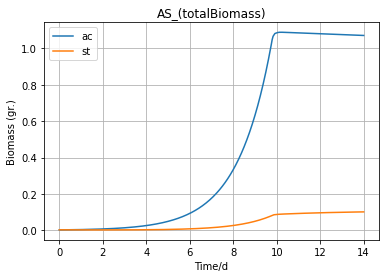

C:\Users\wupen\Program\Anaconda3\envs\Tib_Models\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 12289 (\N{IDEOGRAPHIC COMMA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


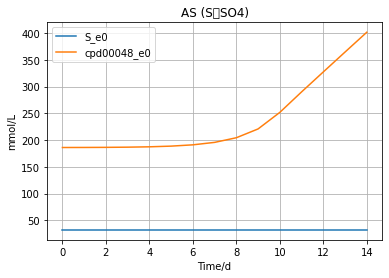

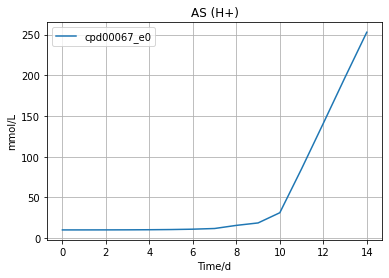

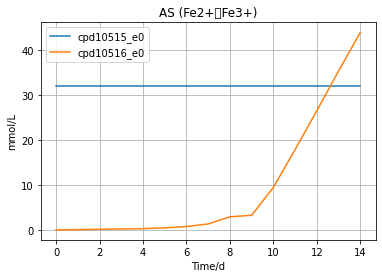

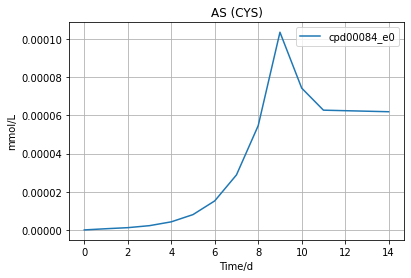

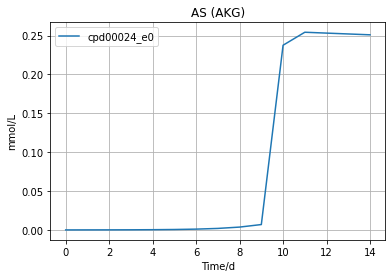

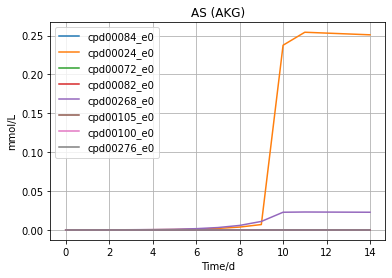

In [18]:
import cobra
import cometspy as c
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from cobra import Model, Reaction, Metabolite
# chemostat parameters
dilution_rate = 0.1  # / hr
initial_pop = 2.e-3  # gDW

# make COMETS models from the cobrapy models
a.id = "ac"
s.id = "st"

AC = c.model(a)
AC.initial_pop = [0, 0, 2.e-3]  # x, y, gDW
# AC.open_exchanges()
AC.change_bounds('EX_cpd00011_e0', -1.575, -1.575)
AC.change_bounds('EX_S', -1.5, -1.5)
# AC.change_bounds('EX_cpd00084_e0',0,1000)
AC.change_bounds('EX_cpd00048_e0', 1.5, 1000)
# AC.change_bounds('EX_cpd00067_e0',1,100)
AC.change_bounds('Tr_cpd00084_c0', 0, 1000)
AC.change_bounds('Tr_cpd00084_c0', 0, 1000)
# for i in AC.reactions.loc[AC.reactions.EXCH, "REACTION_NAMES"] :
#     AC.change_vmax(i,3.3)
#     AC.change_km(i,0.015)
AC.change_vmax('EX_S', 6)
AC.change_km('EX_S', 0.15)


ST = c.model(s)
ST.initial_pop = [0, 0, 2.45e-3]  # x, y, gDW
ST.open_exchanges()
# ST.change_bounds('EX_cpd10515_e0', -2.48,-2.48)
# ST.change_bounds('EX_cpd00067_e0', 0,1000)

# ST.change_bounds('EX_cpd00024_e0',-1000,1000)
# ST.change_bounds('EX_cpd00084_e0',-1000,1000)
# ST.change_bounds('EX_cpd00067_e0', 0, 1000)
# ST.change_bounds('EX_cpd00048_e0', 0, 1000)
for i in ST.reactions.loc[ST.reactions.EXCH, "REACTION_NAMES"]:
    ST.change_vmax(i, 6.0)
    ST.change_km(i, 0.015)
ST.change_vmax('EX_cpd00067_e0', 0.1)
ST.change_km('EX_cpd00067_e0', 0.000015)
ST.change_vmax('EX_cpd10515_e0', 10.5)
ST.change_km('EX_cpd10515_e0', 0.01)

# setup layout by providing models
layout = c.layout([AC, ST])

# re-write media (while removing galactose) and add it to layout
comets_media = {
    key[3:]: value
    for key, value in dict3.items()
    if key != "EX_cpd00084_e0" and key != 'EX_S' and key != "EX_cpd00024_e0"
}
for key, value in comets_media.items():
    if key != 'cpd00635_p0':
        layout.set_specific_metabolite(key, value)
# for key, value in comets_media.items():
#     layout.set_specific_refresh(key, value * dilution_rate)
# layout.set_specific_refresh('S_e0', 0.15)
# layout.set_specific_metabolite('S_e0',1.5)
layout.set_specific_metabolite('S_e0', 32)
layout.set_specific_metabolite('cpd00048_e0', 186)
layout.set_specific_metabolite('cpd00067_e0', 10)
layout.set_specific_metabolite('cpd00011_e0', 1000)
layout.set_specific_metabolite('cpd00007_e0', 1000)
layout.set_specific_metabolite('cpd10515_e0', 32)
layout.set_specific_metabolite('cpd10516_e0', 0)
layout.set_specific_metabolite('cpd00084_e0', 0)
layout.set_specific_metabolite('cpd00024_e0', 0)
layout.set_specific_static('S_e0', 32)
layout.set_specific_static('cpd10515_e0', 32)

params = c.params()
params.set_param("deathRate", 0.01)
# params.set_param("metaboliteDilutionRate", 0.01)
params.set_param("timeStep", 1)  # hours
params.set_param("maxSpaceBiomass", 1.2)  # gDW
params.set_param("maxCycles", 24 * 14)  # duration of simulation in time steps
params.set_param("cellSize",  4.3e-12)
# params.set_param('spaceWidth', 10)
params.set_param('writeBiomassLog', True)
params.set_param('BiomassLogRate', 24)
params.set_param('writeMediaLog', True)
params.set_param('MediaLogRate', 24)
params.set_param("writeFluxLog", True)
params.set_param("FluxLogRate", 24)  # 日志
params.set_param("numExRxnSubsteps", 18)
params.set_param("writeSpecificMediaLog", True)
params.set_param("specificMediaLogRate", 24)  # time steps
# metabolites to track
params.set_param(
    'specificMedia',
    'cpd00067_e0,S_e0,cpd00048_e0,cpd00084_e0,cpd00024_e0,cpd10515_e0,cpd10516_e0, cpd00072_e0, cpd00082_e0,cpd00268_e0, cpd00105_e0, cpd00100_e0, cpd00276_e0'
)


sim = c.comets(layout, params)
sim.run(False)
# sim.run()
biomass = sim.total_biomass
biomass['t'] = biomass['cycle'] * sim.parameters.all_params['timeStep'] / 24
myplot = biomass.drop(columns=['cycle']).plot(x='t')
myplot.set_ylabel("Biomass (gr.)")
myplot.set_xlabel('Time/d')
plt.title("AS_(totalBiomass)")
plt.grid()
fig = sim.specific_media
fig['t'] = fig['cycle'] * sim.parameters.all_params['timeStep'] / 24
fig1 = sim.specific_media.plot(x='t', y=['S_e0','cpd00048_e0'])
fig1.set_ylabel("mmol/L")
fig1.set_xlabel("Time/d")
plt.title("AS (S、SO4)")
plt.grid()
fig = sim.specific_media
fig['t'] = fig['cycle'] * sim.parameters.all_params['timeStep'] / 24
fig1 = sim.specific_media.plot(x='t', y=['cpd00067_e0'])
fig1.set_ylabel("mmol/L")
fig1.set_xlabel("Time/d")
plt.title("AS (H+)")
plt.grid()
fig = sim.specific_media
fig['t'] = fig['cycle'] * sim.parameters.all_params['timeStep'] / 24
fig1 = sim.specific_media.plot(x='t', y=['cpd10515_e0','cpd10516_e0'])
fig1.set_ylabel("mmol/L")
fig1.set_xlabel("Time/d")
plt.title("AS (Fe2+、Fe3+)")
plt.grid()
fig = sim.specific_media
fig['t'] = fig['cycle'] * sim.parameters.all_params['timeStep'] / 24
fig1 = sim.specific_media.plot(x='t', y=['cpd00084_e0'])
fig1.set_ylabel("mmol/L")
fig1.set_xlabel("Time/d")
plt.title("AS (CYS)")
plt.grid()
fig = sim.specific_media
fig['t'] = fig['cycle'] * sim.parameters.all_params['timeStep'] / 24
fig1 = sim.specific_media.plot(x='t', y=['cpd00024_e0'])
fig1.set_ylabel("mmol/L")
fig1.set_xlabel("Time/d")
plt.title("AS (AKG)")
plt.grid()
fig = sim.specific_media
fig['t'] = fig['cycle'] * sim.parameters.all_params['timeStep'] / 24
fig1 = sim.specific_media.plot(x='t',
                               y=[
                                   'cpd00084_e0', 'cpd00024_e0', 'cpd00072_e0',
                                   'cpd00082_e0', 'cpd00268_e0', 'cpd00105_e0',
                                   'cpd00100_e0', 'cpd00276_e0'
                               ])
fig1.set_ylabel("mmol/L")
fig1.set_xlabel("Time/d")
plt.title("AS (AKG)")
plt.grid()

In [32]:
# layout.media
layout.all_exchanged_mets
# sim.run_output

['S4O6_e0',
 'S_e0',
 'cpd00001_c0',
 'cpd00001_e0',
 'cpd00002_e0',
 'cpd00003_e0',
 'cpd00004_e0',
 'cpd00005_e0',
 'cpd00006_e0',
 'cpd00007_e0',
 'cpd00008_e0',
 'cpd00009_e0',
 'cpd00010_e0',
 'cpd00011_e0',
 'cpd00012_e0',
 'cpd00013_e0',
 'cpd00014_e0',
 'cpd00015_e0',
 'cpd00016_e0',
 'cpd00017_e0',
 'cpd00018_e0',
 'cpd00019_e0',
 'cpd00020_e0',
 'cpd00022_e0',
 'cpd00023_e0',
 'cpd00024_e0',
 'cpd00025_e0',
 'cpd00026_e0',
 'cpd00027_e0',
 'cpd00028_e0',
 'cpd00029_e0',
 'cpd00030_e0',
 'cpd00031_e0',
 'cpd00032_e0',
 'cpd00033_e0',
 'cpd00034_e0',
 'cpd00035_e0',
 'cpd00036_e0',
 'cpd00037_e0',
 'cpd00038_e0',
 'cpd00039_e0',
 'cpd00040_e0',
 'cpd00041_e0',
 'cpd00042_e0',
 'cpd00043_e0',
 'cpd00044_e0',
 'cpd00045_e0',
 'cpd00046_e0',
 'cpd00047_e0',
 'cpd00048_e0',
 'cpd00049_e0',
 'cpd00050_e0',
 'cpd00051_e0',
 'cpd00052_e0',
 'cpd00053_e0',
 'cpd00054_e0',
 'cpd00055_e0',
 'cpd00056_e0',
 'cpd00058_e0',
 'cpd00060_e0',
 'cpd00061_e0',
 'cpd00062_e0',
 'cpd00063_e0',
 'c

In [151]:
wrtite = pd.ExcelWriter('fluxall_ac.xlsx')
flu5 = sim.fluxes_by_species['ac']
df = pd.DataFrame(flu5)
df.to_excel(wrtite, sheet_name='AC')
wrtite.save()

wrtite = pd.ExcelWriter('fluxall_st.xlsx')
flu5 = sim.fluxes_by_species['st']
df = pd.DataFrame(flu5)
df.to_excel(wrtite, sheet_name='ST')
wrtite.save()

In [150]:
#   media处理制表符
# 读取文件内容
def file_modify(dirs,to_path):
    with open(dirs, 'r') as file:
        lines = file.readlines()

    # 替换每一行中的空格为制表符
    for i in range(len(lines)):
        lines[i] = '\t'.join(lines[i].split())+'\n'

    # 写入修改后的内容到文件
    with open(to_path, 'w') as file:
        file.writelines(lines)
file_modify('./totalbiomasslog_0x1f5e0b2ee80','./totalbiomasslog_file.txt')
file_modify('./biomasslog_0x1f5e0b2ee80','./biomasslog_file.txt')
file_modify('./medialog_0x1f5e0b2ee80','./medialog_file.txt')
            

In [4]:
a = cobra.io.read_sbml_model('/jupyternotebook/AME_Secr_Cys.xml')
a.summary()
a.reactions.EX_cpd00024_e0.bounds=(0,1000)#	2-Oxoglutarate
a.reactions.EX_cpd00094_e0.bounds=(0,1000)# 2-Ketobutyric acid
a.reactions.EX_cpd00082_e0.bounds=(0,1000)# D-Fructose
a.reactions.EX_cpd00029_e0.bounds=(0,1000) # Acetate
a.reactions.EX_cpd00138_e0.bounds=(0,1000) # D-Mannose
a.reactions.EX_cpd00072_e0.bounds=(0,1000) # D-fructose-6-phosphate
a.reactions.EX_cpd00794_e0.bounds=(0,1000)
a.reactions.EX_cpd00111_e0.bounds=(0,1000)
a.reactions.EX_cpd00276_e0.bounds=(0,1000)
a.reactions.EX_cpd00105_e0.bounds=(0,1000)
a.reactions.EX_cpd00129_e0.bounds=(0,1000)
a.reactions.EX_cpd00017_e0.bounds=(0,1000)
a.reactions.EX_cpd00100_e0.bounds=(0,1000)
a.reactions.EX_cpd00011_e0.bounds=(-1.575,-1.575)    
a.reactions.bio1.bounds=(0,0.0379)
a.reactions.bio1.bounds=(0,1000)
#     a.reactions.rxn00338_c0.bounds=(0,0)
a.reactions.rxn09296_c0.bounds=(0,0)
a.reactions.rxn00205_c0.bounds=(0,0)
add_reactions(a,'TR_25_84','cpd00025_c0 + 65.0 cpd00084_c0 --> 2.0 cpd00001_p0 + 1.31 cpd00084_p0 + cpd00007_p0')
add_metabolites_info(a)
a.reactions.EX_cpd00084_e0.bounds=(0,1000)
a.reactions.Tr_cpd00084_c0.bounds=(0,1000)
a.summary()
for i in a.metabolites:
    if i.id.startswith('cpd'):
        i.id
        met = i.id.split('_')[0]+'_'+i.id.split('_')[1][0]
        a.metabolites.get_by_id(i.id).id = met
        met
for i in a.metabolites:
    if not i.id.startswith('cpd'):
        i.id
        met = i.id.replace('0','')
        a.metabolites.get_by_id(i.id).id = met
        met
a.summary()


# cobra.io.write_sbml_model(a,'/download/diamond-windows/AS/AS-NO-GPR/AC22.xml')
# s = cobra.io.read_sbml_model('/jupyternotebook/ST_cys_add.xml')
# s.reactions.EX_cpd00084_e0.bounds=(-0.0001131,1000)
# s.reactions.EX_cpd00024_e0.bounds=(-0.00053,1000) 
# s.summary()
# ex_s = [x.id[3:-3] for x in s.reactions if x.id.startswith('EX_')]
# ex_s = list(set(ex_s))
# for i in s.metabolites:
#     if i.id.endswith("_c0") and i.id.startswith('cpd') and i.id[:-3] not in ex_s and i.id != 'cpd17041_c0' and i.id != 'cpd17042_c0' and i.id != 'cpd17043_c0':
#         add_reactions(s, 'EX_' + i.id[:-3] + '_e0',i.id[:-3] + '_e0' + ' -->')  # L-Homoserine
#         add_reactions(s, 'EX_' + i.id[:-3] + '_p0',i.id[:-3] + '_e0' + '<--> ' + i.id[:-3] + '_p0')
#         add_reactions(s, 'Tr_' + i.id[:-3] + '_c0',i.id[:-3] + '_c0' + ' <-->' + i.id[:-3] + '_p0')
# add_metabolites_info(s)
# s.summary()
# for i in s.metabolites:
#     met = i.id.split('_')[0]+'_'+i.id.split('_')[1][0]
#     s.metabolites.get_by_id(i.id).id = met
# for i in s.metabolites:
#     if not i.id.startswith('cpd'):
#         i.id
#         met = i.id.replace('0','')
#         s.metabolites.get_by_id(i.id).id = met
#         met
# s.summary()
# gen = []
# for i in s.genes:
#     gen.append(i)
# cobra.manipulation.delete.remove_genes(s, gen, False)
# s.summary()
# cobra.io.write_sbml_model(s,'/download/diamond-windows/AS/AS-NO-GPR/ST22.xml')


Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,0.6057,0,0.00%
cpd00007_e0,EX_cpd00007_e0,1.312,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.03518,0,0.00%
cpd00011_e0,EX_cpd00011_e0,1.575,1,100.00%
cpd00013_e0,EX_cpd00013_e0,0.397,0,0.00%
cpd00030_e0,EX_cpd00030_e0,2.52E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,1.244E-05,0,0.00%
cpd00058_e0,EX_cpd00058_e0,2.586E-05,0,0.00%
cpd00063_e0,EX_cpd00063_e0,0.0001898,0,0.00%


这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p


Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,0.5618,0,0.00%
cpd00007_e0,EX_cpd00007_e0,1.336,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.03656,0,0.00%
cpd00011_e0,EX_cpd00011_e0,1.575,1,99.98%
cpd00013_e0,EX_cpd00013_e0,0.415,0,0.00%
cpd00028_e0,EX_cpd00028_e0,8.491E-06,34,0.02%
cpd00030_e0,EX_cpd00030_e0,2.619E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,1.293E-05,0,0.00%
cpd00058_e0,EX_cpd00058_e0,2.688E-05,0,0.00%


'cpd00443_c0'

'cpd00443_c'

'cpd02920_c0'

'cpd02920_c'

'cpd00012_c0'

'cpd00012_c'

'cpd00067_c0'

'cpd00067_c'

'cpd00683_c0'

'cpd00683_c'

'cpd00002_c0'

'cpd00002_c'

'cpd00033_c0'

'cpd00033_c'

'cpd00506_c0'

'cpd00506_c'

'cpd00008_c0'

'cpd00008_c'

'cpd00009_c0'

'cpd00009_c'

'cpd00042_c0'

'cpd00042_c'

'cpd00114_c0'

'cpd00114_c'

'cpd00103_c0'

'cpd00103_c'

'cpd00226_c0'

'cpd00226_c'

'cpd00017_c0'

'cpd00017_c'

'cpd00074_c0'

'cpd00074_c'

'cpd01311_c0'

'cpd01311_c'

'cpd00060_c0'

'cpd00060_c'

'cpd00104_c0'

'cpd00104_c'

'cpd03091_c0'

'cpd03091_c'

'cpd00022_c0'

'cpd00022_c'

'cpd00054_c0'

'cpd00054_c'

'cpd00010_c0'

'cpd00010_c'

'cpd00722_c0'

'cpd00722_c'

'cpd00046_c0'

'cpd00046_c'

'cpd00096_c0'

'cpd00096_c'

'cpd00037_c0'

'cpd00037_c'

'cpd03494_c0'

'cpd03494_c'

'cpd00014_c0'

'cpd00014_c'

'cpd03495_c0'

'cpd03495_c'

'cpd00001_c0'

'cpd00001_c'

'cpd00658_c0'

'cpd00658_c'

'cpd00020_c0'

'cpd00020_c'

'cpd02566_c0'

'cpd02566_c'

'cpd11440_c0'

'cpd11440_c'

'cpd00018_c0'

'cpd00018_c'

'cpd11441_c0'

'cpd11441_c'

'cpd00004_c0'

'cpd00004_c'

'cpd11527_c0'

'cpd11527_c'

'cpd00003_c0'

'cpd00003_c'

'cpd11528_c0'

'cpd11528_c'

'cpd00533_c0'

'cpd00533_c'

'cpd00356_c0'

'cpd00356_c'

'cpd00067_p0'

'cpd00067_p'

'cpd00075_p0'

'cpd00075_p'

'cpd00075_c0'

'cpd00075_c'

'cpd00213_c0'

'cpd00213_c'

'cpd03049_c0'

'cpd03049_c'

'cpd00056_c0'

'cpd00056_c'

'cpd00836_c0'

'cpd00836_c'

'cpd00137_c0'

'cpd00137_c'

'cpd00260_c0'

'cpd00260_c'

'cpd00521_c0'

'cpd00521_c'

'cpd00522_c0'

'cpd00522_c'

'cpd01140_c0'

'cpd01140_c'

'cpd02807_c0'

'cpd02807_c'

'cpd02952_c0'

'cpd02952_c'

'cpd11466_c0'

'cpd11466_c'

'cpd01695_c0'

'cpd01695_c'

'cpd11493_c0'

'cpd11493_c'

'cpd08739_c0'

'cpd08739_c'

'cpd08740_c0'

'cpd08740_c'

'cpd17042_c0'

'cpd17042_c'

'cpd11640_c0'

'cpd11640_c'

'cpd15560_c0'

'cpd15560_c'

'cpd15561_c0'

'cpd15561_c'

'cpd00068_c0'

'cpd00068_c'

'cpd00072_c0'

'cpd00072_c'

'cpd00090_c0'

'cpd00090_c'

'cpd00290_c0'

'cpd00290_c'

'cpd11492_c0'

'cpd11492_c'

'cpd00011_c0'

'cpd00011_c'

'cpd11529_c0'

'cpd11529_c'

'cpd02557_c0'

'cpd02557_c'

'cpd00113_c0'

'cpd00113_c'

'cpd02590_c0'

'cpd02590_c'

'cpd08289_c0'

'cpd08289_c'

'cpd08449_c0'

'cpd08449_c'

'cpd00478_c0'

'cpd00478_c'

'cpd03187_c0'

'cpd03187_c'

'cpd00024_c0'

'cpd00024_c'

'cpd15688_c0'

'cpd15688_c'

'cpd15694_c0'

'cpd15694_c'

'cpd11589_c0'

'cpd11589_c'

'cpd00041_c0'

'cpd00041_c'

'cpd02519_c0'

'cpd02519_c'

'cpd02744_c0'

'cpd02744_c'

'cpd00206_c0'

'cpd00206_c'

'cpd00032_c0'

'cpd00032_c'

'cpd00061_c0'

'cpd00061_c'

'cpd00070_c0'

'cpd00070_c'

'cpd02375_c0'

'cpd02375_c'

'cpd00106_c0'

'cpd00106_c'

'cpd00052_c0'

'cpd00052_c'

'cpd00084_c0'

'cpd00084_c'

'cpd02201_c0'

'cpd02201_c'

'cpd02666_c0'

'cpd02666_c'

'cpd00026_c0'

'cpd00026_c'

'cpd00144_c0'

'cpd00144_c'

'cpd00023_c0'

'cpd00023_c'

'cpd02097_c0'

'cpd02097_c'

'cpd02168_c0'

'cpd02168_c'

'cpd03211_c0'

'cpd03211_c'

'cpd00201_c0'

'cpd00201_c'

'cpd03524_c0'

'cpd03524_c'

'cpd00093_c0'

'cpd00093_c'

'cpd02014_c0'

'cpd02014_c'

'cpd00477_c0'

'cpd00477_c'

'cpd11503_c0'

'cpd11503_c'

'cpd11504_c0'

'cpd11504_c'

'cpd03349_c0'

'cpd03349_c'

'cpd03362_c0'

'cpd03362_c'

'cpd00062_c0'

'cpd00062_c'

'cpd00805_c0'

'cpd00805_c'

'cpd02371_c0'

'cpd02371_c'

'cpd04097_c0'

'cpd04097_c'

'cpd04097_p0'

'cpd04097_p'

'cpd00311_c0'

'cpd00311_c'

'cpd00013_c0'

'cpd00013_c'

'cpd01217_c0'

'cpd01217_c'

'cpd15540_c0'

'cpd15540_c'

'cpd00100_c0'

'cpd00100_c'

'cpd15793_c0'

'cpd15793_c'

'cpd00807_c0'

'cpd00807_c'

'cpd00930_c0'

'cpd00930_c'

'cpd03414_c0'

'cpd03414_c'

'cpd03416_c0'

'cpd03416_c'

'cpd02961_c0'

'cpd02961_c'

'cpd00229_c0'

'cpd00229_c'

'cpd00954_c0'

'cpd00954_c'

'cpd00006_c0'

'cpd00006_c'

'cpd00202_c0'

'cpd00202_c'

'cpd00005_c0'

'cpd00005_c'

'cpd08615_c0'

'cpd08615_c'

'cpd00007_c0'

'cpd00007_c'

'cpd00025_c0'

'cpd00025_c'

'cpd02978_c0'

'cpd02978_c'

'cpd03521_c0'

'cpd03521_c'

'cpd11540_c0'

'cpd11540_c'

'cpd11541_c0'

'cpd11541_c'

'cpd00080_c0'

'cpd00080_c'

'cpd15686_c0'

'cpd15686_c'

'cpd15719_c0'

'cpd15719_c'

'cpd11439_c0'

'cpd11439_c'

'cpd15675_c0'

'cpd15675_c'

'cpd00811_c0'

'cpd00811_c'

'cpd15499_c0'

'cpd15499_c'

'cpd00441_c0'

'cpd00441_c'

'cpd15500_c0'

'cpd15500_c'

'cpd15331_c0'

'cpd15331_c'

'cpd15522_c0'

'cpd15522_c'

'cpd15682_c0'

'cpd15682_c'

'cpd00112_c0'

'cpd00112_c'

'cpd03658_c0'

'cpd03658_c'

'cpd03659_c0'

'cpd03659_c'

'cpd00350_c0'

'cpd00350_c'

'cpd00289_c0'

'cpd00289_c'

'cpd02498_c0'

'cpd02498_c'

'cpd00123_c0'

'cpd00123_c'

'cpd11543_c0'

'cpd11543_c'

'cpd11544_c0'

'cpd11544_c'

'cpd11432_c0'

'cpd11432_c'

'cpd15671_c0'

'cpd15671_c'

'cpd00171_c0'

'cpd00171_c'

'cpd00047_c0'

'cpd00047_c'

'cpd11225_c0'

'cpd11225_c'

'cpd11536_c0'

'cpd11536_c'

'cpd11537_c0'

'cpd11537_c'

'cpd00342_c0'

'cpd00342_c'

'cpd00064_c0'

'cpd00064_c'

'cpd00585_c0'

'cpd00585_c'

'cpd01679_c0'

'cpd01679_c'

'cpd00095_c0'

'cpd00095_c'

'cpd02333_c0'

'cpd02333_c'

'cpd03470_c0'

'cpd03470_c'

'cpd15685_c0'

'cpd15685_c'

'cpd15691_c0'

'cpd15691_c'

'cpd00817_c0'

'cpd00817_c'

'cpd12232_c0'

'cpd12232_c'

'cpd00354_c0'

'cpd00354_c'

'cpd00162_c0'

'cpd00162_c'

'cpd00071_c0'

'cpd00071_c'

'cpd00519_c0'

'cpd00519_c'

'cpd00086_c0'

'cpd00086_c'

'cpd00236_c0'

'cpd00236_c'

'cpd02147_c0'

'cpd02147_c'

'cpd00810_c0'

'cpd00810_c'

'cpd00091_c0'

'cpd00091_c'

'cpd02654_c0'

'cpd02654_c'

'cpd02894_c0'

'cpd02894_c'

'cpd00793_c0'

'cpd00793_c'

'cpd00118_c0'

'cpd00118_c'

'cpd00345_c0'

'cpd00345_c'

'cpd00125_c0'

'cpd00125_c'

'cpd00019_c0'

'cpd00019_c'

'cpd02738_c0'

'cpd02738_c'

'cpd02555_c0'

'cpd02555_c'

'cpd15308_c0'

'cpd15308_c'

'cpd15523_c0'

'cpd15523_c'

'cpd03587_c0'

'cpd03587_c'

'cpd03831_c0'

'cpd03831_c'

'cpd15485_c0'

'cpd15485_c'

'cpd01030_p0'

'cpd01030_p'

'cpd03698_c0'

'cpd03698_c'

'cpd15702_c0'

'cpd15702_c'

'cpd15678_c0'

'cpd15678_c'

'cpd11573_c0'

'cpd11573_c'

'cpd00327_c0'

'cpd00327_c'

'cpd11437_c0'

'cpd11437_c'

'cpd02210_c0'

'cpd02210_c'

'cpd00102_c0'

'cpd00102_c'

'cpd00359_c0'

'cpd00359_c'

'cpd03002_c0'

'cpd03002_c'

'cpd02993_c0'

'cpd02993_c'

'cpd02730_c0'

'cpd02730_c'

'cpd12225_c0'

'cpd12225_c'

'cpd12005_c0'

'cpd12005_c'

'cpd15677_c0'

'cpd15677_c'

'cpd15605_c0'

'cpd15605_c'

'cpd00066_c0'

'cpd00066_c'

'cpd01977_c0'

'cpd01977_c'

'cpd15422_c0'

'cpd15422_c'

'cpd00493_c0'

'cpd00493_c'

'cpd00016_c0'

'cpd00016_c'

'cpd03205_c0'

'cpd03205_c'

'cpd11502_c0'

'cpd11502_c'

'cpd11464_c0'

'cpd11464_c'

'cpd11486_c0'

'cpd11486_c'

'cpd01012_c0'

'cpd01012_c'

'cpd01012_p0'

'cpd01012_p'

'cpd03333_c0'

'cpd03333_c'

'cpd00373_c0'

'cpd00373_c'

'cpd00268_c0'

'cpd00268_c'

'cpd11421_c0'

'cpd11421_c'

'cpd00029_c0'

'cpd00029_c'

'cpd00081_c0'

'cpd00081_c'

'cpd11420_c0'

'cpd11420_c'

'cpd15423_c0'

'cpd15423_c'

'cpd15553_c0'

'cpd15553_c'

'cpd00089_c0'

'cpd00089_c'

'cpd00387_c0'

'cpd00387_c'

'cpd15418_c0'

'cpd15418_c'

'cpd15556_c0'

'cpd15556_c'

'cpd01646_c0'

'cpd01646_c'

'cpd00242_c0'

'cpd00242_c'

'cpd12848_c0'

'cpd12848_c'

'cpd12543_c0'

'cpd12543_c'

'cpd02233_c0'

'cpd02233_c'

'cpd03379_c0'

'cpd03379_c'

'cpd00239_c0'

'cpd00239_c'

'cpd00383_c0'

'cpd00383_c'

'cpd02030_c0'

'cpd02030_c'

'cpd00219_c0'

'cpd00219_c'

'cpd00868_c0'

'cpd00868_c'

'cpd00193_c0'

'cpd00193_c'

'cpd00044_c0'

'cpd00044_c'

'cpd00504_c0'

'cpd00504_c'

'cpd00516_c0'

'cpd00516_c'

'cpd00905_c0'

'cpd00905_c'

'cpd00031_c0'

'cpd00031_c'

'cpd11585_c0'

'cpd11585_c'

'cpd00035_c0'

'cpd00035_c'

'cpd02791_c0'

'cpd02791_c'

'cpd11295_c0'

'cpd11295_c'

'cpd02626_c0'

'cpd02626_c'

'cpd00340_c0'

'cpd00340_c'

'cpd02574_c0'

'cpd02574_c'

'cpd00652_c0'

'cpd00652_c'

'cpd00515_c0'

'cpd00515_c'

'cpd00689_c0'

'cpd00689_c'

'cpd00755_c0'

'cpd00755_c'

'cpd00196_c0'

'cpd00196_c'

'cpd11472_c0'

'cpd11472_c'

'cpd11490_c0'

'cpd11490_c'

'cpd15529_c0'

'cpd15529_c'

'cpd00448_c0'

'cpd00448_c'

'cpd00223_c0'

'cpd00223_c'

'cpd00169_c0'

'cpd00169_c'

'cpd00276_p0'

'cpd00276_p'

'cpd00288_c0'

'cpd00288_c'

'cpd00760_c0'

'cpd00760_c'

'cpd11495_c0'

'cpd11495_c'

'cpd00655_c0'

'cpd00655_c'

'cpd01775_c0'

'cpd01775_c'

'cpd00858_c0'

'cpd00858_c'

'cpd02431_c0'

'cpd02431_c'

'cpd00498_c0'

'cpd00498_c'

'cpd10162_c0'

'cpd10162_c'

'cpd00082_p0'

'cpd00082_p'

'cpd00802_c0'

'cpd00802_c'

'cpd11514_c0'

'cpd11514_c'

'cpd11515_c0'

'cpd11515_c'

'cpd15352_c0'

'cpd15352_c'

'cpd15353_c0'

'cpd15353_c'

'cpd00203_c0'

'cpd00203_c'

'cpd00001_p0'

'cpd00001_p'

'cpd00867_c0'

'cpd00867_c'

'cpd00121_c0'

'cpd00121_c'

'cpd00481_c0'

'cpd00481_c'

'cpd11545_c0'

'cpd11545_c'

'cpd15722_c0'

'cpd15722_c'

'cpd15794_c0'

'cpd15794_c'

'cpd00282_c0'

'cpd00282_c'

'cpd00247_c0'

'cpd00247_c'

'cpd08301_c0'

'cpd08301_c'

'cpd11538_c0'

'cpd11538_c'

'cpd00774_c0'

'cpd00774_c'

'cpd15723_c0'

'cpd15723_c'

'cpd15795_c0'

'cpd15795_c'

'cpd02999_c0'

'cpd02999_c'

'cpd03660_c0'

'cpd03660_c'

'cpd15557_c0'

'cpd15557_c'

'cpd15533_c0'

'cpd15533_c'

'cpd01357_c0'

'cpd01357_c'

'cpd01447_c0'

'cpd01447_c'

'cpd00286_c0'

'cpd00286_c'

'cpd02862_c0'

'cpd02862_c'

'cpd02948_c0'

'cpd02948_c'

'cpd02857_c0'

'cpd02857_c'

'cpd00699_c0'

'cpd00699_c'

'cpd00192_c0'

'cpd00192_c'

'cpd05630_c0'

'cpd05630_c'

'cpd15065_c0'

'cpd15065_c'

'cpd04539_c0'

'cpd04539_c'

'cpd11468_c0'

'cpd11468_c'

'cpd11469_c0'

'cpd11469_c'

'cpd00058_p0'

'cpd00058_p'

'cpd00058_c0'

'cpd00058_c'

'cpd00087_c0'

'cpd00087_c'

'cpd02152_c0'

'cpd02152_c'

'cpd00051_c0'

'cpd00051_c'

'cpd00641_c0'

'cpd00641_c'

'cpd15687_c0'

'cpd15687_c'

'cpd15693_c0'

'cpd15693_c'

'cpd11549_c0'

'cpd11549_c'

'cpd11550_c0'

'cpd11550_c'

'cpd00626_c0'

'cpd00626_c'

'cpd00220_c0'

'cpd00220_c'

'cpd00739_c0'

'cpd00739_c'

'cpd08286_c0'

'cpd08286_c'

'cpd00442_c0'

'cpd00442_c'

'cpd03666_c0'

'cpd03666_c'

'cpd00107_p0'

'cpd00107_p'

'cpd00107_c0'

'cpd00107_c'

'cpd03607_c0'

'cpd03607_c'

'cpd02893_c0'

'cpd02893_c'

'cpd02140_c0'

'cpd02140_c'

'cpd01061_c0'

'cpd01061_c'

'cpd15165_c0'

'cpd15165_c'

'cpd00147_c0'

'cpd00147_c'

'cpd00128_c0'

'cpd00128_c'

'cpd11554_c0'

'cpd11554_c'

'cpd11555_c0'

'cpd11555_c'

'cpd00357_c0'

'cpd00357_c'

'cpd00297_c0'

'cpd00297_c'

'cpd00053_c0'

'cpd00053_c'

'cpd00216_c0'

'cpd00216_c'

'cpd00224_p0'

'cpd00224_p'

'cpd00224_c0'

'cpd00224_c'

'cpd00314_p0'

'cpd00314_p'

'cpd00491_c0'

'cpd00491_c'

'cpd00274_c0'

'cpd00274_c'

'cpd11588_c0'

'cpd11588_c'

'cpd00129_c0'

'cpd00129_c'

'cpd11341_c0'

'cpd11341_c'

'cpd11408_c0'

'cpd11408_c'

'cpd00038_c0'

'cpd00038_c'

'cpd11438_c0'

'cpd11438_c'

'cpd11570_c0'

'cpd11570_c'

'cpd11571_c0'

'cpd11571_c'

'cpd00134_c0'

'cpd00134_c'

'cpd00365_c0'

'cpd00365_c'

'cpd01691_c0'

'cpd01691_c'

'cpd01324_c0'

'cpd01324_c'

'cpd00871_c0'

'cpd00871_c'

'cpd15325_c0'

'cpd15325_c'

'cpd15521_c0'

'cpd15521_c'

'cpd15679_c0'

'cpd15679_c'

'cpd00040_c0'

'cpd00040_c'

'cpd15720_c0'

'cpd15720_c'

'cpd00013_p0'

'cpd00013_p'

'cpd00497_c0'

'cpd00497_c'

'cpd00126_c0'

'cpd00126_c'

'cpd00957_c0'

'cpd00957_c'

'cpd00863_c0'

'cpd00863_c'

'cpd11553_c0'

'cpd11553_c'

'cpd00183_c0'

'cpd00183_c'

'cpd00055_c0'

'cpd00055_c'

'cpd00186_c0'

'cpd00186_c'

'cpd01512_c0'

'cpd01512_c'

'cpd00822_c0'

'cpd00822_c'

'cpd00036_c0'

'cpd00036_c'

'cpd00135_c0'

'cpd00135_c'

'cpd03518_c0'

'cpd03518_c'

'cpd03519_c0'

'cpd03519_c'

'cpd15268_c0'

'cpd15268_c'

'cpd15329_c0'

'cpd15329_c'

'cpd15704_c0'

'cpd15704_c'

'cpd15680_c0'

'cpd15680_c'

'cpd10515_p0'

'cpd10515_p'

'cpd10515_c0'

'cpd10515_c'

'cpd15419_c0'

'cpd15419_c'

'cpd15545_c0'

'cpd15545_c'

'cpd00790_c0'

'cpd00790_c'

'cpd00179_p0'

'cpd00179_p'

'cpd01919_c0'

'cpd01919_c'

'cpd03963_c0'

'cpd03963_c'

'cpd00073_c0'

'cpd00073_c'

'cpd11474_c0'

'cpd11474_c'

'cpd11489_c0'

'cpd11489_c'

'cpd11506_c0'

'cpd11506_c'

'cpd11507_c0'

'cpd11507_c'

'cpd00105_c0'

'cpd00105_c'

'cpd00258_c0'

'cpd00258_c'

'cpd00347_c0'

'cpd00347_c'

'cpd11476_c0'

'cpd11476_c'

'cpd15526_c0'

'cpd15526_c'

'cpd15312_c0'

'cpd15312_c'

'cpd15527_c0'

'cpd15527_c'

'cpd00875_c0'

'cpd00875_c'

'cpd15309_c0'

'cpd15309_c'

'cpd15524_c0'

'cpd15524_c'

'cpd00100_p0'

'cpd00100_p'

'cpd00270_c0'

'cpd00270_c'

'cpd05546_c0'

'cpd05546_c'

'cpd15088_c0'

'cpd15088_c'

'cpd11568_c0'

'cpd11568_c'

'cpd11569_c0'

'cpd11569_c'

'cpd15606_c0'

'cpd15606_c'

'cpd00069_c0'

'cpd00069_c'

'cpd11546_c0'

'cpd11546_c'

'cpd11547_c0'

'cpd11547_c'

'cpd11539_c0'

'cpd11539_c'

'cpd15364_c0'

'cpd15364_c'

'cpd15420_c0'

'cpd15420_c'

'cpd15548_c0'

'cpd15548_c'

'cpd00015_c0'

'cpd00015_c'

'cpd00982_c0'

'cpd00982_c'

'cpd15674_c0'

'cpd15674_c'

'cpd11491_c0'

'cpd11491_c'

'cpd11558_c0'

'cpd11558_c'

'cpd11559_c0'

'cpd11559_c'

'cpd00906_c0'

'cpd00906_c'

'cpd00343_c0'

'cpd00343_c'

'cpd00939_c0'

'cpd00939_c'

'cpd00009_p0'

'cpd00009_p'

'cpd00227_c0'

'cpd00227_c'

'cpd00346_c0'

'cpd00346_c'

'cpd09027_c0'

'cpd09027_c'

'cpd01567_c0'

'cpd01567_c'

'cpd00175_c0'

'cpd00175_c'

'cpd11521_c0'

'cpd11521_c'

'cpd11522_c0'

'cpd11522_c'

'cpd00367_c0'

'cpd00367_c'

'cpd11912_c0'

'cpd11912_c'

'cpd12227_c0'

'cpd12227_c'

'cpd00918_c0'

'cpd00918_c'

'cpd04058_c0'

'cpd04058_c'

'cpd00050_c0'

'cpd00050_c'

'cpd00349_c0'

'cpd00349_c'

'cpd03487_c0'

'cpd03487_c'

'cpd03488_c0'

'cpd03488_c'

'cpd00338_c0'

'cpd00338_c'

'cpd15028_c0'

'cpd15028_c'

'cpd15029_c0'

'cpd15029_c'

'cpd11580_c0'

'cpd11580_c'

'cpd11560_c0'

'cpd11560_c'

'cpd11561_c0'

'cpd11561_c'

'cpd11552_c0'

'cpd11552_c'

'cpd00834_c0'

'cpd00834_c'

'cpd01777_c0'

'cpd01777_c'

'cpd02979_c0'

'cpd02979_c'

'cpd00322_c0'

'cpd00322_c'

'cpd00508_c0'

'cpd00508_c'

'cpd00034_p0'

'cpd00034_p'

'cpd00034_c0'

'cpd00034_c'

'cpd00191_c0'

'cpd00191_c'

'cpd00085_c0'

'cpd00085_c'

'cpd15536_c0'

'cpd15536_c'

'cpd15792_c0'

'cpd15792_c'

'cpd00039_c0'

'cpd00039_c'

'cpd00525_c0'

'cpd00525_c'

'cpd02861_c0'

'cpd02861_c'

'cpd00115_c0'

'cpd00115_c'

'cpd00177_c0'

'cpd00177_c'

'cpd11496_c0'

'cpd11496_c'

'cpd00301_c0'

'cpd00301_c'

'cpd11624_c0'

'cpd11624_c'

'cpd02601_c0'

'cpd02601_c'

'cpd11979_c0'

'cpd11979_c'

'cpd03227_c0'

'cpd03227_c'

'cpd03228_c0'

'cpd03228_c'

'cpd02535_c0'

'cpd02535_c'

'cpd02882_c0'

'cpd02882_c'

'cpd02656_c0'

'cpd02656_c'

'cpd15700_c0'

'cpd15700_c'

'cpd00154_c0'

'cpd00154_c'

'cpd00259_c0'

'cpd00259_c'

'cpd11582_c0'

'cpd11582_c'

'cpd00161_c0'

'cpd00161_c'

'cpd00094_c0'

'cpd00094_c'

'cpd09790_c0'

'cpd09790_c'

'cpd09791_c0'

'cpd09791_c'

'cpd00214_p0'

'cpd00214_p'

'cpd00214_c0'

'cpd00214_c'

'cpd02345_c0'

'cpd02345_c'

'cpd00101_c0'

'cpd00101_c'

'cpd17043_c0'

'cpd17043_c'

'cpd01716_c0'

'cpd01716_c'

'cpd00638_c0'

'cpd00638_c'

'cpd11475_c0'

'cpd11475_c'

'cpd00277_c0'

'cpd00277_c'

'cpd00296_c0'

'cpd00296_c'

'cpd00076_p0'

'cpd00076_p'

'cpd01693_c0'

'cpd01693_c'

'cpd00182_c0'

'cpd00182_c'

'cpd12606_c0'

'cpd12606_c'

'cpd00444_c0'

'cpd00444_c'

'cpd12322_c0'

'cpd12322_c'

'cpd01982_c0'

'cpd01982_c'

'cpd08288_c0'

'cpd08288_c'

'cpd12273_c0'

'cpd12273_c'

'cpd12554_c0'

'cpd12554_c'

'cpd15727_c0'

'cpd15727_c'

'cpd15799_c0'

'cpd15799_c'

'cpd15277_c0'

'cpd15277_c'

'cpd15327_c0'

'cpd15327_c'

'cpd15421_c0'

'cpd15421_c'

'cpd08316_c0'

'cpd08316_c'

'cpd04920_c0'

'cpd04920_c'

'cpd02991_c0'

'cpd02991_c'

'cpd15721_c0'

'cpd15721_c'

'cpd15684_c0'

'cpd15684_c'

'cpd15690_c0'

'cpd15690_c'

'cpd11481_c0'

'cpd11481_c'

'cpd11485_c0'

'cpd11485_c'

'cpd00078_c0'

'cpd00078_c'

'cpd11508_c0'

'cpd11508_c'

'cpd00541_c0'

'cpd00541_c'

'cpd14955_c0'

'cpd14955_c'

'cpd01171_p0'

'cpd01171_p'

'cpd03752_c0'

'cpd03752_c'

'cpd00043_c0'

'cpd00043_c'

'cpd02745_c0'

'cpd02745_c'

'cpd08375_c0'

'cpd08375_c'

'cpd03421_c0'

'cpd03421_c'

'cpd02787_c0'

'cpd02787_c'

'cpd01736_c0'

'cpd01736_c'

'cpd00285_c0'

'cpd00285_c'

'cpd15302_c0'

'cpd15302_c'

'cpd15302_b'

'cpd15302_b'

'cpd00155_c0'

'cpd00155_c'

'cpd15603_c0'

'cpd15603_c'

'cpd11435_c0'

'cpd11435_c'

'cpd15673_c0'

'cpd15673_c'

'cpd00264_p0'

'cpd00264_p'

'cpd00264_c0'

'cpd00264_c'

'cpd00136_c0'

'cpd00136_c'

'cpd02172_c0'

'cpd02172_c'

'cpd02419_c0'

'cpd02419_c'

'cpd15417_c0'

'cpd15417_c'

'cpd00532_c0'

'cpd00532_c'

'cpd00449_c0'

'cpd00449_c'

'cpd11480_c0'

'cpd11480_c'

'cpd00065_c0'

'cpd00065_c'

'cpd00318_c0'

'cpd00318_c'

'cpd00152_c0'

'cpd00152_c'

'cpd02083_c0'

'cpd02083_c'

'cpd00791_c0'

'cpd00791_c'

'cpd00190_c0'

'cpd00190_c'

'cpd00210_c0'

'cpd00210_c'

'cpd01345_c0'

'cpd01345_c'

'cpd11525_c0'

'cpd11525_c'

'cpd11526_c0'

'cpd11526_c'

'cpd09802_c0'

'cpd09802_c'

'cpd09804_c0'

'cpd09804_c'

'cpd04122_c0'

'cpd04122_c'

'cpd08279_c0'

'cpd08279_c'

'cpd02045_c0'

'cpd02045_c'

'cpd02775_c0'

'cpd02775_c'

'cpd00154_p0'

'cpd00154_p'

'cpd02074_c0'

'cpd02074_c'

'cpd00922_c0'

'cpd00922_c'

'cpd04105_c0'

'cpd04105_c'

'cpd04106_c0'

'cpd04106_c'

'cpd11587_c0'

'cpd11587_c'

'cpd02835_c0'

'cpd02835_c'

'cpd02930_c0'

'cpd02930_c'

'cpd00143_c0'

'cpd00143_c'

'cpd03447_c0'

'cpd03447_c'

'cpd03448_c0'

'cpd03448_c'

'cpd11583_c0'

'cpd11583_c'

'cpd00809_c0'

'cpd00809_c'

'cpd04015_c0'

'cpd04015_c'

'cpd04017_c0'

'cpd04017_c'

'cpd02414_c0'

'cpd02414_c'

'cpd02465_c0'

'cpd02465_c'

'cpd15662_c0'

'cpd15662_c'

'cpd15666_c0'

'cpd15666_c'

'cpd15669_c0'

'cpd15669_c'

'cpd08287_c0'

'cpd08287_c'

'cpd15552_c0'

'cpd15552_c'

'cpd15528_c0'

'cpd15528_c'

'cpd00028_c0'

'cpd00028_c'

'cpd11313_c0'

'cpd11313_c'

'cpd02197_c0'

'cpd02197_c'

'cpd00770_c0'

'cpd00770_c'

'cpd11532_c0'

'cpd11532_c'

'cpd11533_c0'

'cpd11533_c'

'cpd00241_c0'

'cpd00241_c'

'cpd00421_c0'

'cpd00421_c'

'cpd11592_c0'

'cpd11592_c'

'cpd02484_c0'

'cpd02484_c'

'cpd00932_c0'

'cpd00932_c'

'cpd11679_c0'

'cpd11679_c'

'cpd11733_c0'

'cpd11733_c'

'cpd09793_c0'

'cpd09793_c'

'cpd09794_c0'

'cpd09794_c'

'cpd00092_c0'

'cpd00092_c'

'cpd00859_c0'

'cpd00859_c'

'cpd11433_c0'

'cpd11433_c'

'cpd11434_c0'

'cpd11434_c'

'cpd02935_c0'

'cpd02935_c'

'cpd08702_c0'

'cpd08702_c'

'cpd02246_c0'

'cpd02246_c'

'cpd02817_c0'

'cpd02817_c'

'cpd08701_c0'

'cpd08701_c'

'cpd00122_p0'

'cpd00122_p'

'cpd00293_c0'

'cpd00293_c'

'cpd04016_c0'

'cpd04016_c'

'cpd15064_c0'

'cpd15064_c'

'cpd00924_c0'

'cpd00924_c'

'cpd03446_c0'

'cpd03446_c'

'cpd11465_c0'

'cpd11465_c'

'cpd03517_c0'

'cpd03517_c'

'cpd17041_c0'

'cpd17041_c'

'cpd02708_c0'

'cpd02708_c'

'cpd08741_c0'

'cpd08741_c'

'cpd11566_c0'

'cpd11566_c'

'cpd11567_c0'

'cpd11567_c'

'cpd16401_c0'

'cpd16401_c'

'cpd16402_c0'

'cpd16402_c'

'cpd02552_c0'

'cpd02552_c'

'cpd15699_c0'

'cpd15699_c'

'cpd03696_p0'

'cpd03696_p'

'cpd03697_c0'

'cpd03697_c'

'cpd00295_c0'

'cpd00295_c'

'cpd02964_c0'

'cpd02964_c'

'cpd01047_c0'

'cpd01047_c'

'cpd01043_c0'

'cpd01043_c'

'cpd01161_c0'

'cpd01161_c'

'cpd03674_c0'

'cpd03674_c'

'cpd00118_p0'

'cpd00118_p'

'cpd11500_c0'

'cpd11500_c'

'cpd11501_c0'

'cpd11501_c'

'cpd15532_c0'

'cpd15532_c'

'cpd00361_c0'

'cpd00361_c'

'cpd01221_c0'

'cpd01221_c'

'cpd00180_c0'

'cpd00180_c'

'cpd00706_c0'

'cpd00706_c'

'cpd02102_c0'

'cpd02102_c'

'cpd11482_c0'

'cpd11482_c'

'cpd11487_c0'

'cpd11487_c'

'cpd00751_c0'

'cpd00751_c'

'cpd01912_c0'

'cpd01912_c'

'cpd02843_c0'

'cpd02843_c'

'cpd02851_c0'

'cpd02851_c'

'cpd15294_c0'

'cpd15294_c'

'cpd15330_c0'

'cpd15330_c'

'cpd00238_c0'

'cpd00238_c'

'cpd11565_c0'

'cpd11565_c'

'cpd15525_c0'

'cpd15525_c'

'cpd00207_c0'

'cpd00207_c'

'cpd03052_c0'

'cpd03052_c'

'cpd01831_c0'

'cpd01831_c'

'cpd15681_c0'

'cpd15681_c'

'cpd11479_c0'

'cpd11479_c'

'cpd00328_c0'

'cpd00328_c'

'cpd00838_c0'

'cpd00838_c'

'cpd02921_c0'

'cpd02921_c'

'cpd08211_c0'

'cpd08211_c'

'cpd11512_c0'

'cpd11512_c'

'cpd11513_c0'

'cpd11513_c'

'cpd04806_c0'

'cpd04806_c'

'cpd16365_c0'

'cpd16365_c'

'cpd00198_c0'

'cpd00198_c'

'cpd01560_c0'

'cpd01560_c'

'cpd00663_c0'

'cpd00663_c'

'cpd02693_c0'

'cpd02693_c'

'cpd01710_c0'

'cpd01710_c'

'cpd02605_c0'

'cpd02605_c'

'cpd15706_c0'

'cpd15706_c'

'cpd01844_c0'

'cpd01844_c'

'cpd00309_c0'

'cpd00309_c'

'cpd00119_c0'

'cpd00119_c'

'cpd15547_c0'

'cpd15547_c'

'cpd00588_p0'

'cpd00588_p'

'cpd00804_c0'

'cpd00804_c'

'cpd00616_c0'

'cpd00616_c'

'cpd15311_c0'

'cpd15311_c'

'cpd15484_c0'

'cpd15484_c'

'cpd00141_c0'

'cpd00141_c'

'cpd03560_c0'

'cpd03560_c'

'cpd15672_c0'

'cpd15672_c'

'cpd18007_c0'

'cpd18007_c'

'cpd18036_c0'

'cpd18036_c'

'cpd00873_c0'

'cpd00873_c'

'cpd00117_c0'

'cpd00117_c'

'cpd11519_c0'

'cpd11519_c'

'cpd00332_c0'

'cpd00332_c'

'cpd00812_c0'

'cpd00812_c'

'cpd15604_c0'

'cpd15604_c'

'cpd11516_c0'

'cpd11516_c'

'cpd11517_c0'

'cpd11517_c'

'cpd11494_c0'

'cpd11494_c'

'cpd11488_c0'

'cpd11488_c'

'cpd01914_c0'

'cpd01914_c'

'cpd00451_c0'

'cpd00451_c'

'cpd03491_c0'

'cpd03491_c'

'cpd03492_c0'

'cpd03492_c'

'cpd11524_c0'

'cpd11524_c'

'cpd00146_c0'

'cpd00146_c'

'cpd01859_c0'

'cpd01859_c'

'cpd03161_c0'

'cpd03161_c'

'cpd14940_c0'

'cpd14940_c'

'cpd12458_c0'

'cpd12458_c'

'cpd00622_c0'

'cpd00622_c'

'cpd01558_c0'

'cpd01558_c'

'cpd00157_c0'

'cpd00157_c'

'cpd12370_c0'

'cpd12370_c'

'cpd00045_c0'

'cpd00045_c'

'cpd00108_p0'

'cpd00108_p'

'cpd00108_c0'

'cpd00108_c'

'cpd00978_c0'

'cpd00978_c'

'cpd00358_c0'

'cpd00358_c'

'cpd00773_c0'

'cpd00773_c'

'cpd00890_c0'

'cpd00890_c'

'cpd02884_c0'

'cpd02884_c'

'cpd00195_c0'

'cpd00195_c'

'cpd11616_c0'

'cpd11616_c'

'cpd00482_c0'

'cpd00482_c'

'cpd11586_c0'

'cpd11586_c'

'cpd00885_c0'

'cpd00885_c'

'cpd02788_c0'

'cpd02788_c'

'cpd15237_c0'

'cpd15237_c'

'cpd15238_c0'

'cpd15238_c'

'cpd01974_c0'

'cpd01974_c'

'cpd00830_c0'

'cpd00830_c'

'cpd01017_c0'

'cpd01017_c'

'cpd01482_c0'

'cpd01482_c'

'cpd01623_c0'

'cpd01623_c'

'cpd00231_c0'

'cpd00231_c'

'cpd00233_c0'

'cpd00233_c'

'cpd11534_c0'

'cpd11534_c'

'cpd02678_c0'

'cpd02678_c'

'cpd02394_c0'

'cpd02394_c'

'cpd11209_c0'

'cpd11209_c'

'cpd15692_c0'

'cpd15692_c'

'cpd15698_c0'

'cpd15698_c'

'cpd11593_c0'

'cpd11593_c'

'cpd02230_c0'

'cpd02230_c'

'cpd03449_c0'

'cpd03449_c'

'cpd00344_c0'

'cpd00344_c'

'cpd00378_c0'

'cpd00378_c'

'cpd03584_c0'

'cpd03584_c'

'cpd11484_c0'

'cpd11484_c'

'cpd03593_c0'

'cpd03593_c'

'cpd11542_c0'

'cpd11542_c'

'cpd00254_p0'

'cpd00254_p'

'cpd00254_c0'

'cpd00254_c'

'cpd11499_c0'

'cpd11499_c'

'cpd00082_c0'

'cpd00082_c'

'cpd11470_c0'

'cpd11470_c'

'cpd11471_c0'

'cpd11471_c'

'cpd00284_c0'

'cpd00284_c'

'cpd01419_c0'

'cpd01419_c'

'cpd00465_c0'

'cpd00465_c'

'cpd00138_p0'

'cpd00138_p'

'cpd00235_c0'

'cpd00235_c'

'cpd03365_c0'

'cpd03365_c'

'cpd03366_c0'

'cpd03366_c'

'cpd00888_c0'

'cpd00888_c'

'cpd02200_c0'

'cpd02200_c'

'cpd00800_c0'

'cpd00800_c'

'cpd00764_c0'

'cpd00764_c'

'cpd02701_c0'

'cpd02701_c'

'cpd02701_b'

'cpd02701_b'

'cpd14545_c0'

'cpd14545_c'

'cpd11825_c0'

'cpd11825_c'

'cpd15328_c0'

'cpd15328_c'

'cpd00438_c0'

'cpd00438_c'

'cpd00294_c0'

'cpd00294_c'

'cpd02642_c0'

'cpd02642_c'

'cpd00956_c0'

'cpd00956_c'

'cpd11535_c0'

'cpd11535_c'

'cpd00363_c0'

'cpd00363_c'

'cpd01530_c0'

'cpd01530_c'

'cpd00099_c0'

'cpd00099_c'

'cpd15725_c0'

'cpd15725_c'

'cpd15797_c0'

'cpd15797_c'

'cpd00738_c0'

'cpd00738_c'

'cpd00149_c0'

'cpd00149_c'

'cpd03426_c0'

'cpd03426_c'

'cpd08368_c0'

'cpd08368_c'

'cpd15701_c0'

'cpd15701_c'

'cpd11206_c0'

'cpd11206_c'

'cpd06739_c0'

'cpd06739_c'

'cpd15166_c0'

'cpd15166_c'

'cpd00341_c0'

'cpd00341_c'

'cpd00098_c0'

'cpd00098_c'

'cpd00447_c0'

'cpd00447_c'

'cpd15555_c0'

'cpd15555_c'

'cpd15531_c0'

'cpd15531_c'

'cpd00048_c0'

'cpd00048_c'

'cpd01242_p0'

'cpd01242_p'

'cpd01242_c0'

'cpd01242_c'

'cpd00668_c0'

'cpd00668_c'

'cpd02569_c0'

'cpd02569_c'

'cpd00392_c0'

'cpd00392_c'

'cpd02203_c0'

'cpd02203_c'

'cpd00931_c0'

'cpd00931_c'

'cpd11478_c0'

'cpd11478_c'

'cpd14790_c0'

'cpd14790_c'

'cpd08625_c0'

'cpd08625_c'

'cpd01048_c0'

'cpd01048_c'

'cpd01048_p0'

'cpd01048_p'

'cpd00215_c0'

'cpd00215_c'

'cpd15676_c0'

'cpd15676_c'

'cpd00418_c0'

'cpd00418_c'

'cpd00209_c0'

'cpd00209_c'

'cpd00911_c0'

'cpd00911_c'

'cpd01085_c0'

'cpd01085_c'

'cpd01684_c0'

'cpd01684_c'

'cpd02886_c0'

'cpd02886_c'

'cpd03443_c0'

'cpd03443_c'

'cpd00142_c0'

'cpd00142_c'

'cpd00279_c0'

'cpd00279_c'

'cpd00445_c0'

'cpd00445_c'

'cpd00329_c0'

'cpd00329_c'

'cpd00287_c0'

'cpd00287_c'

'cpd02096_c0'

'cpd02096_c'

'cpd15705_c0'

'cpd15705_c'

'cpd00644_c0'

'cpd00644_c'

'cpd00139_c0'

'cpd00139_c'

'cpd15544_c0'

'cpd15544_c'

'cpd00374_c0'

'cpd00374_c'

'cpd01733_c0'

'cpd01733_c'

'cpd01059_c0'

'cpd01059_c'

'cpd02740_c0'

'cpd02740_c'

'cpd00130_c0'

'cpd00130_c'

'cpd00079_c0'

'cpd00079_c'

'cpd02546_c0'

'cpd02546_c'

'cpd00446_c0'

'cpd00446_c'

'cpd02338_c0'

'cpd02338_c'

'cpd03393_c0'

'cpd03393_c'

'cpd03397_c0'

'cpd03397_c'

'cpd00355_c0'

'cpd00355_c'

'cpd03608_c0'

'cpd03608_c'

'cpd00027_c0'

'cpd00027_c'

'cpd11530_c0'

'cpd11530_c'

'cpd00269_c0'

'cpd00269_c'

'cpd00413_c0'

'cpd00413_c'

'cpd02820_c0'

'cpd02820_c'

'cpd02698_c0'

'cpd02698_c'

'cpd02724_c0'

'cpd02724_c'

'cpd00205_p0'

'cpd00205_p'

'cpd00205_c0'

'cpd00205_c'

'cpd15661_c0'

'cpd15661_c'

'cpd15667_c0'

'cpd15667_c'

'cpd00510_c0'

'cpd00510_c'

'cpd15378_c0'

'cpd15378_c'

'cpd00283_c0'

'cpd00283_c'

'cpd12172_c0'

'cpd12172_c'

'cpd12502_c0'

'cpd12502_c'

'cpd12392_c0'

'cpd12392_c'

'cpd13370_c0'

'cpd13370_c'

'cpd11255_c0'

'cpd11255_c'

'cpd00869_c0'

'cpd00869_c'

'cpd01476_c0'

'cpd01476_c'

'cpd15538_c0'

'cpd15538_c'

'cpd15791_c0'

'cpd15791_c'

'cpd00129_p0'

'cpd00129_p'

'cpd11510_c0'

'cpd11510_c'

'cpd11511_c0'

'cpd11511_c'

'cpd10516_p0'

'cpd10516_p'

'cpd10516_c0'

'cpd10516_c'

'cpd00971_p0'

'cpd00971_p'

'cpd00971_c0'

'cpd00971_c'

'cpd11830_c0'

'cpd11830_c'

'cpd00851_c0'

'cpd00851_c'

'cpd02625_c0'

'cpd02625_c'

'cpd15697_c0'

'cpd15697_c'

'cpd00729_c0'

'cpd00729_c'

'cpd11712_c0'

'cpd11712_c'

'cpd12508_c0'

'cpd12508_c'

'cpd00200_c0'

'cpd00200_c'

'cpd03847_p0'

'cpd03847_p'

'cpd03847_c0'

'cpd03847_c'

'cpd00030_p0'

'cpd00030_p'

'cpd00030_c0'

'cpd00030_c'

'cpd00149_p0'

'cpd00149_p'

'cpd00167_c0'

'cpd00167_c'

'cpd00878_c0'

'cpd00878_c'

'cpd14796_c0'

'cpd14796_c'

'cpd14795_c0'

'cpd14795_c'

'cpd00099_p0'

'cpd00099_p'

'cpd03413_c0'

'cpd03413_c'

'cpd11430_c0'

'cpd11430_c'

'cpd00916_c0'

'cpd00916_c'

'cpd00934_c0'

'cpd00934_c'

'cpd08021_c0'

'cpd08021_c'

'cpd00450_c0'

'cpd00450_c'

'cpd02591_c0'

'cpd02591_c'

'cpd01371_c0'

'cpd01371_c'

'cpd01373_c0'

'cpd01373_c'

'cpd02826_c0'

'cpd02826_c'

'cpd00531_c0'

'cpd00531_c'

'cpd00531_p0'

'cpd00531_p'

'cpd15239_c0'

'cpd15239_c'

'cpd15326_c0'

'cpd15326_c'

'cpd00263_c0'

'cpd00263_c'

'cpd00299_c0'

'cpd00299_c'

'cpd02996_c0'

'cpd02996_c'

'cpd03655_c0'

'cpd03655_c'

'cpd15683_c0'

'cpd15683_c'

'cpd15689_c0'

'cpd15689_c'

'cpd15558_c0'

'cpd15558_c'

'cpd00419_c0'

'cpd00419_c'

'cpd01620_c0'

'cpd01620_c'

'cpd00654_c0'

'cpd00654_c'

'cpd00412_c0'

'cpd00412_c'

'cpd03709_c0'

'cpd03709_c'

'cpd00599_c0'

'cpd00599_c'

'cpd08210_c0'

'cpd08210_c'

'cpd00312_c0'

'cpd00312_c'

'cpd03736_c0'

'cpd03736_c'

'cpd03586_c0'

'cpd03586_c'

'cpd00156_c0'

'cpd00156_c'

'cpd00727_c0'

'cpd00727_c'

'cpd00853_c0'

'cpd00853_c'

'cpd11531_c0'

'cpd11531_c'

'cpd00111_c0'

'cpd00111_c'

'cpd00281_c0'

'cpd00281_c'

'cpd00762_c0'

'cpd00762_c'

'cpd04248_c0'

'cpd04248_c'

'cpd04661_c0'

'cpd04661_c'

'cpd00027_p0'

'cpd00027_p'

'cpd11611_c0'

'cpd11611_c'

'cpd12018_c0'

'cpd12018_c'

'cpd11548_c0'

'cpd11548_c'

'cpd09410_c0'

'cpd09410_c'

'cpd01401_c0'

'cpd01401_c'

'cpd11483_c0'

'cpd11483_c'

'cpd03444_c0'

'cpd03444_c'

'cpd11564_c0'

'cpd11564_c'

'cpd12044_c0'

'cpd12044_c'

'cpd12868_c0'

'cpd12868_c'

'cpd12599_c0'

'cpd12599_c'

'cpd03654_c0'

'cpd03654_c'

'cpd03897_c0'

'cpd03897_c'

'cpd00434_c0'

'cpd00434_c'

'cpd11431_c0'

'cpd11431_c'

'cpd02016_c0'

'cpd02016_c'

'cpd03699_c0'

'cpd03699_c'

'cpd00209_p0'

'cpd00209_p'

'cpd11584_c0'

'cpd11584_c'

'cpd15724_c0'

'cpd15724_c'

'cpd15796_c0'

'cpd15796_c'

'cpd15067_c0'

'cpd15067_c'

'cpd00304_c0'

'cpd00304_c'

'cpd00291_c0'

'cpd00291_c'

'cpd02357_c0'

'cpd02357_c'

'cpd15696_c0'

'cpd15696_c'

'cpd03585_c0'

'cpd03585_c'

'cpd12592_c0'

'cpd12592_c'

'cpd02972_c0'

'cpd02972_c'

'cpd00794_p0'

'cpd00794_p'

'cpd00523_c0'

'cpd00523_c'

'cpd11591_c0'

'cpd11591_c'

'cpd09792_c0'

'cpd09792_c'

'cpd15130_c0'

'cpd15130_c'

'cpd11477_c0'

'cpd11477_c'

'cpd00105_p0'

'cpd00105_p'

'cpd00680_c0'

'cpd00680_c'

'cpd02267_c0'

'cpd02267_c'

'cpd16395_c0'

'cpd16395_c'

'cpd16396_c0'

'cpd16396_c'

'cpd01080_c0'

'cpd01080_c'

'cpd11467_c0'

'cpd11467_c'

'cpd02688_c0'

'cpd02688_c'

'cpd02380_c0'

'cpd02380_c'

'cpd02490_c0'

'cpd02490_c'

'cpd00408_c0'

'cpd00408_c'

'cpd00712_c0'

'cpd00712_c'

'cpd00048_p0'

'cpd00048_p'

'cpd00331_c0'

'cpd00331_c'

'cpd02603_c0'

'cpd02603_c'

'cpd03671_c0'

'cpd03671_c'

'cpd02611_c0'

'cpd02611_c'

'cpd11518_c0'

'cpd11518_c'

'cpd00837_c0'

'cpd00837_c'

'cpd11436_c0'

'cpd11436_c'

'cpd11794_c0'

'cpd11794_c'

'cpd11888_c0'

'cpd11888_c'

'cpd09350_c0'

'cpd09350_c'

'cpd09351_c0'

'cpd09351_c'

'cpd15717_c0'

'cpd15717_c'

'cpd01956_c0'

'cpd01956_c'

'cpd01129_c0'

'cpd01129_c'

'cpd00249_c0'

'cpd00249_c'

'cpd15554_c0'

'cpd15554_c'

'cpd15530_c0'

'cpd15530_c'

'cpd15543_c0'

'cpd15543_c'

'cpd02113_c0'

'cpd02113_c'

'cpd11636_c0'

'cpd11636_c'

'cpd00049_c0'

'cpd00049_c'

'cpd06559_c0'

'cpd06559_c'

'cpd01293_c0'

'cpd01293_c'

'cpd09811_c0'

'cpd09811_c'

'cpd09812_c0'

'cpd09812_c'

'cpd12499_c0'

'cpd12499_c'

'cpd02902_c0'

'cpd02902_c'

'cpd00742_c0'

'cpd00742_c'

'cpd03835_c0'

'cpd03835_c'

'cpd03832_c0'

'cpd03832_c'

'cpd15306_c0'

'cpd15306_c'

'cpd00322_p0'

'cpd00322_p'

'cpd15716_c0'

'cpd15716_c'

'cpd00330_c0'

'cpd00330_c'

'cpd00393_c0'

'cpd00393_c'

'cpd15087_c0'

'cpd15087_c'

'cpd11498_c0'

'cpd11498_c'

'cpd11590_c0'

'cpd11590_c'

'cpd03445_c0'

'cpd03445_c'

'cpd04810_c0'

'cpd04810_c'

'cpd16438_c0'

'cpd16438_c'

'cpd11551_c0'

'cpd11551_c'

'cpd11520_c0'

'cpd11520_c'

'cpd00315_c0'

'cpd00315_c'

'cpd16439_c0'

'cpd16439_c'

'cpd16329_c0'

'cpd16329_c'

'cpd00007_p0'

'cpd00007_p'

'cpd02229_c0'

'cpd02229_c'

'cpd11556_c0'

'cpd11556_c'

'cpd11557_c0'

'cpd11557_c'

'cpd11296_c0'

'cpd11296_c'

'cpd03496_c0'

'cpd03496_c'

'cpd00490_c0'

'cpd00490_c'

'cpd00579_c0'

'cpd00579_c'

'cpd15534_c0'

'cpd15534_c'

'cpd02968_c0'

'cpd02968_c'

'cpd15131_c0'

'cpd15131_c'

'cpd15665_c0'

'cpd15665_c'

'cpd00945_c0'

'cpd00945_c'

'cpd08238_c0'

'cpd08238_c'

'cpd15066_c0'

'cpd15066_c'

'cpd01092_c0'

'cpd01092_c'

'cpd11473_c0'

'cpd11473_c'

'cpd01504_c0'

'cpd01504_c'

'cpd04098_c0'

'cpd04098_c'

'cpd04098_p0'

'cpd04098_p'

'cpd00731_c0'

'cpd00731_c'

'cpd00667_c0'

'cpd00667_c'

'cpd02184_c0'

'cpd02184_c'

'cpd02135_c0'

'cpd02135_c'

'cpd00646_c0'

'cpd00646_c'

'cpd15695_c0'

'cpd15695_c'

'cpd00127_c0'

'cpd00127_c'

'cpd00156_p0'

'cpd00156_p'

'cpd11505_c0'

'cpd11505_c'

'cpd00831_c0'

'cpd00831_c'

'cpd00334_c0'

'cpd00334_c'

'cpd01080_p0'

'cpd01080_p'

'cpd11497_c0'

'cpd11497_c'

'cpd00782_c0'

'cpd00782_c'

'cpd03306_c0'

'cpd03306_c'

'cpd03307_c0'

'cpd03307_c'

'cpd12072_c0'

'cpd12072_c'

'cpd12139_c0'

'cpd12139_c'

'cpd00485_c0'

'cpd00485_c'

'cpd15726_c0'

'cpd15726_c'

'cpd15798_c0'

'cpd15798_c'

'cpd11572_c0'

'cpd11572_c'

'cpd15718_c0'

'cpd15718_c'

'cpd03830_c0'

'cpd03830_c'

'cpd15703_c0'

'cpd15703_c'

'cpd12640_c0'

'cpd12640_c'

'cpd03661_c0'

'cpd03661_c'

'cpd15542_c0'

'cpd15542_c'

'cpd03280_c0'

'cpd03280_c'

'cpd03281_c0'

'cpd03281_c'

'cpd00298_c0'

'cpd00298_c'

'cpd11509_c0'

'cpd11509_c'

'cpd11562_c0'

'cpd11562_c'

'cpd11563_c0'

'cpd11563_c'

'cpd02182_c0'

'cpd02182_c'

'cpd00221_c0'

'cpd00221_c'

'cpd02720_c0'

'cpd02720_c'

'cpd00150_c0'

'cpd00150_c'

'cpd01211_c0'

'cpd01211_c'

'cpd11581_c0'

'cpd11581_c'

'cpd00132_c0'

'cpd00132_c'

'cpd15269_c0'

'cpd15269_c'

'cpd15274_c0'

'cpd15274_c'

'cpd11523_c0'

'cpd11523_c'

'cpd15307_c0'

'cpd15307_c'

'cpd02069_c0'

'cpd02069_c'

'cpd03158_c0'

'cpd03158_c'

'cpd15546_c0'

'cpd15546_c'

'cpd06227_c0'

'cpd06227_c'

'cpd00011_p0'

'cpd00011_p'

'cpd03861_c0'

'cpd03861_c'

'cpd03606_c0'

'cpd03606_c'

'cpd00502_c0'

'cpd00502_c'

'cpd15310_c0'

'cpd15310_c'

'cpd00428_c0'

'cpd00428_c'

'cpd01882_c0'

'cpd01882_c'

'cpd15663_c0'

'cpd15663_c'

'cpd15668_c0'

'cpd15668_c'

'cpd00063_c0'

'cpd00063_c'

'cpd11416_c0'

'cpd11416_c'

'cpd11416_b'

'cpd11416_b'

'cpd01997_c0'

'cpd01997_c'

'cpd03422_c0'

'cpd03422_c'

'cpd15432_c0'

'cpd15432_c'

'cpd00557_c0'

'cpd00557_c'

'cpd00166_c0'

'cpd00166_c'

'cpd11581_p0'

'cpd11581_p'

'cpd00793_p0'

'cpd00793_p'

'cpd00516_p0'

'cpd00516_p'

'cpd15488_c0'

'cpd15488_c'

'cpd15550_c0'

'cpd15550_c'

'cpd15477_c0'

'cpd15477_c'

'cpd15469_c0'

'cpd15469_c'

'cpd15475_c0'

'cpd15475_c'

'cpd00063_p0'

'cpd00063_p'

'cpd03423_c0'

'cpd03423_c'

'cpd03920_c0'

'cpd03920_c'

'cpd02295_c0'

'cpd02295_c'

'cpd15492_c0'

'cpd15492_c'

'cpd00218_c0'

'cpd00218_c'

'cpd02904_c0'

'cpd02904_c'

'cpd15489_c0'

'cpd15489_c'

'cpd15479_c0'

'cpd15479_c'

'cpd00017_p0'

'cpd00017_p'

'cpd04918_c0'

'cpd04918_c'

'cpd11606_p0'

'cpd11606_p'

'cpd11606_c0'

'cpd11606_c'

'cpd00111_p0'

'cpd00111_p'

'cpd11425_c0'

'cpd11425_c'

'cpd15549_c0'

'cpd15549_c'

'cpd03919_c0'

'cpd03919_c'

'cpd01017_p0'

'cpd01017_p'

'cpd03918_c0'

'cpd03918_c'

'cpd00067_e0'

'cpd00067_e'

'cpd00075_e0'

'cpd00075_e'

'cpd04097_e0'

'cpd04097_e'

'cpd01030_e0'

'cpd01030_e'

'cpd01012_e0'

'cpd01012_e'

'cpd00276_e0'

'cpd00276_e'

'cpd00082_e0'

'cpd00082_e'

'cpd00001_e0'

'cpd00001_e'

'cpd00058_e0'

'cpd00058_e'

'cpd00107_e0'

'cpd00107_e'

'cpd00224_e0'

'cpd00224_e'

'cpd00314_e0'

'cpd00314_e'

'cpd00013_e0'

'cpd00013_e'

'cpd10515_e0'

'cpd10515_e'

'cpd00179_e0'

'cpd00179_e'

'cpd00100_e0'

'cpd00100_e'

'cpd00009_e0'

'cpd00009_e'

'cpd00034_e0'

'cpd00034_e'

'cpd00214_e0'

'cpd00214_e'

'cpd00076_e0'

'cpd00076_e'

'cpd01171_e0'

'cpd01171_e'

'cpd00264_e0'

'cpd00264_e'

'cpd00154_e0'

'cpd00154_e'

'cpd00122_e0'

'cpd00122_e'

'cpd03696_e0'

'cpd03696_e'

'cpd00118_e0'

'cpd00118_e'

'cpd00588_e0'

'cpd00588_e'

'cpd00108_e0'

'cpd00108_e'

'cpd00254_e0'

'cpd00254_e'

'cpd00138_e0'

'cpd00138_e'

'cpd01242_e0'

'cpd01242_e'

'cpd01048_e0'

'cpd01048_e'

'cpd00205_e0'

'cpd00205_e'

'cpd00129_e0'

'cpd00129_e'

'cpd10516_e0'

'cpd10516_e'

'cpd00971_e0'

'cpd00971_e'

'cpd03847_e0'

'cpd03847_e'

'cpd00030_e0'

'cpd00030_e'

'cpd00149_e0'

'cpd00149_e'

'cpd00099_e0'

'cpd00099_e'

'cpd00531_e0'

'cpd00531_e'

'cpd00027_e0'

'cpd00027_e'

'cpd00209_e0'

'cpd00209_e'

'cpd00794_e0'

'cpd00794_e'

'cpd00105_e0'

'cpd00105_e'

'cpd00048_e0'

'cpd00048_e'

'cpd00322_e0'

'cpd00322_e'

'cpd00007_e0'

'cpd00007_e'

'cpd04098_e0'

'cpd04098_e'

'cpd00156_e0'

'cpd00156_e'

'cpd01080_e0'

'cpd01080_e'

'cpd00011_e0'

'cpd00011_e'

'cpd11581_e0'

'cpd11581_e'

'cpd00793_e0'

'cpd00793_e'

'cpd00516_e0'

'cpd00516_e'

'cpd00063_e0'

'cpd00063_e'

'cpd00017_e0'

'cpd00017_e'

'cpd11606_e0'

'cpd11606_e'

'cpd00111_e0'

'cpd00111_e'

'cpd01017_e0'

'cpd01017_e'

'cpd10567_c0'

'cpd10567_c'

'cpd00966_c0'

'cpd00966_c'

'cpd10568_c0'

'cpd10568_c'

'cpd02545_c0'

'cpd02545_c'

'cpd01238_c0'

'cpd01238_c'

'cpd00115_p0'

'cpd00115_p'

'cpd00393_p0'

'cpd00393_p'

'cpd00421_p0'

'cpd00421_p'

'cpd00010_p0'

'cpd00010_p'

'cpd00542_c0'

'cpd00542_c'

'cpd12076_c0'

'cpd12076_c'

'cpd07971_c0'

'cpd07971_c'

'cpd10571_c0'

'cpd10571_c'

'cpd12736_c0'

'cpd12736_c'

'cpd12737_c0'

'cpd12737_c'

'cpd00120_c0'

'cpd00120_c'

'cpd00039_p0'

'cpd00039_p'

'cpd10556_c0'

'cpd10556_c'

'cpd10561_c0'

'cpd10561_c'

'cpd00549_c0'

'cpd00549_c'

'cpd03073_c0'

'cpd03073_c'

'cpd01851_c0'

'cpd01851_c'

'cpd03153_c0'

'cpd03153_c'

'cpd03176_c0'

'cpd03176_c'

'cpd02918_c0'

'cpd02918_c'

'cpd10497_c0'

'cpd10497_c'

'cpd10502_c0'

'cpd10502_c'

'cpd04167_c0'

'cpd04167_c'

'cpd10565_c0'

'cpd10565_c'

'cpd10503_c0'

'cpd10503_c'

'cpd00382_c0'

'cpd00382_c'

'cpd03198_c0'

'cpd03198_c'

'cpd12190_c0'

'cpd12190_c'

'cpd12431_c0'

'cpd12431_c'

'cpd12043_c0'

'cpd12043_c'

'cpd12738_c0'

'cpd12738_c'

'cpd15605_p0'

'cpd15605_p'

'cpd00163_c0'

'cpd00163_c'

'cpd00302_c0'

'cpd00302_c'

'cpd02106_c0'

'cpd02106_c'

'cpd10555_c0'

'cpd10555_c'

'cpd10558_c0'

'cpd10558_c'

'cpd10549_c0'

'cpd10549_c'

'cpd10553_c0'

'cpd10553_c'

'cpd02117_c0'

'cpd02117_c'

'cpd00563_c0'

'cpd00563_c'

'cpd10554_c0'

'cpd10554_c'

'cpd10562_c0'

'cpd10562_c'

'cpd08358_c0'

'cpd08358_c'

'cpd01133_c0'

'cpd01133_c'

'cpd03200_c0'

'cpd03200_c'

'cpd10484_c0'

'cpd10484_c'

'cpd10489_c0'

'cpd10489_c'

'cpd10483_c0'

'cpd10483_c'

'cpd10488_c0'

'cpd10488_c'

'cpd10560_c0'

'cpd10560_c'

'cpd15606_p0'

'cpd15606_p'

'cpd00028_e0'

'cpd00028_e'

'cpd02024_c0'

'cpd02024_c'

'cpd15358_c0'

'cpd15358_c'

'cpd10499_c0'

'cpd10499_c'

'cpd10500_c0'

'cpd10500_c'

'cpd10537_c0'

'cpd10537_c'

'cpd10545_c0'

'cpd10545_c'

'cpd08400_c0'

'cpd08400_c'

'cpd00038_p0'

'cpd00038_p'

'cpd10501_c0'

'cpd10501_c'

'cpd10536_c0'

'cpd10536_c'

'cpd10544_c0'

'cpd10544_c'

'cpd00357_p0'

'cpd00357_p'

'cpd01765_c0'

'cpd01765_c'

'cpd00187_c0'

'cpd00187_c'

'cpd01113_c0'

'cpd01113_c'

'cpd02046_c0'

'cpd02046_c'

'cpd03555_c0'

'cpd03555_c'

'cpd02890_c0'

'cpd02890_c'

'cpd10548_c0'

'cpd10548_c'

'cpd10552_c0'

'cpd10552_c'

'cpd10490_c0'

'cpd10490_c'

'cpd11609_c0'

'cpd11609_c'

'cpd11610_c0'

'cpd11610_c'

'cpd15654_c0'

'cpd15654_c'

'cpd00635_p0'

'cpd00635_p'

'cpd02120_c0'

'cpd02120_c'

'cpd00199_c0'

'cpd00199_c'

'cpd00635_c0'

'cpd00635_c'

'cpd01772_c0'

'cpd01772_c'

'cpd02021_c0'

'cpd02021_c'

'cpd03451_c0'

'cpd03451_c'

'cpd00985_c0'

'cpd00985_c'

'cpd01078_c0'

'cpd01078_c'

'cpd03387_c0'

'cpd03387_c'

'cpd24604_c0'

'cpd24604_c'

'cpd24682_c0'

'cpd24682_c'

'cpd03586_p0'

'cpd03586_p'

'cpd11574_c0'

'cpd11574_c'

'cpd00244_c0'

'cpd00244_c'

'cpd01709_c0'

'cpd01709_c'

'cpd01599_c0'

'cpd01599_c'

'cpd01957_c0'

'cpd01957_c'

'cpd04103_c0'

'cpd04103_c'

'cpd04104_c0'

'cpd04104_c'

'cpd04111_c0'

'cpd04111_c'

'cpd11574_p0'

'cpd11574_p'

'cpd00244_p0'

'cpd00244_p'

'cpd00244_e0'

'cpd00244_e'

'cpd00117_p0'

'cpd00117_p'

'cpd15511_p0'

'cpd15511_p'

'cpd15514_p0'

'cpd15514_p'

'cpd11574_e0'

'cpd11574_e'

'cpd03586_e0'

'cpd03586_e'

'cpd15532_p0'

'cpd15532_p'

'cpd15531_p0'

'cpd15531_p'

'cpd00268_e0'

'cpd00268_e'

'cpd00268_p0'

'cpd00268_p'

'cpd00081_p0'

'cpd00081_p'

'cpd00074_p0'

'cpd00074_p'

'cpd00348_c0'

'cpd00348_c'

'cpd03198_e0'

'cpd03198_e'

'cpd03198_p0'

'cpd03198_p'

'cpd00751_e0'

'cpd00751_e'

'cpd00751_p0'

'cpd00751_p'

'cpd00806_c0'

'cpd00806_c'

'cpd01186_c0'

'cpd01186_c'

'cpd00159_c0'

'cpd00159_c'

'cpd00379_e0'

'cpd00379_e'

'cpd00379_p0'

'cpd00379_p'

'cpd00379_c0'

'cpd00379_c'

'cpd00072_e0'

'cpd00072_e'

'cpd00072_p0'

'cpd00072_p'

'cpd00024_e0'

'cpd00024_e'

'cpd00024_p0'

'cpd00024_p'

'cpd00094_e0'

'cpd00094_e'

'cpd00094_p0'

'cpd00094_p'

'cpd00891_c0'

'cpd00891_c'

'cpd00142_e0'

'cpd00142_e'

'cpd00142_p0'

'cpd00142_p'

'cpd00029_e0'

'cpd00029_e'

'cpd00029_p0'

'cpd00029_p'

'cpd00109_c0'

'cpd00109_c'

'cpd00110_c0'

'cpd00110_c'

'cpd00042_p0'

'cpd00042_p'

'cpd11459_c0'

'cpd11459_c'

'cpd00081_e0'

'cpd00081_e'

'cpd00239_p0'

'cpd00239_p'

'cpd00084_e0'

'cpd00084_e'

'cpd00084_p0'

'cpd00084_p'

'S_e0'

'S_e'

'SSH_c0'

'SSH_c'

'S4O6_p0'

'S4O6_p'

'sufbcd_c0'

'sufbcd_c'

'sufbcd_2fe2s_c0'

'sufbcd_2fe2s_c'

'iscu_c0'

'iscu_c'

'iscu_2fe2s_c0'

'iscu_2fe2s_c'

'sufbcd_2fe2s2_c0'

'sufbcd_2fe2s2_c'

'sufbcd_4fe4s_c0'

'sufbcd_4fe4s_c'

'iscu_2fe2s2_c0'

'iscu_2fe2s2_c'

'iscu_4fe4s_c0'

'iscu_4fe4s_c'

'S4O6_e0'

'S4O6_e'

'etpcycAox_p'

'etpcycAox_p'

'etpcycArd_p'

'etpcycArd_p'

'SSH_p0'

'SSH_p'

Metabolite,Reaction,Flux,C-Number,C-Flux
S_e,EX_S,1.5,0,0.00%
cpd00001_e,EX_cpd00001_e0,0.5618,0,0.00%
cpd00007_e,EX_cpd00007_e0,1.336,0,0.00%
cpd00009_e,EX_cpd00009_e0,0.03656,0,0.00%
cpd00011_e,EX_cpd00011_e0,1.575,1,99.98%
cpd00013_e,EX_cpd00013_e0,0.415,0,0.00%
cpd00028_e,EX_cpd00028_e0,8.491E-06,34,0.02%
cpd00030_e,EX_cpd00030_e0,2.619E-05,0,0.00%
cpd00034_e,EX_cpd00034_e0,1.293E-05,0,0.00%
cpd00058_e,EX_cpd00058_e0,2.688E-05,0,0.00%


In [29]:
a = cobra.io.read_sbml_model('/download/diamond-windows/AS/AC2.xml')
# s = cobra.io.read_sbml_model('/download/diamond-windows/AS/ST2.xml')
m=0
a.metabolites.get_by_id('cpd15561_c').id = 'q8h2_c'
a.metabolites.get_by_id('cpd11476_c').id = 'hedacp_c'
a.metabolites.get_by_id('cpd00804_c').id = 'd-g6p_c'
a.metabolites.get_by_id('cpd12458_c').id = 'cll_430_c'
a.metabolites.get_by_id('cpd00190_c').id = 'beta-D-Glucose_c'
for i in a.metabolites:
    if 'bigg.metabolite' in a.metabolites.get_by_id(i.id).annotation and i.id.startswith('cpd'):
        i.id
        m+=1
        if type(a.metabolites.get_by_id(i.id).annotation['bigg.metabolite']) == str:
            met =  a.metabolites.get_by_id(i.id).annotation['bigg.metabolite']+'_'+i.id.split('_')[1][0]
            met
            a.metabolites.get_by_id(i.id).id = met
        if type(a.metabolites.get_by_id(i.id).annotation['bigg.metabolite']) == list:
            met = a.metabolites.get_by_id(i.id).annotation['bigg.metabolite'][0]+'_'+i.id.split('_')[1][0]
            met
            a.metabolites.get_by_id(i.id).id = met
m

'cpd00443_c'

'4abz_c'

'cpd02920_c'

'2ahhmd_c'

'cpd00012_c'

'ppi_c'

'cpd00067_c'

'h_c'

'cpd00683_c'

'dhpt_c'

'cpd00002_c'

'atp_c'

'cpd00033_c'

'gly_c'

'cpd00506_c'

'glucys_c'

'cpd00008_c'

'adp_c'

'cpd00009_c'

'pi_c'

'cpd00042_c'

'gthrd_c'

'cpd00114_c'

'imp_c'

'cpd00103_c'

'prpp_c'

'cpd00226_c'

'hxan_c'

'cpd00017_c'

'amet_c'

'cpd00074_c'

's_c'

'cpd01311_c'

'dtbt_c'

'cpd00060_c'

'met__L_c'

'cpd00104_c'

'btn_c'

'cpd03091_c'

'dad_5_c'

'cpd00022_c'

'accoa_c'

'cpd00054_c'

'ser__L_c'

'cpd00010_c'

'coa_c'

'cpd00722_c'

'acser_c'

'cpd00046_c'

'cmp_c'

'cpd00096_c'

'cdp_c'

'cpd00037_c'

'uacgam_c'

'cpd03494_c'

'uagmda_c'

'cpd00014_c'

'udp_c'

'cpd03495_c'

'uaagmda_c'

'cpd00001_c'

'h2o_c'

'cpd00658_c'

'ichor_c'

'cpd00020_c'

'pyr_c'

'cpd02566_c'

'23ddhb_c'

'cpd11440_c'

'fa6_c'

'cpd00018_c'

'amp_c'

'cpd00004_c'

'nadh_c'

'cpd00003_c'

'nad_c'

'cpd00533_c'

'dcdp_c'

'cpd00356_c'

'dctp_c'

'cpd00067_p'

'h_p'

'cpd00075_p'

'no2_p'

'cpd00075_c'

'no2_c'

'cpd00213_c'

'lpam_c'

'cpd03049_c'

'2ahethmpp_c'

'cpd00056_c'

'thmpp_c'

'cpd00836_c'

'adhlam_c'

'cpd00137_c'

'cit_c'

'cpd00260_c'

'icit_c'

'cpd00521_c'

'dtdp4d6dg_c'

'cpd00522_c'

'dtdp4d6dm_c'

'cpd11466_c'

'myrsACP_c'

'cpd01695_c'

'tdcoa_c'

'cpd11493_c'

'ACP_c'

'cpd11640_c'

'h2_c'

'cpd15560_c'

'q8_c'

'cpd00068_c'

'itp_c'

'cpd00072_c'

'f6p_c'

'cpd00090_c'

'idp_c'

'cpd00290_c'

'fdp_c'

'cpd11492_c'

'malACP_c'

'cpd00011_c'

'co2_c'

'cpd02557_c'

'octdp_c'

'cpd00113_c'

'ipdp_c'

'cpd02590_c'

'hepdp_c'

'cpd08289_c'

'dxyl5p_c'

'cpd00478_c'

'pdx5p_c'

'cpd03187_c'

'HC01434_c'

'cpd00024_c'

'akg_c'

'cpd00041_c'

'asp__L_c'

'cpd00206_c'

'dcmp_c'

'cpd00032_c'

'oaa_c'

'cpd00061_c'

'pep_c'

'cpd00070_c'

'malcoa_c'

'cpd02375_c'

'dcamp_c'

'cpd00106_c'

'fum_c'

'cpd00052_c'

'ctp_c'

'cpd00084_c'

'cys__L_c'

'cpd02201_c'

'4ppan_c'

'cpd02666_c'

'4ppcys_c'

'cpd00026_c'

'udpg_c'

'cpd00144_c'

'udpglcur_c'

'cpd00023_c'

'glu__L_c'

'cpd02097_c'

'glu5p_c'

'cpd02168_c'

'prephytedp_c'

'cpd00201_c'

'10fthf_c'

'cpd03524_c'

'10fthfglu__L_c'

'cpd00093_c'

'anth_c'

'cpd00477_c'

'acglu_c'

'cpd03349_c'

'5hxkynam_c'

'cpd03362_c'

'5hxkyn_c'

'cpd00062_c'

'utp_c'

'cpd00805_c'

'tag6p__D_c'

'cpd02371_c'

'tagdp__D_c'

'cpd00311_c'

'gsn_c'

'cpd00013_c'

'nh3_c'

'cpd01217_c'

'xtsn_c'

'cpd15540_c'

'pg180_c'

'cpd00100_c'

'glyc_c'

'cpd00807_c'

'hisp_c'

'cpd00930_c'

'imacp_c'

'cpd03414_c'

'uppg1_c'

'cpd03416_c'

'cpppg1_c'

'cpd02961_c'

'dhnpt_c'

'cpd00229_c'

'gcald_c'

'cpd00954_c'

'2ahhmp_c'

'cpd00006_c'

'nadp_c'

'cpd00202_c'

'dmpp_c'

'cpd00005_c'

'nadph_c'

'cpd08615_c'

'h2mb4p_c'

'cpd00007_c'

'o2_c'

'cpd00025_c'

'h2o2_c'

'cpd02978_c'

'ahdt_c'

'cpd03521_c'

'dhpmp_c'

'cpd00080_c'

'glyc3p_c'

'cpd00811_c'

'tmao_c'

'cpd15499_c'

'mql8_c'

'cpd00441_c'

'tma_c'

'cpd15500_c'

'mqn8_c'

'cpd15331_c'

'1tdecg3p_c'

'cpd15522_c'

'pa140_c'

'cpd00112_c'

'cmpacna_c'

'cpd03658_c'

'gt1a_cho_c'

'cpd00350_c'

'frdp_c'

'cpd00289_c'

'ggdp_c'

'cpd02498_c'

'23dhmb_c'

'cpd00123_c'

'3mob_c'

'cpd00171_c'

'ru5p__D_c'

'cpd00047_c'

'for_c'

'cpd11225_c'

'db4p_c'

'cpd00342_c'

'acorn_c'

'cpd00064_c'

'orn_c'

'cpd00585_c'

'creat_c'

'cpd00095_c'

'dhap_c'

'cpd02333_c'

'quln_c'

'cpd03470_c'

'iasp_c'

'cpd00817_c'

'ara5p_c'

'cpd00162_c'

'etha_c'

'cpd00071_c'

'acald_c'

'cpd00519_c'

'mmcoa__S_c'

'cpd00086_c'

'ppcoa_c'

'cpd00236_c'

'e4p_c'

'cpd02147_c'

'4per_c'

'cpd00810_c'

'orot5p_c'

'cpd00091_c'

'ump_c'

'cpd02654_c'

'4mpetz_c'

'cpd02894_c'

'2mahmp_c'

'cpd00793_c'

'thmmp_c'

'cpd00118_c'

'ptrc_c'

'cpd00345_c'

'5mthf_c'

'cpd00125_c'

'mlthf_c'

'cpd00019_c'

'ahcys_c'

'cpd02738_c'

'mhpglu_c'

'cpd02555_c'

'hpglu_c'

'cpd15308_c'

'12dgr141_c'

'cpd15523_c'

'pa141_c'

'cpd03587_c'

'lipa_c'

'cpd03831_c'

'adphep_LD_c'

'cpd15485_c'

'hlipa_c'

'cpd01030_p'

'salcn_p'

'cpd03698_c'

'salcn6p_c'

'cpd00327_c'

'stcoa_c'

'cpd02210_c'

'3ig3p_c'

'cpd00102_c'

'g3p_c'

'cpd00359_c'

'indole_c'

'cpd03002_c'

'lipidAds_c'

'cpd02993_c'

'lipidA_c'

'cpd02730_c'

'kdo8p_c'

'cpd12225_c'

'dhlpro_c'

'cpd12005_c'

'lpro_c'

'cpd15605_c'

'gly_phe__L_c'

'cpd00066_c'

'phe__L_c'

'cpd01977_c'

'4pasp_c'

'cpd15422_c'

'cdpdtdec7eg_c'

'cpd00493_c'

'pyam5p_c'

'cpd00016_c'

'pydx5p_c'

'cpd11464_c'

'butACP_c'

'cpd11486_c'

'3ohexACP_c'

'cpd01012_c'

'cd2_c'

'cpd01012_p'

'cd2_p'

'cpd00268_c'

'tsul_c'

'cpd11421_c'

'trdrd_c'

'cpd00029_c'

'ac_c'

'cpd00081_c'

'so3_c'

'cpd11420_c'

'trdox_c'

'cpd15423_c'

'cdpdtdecg_c'

'cpd15553_c'

'ps140_c'

'cpd00089_c'

'g1p_c'

'cpd00387_c'

'adpglc_c'

'cpd15418_c'

'cdpdhdec9eg_c'

'cpd15556_c'

'ps161_c'

'cpd01646_c'

'3c3hmp_c'

'cpd00242_c'

'hco3_c'

'cpd12848_c'

'btnCCP_c'

'cpd12543_c'

'cbtnCCP_c'

'cpd02233_c'

'2ameph_c'

'cpd03379_c'

'cmp2amep_c'

'cpd00239_c'

'h2s_c'

'cpd00383_c'

'skm_c'

'cpd02030_c'

'skm5p_c'

'cpd00219_c'

'pphn_c'

'cpd00868_c'

'34hpp_c'

'cpd00193_c'

'aps_c'

'cpd00044_c'

'paps_c'

'cpd00504_c'

'26dap_LL_c'

'cpd00516_c'

'26dap__M_c'

'cpd00905_c'

'ppgpp_c'

'cpd00031_c'

'gdp_c'

'cpd11585_c'

'L_alagly_c'

'cpd00035_c'

'ala__L_c'

'cpd02791_c'

'5mdru1p_c'

'cpd11295_c'

'dkmpp_c'

'cpd00340_c'

'25dop_c'

'cpd02574_c'

'5mdr1p_c'

'cpd00652_c'

'galct__D_c'

'cpd00515_c'

'5dh4dglc_c'

'cpd00689_c'

'ppbng_c'

'cpd00755_c'

'hmbil_c'

'cpd00196_c'

'actp_c'

'cpd11472_c'

'hexACP_c'

'cpd11490_c'

'3ooctACP_c'

'cpd15529_c'

'pe140_c'

'cpd00448_c'

'glyald_c'

'cpd00223_c'

'glyc__R_c'

'cpd00169_c'

'3pg_c'

'cpd00276_p'

'gam_p'

'cpd00288_c'

'gam6p_c'

'cpd00760_c'

'2mbcoa_c'

'cpd00655_c'

'dpcoa_c'

'cpd01775_c'

'prbatp_c'

'cpd00858_c'

'glu5sa_c'

'cpd02431_c'

'1pyr5c_c'

'cpd00498_c'

'2ahbut_c'

'cpd10162_c'

'3hmop_c'

'cpd00082_p'

'fru_p'

'cpd00802_c'

'f1p_c'

'cpd15352_c'

'2dmmq8_c'

'cpd15353_c'

'2dmmql8_c'

'cpd00203_c'

'13dpg_c'

'cpd00001_p'

'h2o_p'

'cpd00867_c'

'mi1p__D_c'

'cpd00121_c'

'inost_c'

'cpd00481_c'

'ibcoa_c'

'cpd00282_c'

'dhor__S_c'

'cpd00247_c'

'orot_c'

'cpd08301_c'

'2mecdp_c'

'cpd00774_c'

'uppg3_c'

'cpd03660_c'

'gt1b_cho_c'

'cpd15557_c'

'ps180_c'

'cpd15533_c'

'pe180_c'

'cpd00286_c'

'udcpp_c'

'cpd02862_c'

'uAgla_c'

'cpd02948_c'

'uaGgla_c'

'cpd02857_c'

'2dda7p_c'

'cpd00699_c'

'3dhq_c'

'cpd00192_c'

'4cmcoa_c'

'cpd11468_c'

'ddcaACP_c'

'cpd11469_c'

'tddec2eACP_c'

'cpd00058_p'

'cu2_p'

'cpd00058_c'

'cu2_c'

'cpd00087_c'

'thf_c'

'cpd02152_c'

'argsuc_c'

'cpd00051_c'

'arg__L_c'

'cpd00641_c'

'histd_c'

'cpd00626_c'

'dtdpglu_c'

'cpd00220_c'

'ribflv_c'

'cpd00739_c'

'rbflvrd_c'

'cpd08286_c'

'2me4p_c'

'cpd03666_c'

'HC01710_c'

'cpd00107_p'

'leu__L_p'

'cpd00107_c'

'leu__L_c'

'cpd03607_c'

'phthr_c'

'cpd02893_c'

'5aizc_c'

'cpd02140_c'

'air_c'

'cpd00147_c'

'5mta_c'

'cpd00128_c'

'ade_c'

'cpd00357_c'

'dttp_c'

'cpd00297_c'

'dtdp_c'

'cpd00053_c'

'gln__L_c'

'cpd00216_c'

'chor_c'

'cpd00224_p'

'arab__L_p'

'cpd00224_c'

'arab__L_c'

'cpd00314_p'

'mnl_p'

'cpd00491_c'

'sbt6p_c'

'cpd00274_c'

'citr__L_c'

'cpd11588_c'

'gly_pro__L_c'

'cpd00129_c'

'pro__L_c'

'cpd11341_c'

'ggbutal_c'

'cpd11408_c'

'gg4abut_c'

'cpd00038_c'

'gtp_c'

'cpd11438_c'

'fa4_c'

'cpd00134_c'

'pmtcoa_c'

'cpd00365_c'

'retinol_c'

'cpd01691_c'

'retpalm_c'

'cpd00871_c'

'rb15bp_c'

'cpd15325_c'

'1ddecg3p_c'

'cpd15521_c'

'pa120_c'

'cpd00040_c'

'glx_c'

'cpd00013_p'

'nh3_p'

'cpd00497_c'

'xmp_c'

'cpd00126_c'

'gmp_c'

'cpd00957_c'

'25dhpp_c'

'cpd00863_c'

'g6p_B_c'

'cpd00183_c'

'sarcs_c'

'cpd00055_c'

'fald_c'

'cpd00186_c'

'glu__D_c'

'cpd00822_c'

'suchms_c'

'cpd00036_c'

'succ_c'

'cpd00135_c'

'hcys__L_c'

'cpd03518_c'

'HC01651_c'

'cpd03519_c'

'HC01652_c'

'cpd15268_c'

'ocdcaACP_c'

'cpd15329_c'

'1odecg3p_c'

'cpd10515_p'

'fe2_p'

'cpd10515_c'

'fe2_c'

'cpd15419_c'

'cdpdhdecg_c'

'cpd15545_c'

'pgp160_c'

'cpd00790_c'

'achms_c'

'cpd00179_p'

'malt_p'

'cpd01919_c'

'malt6p_c'

'cpd00073_c'

'urea_c'

'cpd11474_c'

'dcaACP_c'

'cpd11489_c'

'3oddecACP_c'

'cpd00105_c'

'rib__D_c'

'cpd00258_c'

'rbl__D_c'

'cpd00347_c'

'methf_c'

'cpd15526_c'

'pa180_c'

'cpd15312_c'

'12dgr181_c'

'cpd15527_c'

'pa181_c'

'cpd00875_c'

'kdo_c'

'cpd15309_c'

'12dgr160_c'

'cpd15524_c'

'pa160_c'

'cpd00100_p'

'glyc_p'

'cpd00270_c'

'caffcoa_c'

'cpd00069_c'

'tyr__L_c'

'cpd15364_c'

'2tpr3dpcoa_c'

'cpd15420_c'

'cdpdodec11eg_c'

'cpd15548_c'

'pgp181_c'

'cpd00015_c'

'fad_c'

'cpd00982_c'

'fadh2_c'

'cpd11491_c'

'3omrsACP_c'

'cpd00906_c'

'hexdp_c'

'cpd00343_c'

'cbasp_c'

'cpd00939_c'

'4ahmmp_c'

'cpd00009_p'

'pi_p'

'cpd00227_c'

'hom__L_c'

'cpd00346_c'

'aspsa_c'

'cpd09027_c'

'5houdic_c'

'cpd00175_c'

'udpacgal_c'

'cpd00367_c'

'cytd_c'

'cpd11912_c'

'trnaglu_c'

'cpd12227_c'

'glutrna_c'

'cpd00918_c'

'acg5sa_c'

'cpd00050_c'

'fmn_c'

'cpd00349_c'

's17bp_c'

'cpd03487_c'

'uaaAgla_c'

'cpd03488_c'

'uaaAgtla_c'

'cpd00338_c'

'5aop_c'

'cpd11580_c'

'gly_gln__L_c'

'cpd00834_c'

'pan4p_c'

'cpd01777_c'

'prbamp_c'

'cpd02979_c'

'prfp_c'

'cpd00322_c'

'ile__L_c'

'cpd00508_c'

'3mop_c'

'cpd00034_p'

'zn2_p'

'cpd00034_c'

'zn2_c'

'cpd00191_c'

'msa_c'

'cpd00085_c'

'ala_B_c'

'cpd15536_c'

'pg140_c'

'cpd00039_c'

'lys__L_c'

'cpd00525_c'

'uamag_c'

'cpd02861_c'

'uAgl_c'

'cpd00115_c'

'datp_c'

'cpd00177_c'

'dadp_c'

'cpd11624_c'

'pc_EC_c'

'cpd03227_c'

'xol7ah3_c'

'cpd03228_c'

'xol7ah2al_c'

'cpd02535_c'

'23dhmp_c'

'cpd02882_c'

'4r5au_c'

'cpd02656_c'

'dmlz_c'

'cpd00154_c'

'xyl__D_c'

'cpd00259_c'

'xylu__D_c'

'cpd11582_c'

'ala_L_Thr__L_c'

'cpd00161_c'

'thr__L_c'

'cpd00094_c'

'2obut_c'

'cpd00214_p'

'hdca_p'

'cpd00214_c'

'hdca_c'

'cpd02345_c'

'glu1sa_c'

'cpd00101_c'

'r5p_c'

'cpd01716_c'

'3dhsk_c'

'cpd00638_c'

'dnad_c'

'cpd11475_c'

'tdec2eACP_c'

'cpd00277_c'

'dgsn_c'

'cpd00296_c'

'dgmp_c'

'cpd00076_p'

'sucr_p'

'cpd01693_c'

'suc6p_c'

'cpd00182_c'

'adn_c'

'cpd00444_c'

'cdpea_c'

'cpd01982_c'

'pram_c'

'cpd08288_c'

'2p4c2me_c'

'cpd12273_c'

'ak2g_hs_c'

'cpd15277_c'

'palmACP_c'

'cpd15327_c'

'1hdecg3p_c'

'cpd15421_c'

'cdpdodecg_c'

'cpd08316_c'

'gmhep17bp_c'

'cpd04920_c'

'gmhep1p_c'

'cpd02991_c'

'prlp_c'

'cpd11481_c'

'3hpalmACP_c'

'cpd11485_c'

'3opalmACP_c'

'cpd00078_c'

'succoa_c'

'cpd00541_c'

'lipoate_c'

'cpd14955_c'

'lipoamp_c'

'cpd01171_p'

'galt_p'

'cpd03752_c'

'galt1p_c'

'cpd00043_c'

'udpgal_c'

'cpd08375_c'

'copre8_c'

'cpd03421_c'

'cobya_c'

'cpd00285_c'

'ethamp_c'

'cpd00155_c'

'glycogen_c'

'cpd15603_c'

'gly_cys__L_c'

'cpd00264_p'

'spmd_p'

'cpd00264_c'

'spmd_c'

'cpd00136_c'

'4hbz_c'

'cpd15417_c'

'cdpdddecg_c'

'cpd00532_c'

'o2s_c'

'cpd00449_c'

'dhlam_c'

'cpd11480_c'

'3hddecACP_c'

'cpd00065_c'

'trp__L_c'

'cpd00318_c'

'trypta_c'

'cpd00152_c'

'agm_c'

'cpd02083_c'

'cpppg3_c'

'cpd00791_c'

'pppg9_c'

'cpd00210_c'

'taur_c'

'cpd04122_c'

'aacald_c'

'cpd02775_c'

'4ampm_c'

'cpd00154_p'

'xyl__D_p'

'cpd02074_c'

'6a2ohxnt_c'

'cpd00922_c'

'1pipdn2c_c'

'cpd11587_c'

'ala_L_gln__L_c'

'cpd02835_c'

'u23ga_c'

'cpd02930_c'

'lipidX_c'

'cpd00143_c'

'phpyr_c'

'cpd03447_c'

'2ombz_c'

'cpd03448_c'

'2ommb_c'

'cpd11583_c'

'ala_L_leu__L_c'

'cpd00809_c'

'phom_c'

'cpd02465_c'

'thdp_c'

'cpd15662_c'

'prenoN_ated_c'

'cpd08287_c'

'4c2me_c'

'cpd15552_c'

'ps120_c'

'cpd15528_c'

'pe120_c'

'cpd00028_c'

'pheme_c'

'cpd11313_c'

'hemeO_c'

'cpd02197_c'

'5fthf_c'

'cpd00770_c'

'Nforglu_c'

'cpd00241_c'

'dgtp_c'

'cpd00421_c'

'pppi_c'

'cpd11592_c'

'gly_glu__L_c'

'cpd02484_c'

'mi3p__D_c'

'cpd00932_c'

'3psme_c'

'cpd00092_c'

'ura_c'

'cpd00859_c'

'psd5p_c'

'cpd11433_c'

'fa12_c'

'cpd02935_c'

'hsfd_c'

'cpd02246_c'

'com_c'

'cpd02817_c'

'cob_c'

'cpd00122_p'

'acgam_p'

'cpd00293_c'

'acgam6p_c'

'cpd00924_c'

'ap4a_c'

'cpd03446_c'

'2omph_c'

'cpd11465_c'

'but2eACP_c'

'cpd03517_c'

'btamp_c'

'cpd02552_c'

'acg5p_c'

'cpd03696_p'

'arbt_p'

'cpd03697_c'

'arbt6p_c'

'cpd00295_c'

'dgdp_c'

'cpd02964_c'

'uggmd_c'

'cpd00118_p'

'ptrc_p'

'cpd15532_c'

'pe161_c'

'cpd00180_c'

'oxa_c'

'cpd00706_c'

'mercppyr_c'

'cpd11482_c'

'3hdecACP_c'

'cpd11487_c'

'3odecACP_c'

'cpd00751_c'

'fuc__L_c'

'cpd01912_c'

'fuc1p__L_c'

'cpd02843_c'

'eig3p_c'

'cpd02851_c'

'aicar_c'

'cpd15294_c'

'tdeACP_c'

'cpd15330_c'

'1tdec7eg3p_c'

'cpd00238_c'

's7p_c'

'cpd15525_c'

'pa161_c'

'cpd00207_c'

'gua_c'

'cpd03052_c'

'im4act_c'

'cpd01831_c'

'im4ac_c'

'cpd11479_c'

'3hhexACP_c'

'cpd00328_c'

'Stmyn_c'

'cpd02921_c'

'25aics_c'

'cpd08211_c'

'ttc_ggdp_c'

'cpd00198_c'

'xu5p__D_c'

'cpd00663_c'

'prpncoa_c'

'cpd02693_c'

'3c2hmp_c'

'cpd01710_c'

'2ippm_c'

'cpd02605_c'

'3c4mop_c'

'cpd01844_c'

'ppap_c'

'cpd00309_c'

'xan_c'

'cpd00119_c'

'his__L_c'

'cpd15547_c'

'pgp180_c'

'cpd00588_p'

'sbt__D_p'

'cpd00616_c'

'Largn_c'

'cpd15311_c'

'12dgr180_c'

'cpd15484_c'

'hhlipa_c'

'cpd00141_c'

'ppa_c'

'cpd00873_c'

'nicrnt_c'

'cpd00117_c'

'ala__D_c'

'cpd00332_c'

'mev__R_c'

'cpd00812_c'

'5pmev_c'

'cpd15604_c'

'glyleu_c'

'cpd11494_c'

'acACP_c'

'cpd11488_c'

'actACP_c'

'cpd01914_c'

'metsox_S__L_c'

'cpd00451_c'

'gudac_c'

'cpd03491_c'

'uaaGgla_c'

'cpd03492_c'

'uaaGgtla_c'

'cpd00146_c'

'cbp_c'

'cpd03161_c'

'peamn_c'

'cpd14940_c'

'toctd2eACP_c'

'cpd00622_c'

'6pthp_c'

'cpd00157_c'

'dha_c'

'cpd12370_c'

'apoACP_c'

'cpd00045_c'

'pap_c'

'cpd00108_p'

'gal_p'

'cpd00108_c'

'gal_c'

'cpd00978_c'

'dudp_c'

'cpd00358_c'

'dutp_c'

'cpd00773_c'

'uamr_c'

'cpd00890_c'

'uama_c'

'cpd02884_c'

'fprica_c'

'cpd00482_c'

'2pg_c'

'cpd11586_c'

'ala_L_glu__L_c'

'cpd00885_c'

'minohp_c'

'cpd02788_c'

'mi12356p_c'

'cpd15237_c'

'hdcea_c'

'cpd15238_c'

'hdcoa_c'

'cpd01974_c'

'4hglu_c'

'cpd00830_c'

'4h2oglt_c'

'cpd01017_c'

'cgly_c'

'cpd01482_c'

'ugam_c'

'cpd00231_c'

'dhbpt_c'

'cpd00233_c'

'thbpt_c'

'cpd02678_c'

'fgam_c'

'cpd02394_c'

'gar_c'

'cpd11593_c'

'ala_L_asp__L_c'

'cpd02230_c'

'mi4p__D_c'

'cpd03449_c'

'2omhmbl_c'

'cpd00344_c'

'forglu_c'

'cpd00378_c'

'frmd_c'

'cpd03584_c'

'u3hga_c'

'cpd11484_c'

'3hmrsACP_c'

'cpd03593_c'

'r3mmal_c'

'cpd00254_p'

'mg2_p'

'cpd00254_c'

'mg2_c'

'cpd00082_c'

'fru_c'

'cpd11470_c'

'ocACP_c'

'cpd11471_c'

'toct2eACP_c'

'cpd00284_c'

'6pgc_c'

'cpd01419_c'

'udg_c'

'cpd00465_c'

'urdglyc_c'

'cpd00138_p'

'man_p'

'cpd00235_c'

'man6p_c'

'cpd00888_c'

'HC00718_c'

'cpd00800_c'

'8aonn_c'

'cpd00764_c'

'dann_c'

'cpd02701_c'

'amob_c'

'cpd02701_b'

'amob_b'

'cpd14545_c'

'dhgly_c'

'cpd11825_c'

'octeACP_c'

'cpd15328_c'

'1odec11eg3p_c'

'cpd00438_c'

'dad_2_c'

'cpd00294_c'

'damp_c'

'cpd02642_c'

'pran_c'

'cpd00956_c'

'2cpr5p_c'

'cpd00363_c'

'etoh_c'

'cpd00099_c'

'cl_c'

'cpd00738_c'

'pser__L_c'

'cpd00149_c'

'cobalt2_c'

'cpd03426_c'

'scl_c'

'cpd08368_c'

'copre2_c'

'cpd00341_c'

'Ncbmpts_c'

'cpd00098_c'

'chol_c'

'cpd00447_c'

'betald_c'

'cpd15555_c'

'ps160_c'

'cpd15531_c'

'pe160_c'

'cpd00048_c'

'so4_c'

'cpd01242_p'

'drib_p'

'cpd01242_c'

'drib_c'

'cpd00668_c'

'alac__S_c'

'cpd02569_c'

'3hmoa_c'

'cpd00931_c'

'5apru_c'

'cpd11478_c'

'3hbutACP_c'

'cpd08625_c'

'5hiu_c'

'cpd01048_c'

'aso4_c'

'cpd01048_p'

'aso4_p'

'cpd00215_c'

'pydx_c'

'cpd00418_c'

'no_c'

'cpd00209_c'

'no3_c'

'cpd00911_c'

'6pgl_c'

'cpd02886_c'

'u3aga_c'

'cpd03443_c'

'3ophb_c'

'cpd00142_c'

'acac_c'

'cpd00279_c'

'aacoa_c'

'cpd00287_c'

'2mop_c'

'cpd02096_c'

'3aib_c'

'cpd00644_c'

'pnto__R_c'

'cpd00139_c'

'glyclt_c'

'cpd15544_c'

'pgp141_c'

'cpd00374_c'

'tym_c'

'cpd01733_c'

'conialdh_c'

'cpd01059_c'

'fer_c'

'cpd02740_c'

'gdptp_c'

'cpd00130_c'

'mal__L_c'

'cpd00079_c'

'g6p_c'

'cpd02546_c'

'ckdo_c'

'cpd00446_c'

'camp_c'

'cpd02338_c'

'udpgalfur_c'

'cpd03393_c'

'seahcys_c'

'cpd03397_c'

'selhcys_c'

'cpd00355_c'

'nmn_c'

'cpd03608_c'

'4hthr_c'

'cpd00027_c'

'glc__D_c'

'cpd00269_c'

'2oxoadp_c'

'cpd00413_c'

'glutcoa_c'

'cpd02820_c'

'uaccg_c'

'cpd02698_c'

'sl26da_c'

'cpd02724_c'

'sl2a6o_c'

'cpd00205_p'

'k_p'

'cpd00205_c'

'k_c'

'cpd15661_c'

'prenoN_acid_c'

'cpd00510_c'

'2dr5p_c'

'cpd15378_c'

'4hba_c'

'cpd00283_c'

'grdp_c'

'cpd11255_c'

'dhmtp_c'

'cpd00869_c'

'2kmb_c'

'cpd01476_c'

'ppp9_c'

'cpd15538_c'

'pg160_c'

'cpd00129_p'

'pro__L_p'

'cpd10516_p'

'fe3_p'

'cpd10516_c'

'fe3_c'

'cpd00971_p'

'na1_p'

'cpd00971_c'

'na1_c'

'cpd11830_c'

'alpro_c'

'cpd00851_c'

'4hpro_LT_c'

'cpd02625_c'

'1p3h5c_c'

'cpd00729_c'

'5apentam_c'

'cpd00200_c'

'4mop_c'

'cpd03847_p'

'ttdca_p'

'cpd03847_c'

'ttdca_c'

'cpd00030_p'

'mn2_p'

'cpd00030_c'

'mn2_c'

'cpd00149_p'

'cobalt2_p'

'cpd00167_c'

'crm_cho_c'

'cpd00878_c'

'gluside_cho_c'

'cpd00099_p'

'cl_p'

'cpd11430_c'

'fa1_c'

'cpd00916_c'

'mi145p_c'

'cpd00934_c'

'mi1345p_c'

'cpd08021_c'

'dmso_c'

'cpd00450_c'

'dms_c'

'cpd02591_c'

'pendp_c'

'cpd02826_c'

'fpram_c'

'cpd00531_c'

'hg2_c'

'cpd00531_p'

'hg2_p'

'cpd15239_c'

'hdeACP_c'

'cpd15326_c'

'1hdec9eg3p_c'

'cpd00263_c'

'pydxn_c'

'cpd00299_c'

'dump_c'

'cpd03655_c'

'gd2_cho_c'

'cpd15558_c'

'ps181_c'

'cpd00419_c'

'pydam_c'

'cpd01620_c'

'dscl_c'

'cpd00654_c'

'dcyt_c'

'cpd00412_c'

'duri_c'

'cpd00599_c'

'salc_c'

'cpd08210_c'

'4adcho_c'

'cpd00312_c'

'hista_c'

'cpd03736_c'

'kdo2lipid4L_c'

'cpd03586_c'

'kdo2lipid4_c'

'cpd00156_c'

'val__L_c'

'cpd00727_c'

'2pglyc_c'

'cpd00853_c'

'23dpg_c'

'cpd00111_c'

'gthox_c'

'cpd00281_c'

'4abut_c'

'cpd00762_c'

'4gudbutn_c'

'cpd00027_p'

'glc__D_p'

'cpd11611_c'

'acoa_c'

'cpd09410_c'

'dmtphllqne_c'

'cpd01401_c'

'phllqne_c'

'cpd11483_c'

'3hoctACP_c'

'cpd03444_c'

'2oph_c'

'cpd03654_c'

'gd3_cho_c'

'cpd00434_c'

'4abutn_c'

'cpd11431_c'

'fa11_c'

'cpd02016_c'

'rnam_c'

'cpd03699_c'

'cdpg_c'

'cpd00209_p'

'no3_p'

'cpd00304_c'

'retinal_c'

'cpd00291_c'

'34dhphe_c'

'cpd02357_c'

'dopa_c'

'cpd03585_c'

'kdolipid4_c'

'cpd00794_p'

'tre_p'

'cpd00523_c'

'tre6p_c'

'cpd11591_c'

'gly_met__L_c'

'cpd11477_c'

'tpalm2eACP_c'

'cpd00105_p'

'rib__D_p'

'cpd00680_c'

'cm_c'

'cpd01080_c'

'ocdca_c'

'cpd11467_c'

'tmrs2eACP_c'

'cpd00408_c'

'pant__R_c'

'cpd00712_c'

'2dhp_c'

'cpd00048_p'

'so4_p'

'cpd00331_c'

'acon_C_c'

'cpd03671_c'

'gam1p_c'

'cpd02611_c'

'acgam1p_c'

'cpd00837_c'

'ametam_c'

'cpd11436_c'

'fa3_c'

'cpd00249_c'

'uri_c'

'cpd15554_c'

'ps141_c'

'cpd15530_c'

'pe141_c'

'cpd15543_c'

'pgp140_c'

'cpd02113_c'

'dtdprmn_c'

'cpd01293_c'

'5oxpro_c'

'cpd00742_c'

'allphn_c'

'cpd03835_c'

'pre8_c'

'cpd03832_c'

'hgbyr_c'

'cpd15306_c'

'12dgr120_c'

'cpd00322_p'

'ile__L_p'

'cpd00330_c'

'dhf_c'

'cpd00393_c'

'fol_c'

'cpd11590_c'

'met_L_ala__L_c'

'cpd03445_c'

'2ohph_c'

'cpd04810_c'

'5flura_c'

'cpd16438_c'

'5flurimp_c'

'cpd00007_p'

'o2_p'

'cpd02229_c'

'udcpdp_c'

'cpd11296_c'

'hkmpp_c'

'cpd03496_c'

'uaagtmda_c'

'cpd00490_c'

'5htrp_c'

'cpd00579_c'

'srtn_c'

'cpd15534_c'

'pe181_c'

'cpd02968_c'

'ugmda_c'

'cpd00945_c'

'2dh3dgal6p_c'

'cpd01092_c'

'alltn_c'

'cpd11473_c'

'thex2eACP_c'

'cpd01504_c'

'aproa_c'

'cpd04098_c'

'aso3_c'

'cpd04098_p'

'aso3_p'

'cpd00731_c'

'alaala_c'

'cpd00667_c'

'retinol_cis_11_c'

'cpd02184_c'

'retpalm_11_cis_c'

'cpd02135_c'

'HC01104_c'

'cpd00646_c'

'4nph_c'

'cpd00127_c'

'phenol_c'

'cpd00156_p'

'val__L_p'

'cpd00831_c'

'rml1p_c'

'cpd00334_c'

'lald__L_c'

'cpd01080_p'

'ocdca_p'

'cpd00782_c'

'pmcoa_c'

'cpd03306_c'

'34dhoxpeg_c'

'cpd03307_c'

'34dhmald_c'

'cpd12072_c'

'protdt_c'

'cpd12139_c'

'protds_c'

'cpd00485_c'

'man1p_c'

'cpd03830_c'

'adphep_DD_c'

'cpd03661_c'

'gd1b_cho_c'

'cpd15542_c'

'pgp120_c'

'cpd00298_c'

'dtmp_c'

'cpd02182_c'

'lgt__S_c'

'cpd00221_c'

'lac__D_c'

'cpd02720_c'

'5aprbu_c'

'cpd00150_c'

'cyan_c'

'cpd01211_c'

'tcynt_c'

'cpd11581_c'

'gly_asn__L_c'

'cpd00132_c'

'asn__L_c'

'cpd15269_c'

'ocdcea_c'

'cpd15274_c'

'odecoa_c'

'cpd15307_c'

'12dgr140_c'

'cpd02069_c'

'3php_c'

'cpd15546_c'

'pgp161_c'

'cpd06227_c'

'thfglu_c'

'cpd00011_p'

'co2_p'

'cpd03861_c'

'xu1p__D_c'

'cpd03606_c'

'ohpb_c'

'cpd00502_c'

'5forthf_c'

'cpd15310_c'

'12dgr161_c'

'cpd00428_c'

'mthgxl_c'

'cpd01882_c'

'ivcoa_c'

'cpd00063_c'

'ca2_c'

'cpd01997_c'

'dmbzid_c'

'cpd03422_c'

'cbi_c'

'cpd15432_c'

'colipa_c'

'cpd00557_c'

'sheme_c'

'cpd00166_c'

'adocbl_c'

'cpd11581_p'

'gly_asn__L_p'

'cpd00793_p'

'thmmp_p'

'cpd00516_p'

'26dap__M_p'

'cpd15488_c'

'hphhlipa_c'

'cpd15550_c'

'phphhlipa_c'

'cpd15477_c'

'gggagicolipa_c'

'cpd15469_c'

'gagicolipa_c'

'cpd15475_c'

'ggagicolipa_c'

'cpd00063_p'

'ca2_p'

'cpd03423_c'

'rdmbzi_c'

'cpd03920_c'

'agdpcbi_c'

'cpd02295_c'

'dhna_c'

'cpd15492_c'

'kphphhlipa_c'

'cpd00218_c'

'nac_c'

'cpd02904_c'

'5prdmbz_c'

'cpd15489_c'

'icolipa_c'

'cpd15479_c'

'gicolipa_c'

'cpd00017_p'

'amet_p'

'cpd04918_c'

'gmhep7p_c'

'cpd11606_p'

'mqn7_p'

'cpd11606_c'

'mqn7_c'

'cpd00111_p'

'gthox_p'

'cpd15549_c'

'phhlipa_c'

'cpd03919_c'

'adocbip_c'

'cpd01017_p'

'cgly_p'

'cpd03918_c'

'adocbi_c'

'cpd00067_e'

'h_e'

'cpd00075_e'

'no2_e'

'cpd01030_e'

'salcn_e'

'cpd01012_e'

'cd2_e'

'cpd00276_e'

'gam_e'

'cpd00082_e'

'fru_e'

'cpd00001_e'

'h2o_e'

'cpd00058_e'

'cu2_e'

'cpd00107_e'

'leu__L_e'

'cpd00224_e'

'arab__L_e'

'cpd00314_e'

'mnl_e'

'cpd00013_e'

'nh3_e'

'cpd10515_e'

'fe2_e'

'cpd00179_e'

'malt_e'

'cpd00100_e'

'glyc_e'

'cpd00009_e'

'pi_e'

'cpd00034_e'

'zn2_e'

'cpd00214_e'

'hdca_e'

'cpd00076_e'

'sucr_e'

'cpd01171_e'

'galt_e'

'cpd00264_e'

'spmd_e'

'cpd00154_e'

'xyl__D_e'

'cpd00122_e'

'acgam_e'

'cpd03696_e'

'arbt_e'

'cpd00118_e'

'ptrc_e'

'cpd00588_e'

'sbt__D_e'

'cpd00108_e'

'gal_e'

'cpd00254_e'

'mg2_e'

'cpd00138_e'

'man_e'

'cpd01242_e'

'drib_e'

'cpd01048_e'

'aso4_e'

'cpd00205_e'

'k_e'

'cpd00129_e'

'pro__L_e'

'cpd10516_e'

'fe3_e'

'cpd00971_e'

'na1_e'

'cpd03847_e'

'ttdca_e'

'cpd00030_e'

'mn2_e'

'cpd00149_e'

'cobalt2_e'

'cpd00099_e'

'cl_e'

'cpd00531_e'

'hg2_e'

'cpd00027_e'

'glc__D_e'

'cpd00209_e'

'no3_e'

'cpd00794_e'

'tre_e'

'cpd00105_e'

'rib__D_e'

'cpd00048_e'

'so4_e'

'cpd00322_e'

'ile__L_e'

'cpd00007_e'

'o2_e'

'cpd04098_e'

'aso3_e'

'cpd00156_e'

'val__L_e'

'cpd01080_e'

'ocdca_e'

'cpd00011_e'

'co2_e'

'cpd11581_e'

'gly_asn__L_e'

'cpd00793_e'

'thmmp_e'

'cpd00516_e'

'26dap__M_e'

'cpd00063_e'

'ca2_e'

'cpd00017_e'

'amet_e'

'cpd11606_e'

'mqn7_e'

'cpd00111_e'

'gthox_e'

'cpd01017_e'

'cgly_e'

'cpd00115_p'

'datp_p'

'cpd00393_p'

'fol_p'

'cpd00421_p'

'pppi_p'

'cpd00010_p'

'coa_p'

'cpd12737_c'

'Ndmelys_c'

'cpd00120_c'

'btcoa_c'

'cpd00039_p'

'lys__L_p'

'cpd00549_c'

'lys__D_c'

'cpd03176_c'

'5HPET_c'

'cpd02918_c'

'C04805_c'

'cpd00382_c'

'raffin_c'

'cpd03198_c'

'6dg_c'

'cpd12043_c'

'peplys_c'

'cpd12738_c'

'Ntmelys_c'

'cpd15605_p'

'gly_phe__L_p'

'cpd00163_c'

'udpxyl_c'

'cpd08358_c'

'udpsq_c'

'cpd01133_c'

'stys_c'

'cpd03200_c'

'mnt_c'

'cpd00028_e'

'pheme_e'

'cpd02024_c'

'Pald_c'

'cpd15358_c'

'2odecg3p_c'

'cpd00038_p'

'gtp_p'

'cpd00357_p'

'dttp_p'

'cpd00187_c'

'mma_c'

'cpd01113_c'

'hxa_c'

'cpd03555_c'

'15HPET_c'

'cpd10548_c'

'C14851_c'

'cpd15654_c'

'peptido_EC_c'

'cpd00635_p'

'cbl1_p'

'cpd02120_c'

'23dhdp_c'

'cpd00199_c'

'sucsal_c'

'cpd00635_c'

'cbl1_c'

'cpd01772_c'

'sucbz_c'

'cpd02021_c'

'sbzcoa_c'

'cpd03451_c'

'2shchc_c'

'cpd00985_c'

'nh4oh_c'

'cpd01078_c'

'seln_c'

'cpd03387_c'

'slnt_c'

'cpd24604_c'

'2fe2s_c'

'cpd03586_p'

'kdo2lipid4_p'

'cpd11574_c'

'mobd_c'

'cpd00244_c'

'ni2_c'

'cpd04103_c'

'3hpimcoa_c'

'cpd04104_c'

'3opimcoa_c'

'cpd11574_p'

'mobd_p'

'cpd00244_p'

'ni2_p'

'cpd00244_e'

'ni2_e'

'cpd00117_p'

'ala__D_p'

'cpd15511_p'

'murein5p5p_p'

'cpd15514_p'

'murein5px4p_p'

'cpd11574_e'

'mobd_e'

'cpd03586_e'

'kdo2lipid4_e'

'cpd15532_p'

'pe161_p'

'cpd15531_p'

'pe160_p'

'cpd00268_e'

'tsul_e'

'cpd00268_p'

'tsul_p'

'cpd00081_p'

'so3_p'

'cpd00074_p'

's_p'

'cpd00348_c'

'gal1p_c'

'cpd03198_e'

'6dg_e'

'cpd03198_p'

'6dg_p'

'cpd00751_e'

'fuc__L_e'

'cpd00751_p'

'fuc__L_p'

'cpd00806_c'

'fc1p_c'

'cpd01186_c'

'fcl__L_c'

'cpd00159_c'

'lac__L_c'

'cpd00379_e'

'glutar_e'

'cpd00379_p'

'glutar_p'

'cpd00379_c'

'glutar_c'

'cpd00072_e'

'f6p_e'

'cpd00072_p'

'f6p_p'

'cpd00024_e'

'akg_e'

'cpd00024_p'

'akg_p'

'cpd00094_e'

'2obut_e'

'cpd00094_p'

'2obut_p'

'cpd00891_c'

'mmcoa__R_c'

'cpd00142_e'

'acac_e'

'cpd00142_p'

'acac_p'

'cpd00029_e'

'ac_e'

'cpd00029_p'

'ac_p'

'cpd00109_c'

'ficytC_c'

'cpd00110_c'

'focytC_c'

'cpd00042_p'

'gthrd_p'

'cpd11459_c'

'tcam_c'

'cpd00081_e'

'so3_e'

'cpd00239_p'

'h2s_p'

973

#  AC

In [19]:
# a = cobra.io.read_sbml_model('/jupyternotebook/AME_WP1377.xml')
a = cobra.io.read_sbml_model('/jupyternotebook/AME_Secr_Cys.xml')
s = cobra.io.read_sbml_model('/jupyternotebook/ST_cys_add.xml')
# cobra.io.save_matlab_model(a,'/jupyternotebook/AME_Secr_Cys.mat')

In [3]:
m=0
for i in a.metabolites:
    if 'bigg.metabolite' in a.metabolites.get_by_id(i.id).annotation and i.id !='cpd15561_c0' and i.id != 'cpd11476_c0':
        i.id
        m+=1
        if type(a.metabolites.get_by_id(i.id).annotation['bigg.metabolite']) == str:
            met =  a.metabolites.get_by_id(i.id).annotation['bigg.metabolite']+'_'+i.id.split('_')[1][0]
            met
            a.metabolites.get_by_id(i.id).id = met
        if type(a.metabolites.get_by_id(i.id).annotation['bigg.metabolite']) == list:
            met = a.metabolites.get_by_id(i.id).annotation['bigg.metabolite'][0]+'_'+i.id.split('_')[1][0]
            met
            a.metabolites.get_by_id(i.id).id = met
a.metabolites.get_by_id('cpd15561_c0').id = 'q8h2_c'
a.metabolites.get_by_id('cpd11476_c0').id = 'hedacp_c'
m

'cpd00443_c0'

'4abz_c'

'cpd02920_c0'

'2ahhmd_c'

'cpd00012_c0'

'ppi_c'

'cpd00067_c0'

'h_c'

'cpd00683_c0'

'dhpt_c'

'cpd00002_c0'

'atp_c'

'cpd00033_c0'

'gly_c'

'cpd00506_c0'

'glucys_c'

'cpd00008_c0'

'adp_c'

'cpd00009_c0'

'pi_c'

'cpd00042_c0'

'gthrd_c'

'cpd00114_c0'

'imp_c'

'cpd00103_c0'

'prpp_c'

'cpd00226_c0'

'hxan_c'

'cpd00017_c0'

'amet_c'

'cpd00074_c0'

's_c'

'cpd01311_c0'

'dtbt_c'

'cpd00060_c0'

'met__L_c'

'cpd00104_c0'

'btn_c'

'cpd03091_c0'

'dad_5_c'

'cpd00022_c0'

'accoa_c'

'cpd00054_c0'

'ser__L_c'

'cpd00010_c0'

'coa_c'

'cpd00722_c0'

'acser_c'

'cpd00046_c0'

'cmp_c'

'cpd00096_c0'

'cdp_c'

'cpd00037_c0'

'uacgam_c'

'cpd03494_c0'

'uagmda_c'

'cpd00014_c0'

'udp_c'

'cpd03495_c0'

'uaagmda_c'

'cpd00001_c0'

'h2o_c'

'cpd00658_c0'

'ichor_c'

'cpd00020_c0'

'pyr_c'

'cpd02566_c0'

'23ddhb_c'

'cpd11440_c0'

'fa6_c'

'cpd00018_c0'

'amp_c'

'cpd00004_c0'

'nadh_c'

'cpd00003_c0'

'nad_c'

'cpd00533_c0'

'dcdp_c'

'cpd00356_c0'

'dctp_c'

'cpd00067_p0'

'h_p'

'cpd00075_p0'

'no2_p'

'cpd00075_c0'

'no2_c'

'cpd00213_c0'

'lpam_c'

'cpd03049_c0'

'2ahethmpp_c'

'cpd00056_c0'

'thmpp_c'

'cpd00836_c0'

'adhlam_c'

'cpd00137_c0'

'cit_c'

'cpd00260_c0'

'icit_c'

'cpd00521_c0'

'dtdp4d6dg_c'

'cpd00522_c0'

'dtdp4d6dm_c'

'cpd11466_c0'

'myrsACP_c'

'cpd01695_c0'

'tdcoa_c'

'cpd11493_c0'

'ACP_c'

'cpd11640_c0'

'h2_c'

'cpd15560_c0'

'q8_c'

'cpd00068_c0'

'itp_c'

'cpd00072_c0'

'f6p_c'

'cpd00090_c0'

'idp_c'

'cpd00290_c0'

'fdp_c'

'cpd11492_c0'

'malACP_c'

'cpd00011_c0'

'co2_c'

'cpd02557_c0'

'octdp_c'

'cpd00113_c0'

'ipdp_c'

'cpd02590_c0'

'hepdp_c'

'cpd08289_c0'

'dxyl5p_c'

'cpd00478_c0'

'pdx5p_c'

'cpd03187_c0'

'HC01434_c'

'cpd00024_c0'

'akg_c'

'cpd00041_c0'

'asp__L_c'

'cpd00206_c0'

'dcmp_c'

'cpd00032_c0'

'oaa_c'

'cpd00061_c0'

'pep_c'

'cpd00070_c0'

'malcoa_c'

'cpd02375_c0'

'dcamp_c'

'cpd00106_c0'

'fum_c'

'cpd00052_c0'

'ctp_c'

'cpd00084_c0'

'cys__L_c'

'cpd02201_c0'

'4ppan_c'

'cpd02666_c0'

'4ppcys_c'

'cpd00026_c0'

'udpg_c'

'cpd00144_c0'

'udpglcur_c'

'cpd00023_c0'

'glu__L_c'

'cpd02097_c0'

'glu5p_c'

'cpd02168_c0'

'prephytedp_c'

'cpd00201_c0'

'10fthf_c'

'cpd03524_c0'

'10fthfglu__L_c'

'cpd00093_c0'

'anth_c'

'cpd00477_c0'

'acglu_c'

'cpd03349_c0'

'5hxkynam_c'

'cpd03362_c0'

'5hxkyn_c'

'cpd00062_c0'

'utp_c'

'cpd00805_c0'

'tag6p__D_c'

'cpd02371_c0'

'tagdp__D_c'

'cpd00311_c0'

'gsn_c'

'cpd00013_c0'

'nh3_c'

'cpd01217_c0'

'xtsn_c'

'cpd15540_c0'

'pg180_c'

'cpd00100_c0'

'glyc_c'

'cpd00807_c0'

'hisp_c'

'cpd00930_c0'

'imacp_c'

'cpd03414_c0'

'uppg1_c'

'cpd03416_c0'

'cpppg1_c'

'cpd02961_c0'

'dhnpt_c'

'cpd00229_c0'

'gcald_c'

'cpd00954_c0'

'2ahhmp_c'

'cpd00006_c0'

'nadp_c'

'cpd00202_c0'

'dmpp_c'

'cpd00005_c0'

'nadph_c'

'cpd08615_c0'

'h2mb4p_c'

'cpd00007_c0'

'o2_c'

'cpd00025_c0'

'h2o2_c'

'cpd02978_c0'

'ahdt_c'

'cpd03521_c0'

'dhpmp_c'

'cpd00080_c0'

'glyc3p_c'

'cpd00811_c0'

'tmao_c'

'cpd15499_c0'

'mql8_c'

'cpd00441_c0'

'tma_c'

'cpd15500_c0'

'mqn8_c'

'cpd15331_c0'

'1tdecg3p_c'

'cpd15522_c0'

'pa140_c'

'cpd00112_c0'

'cmpacna_c'

'cpd03658_c0'

'gt1a_cho_c'

'cpd00350_c0'

'frdp_c'

'cpd00289_c0'

'ggdp_c'

'cpd02498_c0'

'23dhmb_c'

'cpd00123_c0'

'3mob_c'

'cpd00171_c0'

'ru5p__D_c'

'cpd00047_c0'

'for_c'

'cpd11225_c0'

'db4p_c'

'cpd00342_c0'

'acorn_c'

'cpd00064_c0'

'orn_c'

'cpd00585_c0'

'creat_c'

'cpd00095_c0'

'dhap_c'

'cpd02333_c0'

'quln_c'

'cpd03470_c0'

'iasp_c'

'cpd00817_c0'

'ara5p_c'

'cpd00162_c0'

'etha_c'

'cpd00071_c0'

'acald_c'

'cpd00519_c0'

'mmcoa__S_c'

'cpd00086_c0'

'ppcoa_c'

'cpd00236_c0'

'e4p_c'

'cpd02147_c0'

'4per_c'

'cpd00810_c0'

'orot5p_c'

'cpd00091_c0'

'ump_c'

'cpd02654_c0'

'4mpetz_c'

'cpd02894_c0'

'2mahmp_c'

'cpd00793_c0'

'thmmp_c'

'cpd00118_c0'

'ptrc_c'

'cpd00345_c0'

'5mthf_c'

'cpd00125_c0'

'mlthf_c'

'cpd00019_c0'

'ahcys_c'

'cpd02738_c0'

'mhpglu_c'

'cpd02555_c0'

'hpglu_c'

'cpd15308_c0'

'12dgr141_c'

'cpd15523_c0'

'pa141_c'

'cpd03587_c0'

'lipa_c'

'cpd03831_c0'

'adphep_LD_c'

'cpd15485_c0'

'hlipa_c'

'cpd01030_p0'

'salcn_p'

'cpd03698_c0'

'salcn6p_c'

'cpd00327_c0'

'stcoa_c'

'cpd02210_c0'

'3ig3p_c'

'cpd00102_c0'

'g3p_c'

'cpd00359_c0'

'indole_c'

'cpd03002_c0'

'lipidAds_c'

'cpd02993_c0'

'lipidA_c'

'cpd02730_c0'

'kdo8p_c'

'cpd12225_c0'

'dhlpro_c'

'cpd12005_c0'

'lpro_c'

'cpd15605_c0'

'gly_phe__L_c'

'cpd00066_c0'

'phe__L_c'

'cpd01977_c0'

'4pasp_c'

'cpd15422_c0'

'cdpdtdec7eg_c'

'cpd00493_c0'

'pyam5p_c'

'cpd00016_c0'

'pydx5p_c'

'cpd11464_c0'

'butACP_c'

'cpd11486_c0'

'3ohexACP_c'

'cpd01012_c0'

'cd2_c'

'cpd01012_p0'

'cd2_p'

'cpd00268_c0'

'tsul_c'

'cpd11421_c0'

'trdrd_c'

'cpd00029_c0'

'ac_c'

'cpd00081_c0'

'so3_c'

'cpd11420_c0'

'trdox_c'

'cpd15423_c0'

'cdpdtdecg_c'

'cpd15553_c0'

'ps140_c'

'cpd00089_c0'

'g1p_c'

'cpd00387_c0'

'adpglc_c'

'cpd15418_c0'

'cdpdhdec9eg_c'

'cpd15556_c0'

'ps161_c'

'cpd01646_c0'

'3c3hmp_c'

'cpd00242_c0'

'hco3_c'

'cpd12848_c0'

'btnCCP_c'

'cpd12543_c0'

'cbtnCCP_c'

'cpd02233_c0'

'2ameph_c'

'cpd03379_c0'

'cmp2amep_c'

'cpd00239_c0'

'h2s_c'

'cpd00383_c0'

'skm_c'

'cpd02030_c0'

'skm5p_c'

'cpd00219_c0'

'pphn_c'

'cpd00868_c0'

'34hpp_c'

'cpd00193_c0'

'aps_c'

'cpd00044_c0'

'paps_c'

'cpd00504_c0'

'26dap_LL_c'

'cpd00516_c0'

'26dap__M_c'

'cpd00905_c0'

'ppgpp_c'

'cpd00031_c0'

'gdp_c'

'cpd11585_c0'

'L_alagly_c'

'cpd00035_c0'

'ala__L_c'

'cpd02791_c0'

'5mdru1p_c'

'cpd11295_c0'

'dkmpp_c'

'cpd00340_c0'

'25dop_c'

'cpd02574_c0'

'5mdr1p_c'

'cpd00652_c0'

'galct__D_c'

'cpd00515_c0'

'5dh4dglc_c'

'cpd00689_c0'

'ppbng_c'

'cpd00755_c0'

'hmbil_c'

'cpd00196_c0'

'actp_c'

'cpd11472_c0'

'hexACP_c'

'cpd11490_c0'

'3ooctACP_c'

'cpd15529_c0'

'pe140_c'

'cpd00448_c0'

'glyald_c'

'cpd00223_c0'

'glyc__R_c'

'cpd00169_c0'

'3pg_c'

'cpd00276_p0'

'gam_p'

'cpd00288_c0'

'gam6p_c'

'cpd00760_c0'

'2mbcoa_c'

'cpd00655_c0'

'dpcoa_c'

'cpd01775_c0'

'prbatp_c'

'cpd00858_c0'

'glu5sa_c'

'cpd02431_c0'

'1pyr5c_c'

'cpd00498_c0'

'2ahbut_c'

'cpd10162_c0'

'3hmop_c'

'cpd00082_p0'

'fru_p'

'cpd00802_c0'

'f1p_c'

'cpd15352_c0'

'2dmmq8_c'

'cpd15353_c0'

'2dmmql8_c'

'cpd00203_c0'

'13dpg_c'

'cpd00001_p0'

'h2o_p'

'cpd00867_c0'

'mi1p__D_c'

'cpd00121_c0'

'inost_c'

'cpd00481_c0'

'ibcoa_c'

'cpd00282_c0'

'dhor__S_c'

'cpd00247_c0'

'orot_c'

'cpd08301_c0'

'2mecdp_c'

'cpd00774_c0'

'uppg3_c'

'cpd03660_c0'

'gt1b_cho_c'

'cpd15557_c0'

'ps180_c'

'cpd15533_c0'

'pe180_c'

'cpd00286_c0'

'udcpp_c'

'cpd02862_c0'

'uAgla_c'

'cpd02948_c0'

'uaGgla_c'

'cpd02857_c0'

'2dda7p_c'

'cpd00699_c0'

'3dhq_c'

'cpd00192_c0'

'4cmcoa_c'

'cpd11468_c0'

'ddcaACP_c'

'cpd11469_c0'

'tddec2eACP_c'

'cpd00058_p0'

'cu2_p'

'cpd00058_c0'

'cu2_c'

'cpd00087_c0'

'thf_c'

'cpd02152_c0'

'argsuc_c'

'cpd00051_c0'

'arg__L_c'

'cpd00641_c0'

'histd_c'

'cpd00626_c0'

'dtdpglu_c'

'cpd00220_c0'

'ribflv_c'

'cpd00739_c0'

'rbflvrd_c'

'cpd08286_c0'

'2me4p_c'

'cpd03666_c0'

'HC01710_c'

'cpd00107_p0'

'leu__L_p'

'cpd00107_c0'

'leu__L_c'

'cpd03607_c0'

'phthr_c'

'cpd02893_c0'

'5aizc_c'

'cpd02140_c0'

'air_c'

'cpd00147_c0'

'5mta_c'

'cpd00128_c0'

'ade_c'

'cpd00357_c0'

'dttp_c'

'cpd00297_c0'

'dtdp_c'

'cpd00053_c0'

'gln__L_c'

'cpd00216_c0'

'chor_c'

'cpd00224_p0'

'arab__L_p'

'cpd00224_c0'

'arab__L_c'

'cpd00314_p0'

'mnl_p'

'cpd00491_c0'

'sbt6p_c'

'cpd00274_c0'

'citr__L_c'

'cpd11588_c0'

'gly_pro__L_c'

'cpd00129_c0'

'pro__L_c'

'cpd11341_c0'

'ggbutal_c'

'cpd11408_c0'

'gg4abut_c'

'cpd00038_c0'

'gtp_c'

'cpd11438_c0'

'fa4_c'

'cpd00134_c0'

'pmtcoa_c'

'cpd00365_c0'

'retinol_c'

'cpd01691_c0'

'retpalm_c'

'cpd00871_c0'

'rb15bp_c'

'cpd15325_c0'

'1ddecg3p_c'

'cpd15521_c0'

'pa120_c'

'cpd00040_c0'

'glx_c'

'cpd00013_p0'

'nh3_p'

'cpd00497_c0'

'xmp_c'

'cpd00126_c0'

'gmp_c'

'cpd00957_c0'

'25dhpp_c'

'cpd00863_c0'

'g6p_B_c'

'cpd00183_c0'

'sarcs_c'

'cpd00055_c0'

'fald_c'

'cpd00186_c0'

'glu__D_c'

'cpd00822_c0'

'suchms_c'

'cpd00036_c0'

'succ_c'

'cpd00135_c0'

'hcys__L_c'

'cpd03518_c0'

'HC01651_c'

'cpd03519_c0'

'HC01652_c'

'cpd15268_c0'

'ocdcaACP_c'

'cpd15329_c0'

'1odecg3p_c'

'cpd10515_p0'

'fe2_p'

'cpd10515_c0'

'fe2_c'

'cpd15419_c0'

'cdpdhdecg_c'

'cpd15545_c0'

'pgp160_c'

'cpd00790_c0'

'achms_c'

'cpd00179_p0'

'malt_p'

'cpd01919_c0'

'malt6p_c'

'cpd00073_c0'

'urea_c'

'cpd11474_c0'

'dcaACP_c'

'cpd11489_c0'

'3oddecACP_c'

'cpd00105_c0'

'rib__D_c'

'cpd00258_c0'

'rbl__D_c'

'cpd00347_c0'

'methf_c'

'cpd15526_c0'

'pa180_c'

'cpd15312_c0'

'12dgr181_c'

'cpd15527_c0'

'pa181_c'

'cpd00875_c0'

'kdo_c'

'cpd15309_c0'

'12dgr160_c'

'cpd15524_c0'

'pa160_c'

'cpd00100_p0'

'glyc_p'

'cpd00270_c0'

'caffcoa_c'

'cpd00069_c0'

'tyr__L_c'

'cpd15364_c0'

'2tpr3dpcoa_c'

'cpd15420_c0'

'cdpdodec11eg_c'

'cpd15548_c0'

'pgp181_c'

'cpd00015_c0'

'fad_c'

'cpd00982_c0'

'fadh2_c'

'cpd11491_c0'

'3omrsACP_c'

'cpd00906_c0'

'hexdp_c'

'cpd00343_c0'

'cbasp_c'

'cpd00939_c0'

'4ahmmp_c'

'cpd00009_p0'

'pi_p'

'cpd00227_c0'

'hom__L_c'

'cpd00346_c0'

'aspsa_c'

'cpd09027_c0'

'5houdic_c'

'cpd00175_c0'

'udpacgal_c'

'cpd00367_c0'

'cytd_c'

'cpd11912_c0'

'trnaglu_c'

'cpd12227_c0'

'glutrna_c'

'cpd00918_c0'

'acg5sa_c'

'cpd00050_c0'

'fmn_c'

'cpd00349_c0'

's17bp_c'

'cpd03487_c0'

'uaaAgla_c'

'cpd03488_c0'

'uaaAgtla_c'

'cpd00338_c0'

'5aop_c'

'cpd11580_c0'

'gly_gln__L_c'

'cpd00834_c0'

'pan4p_c'

'cpd01777_c0'

'prbamp_c'

'cpd02979_c0'

'prfp_c'

'cpd00322_c0'

'ile__L_c'

'cpd00508_c0'

'3mop_c'

'cpd00034_p0'

'zn2_p'

'cpd00034_c0'

'zn2_c'

'cpd00191_c0'

'msa_c'

'cpd00085_c0'

'ala_B_c'

'cpd15536_c0'

'pg140_c'

'cpd00039_c0'

'lys__L_c'

'cpd00525_c0'

'uamag_c'

'cpd02861_c0'

'uAgl_c'

'cpd00115_c0'

'datp_c'

'cpd00177_c0'

'dadp_c'

'cpd11624_c0'

'pc_EC_c'

'cpd03227_c0'

'xol7ah3_c'

'cpd03228_c0'

'xol7ah2al_c'

'cpd02535_c0'

'23dhmp_c'

'cpd02882_c0'

'4r5au_c'

'cpd02656_c0'

'dmlz_c'

'cpd00154_c0'

'xyl__D_c'

'cpd00259_c0'

'xylu__D_c'

'cpd11582_c0'

'ala_L_Thr__L_c'

'cpd00161_c0'

'thr__L_c'

'cpd00094_c0'

'2obut_c'

'cpd00214_p0'

'hdca_p'

'cpd00214_c0'

'hdca_c'

'cpd02345_c0'

'glu1sa_c'

'cpd00101_c0'

'r5p_c'

'cpd01716_c0'

'3dhsk_c'

'cpd00638_c0'

'dnad_c'

'cpd11475_c0'

'tdec2eACP_c'

'cpd00277_c0'

'dgsn_c'

'cpd00296_c0'

'dgmp_c'

'cpd00076_p0'

'sucr_p'

'cpd01693_c0'

'suc6p_c'

'cpd00182_c0'

'adn_c'

'cpd00444_c0'

'cdpea_c'

'cpd01982_c0'

'pram_c'

'cpd08288_c0'

'2p4c2me_c'

'cpd12273_c0'

'ak2g_hs_c'

'cpd15277_c0'

'palmACP_c'

'cpd15327_c0'

'1hdecg3p_c'

'cpd15421_c0'

'cdpdodecg_c'

'cpd08316_c0'

'gmhep17bp_c'

'cpd04920_c0'

'gmhep1p_c'

'cpd02991_c0'

'prlp_c'

'cpd11481_c0'

'3hpalmACP_c'

'cpd11485_c0'

'3opalmACP_c'

'cpd00078_c0'

'succoa_c'

'cpd00541_c0'

'lipoate_c'

'cpd14955_c0'

'lipoamp_c'

'cpd01171_p0'

'galt_p'

'cpd03752_c0'

'galt1p_c'

'cpd00043_c0'

'udpgal_c'

'cpd08375_c0'

'copre8_c'

'cpd03421_c0'

'cobya_c'

'cpd00285_c0'

'ethamp_c'

'cpd00155_c0'

'glycogen_c'

'cpd15603_c0'

'gly_cys__L_c'

'cpd00264_p0'

'spmd_p'

'cpd00264_c0'

'spmd_c'

'cpd00136_c0'

'4hbz_c'

'cpd15417_c0'

'cdpdddecg_c'

'cpd00532_c0'

'o2s_c'

'cpd00449_c0'

'dhlam_c'

'cpd11480_c0'

'3hddecACP_c'

'cpd00065_c0'

'trp__L_c'

'cpd00318_c0'

'trypta_c'

'cpd00152_c0'

'agm_c'

'cpd02083_c0'

'cpppg3_c'

'cpd00791_c0'

'pppg9_c'

'cpd00190_c0'

'glc__D_c'

'cpd00210_c0'

'taur_c'

'cpd04122_c0'

'aacald_c'

'cpd02775_c0'

'4ampm_c'

'cpd00154_p0'

'xyl__D_p'

'cpd02074_c0'

'6a2ohxnt_c'

'cpd00922_c0'

'1pipdn2c_c'

'cpd11587_c0'

'ala_L_gln__L_c'

'cpd02835_c0'

'u23ga_c'

'cpd02930_c0'

'lipidX_c'

'cpd00143_c0'

'phpyr_c'

'cpd03447_c0'

'2ombz_c'

'cpd03448_c0'

'2ommb_c'

'cpd11583_c0'

'ala_L_leu__L_c'

'cpd00809_c0'

'phom_c'

'cpd02465_c0'

'thdp_c'

'cpd15662_c0'

'prenoN_ated_c'

'cpd08287_c0'

'4c2me_c'

'cpd15552_c0'

'ps120_c'

'cpd15528_c0'

'pe120_c'

'cpd00028_c0'

'pheme_c'

'cpd11313_c0'

'hemeO_c'

'cpd02197_c0'

'5fthf_c'

'cpd00770_c0'

'Nforglu_c'

'cpd00241_c0'

'dgtp_c'

'cpd00421_c0'

'pppi_c'

'cpd11592_c0'

'gly_glu__L_c'

'cpd02484_c0'

'mi3p__D_c'

'cpd00932_c0'

'3psme_c'

'cpd00092_c0'

'ura_c'

'cpd00859_c0'

'psd5p_c'

'cpd11433_c0'

'fa12_c'

'cpd02935_c0'

'hsfd_c'

'cpd02246_c0'

'com_c'

'cpd02817_c0'

'cob_c'

'cpd00122_p0'

'acgam_p'

'cpd00293_c0'

'acgam6p_c'

'cpd00924_c0'

'ap4a_c'

'cpd03446_c0'

'2omph_c'

'cpd11465_c0'

'but2eACP_c'

'cpd03517_c0'

'btamp_c'

'cpd02552_c0'

'acg5p_c'

'cpd03696_p0'

'arbt_p'

'cpd03697_c0'

'arbt6p_c'

'cpd00295_c0'

'dgdp_c'

'cpd02964_c0'

'uggmd_c'

'cpd00118_p0'

'ptrc_p'

'cpd15532_c0'

'pe161_c'

'cpd00180_c0'

'oxa_c'

'cpd00706_c0'

'mercppyr_c'

'cpd11482_c0'

'3hdecACP_c'

'cpd11487_c0'

'3odecACP_c'

'cpd00751_c0'

'fuc__L_c'

'cpd01912_c0'

'fuc1p__L_c'

'cpd02843_c0'

'eig3p_c'

'cpd02851_c0'

'aicar_c'

'cpd15294_c0'

'tdeACP_c'

'cpd15330_c0'

'1tdec7eg3p_c'

'cpd00238_c0'

's7p_c'

'cpd15525_c0'

'pa161_c'

'cpd00207_c0'

'gua_c'

'cpd03052_c0'

'im4act_c'

'cpd01831_c0'

'im4ac_c'

'cpd11479_c0'

'3hhexACP_c'

'cpd00328_c0'

'Stmyn_c'

'cpd02921_c0'

'25aics_c'

'cpd08211_c0'

'ttc_ggdp_c'

'cpd00198_c0'

'xu5p__D_c'

'cpd00663_c0'

'prpncoa_c'

'cpd02693_c0'

'3c2hmp_c'

'cpd01710_c0'

'2ippm_c'

'cpd02605_c0'

'3c4mop_c'

'cpd01844_c0'

'ppap_c'

'cpd00309_c0'

'xan_c'

'cpd00119_c0'

'his__L_c'

'cpd15547_c0'

'pgp180_c'

'cpd00588_p0'

'sbt__D_p'

'cpd00804_c0'

'sbt6p_c'

ValueError: The model already contains a metabolite with the id: sbt6p_c

In [3]:
def add_reactions(model,id,rea):
    reaction = Reaction(id)
    model.add_reactions([reaction])
    reaction.build_reaction_from_string(rea)

In [33]:
met = []
with a:
    a.reactions.EX_cpd00011_e0.bounds=(-1000,1000)    
    a.reactions.bio1.bounds=(0,1000)
    ex_a = [x.id[3:-3] for x in a.reactions if x.id.startswith('EX_')]
    ex_a = list(set(ex_a))
    for i in a.metabolites:
        if i.id.endswith("_c0") and i.id.startswith('cpd') and i.id[:-3] not in ex_a and 'C' in i.formula :
            add_reactions(a,'EX_'+ i.id[:-3] + '_e0',i.id[:-3] + '_e0'+ ' -->') # L-Homoserine
            add_reactions(a,'EX_'+ i.id[:-3] + '_p0',i.id[:-3] + '_e0'+ '<--> '+ i.id[:-3] + '_p0')
            add_reactions(a,'Tr_' + i.id[:-3] + '_c0',i.id[:-3] + '_c0' + ' <-->'+ i.id[:-3] + '_p0')
            add_metabolites_info(a)
            
            sol = a.optimize()
            temp = sol.objective_value
            
            if temp>0.04:
                met.append(i.id)
                break
   
    a.summary()

unknown metabolite 'cpd00443_e0' created
unknown metabolite 'cpd00443_p0' created
这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p
unknown metabolite 'cpd02920_e0' created
unknown metabolite 'cpd02920_p0' created
这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p
unknown metabolite 'cpd00683_e0' created
unknown metabolite 'cpd00683_p0' created
这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p
unknown metabolite 'cpd00002_e0' created
unknown metabolite 'cpd00002_p0' created
这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p
unknown metabolite 'cpd00033_e0' created
unknown metabolite 'cpd00033_p0' created
这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p
unknown metabolite 'cpd00506_e0' created
unknown metabolite 'cpd00506_p0' created
这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p
unknown metabolite 'cpd00008_e0' created
unknown metabolite 'cpd00008_p0' created
这些物质 F

这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p
unknown metabolite 'cpd00090_e0' created
unknown metabolite 'cpd00090_p0' created
这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p
unknown metabolite 'cpd00290_e0' created
unknown metabolite 'cpd00290_p0' created
这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p
unknown metabolite 'cpd11492_e0' created
unknown metabolite 'cpd11492_p0' created
这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p
unknown metabolite 'cpd11529_e0' created
unknown metabolite 'cpd11529_p0' created
这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p
unknown metabolite 'cpd02557_e0' created
unknown metabolite 'cpd02557_p0' created
这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p
unknown metabolite 'cpd00113_e0' created
unknown metabolite 'cpd00113_p0' created
这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p
unknown metabolite

KeyboardInterrupt: 

In [5]:
with s:
    s.reactions.EX_cpd00084_e0.bounds = (-0.0001131, 1000)
    s.reactions.EX_cpd00024_e0.bounds = (-0.00053, 1000)
    ex_s = [x.id[3:-3] for x in s.reactions if x.id.startswith('EX_')]
    ex_s = list(set(ex_s))
    for i in s.metabolites:
        if i.id.endswith("_c0") and i.id.startswith('cpd') and i.id[:-3] not in ex_s and i.id != 'cpd17041_c0' and i.id != 'cpd17042_c0' and i.id != 'cpd17043_c0':
            i.id
            add_reactions(s, 'EX_' + i.id[:-3] + '_e0',i.id[:-3] + '_e0' + ' -->')  # L-Homoserine
            add_reactions(s, 'EX_' + i.id[:-3] + '_p0',i.id[:-3] + '_e0' + '<--> ' + i.id[:-3] + '_p0')
            add_reactions(s, 'Tr_' + i.id[:-3] + '_c0',i.id[:-3] + '_c0' + ' <-->' + i.id[:-3] + '_p0')
    add_metabolites_info(s)
    s.summary()
#     cobra.io.write_sbml_model(s,'/download/diamond-windows/AS/ST2.xml')

'cpd00443_c0'

unknown metabolite 'cpd00443_e0' created
unknown metabolite 'cpd00443_p0' created


'cpd02920_c0'

unknown metabolite 'cpd02920_e0' created
unknown metabolite 'cpd02920_p0' created


'cpd00683_c0'

unknown metabolite 'cpd00683_e0' created
unknown metabolite 'cpd00683_p0' created


'cpd00213_c0'

unknown metabolite 'cpd00213_e0' created
unknown metabolite 'cpd00213_p0' created


'cpd14700_c0'

unknown metabolite 'cpd14700_e0' created
unknown metabolite 'cpd14700_p0' created


'cpd00056_c0'

unknown metabolite 'cpd00056_e0' created
unknown metabolite 'cpd00056_p0' created


'cpd02700_c0'

unknown metabolite 'cpd02700_e0' created
unknown metabolite 'cpd02700_p0' created


'cpd00114_c0'

unknown metabolite 'cpd00114_e0' created
unknown metabolite 'cpd00114_p0' created


'cpd00103_c0'

unknown metabolite 'cpd00103_e0' created
unknown metabolite 'cpd00103_p0' created


'cpd00226_c0'

unknown metabolite 'cpd00226_e0' created
unknown metabolite 'cpd00226_p0' created


'cpd00005_c0'

unknown metabolite 'cpd00005_e0' created
unknown metabolite 'cpd00005_p0' created


'cpd15560_c0'

unknown metabolite 'cpd15560_e0' created
unknown metabolite 'cpd15560_p0' created


'cpd00006_c0'

unknown metabolite 'cpd00006_e0' created
unknown metabolite 'cpd00006_p0' created


'cpd15561_c0'

unknown metabolite 'cpd15561_e0' created
unknown metabolite 'cpd15561_p0' created


'cpd01759_c0'

unknown metabolite 'cpd01759_e0' created
unknown metabolite 'cpd01759_p0' created


'cpd00041_c0'

unknown metabolite 'cpd00041_e0' created
unknown metabolite 'cpd00041_p0' created


'cpd00049_c0'

unknown metabolite 'cpd00049_e0' created
unknown metabolite 'cpd00049_p0' created


'cpd00947_c0'

unknown metabolite 'cpd00947_e0' created
unknown metabolite 'cpd00947_p0' created


'cpd00878_c0'

unknown metabolite 'cpd00878_e0' created
unknown metabolite 'cpd00878_p0' created


'cpd00026_c0'

unknown metabolite 'cpd00026_e0' created
unknown metabolite 'cpd00026_p0' created


'cpd15746_c0'

unknown metabolite 'cpd15746_e0' created
unknown metabolite 'cpd15746_p0' created


'cpd00014_c0'

unknown metabolite 'cpd00014_e0' created
unknown metabolite 'cpd00014_p0' created


'cpd15755_c0'

unknown metabolite 'cpd15755_e0' created
unknown metabolite 'cpd15755_p0' created


'cpd00002_c0'

unknown metabolite 'cpd00002_e0' created
unknown metabolite 'cpd00002_p0' created


'cpd00046_c0'

unknown metabolite 'cpd00046_e0' created
unknown metabolite 'cpd00046_p0' created


'cpd00008_c0'

unknown metabolite 'cpd00008_e0' created
unknown metabolite 'cpd00008_p0' created


'cpd00096_c0'

unknown metabolite 'cpd00096_e0' created
unknown metabolite 'cpd00096_p0' created


'cpd00037_c0'

unknown metabolite 'cpd00037_e0' created
unknown metabolite 'cpd00037_p0' created


'cpd03494_c0'

unknown metabolite 'cpd03494_e0' created
unknown metabolite 'cpd03494_p0' created


'cpd03495_c0'

unknown metabolite 'cpd03495_e0' created
unknown metabolite 'cpd03495_p0' created


'cpd00010_c0'

unknown metabolite 'cpd00010_e0' created
unknown metabolite 'cpd00010_p0' created


'cpd11440_c0'

unknown metabolite 'cpd11440_e0' created
unknown metabolite 'cpd11440_p0' created


'cpd00018_c0'

unknown metabolite 'cpd00018_e0' created
unknown metabolite 'cpd00018_p0' created


'cpd11441_c0'

unknown metabolite 'cpd11441_e0' created
unknown metabolite 'cpd11441_p0' created


'cpd00004_c0'

unknown metabolite 'cpd00004_e0' created
unknown metabolite 'cpd00004_p0' created


'cpd11527_c0'

unknown metabolite 'cpd11527_e0' created
unknown metabolite 'cpd11527_p0' created


'cpd00003_c0'

unknown metabolite 'cpd00003_e0' created
unknown metabolite 'cpd00003_p0' created


'cpd11528_c0'

unknown metabolite 'cpd11528_e0' created
unknown metabolite 'cpd11528_p0' created


'cpd00533_c0'

unknown metabolite 'cpd00533_e0' created
unknown metabolite 'cpd00533_p0' created


'cpd00356_c0'

unknown metabolite 'cpd00356_e0' created
unknown metabolite 'cpd00356_p0' created


'cpd03049_c0'

unknown metabolite 'cpd03049_e0' created
unknown metabolite 'cpd03049_p0' created


'cpd00836_c0'

unknown metabolite 'cpd00836_e0' created
unknown metabolite 'cpd00836_p0' created


'cpd00842_c0'

unknown metabolite 'cpd00842_e0' created
unknown metabolite 'cpd00842_p0' created


'cpd00279_c0'

unknown metabolite 'cpd00279_e0' created
unknown metabolite 'cpd00279_p0' created


'cpd00137_c0'

unknown metabolite 'cpd00137_e0' created


'cpd00260_c0'

unknown metabolite 'cpd00260_e0' created
unknown metabolite 'cpd00260_p0' created


'cpd00521_c0'

unknown metabolite 'cpd00521_e0' created
unknown metabolite 'cpd00521_p0' created


'cpd00522_c0'

unknown metabolite 'cpd00522_e0' created
unknown metabolite 'cpd00522_p0' created


'cpd03113_c0'

unknown metabolite 'cpd03113_e0' created
unknown metabolite 'cpd03113_p0' created


'cpd03114_c0'

unknown metabolite 'cpd03114_e0' created
unknown metabolite 'cpd03114_p0' created


'cpd11466_c0'

unknown metabolite 'cpd11466_e0' created
unknown metabolite 'cpd11466_p0' created


'cpd01695_c0'

unknown metabolite 'cpd01695_e0' created
unknown metabolite 'cpd01695_p0' created


'cpd11493_c0'

unknown metabolite 'cpd11493_e0' created
unknown metabolite 'cpd11493_p0' created


'cpd08739_c0'

unknown metabolite 'cpd08739_e0' created
unknown metabolite 'cpd08739_p0' created


'cpd08740_c0'

unknown metabolite 'cpd08740_e0' created
unknown metabolite 'cpd08740_p0' created


'cpd11640_c0'

unknown metabolite 'cpd11640_e0' created
unknown metabolite 'cpd11640_p0' created


'cpd11492_c0'

unknown metabolite 'cpd11492_e0' created
unknown metabolite 'cpd11492_p0' created


'cpd11529_c0'

unknown metabolite 'cpd11529_e0' created
unknown metabolite 'cpd11529_p0' created


'cpd02557_c0'

unknown metabolite 'cpd02557_e0' created
unknown metabolite 'cpd02557_p0' created


'cpd00113_c0'

unknown metabolite 'cpd00113_e0' created
unknown metabolite 'cpd00113_p0' created


'cpd02590_c0'

unknown metabolite 'cpd02590_e0' created
unknown metabolite 'cpd02590_p0' created


'cpd03187_c0'

unknown metabolite 'cpd03187_e0' created
unknown metabolite 'cpd03187_p0' created


'cpd00033_c0'

unknown metabolite 'cpd00033_e0' created
unknown metabolite 'cpd00033_p0' created


'cpd00206_c0'

unknown metabolite 'cpd00206_e0' created
unknown metabolite 'cpd00206_p0' created


'cpd00032_c0'

unknown metabolite 'cpd00032_e0' created
unknown metabolite 'cpd00032_p0' created


'cpd00068_c0'

unknown metabolite 'cpd00068_e0' created
unknown metabolite 'cpd00068_p0' created


'cpd00061_c0'

unknown metabolite 'cpd00061_e0' created
unknown metabolite 'cpd00061_p0' created


'cpd00090_c0'

unknown metabolite 'cpd00090_e0' created
unknown metabolite 'cpd00090_p0' created


'cpd00070_c0'

unknown metabolite 'cpd00070_e0' created
unknown metabolite 'cpd00070_p0' created


'cpd00022_c0'

unknown metabolite 'cpd00022_e0' created
unknown metabolite 'cpd00022_p0' created


'cpd02375_c0'

unknown metabolite 'cpd02375_e0' created
unknown metabolite 'cpd02375_p0' created


'cpd00106_c0'

unknown metabolite 'cpd00106_e0' created
unknown metabolite 'cpd00106_p0' created


'cpd00052_c0'

unknown metabolite 'cpd00052_e0' created
unknown metabolite 'cpd00052_p0' created


'cpd02201_c0'

unknown metabolite 'cpd02201_e0' created
unknown metabolite 'cpd02201_p0' created


'cpd02666_c0'

unknown metabolite 'cpd02666_e0' created
unknown metabolite 'cpd02666_p0' created


'cpd00144_c0'

unknown metabolite 'cpd00144_e0' created
unknown metabolite 'cpd00144_p0' created


'cpd02097_c0'

unknown metabolite 'cpd02097_e0' created
unknown metabolite 'cpd02097_p0' created


'cpd00201_c0'

unknown metabolite 'cpd00201_e0' created
unknown metabolite 'cpd00201_p0' created


'cpd03524_c0'

unknown metabolite 'cpd03524_e0' created
unknown metabolite 'cpd03524_p0' created


'cpd00477_c0'

unknown metabolite 'cpd00477_e0' created
unknown metabolite 'cpd00477_p0' created


'cpd11503_c0'

unknown metabolite 'cpd11503_e0' created
unknown metabolite 'cpd11503_p0' created


'cpd11504_c0'

unknown metabolite 'cpd11504_e0' created
unknown metabolite 'cpd11504_p0' created


'cpd03349_c0'

unknown metabolite 'cpd03349_e0' created
unknown metabolite 'cpd03349_p0' created


'cpd03362_c0'

unknown metabolite 'cpd03362_e0' created
unknown metabolite 'cpd03362_p0' created


'cpd02021_c0'

unknown metabolite 'cpd02021_e0' created
unknown metabolite 'cpd02021_p0' created


'cpd02295_c0'

unknown metabolite 'cpd02295_e0' created
unknown metabolite 'cpd02295_p0' created


'cpd00259_c0'

unknown metabolite 'cpd00259_e0' created
unknown metabolite 'cpd00259_p0' created


'cpd00198_c0'

unknown metabolite 'cpd00198_e0' created
unknown metabolite 'cpd00198_p0' created


'cpd00101_c0'

unknown metabolite 'cpd00101_e0' created
unknown metabolite 'cpd00101_p0' created


'cpd00847_c0'

unknown metabolite 'cpd00847_e0' created
unknown metabolite 'cpd00847_p0' created


'cpd15317_c0'

unknown metabolite 'cpd15317_e0' created
unknown metabolite 'cpd15317_p0' created


'cpd00908_c0'

unknown metabolite 'cpd00908_e0' created
unknown metabolite 'cpd00908_p0' created


'cpd15237_c0'

unknown metabolite 'cpd15237_e0' created
unknown metabolite 'cpd15237_p0' created


'cpd15752_c0'

unknown metabolite 'cpd15752_e0' created
unknown metabolite 'cpd15752_p0' created


'cpd15761_c0'

unknown metabolite 'cpd15761_e0' created
unknown metabolite 'cpd15761_p0' created


'cpd00191_c0'

unknown metabolite 'cpd00191_e0' created
unknown metabolite 'cpd00191_p0' created


'cpd00311_c0'

unknown metabolite 'cpd00311_e0' created
unknown metabolite 'cpd00311_p0' created


'cpd01217_c0'

unknown metabolite 'cpd01217_e0' created
unknown metabolite 'cpd01217_p0' created


'cpd00807_c0'

unknown metabolite 'cpd00807_e0' created
unknown metabolite 'cpd00807_p0' created


'cpd00930_c0'

unknown metabolite 'cpd00930_e0' created
unknown metabolite 'cpd00930_p0' created


'cpd03414_c0'

unknown metabolite 'cpd03414_e0' created
unknown metabolite 'cpd03414_p0' created


'cpd03416_c0'

unknown metabolite 'cpd03416_e0' created
unknown metabolite 'cpd03416_p0' created


'cpd12230_c0'

unknown metabolite 'cpd12230_e0' created
unknown metabolite 'cpd12230_p0' created


'cpd11714_c0'

unknown metabolite 'cpd11714_e0' created
unknown metabolite 'cpd11714_p0' created


'cpd11999_c0'

unknown metabolite 'cpd11999_e0' created
unknown metabolite 'cpd11999_p0' created


'cpd12503_c0'

unknown metabolite 'cpd12503_e0' created
unknown metabolite 'cpd12503_p0' created


'cpd00726_c0'

unknown metabolite 'cpd00726_e0' created
unknown metabolite 'cpd00726_p0' created


'cpd03802_c0'

unknown metabolite 'cpd03802_e0' created
unknown metabolite 'cpd03802_p0' created


'cpd02961_c0'

unknown metabolite 'cpd02961_e0' created
unknown metabolite 'cpd02961_p0' created


'cpd00229_c0'

unknown metabolite 'cpd00229_e0' created
unknown metabolite 'cpd00229_p0' created


'cpd00954_c0'

unknown metabolite 'cpd00954_e0' created
unknown metabolite 'cpd00954_p0' created


'cpd00808_c0'

unknown metabolite 'cpd00808_e0' created
unknown metabolite 'cpd00808_p0' created


'cpd00202_c0'

unknown metabolite 'cpd00202_e0' created
unknown metabolite 'cpd00202_p0' created


'cpd08615_c0'

unknown metabolite 'cpd08615_e0' created
unknown metabolite 'cpd08615_p0' created


'cpd00025_c0'

unknown metabolite 'cpd00025_e0' created
unknown metabolite 'cpd00025_p0' created


'cpd11540_c0'

unknown metabolite 'cpd11540_e0' created
unknown metabolite 'cpd11540_p0' created


'cpd11541_c0'

unknown metabolite 'cpd11541_e0' created
unknown metabolite 'cpd11541_p0' created


'cpd03246_c0'

unknown metabolite 'cpd03246_e0' created
unknown metabolite 'cpd03246_p0' created


'cpd01663_c0'

unknown metabolite 'cpd01663_e0' created
unknown metabolite 'cpd01663_p0' created


'cpd15686_c0'

unknown metabolite 'cpd15686_e0' created
unknown metabolite 'cpd15686_p0' created


'cpd15719_c0'

unknown metabolite 'cpd15719_e0' created
unknown metabolite 'cpd15719_p0' created


'cpd00982_c0'

unknown metabolite 'cpd00982_e0' created
unknown metabolite 'cpd00982_p0' created


'cpd00015_c0'

unknown metabolite 'cpd00015_e0' created
unknown metabolite 'cpd00015_p0' created


'cpd11439_c0'

unknown metabolite 'cpd11439_e0' created
unknown metabolite 'cpd11439_p0' created


'cpd15675_c0'

unknown metabolite 'cpd15675_e0' created
unknown metabolite 'cpd15675_p0' created


'cpd00071_c0'

unknown metabolite 'cpd00071_e0' created
unknown metabolite 'cpd00071_p0' created


'cpd00811_c0'

unknown metabolite 'cpd00811_e0' created
unknown metabolite 'cpd00811_p0' created


'cpd15499_c0'

unknown metabolite 'cpd15499_e0' created
unknown metabolite 'cpd15499_p0' created


'cpd00441_c0'

unknown metabolite 'cpd00441_e0' created
unknown metabolite 'cpd00441_p0' created


'cpd15500_c0'

unknown metabolite 'cpd15500_e0' created
unknown metabolite 'cpd15500_p0' created


'cpd08370_c0'

unknown metabolite 'cpd08370_e0' created
unknown metabolite 'cpd08370_p0' created


'cpd08371_c0'

unknown metabolite 'cpd08371_e0' created
unknown metabolite 'cpd08371_p0' created


'cpd15331_c0'

unknown metabolite 'cpd15331_e0' created
unknown metabolite 'cpd15331_p0' created


'cpd15522_c0'

unknown metabolite 'cpd15522_e0' created
unknown metabolite 'cpd15522_p0' created


'cpd15682_c0'

unknown metabolite 'cpd15682_e0' created
unknown metabolite 'cpd15682_p0' created


'cpd15688_c0'

unknown metabolite 'cpd15688_e0' created
unknown metabolite 'cpd15688_p0' created


'cpd00112_c0'

unknown metabolite 'cpd00112_e0' created
unknown metabolite 'cpd00112_p0' created


'cpd03658_c0'

unknown metabolite 'cpd03658_e0' created
unknown metabolite 'cpd03658_p0' created


'cpd03659_c0'

unknown metabolite 'cpd03659_e0' created
unknown metabolite 'cpd03659_p0' created


'cpd00350_c0'

unknown metabolite 'cpd00350_e0' created
unknown metabolite 'cpd00350_p0' created


'cpd00289_c0'

unknown metabolite 'cpd00289_e0' created
unknown metabolite 'cpd00289_p0' created


'cpd02498_c0'

unknown metabolite 'cpd02498_e0' created
unknown metabolite 'cpd02498_p0' created


'cpd00123_c0'

unknown metabolite 'cpd00123_e0' created
unknown metabolite 'cpd00123_p0' created


'cpd11543_c0'

unknown metabolite 'cpd11543_e0' created
unknown metabolite 'cpd11543_p0' created


'cpd11544_c0'

unknown metabolite 'cpd11544_e0' created
unknown metabolite 'cpd11544_p0' created


'cpd11432_c0'

unknown metabolite 'cpd11432_e0' created
unknown metabolite 'cpd11432_p0' created


'cpd15671_c0'

unknown metabolite 'cpd15671_e0' created
unknown metabolite 'cpd15671_p0' created


'cpd00171_c0'

unknown metabolite 'cpd00171_e0' created
unknown metabolite 'cpd00171_p0' created


'cpd00047_c0'

unknown metabolite 'cpd00047_e0' created
unknown metabolite 'cpd00047_p0' created


'cpd11225_c0'

unknown metabolite 'cpd11225_e0' created
unknown metabolite 'cpd11225_p0' created


'cpd11536_c0'

unknown metabolite 'cpd11536_e0' created
unknown metabolite 'cpd11536_p0' created


'cpd11537_c0'

unknown metabolite 'cpd11537_e0' created
unknown metabolite 'cpd11537_p0' created


'cpd02465_c0'

unknown metabolite 'cpd02465_e0' created
unknown metabolite 'cpd02465_p0' created


'cpd03289_c0'

unknown metabolite 'cpd03289_e0' created
unknown metabolite 'cpd03289_p0' created


'cpd00342_c0'

unknown metabolite 'cpd00342_e0' created
unknown metabolite 'cpd00342_p0' created


'cpd00585_c0'

unknown metabolite 'cpd00585_e0' created
unknown metabolite 'cpd00585_p0' created


'cpd01679_c0'

unknown metabolite 'cpd01679_e0' created
unknown metabolite 'cpd01679_p0' created


'cpd00095_c0'

unknown metabolite 'cpd00095_e0' created
unknown metabolite 'cpd00095_p0' created


'cpd00208_c0'

unknown metabolite 'cpd00208_e0' created
unknown metabolite 'cpd00208_p0' created


'cpd00390_c0'

unknown metabolite 'cpd00390_e0' created
unknown metabolite 'cpd00390_p0' created


'cpd00897_c0'

unknown metabolite 'cpd00897_e0' created
unknown metabolite 'cpd00897_p0' created


'cpd12232_c0'

unknown metabolite 'cpd12232_e0' created
unknown metabolite 'cpd12232_p0' created


'cpd00354_c0'

unknown metabolite 'cpd00354_e0' created
unknown metabolite 'cpd00354_p0' created


'cpd00162_c0'

unknown metabolite 'cpd00162_e0' created
unknown metabolite 'cpd00162_p0' created


'cpd00519_c0'

unknown metabolite 'cpd00519_e0' created
unknown metabolite 'cpd00519_p0' created


'cpd00086_c0'

unknown metabolite 'cpd00086_e0' created
unknown metabolite 'cpd00086_p0' created


'cpd00236_c0'

unknown metabolite 'cpd00236_e0' created
unknown metabolite 'cpd00236_p0' created


'cpd02147_c0'

unknown metabolite 'cpd02147_e0' created
unknown metabolite 'cpd02147_p0' created


'cpd00287_c0'

unknown metabolite 'cpd00287_e0' created
unknown metabolite 'cpd00287_p0' created


'cpd00810_c0'

unknown metabolite 'cpd00810_e0' created
unknown metabolite 'cpd00810_p0' created


'cpd00091_c0'

unknown metabolite 'cpd00091_e0' created
unknown metabolite 'cpd00091_p0' created


'cpd00258_c0'

unknown metabolite 'cpd00258_e0' created
unknown metabolite 'cpd00258_p0' created


'cpd02654_c0'

unknown metabolite 'cpd02654_e0' created
unknown metabolite 'cpd02654_p0' created


'cpd02894_c0'

unknown metabolite 'cpd02894_e0' created
unknown metabolite 'cpd02894_p0' created


'cpd00793_c0'

unknown metabolite 'cpd00793_e0' created
unknown metabolite 'cpd00793_p0' created


'cpd15350_c0'

unknown metabolite 'cpd15350_e0' created
unknown metabolite 'cpd15350_p0' created


'cpd01741_c0'

unknown metabolite 'cpd01741_e0' created
unknown metabolite 'cpd01741_p0' created


'cpd00345_c0'

unknown metabolite 'cpd00345_e0' created
unknown metabolite 'cpd00345_p0' created


'cpd00125_c0'

unknown metabolite 'cpd00125_e0' created
unknown metabolite 'cpd00125_p0' created


'cpd02738_c0'

unknown metabolite 'cpd02738_e0' created
unknown metabolite 'cpd02738_p0' created


'cpd02555_c0'

unknown metabolite 'cpd02555_e0' created
unknown metabolite 'cpd02555_p0' created


'cpd02350_c0'

unknown metabolite 'cpd02350_e0' created
unknown metabolite 'cpd02350_p0' created


'cpd00935_c0'

unknown metabolite 'cpd00935_e0' created
unknown metabolite 'cpd00935_p0' created


'cpd03698_c0'

unknown metabolite 'cpd03698_e0' created
unknown metabolite 'cpd03698_p0' created


'cpd11573_c0'

unknown metabolite 'cpd11573_e0' created
unknown metabolite 'cpd11573_p0' created


'cpd00327_c0'

unknown metabolite 'cpd00327_e0' created
unknown metabolite 'cpd00327_p0' created


'cpd11437_c0'

unknown metabolite 'cpd11437_e0' created
unknown metabolite 'cpd11437_p0' created


'cpd02210_c0'

unknown metabolite 'cpd02210_e0' created
unknown metabolite 'cpd02210_p0' created


'cpd00102_c0'

unknown metabolite 'cpd00102_e0' created
unknown metabolite 'cpd00102_p0' created


'cpd00359_c0'

unknown metabolite 'cpd00359_e0' created
unknown metabolite 'cpd00359_p0' created


'cpd15325_c0'

unknown metabolite 'cpd15325_e0' created
unknown metabolite 'cpd15325_p0' created


'cpd00616_c0'

unknown metabolite 'cpd00616_e0' created
unknown metabolite 'cpd00616_p0' created


'cpd00219_c0'

unknown metabolite 'cpd00219_e0' created
unknown metabolite 'cpd00219_p0' created


'cpd12225_c0'

unknown metabolite 'cpd12225_e0' created
unknown metabolite 'cpd12225_p0' created


'cpd12005_c0'

unknown metabolite 'cpd12005_e0' created
unknown metabolite 'cpd12005_p0' created


'cpd15677_c0'

unknown metabolite 'cpd15677_e0' created
unknown metabolite 'cpd15677_p0' created


'cpd00066_c0'

unknown metabolite 'cpd00066_e0' created
unknown metabolite 'cpd00066_p0' created


'cpd01977_c0'

unknown metabolite 'cpd01977_e0' created
unknown metabolite 'cpd01977_p0' created


'cpd15523_c0'

unknown metabolite 'cpd15523_e0' created
unknown metabolite 'cpd15523_p0' created


'cpd15422_c0'

unknown metabolite 'cpd15422_e0' created
unknown metabolite 'cpd15422_p0' created


'cpd02065_c0'

unknown metabolite 'cpd02065_e0' created
unknown metabolite 'cpd02065_p0' created


'cpd00035_c0'

unknown metabolite 'cpd00035_e0' created
unknown metabolite 'cpd00035_p0' created


'cpd00483_c0'

unknown metabolite 'cpd00483_e0' created
unknown metabolite 'cpd00483_p0' created


'cpd00493_c0'

unknown metabolite 'cpd00493_e0' created
unknown metabolite 'cpd00493_p0' created


'cpd00016_c0'

unknown metabolite 'cpd00016_e0' created
unknown metabolite 'cpd00016_p0' created


'cpd15357_c0'

unknown metabolite 'cpd15357_e0' created
unknown metabolite 'cpd15357_p0' created


'cpd15269_c0'

unknown metabolite 'cpd15269_e0' created
unknown metabolite 'cpd15269_p0' created


'cpd11502_c0'

unknown metabolite 'cpd11502_e0' created
unknown metabolite 'cpd11502_p0' created


'cpd11464_c0'

unknown metabolite 'cpd11464_e0' created
unknown metabolite 'cpd11464_p0' created


'cpd11486_c0'

unknown metabolite 'cpd11486_e0' created
unknown metabolite 'cpd11486_p0' created


'cpd00119_c0'

unknown metabolite 'cpd00119_e0' created
unknown metabolite 'cpd00119_p0' created


'cpd00581_c0'

unknown metabolite 'cpd00581_e0' created
unknown metabolite 'cpd00581_p0' created


'cpd15045_c0'

unknown metabolite 'cpd15045_e0' created
unknown metabolite 'cpd15045_p0' created


'cpd15046_c0'

unknown metabolite 'cpd15046_e0' created
unknown metabolite 'cpd15046_p0' created


'cpd03124_c0'

unknown metabolite 'cpd03124_e0' created
unknown metabolite 'cpd03124_p0' created


'cpd03121_c0'

unknown metabolite 'cpd03121_e0' created
unknown metabolite 'cpd03121_p0' created


'cpd03333_c0'

unknown metabolite 'cpd03333_e0' created
unknown metabolite 'cpd03333_p0' created


'cpd00373_c0'

unknown metabolite 'cpd00373_e0' created
unknown metabolite 'cpd00373_p0' created


'cpd11421_c0'

unknown metabolite 'cpd11421_e0' created
unknown metabolite 'cpd11421_p0' created


'cpd00029_c0'

unknown metabolite 'cpd00029_e0' created
unknown metabolite 'cpd00029_p0' created


'cpd11420_c0'

unknown metabolite 'cpd11420_e0' created
unknown metabolite 'cpd11420_p0' created


'cpd00053_c0'

unknown metabolite 'cpd00053_e0' created
unknown metabolite 'cpd00053_p0' created


'cpd00132_c0'

unknown metabolite 'cpd00132_e0' created
unknown metabolite 'cpd00132_p0' created


'cpd03189_c0'

unknown metabolite 'cpd03189_e0' created
unknown metabolite 'cpd03189_p0' created


'cpd00860_c0'

unknown metabolite 'cpd00860_e0' created
unknown metabolite 'cpd00860_p0' created


'cpd03077_c0'

unknown metabolite 'cpd03077_e0' created
unknown metabolite 'cpd03077_p0' created


'cpd11625_c0'

unknown metabolite 'cpd11625_e0' created
unknown metabolite 'cpd11625_p0' created


'cpd00069_c0'

unknown metabolite 'cpd00069_e0' created
unknown metabolite 'cpd00069_p0' created


'cpd02090_c0'

unknown metabolite 'cpd02090_e0' created
unknown metabolite 'cpd02090_p0' created


'cpd01646_c0'

unknown metabolite 'cpd01646_e0' created
unknown metabolite 'cpd01646_p0' created


'cpd00788_c0'

unknown metabolite 'cpd00788_e0' created
unknown metabolite 'cpd00788_p0' created


'cpd00085_c0'

unknown metabolite 'cpd00085_e0' created
unknown metabolite 'cpd00085_p0' created


'cpd00242_c0'

unknown metabolite 'cpd00242_e0' created
unknown metabolite 'cpd00242_p0' created


'cpd12848_c0'

unknown metabolite 'cpd12848_e0' created
unknown metabolite 'cpd12848_p0' created


'cpd12543_c0'

unknown metabolite 'cpd12543_e0' created
unknown metabolite 'cpd12543_p0' created


'cpd02233_c0'

unknown metabolite 'cpd02233_e0' created
unknown metabolite 'cpd02233_p0' created


'cpd03379_c0'

unknown metabolite 'cpd03379_e0' created
unknown metabolite 'cpd03379_p0' created


'cpd00038_c0'

unknown metabolite 'cpd00038_e0' created


'cpd00485_c0'

unknown metabolite 'cpd00485_e0' created
unknown metabolite 'cpd00485_p0' created


'cpd00083_c0'

unknown metabolite 'cpd00083_e0' created
unknown metabolite 'cpd00083_p0' created


'cpd00508_c0'

unknown metabolite 'cpd00508_e0' created
unknown metabolite 'cpd00508_p0' created


'cpd14702_c0'

unknown metabolite 'cpd14702_e0' created
unknown metabolite 'cpd14702_p0' created


'cpd00504_c0'

unknown metabolite 'cpd00504_e0' created
unknown metabolite 'cpd00504_p0' created


'cpd00164_c0'

unknown metabolite 'cpd00164_e0' created
unknown metabolite 'cpd00164_p0' created


'cpd00880_c0'

unknown metabolite 'cpd00880_e0' created
unknown metabolite 'cpd00880_p0' created


'cpd02626_c0'

unknown metabolite 'cpd02626_e0' created
unknown metabolite 'cpd02626_p0' created


'cpd00340_c0'

unknown metabolite 'cpd00340_e0' created
unknown metabolite 'cpd00340_p0' created


'cpd02574_c0'

unknown metabolite 'cpd02574_e0' created
unknown metabolite 'cpd02574_p0' created


'cpd02791_c0'

unknown metabolite 'cpd02791_e0' created
unknown metabolite 'cpd02791_p0' created


'cpd00652_c0'

unknown metabolite 'cpd00652_e0' created
unknown metabolite 'cpd00652_p0' created


'cpd00515_c0'

unknown metabolite 'cpd00515_e0' created
unknown metabolite 'cpd00515_p0' created


'cpd01620_c0'

unknown metabolite 'cpd01620_e0' created
unknown metabolite 'cpd01620_p0' created


'cpd03420_c0'

unknown metabolite 'cpd03420_e0' created
unknown metabolite 'cpd03420_p0' created


'cpd00196_c0'

unknown metabolite 'cpd00196_e0' created
unknown metabolite 'cpd00196_p0' created


'cpd11472_c0'

unknown metabolite 'cpd11472_e0' created
unknown metabolite 'cpd11472_p0' created


'cpd11490_c0'

unknown metabolite 'cpd11490_e0' created
unknown metabolite 'cpd11490_p0' created


'cpd15336_c0'

unknown metabolite 'cpd15336_e0' created
unknown metabolite 'cpd15336_p0' created


'cpd00448_c0'

unknown metabolite 'cpd00448_e0' created
unknown metabolite 'cpd00448_p0' created


'cpd00223_c0'

unknown metabolite 'cpd00223_e0' created
unknown metabolite 'cpd00223_p0' created


'cpd00169_c0'

unknown metabolite 'cpd00169_e0' created
unknown metabolite 'cpd00169_p0' created


'cpd02045_c0'

unknown metabolite 'cpd02045_e0' created
unknown metabolite 'cpd02045_p0' created


'cpd01932_c0'

unknown metabolite 'cpd01932_e0' created
unknown metabolite 'cpd01932_p0' created


'cpd00288_c0'

unknown metabolite 'cpd00288_e0' created
unknown metabolite 'cpd00288_p0' created


'cpd00760_c0'

unknown metabolite 'cpd00760_e0' created
unknown metabolite 'cpd00760_p0' created


'cpd11495_c0'

unknown metabolite 'cpd11495_e0' created
unknown metabolite 'cpd11495_p0' created


'cpd00655_c0'

unknown metabolite 'cpd00655_e0' created
unknown metabolite 'cpd00655_p0' created


'cpd00863_c0'

unknown metabolite 'cpd00863_e0' created
unknown metabolite 'cpd00863_p0' created


'cpd01553_c0'

unknown metabolite 'cpd01553_e0' created
unknown metabolite 'cpd01553_p0' created


'cpd01775_c0'

unknown metabolite 'cpd01775_e0' created
unknown metabolite 'cpd01775_p0' created


'cpd00858_c0'

unknown metabolite 'cpd00858_e0' created
unknown metabolite 'cpd00858_p0' created


'cpd02431_c0'

unknown metabolite 'cpd02431_e0' created
unknown metabolite 'cpd02431_p0' created


'cpd00498_c0'

unknown metabolite 'cpd00498_e0' created
unknown metabolite 'cpd00498_p0' created


'cpd10162_c0'

unknown metabolite 'cpd10162_e0' created
unknown metabolite 'cpd10162_p0' created


'cpd00802_c0'

unknown metabolite 'cpd00802_e0' created
unknown metabolite 'cpd00802_p0' created


'cpd11514_c0'

unknown metabolite 'cpd11514_e0' created
unknown metabolite 'cpd11514_p0' created


'cpd11515_c0'

unknown metabolite 'cpd11515_e0' created
unknown metabolite 'cpd11515_p0' created


'cpd15352_c0'

unknown metabolite 'cpd15352_e0' created
unknown metabolite 'cpd15352_p0' created


'cpd15353_c0'

unknown metabolite 'cpd15353_e0' created
unknown metabolite 'cpd15353_p0' created


'cpd00203_c0'

unknown metabolite 'cpd00203_e0' created
unknown metabolite 'cpd00203_p0' created


'cpd00481_c0'

unknown metabolite 'cpd00481_e0' created
unknown metabolite 'cpd00481_p0' created


'cpd11545_c0'

unknown metabolite 'cpd11545_e0' created
unknown metabolite 'cpd11545_p0' created


'cpd00492_c0'

unknown metabolite 'cpd00492_e0' created
unknown metabolite 'cpd00492_p0' created


'cpd00282_c0'

unknown metabolite 'cpd00282_e0' created
unknown metabolite 'cpd00282_p0' created


'cpd00247_c0'

unknown metabolite 'cpd00247_e0' created
unknown metabolite 'cpd00247_p0' created


'cpd08301_c0'

unknown metabolite 'cpd08301_e0' created
unknown metabolite 'cpd08301_p0' created


'cpd11538_c0'

unknown metabolite 'cpd11538_e0' created
unknown metabolite 'cpd11538_p0' created


'cpd00755_c0'

unknown metabolite 'cpd00755_e0' created
unknown metabolite 'cpd00755_p0' created


'cpd00774_c0'

unknown metabolite 'cpd00774_e0' created
unknown metabolite 'cpd00774_p0' created


'cpd02999_c0'

unknown metabolite 'cpd02999_e0' created
unknown metabolite 'cpd02999_p0' created


'cpd03660_c0'

unknown metabolite 'cpd03660_e0' created
unknown metabolite 'cpd03660_p0' created


'cpd01357_c0'

unknown metabolite 'cpd01357_e0' created
unknown metabolite 'cpd01357_p0' created


'cpd01447_c0'

unknown metabolite 'cpd01447_e0' created
unknown metabolite 'cpd01447_p0' created


'cpd00286_c0'

unknown metabolite 'cpd00286_e0' created
unknown metabolite 'cpd00286_p0' created


'cpd02862_c0'

unknown metabolite 'cpd02862_e0' created
unknown metabolite 'cpd02862_p0' created


'cpd02948_c0'

unknown metabolite 'cpd02948_e0' created
unknown metabolite 'cpd02948_p0' created


'cpd00299_c0'

unknown metabolite 'cpd00299_e0' created
unknown metabolite 'cpd00299_p0' created


'cpd02857_c0'

unknown metabolite 'cpd02857_e0' created
unknown metabolite 'cpd02857_p0' created


'cpd00699_c0'

unknown metabolite 'cpd00699_e0' created
unknown metabolite 'cpd00699_p0' created


'cpd00192_c0'

unknown metabolite 'cpd00192_e0' created
unknown metabolite 'cpd00192_p0' created


'cpd05630_c0'

unknown metabolite 'cpd05630_e0' created
unknown metabolite 'cpd05630_p0' created


'cpd15065_c0'

unknown metabolite 'cpd15065_e0' created
unknown metabolite 'cpd15065_p0' created


'cpd11468_c0'

unknown metabolite 'cpd11468_e0' created
unknown metabolite 'cpd11468_p0' created


'cpd11469_c0'

unknown metabolite 'cpd11469_e0' created
unknown metabolite 'cpd11469_p0' created


'cpd00087_c0'

unknown metabolite 'cpd00087_e0' created
unknown metabolite 'cpd00087_p0' created


'cpd00290_c0'

unknown metabolite 'cpd00290_e0' created
unknown metabolite 'cpd00290_p0' created


'cpd02152_c0'

unknown metabolite 'cpd02152_e0' created
unknown metabolite 'cpd02152_p0' created


'cpd01567_c0'

unknown metabolite 'cpd01567_e0' created
unknown metabolite 'cpd01567_p0' created


'cpd00641_c0'

unknown metabolite 'cpd00641_e0' created
unknown metabolite 'cpd00641_p0' created


'cpd15328_c0'

unknown metabolite 'cpd15328_e0' created
unknown metabolite 'cpd15328_p0' created


'cpd03823_c0'

unknown metabolite 'cpd03823_e0' created
unknown metabolite 'cpd03823_p0' created


'cpd03824_c0'

unknown metabolite 'cpd03824_e0' created
unknown metabolite 'cpd03824_p0' created


'cpd11549_c0'

unknown metabolite 'cpd11549_e0' created
unknown metabolite 'cpd11549_p0' created


'cpd11550_c0'

unknown metabolite 'cpd11550_e0' created
unknown metabolite 'cpd11550_p0' created


'cpd00626_c0'

unknown metabolite 'cpd00626_e0' created
unknown metabolite 'cpd00626_p0' created


'cpd00739_c0'

unknown metabolite 'cpd00739_e0' created
unknown metabolite 'cpd00739_p0' created


'cpd12547_c0'

unknown metabolite 'cpd12547_e0' created
unknown metabolite 'cpd12547_p0' created


'cpd08286_c0'

unknown metabolite 'cpd08286_e0' created
unknown metabolite 'cpd08286_p0' created


'cpd08289_c0'

unknown metabolite 'cpd08289_e0' created
unknown metabolite 'cpd08289_p0' created


'cpd00442_c0'

unknown metabolite 'cpd00442_e0' created
unknown metabolite 'cpd00442_p0' created


'cpd00767_c0'

unknown metabolite 'cpd00767_e0' created
unknown metabolite 'cpd00767_p0' created


'cpd11451_c0'

unknown metabolite 'cpd11451_e0' created
unknown metabolite 'cpd11451_p0' created


'cpd02978_c0'

unknown metabolite 'cpd02978_e0' created
unknown metabolite 'cpd02978_p0' created


'cpd03666_c0'

unknown metabolite 'cpd03666_e0' created
unknown metabolite 'cpd03666_p0' created


'cpd02893_c0'

unknown metabolite 'cpd02893_e0' created
unknown metabolite 'cpd02893_p0' created


'cpd02140_c0'

unknown metabolite 'cpd02140_e0' created
unknown metabolite 'cpd02140_p0' created


'cpd09846_c0'

unknown metabolite 'cpd09846_e0' created
unknown metabolite 'cpd09846_p0' created


'cpd09847_c0'

unknown metabolite 'cpd09847_e0' created
unknown metabolite 'cpd09847_p0' created


'cpd01061_c0'

unknown metabolite 'cpd01061_e0' created
unknown metabolite 'cpd01061_p0' created


'cpd15165_c0'

unknown metabolite 'cpd15165_e0' created
unknown metabolite 'cpd15165_p0' created


'cpd00128_c0'

unknown metabolite 'cpd00128_e0' created
unknown metabolite 'cpd00128_p0' created


'cpd11554_c0'

unknown metabolite 'cpd11554_e0' created
unknown metabolite 'cpd11554_p0' created


'cpd11555_c0'

unknown metabolite 'cpd11555_e0' created
unknown metabolite 'cpd11555_p0' created


'cpd00357_c0'

unknown metabolite 'cpd00357_e0' created


'cpd00297_c0'

unknown metabolite 'cpd00297_e0' created
unknown metabolite 'cpd00297_p0' created


'cpd02691_c0'

unknown metabolite 'cpd02691_e0' created
unknown metabolite 'cpd02691_p0' created


'cpd02124_c0'

unknown metabolite 'cpd02124_e0' created
unknown metabolite 'cpd02124_p0' created


'cpd00216_c0'

unknown metabolite 'cpd00216_e0' created
unknown metabolite 'cpd00216_p0' created


'cpd00093_c0'

unknown metabolite 'cpd00093_e0' created
unknown metabolite 'cpd00093_p0' created


'cpd00491_c0'

unknown metabolite 'cpd00491_e0' created
unknown metabolite 'cpd00491_p0' created


'cpd00129_c0'

unknown metabolite 'cpd00129_e0' created
unknown metabolite 'cpd00129_p0' created


'cpd02125_c0'

unknown metabolite 'cpd02125_e0' created
unknown metabolite 'cpd02125_p0' created


'cpd11341_c0'

unknown metabolite 'cpd11341_e0' created
unknown metabolite 'cpd11341_p0' created


'cpd11408_c0'

unknown metabolite 'cpd11408_e0' created
unknown metabolite 'cpd11408_p0' created


'cpd00031_c0'

unknown metabolite 'cpd00031_e0' created
unknown metabolite 'cpd00031_p0' created


'cpd11438_c0'

unknown metabolite 'cpd11438_e0' created
unknown metabolite 'cpd11438_p0' created


'cpd15339_c0'

unknown metabolite 'cpd15339_e0' created
unknown metabolite 'cpd15339_p0' created


'cpd00214_c0'

unknown metabolite 'cpd00214_e0' created
unknown metabolite 'cpd00214_p0' created


'cpd11570_c0'

unknown metabolite 'cpd11570_e0' created
unknown metabolite 'cpd11570_p0' created


'cpd11571_c0'

unknown metabolite 'cpd11571_e0' created
unknown metabolite 'cpd11571_p0' created


'cpd00134_c0'

unknown metabolite 'cpd00134_e0' created
unknown metabolite 'cpd00134_p0' created


'cpd00365_c0'

unknown metabolite 'cpd00365_e0' created
unknown metabolite 'cpd00365_p0' created


'cpd01691_c0'

unknown metabolite 'cpd01691_e0' created
unknown metabolite 'cpd01691_p0' created


'cpd01324_c0'

unknown metabolite 'cpd01324_e0' created
unknown metabolite 'cpd01324_p0' created


'cpd00871_c0'

unknown metabolite 'cpd00871_e0' created
unknown metabolite 'cpd00871_p0' created


'cpd15521_c0'

unknown metabolite 'cpd15521_e0' created
unknown metabolite 'cpd15521_p0' created


'cpd15679_c0'

unknown metabolite 'cpd15679_e0' created
unknown metabolite 'cpd15679_p0' created


'cpd15685_c0'

unknown metabolite 'cpd15685_e0' created
unknown metabolite 'cpd15685_p0' created


'cpd00040_c0'

unknown metabolite 'cpd00040_e0' created
unknown metabolite 'cpd00040_p0' created


'cpd15687_c0'

unknown metabolite 'cpd15687_e0' created
unknown metabolite 'cpd15687_p0' created


'cpd15720_c0'

unknown metabolite 'cpd15720_e0' created
unknown metabolite 'cpd15720_p0' created


'cpd01651_c0'

unknown metabolite 'cpd01651_e0' created
unknown metabolite 'cpd01651_p0' created


'cpd03407_c0'

unknown metabolite 'cpd03407_e0' created
unknown metabolite 'cpd03407_p0' created


'cpd15322_c0'

unknown metabolite 'cpd15322_e0' created
unknown metabolite 'cpd15322_p0' created


'cpd00497_c0'

unknown metabolite 'cpd00497_e0' created
unknown metabolite 'cpd00497_p0' created


'cpd00126_c0'

unknown metabolite 'cpd00126_e0' created
unknown metabolite 'cpd00126_p0' created


'cpd15343_c0'

unknown metabolite 'cpd15343_e0' created
unknown metabolite 'cpd15343_p0' created


'cpd00957_c0'

unknown metabolite 'cpd00957_e0' created
unknown metabolite 'cpd00957_p0' created


'cpd00449_c0'

unknown metabolite 'cpd00449_e0' created
unknown metabolite 'cpd00449_p0' created


'cpd11553_c0'

unknown metabolite 'cpd11553_e0' created
unknown metabolite 'cpd11553_p0' created


'cpd15327_c0'

unknown metabolite 'cpd15327_e0' created
unknown metabolite 'cpd15327_p0' created


'cpd00183_c0'

unknown metabolite 'cpd00183_e0' created
unknown metabolite 'cpd00183_p0' created


'cpd00055_c0'

unknown metabolite 'cpd00055_e0' created
unknown metabolite 'cpd00055_p0' created


'cpd00186_c0'

unknown metabolite 'cpd00186_e0' created
unknown metabolite 'cpd00186_p0' created


'cpd01512_c0'

unknown metabolite 'cpd01512_e0' created
unknown metabolite 'cpd01512_p0' created


'cpd00036_c0'

unknown metabolite 'cpd00036_e0' created
unknown metabolite 'cpd00036_p0' created


'cpd03518_c0'

unknown metabolite 'cpd03518_e0' created
unknown metabolite 'cpd03518_p0' created


'cpd03519_c0'

unknown metabolite 'cpd03519_e0' created
unknown metabolite 'cpd03519_p0' created


'cpd15268_c0'

unknown metabolite 'cpd15268_e0' created
unknown metabolite 'cpd15268_p0' created


'cpd15329_c0'

unknown metabolite 'cpd15329_e0' created
unknown metabolite 'cpd15329_p0' created


'cpd09848_c0'

unknown metabolite 'cpd09848_e0' created
unknown metabolite 'cpd09848_p0' created


'cpd03962_c0'

unknown metabolite 'cpd03962_e0' created
unknown metabolite 'cpd03962_p0' created


'cpd09849_c0'

unknown metabolite 'cpd09849_e0' created
unknown metabolite 'cpd09849_p0' created


'cpd01501_c0'

unknown metabolite 'cpd01501_e0' created
unknown metabolite 'cpd01501_p0' created


'cpd00507_c0'

unknown metabolite 'cpd00507_e0' created
unknown metabolite 'cpd00507_p0' created


'cpd00098_c0'

unknown metabolite 'cpd00098_e0' created
unknown metabolite 'cpd00098_p0' created


'cpd02264_c0'

unknown metabolite 'cpd02264_e0' created
unknown metabolite 'cpd02264_p0' created


'cpd02265_c0'

unknown metabolite 'cpd02265_e0' created
unknown metabolite 'cpd02265_p0' created


'cpd15419_c0'

unknown metabolite 'cpd15419_e0' created
unknown metabolite 'cpd15419_p0' created


'cpd15545_c0'

unknown metabolite 'cpd15545_e0' created
unknown metabolite 'cpd15545_p0' created


'cpd01919_c0'

unknown metabolite 'cpd01919_e0' created
unknown metabolite 'cpd01919_p0' created


'cpd03963_c0'

unknown metabolite 'cpd03963_e0' created
unknown metabolite 'cpd03963_p0' created


'cpd00073_c0'

unknown metabolite 'cpd00073_e0' created
unknown metabolite 'cpd00073_p0' created


'cpd11474_c0'

unknown metabolite 'cpd11474_e0' created
unknown metabolite 'cpd11474_p0' created


'cpd11489_c0'

unknown metabolite 'cpd11489_e0' created
unknown metabolite 'cpd11489_p0' created


'cpd11506_c0'

unknown metabolite 'cpd11506_e0' created
unknown metabolite 'cpd11506_p0' created


'cpd11507_c0'

unknown metabolite 'cpd11507_e0' created
unknown metabolite 'cpd11507_p0' created


'cpd03118_c0'

unknown metabolite 'cpd03118_e0' created
unknown metabolite 'cpd03118_p0' created


'cpd03129_c0'

unknown metabolite 'cpd03129_e0' created
unknown metabolite 'cpd03129_p0' created


'cpd00347_c0'

unknown metabolite 'cpd00347_e0' created
unknown metabolite 'cpd00347_p0' created


'cpd11476_c0'

unknown metabolite 'cpd11476_e0' created
unknown metabolite 'cpd11476_p0' created


'cpd15526_c0'

unknown metabolite 'cpd15526_e0' created
unknown metabolite 'cpd15526_p0' created


'cpd03116_c0'

unknown metabolite 'cpd03116_e0' created
unknown metabolite 'cpd03116_p0' created


'cpd02060_c0'

unknown metabolite 'cpd02060_e0' created
unknown metabolite 'cpd02060_p0' created


'cpd02298_c0'

unknown metabolite 'cpd02298_e0' created
unknown metabolite 'cpd02298_p0' created


'cpd00843_c0'

unknown metabolite 'cpd00843_e0' created
unknown metabolite 'cpd00843_p0' created


'cpd00270_c0'

unknown metabolite 'cpd00270_e0' created
unknown metabolite 'cpd00270_p0' created


'cpd05546_c0'

unknown metabolite 'cpd05546_e0' created
unknown metabolite 'cpd05546_p0' created


'cpd15088_c0'

unknown metabolite 'cpd15088_e0' created
unknown metabolite 'cpd15088_p0' created


'cpd11568_c0'

unknown metabolite 'cpd11568_e0' created
unknown metabolite 'cpd11568_p0' created


'cpd11569_c0'

unknown metabolite 'cpd11569_e0' created
unknown metabolite 'cpd11569_p0' created


'cpd11546_c0'

unknown metabolite 'cpd11546_e0' created
unknown metabolite 'cpd11546_p0' created


'cpd11547_c0'

unknown metabolite 'cpd11547_e0' created
unknown metabolite 'cpd11547_p0' created


'cpd11539_c0'

unknown metabolite 'cpd11539_e0' created
unknown metabolite 'cpd11539_p0' created


'cpd15364_c0'

unknown metabolite 'cpd15364_e0' created
unknown metabolite 'cpd15364_p0' created


'cpd15420_c0'

unknown metabolite 'cpd15420_e0' created
unknown metabolite 'cpd15420_p0' created


'cpd15548_c0'

unknown metabolite 'cpd15548_e0' created
unknown metabolite 'cpd15548_p0' created


'cpd15358_c0'

unknown metabolite 'cpd15358_e0' created
unknown metabolite 'cpd15358_p0' created


'cpd00232_c0'

unknown metabolite 'cpd00232_e0' created
unknown metabolite 'cpd00232_p0' created


'cpd01743_c0'

unknown metabolite 'cpd01743_e0' created
unknown metabolite 'cpd01743_p0' created


'cpd03653_c0'

unknown metabolite 'cpd03653_e0' created
unknown metabolite 'cpd03653_p0' created


'cpd15674_c0'

unknown metabolite 'cpd15674_e0' created
unknown metabolite 'cpd15674_p0' created


'cpd11491_c0'

unknown metabolite 'cpd11491_e0' created
unknown metabolite 'cpd11491_p0' created


'cpd01318_c0'

unknown metabolite 'cpd01318_e0' created
unknown metabolite 'cpd01318_p0' created


'cpd00526_c0'

unknown metabolite 'cpd00526_e0' created
unknown metabolite 'cpd00526_p0' created


'cpd11558_c0'

unknown metabolite 'cpd11558_e0' created
unknown metabolite 'cpd11558_p0' created


'cpd11559_c0'

unknown metabolite 'cpd11559_e0' created
unknown metabolite 'cpd11559_p0' created


'cpd00906_c0'

unknown metabolite 'cpd00906_e0' created
unknown metabolite 'cpd00906_p0' created


'cpd00343_c0'

unknown metabolite 'cpd00343_e0' created
unknown metabolite 'cpd00343_p0' created


'cpd00939_c0'

unknown metabolite 'cpd00939_e0' created
unknown metabolite 'cpd00939_p0' created


'cpd03676_c0'

unknown metabolite 'cpd03676_e0' created
unknown metabolite 'cpd03676_p0' created


'cpd03081_c0'

unknown metabolite 'cpd03081_e0' created
unknown metabolite 'cpd03081_p0' created


'cpd00078_c0'

unknown metabolite 'cpd00078_e0' created
unknown metabolite 'cpd00078_p0' created


'cpd00346_c0'

unknown metabolite 'cpd00346_e0' created
unknown metabolite 'cpd00346_p0' created


'cpd09027_c0'

unknown metabolite 'cpd09027_e0' created
unknown metabolite 'cpd09027_p0' created


'cpd00175_c0'

unknown metabolite 'cpd00175_e0' created
unknown metabolite 'cpd00175_p0' created


'cpd15342_c0'

unknown metabolite 'cpd15342_e0' created
unknown metabolite 'cpd15342_p0' created


'cpd11521_c0'

unknown metabolite 'cpd11521_e0' created
unknown metabolite 'cpd11521_p0' created


'cpd11522_c0'

unknown metabolite 'cpd11522_e0' created
unknown metabolite 'cpd11522_p0' created


'cpd00367_c0'

unknown metabolite 'cpd00367_e0' created
unknown metabolite 'cpd00367_p0' created


'cpd11912_c0'

unknown metabolite 'cpd11912_e0' created
unknown metabolite 'cpd11912_p0' created


'cpd12227_c0'

unknown metabolite 'cpd12227_e0' created
unknown metabolite 'cpd12227_p0' created


'cpd00918_c0'

unknown metabolite 'cpd00918_e0' created
unknown metabolite 'cpd00918_p0' created


'cpd03244_c0'

unknown metabolite 'cpd03244_e0' created
unknown metabolite 'cpd03244_p0' created


'cpd02733_c0'

unknown metabolite 'cpd02733_e0' created
unknown metabolite 'cpd02733_p0' created


'cpd02799_c0'

unknown metabolite 'cpd02799_e0' created
unknown metabolite 'cpd02799_p0' created


'cpd14698_c0'

unknown metabolite 'cpd14698_e0' created
unknown metabolite 'cpd14698_p0' created


'cpd14699_c0'

unknown metabolite 'cpd14699_e0' created
unknown metabolite 'cpd14699_p0' created


'cpd04058_c0'

unknown metabolite 'cpd04058_e0' created
unknown metabolite 'cpd04058_p0' created


'cpd00050_c0'

unknown metabolite 'cpd00050_e0' created
unknown metabolite 'cpd00050_p0' created


'cpd00349_c0'

unknown metabolite 'cpd00349_e0' created
unknown metabolite 'cpd00349_p0' created


'cpd03487_c0'

unknown metabolite 'cpd03487_e0' created
unknown metabolite 'cpd03487_p0' created


'cpd03488_c0'

unknown metabolite 'cpd03488_e0' created
unknown metabolite 'cpd03488_p0' created


'cpd00338_c0'

unknown metabolite 'cpd00338_e0' created
unknown metabolite 'cpd00338_p0' created


'cpd00689_c0'

unknown metabolite 'cpd00689_e0' created
unknown metabolite 'cpd00689_p0' created


'cpd15028_c0'

unknown metabolite 'cpd15028_e0' created
unknown metabolite 'cpd15028_p0' created


'cpd15029_c0'

unknown metabolite 'cpd15029_e0' created
unknown metabolite 'cpd15029_p0' created


'cpd03115_c0'

unknown metabolite 'cpd03115_e0' created
unknown metabolite 'cpd03115_p0' created


'cpd12689_c0'

unknown metabolite 'cpd12689_e0' created
unknown metabolite 'cpd12689_p0' created


'cpd11560_c0'

unknown metabolite 'cpd11560_e0' created
unknown metabolite 'cpd11560_p0' created


'cpd11561_c0'

unknown metabolite 'cpd11561_e0' created
unknown metabolite 'cpd11561_p0' created


'cpd11552_c0'

unknown metabolite 'cpd11552_e0' created
unknown metabolite 'cpd11552_p0' created


'cpd00834_c0'

unknown metabolite 'cpd00834_e0' created
unknown metabolite 'cpd00834_p0' created


'cpd00158_c0'

unknown metabolite 'cpd00158_e0' created
unknown metabolite 'cpd00158_p0' created


'cpd00190_c0'

unknown metabolite 'cpd00190_e0' created
unknown metabolite 'cpd00190_p0' created


'cpd01777_c0'

unknown metabolite 'cpd01777_e0' created
unknown metabolite 'cpd01777_p0' created


'cpd02979_c0'

unknown metabolite 'cpd02979_e0' created
unknown metabolite 'cpd02979_p0' created


'cpd03588_c0'

unknown metabolite 'cpd03588_e0' created
unknown metabolite 'cpd03588_p0' created


'cpd03589_c0'

unknown metabolite 'cpd03589_e0' created
unknown metabolite 'cpd03589_p0' created


'cpd03043_c0'

unknown metabolite 'cpd03043_e0' created
unknown metabolite 'cpd03043_p0' created


'cpd00089_c0'

unknown metabolite 'cpd00089_e0' created
unknown metabolite 'cpd00089_p0' created


'cpd15337_c0'

unknown metabolite 'cpd15337_e0' created
unknown metabolite 'cpd15337_p0' created


'cpd03847_c0'

unknown metabolite 'cpd03847_e0' created
unknown metabolite 'cpd03847_p0' created


'cpd03233_c0'

unknown metabolite 'cpd03233_e0' created
unknown metabolite 'cpd03233_p0' created


'cpd03248_c0'

unknown metabolite 'cpd03248_e0' created
unknown metabolite 'cpd03248_p0' created


'cpd03918_c0'

unknown metabolite 'cpd03918_e0' created
unknown metabolite 'cpd03918_p0' created


'cpd03919_c0'

unknown metabolite 'cpd03919_e0' created
unknown metabolite 'cpd03919_p0' created


'cpd03126_c0'

unknown metabolite 'cpd03126_e0' created
unknown metabolite 'cpd03126_p0' created


'cpd00115_c0'

unknown metabolite 'cpd00115_e0' created


'cpd00177_c0'

unknown metabolite 'cpd00177_e0' created
unknown metabolite 'cpd00177_p0' created


'cpd11496_c0'

unknown metabolite 'cpd11496_e0' created
unknown metabolite 'cpd11496_p0' created


'cpd03227_c0'

unknown metabolite 'cpd03227_e0' created
unknown metabolite 'cpd03227_p0' created


'cpd03228_c0'

unknown metabolite 'cpd03228_e0' created
unknown metabolite 'cpd03228_p0' created


'cpd02535_c0'

unknown metabolite 'cpd02535_e0' created
unknown metabolite 'cpd02535_p0' created


'cpd00154_c0'

unknown metabolite 'cpd00154_e0' created
unknown metabolite 'cpd00154_p0' created


'cpd00161_c0'

unknown metabolite 'cpd00161_e0' created
unknown metabolite 'cpd00161_p0' created


'cpd00293_c0'

unknown metabolite 'cpd00293_e0' created
unknown metabolite 'cpd00293_p0' created


'cpd02611_c0'

unknown metabolite 'cpd02611_e0' created
unknown metabolite 'cpd02611_p0' created


'cpd00117_c0'

unknown metabolite 'cpd00117_e0' created
unknown metabolite 'cpd00117_p0' created


'cpd00094_c0'

unknown metabolite 'cpd00094_e0' created
unknown metabolite 'cpd00094_p0' created


'cpd15341_c0'

unknown metabolite 'cpd15341_e0' created
unknown metabolite 'cpd15341_p0' created


'cpd09790_c0'

unknown metabolite 'cpd09790_e0' created
unknown metabolite 'cpd09790_p0' created


'cpd09791_c0'

unknown metabolite 'cpd09791_e0' created
unknown metabolite 'cpd09791_p0' created


'cpd00062_c0'

unknown metabolite 'cpd00062_e0' created
unknown metabolite 'cpd00062_p0' created


'cpd02345_c0'

unknown metabolite 'cpd02345_e0' created
unknown metabolite 'cpd02345_p0' created


'cpd00383_c0'

unknown metabolite 'cpd00383_e0' created
unknown metabolite 'cpd00383_p0' created


'cpd01716_c0'

unknown metabolite 'cpd01716_e0' created
unknown metabolite 'cpd01716_p0' created


'cpd00638_c0'

unknown metabolite 'cpd00638_e0' created
unknown metabolite 'cpd00638_p0' created


'cpd11475_c0'

unknown metabolite 'cpd11475_e0' created
unknown metabolite 'cpd11475_p0' created


'cpd11623_c0'

unknown metabolite 'cpd11623_e0' created
unknown metabolite 'cpd11623_p0' created


'cpd01693_c0'

unknown metabolite 'cpd01693_e0' created
unknown metabolite 'cpd01693_p0' created


'cpd15750_c0'

unknown metabolite 'cpd15750_e0' created
unknown metabolite 'cpd15750_p0' created


'cpd15759_c0'

unknown metabolite 'cpd15759_e0' created
unknown metabolite 'cpd15759_p0' created


'cpd00805_c0'

unknown metabolite 'cpd00805_e0' created
unknown metabolite 'cpd00805_p0' created


'cpd02371_c0'

unknown metabolite 'cpd02371_e0' created
unknown metabolite 'cpd02371_p0' created


'cpd00182_c0'

unknown metabolite 'cpd00182_e0' created
unknown metabolite 'cpd00182_p0' created


'cpd00309_c0'

unknown metabolite 'cpd00309_e0' created
unknown metabolite 'cpd00309_p0' created


'cpd12606_c0'

unknown metabolite 'cpd12606_e0' created
unknown metabolite 'cpd12606_p0' created


'cpd00444_c0'

unknown metabolite 'cpd00444_e0' created
unknown metabolite 'cpd00444_p0' created


'cpd12322_c0'

unknown metabolite 'cpd12322_e0' created
unknown metabolite 'cpd12322_p0' created


'cpd01982_c0'

unknown metabolite 'cpd01982_e0' created
unknown metabolite 'cpd01982_p0' created


'cpd02132_c0'

unknown metabolite 'cpd02132_e0' created
unknown metabolite 'cpd02132_p0' created


'cpd02645_c0'

unknown metabolite 'cpd02645_e0' created
unknown metabolite 'cpd02645_p0' created


'cpd08288_c0'

unknown metabolite 'cpd08288_e0' created
unknown metabolite 'cpd08288_p0' created


'cpd12273_c0'

unknown metabolite 'cpd12273_e0' created
unknown metabolite 'cpd12273_p0' created


'cpd12554_c0'

unknown metabolite 'cpd12554_e0' created
unknown metabolite 'cpd12554_p0' created


'cpd03916_c0'

unknown metabolite 'cpd03916_e0' created
unknown metabolite 'cpd03916_p0' created


'cpd03917_c0'

unknown metabolite 'cpd03917_e0' created
unknown metabolite 'cpd03917_p0' created


'cpd15277_c0'

unknown metabolite 'cpd15277_e0' created
unknown metabolite 'cpd15277_p0' created


'cpd15524_c0'

unknown metabolite 'cpd15524_e0' created
unknown metabolite 'cpd15524_p0' created


'cpd15421_c0'

unknown metabolite 'cpd15421_e0' created
unknown metabolite 'cpd15421_p0' created


'cpd02991_c0'

unknown metabolite 'cpd02991_e0' created
unknown metabolite 'cpd02991_p0' created


'cpd00587_c0'

unknown metabolite 'cpd00587_e0' created
unknown metabolite 'cpd00587_p0' created


'cpd15721_c0'

unknown metabolite 'cpd15721_e0' created
unknown metabolite 'cpd15721_p0' created


'cpd11481_c0'

unknown metabolite 'cpd11481_e0' created
unknown metabolite 'cpd11481_p0' created


'cpd11485_c0'

unknown metabolite 'cpd11485_e0' created
unknown metabolite 'cpd11485_p0' created


'cpd11508_c0'

unknown metabolite 'cpd11508_e0' created
unknown metabolite 'cpd11508_p0' created


'cpd00541_c0'

unknown metabolite 'cpd00541_e0' created
unknown metabolite 'cpd00541_p0' created


'cpd14955_c0'

unknown metabolite 'cpd14955_e0' created
unknown metabolite 'cpd14955_p0' created


'cpd03752_c0'

unknown metabolite 'cpd03752_e0' created
unknown metabolite 'cpd03752_p0' created


'cpd03375_c0'

unknown metabolite 'cpd03375_e0' created
unknown metabolite 'cpd03375_p0' created


'cpd00663_c0'

unknown metabolite 'cpd00663_e0' created
unknown metabolite 'cpd00663_p0' created


'cpd00043_c0'

unknown metabolite 'cpd00043_e0' created
unknown metabolite 'cpd00043_p0' created


'cpd02745_c0'

unknown metabolite 'cpd02745_e0' created
unknown metabolite 'cpd02745_p0' created


'cpd02311_c0'

unknown metabolite 'cpd02311_e0' created
unknown metabolite 'cpd02311_p0' created


'cpd00344_c0'

unknown metabolite 'cpd00344_e0' created
unknown metabolite 'cpd00344_p0' created


'cpd00434_c0'

unknown metabolite 'cpd00434_e0' created
unknown metabolite 'cpd00434_p0' created


'cpd00199_c0'

unknown metabolite 'cpd00199_e0' created
unknown metabolite 'cpd00199_p0' created


'cpd08375_c0'

unknown metabolite 'cpd08375_e0' created
unknown metabolite 'cpd08375_p0' created


'cpd03421_c0'

unknown metabolite 'cpd03421_e0' created
unknown metabolite 'cpd03421_p0' created


'cpd02787_c0'

unknown metabolite 'cpd02787_e0' created
unknown metabolite 'cpd02787_p0' created


'cpd01736_c0'

unknown metabolite 'cpd01736_e0' created
unknown metabolite 'cpd01736_p0' created


'cpd00285_c0'

unknown metabolite 'cpd00285_e0' created
unknown metabolite 'cpd00285_p0' created


'cpd15323_c0'

unknown metabolite 'cpd15323_e0' created
unknown metabolite 'cpd15323_p0' created


'cpd00412_c0'

unknown metabolite 'cpd00412_e0' created
unknown metabolite 'cpd00412_p0' created


'cpd00145_c0'

unknown metabolite 'cpd00145_e0' created
unknown metabolite 'cpd00145_p0' created


'cpd11435_c0'

unknown metabolite 'cpd11435_e0' created
unknown metabolite 'cpd11435_p0' created


'cpd15673_c0'

unknown metabolite 'cpd15673_e0' created
unknown metabolite 'cpd15673_p0' created


'cpd15330_c0'

unknown metabolite 'cpd15330_e0' created
unknown metabolite 'cpd15330_p0' created


'cpd15298_c0'

unknown metabolite 'cpd15298_e0' created
unknown metabolite 'cpd15298_p0' created


'cpd00110_c0'

unknown metabolite 'cpd00110_e0' created
unknown metabolite 'cpd00110_p0' created


'cpd00109_c0'

unknown metabolite 'cpd00109_e0' created
unknown metabolite 'cpd00109_p0' created


'cpd15417_c0'

unknown metabolite 'cpd15417_e0' created
unknown metabolite 'cpd15417_p0' created


'cpd15354_c0'

unknown metabolite 'cpd15354_e0' created
unknown metabolite 'cpd15354_p0' created


'cpd00532_c0'

unknown metabolite 'cpd00532_e0' created
unknown metabolite 'cpd00532_p0' created


'cpd16434_c0'

unknown metabolite 'cpd16434_e0' created
unknown metabolite 'cpd16434_p0' created


'cpd16435_c0'

unknown metabolite 'cpd16435_e0' created
unknown metabolite 'cpd16435_p0' created


'cpd11480_c0'

unknown metabolite 'cpd11480_e0' created
unknown metabolite 'cpd11480_p0' created


'cpd00065_c0'

unknown metabolite 'cpd00065_e0' created


'cpd00318_c0'

unknown metabolite 'cpd00318_e0' created
unknown metabolite 'cpd00318_p0' created


'cpd01345_c0'

unknown metabolite 'cpd01345_e0' created
unknown metabolite 'cpd01345_p0' created


'cpd11525_c0'

unknown metabolite 'cpd11525_e0' created
unknown metabolite 'cpd11525_p0' created


'cpd11526_c0'

unknown metabolite 'cpd11526_e0' created
unknown metabolite 'cpd11526_p0' created


'cpd13383_c0'

unknown metabolite 'cpd13383_e0' created
unknown metabolite 'cpd13383_p0' created


'cpd12572_c0'

unknown metabolite 'cpd12572_e0' created
unknown metabolite 'cpd12572_p0' created


'cpd09802_c0'

unknown metabolite 'cpd09802_e0' created
unknown metabolite 'cpd09802_p0' created


'cpd09804_c0'

unknown metabolite 'cpd09804_e0' created
unknown metabolite 'cpd09804_p0' created


'cpd04122_c0'

unknown metabolite 'cpd04122_e0' created
unknown metabolite 'cpd04122_p0' created


'cpd08279_c0'

unknown metabolite 'cpd08279_e0' created
unknown metabolite 'cpd08279_p0' created


'cpd02775_c0'

unknown metabolite 'cpd02775_e0' created
unknown metabolite 'cpd02775_p0' created


'cpd02074_c0'

unknown metabolite 'cpd02074_e0' created
unknown metabolite 'cpd02074_p0' created


'cpd00922_c0'

unknown metabolite 'cpd00922_e0' created
unknown metabolite 'cpd00922_p0' created


'cpd04105_c0'

unknown metabolite 'cpd04105_e0' created
unknown metabolite 'cpd04105_p0' created


'cpd04106_c0'

unknown metabolite 'cpd04106_e0' created
unknown metabolite 'cpd04106_p0' created


'cpd03343_c0'

unknown metabolite 'cpd03343_e0' created
unknown metabolite 'cpd03343_p0' created


'cpd08405_c0'

unknown metabolite 'cpd08405_e0' created
unknown metabolite 'cpd08405_p0' created


'cpd00143_c0'

unknown metabolite 'cpd00143_e0' created
unknown metabolite 'cpd00143_p0' created


'cpd00762_c0'

unknown metabolite 'cpd00762_e0' created
unknown metabolite 'cpd00762_p0' created


'cpd02685_c0'

unknown metabolite 'cpd02685_e0' created
unknown metabolite 'cpd02685_p0' created


'cpd16335_c0'

unknown metabolite 'cpd16335_e0' created
unknown metabolite 'cpd16335_p0' created


'cpd03451_c0'

unknown metabolite 'cpd03451_e0' created
unknown metabolite 'cpd03451_p0' created


'cpd00809_c0'

unknown metabolite 'cpd00809_e0' created
unknown metabolite 'cpd00809_p0' created


'cpd04015_c0'

unknown metabolite 'cpd04015_e0' created
unknown metabolite 'cpd04015_p0' created


'cpd04017_c0'

unknown metabolite 'cpd04017_e0' created
unknown metabolite 'cpd04017_p0' created


'cpd02414_c0'

unknown metabolite 'cpd02414_e0' created
unknown metabolite 'cpd02414_p0' created


'cpd15662_c0'

unknown metabolite 'cpd15662_e0' created
unknown metabolite 'cpd15662_p0' created


'cpd15666_c0'

unknown metabolite 'cpd15666_e0' created
unknown metabolite 'cpd15666_p0' created


'cpd15669_c0'

unknown metabolite 'cpd15669_e0' created
unknown metabolite 'cpd15669_p0' created


'cpd08287_c0'

unknown metabolite 'cpd08287_e0' created
unknown metabolite 'cpd08287_p0' created


'cpd11313_c0'

unknown metabolite 'cpd11313_e0' created
unknown metabolite 'cpd11313_p0' created


'cpd02197_c0'

unknown metabolite 'cpd02197_e0' created
unknown metabolite 'cpd02197_p0' created


'cpd00770_c0'

unknown metabolite 'cpd00770_e0' created
unknown metabolite 'cpd00770_p0' created


'cpd03231_c0'

unknown metabolite 'cpd03231_e0' created
unknown metabolite 'cpd03231_p0' created


'cpd03232_c0'

unknown metabolite 'cpd03232_e0' created
unknown metabolite 'cpd03232_p0' created


'cpd11532_c0'

unknown metabolite 'cpd11532_e0' created
unknown metabolite 'cpd11532_p0' created


'cpd11533_c0'

unknown metabolite 'cpd11533_e0' created
unknown metabolite 'cpd11533_p0' created


'cpd00241_c0'

unknown metabolite 'cpd00241_e0' created


'cpd00277_c0'

unknown metabolite 'cpd00277_e0' created
unknown metabolite 'cpd00277_p0' created


'cpd00421_c0'

unknown metabolite 'cpd00421_e0' created


'cpd00523_c0'

unknown metabolite 'cpd00523_e0' created
unknown metabolite 'cpd00523_p0' created


'cpd00932_c0'

unknown metabolite 'cpd00932_e0' created
unknown metabolite 'cpd00932_p0' created


'cpd11679_c0'

unknown metabolite 'cpd11679_e0' created
unknown metabolite 'cpd11679_p0' created


'cpd11733_c0'

unknown metabolite 'cpd11733_e0' created
unknown metabolite 'cpd11733_p0' created


'cpd15747_c0'

unknown metabolite 'cpd15747_e0' created
unknown metabolite 'cpd15747_p0' created


'cpd15756_c0'

unknown metabolite 'cpd15756_e0' created
unknown metabolite 'cpd15756_p0' created


'cpd09793_c0'

unknown metabolite 'cpd09793_e0' created
unknown metabolite 'cpd09793_p0' created


'cpd09794_c0'

unknown metabolite 'cpd09794_e0' created
unknown metabolite 'cpd09794_p0' created


'cpd00859_c0'

unknown metabolite 'cpd00859_e0' created
unknown metabolite 'cpd00859_p0' created


'cpd11433_c0'

unknown metabolite 'cpd11433_e0' created
unknown metabolite 'cpd11433_p0' created


'cpd11434_c0'

unknown metabolite 'cpd11434_e0' created
unknown metabolite 'cpd11434_p0' created


'cpd02935_c0'

unknown metabolite 'cpd02935_e0' created
unknown metabolite 'cpd02935_p0' created


'cpd08702_c0'

unknown metabolite 'cpd08702_e0' created
unknown metabolite 'cpd08702_p0' created


'cpd02246_c0'

unknown metabolite 'cpd02246_e0' created
unknown metabolite 'cpd02246_p0' created


'cpd02817_c0'

unknown metabolite 'cpd02817_e0' created
unknown metabolite 'cpd02817_p0' created


'cpd08701_c0'

unknown metabolite 'cpd08701_e0' created
unknown metabolite 'cpd08701_p0' created


'cpd04016_c0'

unknown metabolite 'cpd04016_e0' created
unknown metabolite 'cpd04016_p0' created


'cpd15064_c0'

unknown metabolite 'cpd15064_e0' created
unknown metabolite 'cpd15064_p0' created


'cpd00868_c0'

unknown metabolite 'cpd00868_e0' created
unknown metabolite 'cpd00868_p0' created


'cpd11465_c0'

unknown metabolite 'cpd11465_e0' created
unknown metabolite 'cpd11465_p0' created


'cpd03920_c0'

unknown metabolite 'cpd03920_e0' created
unknown metabolite 'cpd03920_p0' created


'cpd15314_c0'

unknown metabolite 'cpd15314_e0' created
unknown metabolite 'cpd15314_p0' created


'cpd02708_c0'

unknown metabolite 'cpd02708_e0' created
unknown metabolite 'cpd02708_p0' created


'cpd08741_c0'

unknown metabolite 'cpd08741_e0' created
unknown metabolite 'cpd08741_p0' created


'cpd11566_c0'

unknown metabolite 'cpd11566_e0' created
unknown metabolite 'cpd11566_p0' created


'cpd11567_c0'

unknown metabolite 'cpd11567_e0' created
unknown metabolite 'cpd11567_p0' created


'cpd16401_c0'

unknown metabolite 'cpd16401_e0' created
unknown metabolite 'cpd16401_p0' created


'cpd16402_c0'

unknown metabolite 'cpd16402_e0' created
unknown metabolite 'cpd16402_p0' created


'cpd02552_c0'

unknown metabolite 'cpd02552_e0' created
unknown metabolite 'cpd02552_p0' created


'cpd03697_c0'

unknown metabolite 'cpd03697_e0' created
unknown metabolite 'cpd03697_p0' created


'cpd00296_c0'

unknown metabolite 'cpd00296_e0' created
unknown metabolite 'cpd00296_p0' created


'cpd00295_c0'

unknown metabolite 'cpd00295_e0' created
unknown metabolite 'cpd00295_p0' created


'cpd00525_c0'

unknown metabolite 'cpd00525_e0' created
unknown metabolite 'cpd00525_p0' created


'cpd02964_c0'

unknown metabolite 'cpd02964_e0' created
unknown metabolite 'cpd02964_p0' created


'cpd00388_c0'

unknown metabolite 'cpd00388_e0' created
unknown metabolite 'cpd00388_p0' created


'cpd14960_c0'

unknown metabolite 'cpd14960_e0' created
unknown metabolite 'cpd14960_p0' created


'cpd00599_c0'

unknown metabolite 'cpd00599_e0' created
unknown metabolite 'cpd00599_p0' created


'cpd00077_c0'

unknown metabolite 'cpd00077_e0' created
unknown metabolite 'cpd00077_p0' created


'cpd11500_c0'

unknown metabolite 'cpd11500_e0' created
unknown metabolite 'cpd11500_p0' created


'cpd11501_c0'

unknown metabolite 'cpd11501_e0' created
unknown metabolite 'cpd11501_p0' created


'cpd02513_c0'

unknown metabolite 'cpd02513_e0' created
unknown metabolite 'cpd02513_p0' created


'cpd02484_c0'

unknown metabolite 'cpd02484_e0' created
unknown metabolite 'cpd02484_p0' created


'cpd00361_c0'

unknown metabolite 'cpd00361_e0' created
unknown metabolite 'cpd00361_p0' created


'cpd01221_c0'

unknown metabolite 'cpd01221_e0' created
unknown metabolite 'cpd01221_p0' created


'cpd00769_c0'

unknown metabolite 'cpd00769_e0' created
unknown metabolite 'cpd00769_p0' created


'cpd15348_c0'

unknown metabolite 'cpd15348_e0' created
unknown metabolite 'cpd15348_p0' created


'cpd00180_c0'

unknown metabolite 'cpd00180_e0' created
unknown metabolite 'cpd00180_p0' created


'cpd15320_c0'

unknown metabolite 'cpd15320_e0' created
unknown metabolite 'cpd15320_p0' created


'cpd11482_c0'

unknown metabolite 'cpd11482_e0' created
unknown metabolite 'cpd11482_p0' created


'cpd11487_c0'

unknown metabolite 'cpd11487_e0' created
unknown metabolite 'cpd11487_p0' created


'cpd02843_c0'

unknown metabolite 'cpd02843_e0' created
unknown metabolite 'cpd02843_p0' created


'cpd02851_c0'

unknown metabolite 'cpd02851_e0' created
unknown metabolite 'cpd02851_p0' created


'cpd15294_c0'

unknown metabolite 'cpd15294_e0' created
unknown metabolite 'cpd15294_p0' created


'cpd00238_c0'

unknown metabolite 'cpd00238_e0' created
unknown metabolite 'cpd00238_p0' created


'cpd11565_c0'

unknown metabolite 'cpd11565_e0' created
unknown metabolite 'cpd11565_p0' created


'cpd15525_c0'

unknown metabolite 'cpd15525_e0' created
unknown metabolite 'cpd15525_p0' created


'cpd15418_c0'

unknown metabolite 'cpd15418_e0' created
unknown metabolite 'cpd15418_p0' created


'cpd00207_c0'

unknown metabolite 'cpd00207_e0' created
unknown metabolite 'cpd00207_p0' created


'cpd03052_c0'

unknown metabolite 'cpd03052_e0' created
unknown metabolite 'cpd03052_p0' created


'cpd01831_c0'

unknown metabolite 'cpd01831_e0' created
unknown metabolite 'cpd01831_p0' created


'cpd02996_c0'

unknown metabolite 'cpd02996_e0' created
unknown metabolite 'cpd02996_p0' created


'cpd03656_c0'

unknown metabolite 'cpd03656_e0' created
unknown metabolite 'cpd03656_p0' created


'cpd03657_c0'

unknown metabolite 'cpd03657_e0' created
unknown metabolite 'cpd03657_p0' created


'cpd15681_c0'

unknown metabolite 'cpd15681_e0' created
unknown metabolite 'cpd15681_p0' created


'cpd11479_c0'

unknown metabolite 'cpd11479_e0' created
unknown metabolite 'cpd11479_p0' created


'cpd02921_c0'

unknown metabolite 'cpd02921_e0' created
unknown metabolite 'cpd02921_p0' created


'cpd08211_c0'

unknown metabolite 'cpd08211_e0' created
unknown metabolite 'cpd08211_p0' created


'cpd11512_c0'

unknown metabolite 'cpd11512_e0' created
unknown metabolite 'cpd11512_p0' created


'cpd11513_c0'

unknown metabolite 'cpd11513_e0' created
unknown metabolite 'cpd11513_p0' created


'cpd00413_c0'

unknown metabolite 'cpd00413_e0' created
unknown metabolite 'cpd00413_p0' created


'cpd00650_c0'

unknown metabolite 'cpd00650_e0' created
unknown metabolite 'cpd00650_p0' created


'cpd04806_c0'

unknown metabolite 'cpd04806_e0' created
unknown metabolite 'cpd04806_p0' created


'cpd16365_c0'

unknown metabolite 'cpd16365_e0' created
unknown metabolite 'cpd16365_p0' created


'cpd01560_c0'

unknown metabolite 'cpd01560_e0' created
unknown metabolite 'cpd01560_p0' created


'cpd02693_c0'

unknown metabolite 'cpd02693_e0' created
unknown metabolite 'cpd02693_p0' created


'cpd01710_c0'

unknown metabolite 'cpd01710_e0' created
unknown metabolite 'cpd01710_p0' created


'cpd02605_c0'

unknown metabolite 'cpd02605_e0' created
unknown metabolite 'cpd02605_p0' created


'cpd15345_c0'

unknown metabolite 'cpd15345_e0' created
unknown metabolite 'cpd15345_p0' created


'cpd00120_c0'

unknown metabolite 'cpd00120_e0' created
unknown metabolite 'cpd00120_p0' created


'cpd01844_c0'

unknown metabolite 'cpd01844_e0' created
unknown metabolite 'cpd01844_p0' created


'cpd15547_c0'

unknown metabolite 'cpd15547_e0' created
unknown metabolite 'cpd15547_p0' created


'cpd00804_c0'

unknown metabolite 'cpd00804_e0' created
unknown metabolite 'cpd00804_p0' created


'cpd03293_c0'

unknown metabolite 'cpd03293_e0' created
unknown metabolite 'cpd03293_p0' created


'cpd00039_c0'

unknown metabolite 'cpd00039_e0' created


'cpd00104_c0'

unknown metabolite 'cpd00104_e0' created
unknown metabolite 'cpd00104_p0' created


'cpd00141_c0'

unknown metabolite 'cpd00141_e0' created
unknown metabolite 'cpd00141_p0' created


'cpd03560_c0'

unknown metabolite 'cpd03560_e0' created
unknown metabolite 'cpd03560_p0' created


'cpd15672_c0'

unknown metabolite 'cpd15672_e0' created
unknown metabolite 'cpd15672_p0' created


'cpd15678_c0'

unknown metabolite 'cpd15678_e0' created
unknown metabolite 'cpd15678_p0' created


'cpd18007_c0'

unknown metabolite 'cpd18007_e0' created
unknown metabolite 'cpd18007_p0' created


'cpd18036_c0'

unknown metabolite 'cpd18036_e0' created
unknown metabolite 'cpd18036_p0' created


'cpd00873_c0'

unknown metabolite 'cpd00873_e0' created
unknown metabolite 'cpd00873_p0' created


'cpd02333_c0'

unknown metabolite 'cpd02333_e0' created
unknown metabolite 'cpd02333_p0' created


'cpd03760_c0'

unknown metabolite 'cpd03760_e0' created
unknown metabolite 'cpd03760_p0' created


'cpd03835_c0'

unknown metabolite 'cpd03835_e0' created
unknown metabolite 'cpd03835_p0' created


'cpd11519_c0'

unknown metabolite 'cpd11519_e0' created
unknown metabolite 'cpd11519_p0' created


'cpd15355_c0'

unknown metabolite 'cpd15355_e0' created
unknown metabolite 'cpd15355_p0' created


'cpd11516_c0'

unknown metabolite 'cpd11516_e0' created
unknown metabolite 'cpd11516_p0' created


'cpd11517_c0'

unknown metabolite 'cpd11517_e0' created
unknown metabolite 'cpd11517_p0' created


'cpd11494_c0'

unknown metabolite 'cpd11494_e0' created
unknown metabolite 'cpd11494_p0' created


'cpd11488_c0'

unknown metabolite 'cpd11488_e0' created
unknown metabolite 'cpd11488_p0' created


'cpd01914_c0'

unknown metabolite 'cpd01914_e0' created
unknown metabolite 'cpd01914_p0' created


'cpd00451_c0'

unknown metabolite 'cpd00451_e0' created
unknown metabolite 'cpd00451_p0' created


'cpd03491_c0'

unknown metabolite 'cpd03491_e0' created
unknown metabolite 'cpd03491_p0' created


'cpd03492_c0'

unknown metabolite 'cpd03492_e0' created
unknown metabolite 'cpd03492_p0' created


'cpd11524_c0'

unknown metabolite 'cpd11524_e0' created
unknown metabolite 'cpd11524_p0' created


'cpd00146_c0'

unknown metabolite 'cpd00146_e0' created
unknown metabolite 'cpd00146_p0' created


'cpd01859_c0'

unknown metabolite 'cpd01859_e0' created
unknown metabolite 'cpd01859_p0' created


'cpd00666_c0'

unknown metabolite 'cpd00666_e0' created
unknown metabolite 'cpd00666_p0' created


'cpd02186_c0'

unknown metabolite 'cpd02186_e0' created
unknown metabolite 'cpd02186_p0' created


'cpd03161_c0'

unknown metabolite 'cpd03161_e0' created
unknown metabolite 'cpd03161_p0' created


'cpd14940_c0'

unknown metabolite 'cpd14940_e0' created
unknown metabolite 'cpd14940_p0' created


'cpd12458_c0'

unknown metabolite 'cpd12458_e0' created
unknown metabolite 'cpd12458_p0' created


'cpd00861_c0'

unknown metabolite 'cpd00861_e0' created
unknown metabolite 'cpd00861_p0' created


'cpd00622_c0'

unknown metabolite 'cpd00622_e0' created
unknown metabolite 'cpd00622_p0' created


'cpd01558_c0'

unknown metabolite 'cpd01558_e0' created
unknown metabolite 'cpd01558_p0' created


'cpd00045_c0'

unknown metabolite 'cpd00045_e0' created


'cpd00157_c0'

unknown metabolite 'cpd00157_e0' created
unknown metabolite 'cpd00157_p0' created


'cpd12370_c0'

unknown metabolite 'cpd12370_e0' created
unknown metabolite 'cpd12370_p0' created


'cpd00415_c0'

unknown metabolite 'cpd00415_e0' created
unknown metabolite 'cpd00415_p0' created


'cpd14703_c0'

unknown metabolite 'cpd14703_e0' created
unknown metabolite 'cpd14703_p0' created


'cpd00978_c0'

unknown metabolite 'cpd00978_e0' created
unknown metabolite 'cpd00978_p0' created


'cpd00358_c0'

unknown metabolite 'cpd00358_e0' created
unknown metabolite 'cpd00358_p0' created


'cpd00773_c0'

unknown metabolite 'cpd00773_e0' created
unknown metabolite 'cpd00773_p0' created


'cpd00890_c0'

unknown metabolite 'cpd00890_e0' created
unknown metabolite 'cpd00890_p0' created


'cpd11611_c0'

unknown metabolite 'cpd11611_e0' created
unknown metabolite 'cpd11611_p0' created


'cpd12300_c0'

unknown metabolite 'cpd12300_e0' created
unknown metabolite 'cpd12300_p0' created


'cpd02884_c0'

unknown metabolite 'cpd02884_e0' created
unknown metabolite 'cpd02884_p0' created


'cpd00195_c0'

unknown metabolite 'cpd00195_e0' created
unknown metabolite 'cpd00195_p0' created


'cpd11616_c0'

unknown metabolite 'cpd11616_e0' created
unknown metabolite 'cpd11616_p0' created


'cpd00482_c0'

unknown metabolite 'cpd00482_e0' created
unknown metabolite 'cpd00482_p0' created


'cpd15661_c0'

unknown metabolite 'cpd15661_e0' created
unknown metabolite 'cpd15661_p0' created


'cpd15238_c0'

unknown metabolite 'cpd15238_e0' created
unknown metabolite 'cpd15238_p0' created


'cpd00133_c0'

unknown metabolite 'cpd00133_e0' created
unknown metabolite 'cpd00133_p0' created


'cpd00218_c0'

unknown metabolite 'cpd00218_e0' created
unknown metabolite 'cpd00218_p0' created


'cpd01974_c0'

unknown metabolite 'cpd01974_e0' created
unknown metabolite 'cpd01974_p0' created


'cpd00830_c0'

unknown metabolite 'cpd00830_e0' created
unknown metabolite 'cpd00830_p0' created


'cpd15753_c0'

unknown metabolite 'cpd15753_e0' created
unknown metabolite 'cpd15753_p0' created


'cpd15762_c0'

unknown metabolite 'cpd15762_e0' created
unknown metabolite 'cpd15762_p0' created


'cpd01482_c0'

unknown metabolite 'cpd01482_e0' created
unknown metabolite 'cpd01482_p0' created


'cpd01623_c0'

unknown metabolite 'cpd01623_e0' created
unknown metabolite 'cpd01623_p0' created


'cpd15344_c0'

unknown metabolite 'cpd15344_e0' created
unknown metabolite 'cpd15344_p0' created


'cpd11534_c0'

unknown metabolite 'cpd11534_e0' created
unknown metabolite 'cpd11534_p0' created


'cpd02678_c0'

unknown metabolite 'cpd02678_e0' created
unknown metabolite 'cpd02678_p0' created


'cpd02394_c0'

unknown metabolite 'cpd02394_e0' created
unknown metabolite 'cpd02394_p0' created


'cpd11209_c0'

unknown metabolite 'cpd11209_e0' created
unknown metabolite 'cpd11209_p0' created


'cpd03119_c0'

unknown metabolite 'cpd03119_e0' created
unknown metabolite 'cpd03119_p0' created


'cpd01871_c0'

unknown metabolite 'cpd01871_e0' created
unknown metabolite 'cpd01871_p0' created


'cpd00378_c0'

unknown metabolite 'cpd00378_e0' created
unknown metabolite 'cpd00378_p0' created


'cpd02187_c0'

unknown metabolite 'cpd02187_e0' created
unknown metabolite 'cpd02187_p0' created


'cpd03572_c0'

unknown metabolite 'cpd03572_e0' created
unknown metabolite 'cpd03572_p0' created


'cpd03593_c0'

unknown metabolite 'cpd03593_e0' created
unknown metabolite 'cpd03593_p0' created


'cpd00251_c0'

unknown metabolite 'cpd00251_e0' created
unknown metabolite 'cpd00251_p0' created


'cpd01335_c0'

unknown metabolite 'cpd01335_e0' created
unknown metabolite 'cpd01335_p0' created


'cpd11542_c0'

unknown metabolite 'cpd11542_e0' created
unknown metabolite 'cpd11542_p0' created


'cpd11499_c0'

unknown metabolite 'cpd11499_e0' created
unknown metabolite 'cpd11499_p0' created


'cpd00200_c0'

unknown metabolite 'cpd00200_e0' created
unknown metabolite 'cpd00200_p0' created


'cpd09844_c0'

unknown metabolite 'cpd09844_e0' created
unknown metabolite 'cpd09844_p0' created


'cpd01507_c0'

unknown metabolite 'cpd01507_e0' created
unknown metabolite 'cpd01507_p0' created


'cpd11470_c0'

unknown metabolite 'cpd11470_e0' created
unknown metabolite 'cpd11470_p0' created


'cpd11471_c0'

unknown metabolite 'cpd11471_e0' created
unknown metabolite 'cpd11471_p0' created


'cpd00284_c0'

unknown metabolite 'cpd00284_e0' created
unknown metabolite 'cpd00284_p0' created


'cpd00235_c0'

unknown metabolite 'cpd00235_e0' created
unknown metabolite 'cpd00235_p0' created


'cpd03365_c0'

unknown metabolite 'cpd03365_e0' created
unknown metabolite 'cpd03365_p0' created


'cpd03366_c0'

unknown metabolite 'cpd03366_e0' created
unknown metabolite 'cpd03366_p0' created


'cpd00888_c0'

unknown metabolite 'cpd00888_e0' created
unknown metabolite 'cpd00888_p0' created


'cpd02200_c0'

unknown metabolite 'cpd02200_e0' created
unknown metabolite 'cpd02200_p0' created


'cpd15313_c0'

unknown metabolite 'cpd15313_e0' created
unknown metabolite 'cpd15313_p0' created


'cpd00334_c0'

unknown metabolite 'cpd00334_e0' created
unknown metabolite 'cpd00334_p0' created


'cpd00159_c0'

unknown metabolite 'cpd00159_e0' created
unknown metabolite 'cpd00159_p0' created


'cpd00079_c0'

unknown metabolite 'cpd00079_e0' created
unknown metabolite 'cpd00079_p0' created


'cpd14545_c0'

unknown metabolite 'cpd14545_e0' created
unknown metabolite 'cpd14545_p0' created


'cpd11825_c0'

unknown metabolite 'cpd11825_e0' created
unknown metabolite 'cpd11825_p0' created


'cpd15527_c0'

unknown metabolite 'cpd15527_e0' created
unknown metabolite 'cpd15527_p0' created


'cpd15053_c0'

unknown metabolite 'cpd15053_e0' created
unknown metabolite 'cpd15053_p0' created


'cpd15054_c0'

unknown metabolite 'cpd15054_e0' created
unknown metabolite 'cpd15054_p0' created


'cpd02642_c0'

unknown metabolite 'cpd02642_e0' created
unknown metabolite 'cpd02642_p0' created


'cpd00956_c0'

unknown metabolite 'cpd00956_e0' created
unknown metabolite 'cpd00956_p0' created


'cpd11535_c0'

unknown metabolite 'cpd11535_e0' created
unknown metabolite 'cpd11535_p0' created


'cpd00363_c0'

unknown metabolite 'cpd00363_e0' created
unknown metabolite 'cpd00363_p0' created


'cpd00332_c0'

unknown metabolite 'cpd00332_e0' created
unknown metabolite 'cpd00332_p0' created


'cpd00292_c0'

unknown metabolite 'cpd00292_e0' created
unknown metabolite 'cpd00292_p0' created


'cpd12729_c0'

unknown metabolite 'cpd12729_e0' created
unknown metabolite 'cpd12729_p0' created


'cpd00300_c0'

unknown metabolite 'cpd00300_e0' created
unknown metabolite 'cpd00300_p0' created


'cpd00475_c0'

unknown metabolite 'cpd00475_e0' created
unknown metabolite 'cpd00475_p0' created


'cpd03426_c0'

unknown metabolite 'cpd03426_e0' created
unknown metabolite 'cpd03426_p0' created


'cpd08368_c0'

unknown metabolite 'cpd08368_e0' created
unknown metabolite 'cpd08368_p0' created


'cpd15684_c0'

unknown metabolite 'cpd15684_e0' created
unknown metabolite 'cpd15684_p0' created


'cpd03646_c0'

unknown metabolite 'cpd03646_e0' created
unknown metabolite 'cpd03646_p0' created


'cpd11206_c0'

unknown metabolite 'cpd11206_e0' created
unknown metabolite 'cpd11206_p0' created


'cpd00386_c0'

unknown metabolite 'cpd00386_e0' created
unknown metabolite 'cpd00386_p0' created


'cpd03247_c0'

unknown metabolite 'cpd03247_e0' created
unknown metabolite 'cpd03247_p0' created


'cpd15634_c0'

unknown metabolite 'cpd15634_e0' created
unknown metabolite 'cpd15634_p0' created


'cpd06739_c0'

unknown metabolite 'cpd06739_e0' created
unknown metabolite 'cpd06739_p0' created


'cpd15166_c0'

unknown metabolite 'cpd15166_e0' created
unknown metabolite 'cpd15166_p0' created


'cpd00341_c0'

unknown metabolite 'cpd00341_e0' created
unknown metabolite 'cpd00341_p0' created


'cpd00447_c0'

unknown metabolite 'cpd00447_e0' created
unknown metabolite 'cpd00447_p0' created


'cpd00432_c0'

unknown metabolite 'cpd00432_e0' created
unknown metabolite 'cpd00432_p0' created


'cpd01587_c0'

unknown metabolite 'cpd01587_e0' created
unknown metabolite 'cpd01587_p0' created


'cpd00151_c0'

unknown metabolite 'cpd00151_e0' created
unknown metabolite 'cpd00151_p0' created


'cpd15349_c0'

unknown metabolite 'cpd15349_e0' created
unknown metabolite 'cpd15349_p0' created


'cpd00668_c0'

unknown metabolite 'cpd00668_e0' created
unknown metabolite 'cpd00668_p0' created


'cpd02569_c0'

unknown metabolite 'cpd02569_e0' created
unknown metabolite 'cpd02569_p0' created


'cpd00392_c0'

unknown metabolite 'cpd00392_e0' created
unknown metabolite 'cpd00392_p0' created


'cpd02203_c0'

unknown metabolite 'cpd02203_e0' created
unknown metabolite 'cpd02203_p0' created


'cpd00931_c0'

unknown metabolite 'cpd00931_e0' created
unknown metabolite 'cpd00931_p0' created


'cpd11478_c0'

unknown metabolite 'cpd11478_e0' created
unknown metabolite 'cpd11478_p0' created


'cpd08625_c0'

unknown metabolite 'cpd08625_e0' created
unknown metabolite 'cpd08625_p0' created


'cpd03832_c0'

unknown metabolite 'cpd03832_e0' created
unknown metabolite 'cpd03832_p0' created


'cpd03913_c0'

unknown metabolite 'cpd03913_e0' created
unknown metabolite 'cpd03913_p0' created


'cpd15321_c0'

unknown metabolite 'cpd15321_e0' created
unknown metabolite 'cpd15321_p0' created


'cpd00215_c0'

unknown metabolite 'cpd00215_e0' created
unknown metabolite 'cpd00215_p0' created


'cpd15676_c0'

unknown metabolite 'cpd15676_e0' created
unknown metabolite 'cpd15676_p0' created


'cpd00418_c0'

unknown metabolite 'cpd00418_e0' created
unknown metabolite 'cpd00418_p0' created


'cpd03834_c0'

unknown metabolite 'cpd03834_e0' created
unknown metabolite 'cpd03834_p0' created


'cpd03839_c0'

unknown metabolite 'cpd03839_e0' created
unknown metabolite 'cpd03839_p0' created


'cpd03120_c0'

unknown metabolite 'cpd03120_e0' created
unknown metabolite 'cpd03120_p0' created


'cpd03130_c0'

unknown metabolite 'cpd03130_e0' created
unknown metabolite 'cpd03130_p0' created


'cpd00911_c0'

unknown metabolite 'cpd00911_e0' created
unknown metabolite 'cpd00911_p0' created


'cpd11668_c0'

unknown metabolite 'cpd11668_e0' created
unknown metabolite 'cpd11668_p0' created


'cpd12884_c0'

unknown metabolite 'cpd12884_e0' created
unknown metabolite 'cpd12884_p0' created


'cpd00445_c0'

unknown metabolite 'cpd00445_e0' created
unknown metabolite 'cpd00445_p0' created


'cpd00329_c0'

unknown metabolite 'cpd00329_e0' created
unknown metabolite 'cpd00329_p0' created


'cpd02096_c0'

unknown metabolite 'cpd02096_e0' created
unknown metabolite 'cpd02096_p0' created


'cpd01882_c0'

unknown metabolite 'cpd01882_e0' created
unknown metabolite 'cpd01882_p0' created


'cpd12599_c0'

unknown metabolite 'cpd12599_e0' created
unknown metabolite 'cpd12599_p0' created


'cpd00644_c0'

unknown metabolite 'cpd00644_e0' created
unknown metabolite 'cpd00644_p0' created


'cpd15049_c0'

unknown metabolite 'cpd15049_e0' created
unknown metabolite 'cpd15049_p0' created


'cpd15050_c0'

unknown metabolite 'cpd15050_e0' created
unknown metabolite 'cpd15050_p0' created


'cpd11484_c0'

unknown metabolite 'cpd11484_e0' created
unknown metabolite 'cpd11484_p0' created


'cpd08372_c0'

unknown metabolite 'cpd08372_e0' created
unknown metabolite 'cpd08372_p0' created


'cpd00139_c0'

unknown metabolite 'cpd00139_e0' created
unknown metabolite 'cpd00139_p0' created


'cpd15544_c0'

unknown metabolite 'cpd15544_e0' created
unknown metabolite 'cpd15544_p0' created


'cpd00374_c0'

unknown metabolite 'cpd00374_e0' created
unknown metabolite 'cpd00374_p0' created


'cpd01733_c0'

unknown metabolite 'cpd01733_e0' created
unknown metabolite 'cpd01733_p0' created


'cpd01059_c0'

unknown metabolite 'cpd01059_e0' created
unknown metabolite 'cpd01059_p0' created


'cpd02740_c0'

unknown metabolite 'cpd02740_e0' created
unknown metabolite 'cpd02740_p0' created


'cpd00875_c0'

unknown metabolite 'cpd00875_e0' created
unknown metabolite 'cpd00875_p0' created


'cpd02546_c0'

unknown metabolite 'cpd02546_e0' created
unknown metabolite 'cpd02546_p0' created


'cpd00509_c0'

unknown metabolite 'cpd00509_e0' created
unknown metabolite 'cpd00509_p0' created


'cpd00510_c0'

unknown metabolite 'cpd00510_e0' created
unknown metabolite 'cpd00510_p0' created


'cpd00891_c0'

unknown metabolite 'cpd00891_e0' created
unknown metabolite 'cpd00891_p0' created


'cpd00355_c0'

unknown metabolite 'cpd00355_e0' created
unknown metabolite 'cpd00355_p0' created


'cpd03128_c0'

unknown metabolite 'cpd03128_e0' created
unknown metabolite 'cpd03128_p0' created


'cpd03117_c0'

unknown metabolite 'cpd03117_e0' created
unknown metabolite 'cpd03117_p0' created


'cpd03607_c0'

unknown metabolite 'cpd03607_e0' created
unknown metabolite 'cpd03607_p0' created


'cpd03608_c0'

unknown metabolite 'cpd03608_e0' created
unknown metabolite 'cpd03608_p0' created


'cpd03199_c0'

unknown metabolite 'cpd03199_e0' created
unknown metabolite 'cpd03199_p0' created


'cpd03193_c0'

unknown metabolite 'cpd03193_e0' created
unknown metabolite 'cpd03193_p0' created


'cpd11530_c0'

unknown metabolite 'cpd11530_e0' created
unknown metabolite 'cpd11530_p0' created


'cpd02636_c0'

unknown metabolite 'cpd02636_e0' created
unknown metabolite 'cpd02636_p0' created


'cpd02820_c0'

unknown metabolite 'cpd02820_e0' created
unknown metabolite 'cpd02820_p0' created


'cpd02083_c0'

unknown metabolite 'cpd02083_e0' created
unknown metabolite 'cpd02083_p0' created


'cpd00791_c0'

unknown metabolite 'cpd00791_e0' created
unknown metabolite 'cpd00791_p0' created


'cpd01966_c0'

unknown metabolite 'cpd01966_e0' created
unknown metabolite 'cpd01966_p0' created


'cpd02068_c0'

unknown metabolite 'cpd02068_e0' created
unknown metabolite 'cpd02068_p0' created


'cpd15346_c0'

unknown metabolite 'cpd15346_e0' created
unknown metabolite 'cpd15346_p0' created


'cpd15173_c0'

unknown metabolite 'cpd15173_e0' created
unknown metabolite 'cpd15173_p0' created


'cpd15175_c0'

unknown metabolite 'cpd15175_e0' created
unknown metabolite 'cpd15175_p0' created


'cpd15667_c0'

unknown metabolite 'cpd15667_e0' created
unknown metabolite 'cpd15667_p0' created


'cpd15338_c0'

unknown metabolite 'cpd15338_e0' created
unknown metabolite 'cpd15338_p0' created


'cpd00460_c0'

unknown metabolite 'cpd00460_e0' created
unknown metabolite 'cpd00460_p0' created


'cpd03423_c0'

unknown metabolite 'cpd03423_e0' created
unknown metabolite 'cpd03423_p0' created


'cpd00166_c0'

unknown metabolite 'cpd00166_e0' created
unknown metabolite 'cpd00166_p0' created


'cpd15378_c0'

unknown metabolite 'cpd15378_e0' created
unknown metabolite 'cpd15378_p0' created


'cpd00283_c0'

unknown metabolite 'cpd00283_e0' created
unknown metabolite 'cpd00283_p0' created


'cpd06711_c0'

unknown metabolite 'cpd06711_e0' created
unknown metabolite 'cpd06711_p0' created


'cpd06712_c0'

unknown metabolite 'cpd06712_e0' created
unknown metabolite 'cpd06712_p0' created


'cpd04491_c0'

unknown metabolite 'cpd04491_e0' created
unknown metabolite 'cpd04491_p0' created


'cpd01123_c0'

unknown metabolite 'cpd01123_e0' created
unknown metabolite 'cpd01123_p0' created


'cpd01476_c0'

unknown metabolite 'cpd01476_e0' created
unknown metabolite 'cpd01476_p0' created


'cpd15316_c0'

unknown metabolite 'cpd15316_e0' created
unknown metabolite 'cpd15316_p0' created


'cpd11510_c0'

unknown metabolite 'cpd11510_e0' created
unknown metabolite 'cpd11510_p0' created


'cpd11511_c0'

unknown metabolite 'cpd11511_e0' created
unknown metabolite 'cpd11511_p0' created


'cpd11830_c0'

unknown metabolite 'cpd11830_e0' created
unknown metabolite 'cpd11830_p0' created


'cpd11621_c0'

unknown metabolite 'cpd11621_e0' created
unknown metabolite 'cpd11621_p0' created


'cpd11620_c0'

unknown metabolite 'cpd11620_e0' created
unknown metabolite 'cpd11620_p0' created


'cpd00851_c0'

unknown metabolite 'cpd00851_e0' created
unknown metabolite 'cpd00851_p0' created


'cpd02625_c0'

unknown metabolite 'cpd02625_e0' created
unknown metabolite 'cpd02625_p0' created


'cpd00249_c0'

unknown metabolite 'cpd00249_e0' created
unknown metabolite 'cpd00249_p0' created


'cpd11712_c0'

unknown metabolite 'cpd11712_e0' created
unknown metabolite 'cpd11712_p0' created


'cpd12508_c0'

unknown metabolite 'cpd12508_e0' created
unknown metabolite 'cpd12508_p0' created


'cpd00184_c0'

unknown metabolite 'cpd00184_e0' created
unknown metabolite 'cpd00184_p0' created


'cpd00298_c0'

unknown metabolite 'cpd00298_e0' created
unknown metabolite 'cpd00298_p0' created


'cpd03833_c0'

unknown metabolite 'cpd03833_e0' created
unknown metabolite 'cpd03833_p0' created


'cpd05521_c0'

unknown metabolite 'cpd05521_e0' created
unknown metabolite 'cpd05521_p0' created


'cpd05513_c0'

unknown metabolite 'cpd05513_e0' created
unknown metabolite 'cpd05513_p0' created


'cpd03397_c0'

unknown metabolite 'cpd03397_e0' created
unknown metabolite 'cpd03397_p0' created


'cpd03398_c0'

unknown metabolite 'cpd03398_e0' created
unknown metabolite 'cpd03398_p0' created


'cpd14796_c0'

unknown metabolite 'cpd14796_e0' created
unknown metabolite 'cpd14796_p0' created


'cpd14795_c0'

unknown metabolite 'cpd14795_e0' created
unknown metabolite 'cpd14795_p0' created


'cpd11718_c0'

unknown metabolite 'cpd11718_e0' created
unknown metabolite 'cpd11718_p0' created


'cpd11637_c0'

unknown metabolite 'cpd11637_e0' created
unknown metabolite 'cpd11637_p0' created


'cpd03413_c0'

unknown metabolite 'cpd03413_e0' created
unknown metabolite 'cpd03413_p0' created


'cpd11430_c0'

unknown metabolite 'cpd11430_e0' created
unknown metabolite 'cpd11430_p0' created


'cpd15751_c0'

unknown metabolite 'cpd15751_e0' created
unknown metabolite 'cpd15751_p0' created


'cpd15760_c0'

unknown metabolite 'cpd15760_e0' created
unknown metabolite 'cpd15760_p0' created


'cpd00152_c0'

unknown metabolite 'cpd00152_e0' created
unknown metabolite 'cpd00152_p0' created


'cpd08021_c0'

unknown metabolite 'cpd08021_e0' created
unknown metabolite 'cpd08021_p0' created


'cpd00450_c0'

unknown metabolite 'cpd00450_e0' created
unknown metabolite 'cpd00450_p0' created


'cpd08366_c0'

unknown metabolite 'cpd08366_e0' created
unknown metabolite 'cpd08366_p0' created


'cpd02591_c0'

unknown metabolite 'cpd02591_e0' created
unknown metabolite 'cpd02591_p0' created


'cpd02826_c0'

unknown metabolite 'cpd02826_e0' created
unknown metabolite 'cpd02826_p0' created


'cpd15318_c0'

unknown metabolite 'cpd15318_e0' created
unknown metabolite 'cpd15318_p0' created


'cpd03661_c0'

unknown metabolite 'cpd03661_e0' created
unknown metabolite 'cpd03661_p0' created


'cpd00042_c0'

unknown metabolite 'cpd00042_e0' created
unknown metabolite 'cpd00042_p0' created


'cpd15239_c0'

unknown metabolite 'cpd15239_e0' created
unknown metabolite 'cpd15239_p0' created


'cpd15326_c0'

unknown metabolite 'cpd15326_e0' created
unknown metabolite 'cpd15326_p0' created


'cpd15363_c0'

unknown metabolite 'cpd15363_e0' created
unknown metabolite 'cpd15363_p0' created


'cpd00263_c0'

unknown metabolite 'cpd00263_e0' created
unknown metabolite 'cpd00263_p0' created


'cpd00478_c0'

unknown metabolite 'cpd00478_e0' created
unknown metabolite 'cpd00478_p0' created


'cpd00130_c0'

unknown metabolite 'cpd00130_e0' created
unknown metabolite 'cpd00130_p0' created


'cpd03655_c0'

unknown metabolite 'cpd03655_e0' created
unknown metabolite 'cpd03655_p0' created


'cpd15584_c0'

unknown metabolite 'cpd15584_e0' created
unknown metabolite 'cpd15584_p0' created


'cpd00116_c0'

unknown metabolite 'cpd00116_e0' created
unknown metabolite 'cpd00116_p0' created


'cpd00419_c0'

unknown metabolite 'cpd00419_e0' created
unknown metabolite 'cpd00419_p0' created


'cpd16471_c0'

unknown metabolite 'cpd16471_e0' created
unknown metabolite 'cpd16471_p0' created


'cpd03292_c0'

unknown metabolite 'cpd03292_e0' created
unknown metabolite 'cpd03292_p0' created


'cpd00246_c0'

unknown metabolite 'cpd00246_e0' created
unknown metabolite 'cpd00246_p0' created


'cpd00654_c0'

unknown metabolite 'cpd00654_e0' created
unknown metabolite 'cpd00654_p0' created


'cpd03709_c0'

unknown metabolite 'cpd03709_e0' created
unknown metabolite 'cpd03709_p0' created


'cpd02597_c0'

unknown metabolite 'cpd02597_e0' created
unknown metabolite 'cpd02597_p0' created


'cpd02030_c0'

unknown metabolite 'cpd02030_e0' created
unknown metabolite 'cpd02030_p0' created


'cpd08210_c0'

unknown metabolite 'cpd08210_e0' created
unknown metabolite 'cpd08210_p0' created


'cpd00312_c0'

unknown metabolite 'cpd00312_e0' created
unknown metabolite 'cpd00312_p0' created


'cpd03122_c0'

unknown metabolite 'cpd03122_e0' created
unknown metabolite 'cpd03122_p0' created


'cpd03123_c0'

unknown metabolite 'cpd03123_e0' created
unknown metabolite 'cpd03123_p0' created


'cpd09806_c0'

unknown metabolite 'cpd09806_e0' created
unknown metabolite 'cpd09806_p0' created


'cpd04117_c0'

unknown metabolite 'cpd04117_e0' created
unknown metabolite 'cpd04117_p0' created


'cpd03914_c0'

unknown metabolite 'cpd03914_e0' created
unknown metabolite 'cpd03914_p0' created


'cpd00727_c0'

unknown metabolite 'cpd00727_e0' created
unknown metabolite 'cpd00727_p0' created


'cpd01157_c0'

unknown metabolite 'cpd01157_e0' created
unknown metabolite 'cpd01157_p0' created


'cpd00853_c0'

unknown metabolite 'cpd00853_e0' created
unknown metabolite 'cpd00853_p0' created


'cpd11531_c0'

unknown metabolite 'cpd11531_e0' created
unknown metabolite 'cpd11531_p0' created


'cpd00294_c0'

unknown metabolite 'cpd00294_e0' created
unknown metabolite 'cpd00294_p0' created


'cpd01078_c0'

unknown metabolite 'cpd01078_e0' created
unknown metabolite 'cpd01078_p0' created


'cpd03078_c0'

unknown metabolite 'cpd03078_e0' created
unknown metabolite 'cpd03078_p0' created


'cpd04248_c0'

unknown metabolite 'cpd04248_e0' created
unknown metabolite 'cpd04248_p0' created


'cpd04661_c0'

unknown metabolite 'cpd04661_e0' created
unknown metabolite 'cpd04661_p0' created


'cpd12018_c0'

unknown metabolite 'cpd12018_e0' created
unknown metabolite 'cpd12018_p0' created


'cpd11548_c0'

unknown metabolite 'cpd11548_e0' created
unknown metabolite 'cpd11548_p0' created


'cpd09410_c0'

unknown metabolite 'cpd09410_e0' created
unknown metabolite 'cpd09410_p0' created


'cpd01401_c0'

unknown metabolite 'cpd01401_e0' created
unknown metabolite 'cpd01401_p0' created


'cpd02056_c0'

unknown metabolite 'cpd02056_e0' created
unknown metabolite 'cpd02056_p0' created


'cpd11483_c0'

unknown metabolite 'cpd11483_e0' created
unknown metabolite 'cpd11483_p0' created


'cpd11564_c0'

unknown metabolite 'cpd11564_e0' created
unknown metabolite 'cpd11564_p0' created


'cpd00337_c0'

unknown metabolite 'cpd00337_e0' created
unknown metabolite 'cpd00337_p0' created


'cpd01720_c0'

unknown metabolite 'cpd01720_e0' created
unknown metabolite 'cpd01720_p0' created


'cpd00333_c0'

unknown metabolite 'cpd00333_e0' created
unknown metabolite 'cpd00333_p0' created


'cpd12044_c0'

unknown metabolite 'cpd12044_e0' created
unknown metabolite 'cpd12044_p0' created


'cpd12868_c0'

unknown metabolite 'cpd12868_e0' created
unknown metabolite 'cpd12868_p0' created


'cpd12237_c0'

unknown metabolite 'cpd12237_e0' created
unknown metabolite 'cpd12237_p0' created


'cpd14507_c0'

unknown metabolite 'cpd14507_e0' created
unknown metabolite 'cpd14507_p0' created


'cpd03654_c0'

unknown metabolite 'cpd03654_e0' created
unknown metabolite 'cpd03654_p0' created


'cpd11431_c0'

unknown metabolite 'cpd11431_e0' created
unknown metabolite 'cpd11431_p0' created


'cpd02016_c0'

unknown metabolite 'cpd02016_e0' created
unknown metabolite 'cpd02016_p0' created


'cpd03699_c0'

unknown metabolite 'cpd03699_e0' created
unknown metabolite 'cpd03699_p0' created


'cpd00658_c0'

unknown metabolite 'cpd00658_e0' created
unknown metabolite 'cpd00658_p0' created


'cpd15067_c0'

unknown metabolite 'cpd15067_e0' created
unknown metabolite 'cpd15067_p0' created


'cpd00304_c0'

unknown metabolite 'cpd00304_e0' created
unknown metabolite 'cpd00304_p0' created


'cpd00291_c0'

unknown metabolite 'cpd00291_e0' created
unknown metabolite 'cpd00291_p0' created


'cpd02357_c0'

unknown metabolite 'cpd02357_e0' created
unknown metabolite 'cpd02357_p0' created


'cpd02069_c0'

unknown metabolite 'cpd02069_e0' created
unknown metabolite 'cpd02069_p0' created


'cpd00348_c0'

unknown metabolite 'cpd00348_e0' created
unknown metabolite 'cpd00348_p0' created


'cpd12592_c0'

unknown metabolite 'cpd12592_e0' created
unknown metabolite 'cpd12592_p0' created


'cpd02972_c0'

unknown metabolite 'cpd02972_e0' created
unknown metabolite 'cpd02972_p0' created


'cpd09792_c0'

unknown metabolite 'cpd09792_e0' created
unknown metabolite 'cpd09792_p0' created


'cpd15130_c0'

unknown metabolite 'cpd15130_e0' created
unknown metabolite 'cpd15130_p0' created


'cpd11477_c0'

unknown metabolite 'cpd11477_e0' created
unknown metabolite 'cpd11477_p0' created


'cpd00680_c0'

unknown metabolite 'cpd00680_e0' created
unknown metabolite 'cpd00680_p0' created


'cpd02267_c0'

unknown metabolite 'cpd02267_e0' created
unknown metabolite 'cpd02267_p0' created


'cpd11217_c0'

unknown metabolite 'cpd11217_e0' created
unknown metabolite 'cpd11217_p0' created


'cpd16395_c0'

unknown metabolite 'cpd16395_e0' created
unknown metabolite 'cpd16395_p0' created


'cpd16396_c0'

unknown metabolite 'cpd16396_e0' created
unknown metabolite 'cpd16396_p0' created


'cpd11467_c0'

unknown metabolite 'cpd11467_e0' created
unknown metabolite 'cpd11467_p0' created


'cpd02688_c0'

unknown metabolite 'cpd02688_e0' created
unknown metabolite 'cpd02688_p0' created


'cpd02380_c0'

unknown metabolite 'cpd02380_e0' created
unknown metabolite 'cpd02380_p0' created


'cpd02490_c0'

unknown metabolite 'cpd02490_e0' created
unknown metabolite 'cpd02490_p0' created


'cpd15754_c0'

unknown metabolite 'cpd15754_e0' created
unknown metabolite 'cpd15754_p0' created


'cpd15763_c0'

unknown metabolite 'cpd15763_e0' created
unknown metabolite 'cpd15763_p0' created


'cpd15315_c0'

unknown metabolite 'cpd15315_e0' created
unknown metabolite 'cpd15315_p0' created


'cpd00408_c0'

unknown metabolite 'cpd00408_e0' created
unknown metabolite 'cpd00408_p0' created


'cpd00712_c0'

unknown metabolite 'cpd00712_e0' created
unknown metabolite 'cpd00712_p0' created


'cpd00331_c0'

unknown metabolite 'cpd00331_e0' created
unknown metabolite 'cpd00331_p0' created


'cpd02603_c0'

unknown metabolite 'cpd02603_e0' created
unknown metabolite 'cpd02603_p0' created


'cpd02601_c0'

unknown metabolite 'cpd02601_e0' created
unknown metabolite 'cpd02601_p0' created


'cpd03671_c0'

unknown metabolite 'cpd03671_e0' created
unknown metabolite 'cpd03671_p0' created


'cpd11518_c0'

unknown metabolite 'cpd11518_e0' created
unknown metabolite 'cpd11518_p0' created


'cpd01997_c0'

unknown metabolite 'cpd01997_e0' created
unknown metabolite 'cpd01997_p0' created


'cpd02904_c0'

unknown metabolite 'cpd02904_e0' created
unknown metabolite 'cpd02904_p0' created


'cpd15749_c0'

unknown metabolite 'cpd15749_e0' created
unknown metabolite 'cpd15749_p0' created


'cpd15758_c0'

unknown metabolite 'cpd15758_e0' created
unknown metabolite 'cpd15758_p0' created


'cpd15680_c0'

unknown metabolite 'cpd15680_e0' created
unknown metabolite 'cpd15680_p0' created


'cpd00837_c0'

unknown metabolite 'cpd00837_e0' created
unknown metabolite 'cpd00837_p0' created


'cpd00479_c0'

unknown metabolite 'cpd00479_e0' created
unknown metabolite 'cpd00479_p0' created


'cpd01466_c0'

unknown metabolite 'cpd01466_e0' created
unknown metabolite 'cpd01466_p0' created


'cpd11436_c0'

unknown metabolite 'cpd11436_e0' created
unknown metabolite 'cpd11436_p0' created


'cpd00557_c0'

unknown metabolite 'cpd00557_e0' created
unknown metabolite 'cpd00557_p0' created


'cpd08369_c0'

unknown metabolite 'cpd08369_e0' created
unknown metabolite 'cpd08369_p0' created


'cpd00673_c0'

unknown metabolite 'cpd00673_e0' created
unknown metabolite 'cpd00673_p0' created


'cpd09350_c0'

unknown metabolite 'cpd09350_e0' created
unknown metabolite 'cpd09350_p0' created


'cpd09351_c0'

unknown metabolite 'cpd09351_e0' created
unknown metabolite 'cpd09351_p0' created


'cpd15717_c0'

unknown metabolite 'cpd15717_e0' created
unknown metabolite 'cpd15717_p0' created


'cpd01956_c0'

unknown metabolite 'cpd01956_e0' created
unknown metabolite 'cpd01956_p0' created


'cpd01129_c0'

unknown metabolite 'cpd01129_e0' created
unknown metabolite 'cpd01129_p0' created


'cpd00876_c0'

unknown metabolite 'cpd00876_e0' created
unknown metabolite 'cpd00876_p0' created


'cpd15423_c0'

unknown metabolite 'cpd15423_e0' created
unknown metabolite 'cpd15423_p0' created


'cpd15543_c0'

unknown metabolite 'cpd15543_e0' created
unknown metabolite 'cpd15543_p0' created


'cpd02113_c0'

unknown metabolite 'cpd02113_e0' created
unknown metabolite 'cpd02113_p0' created


'cpd11636_c0'

unknown metabolite 'cpd11636_e0' created
unknown metabolite 'cpd11636_p0' created


'cpd06559_c0'

unknown metabolite 'cpd06559_e0' created
unknown metabolite 'cpd06559_p0' created


'cpd01293_c0'

unknown metabolite 'cpd01293_e0' created
unknown metabolite 'cpd01293_p0' created


'cpd09811_c0'

unknown metabolite 'cpd09811_e0' created
unknown metabolite 'cpd09811_p0' created


'cpd09812_c0'

unknown metabolite 'cpd09812_e0' created
unknown metabolite 'cpd09812_p0' created


'cpd15319_c0'

unknown metabolite 'cpd15319_e0' created
unknown metabolite 'cpd15319_p0' created


'cpd00222_c0'

unknown metabolite 'cpd00222_e0' created
unknown metabolite 'cpd00222_p0' created


'cpd00111_c0'

unknown metabolite 'cpd00111_e0' created
unknown metabolite 'cpd00111_p0' created


'cpd00274_c0'

unknown metabolite 'cpd00274_e0' created
unknown metabolite 'cpd00274_p0' created


'cpd15362_c0'

unknown metabolite 'cpd15362_e0' created
unknown metabolite 'cpd15362_p0' created


'cpd14961_c0'

unknown metabolite 'cpd14961_e0' created
unknown metabolite 'cpd14961_p0' created


'cpd00742_c0'

unknown metabolite 'cpd00742_e0' created
unknown metabolite 'cpd00742_p0' created


'cpd15585_c0'

unknown metabolite 'cpd15585_e0' created
unknown metabolite 'cpd15585_p0' created


'cpd15683_c0'

unknown metabolite 'cpd15683_e0' created
unknown metabolite 'cpd15683_p0' created


'cpd15716_c0'

unknown metabolite 'cpd15716_e0' created
unknown metabolite 'cpd15716_p0' created


'cpd15087_c0'

unknown metabolite 'cpd15087_e0' created
unknown metabolite 'cpd15087_p0' created


'cpd01301_c0'

unknown metabolite 'cpd01301_e0' created
unknown metabolite 'cpd01301_p0' created


'cpd11498_c0'

unknown metabolite 'cpd11498_e0' created
unknown metabolite 'cpd11498_p0' created


'cpd03127_c0'

unknown metabolite 'cpd03127_e0' created
unknown metabolite 'cpd03127_p0' created


'cpd03444_c0'

unknown metabolite 'cpd03444_e0' created
unknown metabolite 'cpd03444_p0' created


'cpd03445_c0'

unknown metabolite 'cpd03445_e0' created
unknown metabolite 'cpd03445_p0' created


'cpd04810_c0'

unknown metabolite 'cpd04810_e0' created
unknown metabolite 'cpd04810_p0' created


'cpd16438_c0'

unknown metabolite 'cpd16438_e0' created
unknown metabolite 'cpd16438_p0' created


'cpd11551_c0'

unknown metabolite 'cpd11551_e0' created
unknown metabolite 'cpd11551_p0' created


'cpd03470_c0'

unknown metabolite 'cpd03470_e0' created
unknown metabolite 'cpd03470_p0' created


'cpd11520_c0'

unknown metabolite 'cpd11520_e0' created
unknown metabolite 'cpd11520_p0' created


'cpd03245_c0'

unknown metabolite 'cpd03245_e0' created
unknown metabolite 'cpd03245_p0' created


'cpd16439_c0'

unknown metabolite 'cpd16439_e0' created
unknown metabolite 'cpd16439_p0' created


'cpd16329_c0'

unknown metabolite 'cpd16329_e0' created
unknown metabolite 'cpd16329_p0' created


'cpd02760_c0'

unknown metabolite 'cpd02760_e0' created
unknown metabolite 'cpd02760_p0' created


'cpd02229_c0'

unknown metabolite 'cpd02229_e0' created
unknown metabolite 'cpd02229_p0' created


'cpd11556_c0'

unknown metabolite 'cpd11556_e0' created
unknown metabolite 'cpd11556_p0' created


'cpd11557_c0'

unknown metabolite 'cpd11557_e0' created
unknown metabolite 'cpd11557_p0' created


'cpd03496_c0'

unknown metabolite 'cpd03496_e0' created
unknown metabolite 'cpd03496_p0' created


'cpd00490_c0'

unknown metabolite 'cpd00490_e0' created
unknown metabolite 'cpd00490_p0' created


'cpd00579_c0'

unknown metabolite 'cpd00579_e0' created
unknown metabolite 'cpd00579_p0' created


'cpd02968_c0'

unknown metabolite 'cpd02968_e0' created
unknown metabolite 'cpd02968_p0' created


'cpd09433_c0'

unknown metabolite 'cpd09433_e0' created
unknown metabolite 'cpd09433_p0' created


'cpd09434_c0'

unknown metabolite 'cpd09434_e0' created
unknown metabolite 'cpd09434_p0' created


'cpd15131_c0'

unknown metabolite 'cpd15131_e0' created
unknown metabolite 'cpd15131_p0' created


'cpd15665_c0'

unknown metabolite 'cpd15665_e0' created
unknown metabolite 'cpd15665_p0' created


'cpd00945_c0'

unknown metabolite 'cpd00945_e0' created
unknown metabolite 'cpd00945_p0' created


'cpd01772_c0'

unknown metabolite 'cpd01772_e0' created
unknown metabolite 'cpd01772_p0' created


'cpd08238_c0'

unknown metabolite 'cpd08238_e0' created
unknown metabolite 'cpd08238_p0' created


'cpd15340_c0'

unknown metabolite 'cpd15340_e0' created
unknown metabolite 'cpd15340_p0' created


'cpd15066_c0'

unknown metabolite 'cpd15066_e0' created
unknown metabolite 'cpd15066_p0' created


'cpd11473_c0'

unknown metabolite 'cpd11473_e0' created
unknown metabolite 'cpd11473_p0' created


'cpd12640_c0'

unknown metabolite 'cpd12640_e0' created
unknown metabolite 'cpd12640_p0' created


'cpd01504_c0'

unknown metabolite 'cpd01504_e0' created
unknown metabolite 'cpd01504_p0' created


'cpd00731_c0'

unknown metabolite 'cpd00731_e0' created
unknown metabolite 'cpd00731_p0' created


'cpd00398_c0'

unknown metabolite 'cpd00398_e0' created
unknown metabolite 'cpd00398_p0' created


'cpd18006_c0'

unknown metabolite 'cpd18006_e0' created
unknown metabolite 'cpd18006_p0' created


'cpd00667_c0'

unknown metabolite 'cpd00667_e0' created
unknown metabolite 'cpd00667_p0' created


'cpd02184_c0'

unknown metabolite 'cpd02184_e0' created
unknown metabolite 'cpd02184_p0' created


'cpd03583_c0'

unknown metabolite 'cpd03583_e0' created
unknown metabolite 'cpd03583_p0' created


'cpd01468_c0'

unknown metabolite 'cpd01468_e0' created
unknown metabolite 'cpd01468_p0' created


'cpd03047_c0'

unknown metabolite 'cpd03047_e0' created
unknown metabolite 'cpd03047_p0' created


'cpd11505_c0'

unknown metabolite 'cpd11505_e0' created
unknown metabolite 'cpd11505_p0' created


'cpd00831_c0'

unknown metabolite 'cpd00831_e0' created
unknown metabolite 'cpd00831_p0' created


'cpd11497_c0'

unknown metabolite 'cpd11497_e0' created
unknown metabolite 'cpd11497_p0' created


'cpd03034_c0'

unknown metabolite 'cpd03034_e0' created
unknown metabolite 'cpd03034_p0' created


'cpd15748_c0'

unknown metabolite 'cpd15748_e0' created
unknown metabolite 'cpd15748_p0' created


'cpd15757_c0'

unknown metabolite 'cpd15757_e0' created
unknown metabolite 'cpd15757_p0' created


'cpd03306_c0'

unknown metabolite 'cpd03306_e0' created
unknown metabolite 'cpd03306_p0' created


'cpd03307_c0'

unknown metabolite 'cpd03307_e0' created
unknown metabolite 'cpd03307_p0' created


'cpd11572_c0'

unknown metabolite 'cpd11572_e0' created
unknown metabolite 'cpd11572_p0' created


'cpd15718_c0'

unknown metabolite 'cpd15718_e0' created
unknown metabolite 'cpd15718_p0' created


'cpd15324_c0'

unknown metabolite 'cpd15324_e0' created
unknown metabolite 'cpd15324_p0' created


'cpd00225_c0'

unknown metabolite 'cpd00225_e0' created
unknown metabolite 'cpd00225_p0' created


'cpd08373_c0'

unknown metabolite 'cpd08373_e0' created
unknown metabolite 'cpd08373_p0' created


'cpd15542_c0'

unknown metabolite 'cpd15542_e0' created
unknown metabolite 'cpd15542_p0' created


'cpd02616_c0'

unknown metabolite 'cpd02616_e0' created
unknown metabolite 'cpd02616_p0' created


'cpd08707_c0'

unknown metabolite 'cpd08707_e0' created
unknown metabolite 'cpd08707_p0' created


'cpd11509_c0'

unknown metabolite 'cpd11509_e0' created
unknown metabolite 'cpd11509_p0' created


'cpd01260_c0'

unknown metabolite 'cpd01260_e0' created
unknown metabolite 'cpd01260_p0' created


'cpd01563_c0'

unknown metabolite 'cpd01563_e0' created
unknown metabolite 'cpd01563_p0' created


'cpd08353_c0'

unknown metabolite 'cpd08353_e0' created
unknown metabolite 'cpd08353_p0' created


'cpd11562_c0'

unknown metabolite 'cpd11562_e0' created
unknown metabolite 'cpd11562_p0' created


'cpd11563_c0'

unknown metabolite 'cpd11563_e0' created
unknown metabolite 'cpd11563_p0' created


'cpd02720_c0'

unknown metabolite 'cpd02720_e0' created
unknown metabolite 'cpd02720_p0' created


'cpd12379_c0'

unknown metabolite 'cpd12379_e0' created
unknown metabolite 'cpd12379_p0' created


'cpd01495_c0'

unknown metabolite 'cpd01495_e0' created
unknown metabolite 'cpd01495_p0' created


'cpd12050_c0'

unknown metabolite 'cpd12050_e0' created
unknown metabolite 'cpd12050_p0' created


'cpd02255_c0'

unknown metabolite 'cpd02255_e0' created
unknown metabolite 'cpd02255_p0' created


'cpd00630_c0'

unknown metabolite 'cpd00630_e0' created
unknown metabolite 'cpd00630_p0' created


'cpd09813_c0'

unknown metabolite 'cpd09813_e0' created
unknown metabolite 'cpd09813_p0' created


'cpd15347_c0'

unknown metabolite 'cpd15347_e0' created
unknown metabolite 'cpd15347_p0' created


'cpd15274_c0'

unknown metabolite 'cpd15274_e0' created
unknown metabolite 'cpd15274_p0' created


'cpd11523_c0'

unknown metabolite 'cpd11523_e0' created
unknown metabolite 'cpd11523_p0' created


'cpd00330_c0'

unknown metabolite 'cpd00330_e0' created
unknown metabolite 'cpd00330_p0' created


'cpd03158_c0'

unknown metabolite 'cpd03158_e0' created
unknown metabolite 'cpd03158_p0' created


'cpd00709_c0'

unknown metabolite 'cpd00709_e0' created
unknown metabolite 'cpd00709_p0' created


'cpd15546_c0'

unknown metabolite 'cpd15546_e0' created
unknown metabolite 'cpd15546_p0' created


'cpd06227_c0'

unknown metabolite 'cpd06227_e0' created
unknown metabolite 'cpd06227_p0' created


'cpd02259_c0'

unknown metabolite 'cpd02259_e0' created
unknown metabolite 'cpd02259_p0' created


'cpd00484_c0'

unknown metabolite 'cpd00484_e0' created
unknown metabolite 'cpd00484_p0' created


'cpd03861_c0'

unknown metabolite 'cpd03861_e0' created
unknown metabolite 'cpd03861_p0' created


'cpd00502_c0'

unknown metabolite 'cpd00502_e0' created
unknown metabolite 'cpd00502_p0' created


'cpd15663_c0'

unknown metabolite 'cpd15663_e0' created
unknown metabolite 'cpd15663_p0' created


'cpd15668_c0'

unknown metabolite 'cpd15668_e0' created
unknown metabolite 'cpd15668_p0' created


'cpd15695_c0'

unknown metabolite 'cpd15695_e0' created
unknown metabolite 'cpd15695_p0' created


'cpd15540_c0'

unknown metabolite 'cpd15540_e0' created
unknown metabolite 'cpd15540_p0' created


'cpd15696_c0'

unknown metabolite 'cpd15696_e0' created
unknown metabolite 'cpd15696_p0' created


'cpd15767_c0'

unknown metabolite 'cpd15767_e0' created
unknown metabolite 'cpd15767_p0' created


'cpd15795_c0'

unknown metabolite 'cpd15795_e0' created
unknown metabolite 'cpd15795_p0' created


'cpd15766_c0'

unknown metabolite 'cpd15766_e0' created
unknown metabolite 'cpd15766_p0' created


'cpd15533_c0'

unknown metabolite 'cpd15533_e0' created
unknown metabolite 'cpd15533_p0' created


'cpd15768_c0'

unknown metabolite 'cpd15768_e0' created
unknown metabolite 'cpd15768_p0' created


'cpd11459_c0'

unknown metabolite 'cpd11459_e0' created
unknown metabolite 'cpd11459_p0' created


'cpd15793_c0'

unknown metabolite 'cpd15793_e0' created
unknown metabolite 'cpd15793_p0' created


'cpd03422_c0'

unknown metabolite 'cpd03422_e0' created
unknown metabolite 'cpd03422_p0' created


'cpd15776_c0'

unknown metabolite 'cpd15776_e0' created
unknown metabolite 'cpd15776_p0' created


'cpd15777_c0'

unknown metabolite 'cpd15777_e0' created
unknown metabolite 'cpd15777_p0' created


'cpd15775_c0'

unknown metabolite 'cpd15775_e0' created
unknown metabolite 'cpd15775_p0' created


'cpd15723_c0'

unknown metabolite 'cpd15723_e0' created
unknown metabolite 'cpd15723_p0' created


'cpd15794_c0'

unknown metabolite 'cpd15794_e0' created
unknown metabolite 'cpd15794_p0' created


'cpd15722_c0'

unknown metabolite 'cpd15722_e0' created
unknown metabolite 'cpd15722_p0' created


'cpd15689_c0'

unknown metabolite 'cpd15689_e0' created
unknown metabolite 'cpd15689_p0' created


'cpd00136_c0'

unknown metabolite 'cpd00136_e0' created


'cpd03443_c0'

unknown metabolite 'cpd03443_e0' created
unknown metabolite 'cpd03443_p0' created


'cpd15557_c0'

unknown metabolite 'cpd15557_e0' created
unknown metabolite 'cpd15557_p0' created


'cpd15741_c0'

unknown metabolite 'cpd15741_e0' created
unknown metabolite 'cpd15741_p0' created


'cpd15732_c0'

unknown metabolite 'cpd15732_e0' created
unknown metabolite 'cpd15732_p0' created


'cpd15701_c0'

unknown metabolite 'cpd15701_e0' created
unknown metabolite 'cpd15701_p0' created


'cpd15690_c0'

unknown metabolite 'cpd15690_e0' created
unknown metabolite 'cpd15690_p0' created


'cpd03446_c0'

unknown metabolite 'cpd03446_e0' created
unknown metabolite 'cpd03446_p0' created


'cpd03447_c0'

unknown metabolite 'cpd03447_e0' created
unknown metabolite 'cpd03447_p0' created


'cpd15739_c0'

unknown metabolite 'cpd15739_e0' created
unknown metabolite 'cpd15739_p0' created


'cpd15730_c0'

unknown metabolite 'cpd15730_e0' created
unknown metabolite 'cpd15730_p0' created


'cpd00946_c0'

unknown metabolite 'cpd00946_e0' created
unknown metabolite 'cpd00946_p0' created


'cpd02967_c0'

unknown metabolite 'cpd02967_e0' created
unknown metabolite 'cpd02967_p0' created


'cpd03448_c0'

unknown metabolite 'cpd03448_e0' created
unknown metabolite 'cpd03448_p0' created


'cpd03449_c0'

unknown metabolite 'cpd03449_e0' created
unknown metabolite 'cpd03449_p0' created


'cpd15702_c0'

unknown metabolite 'cpd15702_e0' created
unknown metabolite 'cpd15702_p0' created


'cpd00402_c0'

unknown metabolite 'cpd00402_e0' created
unknown metabolite 'cpd00402_p0' created


'cpd15740_c0'

unknown metabolite 'cpd15740_e0' created
unknown metabolite 'cpd15740_p0' created


'cpd15731_c0'

unknown metabolite 'cpd15731_e0' created
unknown metabolite 'cpd15731_p0' created


'cpd15311_c0'

unknown metabolite 'cpd15311_e0' created
unknown metabolite 'cpd15311_p0' created


'cpd00464_c0'

unknown metabolite 'cpd00464_e0' created
unknown metabolite 'cpd00464_p0' created


'cpd00430_c0'

unknown metabolite 'cpd00430_e0' created
unknown metabolite 'cpd00430_p0' created


'cpd06707_c0'

unknown metabolite 'cpd06707_e0' created
unknown metabolite 'cpd06707_p0' created


'cpd00153_c0'

unknown metabolite 'cpd00153_e0' created
unknown metabolite 'cpd00153_p0' created


'cpd01973_c0'

unknown metabolite 'cpd01973_e0' created
unknown metabolite 'cpd01973_p0' created


'cpd03176_c0'

unknown metabolite 'cpd03176_e0' created
unknown metabolite 'cpd03176_p0' created


'cpd02918_c0'

unknown metabolite 'cpd02918_e0' created
unknown metabolite 'cpd02918_p0' created


'cpd03778_c0'

unknown metabolite 'cpd03778_e0' created
unknown metabolite 'cpd03778_p0' created


'cpd03759_c0'

unknown metabolite 'cpd03759_e0' created
unknown metabolite 'cpd03759_p0' created


'cpd11425_c0'

unknown metabolite 'cpd11425_e0' created
unknown metabolite 'cpd11425_p0' created


'cpd00382_c0'

unknown metabolite 'cpd00382_e0' created
unknown metabolite 'cpd00382_p0' created


'cpd03198_c0'

unknown metabolite 'cpd03198_e0' created
unknown metabolite 'cpd03198_p0' created


'cpd02024_c0'

unknown metabolite 'cpd02024_e0' created
unknown metabolite 'cpd02024_p0' created


'cpd00889_c0'

unknown metabolite 'cpd00889_e0' created
unknown metabolite 'cpd00889_p0' created


'cpd03290_c0'

unknown metabolite 'cpd03290_e0' created
unknown metabolite 'cpd03290_p0' created


'cpd02566_c0'

unknown metabolite 'cpd02566_e0' created
unknown metabolite 'cpd02566_p0' created


'cpd00559_c0'

unknown metabolite 'cpd00559_e0' created
unknown metabolite 'cpd00559_p0' created


'cpd00776_c0'

unknown metabolite 'cpd00776_e0' created
unknown metabolite 'cpd00776_p0' created


'cpd03555_c0'

unknown metabolite 'cpd03555_e0' created
unknown metabolite 'cpd03555_p0' created


'cpd02890_c0'

unknown metabolite 'cpd02890_e0' created
unknown metabolite 'cpd02890_p0' created


'cpd00549_c0'

unknown metabolite 'cpd00549_e0' created
unknown metabolite 'cpd00549_p0' created


'cpd03073_c0'

unknown metabolite 'cpd03073_e0' created
unknown metabolite 'cpd03073_p0' created


'cpd01647_c0'

unknown metabolite 'cpd01647_e0' created
unknown metabolite 'cpd01647_p0' created


'cpd01765_c0'

unknown metabolite 'cpd01765_e0' created
unknown metabolite 'cpd01765_p0' created


'cpd00187_c0'

unknown metabolite 'cpd00187_e0' created
unknown metabolite 'cpd00187_p0' created


'cpd01113_c0'

unknown metabolite 'cpd01113_e0' created
unknown metabolite 'cpd01113_p0' created


'cpd00905_c0'

unknown metabolite 'cpd00905_e0' created
unknown metabolite 'cpd00905_p0' created


'cpd01133_c0'

unknown metabolite 'cpd01133_e0' created
unknown metabolite 'cpd01133_p0' created


'cpd03200_c0'

unknown metabolite 'cpd03200_e0' created
unknown metabolite 'cpd03200_p0' created


'cpd03125_c0'

unknown metabolite 'cpd03125_e0' created
unknown metabolite 'cpd03125_p0' created


'cpd16479_c0'

unknown metabolite 'cpd16479_e0' created
unknown metabolite 'cpd16479_p0' created


'cpd11177_c0'

unknown metabolite 'cpd11177_e0' created
unknown metabolite 'cpd11177_p0' created


'cpd01747_c0'

unknown metabolite 'cpd01747_e0' created
unknown metabolite 'cpd01747_p0' created


'cpd00703_c0'

unknown metabolite 'cpd00703_e0' created
unknown metabolite 'cpd00703_p0' created


'cpd03393_c0'

unknown metabolite 'cpd03393_e0' created
unknown metabolite 'cpd03393_p0' created


'cpd08358_c0'

unknown metabolite 'cpd08358_e0' created
unknown metabolite 'cpd08358_p0' created


'cpd01610_c0'

unknown metabolite 'cpd01610_e0' created
unknown metabolite 'cpd01610_p0' created


'cpd00577_c0'

unknown metabolite 'cpd00577_e0' created
unknown metabolite 'cpd00577_p0' created


'cpd01150_c0'

unknown metabolite 'cpd01150_e0' created
unknown metabolite 'cpd01150_p0' created


'cpd00400_c0'

unknown metabolite 'cpd00400_e0' created
unknown metabolite 'cpd00400_p0' created


'cpd08928_c0'

unknown metabolite 'cpd08928_e0' created
unknown metabolite 'cpd08928_p0' created


'cpd02547_c0'

unknown metabolite 'cpd02547_e0' created
unknown metabolite 'cpd02547_p0' created


'cpd01536_c0'

unknown metabolite 'cpd01536_e0' created
unknown metabolite 'cpd01536_p0' created


'cpd14655_c0'

unknown metabolite 'cpd14655_e0' created
unknown metabolite 'cpd14655_p0' created


'cpd03734_c0'

unknown metabolite 'cpd03734_e0' created
unknown metabolite 'cpd03734_p0' created


'cpd00869_c0'

unknown metabolite 'cpd00869_e0' created
unknown metabolite 'cpd00869_p0' created


'cpd03387_c0'

unknown metabolite 'cpd03387_e0' created
unknown metabolite 'cpd03387_p0' created


'cpd03389_c0'

unknown metabolite 'cpd03389_e0' created
unknown metabolite 'cpd03389_p0' created


'cpd11609_c0'

unknown metabolite 'cpd11609_e0' created
unknown metabolite 'cpd11609_p0' created


'cpd11610_c0'

unknown metabolite 'cpd11610_e0' created
unknown metabolite 'cpd11610_p0' created


'cpd02882_c0'

unknown metabolite 'cpd02882_e0' created
unknown metabolite 'cpd02882_p0' created


'cpd02656_c0'

unknown metabolite 'cpd02656_e0' created
unknown metabolite 'cpd02656_p0' created


'cpd02120_c0'

unknown metabolite 'cpd02120_e0' created
unknown metabolite 'cpd02120_p0' created


'cpd00506_c0'

unknown metabolite 'cpd00506_e0' created
unknown metabolite 'cpd00506_p0' created


'cpd01608_c0'

unknown metabolite 'cpd01608_e0' created
unknown metabolite 'cpd01608_p0' created


'cpd02095_c0'

unknown metabolite 'cpd02095_e0' created
unknown metabolite 'cpd02095_p0' created


'cpd02456_c0'

unknown metabolite 'cpd02456_e0' created
unknown metabolite 'cpd02456_p0' created


'cpd03294_c0'

unknown metabolite 'cpd03294_e0' created
unknown metabolite 'cpd03294_p0' created


'cpd00985_c0'

unknown metabolite 'cpd00985_e0' created
unknown metabolite 'cpd00985_p0' created


'cpd11463_c0'

unknown metabolite 'cpd11463_e0' created
unknown metabolite 'cpd11463_p0' created


'cpd11461_c0'

unknown metabolite 'cpd11461_e0' created
unknown metabolite 'cpd11461_p0' created


'cpd11462_c0'

unknown metabolite 'cpd11462_e0' created
unknown metabolite 'cpd11462_p0' created


'cpd15664_c0'

unknown metabolite 'cpd15664_e0' created
unknown metabolite 'cpd15664_p0' created


'cpd15670_c0'

unknown metabolite 'cpd15670_e0' created
unknown metabolite 'cpd15670_p0' created


'cpd15800_c0'

unknown metabolite 'cpd15800_e0' created
unknown metabolite 'cpd15800_p0' created


'cpd11911_c0'

unknown metabolite 'cpd11911_e0' created
unknown metabolite 'cpd11911_p0' created


'cpd12060_c0'

unknown metabolite 'cpd12060_e0' created
unknown metabolite 'cpd12060_p0' created


'cpd11751_c0'

unknown metabolite 'cpd11751_e0' created
unknown metabolite 'cpd11751_p0' created


'cpd12194_c0'

unknown metabolite 'cpd12194_e0' created
unknown metabolite 'cpd12194_p0' created


'cpd11906_c0'

unknown metabolite 'cpd11906_e0' created
unknown metabolite 'cpd11906_p0' created


'cpd11770_c0'

unknown metabolite 'cpd11770_e0' created
unknown metabolite 'cpd11770_p0' created


'cpd11907_c0'

unknown metabolite 'cpd11907_e0' created
unknown metabolite 'cpd11907_p0' created


'cpd12036_c0'

unknown metabolite 'cpd12036_e0' created
unknown metabolite 'cpd12036_p0' created


'cpd11908_c0'

unknown metabolite 'cpd11908_e0' created
unknown metabolite 'cpd11908_p0' created


'cpd12313_c0'

unknown metabolite 'cpd12313_e0' created
unknown metabolite 'cpd12313_p0' created


'cpd11910_c0'

unknown metabolite 'cpd11910_e0' created
unknown metabolite 'cpd11910_p0' created


'cpd12255_c0'

unknown metabolite 'cpd12255_e0' created
unknown metabolite 'cpd12255_p0' created


'cpd11913_c0'

unknown metabolite 'cpd11913_e0' created
unknown metabolite 'cpd11913_p0' created


'cpd12100_c0'

unknown metabolite 'cpd12100_e0' created
unknown metabolite 'cpd12100_p0' created


'cpd11914_c0'

unknown metabolite 'cpd11914_e0' created
unknown metabolite 'cpd11914_p0' created


'cpd12228_c0'

unknown metabolite 'cpd12228_e0' created
unknown metabolite 'cpd12228_p0' created


'cpd11915_c0'

unknown metabolite 'cpd11915_e0' created
unknown metabolite 'cpd11915_p0' created


'cpd12256_c0'

unknown metabolite 'cpd12256_e0' created
unknown metabolite 'cpd12256_p0' created


'cpd11916_c0'

unknown metabolite 'cpd11916_e0' created
unknown metabolite 'cpd11916_p0' created


'cpd12003_c0'

unknown metabolite 'cpd12003_e0' created
unknown metabolite 'cpd12003_p0' created


'cpd11917_c0'

unknown metabolite 'cpd11917_e0' created
unknown metabolite 'cpd11917_p0' created


'cpd01326_c0'

unknown metabolite 'cpd01326_e0' created
unknown metabolite 'cpd01326_p0' created


'cpd11918_c0'

unknown metabolite 'cpd11918_e0' created
unknown metabolite 'cpd11918_p0' created


'cpd12105_c0'

unknown metabolite 'cpd12105_e0' created
unknown metabolite 'cpd12105_p0' created


'cpd11919_c0'

unknown metabolite 'cpd11919_e0' created
unknown metabolite 'cpd11919_p0' created


'cpd12335_c0'

unknown metabolite 'cpd12335_e0' created
unknown metabolite 'cpd12335_p0' created


'cpd11920_c0'

unknown metabolite 'cpd11920_e0' created
unknown metabolite 'cpd11920_p0' created


'cpd12164_c0'

unknown metabolite 'cpd12164_e0' created
unknown metabolite 'cpd12164_p0' created


'cpd11921_c0'

unknown metabolite 'cpd11921_e0' created
unknown metabolite 'cpd11921_p0' created


'cpd12132_c0'

unknown metabolite 'cpd12132_e0' created
unknown metabolite 'cpd12132_p0' created


'cpd11922_c0'

unknown metabolite 'cpd11922_e0' created
unknown metabolite 'cpd11922_p0' created


'cpd12229_c0'

unknown metabolite 'cpd12229_e0' created
unknown metabolite 'cpd12229_p0' created


'cpd11923_c0'

unknown metabolite 'cpd11923_e0' created
unknown metabolite 'cpd11923_p0' created


'cpd12336_c0'

unknown metabolite 'cpd12336_e0' created
unknown metabolite 'cpd12336_p0' created


'cpd11924_c0'

unknown metabolite 'cpd11924_e0' created
unknown metabolite 'cpd11924_p0' created


'cpd12133_c0'

unknown metabolite 'cpd12133_e0' created
unknown metabolite 'cpd12133_p0' created


'cpd11909_c0'

unknown metabolite 'cpd11909_e0' created
unknown metabolite 'cpd11909_p0' created


'cpd12226_c0'

unknown metabolite 'cpd12226_e0' created
unknown metabolite 'cpd12226_p0' created


'cpd15307_c0'

unknown metabolite 'cpd15307_e0' created
unknown metabolite 'cpd15307_p0' created


'cpd15309_c0'

unknown metabolite 'cpd15309_e0' created
unknown metabolite 'cpd15309_p0' created


'cpd15703_c0'

unknown metabolite 'cpd15703_e0' created
unknown metabolite 'cpd15703_p0' created


'cpd15704_c0'

unknown metabolite 'cpd15704_e0' created
unknown metabolite 'cpd15704_p0' created


'cpd15705_c0'

unknown metabolite 'cpd15705_e0' created
unknown metabolite 'cpd15705_p0' created


'cpd15706_c0'

unknown metabolite 'cpd15706_e0' created
unknown metabolite 'cpd15706_p0' created


'cpd15737_c0'

unknown metabolite 'cpd15737_e0' created
unknown metabolite 'cpd15737_p0' created


'cpd15728_c0'

unknown metabolite 'cpd15728_e0' created
unknown metabolite 'cpd15728_p0' created


'cpd15738_c0'

unknown metabolite 'cpd15738_e0' created
unknown metabolite 'cpd15738_p0' created


'cpd15729_c0'

unknown metabolite 'cpd15729_e0' created
unknown metabolite 'cpd15729_p0' created


'cpd15742_c0'

unknown metabolite 'cpd15742_e0' created
unknown metabolite 'cpd15742_p0' created


'cpd15733_c0'

unknown metabolite 'cpd15733_e0' created
unknown metabolite 'cpd15733_p0' created


'cpd15743_c0'

unknown metabolite 'cpd15743_e0' created
unknown metabolite 'cpd15743_p0' created


'cpd15734_c0'

unknown metabolite 'cpd15734_e0' created
unknown metabolite 'cpd15734_p0' created


'cpd15744_c0'

unknown metabolite 'cpd15744_e0' created
unknown metabolite 'cpd15744_p0' created


'cpd15735_c0'

unknown metabolite 'cpd15735_e0' created
unknown metabolite 'cpd15735_p0' created


'cpd15745_c0'

unknown metabolite 'cpd15745_e0' created
unknown metabolite 'cpd15745_p0' created


'cpd15736_c0'

unknown metabolite 'cpd15736_e0' created
unknown metabolite 'cpd15736_p0' created


'cpd15764_c0'

unknown metabolite 'cpd15764_e0' created
unknown metabolite 'cpd15764_p0' created


'cpd15765_c0'

unknown metabolite 'cpd15765_e0' created
unknown metabolite 'cpd15765_p0' created


'cpd15769_c0'

unknown metabolite 'cpd15769_e0' created
unknown metabolite 'cpd15769_p0' created


'cpd15770_c0'

unknown metabolite 'cpd15770_e0' created
unknown metabolite 'cpd15770_p0' created


'cpd15771_c0'

unknown metabolite 'cpd15771_e0' created
unknown metabolite 'cpd15771_p0' created


'cpd15772_c0'

unknown metabolite 'cpd15772_e0' created
unknown metabolite 'cpd15772_p0' created


'cpd15773_c0'

unknown metabolite 'cpd15773_e0' created
unknown metabolite 'cpd15773_p0' created


'cpd15774_c0'

unknown metabolite 'cpd15774_e0' created
unknown metabolite 'cpd15774_p0' created


'cpd15778_c0'

unknown metabolite 'cpd15778_e0' created
unknown metabolite 'cpd15778_p0' created


'cpd15779_c0'

unknown metabolite 'cpd15779_e0' created
unknown metabolite 'cpd15779_p0' created


'cpd15780_c0'

unknown metabolite 'cpd15780_e0' created
unknown metabolite 'cpd15780_p0' created


'cpd15781_c0'

unknown metabolite 'cpd15781_e0' created
unknown metabolite 'cpd15781_p0' created


'cpd15694_c0'

unknown metabolite 'cpd15694_e0' created
unknown metabolite 'cpd15694_p0' created


'cpd15691_c0'

unknown metabolite 'cpd15691_e0' created
unknown metabolite 'cpd15691_p0' created


'cpd15553_c0'

unknown metabolite 'cpd15553_e0' created
unknown metabolite 'cpd15553_p0' created


'cpd15529_c0'

unknown metabolite 'cpd15529_e0' created
unknown metabolite 'cpd15529_p0' created


'cpd15693_c0'

unknown metabolite 'cpd15693_e0' created
unknown metabolite 'cpd15693_p0' created


'cpd15536_c0'

unknown metabolite 'cpd15536_e0' created
unknown metabolite 'cpd15536_p0' created


'cpd15792_c0'

unknown metabolite 'cpd15792_e0' created
unknown metabolite 'cpd15792_p0' created


'cpd15700_c0'

unknown metabolite 'cpd15700_e0' created
unknown metabolite 'cpd15700_p0' created


'cpd15727_c0'

unknown metabolite 'cpd15727_e0' created
unknown metabolite 'cpd15727_p0' created


'cpd15799_c0'

unknown metabolite 'cpd15799_e0' created
unknown metabolite 'cpd15799_p0' created


'cpd15699_c0'

unknown metabolite 'cpd15699_e0' created
unknown metabolite 'cpd15699_p0' created


'cpd15692_c0'

unknown metabolite 'cpd15692_e0' created
unknown metabolite 'cpd15692_p0' created


'cpd15698_c0'

unknown metabolite 'cpd15698_e0' created
unknown metabolite 'cpd15698_p0' created


'cpd15725_c0'

unknown metabolite 'cpd15725_e0' created
unknown metabolite 'cpd15725_p0' created


'cpd15797_c0'

unknown metabolite 'cpd15797_e0' created
unknown metabolite 'cpd15797_p0' created


'cpd15555_c0'

unknown metabolite 'cpd15555_e0' created
unknown metabolite 'cpd15555_p0' created


'cpd15531_c0'

unknown metabolite 'cpd15531_e0' created
unknown metabolite 'cpd15531_p0' created


'cpd15538_c0'

unknown metabolite 'cpd15538_e0' created
unknown metabolite 'cpd15538_p0' created


'cpd15791_c0'

unknown metabolite 'cpd15791_e0' created
unknown metabolite 'cpd15791_p0' created


'cpd15697_c0'

unknown metabolite 'cpd15697_e0' created
unknown metabolite 'cpd15697_p0' created


'cpd15726_c0'

unknown metabolite 'cpd15726_e0' created
unknown metabolite 'cpd15726_p0' created


'cpd15798_c0'

unknown metabolite 'cpd15798_e0' created
unknown metabolite 'cpd15798_p0' created


'cpd15707_c0'

unknown metabolite 'cpd15707_e0' created
unknown metabolite 'cpd15707_p0' created


'cpd15708_c0'

unknown metabolite 'cpd15708_e0' created
unknown metabolite 'cpd15708_p0' created


'cpd15709_c0'

unknown metabolite 'cpd15709_e0' created
unknown metabolite 'cpd15709_p0' created


'cpd15710_c0'

unknown metabolite 'cpd15710_e0' created
unknown metabolite 'cpd15710_p0' created


'cpd15711_c0'

unknown metabolite 'cpd15711_e0' created
unknown metabolite 'cpd15711_p0' created


'cpd15712_c0'

unknown metabolite 'cpd15712_e0' created
unknown metabolite 'cpd15712_p0' created


'cpd15713_c0'

unknown metabolite 'cpd15713_e0' created
unknown metabolite 'cpd15713_p0' created


'cpd15714_c0'

unknown metabolite 'cpd15714_e0' created
unknown metabolite 'cpd15714_p0' created


'cpd15715_c0'

unknown metabolite 'cpd15715_e0' created
unknown metabolite 'cpd15715_p0' created


'cpd15724_c0'

unknown metabolite 'cpd15724_e0' created
unknown metabolite 'cpd15724_p0' created


'cpd15782_c0'

unknown metabolite 'cpd15782_e0' created
unknown metabolite 'cpd15782_p0' created


'cpd15783_c0'

unknown metabolite 'cpd15783_e0' created
unknown metabolite 'cpd15783_p0' created


'cpd15784_c0'

unknown metabolite 'cpd15784_e0' created
unknown metabolite 'cpd15784_p0' created


'cpd15785_c0'

unknown metabolite 'cpd15785_e0' created
unknown metabolite 'cpd15785_p0' created


'cpd15786_c0'

unknown metabolite 'cpd15786_e0' created
unknown metabolite 'cpd15786_p0' created


'cpd15787_c0'

unknown metabolite 'cpd15787_e0' created
unknown metabolite 'cpd15787_p0' created


'cpd15788_c0'

unknown metabolite 'cpd15788_e0' created
unknown metabolite 'cpd15788_p0' created


'cpd15789_c0'

unknown metabolite 'cpd15789_e0' created
unknown metabolite 'cpd15789_p0' created


'cpd15790_c0'

unknown metabolite 'cpd15790_e0' created
unknown metabolite 'cpd15790_p0' created


'cpd00642_c0'

unknown metabolite 'cpd00642_e0' created
unknown metabolite 'cpd00642_p0' created


'cpd00806_c0'

unknown metabolite 'cpd00806_e0' created
unknown metabolite 'cpd00806_p0' created


'cpd01186_c0'

unknown metabolite 'cpd01186_e0' created
unknown metabolite 'cpd01186_p0' created


'cpd00074_c0'

unknown metabolite 'cpd00074_e0' created
unknown metabolite 'cpd00074_p0' created
这些物质 Formula 需要手动确认添加： cytccr_p
这些物质 Formula 需要手动确认添加： cytcco_p
这些物质 Formula 需要手动确认添加： rustred_p
这些物质 Formula 需要手动确认添加： rust_p
这些物质 Formula 需要手动确认添加： cytcAr_p
这些物质 Formula 需要手动确认添加： cytcAo_p


Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_e0,EX_cpd00007_e0,1.589E-06,0,0.00%
cpd00011_e0,EX_cpd00011_e0,0.06809,1,95.78%
cpd00013_e0,EX_cpd00013_e0,0.01582,0,0.00%
cpd00024_e0,EX_cpd00024_e0,0.00053,5,3.73%
cpd00048_e0,EX_cpd00048_e0,0.0002245,0,0.00%
cpd00063_e0,EX_cpd00063_e0,5.909E-06,0,0.00%
cpd00084_e0,EX_cpd00084_e0,0.0001131,3,0.48%
cpd00205_e0,EX_cpd00205_e0,0.001303,0,0.00%
cpd00254_e0,EX_cpd00254_e0,0.0001877,0,0.00%
cpd10515_e0,EX_cpd10515_e0,0.06652,0,0.00%


In [20]:
with a:
    
    a.reactions.EX_cpd00024_e0.bounds=(0,1000)#	2-Oxoglutarate
    a.reactions.EX_cpd00094_e0.bounds=(0,1000)# 2-Ketobutyric acid
    a.reactions.EX_cpd00082_e0.bounds=(0,1000)# D-Fructose
    a.reactions.EX_cpd00029_e0.bounds=(0,1000) # Acetate
    a.reactions.EX_cpd00138_e0.bounds=(0,1000) # D-Mannose
    a.reactions.EX_cpd00072_e0.bounds=(0,1000) # D-fructose-6-phosphate
    a.reactions.EX_cpd00794_e0.bounds=(0,1000)
    a.reactions.EX_cpd00111_e0.bounds=(0,1000)
    a.reactions.EX_cpd00276_e0.bounds=(0,1000)
    a.reactions.EX_cpd00105_e0.bounds=(0,1000)
    a.reactions.EX_cpd00129_e0.bounds=(0,1000)
    a.reactions.EX_cpd00017_e0.bounds=(0,1000)
    a.reactions.EX_cpd00100_e0.bounds=(0,1000)
    a.reactions.EX_cpd00011_e0.bounds=(-1.575,-1.575)    
    a.reactions.bio1.bounds=(0,0.0379)
    a.reactions.bio1.bounds=(0,1000)
#     a.reactions.rxn00338_c0.bounds=(0,0)
    a.reactions.rxn09296_c0.bounds=(0,0)
    a.reactions.rxn00205_c0.bounds=(0,0)
    add_reactions(a,'TR_25_84','cpd00025_c0 + 65.0 cpd00084_c0 --> 2.0 cpd00001_p0 + 1.31 cpd00084_p0 + cpd00007_p0')
    add_metabolites_info(a)
    a.reactions.EX_cpd00084_e0.bounds=(0,1000)
    a.reactions.Tr_cpd00084_c0.bounds=(0,1000)
    a.summary()
    a.metabolites.cpd00084_p0.summary()
    a.metabolites.cpd00084_e0.summary()    
    a.metabolites.cpd00025_c0.summary()    

这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p


Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,0.5618,0,0.00%
cpd00007_e0,EX_cpd00007_e0,1.336,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.03656,0,0.00%
cpd00011_e0,EX_cpd00011_e0,1.575,1,99.98%
cpd00013_e0,EX_cpd00013_e0,0.415,0,0.00%
cpd00028_e0,EX_cpd00028_e0,8.491E-06,34,0.02%
cpd00030_e0,EX_cpd00030_e0,2.619E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,1.293E-05,0,0.00%
cpd00058_e0,EX_cpd00058_e0,2.688E-05,0,0.00%


Percent,Flux,Reaction,Definition
100.00%,0.0001131,TR_25_84,cpd00025_c0 + 65.0 cpd00084_c0 --> 2.0 cpd00001_p0 + cpd00007_p0 + 1.31 cpd00084_p0
Percent,Flux,Reaction,Definition
100.00%,-0.0001131,EX_cpd00084_p0,cpd00084_e0 <=> cpd00084_p0


Percent,Flux,Reaction,Definition
100.00%,0.0001131,EX_cpd00084_p0,cpd00084_e0 <=> cpd00084_p0
Percent,Flux,Reaction,Definition
100.00%,-0.0001131,EX_cpd00084_e0,cpd00084_e0 -->


Percent,Flux,Reaction,Definition
100.00%,8.635E-05,rxn00338_c0,cpd00007_c0 + cpd00041_c0 --> cpd00025_c0 + cpd03470_c0
Percent,Flux,Reaction,Definition
100.00%,-8.635E-05,TR_25_84,cpd00025_c0 + 65.0 cpd00084_c0 --> 2.0 cpd00001_p0 + cpd00007_p0 + 1.31 cpd00084_p0


In [7]:
a.reactions.rxn00338_c0
a.reactions.rxn00205_c0

Reaction identifier,rxn00338_c0
Name,L_aspartate_oxygen_oxidoreductase_c0
Memory address,0x21d82568a58
Stoichiometry,cpd00007_c0 + cpd00041_c0 --> cpd00025_c0 + cpd03470_c0 O2_c0 + L_Aspartate_c0 --> H2O2_c0 + Iminoaspartate_c0
GPR,fig or 6666666.949559.peg.2431
Lower bound,0.0
Upper bound,1000.0


Reaction identifier,rxn00205_c0
Name,
Memory address,0x21d82816080
Stoichiometry,cpd00025_c0 + 2.0 cpd00042_c0 --> 2.0 cpd00001_c0 + cpd00111_c0 H2O2_c0 + 2.0 GSH_c0 --> 2.0 H2O_c0 + Oxidized_glutathione_c0
GPR,fig or 6666666.949552.peg.688 or fig or 6666666.949552.peg.688
Lower bound,0.0
Upper bound,1000.0


In [21]:
# s.metabolites.cpd00094_c0
with s:
#     add_reactions(s,'EX_cpd00214_e0','cpd00214_e0 <-> ')
#     add_reactions(s,'EX_cpd00214_c0',' cpd00214_c0 <-> cpd00214_e0')
#     s.reactions.EX_cpd00214_e0.bounds=(-0.001137,1000)
    add_reactions(s,'EX_cpd00094_e0',' cpd00094_e0 <-> ')
    add_reactions(s,'EX_cpd00094_c0',' cpd00094_c0 <->  cpd00094_e0')
#     s.reactions.EX_cpd00094_e0.bounds=(-0.003648,1000)
    s.reactions.EX_cpd00084_e0.bounds=(-0.0001131,1000)
    s.reactions.EX_cpd00024_e0.bounds=(-0.00053,1000) 
#     s.reactions.EX_cpd00024_e0.bounds=(-0.002918,1000)
    add_metabolites_info(s)
    s.summary()

unknown metabolite 'cpd00094_e0' created
这些物质 Formula 需要手动确认添加： cytccr_p
这些物质 Formula 需要手动确认添加： cytcco_p
这些物质 Formula 需要手动确认添加： rustred_p
这些物质 Formula 需要手动确认添加： rust_p
这些物质 Formula 需要手动确认添加： cytcAr_p
这些物质 Formula 需要手动确认添加： cytcAo_p


Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_e0,EX_cpd00007_e0,0.5087,0,0.00%
cpd00011_e0,EX_cpd00011_e0,0.06511,1,91.56%
cpd00013_e0,EX_cpd00013_e0,0.01582,0,0.00%
cpd00024_e0,EX_cpd00024_e0,0.00053,5,3.73%
cpd00048_e0,EX_cpd00048_e0,0.0002245,0,0.00%
cpd00063_e0,EX_cpd00063_e0,5.909E-06,0,0.00%
cpd00084_e0,EX_cpd00084_e0,0.0001131,3,0.48%
cpd00094_e0,EX_cpd00094_e0,0.0007506,4,4.22%
cpd00205_e0,EX_cpd00205_e0,0.001303,0,0.00%
cpd00254_e0,EX_cpd00254_e0,0.0001877,0,0.00%


这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p


Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.



Running COMETS simulation ...
Done!


Text(0, 0.5, 'Biomass (gr.)')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AC_(totalBiomass)')

Text(0, 0.5, 'mmol/L')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AC (SO4)')

Text(0, 0.5, 'mmol/L')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AC (H_plus)')

Text(0, 0.5, 'mmol/L')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AC (CYS)')

Text(0, 0.5, 'mmol/L')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AC (AKG)')

Text(0, 0.5, 'mmol/L')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AC (S4O6_e0)')

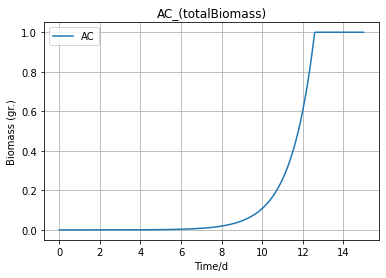

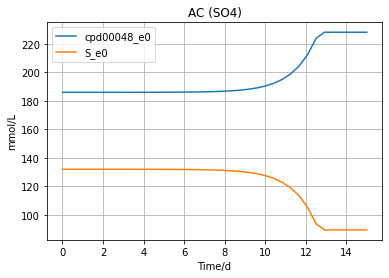

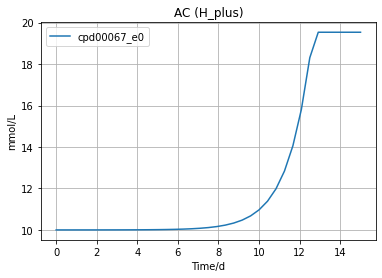

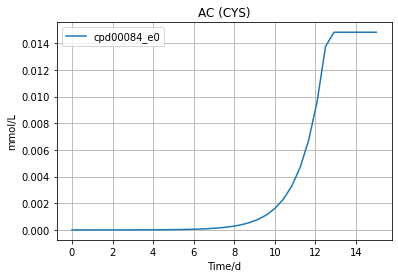

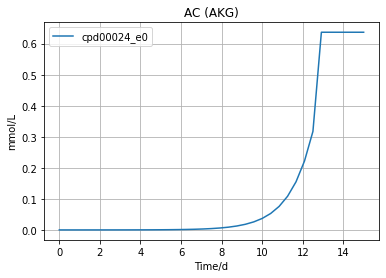

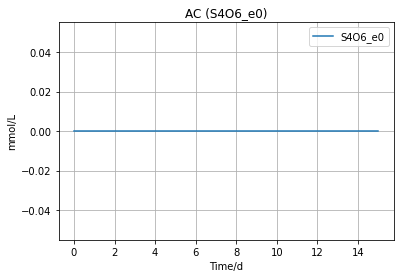

In [65]:
import cobra
import cometspy as c
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from cobra import Model, Reaction, Metabolite
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
# 加载模型和进行突变将TPI反应knock
# a = cobra.io.read_sbml_model('/jupyternotebook/ac_final_WP1376_03.xml')
# a = cobra.io.read_sbml_model('/jupyternotebook/AME_WP1377.xml')
a = cobra.io.read_sbml_model('/jupyternotebook/AME_Secr_Cys.xml')

# a.reactions.bio1.bounds=(0,1000)
a.reactions.bio1.bounds=(0.036469,0.036469)
# # a.reactions.bio1.bounds=(0,1000)
# a.reactions.EX_cpd00011_e0.bounds=(-1000,1000)
# a.reactions.EX_cpd00011_e0.bounds=(-1000,1000)
a.reactions.EX_cpd00011_e0.bounds=(-1.575,-1.575)
a.reactions.EX_cpd00084_e0.bounds=(0,1000)

a.reactions.EX_cpd00024_e0.bounds=(0,1000)#	2-Oxoglutarate
a.reactions.EX_cpd00094_e0.bounds=(0,1000)# 2-Ketobutyric acid
a.reactions.EX_cpd00082_e0.bounds=(0,1000)# D-Fructose
a.reactions.EX_cpd00029_e0.bounds=(0,1000) # Acetate
a.reactions.EX_cpd00138_e0.bounds=(0,1000) # D-Mannose
a.reactions.EX_cpd00072_e0.bounds=(0,1000) # D-fructose-6-phosphate
a.reactions.EX_cpd00794_e0.bounds=(0,1000)
a.reactions.EX_cpd00111_e0.bounds=(0,1000)
a.reactions.EX_cpd00276_e0.bounds=(0,1000)
a.reactions.EX_cpd00105_e0.bounds=(0,1000)
a.reactions.EX_cpd00129_e0.bounds=(0,1000)
a.reactions.EX_cpd00017_e0.bounds=(0,1000)
a.reactions.EX_cpd00100_e0.bounds=(0,1000)
a.reactions.EX_cpd00011_e0.bounds=(-1.575,-1.575)    
a.reactions.bio1.bounds=(0,0.0379)
#     a.reactions.rxn00338_c0.bounds=(0,0)
a.reactions.rxn09296_c0.bounds=(0,0)
a.reactions.rxn00205_c0.bounds=(0,0)
add_reactions(a,'TR_25_84','cpd00025_c0 + 65.0 cpd00084_c0 --> 2.0 cpd00001_p0 + 6.5 cpd00084_p0 + cpd00007_p0')
add_metabolites_info(a)
a.reactions.EX_cpd00084_e0.bounds=(0,1000)
a.reactions.Tr_cpd00084_c0.bounds=(0,1000)

#nh4_b,so4_b,mg2_b,cl_b,k_b,ca2_b,PI,no3    ,h2o,O2,H_plus,S_e,D_Ribose_e0_b
nineK = dict(zip(['cpd00013_e0', 'cpd00048_e0','cpd00254_e0','cpd00099_e0','cpd00205_e0', 'cpd00063_e0','cpd00009_e0','cpd00209_e0','cpd00001_e0',
                  'cpd00007_e0','cpd00011_e0','cpd00067_e0','S_e','cpd00105_e0'],
                 [1000,1000,1000,1000,1000,1000,1000,1000, 1000,1000,1000,1000,1.5,1000]))


# a.reactions.get_by_id('EX_cpd00067_e0').bounds = (3,1000)
ac = c.model(a)
ac.id = 'AC'
# print(ac.reactions)
# ac.reactions.loc[ac.reactions.EXCH, "LB"] = -1000 
ac.change_bounds('EX_S', -1.5, -1.5) 

ac.change_bounds('EX_cpd00011_e0', -1.575,-1.575) 
ac.change_bounds('EX_cpd00084_e0', 0,1000) 
ac.change_bounds('bio1', 0,0.036469) 

# ac.open_exchanges()
ac.initial_pop=[0, 0, 2e-5]
for i in ac.reactions.loc[ac.reactions.EXCH, "REACTION_NAMES"] :
    ac.change_vmax(i,3.3)
    ac.change_km(i,0.015)
# ac.change_vmax('EX_cpd00067_b', 1000)
# ac.change_km('EX_cpd00067_b', 0.000015)
ac.change_vmax('EX_cpd00084_e0', 1000)
ac.change_km('EX_cpd00084_e0', 5)
test_tube = c.layout(ac)

media ={key[3:]: value for key, value in a.medium.items() if key != 'EX_S' and key != 'rxn13783_c0' and key != 'rxn13784_c0' and key != 'rxn13782_c0' }
for k, v in media.items():
    test_tube.set_specific_metabolite(k, v)

# for key, value in media.items():
#     if key!='cpd00048_b':
#         test_tube.set_specific_refresh(key, value * 0.1)
test_tube.set_specific_metabolite('S_e0', 132)
test_tube.set_specific_metabolite('cpd00048_e0', 186)
test_tube.set_specific_metabolite('cpd00067_e0', 10)

test_tube.set_specific_metabolite('cpd00011_e0', 1000)
test_tube.set_specific_metabolite('cpd00007_e0', 1000)

comp_params = c.params()

comp_params.set_param('spaceWidth', 10)
comp_params.set_param('timeStep', 1)  # 时间步长
comp_params.set_param('maxCycles', 24*15)  # 模拟运行迭代次数
# comp_params.set_param('defaultVmax', 7) 
# comp_params.set_param('defaultKm', 0.000015)
comp_params.set_param('exchangestyle', "Monod Style")
comp_params.set_param('biomassMotionStyle', "Diffusion 3D")
# comp_params.set_param("deathRate", 0.001)
comp_params.set_param('maxSpaceBiomass', 1)
comp_params.set_param('cellSize', 4.3e-12)
comp_params.set_param('numExRxnSubsteps', 12)
comp_params.set_param('writeSpecificMediaLog', True)
comp_params.set_param('specificMediaLogRate', 10)
comp_params.set_param('specificMedia', 'cpd00067_e0,S_e0,cpd00048_e0,cpd00084_e0,cpd00024_e0,S4O6_e0')
comp_params.set_param('numRunThreads', 24)  # 运行线程

comp_assay = c.comets(test_tube, comp_params)
comp_assay.run()

biomass = comp_assay.total_biomass
biomass['t'] = biomass['cycle'] * comp_assay.parameters.all_params['timeStep'] / 24
myplot = biomass.drop(columns=['cycle']).plot(x='t')
myplot.set_ylabel("Biomass (gr.)")
myplot.set_xlabel('Time/d')
plt.title("AC_(totalBiomass)")
plt.grid()
fig = comp_assay.specific_media
fig['t'] = fig['cycle'] * comp_assay.parameters.all_params['timeStep'] / 24
fig1=comp_assay.specific_media.plot(x='t', y=['cpd00048_e0','S_e0'])
fig1.set_ylabel("mmol/L")
fig1.set_xlabel("Time/d")
plt.title("AC (SO4)")
plt.grid()
fig2=comp_assay.specific_media.plot(x='t', y=['cpd00067_e0'])
fig2.set_ylabel("mmol/L")
fig2.set_xlabel("Time/d")
plt.title("AC (H_plus)")
plt.grid()
fig2=comp_assay.specific_media.plot(x='t', y=['cpd00084_e0'])
fig2.set_ylabel("mmol/L")
fig2.set_xlabel("Time/d")
plt.title("AC (CYS)")
plt.grid()
fig2=comp_assay.specific_media.plot(x='t', y=['cpd00024_e0'])
fig2.set_ylabel("mmol/L")
fig2.set_xlabel("Time/d")
plt.title("AC (AKG)")
plt.grid()
fig2=comp_assay.specific_media.plot(x='t', y=['S4O6_e0'])
fig2.set_ylabel("mmol/L")
fig2.set_xlabel("Time/d")
plt.title("AC (S4O6_e0)")
plt.grid()

In [102]:
a.reactions.TR_25_84.check_mass_balance()
a.reactions.TR_25_84


{'H': -5.0, 'O': -2.0, 'C': -3.0, 'N': -1.0, 'S': -1.0}

Reaction identifier,TR_25_84
Name,
Memory address,0x1e4b6486160
Stoichiometry,cpd00025_c0 + 10.0 cpd00084_c0 --> 2.0 cpd00001_p0 + 9.0 cpd00084_p0 H2O2_c0 + 10.0 L_Cysteine_c0 --> 2.0 H2O_p0 + 9.0 L-Cysteine
GPR,
Lower bound,0
Upper bound,1000.0


In [17]:
from cobra.flux_analysis import pfba
pfba(a)

# a.reactions[1377]
# ac.objective

,fluxes,reduced_costs
EX_cpd15302_b,0.000000e+00,-2.0
EX_cpd02701_b,7.293800e-08,-2.0
EX_cpd11416_b,0.000000e+00,-2.0
EX_cpd00067_e0,3.080023e-01,-2.0
EX_cpd00075_e0,0.000000e+00,20.4
...,...,...
SK_cpd00001_c0,0.000000e+00,6.0
SQR2,1.500000e+00,-2.0
EX_cpd00084_e0,3.140883e-03,-2.0
EX_cpd00084_p0,-3.140883e-03,2.0


In [7]:
ac.reactions

,REACTION_NAMES,ID,LB,UB,EXCH,EXCH_IND,V_MAX,KM,HILL
0,EX_cpd15302_b,1,0.000000,1000.000000,True,1,3.3,0.015,NaN
1,EX_cpd02701_b,2,0.000000,1000.000000,True,2,3.3,0.015,NaN
2,EX_cpd11416_b,3,0.000000,1000.000000,True,3,3.3,0.015,NaN
3,EX_cpd00067_e0,4,-1000.000000,1000.000000,True,4,3.3,0.015,NaN
4,EX_cpd00075_e0,5,0.000000,1000.000000,True,5,3.3,0.015,NaN
5,EX_cpd04097_e0,6,-1000.000000,1000.000000,True,6,3.3,0.015,NaN
6,EX_cpd01030_e0,7,0.000000,1000.000000,True,7,3.3,0.015,NaN
7,EX_cpd01012_e0,8,0.000000,1000.000000,True,8,3.3,0.015,NaN
8,EX_cpd00276_e0,9,0.000000,0.000000,True,9,3.3,0.015,NaN
9,EX_cpd00082_e0,10,0.000000,0.000000,True,10,3.3,0.015,NaN


In [122]:
a.reactions.EX_cpd00084_e0.bounds=(0,1000)
a.reactions.EX_cpd00214_e0.bounds=(0,1000)
a.reactions.EX_cpd01080_e0.bounds=(0,0)
a.reactions.EX_cpd01080_e0.bounds=(0,1000)
a.summary()

Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,0.6057,0,0.00%
cpd00007_e0,EX_cpd00007_e0,1.312,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.03518,0,0.00%
cpd00011_e0,EX_cpd00011_e0,1.575,1,100.00%
cpd00013_e0,EX_cpd00013_e0,0.397,0,0.00%
cpd00030_e0,EX_cpd00030_e0,2.52E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,1.244E-05,0,0.00%
cpd00058_e0,EX_cpd00058_e0,2.586E-05,0,0.00%
cpd00063_e0,EX_cpd00063_e0,0.0001898,0,0.00%


building empty layout model
models will need to be added with layout.add_model()

Running COMETS simulation ...
Done!


Text(0, 0.5, 'Biomass (gr.)')

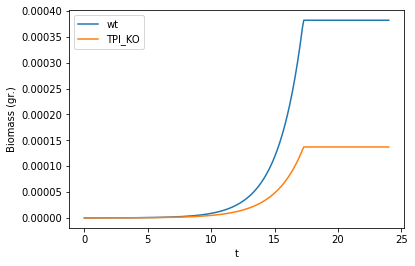

In [5]:
# Start by loading required packages, including the COMETS toolbox
import cometspy as c
import pandas as pd
import matplotlib.pyplot as plt

# load the models and perform the mutation
wt = c.model(cobra.io.read_sbml_model('/jupyternotebook/iML1515.xml'))
wt.id = 'wt'
mut = c.model(cobra.io.read_sbml_model('/jupyternotebook/iML1515.xml'))
mut.change_bounds('TPI', 0,0)
mut.id = 'TPI_KO'

# set its initial biomass, 5e-6 gr at coordinate [0,0]
wt.initial_pop = [0, 0, 5e-8]
mut.initial_pop = [0, 0, 5e-8]

# create an empty layout
test_tube = c.layout()

# add the models to the test tube
test_tube.add_model(wt)
test_tube.add_model(mut)
# Add glucose to the media 
test_tube.set_specific_metabolite('glc__D_e', 0.01)

# Add typical trace metabolites and oxygen coli as static
trace_metabolites = ['ca2_e', 'cl_e', 'cobalt2_e', 'cu2_e', 'fe2_e', 'fe3_e', 'h_e', 'k_e', 'h2o_e', 'mg2_e',
                     'mn2_e', 'mobd_e', 'na1_e', 'ni2_e', 'nh4_e', 'o2_e', 'pi_e', 'so4_e', 'zn2_e']

for i in trace_metabolites:
    test_tube.set_specific_metabolite(i, 1000)
    test_tube.set_specific_static(i, 1000)
comp_params = c.params()
comp_params.set_param('maxCycles', 240)
comp_assay = c.comets(test_tube, comp_params)
comp_assay.run()
biomass = comp_assay.total_biomass
biomass['t'] = biomass['cycle'] * comp_assay.parameters.all_params['timeStep']

myplot = biomass.drop(columns=['cycle']).plot(x = 't')
myplot.set_ylabel("Biomass (gr.)")

In [8]:
media = comp_assay.media.copy()
media = media[media.conc_mmol<900]

fig, ax = plt.subplots()
media.groupby('metabolite').plot(x='cycle', ax =ax, y='conc_mmol')

ax.set_ylabel("Concentration (mmol)")

AttributeError: 'comets' object has no attribute 'media'

#  AS

In [11]:
def add_reactions(model,id,rea):
    reaction = Reaction(id)
    model.add_reactions([reaction])
    reaction.build_reaction_from_string(rea)

In [31]:
# a = cobra.io.read_sbml_model('/jupyternotebook/ac_final_WP1376_03.xml')
s = cobra.io.read_sbml_model('/jupyternotebook/ST_cys.xml')

a = cobra.io.read_sbml_model('/jupyternotebook/AME_WP1377.xml')
# s = cobra.io.read_sbml_model('/jupyternotebook/ST_cys_add.xml')
# add_reactions(a,'EX_cpd00084_e0','cpd00084_e0 -->')
# add_reactions(a,'EX_cpd00084_p0','cpd00084_e0 <--> cpd00084_p0')
# add_reactions(a,'Tr_cpd00084_c0','cpd00084_c0 <--> cpd00084_p0')
# add_metabolites_info(a)

In [33]:
s.reactions.EX_cpd10515_e0.bounds=(-10,1000)
s.summary()

Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_e0,EX_cpd00007_e0,10,0,0.00%
cpd00011_e0,EX_cpd00011_e0,2.324,1,98.71%
cpd00013_e0,EX_cpd00013_e0,0.5175,0,0.00%
cpd00048_e0,EX_cpd00048_e0,0.001176,0,0.00%
cpd00063_e0,EX_cpd00063_e0,0.0001956,0,0.00%
cpd00084_e0,EX_cpd00084_e0,0.01,3,1.27%
cpd00205_e0,EX_cpd00205_e0,0.04312,0,0.00%
cpd00254_e0,EX_cpd00254_e0,0.006212,0,0.00%
cpd10515_e0,EX_cpd10515_e0,10,0,0.00%
cpd11606_e0,EX_cpd11606_e0,9.821E-06,46,0.02%


In [32]:
# s.reactions.EX_cpd00084_e0.bounds=(-0.01,1000)
s.summary()
a.summary()

Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_e0,EX_cpd00007_e0,2.471,0,0.00%
cpd00011_e0,EX_cpd00011_e0,0.5697,1,94.98%
cpd00013_e0,EX_cpd00013_e0,0.1244,0,0.00%
cpd00063_e0,EX_cpd00063_e0,4.984E-05,0,0.00%
cpd00084_e0,EX_cpd00084_e0,0.01,3,5.00%
cpd00205_e0,EX_cpd00205_e0,0.01099,0,0.00%
cpd00254_e0,EX_cpd00254_e0,0.001583,0,0.00%
cpd10515_e0,EX_cpd10515_e0,2.47,0,0.00%
cpd11606_e0,EX_cpd11606_e0,2.502E-06,46,0.02%
Metabolite,Reaction,Flux,C-Number,C-Flux


Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,0.5618,0,0.00%
cpd00007_e0,EX_cpd00007_e0,1.343,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.03703,0,0.00%
cpd00011_e0,EX_cpd00011_e0,1.575,1,99.98%
cpd00013_e0,EX_cpd00013_e0,0.4146,0,0.00%
cpd00028_e0,EX_cpd00028_e0,8.561E-06,34,0.02%
cpd00030_e0,EX_cpd00030_e0,2.653E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,1.309E-05,0,0.00%
cpd00058_e0,EX_cpd00058_e0,2.722E-05,0,0.00%


In [23]:
a.reactions.EX_cpd00084_e0.bounds= (0.0001,1000)
a.summary()

Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,0.5617,0,0.00%
cpd00007_e0,EX_cpd00007_e0,1.343,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.03702,0,0.00%
cpd00011_e0,EX_cpd00011_e0,1.575,1,99.98%
cpd00013_e0,EX_cpd00013_e0,0.4146,0,0.00%
cpd00028_e0,EX_cpd00028_e0,8.559E-06,34,0.02%
cpd00030_e0,EX_cpd00030_e0,2.652E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,1.309E-05,0,0.00%
cpd00058_e0,EX_cpd00058_e0,2.721E-05,0,0.00%


In [53]:
a.reactions.EX_cpd00084_e0

Reaction identifier,EX_cpd00084_e0
Name,
Memory address,0x2723c00a6d8
Stoichiometry,cpd00084_e0 --> L-Cysteine -->
GPR,
Lower bound,0.01
Upper bound,1000


building empty layout model
models will need to be added with layout.add_model()


Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.
Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.


Parameter SpecificMediaLogRate does not exist

Running COMETS simulation ...
Done!


Text(0, 0.5, 'Biomass (gr.)')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AC + ST (totalBiomass)')

Text(0, 0.5, 'mmol/L')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AC + ST (fe3 fe2 )')

Text(0, 0.5, 'mmol/L')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AC + ST ( S sSO4)')

Text(0, 0.5, 'mmol/L')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AC + ST (H_plus)')

Text(0, 0.5, 'mmol/L')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AC + ST (CYS)')

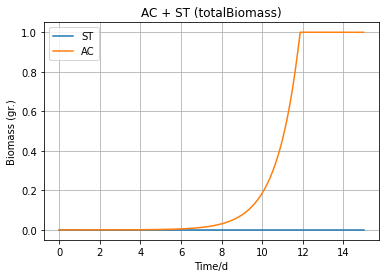

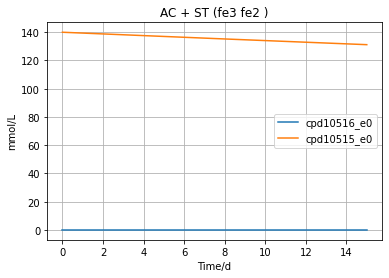

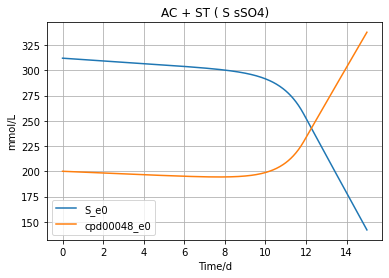

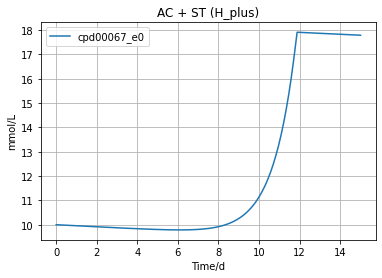

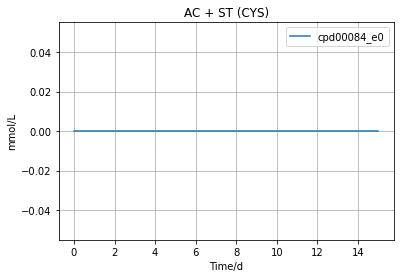

In [52]:
import cobra
import cometspy as c
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from cobra import Model, Reaction, Metabolite
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

st = c.model(s)
st.reactions.loc[st.reactions.EXCH, "LB"] = -1000 
st.change_bounds('EX_cpd00067_e0', 0, 5) 
# st.change_bounds('EX_cpd00084_e0', 0, 1000) 

st.id = 'ST'
# st.open_exchanges()
a.reactions.EX_cpd00084_e0.bounds=(0.01,1000)
ac = c.model(a)
ac.id = 'AC'
# ac.reactions.loc[ac.reactions.EXCH, "LB"] = -1000 
# ac.change_bounds('EX_S', -10, 1000) 
ac.change_bounds('EX_cpd00067_e0',0, 1) 
ac.change_bounds('EX_cpd00084_e0',0.1,0.1) 
# ac.open_exchanges()

ac.initial_pop = [0, 0, 2.3e-5]
st.initial_pop = [0, 0, 2e-5]

st.vmax_flag =True
st.km_flag =True
ac.vmax_flag =True
ac.km_flag =True

for i in st.reactions.loc[st.reactions.EXCH, "REACTION_NAMES"] :
        st.change_vmax(i,6.5)
        st.change_km(i,0.015)
st.change_vmax('EX_cpd00067_e0',0.1)
st.change_km('EX_cpd00067_e0',0.000015)
st.change_vmax('EX_cpd10515_e0', 10.5)
st.change_km('EX_cpd10515_e0', 0.01)
st.defaultVmax = 3.5
st.default_km =  0.000015
for i in ac.reactions.loc[ac.reactions.EXCH, "REACTION_NAMES"] :
    if i != 'EX_cpd00067_e0':
        ac.change_vmax(i,4.5)
        ac.change_km(i,0.015)
ac.change_vmax('EX_cpd00067_e0',0.1)
ac.change_km('EX_cpd00067_e0',0.000015)
ac.defaultVmax = 3.7
ac.default_km =  0.000015

test_tube = c.layout()
test_tube.add_model(st)
test_tube.add_model(ac)

media ={key[3:]: value for key, value in s.medium.items() if key != 'EX_cpd00084_e0'}
for k, v in media.items():
    test_tube.set_specific_metabolite(k, v)
media2 ={key[3:]: value for key, value in a.medium.items() if key != 'EX_S' and key != 'rxn13783_c0' and key != 'rxn13784_c0' and key != 'rxn13782_c0' }
for k, v in media2.items():
    test_tube.set_specific_metabolite(k, v)
test_tube.set_specific_metabolite('S_e0', 312)
test_tube.set_specific_metabolite('cpd10515_e0', 140)

test_tube.set_specific_metabolite('cpd10516_e0', 0)
test_tube.set_specific_metabolite('cpd00067_e0', 10)
test_tube.set_specific_metabolite('cpd00084_e0', 0.02)
# test_tube.set_specific_metabolite('cpd00084_e0', 0)
test_tube.set_specific_metabolite('cpd00048_e0', 200)
test_tube.set_specific_metabolite('cpd00084_e0', 0)

comp_params = c.params()
comp_params.set_param('defaultVmax', 3.7) 
comp_params.set_param('defaultKm', 0.000015)
comp_params.set_param("deathRate", 0.00018)
# comp_params.set_param("numDiffPerStep",10)
comp_params.set_param("metaboliteDilutionRate", 0.00018)
comp_params.set_param('maxSpaceBiomass', 1) 
comp_params.set_param('spaceWidth', 10)
comp_params.set_param('timeStep', 1)#时间步长
comp_params.set_param('maxCycles', 24*15)#模拟运行迭代次数
comp_params.set_param('writeBiomassLog', True)
comp_params.set_param('BiomassLogRate', 10)
comp_params.set_param('writeMediaLog', True)
comp_params.set_param('MediaLogRate', 10)
comp_params.set_param("writeFluxLog", True)
comp_params.set_param("FluxLogRate", 10)  # 日志
comp_params.set_param('writeSpecificMediaLog', True)
comp_params.set_param('SpecificMediaLogRate', 10)
comp_params.set_param('specificMedia', 'cpd10515_e0,cpd10516_e0,S_e0, cpd00067_e0,cpd00048_e0, cpd00084_e0')
comp_params.set_param('numRunThreads', 27)#运行线程

comp_assay = c.comets(test_tube, comp_params)
comp_assay.run()

biomass = comp_assay.total_biomass
biomass['t'] = biomass['cycle'] * comp_assay.parameters.all_params['timeStep'] / 24
myplot = biomass.drop(columns=['cycle']).plot(x='t')
myplot.set_ylabel("Biomass (gr.)")
myplot.set_xlabel('Time/d')
plt.title("AC + ST (totalBiomass)")
plt.grid()
fig = comp_assay.specific_media
fig['t'] = fig['cycle'] * comp_assay.parameters.all_params['timeStep'] / 24
fig2=comp_assay.specific_media.plot(x='t', y=['cpd10516_e0', 'cpd10515_e0'])
fig2.set_ylabel("mmol/L")
fig2.set_xlabel("Time/d")
plt.title("AC + ST (fe3 fe2 )")
plt.grid()
fig4=comp_assay.specific_media.plot(x='t', y=['S_e0','cpd00048_e0'])
fig4.set_ylabel("mmol/L")
fig4.set_xlabel("Time/d")
plt.title("AC + ST ( S sSO4)")
plt.grid()
fig3=comp_assay.specific_media.plot(x='t', y=['cpd00067_e0'])
fig3.set_ylabel("mmol/L")
fig3.set_xlabel("Time/d")
plt.title("AC + ST (H_plus)")
plt.grid()
fig3=comp_assay.specific_media.plot(x='t', y=['cpd00084_e0'])
fig3.set_ylabel("mmol/L")
fig3.set_xlabel("Time/d")
plt.title("AC + ST (CYS)")
plt.grid()

In [51]:
a.summary()

Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,0.5618,0,0.00%
cpd00007_e0,EX_cpd00007_e0,1.343,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.03703,0,0.00%
cpd00011_e0,EX_cpd00011_e0,1.575,1,99.98%
cpd00013_e0,EX_cpd00013_e0,0.4146,0,0.00%
cpd00028_e0,EX_cpd00028_e0,8.561E-06,34,0.02%
cpd00030_e0,EX_cpd00030_e0,2.653E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,1.309E-05,0,0.00%
cpd00058_e0,EX_cpd00058_e0,2.722E-05,0,0.00%


In [32]:
# test_tube.media
# comp_assay.fluxes_by_species['ST']
comp_assay.fluxes_by_species['AC']


cycle  x  y  EX_cpd15302_b  EX_cpd02701_b  EX_cpd11416_b  EX_cpd00067_e0  \
1      10  1  1            0.0   7.677634e-08            0.0        0.322925   
3      20  1  1            0.0   7.677634e-08            0.0        0.322925   
5      30  1  1            0.0   7.677634e-08            0.0        0.322925   
7      40  1  1            0.0   7.677634e-08            0.0        0.322925   
9      50  1  1            0.0   7.677634e-08            0.0        0.322925   
11     60  1  1            0.0   7.677634e-08            0.0        0.322925   
13     70  1  1            0.0   7.677634e-08            0.0        0.322925   
15     80  1  1            0.0   7.677634e-08            0.0        0.322925   
17     90  1  1            0.0   7.677634e-08            0.0        0.322925   
19    100  1  1            0.0   7.677634e-08            0.0        0.322925   
21    110  1  1            0.0   7.677634e-08            0.0        0.322925   
23    120  1  1            0.0   7.677634e-08            0.0        0.322925   
25    130  1  1            0.0   7.677634e-08            0.0        0.322925   
27    140  1  1            0.0   7.677634e-08            0.0        0.322925   
29    150  1  1            0.0   7.677634e-08            0.0        0.322925   
31    160  1  1            0.0   7.677634e-08            0.0        0.322925   
33    170  1  1            0.0   7.677634e-08            0.0        0.322925   
35    180  1  1            0.0   7.677634e-08            0.0        0.322925   
37    190  1  1            0.0   7.677634e-08            0.0        0.322925   
39    200  1  1            0.0   7.677634e-08            0.0        0.322925   
41    210  1  1            0.0   7.677634e-08            0.0        0.322925   
43    220  1  1            0.0   7.677634e-08            0.0        0.322925   
45    230  1  1            0.0   7.677634e-08            0.0        0.322925   
47    240  1  1            0.0   7.677634e-08            0.0        0.322925   
49    250  1  1            0.0   7.677634e-08            0.0        0.322925   
51    260  1  1            0.0   7.677634e-08            0.0        0.322925   
53    270  1  1            0.0   7.677634e-08            0.0        0.322925   
55    280  1  1            0.0   7.677634e-08            0.0        0.322925   
57    290  1  1            0.0   3.490637e-10            0.0        0.001464   
59    300  1  1            0.0   3.490637e-10            0.0        0.001464   
61    310  1  1            0.0   3.490637e-10            0.0        0.001464   
63    320  1  1            0.0   3.490637e-10            0.0        0.001464   
65    330  1  1            0.0   3.490637e-10            0.0        0.001464   
67    340  1  1            0.0   3.600068e-10            0.0        0.001510   
69    350  1  1            0.0   3.600068e-10            0.0        0.001510   
71    360  1  1            0.0   3.600068e-10            0.0        0.001510   

    EX_cpd00075_e0  EX_cpd04097_e0  EX_cpd01030_e0  EX_cpd01012_e0  \
1             -0.0             0.0             0.0             0.0   
3             -0.0             0.0             0.0             0.0   
5             -0.0             0.0             0.0             0.0   
7             -0.0             0.0             0.0             0.0   
9             -0.0             0.0             0.0             0.0   
11            -0.0             0.0             0.0             0.0   
13            -0.0             0.0             0.0             0.0   
15            -0.0             0.0             0.0             0.0   
17            -0.0             0.0             0.0             0.0   
19            -0.0             0.0             0.0             0.0   
21            -0.0             0.0             0.0             0.0   
23            -0.0             0.0             0.0             0.0   
25            -0.0             0.0             0.0             0.0   
27            -0.0             0.0             0.0             

In [33]:
wrtite = pd.ExcelWriter('fluxall.xlsx')
flu5 = comp_assay.fluxes_by_species['AC']
df = pd.DataFrame(flu5)
df.to_excel(wrtite, sheet_name='AC')
wrtite.save()

In [19]:
#chromsat
import cobra
# from cobra import test # for the ijo1366 model
import sys
import cometspy as c


a = cobra.io.read_sbml_model('/jupyternotebook/ac_final_WP1376_03.xml')
s = cobra.io.read_sbml_model('/jupyternotebook/ST_cys.xml')

add_reactions(a,'EX_cpd00084_e0','cpd00084_e0 -->')
add_reactions(a,'EX_cpd00084_p0','cpd00084_e0 <--> cpd00084_p0')
add_reactions(a,'Tr_cpd00084_c0','cpd00084_c0 <--> cpd00084_p0')
add_metabolites_info(a)

medium_a = a.medium
medium_s = s.medium
medium_a.update(medium_s)
print(medium_a)

#AC培养基
for i in medium_a.keys():
    if i not in a.reactions:
        add_reactions(a,i,s.reactions.get_by_id(i).reaction)
        
#ST培养基
for i in medium_a.keys():
    if i not in s.reactions:
        i
        add_reactions(s,i,a.reactions.get_by_id(i).reaction)

s.metabolites.S_e0.formula = 'S'
s.metabolites.S_e0.compartment ='e0'
add_metabolites_info(a)
add_metabolites_info(s)
        
a.medium = medium_a
s.medium = medium_a

Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.
Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.


unknown metabolite 'cpd00084_e0' created
unknown metabolite 'cpd00084_p0' created
这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p
{'EX_cpd00067_e0': 1000.0, 'EX_cpd04097_e0': 1000.0, 'EX_cpd00001_e0': 1000.0, 'EX_cpd00058_e0': 1000.0, 'EX_cpd00013_e0': 1000.0, 'EX_cpd10515_e0': 2.47, 'EX_cpd00009_e0': 1000.0, 'EX_cpd00034_e0': 1000.0, 'EX_cpd00254_e0': 1000.0, 'EX_cpd00205_e0': 1000.0, 'EX_cpd00971_e0': 1000.0, 'EX_cpd00030_e0': 1000.0, 'EX_cpd00149_e0': 1000.0, 'EX_cpd00099_e0': 1000.0, 'EX_cpd00531_e0': 1000.0, 'EX_cpd00209_e0': 1000.0, 'EX_cpd00048_e0': 1000.0, 'EX_cpd00007_e0': 1000.0, 'EX_cpd00011_e0': 1000.0, 'EX_cpd00063_e0': 1000.0, 'rxn13783_c0': 1000.0, 'rxn13784_c0': 1000.0, 'rxn13782_c0': 1000.0, 'EX_S': 1.5, 'EX_cpd00635_p0': 1000.0, 'EX_cpd00028_e0': 1000.0, 'EX_cpd11574_e0': 1000.0, 'EX_cpd00244_e0': 1000.0, 'EX_cpd10516_e0': 1000.0, 'EX_cpd11606_e0': 1000.0, 'EX_cpd00084_e0': 0.01}


'EX_S'

unknown metabolite 'S_e0' created


'EX_cpd11574_e0'

unknown metabolite 'cpd11574_e0' created


'EX_cpd00244_e0'

Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.
Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.
rxn13783_c0 does not seem to be an an exchange reaction. Applying bounds anyway.
rxn13784_c0 does not seem to be an an exchange reaction. Applying bounds anyway.
rxn13782_c0 does not seem to be an an exchange reaction. Applying bounds anyway.
EX_cpd00635_p0 does not seem to be an an exchange reaction. Applying bounds anyway.


unknown metabolite 'cpd00244_e0' created
这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p
这些物质 Formula 需要手动确认添加： cytccr_p
这些物质 Formula 需要手动确认添加： cytcco_p
这些物质 Formula 需要手动确认添加： rustred_p
这些物质 Formula 需要手动确认添加： rust_p
这些物质 Formula 需要手动确认添加： cytcAr_p
这些物质 Formula 需要手动确认添加： cytcAo_p
这些物质 Charge 需要确认： S_e0


In [28]:
#chromsat
import cobra
# from cobra import test # for the ijo1366 model
import sys
import cometspy as c
import matplotlib.pyplot as plt


a = cobra.io.read_sbml_model('/jupyternotebook/ac_final_WP1376_03.xml')
s = cobra.io.read_sbml_model('/jupyternotebook/ST_cys.xml')

add_reactions(a,'EX_cpd00084_e0','cpd00084_e0 -->')
add_reactions(a,'EX_cpd00084_p0','cpd00084_e0 <--> cpd00084_p0')
add_reactions(a,'Tr_cpd00084_c0','cpd00084_c0 <--> cpd00084_p0')
add_metabolites_info(a)

medium_a = a.medium
medium_s = s.medium
medium_a.update(medium_s)
print(medium_a)

#AC培养基
for i in medium_a.keys():
    if i not in a.reactions:
        add_reactions(a,i,s.reactions.get_by_id(i).reaction)
        
#ST培养基
for i in medium_a.keys():
    if i not in s.reactions:
        add_reactions(s,i,a.reactions.get_by_id(i).reaction)

s.metabolites.S_e0.formula = 'S'
s.metabolites.S_e0.compartment ='e0'
add_metabolites_info(a)
add_metabolites_info(s)
a.medium = medium_a
s.medium = medium_a

# examine growth and uptake in the galE knockout shows galactose is excreted
print("\n\n AC uptakes in co-culture medium: ")
a.summary()

print("\n\n ST uptakes in co-culture medium: ")
s.summary()
# chemostat parameters


Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.
Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.
Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.
Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.
rxn13783_c0 does not seem to be an an exchange reaction. Applying bounds anyway.

unknown metabolite 'cpd00084_e0' created
unknown metabolite 'cpd00084_p0' created
这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p
{'EX_cpd00067_e0': 1000.0, 'EX_cpd04097_e0': 1000.0, 'EX_cpd00001_e0': 1000.0, 'EX_cpd00058_e0': 1000.0, 'EX_cpd00013_e0': 1000.0, 'EX_cpd10515_e0': 2.47, 'EX_cpd00009_e0': 1000.0, 'EX_cpd00034_e0': 1000.0, 'EX_cpd00254_e0': 1000.0, 'EX_cpd00205_e0': 1000.0, 'EX_cpd00971_e0': 1000.0, 'EX_cpd00030_e0': 1000.0, 'EX_cpd00149_e0': 1000.0, 'EX_cpd00099_e0': 1000.0, 'EX_cpd00531_e0': 1000.0, 'EX_cpd00209_e0': 1000.0, 'EX_cpd00048_e0': 1000.0, 'EX_cpd00007_e0': 1000.0, 'EX_cpd00011_e0': 1000.0, 'EX_cpd00063_e0': 1000.0, 'rxn13783_c0': 1000.0, 'rxn13784_c0': 1000.0, 'rxn13782_c0': 1000.0, 'EX_S': 1.5, 'EX_cpd00635_p0': 1000.0, 'EX_cpd00028_e0': 1000.0, 'EX_cpd11574_e0': 1000.0, 'EX_cpd00244_e0': 1000.0, 'EX_cpd10516_e0': 1000.0, 'EX_cpd11606_e0': 1000.0, 'EX_cpd00084_e0': 0.01}
unknown metabolite 'S_e0' created
unknown metabolite 'cpd11574_e0' 

Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,0.5623,0,0.00%
cpd00007_e0,EX_cpd00007_e0,1.347,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.0373,0,0.00%
cpd00011_e0,EX_cpd00011_e0,1.576,1,99.31%
cpd00013_e0,EX_cpd00013_e0,0.414,0,0.00%
cpd00028_e0,EX_cpd00028_e0,8.623E-06,34,0.02%
cpd00030_e0,EX_cpd00030_e0,2.672E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,1.319E-05,0,0.00%
cpd00058_e0,EX_cpd00058_e0,2.742E-05,0,0.00%




 ST uptakes in co-culture medium: 


Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_e0,EX_cpd00007_e0,2.471,0,0.00%
cpd00011_e0,EX_cpd00011_e0,0.5697,1,94.98%
cpd00013_e0,EX_cpd00013_e0,0.1244,0,0.00%
cpd00063_e0,EX_cpd00063_e0,4.984E-05,0,0.00%
cpd00067_e0,EX_cpd00067_e0,7.824,0,0.00%
cpd00084_e0,EX_cpd00084_e0,0.01,3,5.00%
cpd00205_e0,EX_cpd00205_e0,0.01099,0,0.00%
cpd00254_e0,EX_cpd00254_e0,0.001583,0,0.00%
cpd10515_e0,EX_cpd10515_e0,2.47,0,0.00%
cpd11606_e0,EX_cpd11606_e0,2.502E-06,46,0.02%


In [72]:
# a.reactions.EX_cpd00084_e0.bounds=(0.005,0.01)
a.summary()
s.summary()

Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,0.5623,0,0.00%
cpd00007_e0,EX_cpd00007_e0,1.347,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.0373,0,0.00%
cpd00011_e0,EX_cpd00011_e0,1.576,1,99.31%
cpd00013_e0,EX_cpd00013_e0,0.414,0,0.00%
cpd00028_e0,EX_cpd00028_e0,8.623E-06,34,0.02%
cpd00030_e0,EX_cpd00030_e0,2.672E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,1.319E-05,0,0.00%
cpd00058_e0,EX_cpd00058_e0,2.742E-05,0,0.00%


Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_e0,EX_cpd00007_e0,2.471,0,0.00%
cpd00011_e0,EX_cpd00011_e0,0.5697,1,94.98%
cpd00013_e0,EX_cpd00013_e0,0.1244,0,0.00%
cpd00063_e0,EX_cpd00063_e0,4.984E-05,0,0.00%
cpd00067_e0,EX_cpd00067_e0,7.824,0,0.00%
cpd00084_e0,EX_cpd00084_e0,0.01,3,5.00%
cpd00205_e0,EX_cpd00205_e0,0.01099,0,0.00%
cpd00254_e0,EX_cpd00254_e0,0.001583,0,0.00%
cpd10515_e0,EX_cpd10515_e0,2.47,0,0.00%
cpd11606_e0,EX_cpd11606_e0,2.502E-06,46,0.02%



Running COMETS simulation ...
Done!


Text(0, 0.5, 'Biomass (gr.)')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AC + ST (totalBiomass)')

Text(0, 0.5, 'mmol/L')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AC + ST (fe3 fe2 S)')

Text(0, 0.5, 'mmol/L')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AC + ST (H_plus)')

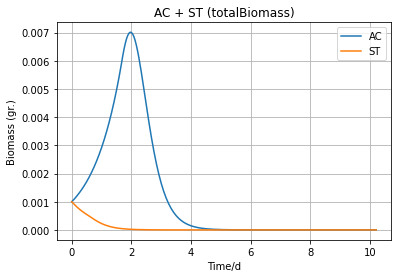

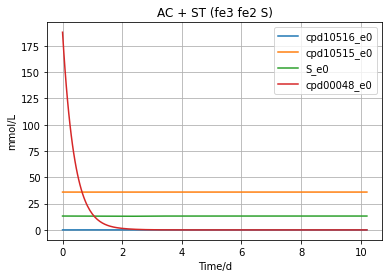

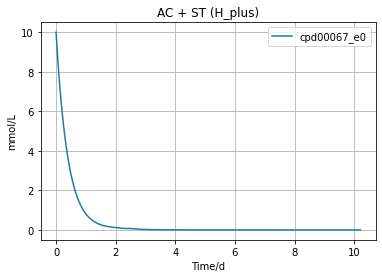

In [29]:

dilution_rate = 0.1 # / hr
initial_pop = 1.e-3 # gDW

# make COMETS models from the cobrapy models
a.id = "AC"
s.id = "ST"

ac = c.model(a)
ac.initial_pop = [0,0,1e-3] # x, y, gDW
ac.reactions.loc[ac.reactions.EXCH, "LB"] = -1000 
ac.change_bounds('EX_S', -1000, 1000) 
ac.open_exchanges()

st = c.model(s)
st.initial_pop = [0,0,1e-3] # x, y, gDW
st.reactions.loc[st.reactions.EXCH, "LB"] = -1000 
st.change_bounds('EX_cpd10515_e0', -1000, 1000) 
st.open_exchanges()

# setup layout by providing models 
layout = c.layout([ac,st])
# re-write media (while removing galactose) and add it to layout
comets_media = {key[3:]: value for key, value in medium_a.items() if key != 'EX_S' and key != 'rxn13783_c0' and key != 'rxn13784_c0' and key != 'rxn13782_c0' }
for key, value in comets_media.items():
    layout.set_specific_metabolite(key, value)
layout.set_specific_metabolite('S_e0', 13.2)
layout.set_specific_refresh('S_e0', 13.2*0.1)
layout.set_specific_metabolite('cpd10515_e0', 36)
layout.set_specific_refresh('cpd10515_e0', 36*0.1)
layout.set_specific_metabolite('cpd00048_e0', 188)
layout.set_specific_metabolite('cpd00067_e0', 10)
layout.set_specific_metabolite('cpd10516_e0', 0)

# for key, value in comets_media.items():
#     layout.set_specific_refresh(key, value * dilution_rate)
params = c.params()
params.set_param("deathRate", 0.1)
params.set_param("metaboliteDilutionRate", 0.1)

params.set_param("timeStep",1) # hours
params.set_param("maxSpaceBiomass", 1) # gDW
params.set_param("maxCycles", 24*15) # duration of simulation in time steps
params.set_param('spaceWidth', 10)
params.set_param("writeSpecificMediaLog", True)
params.set_param("specificMediaLogRate", 1) # time steps
params.set_param("specificMedia", "S_e0,cpd00048_e0,cpd10515_e0,cpd10516_e0,cpd00067_e0") # metabolites to track

params.set_param('numRunThreads', 27)#运行线程
comp_assay = c.comets(layout, params)

comp_assay.run()
# comp_assay.total_biomass.plot(x = "cycle")
# sim.specific_media.plot(x = "cycle",y = ["lcts_e","gal_e"])
# plt.show()

biomass = comp_assay.total_biomass
biomass['t'] = biomass['cycle'] * comp_assay.parameters.all_params['timeStep'] / 24
myplot = biomass.drop(columns=['cycle']).plot(x='t')
myplot.set_ylabel("Biomass (gr.)")
myplot.set_xlabel('Time/d')
plt.title("AC + ST (totalBiomass)")
plt.grid()
fig = comp_assay.specific_media
fig['t'] = fig['cycle'] * comp_assay.parameters.all_params['timeStep'] / 24
fig2=comp_assay.specific_media.plot(x='t', y=['cpd10516_e0', 'cpd10515_e0', 'S_e0','cpd00048_e0'])
fig2.set_ylabel("mmol/L")
fig2.set_xlabel("Time/d")
plt.title("AC + ST (fe3 fe2 S)")
plt.grid()
fig3=comp_assay.specific_media.plot(x='t', y=['cpd00067_e0'])
fig3.set_ylabel("mmol/L")
fig3.set_xlabel("Time/d")
plt.title("AC + ST (H_plus)")
plt.grid()

In [56]:
layout.media

,diff_c,g_refresh,g_static,g_static_val,init_amount,metabolite
0,0.000005,0,0,0,0,S4O6_e0
1,0.000005,13.2,0,0,132,S_e0
2,0.000005,0,0,0,0,cpd00001_c0
3,0.000005,0,0,0,1000.0,cpd00001_e0
4,0.000005,0,0,0,1000.0,cpd00007_e0
5,0.000005,0,0,0,1000.0,cpd00009_e0
6,0.000005,0,0,0,1000.0,cpd00011_e0
7,0.000005,0,0,0,0,cpd00012_e0
8,0.000005,0,0,0,1000.0,cpd00013_e0
9,0.000005,0,0,0,0,cpd00017_e0


## 更改AC目标函数

In [54]:
a = cobra.io.read_sbml_model('/jupyternotebook/AME_WP1377.xml')
# s = cobra.io.read_sbml_model('/jupyternotebook/ST_cys_add.xml')

In [20]:
a.objective.direction='max'
a.reactions.rxn00062_c0
a.summary()

Reaction identifier,rxn00062_c0
Name,ATP maintenance reaction
Memory address,0x205ea600978
Stoichiometry,cpd00001_c0 + cpd00002_c0 --> cpd00008_c0 + cpd00009_c0 + cpd00067_c0 H2O_c0 + ATP_c0 --> ADP_c0 + Phosphate_c0 + H_plus__c0
GPR,
Lower bound,0.0
Upper bound,1000.0


Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,0.5618,0,0.00%
cpd00007_e0,EX_cpd00007_e0,1.343,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.03703,0,0.00%
cpd00011_e0,EX_cpd00011_e0,1.575,1,99.98%
cpd00013_e0,EX_cpd00013_e0,0.4146,0,0.00%
cpd00028_e0,EX_cpd00028_e0,8.599E-06,34,0.02%
cpd00030_e0,EX_cpd00030_e0,2.653E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,1.309E-05,0,0.00%
cpd00058_e0,EX_cpd00058_e0,2.722E-05,0,0.00%


In [42]:
a.objective_direction = 'max'
a.summary(fva=0.95)

Metabolite,Reaction,Flux,Range,C-Number,C-Flux
S_e0,EX_S,1.5,[1.425; 1.5],0,0.00%
cpd00001_e0,EX_cpd00001_e0,0.5618,[0.3294; 0.7913],0,0.00%
cpd00007_e0,EX_cpd00007_e0,1.343,[1.228; 1.528],0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.03703,[0.03518; 0.05302],0,0.00%
cpd00011_e0,EX_cpd00011_e0,1.575,[1.496; 1.623],1,99.98%
cpd00013_e0,EX_cpd00013_e0,0.4146,[0.3115; 0.4309],0,0.00%
cpd00028_e0,EX_cpd00028_e0,8.561E-06,[0; 8.561E-06],34,0.02%
cpd00030_e0,EX_cpd00030_e0,2.653E-05,[2.52E-05; 2.653E-05],0,0.00%
cpd00034_e0,EX_cpd00034_e0,1.309E-05,[1.244E-05; 1.309E-05],0,0.00%
cpd00058_e0,EX_cpd00058_e0,2.722E-05,[2.586E-05; 2.722E-05],0,0.00%


In [49]:
cobra.flux_analysis.flux_variability_analysis(a, a.reactions.bio1, fraction_of_optimum=0.95)

,minimum,maximum
bio1,0.036469,0.038388


In [29]:
# AC
def add_reactions(model,id,rea):
    reaction = Reaction(id)
    model.add_reactions([reaction])
    reaction.build_reaction_from_string(rea)
    
ex_a = [x.id[3:-3] for x in a.reactions if x.id.startswith('EX_')]
ex_a = list(set(ex_a))
for i in a.metabolites:
    if i.id.endswith("_c0") and i.id.startswith('cpd') and i.id[:-3] not in ex_a:
        add_reactions(a,'EX_'+ i.id[:-3] + '_e0',i.id[:-3] + '_e0'+ ' -->') # L-Homoserine
        add_reactions(a,'EX_'+ i.id[:-3] + '_p0',i.id[:-3] + '_e0'+ '<--> '+ i.id[:-3] + '_p0')
        add_reactions(a,'Tr_' + i.id[:-3] + '_c0',i.id[:-3] + '_c0' + ' <-->'+ i.id[:-3] + '_p0')
        sol = a.optimize()
        if sol.objective_value>0.04:
            i.id
a.summary()

unknown metabolite 'cpd00443_e0' created
unknown metabolite 'cpd00443_p0' created
unknown metabolite 'cpd02920_e0' created
unknown metabolite 'cpd02920_p0' created
unknown metabolite 'cpd00012_e0' created
unknown metabolite 'cpd00012_p0' created
unknown metabolite 'cpd00683_e0' created
unknown metabolite 'cpd00683_p0' created
unknown metabolite 'cpd00002_e0' created
unknown metabolite 'cpd00002_p0' created
unknown metabolite 'cpd00033_e0' created
unknown metabolite 'cpd00033_p0' created
unknown metabolite 'cpd00506_e0' created
unknown metabolite 'cpd00506_p0' created
unknown metabolite 'cpd00008_e0' created
unknown metabolite 'cpd00008_p0' created
unknown metabolite 'cpd00042_e0' created
unknown metabolite 'cpd00114_e0' created
unknown metabolite 'cpd00114_p0' created
unknown metabolite 'cpd00103_e0' created
unknown metabolite 'cpd00103_p0' created
unknown metabolite 'cpd00226_e0' created
unknown metabolite 'cpd00226_p0' created
unknown metabolite 'cpd00074_e0' created
unknown metaboli

unknown metabolite 'cpd01217_e0' created
unknown metabolite 'cpd01217_p0' created
unknown metabolite 'cpd15540_e0' created
unknown metabolite 'cpd15540_p0' created
unknown metabolite 'cpd15793_e0' created
unknown metabolite 'cpd15793_p0' created
unknown metabolite 'cpd00807_e0' created
unknown metabolite 'cpd00807_p0' created
unknown metabolite 'cpd00930_e0' created
unknown metabolite 'cpd00930_p0' created
unknown metabolite 'cpd03414_e0' created
unknown metabolite 'cpd03414_p0' created
unknown metabolite 'cpd03416_e0' created
unknown metabolite 'cpd03416_p0' created
unknown metabolite 'cpd02961_e0' created
unknown metabolite 'cpd02961_p0' created
unknown metabolite 'cpd00229_e0' created
unknown metabolite 'cpd00229_p0' created
unknown metabolite 'cpd00954_e0' created
unknown metabolite 'cpd00954_p0' created
unknown metabolite 'cpd00006_e0' created
unknown metabolite 'cpd00006_p0' created
unknown metabolite 'cpd00202_e0' created
unknown metabolite 'cpd00202_p0' created
unknown metaboli

unknown metabolite 'cpd11464_e0' created
unknown metabolite 'cpd11464_p0' created
unknown metabolite 'cpd11486_e0' created
unknown metabolite 'cpd11486_p0' created
unknown metabolite 'cpd03333_e0' created
unknown metabolite 'cpd03333_p0' created
unknown metabolite 'cpd00373_e0' created
unknown metabolite 'cpd00373_p0' created
unknown metabolite 'cpd11421_e0' created
unknown metabolite 'cpd11421_p0' created


'cpd00081_c0'

unknown metabolite 'cpd11420_e0' created
unknown metabolite 'cpd11420_p0' created


'cpd11420_c0'

unknown metabolite 'cpd15423_e0' created
unknown metabolite 'cpd15423_p0' created


'cpd15423_c0'

unknown metabolite 'cpd15553_e0' created
unknown metabolite 'cpd15553_p0' created


'cpd15553_c0'

unknown metabolite 'cpd00089_e0' created
unknown metabolite 'cpd00089_p0' created


'cpd00089_c0'

unknown metabolite 'cpd00387_e0' created
unknown metabolite 'cpd00387_p0' created


'cpd00387_c0'

unknown metabolite 'cpd15418_e0' created
unknown metabolite 'cpd15418_p0' created


'cpd15418_c0'

unknown metabolite 'cpd15556_e0' created
unknown metabolite 'cpd15556_p0' created


'cpd15556_c0'

unknown metabolite 'cpd01646_e0' created
unknown metabolite 'cpd01646_p0' created


'cpd01646_c0'

unknown metabolite 'cpd00242_e0' created
unknown metabolite 'cpd00242_p0' created


'cpd00242_c0'

unknown metabolite 'cpd12848_e0' created
unknown metabolite 'cpd12848_p0' created


'cpd12848_c0'

unknown metabolite 'cpd12543_e0' created
unknown metabolite 'cpd12543_p0' created


'cpd12543_c0'

unknown metabolite 'cpd02233_e0' created
unknown metabolite 'cpd02233_p0' created


'cpd02233_c0'

unknown metabolite 'cpd03379_e0' created
unknown metabolite 'cpd03379_p0' created


'cpd03379_c0'

unknown metabolite 'cpd00239_e0' created


'cpd00239_c0'

unknown metabolite 'cpd00383_e0' created
unknown metabolite 'cpd00383_p0' created


'cpd00383_c0'

unknown metabolite 'cpd02030_e0' created
unknown metabolite 'cpd02030_p0' created


'cpd02030_c0'

unknown metabolite 'cpd00219_e0' created
unknown metabolite 'cpd00219_p0' created


'cpd00219_c0'

unknown metabolite 'cpd00868_e0' created
unknown metabolite 'cpd00868_p0' created


'cpd00868_c0'

unknown metabolite 'cpd00193_e0' created
unknown metabolite 'cpd00193_p0' created


'cpd00193_c0'

unknown metabolite 'cpd00044_e0' created
unknown metabolite 'cpd00044_p0' created


'cpd00044_c0'

unknown metabolite 'cpd00504_e0' created
unknown metabolite 'cpd00504_p0' created


'cpd00504_c0'

unknown metabolite 'cpd00905_e0' created
unknown metabolite 'cpd00905_p0' created


'cpd00905_c0'

unknown metabolite 'cpd00031_e0' created
unknown metabolite 'cpd00031_p0' created


'cpd00031_c0'

unknown metabolite 'cpd11585_e0' created
unknown metabolite 'cpd11585_p0' created


'cpd11585_c0'

unknown metabolite 'cpd00035_e0' created
unknown metabolite 'cpd00035_p0' created


'cpd00035_c0'

unknown metabolite 'cpd02791_e0' created
unknown metabolite 'cpd02791_p0' created


'cpd02791_c0'

unknown metabolite 'cpd11295_e0' created
unknown metabolite 'cpd11295_p0' created


'cpd11295_c0'

unknown metabolite 'cpd02626_e0' created
unknown metabolite 'cpd02626_p0' created


'cpd02626_c0'

unknown metabolite 'cpd00340_e0' created
unknown metabolite 'cpd00340_p0' created


'cpd00340_c0'

unknown metabolite 'cpd02574_e0' created
unknown metabolite 'cpd02574_p0' created


'cpd02574_c0'

unknown metabolite 'cpd00652_e0' created
unknown metabolite 'cpd00652_p0' created


'cpd00652_c0'

unknown metabolite 'cpd00515_e0' created
unknown metabolite 'cpd00515_p0' created


'cpd00515_c0'

unknown metabolite 'cpd00689_e0' created
unknown metabolite 'cpd00689_p0' created


'cpd00689_c0'

unknown metabolite 'cpd00755_e0' created
unknown metabolite 'cpd00755_p0' created


'cpd00755_c0'

unknown metabolite 'cpd00196_e0' created
unknown metabolite 'cpd00196_p0' created


'cpd00196_c0'

unknown metabolite 'cpd11472_e0' created
unknown metabolite 'cpd11472_p0' created


'cpd11472_c0'

unknown metabolite 'cpd11490_e0' created
unknown metabolite 'cpd11490_p0' created


'cpd11490_c0'

unknown metabolite 'cpd15529_e0' created
unknown metabolite 'cpd15529_p0' created


'cpd15529_c0'

unknown metabolite 'cpd00448_e0' created
unknown metabolite 'cpd00448_p0' created


'cpd00448_c0'

unknown metabolite 'cpd00223_e0' created
unknown metabolite 'cpd00223_p0' created


'cpd00223_c0'

unknown metabolite 'cpd00169_e0' created
unknown metabolite 'cpd00169_p0' created


'cpd00169_c0'

unknown metabolite 'cpd00288_e0' created
unknown metabolite 'cpd00288_p0' created


'cpd00288_c0'

unknown metabolite 'cpd00760_e0' created
unknown metabolite 'cpd00760_p0' created


'cpd00760_c0'

unknown metabolite 'cpd11495_e0' created
unknown metabolite 'cpd11495_p0' created


'cpd11495_c0'

unknown metabolite 'cpd00655_e0' created
unknown metabolite 'cpd00655_p0' created


'cpd00655_c0'

unknown metabolite 'cpd01775_e0' created
unknown metabolite 'cpd01775_p0' created


'cpd01775_c0'

unknown metabolite 'cpd00858_e0' created
unknown metabolite 'cpd00858_p0' created


'cpd00858_c0'

unknown metabolite 'cpd02431_e0' created
unknown metabolite 'cpd02431_p0' created


'cpd02431_c0'

unknown metabolite 'cpd00498_e0' created
unknown metabolite 'cpd00498_p0' created


'cpd00498_c0'

unknown metabolite 'cpd10162_e0' created
unknown metabolite 'cpd10162_p0' created


'cpd10162_c0'

unknown metabolite 'cpd00802_e0' created
unknown metabolite 'cpd00802_p0' created


'cpd00802_c0'

unknown metabolite 'cpd11514_e0' created
unknown metabolite 'cpd11514_p0' created


'cpd11514_c0'

unknown metabolite 'cpd11515_e0' created
unknown metabolite 'cpd11515_p0' created


'cpd11515_c0'

unknown metabolite 'cpd15352_e0' created
unknown metabolite 'cpd15352_p0' created


'cpd15352_c0'

unknown metabolite 'cpd15353_e0' created
unknown metabolite 'cpd15353_p0' created


'cpd15353_c0'

unknown metabolite 'cpd00203_e0' created
unknown metabolite 'cpd00203_p0' created


'cpd00203_c0'

unknown metabolite 'cpd00867_e0' created
unknown metabolite 'cpd00867_p0' created


'cpd00867_c0'

unknown metabolite 'cpd00121_e0' created
unknown metabolite 'cpd00121_p0' created


'cpd00121_c0'

unknown metabolite 'cpd00481_e0' created
unknown metabolite 'cpd00481_p0' created


'cpd00481_c0'

unknown metabolite 'cpd11545_e0' created
unknown metabolite 'cpd11545_p0' created


'cpd11545_c0'

unknown metabolite 'cpd15722_e0' created
unknown metabolite 'cpd15722_p0' created


'cpd15722_c0'

unknown metabolite 'cpd15794_e0' created
unknown metabolite 'cpd15794_p0' created


'cpd15794_c0'

unknown metabolite 'cpd00282_e0' created
unknown metabolite 'cpd00282_p0' created


'cpd00282_c0'

unknown metabolite 'cpd00247_e0' created
unknown metabolite 'cpd00247_p0' created


'cpd00247_c0'

unknown metabolite 'cpd08301_e0' created
unknown metabolite 'cpd08301_p0' created


'cpd08301_c0'

unknown metabolite 'cpd11538_e0' created
unknown metabolite 'cpd11538_p0' created


'cpd11538_c0'

unknown metabolite 'cpd00774_e0' created
unknown metabolite 'cpd00774_p0' created


'cpd00774_c0'

unknown metabolite 'cpd15723_e0' created
unknown metabolite 'cpd15723_p0' created


'cpd15723_c0'

unknown metabolite 'cpd15795_e0' created
unknown metabolite 'cpd15795_p0' created


'cpd15795_c0'

unknown metabolite 'cpd02999_e0' created
unknown metabolite 'cpd02999_p0' created


'cpd02999_c0'

unknown metabolite 'cpd03660_e0' created
unknown metabolite 'cpd03660_p0' created


'cpd03660_c0'

unknown metabolite 'cpd15557_e0' created
unknown metabolite 'cpd15557_p0' created


'cpd15557_c0'

unknown metabolite 'cpd15533_e0' created
unknown metabolite 'cpd15533_p0' created


'cpd15533_c0'

unknown metabolite 'cpd01357_e0' created
unknown metabolite 'cpd01357_p0' created


'cpd01357_c0'

unknown metabolite 'cpd01447_e0' created
unknown metabolite 'cpd01447_p0' created


'cpd01447_c0'

unknown metabolite 'cpd00286_e0' created
unknown metabolite 'cpd00286_p0' created


'cpd00286_c0'

unknown metabolite 'cpd02862_e0' created
unknown metabolite 'cpd02862_p0' created


'cpd02862_c0'

unknown metabolite 'cpd02948_e0' created
unknown metabolite 'cpd02948_p0' created


'cpd02948_c0'

unknown metabolite 'cpd02857_e0' created
unknown metabolite 'cpd02857_p0' created


'cpd02857_c0'

unknown metabolite 'cpd00699_e0' created
unknown metabolite 'cpd00699_p0' created


'cpd00699_c0'

unknown metabolite 'cpd00192_e0' created
unknown metabolite 'cpd00192_p0' created


'cpd00192_c0'

unknown metabolite 'cpd05630_e0' created
unknown metabolite 'cpd05630_p0' created


'cpd05630_c0'

unknown metabolite 'cpd15065_e0' created
unknown metabolite 'cpd15065_p0' created


'cpd15065_c0'

unknown metabolite 'cpd04539_e0' created
unknown metabolite 'cpd04539_p0' created


'cpd04539_c0'

unknown metabolite 'cpd11468_e0' created
unknown metabolite 'cpd11468_p0' created


'cpd11468_c0'

unknown metabolite 'cpd11469_e0' created
unknown metabolite 'cpd11469_p0' created


'cpd11469_c0'

unknown metabolite 'cpd00087_e0' created
unknown metabolite 'cpd00087_p0' created


'cpd00087_c0'

unknown metabolite 'cpd02152_e0' created
unknown metabolite 'cpd02152_p0' created


'cpd02152_c0'

unknown metabolite 'cpd00051_e0' created
unknown metabolite 'cpd00051_p0' created


'cpd00051_c0'

unknown metabolite 'cpd00641_e0' created
unknown metabolite 'cpd00641_p0' created


'cpd00641_c0'

unknown metabolite 'cpd15687_e0' created
unknown metabolite 'cpd15687_p0' created


'cpd15687_c0'

unknown metabolite 'cpd15693_e0' created
unknown metabolite 'cpd15693_p0' created


'cpd15693_c0'

unknown metabolite 'cpd11549_e0' created
unknown metabolite 'cpd11549_p0' created


'cpd11549_c0'

unknown metabolite 'cpd11550_e0' created
unknown metabolite 'cpd11550_p0' created


'cpd11550_c0'

unknown metabolite 'cpd00626_e0' created
unknown metabolite 'cpd00626_p0' created


'cpd00626_c0'

unknown metabolite 'cpd00220_e0' created
unknown metabolite 'cpd00220_p0' created


'cpd00220_c0'

unknown metabolite 'cpd00739_e0' created
unknown metabolite 'cpd00739_p0' created


'cpd00739_c0'

unknown metabolite 'cpd08286_e0' created
unknown metabolite 'cpd08286_p0' created


'cpd08286_c0'

unknown metabolite 'cpd00442_e0' created
unknown metabolite 'cpd00442_p0' created


'cpd00442_c0'

unknown metabolite 'cpd03666_e0' created
unknown metabolite 'cpd03666_p0' created


'cpd03666_c0'

unknown metabolite 'cpd03607_e0' created
unknown metabolite 'cpd03607_p0' created


'cpd03607_c0'

unknown metabolite 'cpd02893_e0' created
unknown metabolite 'cpd02893_p0' created


'cpd02893_c0'

unknown metabolite 'cpd02140_e0' created
unknown metabolite 'cpd02140_p0' created


'cpd02140_c0'

unknown metabolite 'cpd01061_e0' created
unknown metabolite 'cpd01061_p0' created


'cpd01061_c0'

unknown metabolite 'cpd15165_e0' created
unknown metabolite 'cpd15165_p0' created


'cpd15165_c0'

unknown metabolite 'cpd00147_e0' created
unknown metabolite 'cpd00147_p0' created


'cpd00147_c0'

unknown metabolite 'cpd00128_e0' created
unknown metabolite 'cpd00128_p0' created


'cpd00128_c0'

unknown metabolite 'cpd11554_e0' created
unknown metabolite 'cpd11554_p0' created


'cpd11554_c0'

unknown metabolite 'cpd11555_e0' created
unknown metabolite 'cpd11555_p0' created


'cpd11555_c0'

unknown metabolite 'cpd00357_e0' created


'cpd00357_c0'

unknown metabolite 'cpd00297_e0' created
unknown metabolite 'cpd00297_p0' created


'cpd00297_c0'

unknown metabolite 'cpd00053_e0' created
unknown metabolite 'cpd00053_p0' created


'cpd00053_c0'

unknown metabolite 'cpd00216_e0' created
unknown metabolite 'cpd00216_p0' created


'cpd00216_c0'

unknown metabolite 'cpd00491_e0' created
unknown metabolite 'cpd00491_p0' created


'cpd00491_c0'

unknown metabolite 'cpd00274_e0' created
unknown metabolite 'cpd00274_p0' created


'cpd00274_c0'

unknown metabolite 'cpd11588_e0' created
unknown metabolite 'cpd11588_p0' created


'cpd11588_c0'

unknown metabolite 'cpd11341_e0' created
unknown metabolite 'cpd11341_p0' created


'cpd11341_c0'

unknown metabolite 'cpd11408_e0' created
unknown metabolite 'cpd11408_p0' created


'cpd11408_c0'

unknown metabolite 'cpd00038_e0' created


'cpd00038_c0'

unknown metabolite 'cpd11438_e0' created
unknown metabolite 'cpd11438_p0' created


'cpd11438_c0'

unknown metabolite 'cpd11570_e0' created
unknown metabolite 'cpd11570_p0' created


'cpd11570_c0'

unknown metabolite 'cpd11571_e0' created
unknown metabolite 'cpd11571_p0' created


'cpd11571_c0'

unknown metabolite 'cpd00134_e0' created
unknown metabolite 'cpd00134_p0' created


'cpd00134_c0'

unknown metabolite 'cpd00365_e0' created
unknown metabolite 'cpd00365_p0' created


'cpd00365_c0'

unknown metabolite 'cpd01691_e0' created
unknown metabolite 'cpd01691_p0' created


'cpd01691_c0'

unknown metabolite 'cpd01324_e0' created
unknown metabolite 'cpd01324_p0' created


'cpd01324_c0'

unknown metabolite 'cpd00871_e0' created
unknown metabolite 'cpd00871_p0' created


'cpd00871_c0'

unknown metabolite 'cpd15325_e0' created
unknown metabolite 'cpd15325_p0' created


'cpd15325_c0'

unknown metabolite 'cpd15521_e0' created
unknown metabolite 'cpd15521_p0' created


'cpd15521_c0'

unknown metabolite 'cpd15679_e0' created
unknown metabolite 'cpd15679_p0' created


'cpd15679_c0'

unknown metabolite 'cpd00040_e0' created
unknown metabolite 'cpd00040_p0' created


'cpd00040_c0'

unknown metabolite 'cpd15720_e0' created
unknown metabolite 'cpd15720_p0' created


'cpd15720_c0'

unknown metabolite 'cpd00497_e0' created
unknown metabolite 'cpd00497_p0' created


'cpd00497_c0'

unknown metabolite 'cpd00126_e0' created
unknown metabolite 'cpd00126_p0' created


'cpd00126_c0'

unknown metabolite 'cpd00957_e0' created
unknown metabolite 'cpd00957_p0' created


'cpd00957_c0'

unknown metabolite 'cpd00863_e0' created
unknown metabolite 'cpd00863_p0' created


'cpd00863_c0'

unknown metabolite 'cpd11553_e0' created
unknown metabolite 'cpd11553_p0' created


'cpd11553_c0'

unknown metabolite 'cpd00183_e0' created
unknown metabolite 'cpd00183_p0' created


'cpd00183_c0'

unknown metabolite 'cpd00055_e0' created
unknown metabolite 'cpd00055_p0' created


'cpd00055_c0'

unknown metabolite 'cpd00186_e0' created
unknown metabolite 'cpd00186_p0' created


'cpd00186_c0'

unknown metabolite 'cpd01512_e0' created
unknown metabolite 'cpd01512_p0' created


'cpd01512_c0'

unknown metabolite 'cpd00822_e0' created
unknown metabolite 'cpd00822_p0' created


'cpd00822_c0'

unknown metabolite 'cpd00036_e0' created
unknown metabolite 'cpd00036_p0' created


'cpd00036_c0'

unknown metabolite 'cpd00135_e0' created
unknown metabolite 'cpd00135_p0' created


'cpd00135_c0'

unknown metabolite 'cpd03518_e0' created
unknown metabolite 'cpd03518_p0' created


'cpd03518_c0'

unknown metabolite 'cpd03519_e0' created
unknown metabolite 'cpd03519_p0' created


'cpd03519_c0'

unknown metabolite 'cpd15268_e0' created
unknown metabolite 'cpd15268_p0' created


'cpd15268_c0'

unknown metabolite 'cpd15329_e0' created
unknown metabolite 'cpd15329_p0' created


'cpd15329_c0'

unknown metabolite 'cpd15704_e0' created
unknown metabolite 'cpd15704_p0' created


'cpd15704_c0'

unknown metabolite 'cpd15680_e0' created
unknown metabolite 'cpd15680_p0' created


'cpd15680_c0'

unknown metabolite 'cpd15419_e0' created
unknown metabolite 'cpd15419_p0' created


'cpd15419_c0'

unknown metabolite 'cpd15545_e0' created
unknown metabolite 'cpd15545_p0' created


'cpd15545_c0'

unknown metabolite 'cpd00790_e0' created
unknown metabolite 'cpd00790_p0' created


'cpd00790_c0'

unknown metabolite 'cpd01919_e0' created
unknown metabolite 'cpd01919_p0' created


'cpd01919_c0'

unknown metabolite 'cpd03963_e0' created
unknown metabolite 'cpd03963_p0' created


'cpd03963_c0'

unknown metabolite 'cpd00073_e0' created
unknown metabolite 'cpd00073_p0' created


'cpd00073_c0'

unknown metabolite 'cpd11474_e0' created
unknown metabolite 'cpd11474_p0' created


'cpd11474_c0'

unknown metabolite 'cpd11489_e0' created
unknown metabolite 'cpd11489_p0' created


'cpd11489_c0'

unknown metabolite 'cpd11506_e0' created
unknown metabolite 'cpd11506_p0' created


'cpd11506_c0'

unknown metabolite 'cpd11507_e0' created
unknown metabolite 'cpd11507_p0' created


'cpd11507_c0'

unknown metabolite 'cpd00258_e0' created
unknown metabolite 'cpd00258_p0' created


'cpd00258_c0'

unknown metabolite 'cpd00347_e0' created
unknown metabolite 'cpd00347_p0' created


'cpd00347_c0'

unknown metabolite 'cpd11476_e0' created
unknown metabolite 'cpd11476_p0' created


'cpd11476_c0'

unknown metabolite 'cpd15526_e0' created
unknown metabolite 'cpd15526_p0' created


'cpd15526_c0'

unknown metabolite 'cpd15312_e0' created
unknown metabolite 'cpd15312_p0' created


'cpd15312_c0'

unknown metabolite 'cpd15527_e0' created
unknown metabolite 'cpd15527_p0' created


'cpd15527_c0'

unknown metabolite 'cpd00875_e0' created
unknown metabolite 'cpd00875_p0' created


'cpd00875_c0'

unknown metabolite 'cpd15309_e0' created
unknown metabolite 'cpd15309_p0' created


'cpd15309_c0'

unknown metabolite 'cpd15524_e0' created
unknown metabolite 'cpd15524_p0' created


'cpd15524_c0'

unknown metabolite 'cpd00270_e0' created
unknown metabolite 'cpd00270_p0' created


'cpd00270_c0'

unknown metabolite 'cpd05546_e0' created
unknown metabolite 'cpd05546_p0' created


'cpd05546_c0'

unknown metabolite 'cpd15088_e0' created
unknown metabolite 'cpd15088_p0' created


'cpd15088_c0'

unknown metabolite 'cpd11568_e0' created
unknown metabolite 'cpd11568_p0' created


'cpd11568_c0'

unknown metabolite 'cpd11569_e0' created
unknown metabolite 'cpd11569_p0' created


'cpd11569_c0'

unknown metabolite 'cpd15606_e0' created


'cpd15606_c0'

unknown metabolite 'cpd00069_e0' created
unknown metabolite 'cpd00069_p0' created


'cpd00069_c0'

unknown metabolite 'cpd11546_e0' created
unknown metabolite 'cpd11546_p0' created


'cpd11546_c0'

unknown metabolite 'cpd11547_e0' created
unknown metabolite 'cpd11547_p0' created


'cpd11547_c0'

unknown metabolite 'cpd11539_e0' created
unknown metabolite 'cpd11539_p0' created


'cpd11539_c0'

unknown metabolite 'cpd15364_e0' created
unknown metabolite 'cpd15364_p0' created


'cpd15364_c0'

unknown metabolite 'cpd15420_e0' created
unknown metabolite 'cpd15420_p0' created


'cpd15420_c0'

unknown metabolite 'cpd15548_e0' created
unknown metabolite 'cpd15548_p0' created


'cpd15548_c0'

unknown metabolite 'cpd00015_e0' created
unknown metabolite 'cpd00015_p0' created


'cpd00015_c0'

unknown metabolite 'cpd00982_e0' created
unknown metabolite 'cpd00982_p0' created


'cpd00982_c0'

unknown metabolite 'cpd15674_e0' created
unknown metabolite 'cpd15674_p0' created


'cpd15674_c0'

unknown metabolite 'cpd11491_e0' created
unknown metabolite 'cpd11491_p0' created


'cpd11491_c0'

unknown metabolite 'cpd11558_e0' created
unknown metabolite 'cpd11558_p0' created


'cpd11558_c0'

unknown metabolite 'cpd11559_e0' created
unknown metabolite 'cpd11559_p0' created


'cpd11559_c0'

unknown metabolite 'cpd00906_e0' created
unknown metabolite 'cpd00906_p0' created


'cpd00906_c0'

unknown metabolite 'cpd00343_e0' created
unknown metabolite 'cpd00343_p0' created


'cpd00343_c0'

unknown metabolite 'cpd00939_e0' created
unknown metabolite 'cpd00939_p0' created


'cpd00939_c0'

unknown metabolite 'cpd00227_e0' created
unknown metabolite 'cpd00227_p0' created


'cpd00227_c0'

unknown metabolite 'cpd00346_e0' created
unknown metabolite 'cpd00346_p0' created


'cpd00346_c0'

unknown metabolite 'cpd09027_e0' created
unknown metabolite 'cpd09027_p0' created


'cpd09027_c0'

unknown metabolite 'cpd01567_e0' created
unknown metabolite 'cpd01567_p0' created


'cpd01567_c0'

unknown metabolite 'cpd00175_e0' created
unknown metabolite 'cpd00175_p0' created


'cpd00175_c0'

unknown metabolite 'cpd11521_e0' created
unknown metabolite 'cpd11521_p0' created


'cpd11521_c0'

unknown metabolite 'cpd11522_e0' created
unknown metabolite 'cpd11522_p0' created


'cpd11522_c0'

unknown metabolite 'cpd00367_e0' created
unknown metabolite 'cpd00367_p0' created


'cpd00367_c0'

unknown metabolite 'cpd11912_e0' created
unknown metabolite 'cpd11912_p0' created


'cpd11912_c0'

unknown metabolite 'cpd12227_e0' created
unknown metabolite 'cpd12227_p0' created


'cpd12227_c0'

unknown metabolite 'cpd00918_e0' created
unknown metabolite 'cpd00918_p0' created


'cpd00918_c0'

unknown metabolite 'cpd04058_e0' created
unknown metabolite 'cpd04058_p0' created


'cpd04058_c0'

unknown metabolite 'cpd00050_e0' created
unknown metabolite 'cpd00050_p0' created


'cpd00050_c0'

unknown metabolite 'cpd00349_e0' created
unknown metabolite 'cpd00349_p0' created


'cpd00349_c0'

unknown metabolite 'cpd03487_e0' created
unknown metabolite 'cpd03487_p0' created


'cpd03487_c0'

unknown metabolite 'cpd03488_e0' created
unknown metabolite 'cpd03488_p0' created


'cpd03488_c0'

unknown metabolite 'cpd00338_e0' created
unknown metabolite 'cpd00338_p0' created


'cpd00338_c0'

unknown metabolite 'cpd15028_e0' created
unknown metabolite 'cpd15028_p0' created


'cpd15028_c0'

unknown metabolite 'cpd15029_e0' created
unknown metabolite 'cpd15029_p0' created


'cpd15029_c0'

unknown metabolite 'cpd11580_e0' created
unknown metabolite 'cpd11580_p0' created


'cpd11580_c0'

unknown metabolite 'cpd11560_e0' created
unknown metabolite 'cpd11560_p0' created


'cpd11560_c0'

unknown metabolite 'cpd11561_e0' created
unknown metabolite 'cpd11561_p0' created


'cpd11561_c0'

unknown metabolite 'cpd11552_e0' created
unknown metabolite 'cpd11552_p0' created


'cpd11552_c0'

unknown metabolite 'cpd00834_e0' created
unknown metabolite 'cpd00834_p0' created


'cpd00834_c0'

unknown metabolite 'cpd01777_e0' created
unknown metabolite 'cpd01777_p0' created


'cpd01777_c0'

unknown metabolite 'cpd02979_e0' created
unknown metabolite 'cpd02979_p0' created


'cpd02979_c0'

unknown metabolite 'cpd00508_e0' created
unknown metabolite 'cpd00508_p0' created


'cpd00508_c0'

unknown metabolite 'cpd00191_e0' created
unknown metabolite 'cpd00191_p0' created


'cpd00191_c0'

unknown metabolite 'cpd00085_e0' created
unknown metabolite 'cpd00085_p0' created


'cpd00085_c0'

unknown metabolite 'cpd15536_e0' created
unknown metabolite 'cpd15536_p0' created


'cpd15536_c0'

unknown metabolite 'cpd15792_e0' created
unknown metabolite 'cpd15792_p0' created


'cpd15792_c0'

unknown metabolite 'cpd00039_e0' created


'cpd00039_c0'

unknown metabolite 'cpd00525_e0' created
unknown metabolite 'cpd00525_p0' created


'cpd00525_c0'

unknown metabolite 'cpd02861_e0' created
unknown metabolite 'cpd02861_p0' created


'cpd02861_c0'

unknown metabolite 'cpd00115_e0' created


'cpd00115_c0'

unknown metabolite 'cpd00177_e0' created
unknown metabolite 'cpd00177_p0' created


'cpd00177_c0'

unknown metabolite 'cpd11496_e0' created
unknown metabolite 'cpd11496_p0' created


'cpd11496_c0'

unknown metabolite 'cpd00301_e0' created
unknown metabolite 'cpd00301_p0' created


'cpd00301_c0'

unknown metabolite 'cpd11624_e0' created
unknown metabolite 'cpd11624_p0' created


'cpd11624_c0'

unknown metabolite 'cpd02601_e0' created
unknown metabolite 'cpd02601_p0' created


'cpd02601_c0'

unknown metabolite 'cpd11979_e0' created
unknown metabolite 'cpd11979_p0' created


'cpd11979_c0'

unknown metabolite 'cpd03227_e0' created
unknown metabolite 'cpd03227_p0' created


'cpd03227_c0'

unknown metabolite 'cpd03228_e0' created
unknown metabolite 'cpd03228_p0' created


'cpd03228_c0'

unknown metabolite 'cpd02535_e0' created
unknown metabolite 'cpd02535_p0' created


'cpd02535_c0'

unknown metabolite 'cpd02882_e0' created
unknown metabolite 'cpd02882_p0' created


'cpd02882_c0'

unknown metabolite 'cpd02656_e0' created
unknown metabolite 'cpd02656_p0' created


'cpd02656_c0'

unknown metabolite 'cpd15700_e0' created
unknown metabolite 'cpd15700_p0' created


'cpd15700_c0'

unknown metabolite 'cpd00259_e0' created
unknown metabolite 'cpd00259_p0' created


'cpd00259_c0'

unknown metabolite 'cpd11582_e0' created
unknown metabolite 'cpd11582_p0' created


'cpd11582_c0'

unknown metabolite 'cpd00161_e0' created
unknown metabolite 'cpd00161_p0' created


'cpd00161_c0'

unknown metabolite 'cpd09790_e0' created
unknown metabolite 'cpd09790_p0' created


'cpd09790_c0'

unknown metabolite 'cpd09791_e0' created
unknown metabolite 'cpd09791_p0' created


'cpd09791_c0'

unknown metabolite 'cpd02345_e0' created
unknown metabolite 'cpd02345_p0' created


'cpd02345_c0'

unknown metabolite 'cpd00101_e0' created
unknown metabolite 'cpd00101_p0' created


'cpd00101_c0'

unknown metabolite 'cpd17043_e0' created
unknown metabolite 'cpd17043_p0' created


'cpd17043_c0'

unknown metabolite 'cpd01716_e0' created
unknown metabolite 'cpd01716_p0' created


'cpd01716_c0'

unknown metabolite 'cpd00638_e0' created
unknown metabolite 'cpd00638_p0' created


'cpd00638_c0'

unknown metabolite 'cpd11475_e0' created
unknown metabolite 'cpd11475_p0' created


'cpd11475_c0'

unknown metabolite 'cpd00277_e0' created
unknown metabolite 'cpd00277_p0' created


'cpd00277_c0'

unknown metabolite 'cpd00296_e0' created
unknown metabolite 'cpd00296_p0' created


'cpd00296_c0'

unknown metabolite 'cpd01693_e0' created
unknown metabolite 'cpd01693_p0' created


'cpd01693_c0'

unknown metabolite 'cpd00182_e0' created
unknown metabolite 'cpd00182_p0' created


'cpd00182_c0'

unknown metabolite 'cpd12606_e0' created
unknown metabolite 'cpd12606_p0' created


'cpd12606_c0'

unknown metabolite 'cpd00444_e0' created
unknown metabolite 'cpd00444_p0' created


'cpd00444_c0'

unknown metabolite 'cpd12322_e0' created
unknown metabolite 'cpd12322_p0' created


'cpd12322_c0'

unknown metabolite 'cpd01982_e0' created
unknown metabolite 'cpd01982_p0' created


'cpd01982_c0'

unknown metabolite 'cpd08288_e0' created
unknown metabolite 'cpd08288_p0' created


'cpd08288_c0'

unknown metabolite 'cpd12273_e0' created
unknown metabolite 'cpd12273_p0' created


'cpd12273_c0'

unknown metabolite 'cpd12554_e0' created
unknown metabolite 'cpd12554_p0' created


'cpd12554_c0'

unknown metabolite 'cpd15727_e0' created
unknown metabolite 'cpd15727_p0' created


'cpd15727_c0'

unknown metabolite 'cpd15799_e0' created
unknown metabolite 'cpd15799_p0' created


'cpd15799_c0'

unknown metabolite 'cpd15277_e0' created
unknown metabolite 'cpd15277_p0' created


'cpd15277_c0'

unknown metabolite 'cpd15327_e0' created
unknown metabolite 'cpd15327_p0' created


'cpd15327_c0'

unknown metabolite 'cpd15421_e0' created
unknown metabolite 'cpd15421_p0' created


'cpd15421_c0'

unknown metabolite 'cpd08316_e0' created
unknown metabolite 'cpd08316_p0' created


'cpd08316_c0'

unknown metabolite 'cpd04920_e0' created
unknown metabolite 'cpd04920_p0' created


'cpd04920_c0'

unknown metabolite 'cpd02991_e0' created
unknown metabolite 'cpd02991_p0' created


'cpd02991_c0'

unknown metabolite 'cpd15721_e0' created
unknown metabolite 'cpd15721_p0' created


'cpd15721_c0'

unknown metabolite 'cpd15684_e0' created
unknown metabolite 'cpd15684_p0' created


'cpd15684_c0'

unknown metabolite 'cpd15690_e0' created
unknown metabolite 'cpd15690_p0' created


'cpd15690_c0'

unknown metabolite 'cpd11481_e0' created
unknown metabolite 'cpd11481_p0' created


'cpd11481_c0'

unknown metabolite 'cpd11485_e0' created
unknown metabolite 'cpd11485_p0' created


'cpd11485_c0'

unknown metabolite 'cpd00078_e0' created
unknown metabolite 'cpd00078_p0' created


'cpd00078_c0'

unknown metabolite 'cpd11508_e0' created
unknown metabolite 'cpd11508_p0' created


'cpd11508_c0'

unknown metabolite 'cpd00541_e0' created
unknown metabolite 'cpd00541_p0' created


'cpd00541_c0'

unknown metabolite 'cpd14955_e0' created
unknown metabolite 'cpd14955_p0' created


'cpd14955_c0'

unknown metabolite 'cpd03752_e0' created
unknown metabolite 'cpd03752_p0' created


'cpd03752_c0'

unknown metabolite 'cpd00043_e0' created
unknown metabolite 'cpd00043_p0' created


'cpd00043_c0'

unknown metabolite 'cpd02745_e0' created
unknown metabolite 'cpd02745_p0' created


'cpd02745_c0'

unknown metabolite 'cpd08375_e0' created
unknown metabolite 'cpd08375_p0' created


'cpd08375_c0'

unknown metabolite 'cpd03421_e0' created
unknown metabolite 'cpd03421_p0' created


'cpd03421_c0'

unknown metabolite 'cpd02787_e0' created
unknown metabolite 'cpd02787_p0' created


'cpd02787_c0'

unknown metabolite 'cpd01736_e0' created
unknown metabolite 'cpd01736_p0' created


'cpd01736_c0'

unknown metabolite 'cpd00285_e0' created
unknown metabolite 'cpd00285_p0' created


'cpd00285_c0'

unknown metabolite 'cpd00155_e0' created
unknown metabolite 'cpd00155_p0' created


'cpd00155_c0'

unknown metabolite 'cpd15603_e0' created
unknown metabolite 'cpd15603_p0' created


'cpd15603_c0'

unknown metabolite 'cpd11435_e0' created
unknown metabolite 'cpd11435_p0' created


'cpd11435_c0'

unknown metabolite 'cpd15673_e0' created
unknown metabolite 'cpd15673_p0' created


'cpd15673_c0'

unknown metabolite 'cpd00136_e0' created
unknown metabolite 'cpd00136_p0' created


'cpd00136_c0'

unknown metabolite 'cpd02172_e0' created
unknown metabolite 'cpd02172_p0' created


'cpd02172_c0'

unknown metabolite 'cpd02419_e0' created
unknown metabolite 'cpd02419_p0' created


'cpd02419_c0'

unknown metabolite 'cpd15417_e0' created
unknown metabolite 'cpd15417_p0' created


'cpd15417_c0'

unknown metabolite 'cpd00532_e0' created
unknown metabolite 'cpd00532_p0' created


'cpd00532_c0'

unknown metabolite 'cpd00449_e0' created
unknown metabolite 'cpd00449_p0' created


'cpd00449_c0'

unknown metabolite 'cpd11480_e0' created
unknown metabolite 'cpd11480_p0' created


'cpd11480_c0'

unknown metabolite 'cpd00065_e0' created
unknown metabolite 'cpd00065_p0' created


'cpd00065_c0'

unknown metabolite 'cpd00318_e0' created
unknown metabolite 'cpd00318_p0' created


'cpd00318_c0'

unknown metabolite 'cpd00152_e0' created
unknown metabolite 'cpd00152_p0' created


'cpd00152_c0'

unknown metabolite 'cpd02083_e0' created
unknown metabolite 'cpd02083_p0' created


'cpd02083_c0'

unknown metabolite 'cpd00791_e0' created
unknown metabolite 'cpd00791_p0' created


'cpd00791_c0'

unknown metabolite 'cpd00190_e0' created
unknown metabolite 'cpd00190_p0' created


'cpd00190_c0'

unknown metabolite 'cpd00210_e0' created
unknown metabolite 'cpd00210_p0' created


'cpd00210_c0'

unknown metabolite 'cpd01345_e0' created
unknown metabolite 'cpd01345_p0' created


'cpd01345_c0'

unknown metabolite 'cpd11525_e0' created
unknown metabolite 'cpd11525_p0' created


'cpd11525_c0'

unknown metabolite 'cpd11526_e0' created
unknown metabolite 'cpd11526_p0' created


'cpd11526_c0'

unknown metabolite 'cpd09802_e0' created
unknown metabolite 'cpd09802_p0' created


'cpd09802_c0'

unknown metabolite 'cpd09804_e0' created
unknown metabolite 'cpd09804_p0' created


'cpd09804_c0'

unknown metabolite 'cpd04122_e0' created
unknown metabolite 'cpd04122_p0' created


'cpd04122_c0'

unknown metabolite 'cpd08279_e0' created
unknown metabolite 'cpd08279_p0' created


'cpd08279_c0'

unknown metabolite 'cpd02045_e0' created
unknown metabolite 'cpd02045_p0' created


'cpd02045_c0'

unknown metabolite 'cpd02775_e0' created
unknown metabolite 'cpd02775_p0' created


'cpd02775_c0'

unknown metabolite 'cpd02074_e0' created
unknown metabolite 'cpd02074_p0' created


'cpd02074_c0'

unknown metabolite 'cpd00922_e0' created
unknown metabolite 'cpd00922_p0' created


'cpd00922_c0'

unknown metabolite 'cpd04105_e0' created
unknown metabolite 'cpd04105_p0' created


'cpd04105_c0'

unknown metabolite 'cpd04106_e0' created
unknown metabolite 'cpd04106_p0' created


'cpd04106_c0'

unknown metabolite 'cpd11587_e0' created
unknown metabolite 'cpd11587_p0' created


'cpd11587_c0'

unknown metabolite 'cpd02835_e0' created
unknown metabolite 'cpd02835_p0' created


'cpd02835_c0'

unknown metabolite 'cpd02930_e0' created
unknown metabolite 'cpd02930_p0' created


'cpd02930_c0'

unknown metabolite 'cpd00143_e0' created
unknown metabolite 'cpd00143_p0' created


'cpd00143_c0'

unknown metabolite 'cpd03447_e0' created
unknown metabolite 'cpd03447_p0' created


'cpd03447_c0'

unknown metabolite 'cpd03448_e0' created
unknown metabolite 'cpd03448_p0' created


'cpd03448_c0'

unknown metabolite 'cpd11583_e0' created
unknown metabolite 'cpd11583_p0' created


'cpd11583_c0'

unknown metabolite 'cpd00809_e0' created
unknown metabolite 'cpd00809_p0' created


'cpd00809_c0'

unknown metabolite 'cpd04015_e0' created
unknown metabolite 'cpd04015_p0' created


'cpd04015_c0'

unknown metabolite 'cpd04017_e0' created
unknown metabolite 'cpd04017_p0' created


'cpd04017_c0'

unknown metabolite 'cpd02414_e0' created
unknown metabolite 'cpd02414_p0' created


'cpd02414_c0'

unknown metabolite 'cpd02465_e0' created
unknown metabolite 'cpd02465_p0' created


'cpd02465_c0'

unknown metabolite 'cpd15662_e0' created
unknown metabolite 'cpd15662_p0' created


'cpd15662_c0'

unknown metabolite 'cpd15666_e0' created
unknown metabolite 'cpd15666_p0' created


'cpd15666_c0'

unknown metabolite 'cpd15669_e0' created
unknown metabolite 'cpd15669_p0' created


'cpd15669_c0'

unknown metabolite 'cpd08287_e0' created
unknown metabolite 'cpd08287_p0' created


'cpd08287_c0'

unknown metabolite 'cpd15552_e0' created
unknown metabolite 'cpd15552_p0' created


'cpd15552_c0'

unknown metabolite 'cpd15528_e0' created
unknown metabolite 'cpd15528_p0' created


'cpd15528_c0'

unknown metabolite 'cpd11313_e0' created
unknown metabolite 'cpd11313_p0' created


'cpd11313_c0'

unknown metabolite 'cpd02197_e0' created
unknown metabolite 'cpd02197_p0' created


'cpd02197_c0'

unknown metabolite 'cpd00770_e0' created
unknown metabolite 'cpd00770_p0' created


'cpd00770_c0'

unknown metabolite 'cpd11532_e0' created
unknown metabolite 'cpd11532_p0' created


'cpd11532_c0'

unknown metabolite 'cpd11533_e0' created
unknown metabolite 'cpd11533_p0' created


'cpd11533_c0'

unknown metabolite 'cpd00241_e0' created
unknown metabolite 'cpd00241_p0' created


'cpd00241_c0'

unknown metabolite 'cpd00421_e0' created


'cpd00421_c0'

unknown metabolite 'cpd11592_e0' created
unknown metabolite 'cpd11592_p0' created


'cpd11592_c0'

unknown metabolite 'cpd02484_e0' created
unknown metabolite 'cpd02484_p0' created


'cpd02484_c0'

unknown metabolite 'cpd00932_e0' created
unknown metabolite 'cpd00932_p0' created


'cpd00932_c0'

unknown metabolite 'cpd11679_e0' created
unknown metabolite 'cpd11679_p0' created


'cpd11679_c0'

unknown metabolite 'cpd11733_e0' created
unknown metabolite 'cpd11733_p0' created


'cpd11733_c0'

unknown metabolite 'cpd09793_e0' created
unknown metabolite 'cpd09793_p0' created


'cpd09793_c0'

unknown metabolite 'cpd09794_e0' created
unknown metabolite 'cpd09794_p0' created


'cpd09794_c0'

unknown metabolite 'cpd00092_e0' created
unknown metabolite 'cpd00092_p0' created


'cpd00092_c0'

unknown metabolite 'cpd00859_e0' created
unknown metabolite 'cpd00859_p0' created


'cpd00859_c0'

unknown metabolite 'cpd11433_e0' created
unknown metabolite 'cpd11433_p0' created


'cpd11433_c0'

unknown metabolite 'cpd11434_e0' created
unknown metabolite 'cpd11434_p0' created


'cpd11434_c0'

unknown metabolite 'cpd02935_e0' created
unknown metabolite 'cpd02935_p0' created


'cpd02935_c0'

unknown metabolite 'cpd08702_e0' created
unknown metabolite 'cpd08702_p0' created


'cpd08702_c0'

unknown metabolite 'cpd02246_e0' created
unknown metabolite 'cpd02246_p0' created


'cpd02246_c0'

unknown metabolite 'cpd02817_e0' created
unknown metabolite 'cpd02817_p0' created


'cpd02817_c0'

unknown metabolite 'cpd08701_e0' created
unknown metabolite 'cpd08701_p0' created


'cpd08701_c0'

unknown metabolite 'cpd00293_e0' created
unknown metabolite 'cpd00293_p0' created


'cpd00293_c0'

unknown metabolite 'cpd04016_e0' created
unknown metabolite 'cpd04016_p0' created


'cpd04016_c0'

unknown metabolite 'cpd15064_e0' created
unknown metabolite 'cpd15064_p0' created


'cpd15064_c0'

unknown metabolite 'cpd00924_e0' created
unknown metabolite 'cpd00924_p0' created


'cpd00924_c0'

unknown metabolite 'cpd03446_e0' created
unknown metabolite 'cpd03446_p0' created


'cpd03446_c0'

unknown metabolite 'cpd11465_e0' created
unknown metabolite 'cpd11465_p0' created


'cpd11465_c0'

unknown metabolite 'cpd03517_e0' created
unknown metabolite 'cpd03517_p0' created


'cpd03517_c0'

unknown metabolite 'cpd17041_e0' created
unknown metabolite 'cpd17041_p0' created


'cpd17041_c0'

unknown metabolite 'cpd02708_e0' created
unknown metabolite 'cpd02708_p0' created


'cpd02708_c0'

unknown metabolite 'cpd08741_e0' created
unknown metabolite 'cpd08741_p0' created


'cpd08741_c0'

unknown metabolite 'cpd11566_e0' created
unknown metabolite 'cpd11566_p0' created


'cpd11566_c0'

unknown metabolite 'cpd11567_e0' created
unknown metabolite 'cpd11567_p0' created


'cpd11567_c0'

unknown metabolite 'cpd16401_e0' created
unknown metabolite 'cpd16401_p0' created


'cpd16401_c0'

unknown metabolite 'cpd16402_e0' created
unknown metabolite 'cpd16402_p0' created


'cpd16402_c0'

unknown metabolite 'cpd02552_e0' created
unknown metabolite 'cpd02552_p0' created


'cpd02552_c0'

unknown metabolite 'cpd15699_e0' created
unknown metabolite 'cpd15699_p0' created


'cpd15699_c0'

unknown metabolite 'cpd03697_e0' created
unknown metabolite 'cpd03697_p0' created


'cpd03697_c0'

unknown metabolite 'cpd00295_e0' created
unknown metabolite 'cpd00295_p0' created


'cpd00295_c0'

unknown metabolite 'cpd02964_e0' created
unknown metabolite 'cpd02964_p0' created


'cpd02964_c0'

unknown metabolite 'cpd01047_e0' created
unknown metabolite 'cpd01047_p0' created


'cpd01047_c0'

unknown metabolite 'cpd01043_e0' created
unknown metabolite 'cpd01043_p0' created


'cpd01043_c0'

unknown metabolite 'cpd01161_e0' created
unknown metabolite 'cpd01161_p0' created


'cpd01161_c0'

unknown metabolite 'cpd03674_e0' created
unknown metabolite 'cpd03674_p0' created


'cpd03674_c0'

unknown metabolite 'cpd11500_e0' created
unknown metabolite 'cpd11500_p0' created


'cpd11500_c0'

unknown metabolite 'cpd11501_e0' created
unknown metabolite 'cpd11501_p0' created


'cpd11501_c0'

unknown metabolite 'cpd15532_e0' created


'cpd15532_c0'

unknown metabolite 'cpd00361_e0' created
unknown metabolite 'cpd00361_p0' created


'cpd00361_c0'

unknown metabolite 'cpd01221_e0' created
unknown metabolite 'cpd01221_p0' created


'cpd01221_c0'

unknown metabolite 'cpd00180_e0' created
unknown metabolite 'cpd00180_p0' created


'cpd00180_c0'

unknown metabolite 'cpd00706_e0' created
unknown metabolite 'cpd00706_p0' created


'cpd00706_c0'

unknown metabolite 'cpd02102_e0' created
unknown metabolite 'cpd02102_p0' created


'cpd02102_c0'

unknown metabolite 'cpd11482_e0' created
unknown metabolite 'cpd11482_p0' created


'cpd11482_c0'

unknown metabolite 'cpd11487_e0' created
unknown metabolite 'cpd11487_p0' created


'cpd11487_c0'

unknown metabolite 'cpd01912_e0' created
unknown metabolite 'cpd01912_p0' created


'cpd01912_c0'

unknown metabolite 'cpd02843_e0' created
unknown metabolite 'cpd02843_p0' created


'cpd02843_c0'

unknown metabolite 'cpd02851_e0' created
unknown metabolite 'cpd02851_p0' created


'cpd02851_c0'

unknown metabolite 'cpd15294_e0' created
unknown metabolite 'cpd15294_p0' created


'cpd15294_c0'

unknown metabolite 'cpd15330_e0' created
unknown metabolite 'cpd15330_p0' created


'cpd15330_c0'

unknown metabolite 'cpd00238_e0' created
unknown metabolite 'cpd00238_p0' created


'cpd00238_c0'

unknown metabolite 'cpd11565_e0' created
unknown metabolite 'cpd11565_p0' created


'cpd11565_c0'

unknown metabolite 'cpd15525_e0' created
unknown metabolite 'cpd15525_p0' created


'cpd15525_c0'

unknown metabolite 'cpd00207_e0' created
unknown metabolite 'cpd00207_p0' created


'cpd00207_c0'

unknown metabolite 'cpd03052_e0' created
unknown metabolite 'cpd03052_p0' created


'cpd03052_c0'

unknown metabolite 'cpd01831_e0' created
unknown metabolite 'cpd01831_p0' created


'cpd01831_c0'

unknown metabolite 'cpd15681_e0' created
unknown metabolite 'cpd15681_p0' created


'cpd15681_c0'

unknown metabolite 'cpd11479_e0' created
unknown metabolite 'cpd11479_p0' created


'cpd11479_c0'

unknown metabolite 'cpd00328_e0' created
unknown metabolite 'cpd00328_p0' created


'cpd00328_c0'

unknown metabolite 'cpd00838_e0' created
unknown metabolite 'cpd00838_p0' created


'cpd00838_c0'

unknown metabolite 'cpd02921_e0' created
unknown metabolite 'cpd02921_p0' created


'cpd02921_c0'

unknown metabolite 'cpd08211_e0' created
unknown metabolite 'cpd08211_p0' created


'cpd08211_c0'

unknown metabolite 'cpd11512_e0' created
unknown metabolite 'cpd11512_p0' created


'cpd11512_c0'

unknown metabolite 'cpd11513_e0' created
unknown metabolite 'cpd11513_p0' created


'cpd11513_c0'

unknown metabolite 'cpd04806_e0' created
unknown metabolite 'cpd04806_p0' created


'cpd04806_c0'

unknown metabolite 'cpd16365_e0' created
unknown metabolite 'cpd16365_p0' created


'cpd16365_c0'

unknown metabolite 'cpd00198_e0' created
unknown metabolite 'cpd00198_p0' created


'cpd00198_c0'

unknown metabolite 'cpd01560_e0' created
unknown metabolite 'cpd01560_p0' created


'cpd01560_c0'

unknown metabolite 'cpd00663_e0' created
unknown metabolite 'cpd00663_p0' created


'cpd00663_c0'

unknown metabolite 'cpd02693_e0' created
unknown metabolite 'cpd02693_p0' created


'cpd02693_c0'

unknown metabolite 'cpd01710_e0' created
unknown metabolite 'cpd01710_p0' created


'cpd01710_c0'

unknown metabolite 'cpd02605_e0' created
unknown metabolite 'cpd02605_p0' created


'cpd02605_c0'

unknown metabolite 'cpd15706_e0' created
unknown metabolite 'cpd15706_p0' created


'cpd15706_c0'

unknown metabolite 'cpd01844_e0' created
unknown metabolite 'cpd01844_p0' created


'cpd01844_c0'

unknown metabolite 'cpd00309_e0' created
unknown metabolite 'cpd00309_p0' created


'cpd00309_c0'

unknown metabolite 'cpd00119_e0' created
unknown metabolite 'cpd00119_p0' created


'cpd00119_c0'

unknown metabolite 'cpd15547_e0' created
unknown metabolite 'cpd15547_p0' created


'cpd15547_c0'

unknown metabolite 'cpd00804_e0' created
unknown metabolite 'cpd00804_p0' created


'cpd00804_c0'

unknown metabolite 'cpd00616_e0' created
unknown metabolite 'cpd00616_p0' created


'cpd00616_c0'

unknown metabolite 'cpd15311_e0' created
unknown metabolite 'cpd15311_p0' created


'cpd15311_c0'

unknown metabolite 'cpd15484_e0' created
unknown metabolite 'cpd15484_p0' created


'cpd15484_c0'

unknown metabolite 'cpd00141_e0' created
unknown metabolite 'cpd00141_p0' created


'cpd00141_c0'

unknown metabolite 'cpd03560_e0' created
unknown metabolite 'cpd03560_p0' created


'cpd03560_c0'

unknown metabolite 'cpd15672_e0' created
unknown metabolite 'cpd15672_p0' created


'cpd15672_c0'

unknown metabolite 'cpd18007_e0' created
unknown metabolite 'cpd18007_p0' created


'cpd18007_c0'

unknown metabolite 'cpd18036_e0' created
unknown metabolite 'cpd18036_p0' created


'cpd18036_c0'

unknown metabolite 'cpd00873_e0' created
unknown metabolite 'cpd00873_p0' created


'cpd00873_c0'

unknown metabolite 'cpd00117_e0' created


'cpd00117_c0'

unknown metabolite 'cpd11519_e0' created
unknown metabolite 'cpd11519_p0' created


'cpd11519_c0'

unknown metabolite 'cpd00332_e0' created
unknown metabolite 'cpd00332_p0' created


'cpd00332_c0'

unknown metabolite 'cpd00812_e0' created
unknown metabolite 'cpd00812_p0' created


'cpd00812_c0'

unknown metabolite 'cpd15604_e0' created
unknown metabolite 'cpd15604_p0' created


'cpd15604_c0'

unknown metabolite 'cpd11516_e0' created
unknown metabolite 'cpd11516_p0' created


'cpd11516_c0'

unknown metabolite 'cpd11517_e0' created
unknown metabolite 'cpd11517_p0' created


'cpd11517_c0'

unknown metabolite 'cpd11494_e0' created
unknown metabolite 'cpd11494_p0' created


'cpd11494_c0'

unknown metabolite 'cpd11488_e0' created
unknown metabolite 'cpd11488_p0' created


'cpd11488_c0'

unknown metabolite 'cpd01914_e0' created
unknown metabolite 'cpd01914_p0' created


'cpd01914_c0'

unknown metabolite 'cpd00451_e0' created
unknown metabolite 'cpd00451_p0' created


'cpd00451_c0'

unknown metabolite 'cpd03491_e0' created
unknown metabolite 'cpd03491_p0' created


'cpd03491_c0'

unknown metabolite 'cpd03492_e0' created
unknown metabolite 'cpd03492_p0' created


'cpd03492_c0'

unknown metabolite 'cpd11524_e0' created
unknown metabolite 'cpd11524_p0' created


'cpd11524_c0'

unknown metabolite 'cpd00146_e0' created
unknown metabolite 'cpd00146_p0' created


'cpd00146_c0'

unknown metabolite 'cpd01859_e0' created
unknown metabolite 'cpd01859_p0' created


'cpd01859_c0'

unknown metabolite 'cpd03161_e0' created
unknown metabolite 'cpd03161_p0' created


'cpd03161_c0'

unknown metabolite 'cpd14940_e0' created
unknown metabolite 'cpd14940_p0' created


'cpd14940_c0'

unknown metabolite 'cpd12458_e0' created
unknown metabolite 'cpd12458_p0' created


'cpd12458_c0'

unknown metabolite 'cpd00622_e0' created
unknown metabolite 'cpd00622_p0' created


'cpd00622_c0'

unknown metabolite 'cpd01558_e0' created
unknown metabolite 'cpd01558_p0' created


'cpd01558_c0'

unknown metabolite 'cpd00157_e0' created
unknown metabolite 'cpd00157_p0' created


'cpd00157_c0'

unknown metabolite 'cpd12370_e0' created
unknown metabolite 'cpd12370_p0' created


'cpd12370_c0'

unknown metabolite 'cpd00045_e0' created
unknown metabolite 'cpd00045_p0' created


'cpd00045_c0'

unknown metabolite 'cpd00978_e0' created
unknown metabolite 'cpd00978_p0' created


'cpd00978_c0'

unknown metabolite 'cpd00358_e0' created
unknown metabolite 'cpd00358_p0' created


'cpd00358_c0'

unknown metabolite 'cpd00773_e0' created
unknown metabolite 'cpd00773_p0' created


'cpd00773_c0'

unknown metabolite 'cpd00890_e0' created
unknown metabolite 'cpd00890_p0' created


'cpd00890_c0'

unknown metabolite 'cpd02884_e0' created
unknown metabolite 'cpd02884_p0' created


'cpd02884_c0'

unknown metabolite 'cpd00195_e0' created
unknown metabolite 'cpd00195_p0' created


'cpd00195_c0'

unknown metabolite 'cpd11616_e0' created
unknown metabolite 'cpd11616_p0' created


'cpd11616_c0'

unknown metabolite 'cpd00482_e0' created
unknown metabolite 'cpd00482_p0' created


'cpd00482_c0'

unknown metabolite 'cpd11586_e0' created
unknown metabolite 'cpd11586_p0' created


'cpd11586_c0'

unknown metabolite 'cpd00885_e0' created
unknown metabolite 'cpd00885_p0' created


'cpd00885_c0'

unknown metabolite 'cpd02788_e0' created
unknown metabolite 'cpd02788_p0' created


'cpd02788_c0'

unknown metabolite 'cpd15237_e0' created
unknown metabolite 'cpd15237_p0' created


'cpd15237_c0'

unknown metabolite 'cpd15238_e0' created
unknown metabolite 'cpd15238_p0' created


'cpd15238_c0'

unknown metabolite 'cpd01974_e0' created
unknown metabolite 'cpd01974_p0' created


'cpd01974_c0'

unknown metabolite 'cpd00830_e0' created
unknown metabolite 'cpd00830_p0' created


'cpd00830_c0'

unknown metabolite 'cpd01482_e0' created
unknown metabolite 'cpd01482_p0' created


'cpd01482_c0'

unknown metabolite 'cpd01623_e0' created
unknown metabolite 'cpd01623_p0' created


'cpd01623_c0'

unknown metabolite 'cpd00231_e0' created
unknown metabolite 'cpd00231_p0' created


'cpd00231_c0'

unknown metabolite 'cpd00233_e0' created
unknown metabolite 'cpd00233_p0' created


'cpd00233_c0'

unknown metabolite 'cpd11534_e0' created
unknown metabolite 'cpd11534_p0' created


'cpd11534_c0'

unknown metabolite 'cpd02678_e0' created
unknown metabolite 'cpd02678_p0' created


'cpd02678_c0'

unknown metabolite 'cpd02394_e0' created
unknown metabolite 'cpd02394_p0' created


'cpd02394_c0'

unknown metabolite 'cpd11209_e0' created
unknown metabolite 'cpd11209_p0' created


'cpd11209_c0'

unknown metabolite 'cpd15692_e0' created
unknown metabolite 'cpd15692_p0' created


'cpd15692_c0'

unknown metabolite 'cpd15698_e0' created
unknown metabolite 'cpd15698_p0' created


'cpd15698_c0'

unknown metabolite 'cpd11593_e0' created
unknown metabolite 'cpd11593_p0' created


'cpd11593_c0'

unknown metabolite 'cpd02230_e0' created
unknown metabolite 'cpd02230_p0' created


'cpd02230_c0'

unknown metabolite 'cpd03449_e0' created
unknown metabolite 'cpd03449_p0' created


'cpd03449_c0'

unknown metabolite 'cpd00344_e0' created
unknown metabolite 'cpd00344_p0' created


'cpd00344_c0'

unknown metabolite 'cpd00378_e0' created
unknown metabolite 'cpd00378_p0' created


'cpd00378_c0'

unknown metabolite 'cpd03584_e0' created
unknown metabolite 'cpd03584_p0' created


'cpd03584_c0'

unknown metabolite 'cpd11484_e0' created
unknown metabolite 'cpd11484_p0' created


'cpd11484_c0'

unknown metabolite 'cpd03593_e0' created
unknown metabolite 'cpd03593_p0' created


'cpd03593_c0'

unknown metabolite 'cpd11542_e0' created
unknown metabolite 'cpd11542_p0' created


'cpd11542_c0'

unknown metabolite 'cpd11499_e0' created
unknown metabolite 'cpd11499_p0' created


'cpd11499_c0'

unknown metabolite 'cpd11470_e0' created
unknown metabolite 'cpd11470_p0' created


'cpd11470_c0'

unknown metabolite 'cpd11471_e0' created
unknown metabolite 'cpd11471_p0' created


'cpd11471_c0'

unknown metabolite 'cpd00284_e0' created
unknown metabolite 'cpd00284_p0' created


'cpd00284_c0'

unknown metabolite 'cpd01419_e0' created
unknown metabolite 'cpd01419_p0' created


'cpd01419_c0'

unknown metabolite 'cpd00465_e0' created
unknown metabolite 'cpd00465_p0' created


'cpd00465_c0'

unknown metabolite 'cpd00235_e0' created
unknown metabolite 'cpd00235_p0' created


'cpd00235_c0'

unknown metabolite 'cpd03365_e0' created
unknown metabolite 'cpd03365_p0' created


'cpd03365_c0'

unknown metabolite 'cpd03366_e0' created
unknown metabolite 'cpd03366_p0' created


'cpd03366_c0'

unknown metabolite 'cpd00888_e0' created
unknown metabolite 'cpd00888_p0' created


'cpd00888_c0'

unknown metabolite 'cpd02200_e0' created
unknown metabolite 'cpd02200_p0' created


'cpd02200_c0'

unknown metabolite 'cpd00800_e0' created
unknown metabolite 'cpd00800_p0' created


'cpd00800_c0'

unknown metabolite 'cpd00764_e0' created
unknown metabolite 'cpd00764_p0' created


'cpd00764_c0'

unknown metabolite 'cpd14545_e0' created
unknown metabolite 'cpd14545_p0' created


'cpd14545_c0'

unknown metabolite 'cpd11825_e0' created
unknown metabolite 'cpd11825_p0' created


'cpd11825_c0'

unknown metabolite 'cpd15328_e0' created
unknown metabolite 'cpd15328_p0' created


'cpd15328_c0'

unknown metabolite 'cpd00438_e0' created
unknown metabolite 'cpd00438_p0' created


'cpd00438_c0'

unknown metabolite 'cpd00294_e0' created
unknown metabolite 'cpd00294_p0' created


'cpd00294_c0'

unknown metabolite 'cpd02642_e0' created
unknown metabolite 'cpd02642_p0' created


'cpd02642_c0'

unknown metabolite 'cpd00956_e0' created
unknown metabolite 'cpd00956_p0' created


'cpd00956_c0'

unknown metabolite 'cpd11535_e0' created
unknown metabolite 'cpd11535_p0' created


'cpd11535_c0'

unknown metabolite 'cpd00363_e0' created
unknown metabolite 'cpd00363_p0' created


'cpd00363_c0'

unknown metabolite 'cpd01530_e0' created
unknown metabolite 'cpd01530_p0' created


'cpd01530_c0'

unknown metabolite 'cpd15725_e0' created
unknown metabolite 'cpd15725_p0' created


'cpd15725_c0'

unknown metabolite 'cpd15797_e0' created
unknown metabolite 'cpd15797_p0' created


'cpd15797_c0'

unknown metabolite 'cpd00738_e0' created
unknown metabolite 'cpd00738_p0' created


'cpd00738_c0'

unknown metabolite 'cpd03426_e0' created
unknown metabolite 'cpd03426_p0' created


'cpd03426_c0'

unknown metabolite 'cpd08368_e0' created
unknown metabolite 'cpd08368_p0' created


'cpd08368_c0'

unknown metabolite 'cpd15701_e0' created
unknown metabolite 'cpd15701_p0' created


'cpd15701_c0'

unknown metabolite 'cpd11206_e0' created
unknown metabolite 'cpd11206_p0' created


'cpd11206_c0'

unknown metabolite 'cpd06739_e0' created
unknown metabolite 'cpd06739_p0' created


'cpd06739_c0'

unknown metabolite 'cpd15166_e0' created
unknown metabolite 'cpd15166_p0' created


'cpd15166_c0'

unknown metabolite 'cpd00341_e0' created
unknown metabolite 'cpd00341_p0' created


'cpd00341_c0'

unknown metabolite 'cpd00098_e0' created
unknown metabolite 'cpd00098_p0' created


'cpd00098_c0'

unknown metabolite 'cpd00447_e0' created
unknown metabolite 'cpd00447_p0' created


'cpd00447_c0'

unknown metabolite 'cpd15555_e0' created
unknown metabolite 'cpd15555_p0' created


'cpd15555_c0'

unknown metabolite 'cpd15531_e0' created


'cpd15531_c0'

unknown metabolite 'cpd00668_e0' created
unknown metabolite 'cpd00668_p0' created


'cpd00668_c0'

unknown metabolite 'cpd02569_e0' created
unknown metabolite 'cpd02569_p0' created


'cpd02569_c0'

unknown metabolite 'cpd00392_e0' created
unknown metabolite 'cpd00392_p0' created


'cpd00392_c0'

unknown metabolite 'cpd02203_e0' created
unknown metabolite 'cpd02203_p0' created


'cpd02203_c0'

unknown metabolite 'cpd00931_e0' created
unknown metabolite 'cpd00931_p0' created


'cpd00931_c0'

unknown metabolite 'cpd11478_e0' created
unknown metabolite 'cpd11478_p0' created


'cpd11478_c0'

unknown metabolite 'cpd14790_e0' created
unknown metabolite 'cpd14790_p0' created


'cpd14790_c0'

unknown metabolite 'cpd08625_e0' created
unknown metabolite 'cpd08625_p0' created


'cpd08625_c0'

unknown metabolite 'cpd00215_e0' created
unknown metabolite 'cpd00215_p0' created


'cpd00215_c0'

unknown metabolite 'cpd15676_e0' created
unknown metabolite 'cpd15676_p0' created


'cpd15676_c0'

unknown metabolite 'cpd00418_e0' created
unknown metabolite 'cpd00418_p0' created


'cpd00418_c0'

unknown metabolite 'cpd00911_e0' created
unknown metabolite 'cpd00911_p0' created


'cpd00911_c0'

unknown metabolite 'cpd01085_e0' created
unknown metabolite 'cpd01085_p0' created


'cpd01085_c0'

unknown metabolite 'cpd01684_e0' created
unknown metabolite 'cpd01684_p0' created


'cpd01684_c0'

unknown metabolite 'cpd02886_e0' created
unknown metabolite 'cpd02886_p0' created


'cpd02886_c0'

unknown metabolite 'cpd03443_e0' created
unknown metabolite 'cpd03443_p0' created


'cpd03443_c0'

unknown metabolite 'cpd00279_e0' created
unknown metabolite 'cpd00279_p0' created


'cpd00279_c0'

unknown metabolite 'cpd00445_e0' created
unknown metabolite 'cpd00445_p0' created


'cpd00445_c0'

unknown metabolite 'cpd00329_e0' created
unknown metabolite 'cpd00329_p0' created


'cpd00329_c0'

unknown metabolite 'cpd00287_e0' created
unknown metabolite 'cpd00287_p0' created


'cpd00287_c0'

unknown metabolite 'cpd02096_e0' created
unknown metabolite 'cpd02096_p0' created


'cpd02096_c0'

unknown metabolite 'cpd15705_e0' created
unknown metabolite 'cpd15705_p0' created


'cpd15705_c0'

unknown metabolite 'cpd00644_e0' created
unknown metabolite 'cpd00644_p0' created


'cpd00644_c0'

unknown metabolite 'cpd00139_e0' created
unknown metabolite 'cpd00139_p0' created


'cpd00139_c0'

unknown metabolite 'cpd15544_e0' created
unknown metabolite 'cpd15544_p0' created


'cpd15544_c0'

unknown metabolite 'cpd00374_e0' created
unknown metabolite 'cpd00374_p0' created


'cpd00374_c0'

unknown metabolite 'cpd01733_e0' created
unknown metabolite 'cpd01733_p0' created


'cpd01733_c0'

unknown metabolite 'cpd01059_e0' created
unknown metabolite 'cpd01059_p0' created


'cpd01059_c0'

unknown metabolite 'cpd02740_e0' created
unknown metabolite 'cpd02740_p0' created


'cpd02740_c0'

unknown metabolite 'cpd00130_e0' created
unknown metabolite 'cpd00130_p0' created


'cpd00130_c0'

unknown metabolite 'cpd00079_e0' created
unknown metabolite 'cpd00079_p0' created


'cpd00079_c0'

unknown metabolite 'cpd02546_e0' created
unknown metabolite 'cpd02546_p0' created


'cpd02546_c0'

unknown metabolite 'cpd00446_e0' created
unknown metabolite 'cpd00446_p0' created


'cpd00446_c0'

unknown metabolite 'cpd02338_e0' created
unknown metabolite 'cpd02338_p0' created


'cpd02338_c0'

unknown metabolite 'cpd03393_e0' created
unknown metabolite 'cpd03393_p0' created


'cpd03393_c0'

unknown metabolite 'cpd03397_e0' created
unknown metabolite 'cpd03397_p0' created


'cpd03397_c0'

unknown metabolite 'cpd00355_e0' created
unknown metabolite 'cpd00355_p0' created


'cpd00355_c0'

unknown metabolite 'cpd03608_e0' created
unknown metabolite 'cpd03608_p0' created


'cpd03608_c0'

unknown metabolite 'cpd11530_e0' created
unknown metabolite 'cpd11530_p0' created


'cpd11530_c0'

unknown metabolite 'cpd00269_e0' created
unknown metabolite 'cpd00269_p0' created


'cpd00269_c0'

unknown metabolite 'cpd00413_e0' created
unknown metabolite 'cpd00413_p0' created


'cpd00413_c0'

unknown metabolite 'cpd02820_e0' created
unknown metabolite 'cpd02820_p0' created


'cpd02820_c0'

unknown metabolite 'cpd02698_e0' created
unknown metabolite 'cpd02698_p0' created


'cpd02698_c0'

unknown metabolite 'cpd02724_e0' created
unknown metabolite 'cpd02724_p0' created


'cpd02724_c0'

unknown metabolite 'cpd15661_e0' created
unknown metabolite 'cpd15661_p0' created


'cpd15661_c0'

unknown metabolite 'cpd15667_e0' created
unknown metabolite 'cpd15667_p0' created


'cpd15667_c0'

unknown metabolite 'cpd00510_e0' created
unknown metabolite 'cpd00510_p0' created


'cpd00510_c0'

unknown metabolite 'cpd15378_e0' created
unknown metabolite 'cpd15378_p0' created


'cpd15378_c0'

unknown metabolite 'cpd00283_e0' created
unknown metabolite 'cpd00283_p0' created


'cpd00283_c0'

unknown metabolite 'cpd12172_e0' created
unknown metabolite 'cpd12172_p0' created


'cpd12172_c0'

unknown metabolite 'cpd12502_e0' created
unknown metabolite 'cpd12502_p0' created


'cpd12502_c0'

unknown metabolite 'cpd12392_e0' created
unknown metabolite 'cpd12392_p0' created


'cpd12392_c0'

unknown metabolite 'cpd13370_e0' created
unknown metabolite 'cpd13370_p0' created


'cpd13370_c0'

unknown metabolite 'cpd11255_e0' created
unknown metabolite 'cpd11255_p0' created


'cpd11255_c0'

unknown metabolite 'cpd00869_e0' created
unknown metabolite 'cpd00869_p0' created


'cpd00869_c0'

unknown metabolite 'cpd01476_e0' created
unknown metabolite 'cpd01476_p0' created


'cpd01476_c0'

unknown metabolite 'cpd15538_e0' created
unknown metabolite 'cpd15538_p0' created


'cpd15538_c0'

unknown metabolite 'cpd15791_e0' created
unknown metabolite 'cpd15791_p0' created


'cpd15791_c0'

unknown metabolite 'cpd11510_e0' created
unknown metabolite 'cpd11510_p0' created


'cpd11510_c0'

unknown metabolite 'cpd11511_e0' created
unknown metabolite 'cpd11511_p0' created


'cpd11511_c0'

unknown metabolite 'cpd11830_e0' created
unknown metabolite 'cpd11830_p0' created


'cpd11830_c0'

unknown metabolite 'cpd00851_e0' created
unknown metabolite 'cpd00851_p0' created


'cpd00851_c0'

unknown metabolite 'cpd02625_e0' created
unknown metabolite 'cpd02625_p0' created


'cpd02625_c0'

unknown metabolite 'cpd15697_e0' created
unknown metabolite 'cpd15697_p0' created


'cpd15697_c0'

unknown metabolite 'cpd00729_e0' created
unknown metabolite 'cpd00729_p0' created


'cpd00729_c0'

unknown metabolite 'cpd11712_e0' created
unknown metabolite 'cpd11712_p0' created


'cpd11712_c0'

unknown metabolite 'cpd12508_e0' created
unknown metabolite 'cpd12508_p0' created


'cpd12508_c0'

unknown metabolite 'cpd00200_e0' created
unknown metabolite 'cpd00200_p0' created


'cpd00200_c0'

unknown metabolite 'cpd00167_e0' created
unknown metabolite 'cpd00167_p0' created


'cpd00167_c0'

unknown metabolite 'cpd00878_e0' created
unknown metabolite 'cpd00878_p0' created


'cpd00878_c0'

unknown metabolite 'cpd14796_e0' created
unknown metabolite 'cpd14796_p0' created


'cpd14796_c0'

unknown metabolite 'cpd14795_e0' created
unknown metabolite 'cpd14795_p0' created


'cpd14795_c0'

unknown metabolite 'cpd03413_e0' created
unknown metabolite 'cpd03413_p0' created


'cpd03413_c0'

unknown metabolite 'cpd11430_e0' created
unknown metabolite 'cpd11430_p0' created


'cpd11430_c0'

unknown metabolite 'cpd00916_e0' created
unknown metabolite 'cpd00916_p0' created


'cpd00916_c0'

unknown metabolite 'cpd00934_e0' created
unknown metabolite 'cpd00934_p0' created


'cpd00934_c0'

unknown metabolite 'cpd08021_e0' created
unknown metabolite 'cpd08021_p0' created


'cpd08021_c0'

unknown metabolite 'cpd00450_e0' created
unknown metabolite 'cpd00450_p0' created


'cpd00450_c0'

unknown metabolite 'cpd02591_e0' created
unknown metabolite 'cpd02591_p0' created


'cpd02591_c0'

unknown metabolite 'cpd01371_e0' created
unknown metabolite 'cpd01371_p0' created


'cpd01371_c0'

unknown metabolite 'cpd01373_e0' created
unknown metabolite 'cpd01373_p0' created


'cpd01373_c0'

unknown metabolite 'cpd02826_e0' created
unknown metabolite 'cpd02826_p0' created


'cpd02826_c0'

unknown metabolite 'cpd15239_e0' created
unknown metabolite 'cpd15239_p0' created


'cpd15239_c0'

unknown metabolite 'cpd15326_e0' created
unknown metabolite 'cpd15326_p0' created


'cpd15326_c0'

unknown metabolite 'cpd00263_e0' created
unknown metabolite 'cpd00263_p0' created


'cpd00263_c0'

unknown metabolite 'cpd00299_e0' created
unknown metabolite 'cpd00299_p0' created


'cpd00299_c0'

unknown metabolite 'cpd02996_e0' created
unknown metabolite 'cpd02996_p0' created


'cpd02996_c0'

unknown metabolite 'cpd03655_e0' created
unknown metabolite 'cpd03655_p0' created


'cpd03655_c0'

unknown metabolite 'cpd15683_e0' created
unknown metabolite 'cpd15683_p0' created


'cpd15683_c0'

unknown metabolite 'cpd15689_e0' created
unknown metabolite 'cpd15689_p0' created


'cpd15689_c0'

unknown metabolite 'cpd15558_e0' created
unknown metabolite 'cpd15558_p0' created


'cpd15558_c0'

unknown metabolite 'cpd00419_e0' created
unknown metabolite 'cpd00419_p0' created


'cpd00419_c0'

unknown metabolite 'cpd01620_e0' created
unknown metabolite 'cpd01620_p0' created


'cpd01620_c0'

unknown metabolite 'cpd00654_e0' created
unknown metabolite 'cpd00654_p0' created


'cpd00654_c0'

unknown metabolite 'cpd00412_e0' created
unknown metabolite 'cpd00412_p0' created


'cpd00412_c0'

unknown metabolite 'cpd03709_e0' created
unknown metabolite 'cpd03709_p0' created


'cpd03709_c0'

unknown metabolite 'cpd00599_e0' created
unknown metabolite 'cpd00599_p0' created


'cpd00599_c0'

unknown metabolite 'cpd08210_e0' created
unknown metabolite 'cpd08210_p0' created


'cpd08210_c0'

unknown metabolite 'cpd00312_e0' created
unknown metabolite 'cpd00312_p0' created


'cpd00312_c0'

unknown metabolite 'cpd03736_e0' created
unknown metabolite 'cpd03736_p0' created


'cpd03736_c0'

'cpd03586_c0'

unknown metabolite 'cpd00727_e0' created
unknown metabolite 'cpd00727_p0' created


'cpd00727_c0'

unknown metabolite 'cpd00853_e0' created
unknown metabolite 'cpd00853_p0' created


'cpd00853_c0'

unknown metabolite 'cpd11531_e0' created
unknown metabolite 'cpd11531_p0' created


'cpd11531_c0'

unknown metabolite 'cpd00281_e0' created
unknown metabolite 'cpd00281_p0' created


'cpd00281_c0'

unknown metabolite 'cpd00762_e0' created
unknown metabolite 'cpd00762_p0' created


'cpd00762_c0'

unknown metabolite 'cpd04248_e0' created
unknown metabolite 'cpd04248_p0' created


'cpd04248_c0'

unknown metabolite 'cpd04661_e0' created
unknown metabolite 'cpd04661_p0' created


'cpd04661_c0'

unknown metabolite 'cpd11611_e0' created
unknown metabolite 'cpd11611_p0' created


'cpd11611_c0'

unknown metabolite 'cpd12018_e0' created
unknown metabolite 'cpd12018_p0' created


'cpd12018_c0'

unknown metabolite 'cpd11548_e0' created
unknown metabolite 'cpd11548_p0' created


'cpd11548_c0'

unknown metabolite 'cpd09410_e0' created
unknown metabolite 'cpd09410_p0' created


'cpd09410_c0'

unknown metabolite 'cpd01401_e0' created
unknown metabolite 'cpd01401_p0' created


'cpd01401_c0'

unknown metabolite 'cpd11483_e0' created
unknown metabolite 'cpd11483_p0' created


'cpd11483_c0'

unknown metabolite 'cpd03444_e0' created
unknown metabolite 'cpd03444_p0' created


'cpd03444_c0'

unknown metabolite 'cpd11564_e0' created
unknown metabolite 'cpd11564_p0' created


'cpd11564_c0'

unknown metabolite 'cpd12044_e0' created
unknown metabolite 'cpd12044_p0' created


'cpd12044_c0'

unknown metabolite 'cpd12868_e0' created
unknown metabolite 'cpd12868_p0' created


'cpd12868_c0'

unknown metabolite 'cpd12599_e0' created
unknown metabolite 'cpd12599_p0' created


'cpd12599_c0'

unknown metabolite 'cpd03654_e0' created
unknown metabolite 'cpd03654_p0' created


'cpd03654_c0'

unknown metabolite 'cpd03897_e0' created
unknown metabolite 'cpd03897_p0' created


'cpd03897_c0'

unknown metabolite 'cpd00434_e0' created
unknown metabolite 'cpd00434_p0' created


'cpd00434_c0'

unknown metabolite 'cpd11431_e0' created
unknown metabolite 'cpd11431_p0' created


'cpd11431_c0'

unknown metabolite 'cpd02016_e0' created
unknown metabolite 'cpd02016_p0' created


'cpd02016_c0'

unknown metabolite 'cpd03699_e0' created
unknown metabolite 'cpd03699_p0' created


'cpd03699_c0'

unknown metabolite 'cpd11584_e0' created
unknown metabolite 'cpd11584_p0' created


'cpd11584_c0'

unknown metabolite 'cpd15724_e0' created
unknown metabolite 'cpd15724_p0' created


'cpd15724_c0'

unknown metabolite 'cpd15796_e0' created
unknown metabolite 'cpd15796_p0' created


'cpd15796_c0'

unknown metabolite 'cpd15067_e0' created
unknown metabolite 'cpd15067_p0' created


'cpd15067_c0'

unknown metabolite 'cpd00304_e0' created
unknown metabolite 'cpd00304_p0' created


'cpd00304_c0'

unknown metabolite 'cpd00291_e0' created
unknown metabolite 'cpd00291_p0' created


'cpd00291_c0'

unknown metabolite 'cpd02357_e0' created
unknown metabolite 'cpd02357_p0' created


'cpd02357_c0'

unknown metabolite 'cpd15696_e0' created
unknown metabolite 'cpd15696_p0' created


'cpd15696_c0'

unknown metabolite 'cpd03585_e0' created
unknown metabolite 'cpd03585_p0' created


'cpd03585_c0'

unknown metabolite 'cpd12592_e0' created
unknown metabolite 'cpd12592_p0' created


'cpd12592_c0'

unknown metabolite 'cpd02972_e0' created
unknown metabolite 'cpd02972_p0' created


'cpd02972_c0'

unknown metabolite 'cpd00523_e0' created
unknown metabolite 'cpd00523_p0' created


'cpd00523_c0'

unknown metabolite 'cpd11591_e0' created
unknown metabolite 'cpd11591_p0' created


'cpd11591_c0'

unknown metabolite 'cpd09792_e0' created
unknown metabolite 'cpd09792_p0' created


'cpd09792_c0'

unknown metabolite 'cpd15130_e0' created
unknown metabolite 'cpd15130_p0' created


'cpd15130_c0'

unknown metabolite 'cpd11477_e0' created
unknown metabolite 'cpd11477_p0' created


'cpd11477_c0'

unknown metabolite 'cpd00680_e0' created
unknown metabolite 'cpd00680_p0' created


'cpd00680_c0'

unknown metabolite 'cpd02267_e0' created
unknown metabolite 'cpd02267_p0' created


'cpd02267_c0'

unknown metabolite 'cpd16395_e0' created
unknown metabolite 'cpd16395_p0' created


'cpd16395_c0'

unknown metabolite 'cpd16396_e0' created
unknown metabolite 'cpd16396_p0' created


'cpd16396_c0'

unknown metabolite 'cpd11467_e0' created
unknown metabolite 'cpd11467_p0' created


'cpd11467_c0'

unknown metabolite 'cpd02688_e0' created
unknown metabolite 'cpd02688_p0' created


'cpd02688_c0'

unknown metabolite 'cpd02380_e0' created
unknown metabolite 'cpd02380_p0' created


'cpd02380_c0'

unknown metabolite 'cpd02490_e0' created
unknown metabolite 'cpd02490_p0' created


'cpd02490_c0'

unknown metabolite 'cpd00408_e0' created
unknown metabolite 'cpd00408_p0' created


'cpd00408_c0'

unknown metabolite 'cpd00712_e0' created
unknown metabolite 'cpd00712_p0' created


'cpd00712_c0'

unknown metabolite 'cpd00331_e0' created
unknown metabolite 'cpd00331_p0' created


'cpd00331_c0'

unknown metabolite 'cpd02603_e0' created
unknown metabolite 'cpd02603_p0' created


'cpd02603_c0'

unknown metabolite 'cpd03671_e0' created
unknown metabolite 'cpd03671_p0' created


'cpd03671_c0'

unknown metabolite 'cpd02611_e0' created
unknown metabolite 'cpd02611_p0' created


'cpd02611_c0'

unknown metabolite 'cpd11518_e0' created
unknown metabolite 'cpd11518_p0' created


'cpd11518_c0'

unknown metabolite 'cpd00837_e0' created
unknown metabolite 'cpd00837_p0' created


'cpd00837_c0'

unknown metabolite 'cpd11436_e0' created
unknown metabolite 'cpd11436_p0' created


'cpd11436_c0'

unknown metabolite 'cpd11794_e0' created
unknown metabolite 'cpd11794_p0' created


'cpd11794_c0'

unknown metabolite 'cpd11888_e0' created
unknown metabolite 'cpd11888_p0' created


'cpd11888_c0'

unknown metabolite 'cpd09350_e0' created
unknown metabolite 'cpd09350_p0' created


'cpd09350_c0'

unknown metabolite 'cpd09351_e0' created
unknown metabolite 'cpd09351_p0' created


'cpd09351_c0'

unknown metabolite 'cpd15717_e0' created
unknown metabolite 'cpd15717_p0' created


'cpd15717_c0'

unknown metabolite 'cpd01956_e0' created
unknown metabolite 'cpd01956_p0' created


'cpd01956_c0'

unknown metabolite 'cpd01129_e0' created
unknown metabolite 'cpd01129_p0' created


'cpd01129_c0'

unknown metabolite 'cpd00249_e0' created
unknown metabolite 'cpd00249_p0' created


'cpd00249_c0'

unknown metabolite 'cpd15554_e0' created
unknown metabolite 'cpd15554_p0' created


'cpd15554_c0'

unknown metabolite 'cpd15530_e0' created
unknown metabolite 'cpd15530_p0' created


'cpd15530_c0'

unknown metabolite 'cpd15543_e0' created
unknown metabolite 'cpd15543_p0' created


'cpd15543_c0'

unknown metabolite 'cpd02113_e0' created
unknown metabolite 'cpd02113_p0' created


'cpd02113_c0'

unknown metabolite 'cpd11636_e0' created
unknown metabolite 'cpd11636_p0' created


'cpd11636_c0'

unknown metabolite 'cpd00049_e0' created
unknown metabolite 'cpd00049_p0' created


'cpd00049_c0'

unknown metabolite 'cpd06559_e0' created
unknown metabolite 'cpd06559_p0' created


'cpd06559_c0'

unknown metabolite 'cpd01293_e0' created
unknown metabolite 'cpd01293_p0' created


'cpd01293_c0'

unknown metabolite 'cpd09811_e0' created
unknown metabolite 'cpd09811_p0' created


'cpd09811_c0'

unknown metabolite 'cpd09812_e0' created
unknown metabolite 'cpd09812_p0' created


'cpd09812_c0'

unknown metabolite 'cpd12499_e0' created
unknown metabolite 'cpd12499_p0' created


'cpd12499_c0'

unknown metabolite 'cpd02902_e0' created
unknown metabolite 'cpd02902_p0' created


'cpd02902_c0'

unknown metabolite 'cpd00742_e0' created
unknown metabolite 'cpd00742_p0' created


'cpd00742_c0'

unknown metabolite 'cpd03835_e0' created
unknown metabolite 'cpd03835_p0' created


'cpd03835_c0'

unknown metabolite 'cpd03832_e0' created
unknown metabolite 'cpd03832_p0' created


'cpd03832_c0'

unknown metabolite 'cpd15306_e0' created
unknown metabolite 'cpd15306_p0' created


'cpd15306_c0'

unknown metabolite 'cpd15716_e0' created
unknown metabolite 'cpd15716_p0' created


'cpd15716_c0'

unknown metabolite 'cpd00330_e0' created
unknown metabolite 'cpd00330_p0' created


'cpd00330_c0'

unknown metabolite 'cpd00393_e0' created


'cpd00393_c0'

unknown metabolite 'cpd15087_e0' created
unknown metabolite 'cpd15087_p0' created


'cpd15087_c0'

unknown metabolite 'cpd11498_e0' created
unknown metabolite 'cpd11498_p0' created


'cpd11498_c0'

unknown metabolite 'cpd11590_e0' created
unknown metabolite 'cpd11590_p0' created


'cpd11590_c0'

unknown metabolite 'cpd03445_e0' created
unknown metabolite 'cpd03445_p0' created


'cpd03445_c0'

unknown metabolite 'cpd04810_e0' created
unknown metabolite 'cpd04810_p0' created


'cpd04810_c0'

unknown metabolite 'cpd16438_e0' created
unknown metabolite 'cpd16438_p0' created


'cpd16438_c0'

unknown metabolite 'cpd11551_e0' created
unknown metabolite 'cpd11551_p0' created


'cpd11551_c0'

unknown metabolite 'cpd11520_e0' created
unknown metabolite 'cpd11520_p0' created


'cpd11520_c0'

unknown metabolite 'cpd00315_e0' created
unknown metabolite 'cpd00315_p0' created


'cpd00315_c0'

unknown metabolite 'cpd16439_e0' created
unknown metabolite 'cpd16439_p0' created


'cpd16439_c0'

unknown metabolite 'cpd16329_e0' created
unknown metabolite 'cpd16329_p0' created


'cpd16329_c0'

unknown metabolite 'cpd02229_e0' created
unknown metabolite 'cpd02229_p0' created


'cpd02229_c0'

unknown metabolite 'cpd11556_e0' created
unknown metabolite 'cpd11556_p0' created


'cpd11556_c0'

unknown metabolite 'cpd11557_e0' created
unknown metabolite 'cpd11557_p0' created


'cpd11557_c0'

unknown metabolite 'cpd11296_e0' created
unknown metabolite 'cpd11296_p0' created


'cpd11296_c0'

unknown metabolite 'cpd03496_e0' created
unknown metabolite 'cpd03496_p0' created


'cpd03496_c0'

unknown metabolite 'cpd00490_e0' created
unknown metabolite 'cpd00490_p0' created


'cpd00490_c0'

unknown metabolite 'cpd00579_e0' created
unknown metabolite 'cpd00579_p0' created


'cpd00579_c0'

unknown metabolite 'cpd15534_e0' created
unknown metabolite 'cpd15534_p0' created


'cpd15534_c0'

unknown metabolite 'cpd02968_e0' created
unknown metabolite 'cpd02968_p0' created


'cpd02968_c0'

unknown metabolite 'cpd15131_e0' created
unknown metabolite 'cpd15131_p0' created


'cpd15131_c0'

unknown metabolite 'cpd15665_e0' created
unknown metabolite 'cpd15665_p0' created


'cpd15665_c0'

unknown metabolite 'cpd00945_e0' created
unknown metabolite 'cpd00945_p0' created


'cpd00945_c0'

unknown metabolite 'cpd08238_e0' created
unknown metabolite 'cpd08238_p0' created


'cpd08238_c0'

unknown metabolite 'cpd15066_e0' created
unknown metabolite 'cpd15066_p0' created


'cpd15066_c0'

unknown metabolite 'cpd01092_e0' created
unknown metabolite 'cpd01092_p0' created


'cpd01092_c0'

unknown metabolite 'cpd11473_e0' created
unknown metabolite 'cpd11473_p0' created


'cpd11473_c0'

unknown metabolite 'cpd01504_e0' created
unknown metabolite 'cpd01504_p0' created


'cpd01504_c0'

unknown metabolite 'cpd00731_e0' created
unknown metabolite 'cpd00731_p0' created


'cpd00731_c0'

unknown metabolite 'cpd00667_e0' created
unknown metabolite 'cpd00667_p0' created


'cpd00667_c0'

unknown metabolite 'cpd02184_e0' created
unknown metabolite 'cpd02184_p0' created


'cpd02184_c0'

unknown metabolite 'cpd02135_e0' created
unknown metabolite 'cpd02135_p0' created


'cpd02135_c0'

unknown metabolite 'cpd00646_e0' created
unknown metabolite 'cpd00646_p0' created


'cpd00646_c0'

unknown metabolite 'cpd15695_e0' created
unknown metabolite 'cpd15695_p0' created


'cpd15695_c0'

unknown metabolite 'cpd00127_e0' created
unknown metabolite 'cpd00127_p0' created


'cpd00127_c0'

unknown metabolite 'cpd11505_e0' created
unknown metabolite 'cpd11505_p0' created


'cpd11505_c0'

unknown metabolite 'cpd00831_e0' created
unknown metabolite 'cpd00831_p0' created


'cpd00831_c0'

unknown metabolite 'cpd00334_e0' created
unknown metabolite 'cpd00334_p0' created


'cpd00334_c0'

unknown metabolite 'cpd11497_e0' created
unknown metabolite 'cpd11497_p0' created


'cpd11497_c0'

unknown metabolite 'cpd00782_e0' created
unknown metabolite 'cpd00782_p0' created


'cpd00782_c0'

unknown metabolite 'cpd03306_e0' created
unknown metabolite 'cpd03306_p0' created


'cpd03306_c0'

unknown metabolite 'cpd03307_e0' created
unknown metabolite 'cpd03307_p0' created


'cpd03307_c0'

unknown metabolite 'cpd12072_e0' created
unknown metabolite 'cpd12072_p0' created


'cpd12072_c0'

unknown metabolite 'cpd12139_e0' created
unknown metabolite 'cpd12139_p0' created


'cpd12139_c0'

unknown metabolite 'cpd00485_e0' created
unknown metabolite 'cpd00485_p0' created


'cpd00485_c0'

unknown metabolite 'cpd15726_e0' created
unknown metabolite 'cpd15726_p0' created


'cpd15726_c0'

unknown metabolite 'cpd15798_e0' created
unknown metabolite 'cpd15798_p0' created


'cpd15798_c0'

unknown metabolite 'cpd11572_e0' created
unknown metabolite 'cpd11572_p0' created


'cpd11572_c0'

unknown metabolite 'cpd15718_e0' created
unknown metabolite 'cpd15718_p0' created


'cpd15718_c0'

unknown metabolite 'cpd03830_e0' created
unknown metabolite 'cpd03830_p0' created


'cpd03830_c0'

unknown metabolite 'cpd15703_e0' created
unknown metabolite 'cpd15703_p0' created


'cpd15703_c0'

unknown metabolite 'cpd12640_e0' created
unknown metabolite 'cpd12640_p0' created


'cpd12640_c0'

unknown metabolite 'cpd03661_e0' created
unknown metabolite 'cpd03661_p0' created


'cpd03661_c0'

unknown metabolite 'cpd15542_e0' created
unknown metabolite 'cpd15542_p0' created


'cpd15542_c0'

unknown metabolite 'cpd03280_e0' created
unknown metabolite 'cpd03280_p0' created


'cpd03280_c0'

unknown metabolite 'cpd03281_e0' created
unknown metabolite 'cpd03281_p0' created


'cpd03281_c0'

unknown metabolite 'cpd00298_e0' created
unknown metabolite 'cpd00298_p0' created


'cpd00298_c0'

unknown metabolite 'cpd11509_e0' created
unknown metabolite 'cpd11509_p0' created


'cpd11509_c0'

unknown metabolite 'cpd11562_e0' created
unknown metabolite 'cpd11562_p0' created


'cpd11562_c0'

unknown metabolite 'cpd11563_e0' created
unknown metabolite 'cpd11563_p0' created


'cpd11563_c0'

unknown metabolite 'cpd02182_e0' created
unknown metabolite 'cpd02182_p0' created


'cpd02182_c0'

unknown metabolite 'cpd00221_e0' created
unknown metabolite 'cpd00221_p0' created


'cpd00221_c0'

unknown metabolite 'cpd02720_e0' created
unknown metabolite 'cpd02720_p0' created


'cpd02720_c0'

unknown metabolite 'cpd00150_e0' created
unknown metabolite 'cpd00150_p0' created


'cpd00150_c0'

unknown metabolite 'cpd01211_e0' created
unknown metabolite 'cpd01211_p0' created


'cpd01211_c0'

unknown metabolite 'cpd00132_e0' created
unknown metabolite 'cpd00132_p0' created


'cpd00132_c0'

unknown metabolite 'cpd15269_e0' created
unknown metabolite 'cpd15269_p0' created


'cpd15269_c0'

unknown metabolite 'cpd15274_e0' created
unknown metabolite 'cpd15274_p0' created


'cpd15274_c0'

unknown metabolite 'cpd11523_e0' created
unknown metabolite 'cpd11523_p0' created


'cpd11523_c0'

unknown metabolite 'cpd15307_e0' created
unknown metabolite 'cpd15307_p0' created


'cpd15307_c0'

unknown metabolite 'cpd02069_e0' created
unknown metabolite 'cpd02069_p0' created


'cpd02069_c0'

unknown metabolite 'cpd03158_e0' created
unknown metabolite 'cpd03158_p0' created


'cpd03158_c0'

unknown metabolite 'cpd15546_e0' created
unknown metabolite 'cpd15546_p0' created


'cpd15546_c0'

unknown metabolite 'cpd06227_e0' created
unknown metabolite 'cpd06227_p0' created


'cpd06227_c0'

unknown metabolite 'cpd03861_e0' created
unknown metabolite 'cpd03861_p0' created


'cpd03861_c0'

unknown metabolite 'cpd03606_e0' created
unknown metabolite 'cpd03606_p0' created


'cpd03606_c0'

unknown metabolite 'cpd00502_e0' created
unknown metabolite 'cpd00502_p0' created


'cpd00502_c0'

unknown metabolite 'cpd15310_e0' created
unknown metabolite 'cpd15310_p0' created


'cpd15310_c0'

unknown metabolite 'cpd00428_e0' created
unknown metabolite 'cpd00428_p0' created


'cpd00428_c0'

unknown metabolite 'cpd01882_e0' created
unknown metabolite 'cpd01882_p0' created


'cpd01882_c0'

unknown metabolite 'cpd15663_e0' created
unknown metabolite 'cpd15663_p0' created


'cpd15663_c0'

unknown metabolite 'cpd15668_e0' created
unknown metabolite 'cpd15668_p0' created


'cpd15668_c0'

unknown metabolite 'cpd01997_e0' created
unknown metabolite 'cpd01997_p0' created


'cpd01997_c0'

unknown metabolite 'cpd03422_e0' created
unknown metabolite 'cpd03422_p0' created


'cpd03422_c0'

unknown metabolite 'cpd15432_e0' created
unknown metabolite 'cpd15432_p0' created


'cpd15432_c0'

unknown metabolite 'cpd00557_e0' created
unknown metabolite 'cpd00557_p0' created


'cpd00557_c0'

unknown metabolite 'cpd00166_e0' created
unknown metabolite 'cpd00166_p0' created


'cpd00166_c0'

unknown metabolite 'cpd15488_e0' created
unknown metabolite 'cpd15488_p0' created


'cpd15488_c0'

unknown metabolite 'cpd15550_e0' created
unknown metabolite 'cpd15550_p0' created


'cpd15550_c0'

unknown metabolite 'cpd15477_e0' created
unknown metabolite 'cpd15477_p0' created


'cpd15477_c0'

unknown metabolite 'cpd15469_e0' created
unknown metabolite 'cpd15469_p0' created


'cpd15469_c0'

unknown metabolite 'cpd15475_e0' created
unknown metabolite 'cpd15475_p0' created


'cpd15475_c0'

unknown metabolite 'cpd03423_e0' created
unknown metabolite 'cpd03423_p0' created


'cpd03423_c0'

unknown metabolite 'cpd03920_e0' created
unknown metabolite 'cpd03920_p0' created


'cpd03920_c0'

unknown metabolite 'cpd02295_e0' created
unknown metabolite 'cpd02295_p0' created


'cpd02295_c0'

unknown metabolite 'cpd15492_e0' created
unknown metabolite 'cpd15492_p0' created


'cpd15492_c0'

unknown metabolite 'cpd00218_e0' created
unknown metabolite 'cpd00218_p0' created


'cpd00218_c0'

unknown metabolite 'cpd02904_e0' created
unknown metabolite 'cpd02904_p0' created


'cpd02904_c0'

unknown metabolite 'cpd15489_e0' created
unknown metabolite 'cpd15489_p0' created


'cpd15489_c0'

unknown metabolite 'cpd15479_e0' created
unknown metabolite 'cpd15479_p0' created


'cpd15479_c0'

unknown metabolite 'cpd04918_e0' created
unknown metabolite 'cpd04918_p0' created


'cpd04918_c0'

unknown metabolite 'cpd11425_e0' created
unknown metabolite 'cpd11425_p0' created


'cpd11425_c0'

unknown metabolite 'cpd15549_e0' created
unknown metabolite 'cpd15549_p0' created


'cpd15549_c0'

unknown metabolite 'cpd03919_e0' created
unknown metabolite 'cpd03919_p0' created


'cpd03919_c0'

unknown metabolite 'cpd03918_e0' created
unknown metabolite 'cpd03918_p0' created


'cpd03918_c0'

unknown metabolite 'cpd10567_e0' created
unknown metabolite 'cpd10567_p0' created


'cpd10567_c0'

unknown metabolite 'cpd00966_e0' created
unknown metabolite 'cpd00966_p0' created


'cpd00966_c0'

unknown metabolite 'cpd10568_e0' created
unknown metabolite 'cpd10568_p0' created


'cpd10568_c0'

unknown metabolite 'cpd02545_e0' created
unknown metabolite 'cpd02545_p0' created


'cpd02545_c0'

unknown metabolite 'cpd01238_e0' created
unknown metabolite 'cpd01238_p0' created


'cpd01238_c0'

unknown metabolite 'cpd00542_e0' created
unknown metabolite 'cpd00542_p0' created


'cpd00542_c0'

unknown metabolite 'cpd12076_e0' created
unknown metabolite 'cpd12076_p0' created


'cpd12076_c0'

unknown metabolite 'cpd07971_e0' created
unknown metabolite 'cpd07971_p0' created


'cpd07971_c0'

unknown metabolite 'cpd10571_e0' created
unknown metabolite 'cpd10571_p0' created


'cpd10571_c0'

unknown metabolite 'cpd12736_e0' created
unknown metabolite 'cpd12736_p0' created


'cpd12736_c0'

unknown metabolite 'cpd12737_e0' created
unknown metabolite 'cpd12737_p0' created


'cpd12737_c0'

unknown metabolite 'cpd00120_e0' created
unknown metabolite 'cpd00120_p0' created


'cpd00120_c0'

unknown metabolite 'cpd10556_e0' created
unknown metabolite 'cpd10556_p0' created


'cpd10556_c0'

unknown metabolite 'cpd10561_e0' created
unknown metabolite 'cpd10561_p0' created


'cpd10561_c0'

unknown metabolite 'cpd00549_e0' created
unknown metabolite 'cpd00549_p0' created


'cpd00549_c0'

unknown metabolite 'cpd03073_e0' created
unknown metabolite 'cpd03073_p0' created


'cpd03073_c0'

unknown metabolite 'cpd01851_e0' created
unknown metabolite 'cpd01851_p0' created


'cpd01851_c0'

unknown metabolite 'cpd03153_e0' created
unknown metabolite 'cpd03153_p0' created


'cpd03153_c0'

unknown metabolite 'cpd03176_e0' created
unknown metabolite 'cpd03176_p0' created


'cpd03176_c0'

unknown metabolite 'cpd02918_e0' created
unknown metabolite 'cpd02918_p0' created


'cpd02918_c0'

unknown metabolite 'cpd10497_e0' created
unknown metabolite 'cpd10497_p0' created


'cpd10497_c0'

unknown metabolite 'cpd10502_e0' created
unknown metabolite 'cpd10502_p0' created


'cpd10502_c0'

unknown metabolite 'cpd04167_e0' created
unknown metabolite 'cpd04167_p0' created


'cpd04167_c0'

unknown metabolite 'cpd10565_e0' created
unknown metabolite 'cpd10565_p0' created


'cpd10565_c0'

unknown metabolite 'cpd10503_e0' created
unknown metabolite 'cpd10503_p0' created


'cpd10503_c0'

unknown metabolite 'cpd00382_e0' created
unknown metabolite 'cpd00382_p0' created


'cpd00382_c0'

unknown metabolite 'cpd12190_e0' created
unknown metabolite 'cpd12190_p0' created


'cpd12190_c0'

unknown metabolite 'cpd12431_e0' created
unknown metabolite 'cpd12431_p0' created


'cpd12431_c0'

unknown metabolite 'cpd12043_e0' created
unknown metabolite 'cpd12043_p0' created


'cpd12043_c0'

unknown metabolite 'cpd12738_e0' created
unknown metabolite 'cpd12738_p0' created


'cpd12738_c0'

unknown metabolite 'cpd00163_e0' created
unknown metabolite 'cpd00163_p0' created


'cpd00163_c0'

unknown metabolite 'cpd00302_e0' created
unknown metabolite 'cpd00302_p0' created


'cpd00302_c0'

unknown metabolite 'cpd02106_e0' created
unknown metabolite 'cpd02106_p0' created


'cpd02106_c0'

unknown metabolite 'cpd10555_e0' created
unknown metabolite 'cpd10555_p0' created


'cpd10555_c0'

unknown metabolite 'cpd10558_e0' created
unknown metabolite 'cpd10558_p0' created


'cpd10558_c0'

unknown metabolite 'cpd10549_e0' created
unknown metabolite 'cpd10549_p0' created


'cpd10549_c0'

unknown metabolite 'cpd10553_e0' created
unknown metabolite 'cpd10553_p0' created


'cpd10553_c0'

unknown metabolite 'cpd02117_e0' created
unknown metabolite 'cpd02117_p0' created


'cpd02117_c0'

unknown metabolite 'cpd00563_e0' created
unknown metabolite 'cpd00563_p0' created


'cpd00563_c0'

unknown metabolite 'cpd10554_e0' created
unknown metabolite 'cpd10554_p0' created


'cpd10554_c0'

unknown metabolite 'cpd10562_e0' created
unknown metabolite 'cpd10562_p0' created


'cpd10562_c0'

unknown metabolite 'cpd08358_e0' created
unknown metabolite 'cpd08358_p0' created


'cpd08358_c0'

unknown metabolite 'cpd01133_e0' created
unknown metabolite 'cpd01133_p0' created


'cpd01133_c0'

unknown metabolite 'cpd03200_e0' created
unknown metabolite 'cpd03200_p0' created


'cpd03200_c0'

unknown metabolite 'cpd10484_e0' created
unknown metabolite 'cpd10484_p0' created


'cpd10484_c0'

unknown metabolite 'cpd10489_e0' created
unknown metabolite 'cpd10489_p0' created


'cpd10489_c0'

unknown metabolite 'cpd10483_e0' created
unknown metabolite 'cpd10483_p0' created


'cpd10483_c0'

unknown metabolite 'cpd10488_e0' created
unknown metabolite 'cpd10488_p0' created


'cpd10488_c0'

unknown metabolite 'cpd10560_e0' created
unknown metabolite 'cpd10560_p0' created


'cpd10560_c0'

unknown metabolite 'cpd02024_e0' created
unknown metabolite 'cpd02024_p0' created


'cpd02024_c0'

unknown metabolite 'cpd15358_e0' created
unknown metabolite 'cpd15358_p0' created


'cpd15358_c0'

unknown metabolite 'cpd10499_e0' created
unknown metabolite 'cpd10499_p0' created


'cpd10499_c0'

unknown metabolite 'cpd10500_e0' created
unknown metabolite 'cpd10500_p0' created


'cpd10500_c0'

unknown metabolite 'cpd10537_e0' created
unknown metabolite 'cpd10537_p0' created


'cpd10537_c0'

unknown metabolite 'cpd10545_e0' created
unknown metabolite 'cpd10545_p0' created


'cpd10545_c0'

unknown metabolite 'cpd08400_e0' created
unknown metabolite 'cpd08400_p0' created


'cpd08400_c0'

unknown metabolite 'cpd10501_e0' created
unknown metabolite 'cpd10501_p0' created


'cpd10501_c0'

unknown metabolite 'cpd10536_e0' created
unknown metabolite 'cpd10536_p0' created


'cpd10536_c0'

unknown metabolite 'cpd10544_e0' created
unknown metabolite 'cpd10544_p0' created


'cpd10544_c0'

unknown metabolite 'cpd01765_e0' created
unknown metabolite 'cpd01765_p0' created


'cpd01765_c0'

unknown metabolite 'cpd00187_e0' created
unknown metabolite 'cpd00187_p0' created


'cpd00187_c0'

unknown metabolite 'cpd01113_e0' created
unknown metabolite 'cpd01113_p0' created


'cpd01113_c0'

unknown metabolite 'cpd02046_e0' created
unknown metabolite 'cpd02046_p0' created


'cpd02046_c0'

unknown metabolite 'cpd03555_e0' created
unknown metabolite 'cpd03555_p0' created


'cpd03555_c0'

unknown metabolite 'cpd02890_e0' created
unknown metabolite 'cpd02890_p0' created


'cpd02890_c0'

unknown metabolite 'cpd10548_e0' created
unknown metabolite 'cpd10548_p0' created


'cpd10548_c0'

unknown metabolite 'cpd10552_e0' created
unknown metabolite 'cpd10552_p0' created


'cpd10552_c0'

unknown metabolite 'cpd10490_e0' created
unknown metabolite 'cpd10490_p0' created


'cpd10490_c0'

unknown metabolite 'cpd11609_e0' created
unknown metabolite 'cpd11609_p0' created


'cpd11609_c0'

unknown metabolite 'cpd11610_e0' created
unknown metabolite 'cpd11610_p0' created


'cpd11610_c0'

unknown metabolite 'cpd15654_e0' created
unknown metabolite 'cpd15654_p0' created


'cpd15654_c0'

unknown metabolite 'cpd02120_e0' created
unknown metabolite 'cpd02120_p0' created


'cpd02120_c0'

unknown metabolite 'cpd00199_e0' created
unknown metabolite 'cpd00199_p0' created


'cpd00199_c0'

unknown metabolite 'cpd01772_e0' created
unknown metabolite 'cpd01772_p0' created


'cpd01772_c0'

unknown metabolite 'cpd02021_e0' created
unknown metabolite 'cpd02021_p0' created


'cpd02021_c0'

unknown metabolite 'cpd03451_e0' created
unknown metabolite 'cpd03451_p0' created


'cpd03451_c0'

unknown metabolite 'cpd00985_e0' created
unknown metabolite 'cpd00985_p0' created


'cpd00985_c0'

unknown metabolite 'cpd01078_e0' created
unknown metabolite 'cpd01078_p0' created


'cpd01078_c0'

unknown metabolite 'cpd03387_e0' created
unknown metabolite 'cpd03387_p0' created


'cpd03387_c0'

unknown metabolite 'cpd24604_e0' created
unknown metabolite 'cpd24604_p0' created


'cpd24604_c0'

unknown metabolite 'cpd24682_e0' created
unknown metabolite 'cpd24682_p0' created


'cpd24682_c0'

unknown metabolite 'cpd01709_e0' created
unknown metabolite 'cpd01709_p0' created


'cpd01709_c0'

unknown metabolite 'cpd01599_e0' created
unknown metabolite 'cpd01599_p0' created


'cpd01599_c0'

unknown metabolite 'cpd01957_e0' created
unknown metabolite 'cpd01957_p0' created


'cpd01957_c0'

unknown metabolite 'cpd04103_e0' created
unknown metabolite 'cpd04103_p0' created


'cpd04103_c0'

unknown metabolite 'cpd04104_e0' created
unknown metabolite 'cpd04104_p0' created


'cpd04104_c0'

unknown metabolite 'cpd04111_e0' created
unknown metabolite 'cpd04111_p0' created


'cpd04111_c0'

unknown metabolite 'cpd00348_e0' created
unknown metabolite 'cpd00348_p0' created


'cpd00348_c0'

unknown metabolite 'cpd00806_e0' created
unknown metabolite 'cpd00806_p0' created


'cpd00806_c0'

unknown metabolite 'cpd01186_e0' created
unknown metabolite 'cpd01186_p0' created


'cpd01186_c0'

unknown metabolite 'cpd00159_e0' created
unknown metabolite 'cpd00159_p0' created


'cpd00159_c0'

unknown metabolite 'cpd00891_e0' created
unknown metabolite 'cpd00891_p0' created


'cpd00891_c0'

unknown metabolite 'cpd00109_e0' created
unknown metabolite 'cpd00109_p0' created


'cpd00109_c0'

unknown metabolite 'cpd00110_e0' created
unknown metabolite 'cpd00110_p0' created


'cpd00110_c0'

unknown metabolite 'cpd11459_e0' created
unknown metabolite 'cpd11459_p0' created


'cpd11459_c0'

Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,1.017,0,0.00%
cpd00007_e0,EX_cpd00007_e0,0.0003017,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.06703,0,0.00%
cpd00011_e0,EX_cpd00011_e0,2.852,1,98.69%
cpd00013_e0,EX_cpd00013_e0,0.7504,0,0.00%
cpd00028_e0,EX_cpd00028_e0,0.001116,34,1.31%
cpd00030_e0,EX_cpd00030_e0,4.802E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,2.37E-05,0,0.00%
cpd00058_e0,EX_cpd00058_e0,4.927E-05,0,0.00%


In [60]:
a.reactions.EX_cpd00084_e0.bounds


(0.0, 1000.0)

In [71]:
a.reactions.EX_cpd00024_e0.bounds=(0,0)
a.reactions.EX_cpd00094_e0.bounds=(0,0)
a.reactions.EX_cpd00082_e0.bounds=(0,0)
a.reactions.EX_cpd00029_e0.bounds=(0,0)
a.reactions.EX_cpd00138_e0.bounds=(0,0)
a.reactions.EX_cpd00072_e0.bounds=(0,0)
a.reactions.EX_cpd00794_e0.bounds=(0,0)
a.reactions.EX_cpd00111_e0.bounds=(0,0)
a.reactions.EX_cpd00276_e0.bounds=(0,0)
a.reactions.EX_cpd00105_e0.bounds=(0,0)
a.reactions.EX_cpd00129_e0.bounds=(0,0)
a.reactions.EX_cpd00017_e0.bounds=(0,0)
a.reactions.EX_cpd00100_e0.bounds=(0,0)
a.reactions.bio1.bounds=(0.036469,0.036469)

a.summary()

Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,0.6057,0,0.00%
cpd00007_e0,EX_cpd00007_e0,1.312,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.03518,0,0.00%
cpd00011_e0,EX_cpd00011_e0,1.575,1,100.00%
cpd00013_e0,EX_cpd00013_e0,0.397,0,0.00%
cpd00030_e0,EX_cpd00030_e0,2.52E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,1.244E-05,0,0.00%
cpd00058_e0,EX_cpd00058_e0,2.586E-05,0,0.00%
cpd00063_e0,EX_cpd00063_e0,0.0001898,0,0.00%


In [72]:
cobra.io.write_sbml_model(a,'/jupyternotebook/AME_Secr_Cys.xml')

In [50]:
a.reactions.bio1.bounds=(0.036469,0.036469)
# a.reactions.bio1.bounds=(0,1000)
a.reactions.EX_cpd00011_e0.bounds=(-1.575,-1.575)
a.objective = a.reactions.rxn00062_c0
a.objective = a.reactions.bio1
a.summary()

Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,0.5469,0,0.00%
cpd00007_e0,EX_cpd00007_e0,1.323,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.03518,0,0.00%
cpd00011_e0,EX_cpd00011_e0,1.575,1,99.98%
cpd00013_e0,EX_cpd00013_e0,0.3938,0,0.00%
cpd00028_e0,EX_cpd00028_e0,8.169E-06,34,0.02%
cpd00030_e0,EX_cpd00030_e0,2.52E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,1.244E-05,0,0.00%
cpd00058_e0,EX_cpd00058_e0,2.586E-05,0,0.00%


##   AS-11.21

In [14]:
# a = cobra.io.read_sbml_model('/jupyternotebook/AME_WP1377.xml')
a = cobra.io.read_sbml_model('/jupyternotebook/AME_Secr_Cys.xml')
s = cobra.io.read_sbml_model('/jupyternotebook/ST_cys_add.xml')

In [15]:
s.reactions.EX_cpd00084_e0.bounds=(-0.01,1000)
a.reactions.EX_cpd00084_e0.bounds=(0.01,1000)


In [16]:
def add_reactions(model,id,rea):
    reaction = Reaction(id)
    model.add_reactions([reaction])
    reaction.build_reaction_from_string(rea)
    

In [17]:
len(a.reactions)
len(s.reactions)
s.reactions.EX_cpd00084_e0.bounds=(-0.01,1000)
s.summary()

1380

1761

Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_e0,EX_cpd00007_e0,2.471,0,0.00%
cpd00011_e0,EX_cpd00011_e0,0.5697,1,94.98%
cpd00013_e0,EX_cpd00013_e0,0.1244,0,0.00%
cpd00063_e0,EX_cpd00063_e0,4.984E-05,0,0.00%
cpd00084_e0,EX_cpd00084_e0,0.01,3,5.00%
cpd00205_e0,EX_cpd00205_e0,0.01099,0,0.00%
cpd00254_e0,EX_cpd00254_e0,0.001583,0,0.00%
cpd10515_e0,EX_cpd10515_e0,2.47,0,0.00%
cpd11606_e0,EX_cpd11606_e0,2.502E-06,46,0.02%
Metabolite,Reaction,Flux,C-Number,C-Flux


In [56]:
#添加胞内物质交换反应
# ST
ex_s = [x.id[3:-3] for x in s.reactions if x.id.startswith('EX_')]
ex_s = list(set(ex_s))
for i in s.metabolites:
    if i.id.endswith("_c0") and i.id.startswith('cpd') and i.id[:-3] not in ex_s:
        i.id
        add_reactions(s,'EX_'+ i.id[:-3] + '_e0',i.id[:-3] + '_e0'+ ' -->') # L-Homoserine
        add_reactions(s,'EX_'+ i.id[:-3] + '_p0',i.id[:-3] + '_e0'+ '<--> '+ i.id[:-3] + '_p0')
        add_reactions(s,'Tr_' + i.id[:-3] + '_c0',i.id[:-3] + '_c0' + ' <-->'+ i.id[:-3] + '_p0')
s.summary()
# AC
ex_a = [x.id[3:-3] for x in a.reactions if x.id.startswith('EX_')]
ex_a = list(set(ex_a))
for i in a.metabolites:
    if i.id.endswith("_c0") and i.id.startswith('cpd') and i.id[:-3] not in ex_a:
        i.id
        add_reactions(a,'EX_'+ i.id[:-3] + '_e0',i.id[:-3] + '_e0'+ ' -->') # L-Homoserine
        add_reactions(a,'EX_'+ i.id[:-3] + '_p0',i.id[:-3] + '_e0'+ '<--> '+ i.id[:-3] + '_p0')
        add_reactions(a,'Tr_' + i.id[:-3] + '_c0',i.id[:-3] + '_c0' + ' <-->'+ i.id[:-3] + '_p0')
a.summary()


'cpd00443_c0'

unknown metabolite 'cpd00443_e0' created
unknown metabolite 'cpd00443_p0' created


'cpd02920_c0'

unknown metabolite 'cpd02920_e0' created
unknown metabolite 'cpd02920_p0' created


'cpd00683_c0'

unknown metabolite 'cpd00683_e0' created
unknown metabolite 'cpd00683_p0' created


'cpd00213_c0'

unknown metabolite 'cpd00213_e0' created
unknown metabolite 'cpd00213_p0' created


'cpd14700_c0'

unknown metabolite 'cpd14700_e0' created
unknown metabolite 'cpd14700_p0' created


'cpd00056_c0'

unknown metabolite 'cpd00056_e0' created
unknown metabolite 'cpd00056_p0' created


'cpd02700_c0'

unknown metabolite 'cpd02700_e0' created
unknown metabolite 'cpd02700_p0' created


'cpd00114_c0'

unknown metabolite 'cpd00114_e0' created
unknown metabolite 'cpd00114_p0' created


'cpd00103_c0'

unknown metabolite 'cpd00103_e0' created
unknown metabolite 'cpd00103_p0' created


'cpd00226_c0'

unknown metabolite 'cpd00226_e0' created
unknown metabolite 'cpd00226_p0' created


'cpd00005_c0'

unknown metabolite 'cpd00005_e0' created
unknown metabolite 'cpd00005_p0' created


'cpd15560_c0'

unknown metabolite 'cpd15560_e0' created
unknown metabolite 'cpd15560_p0' created


'cpd00006_c0'

unknown metabolite 'cpd00006_e0' created
unknown metabolite 'cpd00006_p0' created


'cpd15561_c0'

unknown metabolite 'cpd15561_e0' created
unknown metabolite 'cpd15561_p0' created


'cpd01759_c0'

unknown metabolite 'cpd01759_e0' created
unknown metabolite 'cpd01759_p0' created


'cpd00041_c0'

unknown metabolite 'cpd00041_e0' created
unknown metabolite 'cpd00041_p0' created


'cpd00049_c0'

unknown metabolite 'cpd00049_e0' created
unknown metabolite 'cpd00049_p0' created


'cpd00947_c0'

unknown metabolite 'cpd00947_e0' created
unknown metabolite 'cpd00947_p0' created


'cpd00878_c0'

unknown metabolite 'cpd00878_e0' created
unknown metabolite 'cpd00878_p0' created


'cpd00026_c0'

unknown metabolite 'cpd00026_e0' created
unknown metabolite 'cpd00026_p0' created


'cpd15746_c0'

unknown metabolite 'cpd15746_e0' created
unknown metabolite 'cpd15746_p0' created


'cpd00014_c0'

unknown metabolite 'cpd00014_e0' created
unknown metabolite 'cpd00014_p0' created


'cpd15755_c0'

unknown metabolite 'cpd15755_e0' created
unknown metabolite 'cpd15755_p0' created


'cpd00002_c0'

unknown metabolite 'cpd00002_e0' created
unknown metabolite 'cpd00002_p0' created


'cpd00046_c0'

unknown metabolite 'cpd00046_e0' created
unknown metabolite 'cpd00046_p0' created


'cpd00008_c0'

unknown metabolite 'cpd00008_e0' created
unknown metabolite 'cpd00008_p0' created


'cpd00096_c0'

unknown metabolite 'cpd00096_e0' created
unknown metabolite 'cpd00096_p0' created


'cpd00037_c0'

unknown metabolite 'cpd00037_e0' created
unknown metabolite 'cpd00037_p0' created


'cpd03494_c0'

unknown metabolite 'cpd03494_e0' created
unknown metabolite 'cpd03494_p0' created


'cpd03495_c0'

unknown metabolite 'cpd03495_e0' created
unknown metabolite 'cpd03495_p0' created


'cpd00010_c0'

unknown metabolite 'cpd00010_e0' created
unknown metabolite 'cpd00010_p0' created


'cpd11440_c0'

unknown metabolite 'cpd11440_e0' created
unknown metabolite 'cpd11440_p0' created


'cpd00018_c0'

unknown metabolite 'cpd00018_e0' created
unknown metabolite 'cpd00018_p0' created


'cpd11441_c0'

unknown metabolite 'cpd11441_e0' created
unknown metabolite 'cpd11441_p0' created


'cpd00004_c0'

unknown metabolite 'cpd00004_e0' created
unknown metabolite 'cpd00004_p0' created


'cpd11527_c0'

unknown metabolite 'cpd11527_e0' created
unknown metabolite 'cpd11527_p0' created


'cpd00003_c0'

unknown metabolite 'cpd00003_e0' created
unknown metabolite 'cpd00003_p0' created


'cpd11528_c0'

unknown metabolite 'cpd11528_e0' created
unknown metabolite 'cpd11528_p0' created


'cpd00533_c0'

unknown metabolite 'cpd00533_e0' created
unknown metabolite 'cpd00533_p0' created


'cpd00356_c0'

unknown metabolite 'cpd00356_e0' created
unknown metabolite 'cpd00356_p0' created


'cpd03049_c0'

unknown metabolite 'cpd03049_e0' created
unknown metabolite 'cpd03049_p0' created


'cpd00836_c0'

unknown metabolite 'cpd00836_e0' created
unknown metabolite 'cpd00836_p0' created


'cpd00842_c0'

unknown metabolite 'cpd00842_e0' created
unknown metabolite 'cpd00842_p0' created


'cpd00279_c0'

unknown metabolite 'cpd00279_e0' created
unknown metabolite 'cpd00279_p0' created


'cpd00137_c0'

unknown metabolite 'cpd00137_e0' created


'cpd00260_c0'

unknown metabolite 'cpd00260_e0' created
unknown metabolite 'cpd00260_p0' created


'cpd00521_c0'

unknown metabolite 'cpd00521_e0' created
unknown metabolite 'cpd00521_p0' created


'cpd00522_c0'

unknown metabolite 'cpd00522_e0' created
unknown metabolite 'cpd00522_p0' created


'cpd03113_c0'

unknown metabolite 'cpd03113_e0' created
unknown metabolite 'cpd03113_p0' created


'cpd03114_c0'

unknown metabolite 'cpd03114_e0' created
unknown metabolite 'cpd03114_p0' created


'cpd11466_c0'

unknown metabolite 'cpd11466_e0' created
unknown metabolite 'cpd11466_p0' created


'cpd01695_c0'

unknown metabolite 'cpd01695_e0' created
unknown metabolite 'cpd01695_p0' created


'cpd11493_c0'

unknown metabolite 'cpd11493_e0' created
unknown metabolite 'cpd11493_p0' created


'cpd08739_c0'

unknown metabolite 'cpd08739_e0' created
unknown metabolite 'cpd08739_p0' created


'cpd08740_c0'

unknown metabolite 'cpd08740_e0' created
unknown metabolite 'cpd08740_p0' created


'cpd17042_c0'

unknown metabolite 'cpd17042_e0' created
unknown metabolite 'cpd17042_p0' created


'cpd11640_c0'

unknown metabolite 'cpd11640_e0' created
unknown metabolite 'cpd11640_p0' created


'cpd11492_c0'

unknown metabolite 'cpd11492_e0' created
unknown metabolite 'cpd11492_p0' created


'cpd11529_c0'

unknown metabolite 'cpd11529_e0' created
unknown metabolite 'cpd11529_p0' created


'cpd02557_c0'

unknown metabolite 'cpd02557_e0' created
unknown metabolite 'cpd02557_p0' created


'cpd00113_c0'

unknown metabolite 'cpd00113_e0' created
unknown metabolite 'cpd00113_p0' created


'cpd02590_c0'

unknown metabolite 'cpd02590_e0' created
unknown metabolite 'cpd02590_p0' created


'cpd03187_c0'

unknown metabolite 'cpd03187_e0' created
unknown metabolite 'cpd03187_p0' created


'cpd00033_c0'

unknown metabolite 'cpd00033_e0' created
unknown metabolite 'cpd00033_p0' created


'cpd00206_c0'

unknown metabolite 'cpd00206_e0' created
unknown metabolite 'cpd00206_p0' created


'cpd00032_c0'

unknown metabolite 'cpd00032_e0' created
unknown metabolite 'cpd00032_p0' created


'cpd00068_c0'

unknown metabolite 'cpd00068_e0' created
unknown metabolite 'cpd00068_p0' created


'cpd00061_c0'

unknown metabolite 'cpd00061_e0' created
unknown metabolite 'cpd00061_p0' created


'cpd00090_c0'

unknown metabolite 'cpd00090_e0' created
unknown metabolite 'cpd00090_p0' created


'cpd00070_c0'

unknown metabolite 'cpd00070_e0' created
unknown metabolite 'cpd00070_p0' created


'cpd00022_c0'

unknown metabolite 'cpd00022_e0' created
unknown metabolite 'cpd00022_p0' created


'cpd02375_c0'

unknown metabolite 'cpd02375_e0' created
unknown metabolite 'cpd02375_p0' created


'cpd00106_c0'

unknown metabolite 'cpd00106_e0' created
unknown metabolite 'cpd00106_p0' created


'cpd00052_c0'

unknown metabolite 'cpd00052_e0' created
unknown metabolite 'cpd00052_p0' created


'cpd02201_c0'

unknown metabolite 'cpd02201_e0' created
unknown metabolite 'cpd02201_p0' created


'cpd02666_c0'

unknown metabolite 'cpd02666_e0' created
unknown metabolite 'cpd02666_p0' created


'cpd00144_c0'

unknown metabolite 'cpd00144_e0' created
unknown metabolite 'cpd00144_p0' created


'cpd02097_c0'

unknown metabolite 'cpd02097_e0' created
unknown metabolite 'cpd02097_p0' created


'cpd00201_c0'

unknown metabolite 'cpd00201_e0' created
unknown metabolite 'cpd00201_p0' created


'cpd03524_c0'

unknown metabolite 'cpd03524_e0' created
unknown metabolite 'cpd03524_p0' created


'cpd00477_c0'

unknown metabolite 'cpd00477_e0' created
unknown metabolite 'cpd00477_p0' created


'cpd11503_c0'

unknown metabolite 'cpd11503_e0' created
unknown metabolite 'cpd11503_p0' created


'cpd11504_c0'

unknown metabolite 'cpd11504_e0' created
unknown metabolite 'cpd11504_p0' created


'cpd03349_c0'

unknown metabolite 'cpd03349_e0' created
unknown metabolite 'cpd03349_p0' created


'cpd03362_c0'

unknown metabolite 'cpd03362_e0' created
unknown metabolite 'cpd03362_p0' created


'cpd02021_c0'

unknown metabolite 'cpd02021_e0' created
unknown metabolite 'cpd02021_p0' created


'cpd02295_c0'

unknown metabolite 'cpd02295_e0' created
unknown metabolite 'cpd02295_p0' created


'cpd00259_c0'

unknown metabolite 'cpd00259_e0' created
unknown metabolite 'cpd00259_p0' created


'cpd00198_c0'

unknown metabolite 'cpd00198_e0' created
unknown metabolite 'cpd00198_p0' created


'cpd00101_c0'

unknown metabolite 'cpd00101_e0' created
unknown metabolite 'cpd00101_p0' created


'cpd00847_c0'

unknown metabolite 'cpd00847_e0' created
unknown metabolite 'cpd00847_p0' created


'cpd15317_c0'

unknown metabolite 'cpd15317_e0' created
unknown metabolite 'cpd15317_p0' created


'cpd00908_c0'

unknown metabolite 'cpd00908_e0' created
unknown metabolite 'cpd00908_p0' created


'cpd15237_c0'

unknown metabolite 'cpd15237_e0' created
unknown metabolite 'cpd15237_p0' created


'cpd15752_c0'

unknown metabolite 'cpd15752_e0' created
unknown metabolite 'cpd15752_p0' created


'cpd15761_c0'

unknown metabolite 'cpd15761_e0' created
unknown metabolite 'cpd15761_p0' created


'cpd00191_c0'

unknown metabolite 'cpd00191_e0' created
unknown metabolite 'cpd00191_p0' created


'cpd00311_c0'

unknown metabolite 'cpd00311_e0' created
unknown metabolite 'cpd00311_p0' created


'cpd01217_c0'

unknown metabolite 'cpd01217_e0' created
unknown metabolite 'cpd01217_p0' created


'cpd00807_c0'

unknown metabolite 'cpd00807_e0' created
unknown metabolite 'cpd00807_p0' created


'cpd00930_c0'

unknown metabolite 'cpd00930_e0' created
unknown metabolite 'cpd00930_p0' created


'cpd03414_c0'

unknown metabolite 'cpd03414_e0' created
unknown metabolite 'cpd03414_p0' created


'cpd03416_c0'

unknown metabolite 'cpd03416_e0' created
unknown metabolite 'cpd03416_p0' created


'cpd12230_c0'

unknown metabolite 'cpd12230_e0' created
unknown metabolite 'cpd12230_p0' created


'cpd11714_c0'

unknown metabolite 'cpd11714_e0' created
unknown metabolite 'cpd11714_p0' created


'cpd11999_c0'

unknown metabolite 'cpd11999_e0' created
unknown metabolite 'cpd11999_p0' created


'cpd12503_c0'

unknown metabolite 'cpd12503_e0' created
unknown metabolite 'cpd12503_p0' created


'cpd00726_c0'

unknown metabolite 'cpd00726_e0' created
unknown metabolite 'cpd00726_p0' created


'cpd03802_c0'

unknown metabolite 'cpd03802_e0' created
unknown metabolite 'cpd03802_p0' created


'cpd02961_c0'

unknown metabolite 'cpd02961_e0' created
unknown metabolite 'cpd02961_p0' created


'cpd00229_c0'

unknown metabolite 'cpd00229_e0' created
unknown metabolite 'cpd00229_p0' created


'cpd00954_c0'

unknown metabolite 'cpd00954_e0' created
unknown metabolite 'cpd00954_p0' created


'cpd00808_c0'

unknown metabolite 'cpd00808_e0' created
unknown metabolite 'cpd00808_p0' created


'cpd00202_c0'

unknown metabolite 'cpd00202_e0' created
unknown metabolite 'cpd00202_p0' created


'cpd08615_c0'

unknown metabolite 'cpd08615_e0' created
unknown metabolite 'cpd08615_p0' created


'cpd00025_c0'

unknown metabolite 'cpd00025_e0' created
unknown metabolite 'cpd00025_p0' created


'cpd11540_c0'

unknown metabolite 'cpd11540_e0' created
unknown metabolite 'cpd11540_p0' created


'cpd11541_c0'

unknown metabolite 'cpd11541_e0' created
unknown metabolite 'cpd11541_p0' created


'cpd03246_c0'

unknown metabolite 'cpd03246_e0' created
unknown metabolite 'cpd03246_p0' created


'cpd01663_c0'

unknown metabolite 'cpd01663_e0' created
unknown metabolite 'cpd01663_p0' created


'cpd15686_c0'

unknown metabolite 'cpd15686_e0' created
unknown metabolite 'cpd15686_p0' created


'cpd15719_c0'

unknown metabolite 'cpd15719_e0' created
unknown metabolite 'cpd15719_p0' created


'cpd00982_c0'

unknown metabolite 'cpd00982_e0' created
unknown metabolite 'cpd00982_p0' created


'cpd00015_c0'

unknown metabolite 'cpd00015_e0' created
unknown metabolite 'cpd00015_p0' created


'cpd11439_c0'

unknown metabolite 'cpd11439_e0' created
unknown metabolite 'cpd11439_p0' created


'cpd15675_c0'

unknown metabolite 'cpd15675_e0' created
unknown metabolite 'cpd15675_p0' created


'cpd00071_c0'

unknown metabolite 'cpd00071_e0' created
unknown metabolite 'cpd00071_p0' created


'cpd00811_c0'

unknown metabolite 'cpd00811_e0' created
unknown metabolite 'cpd00811_p0' created


'cpd15499_c0'

unknown metabolite 'cpd15499_e0' created
unknown metabolite 'cpd15499_p0' created


'cpd00441_c0'

unknown metabolite 'cpd00441_e0' created
unknown metabolite 'cpd00441_p0' created


'cpd15500_c0'

unknown metabolite 'cpd15500_e0' created
unknown metabolite 'cpd15500_p0' created


'cpd08370_c0'

unknown metabolite 'cpd08370_e0' created
unknown metabolite 'cpd08370_p0' created


'cpd08371_c0'

unknown metabolite 'cpd08371_e0' created
unknown metabolite 'cpd08371_p0' created


'cpd15331_c0'

unknown metabolite 'cpd15331_e0' created
unknown metabolite 'cpd15331_p0' created


'cpd15522_c0'

unknown metabolite 'cpd15522_e0' created
unknown metabolite 'cpd15522_p0' created


'cpd15682_c0'

unknown metabolite 'cpd15682_e0' created
unknown metabolite 'cpd15682_p0' created


'cpd15688_c0'

unknown metabolite 'cpd15688_e0' created
unknown metabolite 'cpd15688_p0' created


'cpd00112_c0'

unknown metabolite 'cpd00112_e0' created
unknown metabolite 'cpd00112_p0' created


'cpd03658_c0'

unknown metabolite 'cpd03658_e0' created
unknown metabolite 'cpd03658_p0' created


'cpd03659_c0'

unknown metabolite 'cpd03659_e0' created
unknown metabolite 'cpd03659_p0' created


'cpd00350_c0'

unknown metabolite 'cpd00350_e0' created
unknown metabolite 'cpd00350_p0' created


'cpd00289_c0'

unknown metabolite 'cpd00289_e0' created
unknown metabolite 'cpd00289_p0' created


'cpd02498_c0'

unknown metabolite 'cpd02498_e0' created
unknown metabolite 'cpd02498_p0' created


'cpd00123_c0'

unknown metabolite 'cpd00123_e0' created
unknown metabolite 'cpd00123_p0' created


'cpd11543_c0'

unknown metabolite 'cpd11543_e0' created
unknown metabolite 'cpd11543_p0' created


'cpd11544_c0'

unknown metabolite 'cpd11544_e0' created
unknown metabolite 'cpd11544_p0' created


'cpd11432_c0'

unknown metabolite 'cpd11432_e0' created
unknown metabolite 'cpd11432_p0' created


'cpd15671_c0'

unknown metabolite 'cpd15671_e0' created
unknown metabolite 'cpd15671_p0' created


'cpd00171_c0'

unknown metabolite 'cpd00171_e0' created
unknown metabolite 'cpd00171_p0' created


'cpd00047_c0'

unknown metabolite 'cpd00047_e0' created
unknown metabolite 'cpd00047_p0' created


'cpd11225_c0'

unknown metabolite 'cpd11225_e0' created
unknown metabolite 'cpd11225_p0' created


'cpd11536_c0'

unknown metabolite 'cpd11536_e0' created
unknown metabolite 'cpd11536_p0' created


'cpd11537_c0'

unknown metabolite 'cpd11537_e0' created
unknown metabolite 'cpd11537_p0' created


'cpd02465_c0'

unknown metabolite 'cpd02465_e0' created
unknown metabolite 'cpd02465_p0' created


'cpd03289_c0'

unknown metabolite 'cpd03289_e0' created
unknown metabolite 'cpd03289_p0' created


'cpd00342_c0'

unknown metabolite 'cpd00342_e0' created
unknown metabolite 'cpd00342_p0' created


'cpd00585_c0'

unknown metabolite 'cpd00585_e0' created
unknown metabolite 'cpd00585_p0' created


'cpd01679_c0'

unknown metabolite 'cpd01679_e0' created
unknown metabolite 'cpd01679_p0' created


'cpd00095_c0'

unknown metabolite 'cpd00095_e0' created
unknown metabolite 'cpd00095_p0' created


'cpd00208_c0'

unknown metabolite 'cpd00208_e0' created
unknown metabolite 'cpd00208_p0' created


'cpd00390_c0'

unknown metabolite 'cpd00390_e0' created
unknown metabolite 'cpd00390_p0' created


'cpd00897_c0'

unknown metabolite 'cpd00897_e0' created
unknown metabolite 'cpd00897_p0' created


'cpd12232_c0'

unknown metabolite 'cpd12232_e0' created
unknown metabolite 'cpd12232_p0' created


'cpd00354_c0'

unknown metabolite 'cpd00354_e0' created
unknown metabolite 'cpd00354_p0' created


'cpd00162_c0'

unknown metabolite 'cpd00162_e0' created
unknown metabolite 'cpd00162_p0' created


'cpd00519_c0'

unknown metabolite 'cpd00519_e0' created
unknown metabolite 'cpd00519_p0' created


'cpd00086_c0'

unknown metabolite 'cpd00086_e0' created
unknown metabolite 'cpd00086_p0' created


'cpd00236_c0'

unknown metabolite 'cpd00236_e0' created
unknown metabolite 'cpd00236_p0' created


'cpd02147_c0'

unknown metabolite 'cpd02147_e0' created
unknown metabolite 'cpd02147_p0' created


'cpd00287_c0'

unknown metabolite 'cpd00287_e0' created
unknown metabolite 'cpd00287_p0' created


'cpd00810_c0'

unknown metabolite 'cpd00810_e0' created
unknown metabolite 'cpd00810_p0' created


'cpd00091_c0'

unknown metabolite 'cpd00091_e0' created
unknown metabolite 'cpd00091_p0' created


'cpd00258_c0'

unknown metabolite 'cpd00258_e0' created
unknown metabolite 'cpd00258_p0' created


'cpd02654_c0'

unknown metabolite 'cpd02654_e0' created
unknown metabolite 'cpd02654_p0' created


'cpd02894_c0'

unknown metabolite 'cpd02894_e0' created
unknown metabolite 'cpd02894_p0' created


'cpd00793_c0'

unknown metabolite 'cpd00793_e0' created
unknown metabolite 'cpd00793_p0' created


'cpd15350_c0'

unknown metabolite 'cpd15350_e0' created
unknown metabolite 'cpd15350_p0' created


'cpd01741_c0'

unknown metabolite 'cpd01741_e0' created
unknown metabolite 'cpd01741_p0' created


'cpd00345_c0'

unknown metabolite 'cpd00345_e0' created
unknown metabolite 'cpd00345_p0' created


'cpd00125_c0'

unknown metabolite 'cpd00125_e0' created
unknown metabolite 'cpd00125_p0' created


'cpd02738_c0'

unknown metabolite 'cpd02738_e0' created
unknown metabolite 'cpd02738_p0' created


'cpd02555_c0'

unknown metabolite 'cpd02555_e0' created
unknown metabolite 'cpd02555_p0' created


'cpd02350_c0'

unknown metabolite 'cpd02350_e0' created
unknown metabolite 'cpd02350_p0' created


'cpd00935_c0'

unknown metabolite 'cpd00935_e0' created
unknown metabolite 'cpd00935_p0' created


'cpd03698_c0'

unknown metabolite 'cpd03698_e0' created
unknown metabolite 'cpd03698_p0' created


'cpd11573_c0'

unknown metabolite 'cpd11573_e0' created
unknown metabolite 'cpd11573_p0' created


'cpd00327_c0'

unknown metabolite 'cpd00327_e0' created
unknown metabolite 'cpd00327_p0' created


'cpd11437_c0'

unknown metabolite 'cpd11437_e0' created
unknown metabolite 'cpd11437_p0' created


'cpd02210_c0'

unknown metabolite 'cpd02210_e0' created
unknown metabolite 'cpd02210_p0' created


'cpd00102_c0'

unknown metabolite 'cpd00102_e0' created
unknown metabolite 'cpd00102_p0' created


'cpd00359_c0'

unknown metabolite 'cpd00359_e0' created
unknown metabolite 'cpd00359_p0' created


'cpd15325_c0'

unknown metabolite 'cpd15325_e0' created
unknown metabolite 'cpd15325_p0' created


'cpd00616_c0'

unknown metabolite 'cpd00616_e0' created
unknown metabolite 'cpd00616_p0' created


'cpd00219_c0'

unknown metabolite 'cpd00219_e0' created
unknown metabolite 'cpd00219_p0' created


'cpd12225_c0'

unknown metabolite 'cpd12225_e0' created
unknown metabolite 'cpd12225_p0' created


'cpd12005_c0'

unknown metabolite 'cpd12005_e0' created
unknown metabolite 'cpd12005_p0' created


'cpd15677_c0'

unknown metabolite 'cpd15677_e0' created
unknown metabolite 'cpd15677_p0' created


'cpd00066_c0'

unknown metabolite 'cpd00066_e0' created
unknown metabolite 'cpd00066_p0' created


'cpd01977_c0'

unknown metabolite 'cpd01977_e0' created
unknown metabolite 'cpd01977_p0' created


'cpd15523_c0'

unknown metabolite 'cpd15523_e0' created
unknown metabolite 'cpd15523_p0' created


'cpd15422_c0'

unknown metabolite 'cpd15422_e0' created
unknown metabolite 'cpd15422_p0' created


'cpd02065_c0'

unknown metabolite 'cpd02065_e0' created
unknown metabolite 'cpd02065_p0' created


'cpd00035_c0'

unknown metabolite 'cpd00035_e0' created
unknown metabolite 'cpd00035_p0' created


'cpd00483_c0'

unknown metabolite 'cpd00483_e0' created
unknown metabolite 'cpd00483_p0' created


'cpd00493_c0'

unknown metabolite 'cpd00493_e0' created
unknown metabolite 'cpd00493_p0' created


'cpd00016_c0'

unknown metabolite 'cpd00016_e0' created
unknown metabolite 'cpd00016_p0' created


'cpd15357_c0'

unknown metabolite 'cpd15357_e0' created
unknown metabolite 'cpd15357_p0' created


'cpd15269_c0'

unknown metabolite 'cpd15269_e0' created
unknown metabolite 'cpd15269_p0' created


'cpd11502_c0'

unknown metabolite 'cpd11502_e0' created
unknown metabolite 'cpd11502_p0' created


'cpd11464_c0'

unknown metabolite 'cpd11464_e0' created
unknown metabolite 'cpd11464_p0' created


'cpd11486_c0'

unknown metabolite 'cpd11486_e0' created
unknown metabolite 'cpd11486_p0' created


'cpd00119_c0'

unknown metabolite 'cpd00119_e0' created
unknown metabolite 'cpd00119_p0' created


'cpd00581_c0'

unknown metabolite 'cpd00581_e0' created
unknown metabolite 'cpd00581_p0' created


'cpd15045_c0'

unknown metabolite 'cpd15045_e0' created
unknown metabolite 'cpd15045_p0' created


'cpd15046_c0'

unknown metabolite 'cpd15046_e0' created
unknown metabolite 'cpd15046_p0' created


'cpd03124_c0'

unknown metabolite 'cpd03124_e0' created
unknown metabolite 'cpd03124_p0' created


'cpd03121_c0'

unknown metabolite 'cpd03121_e0' created
unknown metabolite 'cpd03121_p0' created


'cpd03333_c0'

unknown metabolite 'cpd03333_e0' created
unknown metabolite 'cpd03333_p0' created


'cpd00373_c0'

unknown metabolite 'cpd00373_e0' created
unknown metabolite 'cpd00373_p0' created


'cpd11421_c0'

unknown metabolite 'cpd11421_e0' created
unknown metabolite 'cpd11421_p0' created


'cpd00029_c0'

unknown metabolite 'cpd00029_e0' created
unknown metabolite 'cpd00029_p0' created


'cpd11420_c0'

unknown metabolite 'cpd11420_e0' created
unknown metabolite 'cpd11420_p0' created


'cpd00053_c0'

unknown metabolite 'cpd00053_e0' created
unknown metabolite 'cpd00053_p0' created


'cpd00132_c0'

unknown metabolite 'cpd00132_e0' created
unknown metabolite 'cpd00132_p0' created


'cpd03189_c0'

unknown metabolite 'cpd03189_e0' created
unknown metabolite 'cpd03189_p0' created


'cpd00860_c0'

unknown metabolite 'cpd00860_e0' created
unknown metabolite 'cpd00860_p0' created


'cpd03077_c0'

unknown metabolite 'cpd03077_e0' created
unknown metabolite 'cpd03077_p0' created


'cpd11625_c0'

unknown metabolite 'cpd11625_e0' created
unknown metabolite 'cpd11625_p0' created


'cpd00069_c0'

unknown metabolite 'cpd00069_e0' created
unknown metabolite 'cpd00069_p0' created


'cpd02090_c0'

unknown metabolite 'cpd02090_e0' created
unknown metabolite 'cpd02090_p0' created


'cpd01646_c0'

unknown metabolite 'cpd01646_e0' created
unknown metabolite 'cpd01646_p0' created


'cpd00788_c0'

unknown metabolite 'cpd00788_e0' created
unknown metabolite 'cpd00788_p0' created


'cpd00085_c0'

unknown metabolite 'cpd00085_e0' created
unknown metabolite 'cpd00085_p0' created


'cpd00242_c0'

unknown metabolite 'cpd00242_e0' created
unknown metabolite 'cpd00242_p0' created


'cpd12848_c0'

unknown metabolite 'cpd12848_e0' created
unknown metabolite 'cpd12848_p0' created


'cpd12543_c0'

unknown metabolite 'cpd12543_e0' created
unknown metabolite 'cpd12543_p0' created


'cpd02233_c0'

unknown metabolite 'cpd02233_e0' created
unknown metabolite 'cpd02233_p0' created


'cpd03379_c0'

unknown metabolite 'cpd03379_e0' created
unknown metabolite 'cpd03379_p0' created


'cpd00038_c0'

unknown metabolite 'cpd00038_e0' created


'cpd00485_c0'

unknown metabolite 'cpd00485_e0' created
unknown metabolite 'cpd00485_p0' created


'cpd00083_c0'

unknown metabolite 'cpd00083_e0' created
unknown metabolite 'cpd00083_p0' created


'cpd00508_c0'

unknown metabolite 'cpd00508_e0' created
unknown metabolite 'cpd00508_p0' created


'cpd14702_c0'

unknown metabolite 'cpd14702_e0' created
unknown metabolite 'cpd14702_p0' created


'cpd00504_c0'

unknown metabolite 'cpd00504_e0' created
unknown metabolite 'cpd00504_p0' created


'cpd00164_c0'

unknown metabolite 'cpd00164_e0' created
unknown metabolite 'cpd00164_p0' created


'cpd00880_c0'

unknown metabolite 'cpd00880_e0' created
unknown metabolite 'cpd00880_p0' created


'cpd02626_c0'

unknown metabolite 'cpd02626_e0' created
unknown metabolite 'cpd02626_p0' created


'cpd00340_c0'

unknown metabolite 'cpd00340_e0' created
unknown metabolite 'cpd00340_p0' created


'cpd02574_c0'

unknown metabolite 'cpd02574_e0' created
unknown metabolite 'cpd02574_p0' created


'cpd02791_c0'

unknown metabolite 'cpd02791_e0' created
unknown metabolite 'cpd02791_p0' created


'cpd00652_c0'

unknown metabolite 'cpd00652_e0' created
unknown metabolite 'cpd00652_p0' created


'cpd00515_c0'

unknown metabolite 'cpd00515_e0' created
unknown metabolite 'cpd00515_p0' created


'cpd01620_c0'

unknown metabolite 'cpd01620_e0' created
unknown metabolite 'cpd01620_p0' created


'cpd03420_c0'

unknown metabolite 'cpd03420_e0' created
unknown metabolite 'cpd03420_p0' created


'cpd00196_c0'

unknown metabolite 'cpd00196_e0' created
unknown metabolite 'cpd00196_p0' created


'cpd11472_c0'

unknown metabolite 'cpd11472_e0' created
unknown metabolite 'cpd11472_p0' created


'cpd11490_c0'

unknown metabolite 'cpd11490_e0' created
unknown metabolite 'cpd11490_p0' created


'cpd15336_c0'

unknown metabolite 'cpd15336_e0' created
unknown metabolite 'cpd15336_p0' created


'cpd00448_c0'

unknown metabolite 'cpd00448_e0' created
unknown metabolite 'cpd00448_p0' created


'cpd00223_c0'

unknown metabolite 'cpd00223_e0' created
unknown metabolite 'cpd00223_p0' created


'cpd00169_c0'

unknown metabolite 'cpd00169_e0' created
unknown metabolite 'cpd00169_p0' created


'cpd02045_c0'

unknown metabolite 'cpd02045_e0' created
unknown metabolite 'cpd02045_p0' created


'cpd01932_c0'

unknown metabolite 'cpd01932_e0' created
unknown metabolite 'cpd01932_p0' created


'cpd00288_c0'

unknown metabolite 'cpd00288_e0' created
unknown metabolite 'cpd00288_p0' created


'cpd00760_c0'

unknown metabolite 'cpd00760_e0' created
unknown metabolite 'cpd00760_p0' created


'cpd11495_c0'

unknown metabolite 'cpd11495_e0' created
unknown metabolite 'cpd11495_p0' created


'cpd00655_c0'

unknown metabolite 'cpd00655_e0' created
unknown metabolite 'cpd00655_p0' created


'cpd00863_c0'

unknown metabolite 'cpd00863_e0' created
unknown metabolite 'cpd00863_p0' created


'cpd01553_c0'

unknown metabolite 'cpd01553_e0' created
unknown metabolite 'cpd01553_p0' created


'cpd01775_c0'

unknown metabolite 'cpd01775_e0' created
unknown metabolite 'cpd01775_p0' created


'cpd00858_c0'

unknown metabolite 'cpd00858_e0' created
unknown metabolite 'cpd00858_p0' created


'cpd02431_c0'

unknown metabolite 'cpd02431_e0' created
unknown metabolite 'cpd02431_p0' created


'cpd00498_c0'

unknown metabolite 'cpd00498_e0' created
unknown metabolite 'cpd00498_p0' created


'cpd10162_c0'

unknown metabolite 'cpd10162_e0' created
unknown metabolite 'cpd10162_p0' created


'cpd00802_c0'

unknown metabolite 'cpd00802_e0' created
unknown metabolite 'cpd00802_p0' created


'cpd11514_c0'

unknown metabolite 'cpd11514_e0' created
unknown metabolite 'cpd11514_p0' created


'cpd11515_c0'

unknown metabolite 'cpd11515_e0' created
unknown metabolite 'cpd11515_p0' created


'cpd15352_c0'

unknown metabolite 'cpd15352_e0' created
unknown metabolite 'cpd15352_p0' created


'cpd15353_c0'

unknown metabolite 'cpd15353_e0' created
unknown metabolite 'cpd15353_p0' created


'cpd00203_c0'

unknown metabolite 'cpd00203_e0' created
unknown metabolite 'cpd00203_p0' created


'cpd00481_c0'

unknown metabolite 'cpd00481_e0' created
unknown metabolite 'cpd00481_p0' created


'cpd11545_c0'

unknown metabolite 'cpd11545_e0' created
unknown metabolite 'cpd11545_p0' created


'cpd00492_c0'

unknown metabolite 'cpd00492_e0' created
unknown metabolite 'cpd00492_p0' created


'cpd00282_c0'

unknown metabolite 'cpd00282_e0' created
unknown metabolite 'cpd00282_p0' created


'cpd00247_c0'

unknown metabolite 'cpd00247_e0' created
unknown metabolite 'cpd00247_p0' created


'cpd08301_c0'

unknown metabolite 'cpd08301_e0' created
unknown metabolite 'cpd08301_p0' created


'cpd11538_c0'

unknown metabolite 'cpd11538_e0' created
unknown metabolite 'cpd11538_p0' created


'cpd00755_c0'

unknown metabolite 'cpd00755_e0' created
unknown metabolite 'cpd00755_p0' created


'cpd00774_c0'

unknown metabolite 'cpd00774_e0' created
unknown metabolite 'cpd00774_p0' created


'cpd02999_c0'

unknown metabolite 'cpd02999_e0' created
unknown metabolite 'cpd02999_p0' created


'cpd03660_c0'

unknown metabolite 'cpd03660_e0' created
unknown metabolite 'cpd03660_p0' created


'cpd01357_c0'

unknown metabolite 'cpd01357_e0' created
unknown metabolite 'cpd01357_p0' created


'cpd01447_c0'

unknown metabolite 'cpd01447_e0' created
unknown metabolite 'cpd01447_p0' created


'cpd00286_c0'

unknown metabolite 'cpd00286_e0' created
unknown metabolite 'cpd00286_p0' created


'cpd02862_c0'

unknown metabolite 'cpd02862_e0' created
unknown metabolite 'cpd02862_p0' created


'cpd02948_c0'

unknown metabolite 'cpd02948_e0' created
unknown metabolite 'cpd02948_p0' created


'cpd00299_c0'

unknown metabolite 'cpd00299_e0' created
unknown metabolite 'cpd00299_p0' created


'cpd02857_c0'

unknown metabolite 'cpd02857_e0' created
unknown metabolite 'cpd02857_p0' created


'cpd00699_c0'

unknown metabolite 'cpd00699_e0' created
unknown metabolite 'cpd00699_p0' created


'cpd00192_c0'

unknown metabolite 'cpd00192_e0' created
unknown metabolite 'cpd00192_p0' created


'cpd05630_c0'

unknown metabolite 'cpd05630_e0' created
unknown metabolite 'cpd05630_p0' created


'cpd15065_c0'

unknown metabolite 'cpd15065_e0' created
unknown metabolite 'cpd15065_p0' created


'cpd11468_c0'

unknown metabolite 'cpd11468_e0' created
unknown metabolite 'cpd11468_p0' created


'cpd11469_c0'

unknown metabolite 'cpd11469_e0' created
unknown metabolite 'cpd11469_p0' created


'cpd00087_c0'

unknown metabolite 'cpd00087_e0' created
unknown metabolite 'cpd00087_p0' created


'cpd00290_c0'

unknown metabolite 'cpd00290_e0' created
unknown metabolite 'cpd00290_p0' created


'cpd02152_c0'

unknown metabolite 'cpd02152_e0' created
unknown metabolite 'cpd02152_p0' created


'cpd01567_c0'

unknown metabolite 'cpd01567_e0' created
unknown metabolite 'cpd01567_p0' created


'cpd00641_c0'

unknown metabolite 'cpd00641_e0' created
unknown metabolite 'cpd00641_p0' created


'cpd15328_c0'

unknown metabolite 'cpd15328_e0' created
unknown metabolite 'cpd15328_p0' created


'cpd03823_c0'

unknown metabolite 'cpd03823_e0' created
unknown metabolite 'cpd03823_p0' created


'cpd03824_c0'

unknown metabolite 'cpd03824_e0' created
unknown metabolite 'cpd03824_p0' created


'cpd11549_c0'

unknown metabolite 'cpd11549_e0' created
unknown metabolite 'cpd11549_p0' created


'cpd11550_c0'

unknown metabolite 'cpd11550_e0' created
unknown metabolite 'cpd11550_p0' created


'cpd00626_c0'

unknown metabolite 'cpd00626_e0' created
unknown metabolite 'cpd00626_p0' created


'cpd00739_c0'

unknown metabolite 'cpd00739_e0' created
unknown metabolite 'cpd00739_p0' created


'cpd12547_c0'

unknown metabolite 'cpd12547_e0' created
unknown metabolite 'cpd12547_p0' created


'cpd08286_c0'

unknown metabolite 'cpd08286_e0' created
unknown metabolite 'cpd08286_p0' created


'cpd08289_c0'

unknown metabolite 'cpd08289_e0' created
unknown metabolite 'cpd08289_p0' created


'cpd00442_c0'

unknown metabolite 'cpd00442_e0' created
unknown metabolite 'cpd00442_p0' created


'cpd00767_c0'

unknown metabolite 'cpd00767_e0' created
unknown metabolite 'cpd00767_p0' created


'cpd11451_c0'

unknown metabolite 'cpd11451_e0' created
unknown metabolite 'cpd11451_p0' created


'cpd02978_c0'

unknown metabolite 'cpd02978_e0' created
unknown metabolite 'cpd02978_p0' created


'cpd03666_c0'

unknown metabolite 'cpd03666_e0' created
unknown metabolite 'cpd03666_p0' created


'cpd02893_c0'

unknown metabolite 'cpd02893_e0' created
unknown metabolite 'cpd02893_p0' created


'cpd02140_c0'

unknown metabolite 'cpd02140_e0' created
unknown metabolite 'cpd02140_p0' created


'cpd09846_c0'

unknown metabolite 'cpd09846_e0' created
unknown metabolite 'cpd09846_p0' created


'cpd09847_c0'

unknown metabolite 'cpd09847_e0' created
unknown metabolite 'cpd09847_p0' created


'cpd01061_c0'

unknown metabolite 'cpd01061_e0' created
unknown metabolite 'cpd01061_p0' created


'cpd15165_c0'

unknown metabolite 'cpd15165_e0' created
unknown metabolite 'cpd15165_p0' created


'cpd00128_c0'

unknown metabolite 'cpd00128_e0' created
unknown metabolite 'cpd00128_p0' created


'cpd11554_c0'

unknown metabolite 'cpd11554_e0' created
unknown metabolite 'cpd11554_p0' created


'cpd11555_c0'

unknown metabolite 'cpd11555_e0' created
unknown metabolite 'cpd11555_p0' created


'cpd00357_c0'

unknown metabolite 'cpd00357_e0' created


'cpd00297_c0'

unknown metabolite 'cpd00297_e0' created
unknown metabolite 'cpd00297_p0' created


'cpd02691_c0'

unknown metabolite 'cpd02691_e0' created
unknown metabolite 'cpd02691_p0' created


'cpd02124_c0'

unknown metabolite 'cpd02124_e0' created
unknown metabolite 'cpd02124_p0' created


'cpd00216_c0'

unknown metabolite 'cpd00216_e0' created
unknown metabolite 'cpd00216_p0' created


'cpd00093_c0'

unknown metabolite 'cpd00093_e0' created
unknown metabolite 'cpd00093_p0' created


'cpd00491_c0'

unknown metabolite 'cpd00491_e0' created
unknown metabolite 'cpd00491_p0' created


'cpd00129_c0'

unknown metabolite 'cpd00129_e0' created
unknown metabolite 'cpd00129_p0' created


'cpd02125_c0'

unknown metabolite 'cpd02125_e0' created
unknown metabolite 'cpd02125_p0' created


'cpd11341_c0'

unknown metabolite 'cpd11341_e0' created
unknown metabolite 'cpd11341_p0' created


'cpd11408_c0'

unknown metabolite 'cpd11408_e0' created
unknown metabolite 'cpd11408_p0' created


'cpd00031_c0'

unknown metabolite 'cpd00031_e0' created
unknown metabolite 'cpd00031_p0' created


'cpd11438_c0'

unknown metabolite 'cpd11438_e0' created
unknown metabolite 'cpd11438_p0' created


'cpd15339_c0'

unknown metabolite 'cpd15339_e0' created
unknown metabolite 'cpd15339_p0' created


'cpd00214_c0'

unknown metabolite 'cpd00214_e0' created
unknown metabolite 'cpd00214_p0' created


'cpd11570_c0'

unknown metabolite 'cpd11570_e0' created
unknown metabolite 'cpd11570_p0' created


'cpd11571_c0'

unknown metabolite 'cpd11571_e0' created
unknown metabolite 'cpd11571_p0' created


'cpd00134_c0'

unknown metabolite 'cpd00134_e0' created
unknown metabolite 'cpd00134_p0' created


'cpd00365_c0'

unknown metabolite 'cpd00365_e0' created
unknown metabolite 'cpd00365_p0' created


'cpd01691_c0'

unknown metabolite 'cpd01691_e0' created
unknown metabolite 'cpd01691_p0' created


'cpd01324_c0'

unknown metabolite 'cpd01324_e0' created
unknown metabolite 'cpd01324_p0' created


'cpd00871_c0'

unknown metabolite 'cpd00871_e0' created
unknown metabolite 'cpd00871_p0' created


'cpd15521_c0'

unknown metabolite 'cpd15521_e0' created
unknown metabolite 'cpd15521_p0' created


'cpd15679_c0'

unknown metabolite 'cpd15679_e0' created
unknown metabolite 'cpd15679_p0' created


'cpd15685_c0'

unknown metabolite 'cpd15685_e0' created
unknown metabolite 'cpd15685_p0' created


'cpd00040_c0'

unknown metabolite 'cpd00040_e0' created
unknown metabolite 'cpd00040_p0' created


'cpd15687_c0'

unknown metabolite 'cpd15687_e0' created
unknown metabolite 'cpd15687_p0' created


'cpd15720_c0'

unknown metabolite 'cpd15720_e0' created
unknown metabolite 'cpd15720_p0' created


'cpd01651_c0'

unknown metabolite 'cpd01651_e0' created
unknown metabolite 'cpd01651_p0' created


'cpd03407_c0'

unknown metabolite 'cpd03407_e0' created
unknown metabolite 'cpd03407_p0' created


'cpd15322_c0'

unknown metabolite 'cpd15322_e0' created
unknown metabolite 'cpd15322_p0' created


'cpd00497_c0'

unknown metabolite 'cpd00497_e0' created
unknown metabolite 'cpd00497_p0' created


'cpd00126_c0'

unknown metabolite 'cpd00126_e0' created
unknown metabolite 'cpd00126_p0' created


'cpd15343_c0'

unknown metabolite 'cpd15343_e0' created
unknown metabolite 'cpd15343_p0' created


'cpd00957_c0'

unknown metabolite 'cpd00957_e0' created
unknown metabolite 'cpd00957_p0' created


'cpd00449_c0'

unknown metabolite 'cpd00449_e0' created
unknown metabolite 'cpd00449_p0' created


'cpd11553_c0'

unknown metabolite 'cpd11553_e0' created
unknown metabolite 'cpd11553_p0' created


'cpd15327_c0'

unknown metabolite 'cpd15327_e0' created
unknown metabolite 'cpd15327_p0' created


'cpd00183_c0'

unknown metabolite 'cpd00183_e0' created
unknown metabolite 'cpd00183_p0' created


'cpd00055_c0'

unknown metabolite 'cpd00055_e0' created
unknown metabolite 'cpd00055_p0' created


'cpd00186_c0'

unknown metabolite 'cpd00186_e0' created
unknown metabolite 'cpd00186_p0' created


'cpd01512_c0'

unknown metabolite 'cpd01512_e0' created
unknown metabolite 'cpd01512_p0' created


'cpd00036_c0'

unknown metabolite 'cpd00036_e0' created
unknown metabolite 'cpd00036_p0' created


'cpd03518_c0'

unknown metabolite 'cpd03518_e0' created
unknown metabolite 'cpd03518_p0' created


'cpd03519_c0'

unknown metabolite 'cpd03519_e0' created
unknown metabolite 'cpd03519_p0' created


'cpd15268_c0'

unknown metabolite 'cpd15268_e0' created
unknown metabolite 'cpd15268_p0' created


'cpd15329_c0'

unknown metabolite 'cpd15329_e0' created
unknown metabolite 'cpd15329_p0' created


'cpd09848_c0'

unknown metabolite 'cpd09848_e0' created
unknown metabolite 'cpd09848_p0' created


'cpd03962_c0'

unknown metabolite 'cpd03962_e0' created
unknown metabolite 'cpd03962_p0' created


'cpd09849_c0'

unknown metabolite 'cpd09849_e0' created
unknown metabolite 'cpd09849_p0' created


'cpd01501_c0'

unknown metabolite 'cpd01501_e0' created
unknown metabolite 'cpd01501_p0' created


'cpd00507_c0'

unknown metabolite 'cpd00507_e0' created
unknown metabolite 'cpd00507_p0' created


'cpd00098_c0'

unknown metabolite 'cpd00098_e0' created
unknown metabolite 'cpd00098_p0' created


'cpd02264_c0'

unknown metabolite 'cpd02264_e0' created
unknown metabolite 'cpd02264_p0' created


'cpd02265_c0'

unknown metabolite 'cpd02265_e0' created
unknown metabolite 'cpd02265_p0' created


'cpd15419_c0'

unknown metabolite 'cpd15419_e0' created
unknown metabolite 'cpd15419_p0' created


'cpd15545_c0'

unknown metabolite 'cpd15545_e0' created
unknown metabolite 'cpd15545_p0' created


'cpd01919_c0'

unknown metabolite 'cpd01919_e0' created
unknown metabolite 'cpd01919_p0' created


'cpd03963_c0'

unknown metabolite 'cpd03963_e0' created
unknown metabolite 'cpd03963_p0' created


'cpd00073_c0'

unknown metabolite 'cpd00073_e0' created
unknown metabolite 'cpd00073_p0' created


'cpd11474_c0'

unknown metabolite 'cpd11474_e0' created
unknown metabolite 'cpd11474_p0' created


'cpd11489_c0'

unknown metabolite 'cpd11489_e0' created
unknown metabolite 'cpd11489_p0' created


'cpd11506_c0'

unknown metabolite 'cpd11506_e0' created
unknown metabolite 'cpd11506_p0' created


'cpd11507_c0'

unknown metabolite 'cpd11507_e0' created
unknown metabolite 'cpd11507_p0' created


'cpd03118_c0'

unknown metabolite 'cpd03118_e0' created
unknown metabolite 'cpd03118_p0' created


'cpd03129_c0'

unknown metabolite 'cpd03129_e0' created
unknown metabolite 'cpd03129_p0' created


'cpd00347_c0'

unknown metabolite 'cpd00347_e0' created
unknown metabolite 'cpd00347_p0' created


'cpd11476_c0'

unknown metabolite 'cpd11476_e0' created
unknown metabolite 'cpd11476_p0' created


'cpd15526_c0'

unknown metabolite 'cpd15526_e0' created
unknown metabolite 'cpd15526_p0' created


'cpd03116_c0'

unknown metabolite 'cpd03116_e0' created
unknown metabolite 'cpd03116_p0' created


'cpd02060_c0'

unknown metabolite 'cpd02060_e0' created
unknown metabolite 'cpd02060_p0' created


'cpd02298_c0'

unknown metabolite 'cpd02298_e0' created
unknown metabolite 'cpd02298_p0' created


'cpd00843_c0'

unknown metabolite 'cpd00843_e0' created
unknown metabolite 'cpd00843_p0' created


'cpd00270_c0'

unknown metabolite 'cpd00270_e0' created
unknown metabolite 'cpd00270_p0' created


'cpd05546_c0'

unknown metabolite 'cpd05546_e0' created
unknown metabolite 'cpd05546_p0' created


'cpd15088_c0'

unknown metabolite 'cpd15088_e0' created
unknown metabolite 'cpd15088_p0' created


'cpd11568_c0'

unknown metabolite 'cpd11568_e0' created
unknown metabolite 'cpd11568_p0' created


'cpd11569_c0'

unknown metabolite 'cpd11569_e0' created
unknown metabolite 'cpd11569_p0' created


'cpd11546_c0'

unknown metabolite 'cpd11546_e0' created
unknown metabolite 'cpd11546_p0' created


'cpd11547_c0'

unknown metabolite 'cpd11547_e0' created
unknown metabolite 'cpd11547_p0' created


'cpd11539_c0'

unknown metabolite 'cpd11539_e0' created
unknown metabolite 'cpd11539_p0' created


'cpd15364_c0'

unknown metabolite 'cpd15364_e0' created
unknown metabolite 'cpd15364_p0' created


'cpd15420_c0'

unknown metabolite 'cpd15420_e0' created
unknown metabolite 'cpd15420_p0' created


'cpd15548_c0'

unknown metabolite 'cpd15548_e0' created
unknown metabolite 'cpd15548_p0' created


'cpd15358_c0'

unknown metabolite 'cpd15358_e0' created
unknown metabolite 'cpd15358_p0' created


'cpd00232_c0'

unknown metabolite 'cpd00232_e0' created
unknown metabolite 'cpd00232_p0' created


'cpd01743_c0'

unknown metabolite 'cpd01743_e0' created
unknown metabolite 'cpd01743_p0' created


'cpd03653_c0'

unknown metabolite 'cpd03653_e0' created
unknown metabolite 'cpd03653_p0' created


'cpd15674_c0'

unknown metabolite 'cpd15674_e0' created
unknown metabolite 'cpd15674_p0' created


'cpd11491_c0'

unknown metabolite 'cpd11491_e0' created
unknown metabolite 'cpd11491_p0' created


'cpd01318_c0'

unknown metabolite 'cpd01318_e0' created
unknown metabolite 'cpd01318_p0' created


'cpd00526_c0'

unknown metabolite 'cpd00526_e0' created
unknown metabolite 'cpd00526_p0' created


'cpd11558_c0'

unknown metabolite 'cpd11558_e0' created
unknown metabolite 'cpd11558_p0' created


'cpd11559_c0'

unknown metabolite 'cpd11559_e0' created
unknown metabolite 'cpd11559_p0' created


'cpd00906_c0'

unknown metabolite 'cpd00906_e0' created
unknown metabolite 'cpd00906_p0' created


'cpd00343_c0'

unknown metabolite 'cpd00343_e0' created
unknown metabolite 'cpd00343_p0' created


'cpd00939_c0'

unknown metabolite 'cpd00939_e0' created
unknown metabolite 'cpd00939_p0' created


'cpd03676_c0'

unknown metabolite 'cpd03676_e0' created
unknown metabolite 'cpd03676_p0' created


'cpd03081_c0'

unknown metabolite 'cpd03081_e0' created
unknown metabolite 'cpd03081_p0' created


'cpd00078_c0'

unknown metabolite 'cpd00078_e0' created
unknown metabolite 'cpd00078_p0' created


'cpd00346_c0'

unknown metabolite 'cpd00346_e0' created
unknown metabolite 'cpd00346_p0' created


'cpd09027_c0'

unknown metabolite 'cpd09027_e0' created
unknown metabolite 'cpd09027_p0' created


'cpd00175_c0'

unknown metabolite 'cpd00175_e0' created
unknown metabolite 'cpd00175_p0' created


'cpd15342_c0'

unknown metabolite 'cpd15342_e0' created
unknown metabolite 'cpd15342_p0' created


'cpd11521_c0'

unknown metabolite 'cpd11521_e0' created
unknown metabolite 'cpd11521_p0' created


'cpd11522_c0'

unknown metabolite 'cpd11522_e0' created
unknown metabolite 'cpd11522_p0' created


'cpd00367_c0'

unknown metabolite 'cpd00367_e0' created
unknown metabolite 'cpd00367_p0' created


'cpd11912_c0'

unknown metabolite 'cpd11912_e0' created
unknown metabolite 'cpd11912_p0' created


'cpd12227_c0'

unknown metabolite 'cpd12227_e0' created
unknown metabolite 'cpd12227_p0' created


'cpd00918_c0'

unknown metabolite 'cpd00918_e0' created
unknown metabolite 'cpd00918_p0' created


'cpd03244_c0'

unknown metabolite 'cpd03244_e0' created
unknown metabolite 'cpd03244_p0' created


'cpd02733_c0'

unknown metabolite 'cpd02733_e0' created
unknown metabolite 'cpd02733_p0' created


'cpd02799_c0'

unknown metabolite 'cpd02799_e0' created
unknown metabolite 'cpd02799_p0' created


'cpd14698_c0'

unknown metabolite 'cpd14698_e0' created
unknown metabolite 'cpd14698_p0' created


'cpd14699_c0'

unknown metabolite 'cpd14699_e0' created
unknown metabolite 'cpd14699_p0' created


'cpd04058_c0'

unknown metabolite 'cpd04058_e0' created
unknown metabolite 'cpd04058_p0' created


'cpd00050_c0'

unknown metabolite 'cpd00050_e0' created
unknown metabolite 'cpd00050_p0' created


'cpd00349_c0'

unknown metabolite 'cpd00349_e0' created
unknown metabolite 'cpd00349_p0' created


'cpd03487_c0'

unknown metabolite 'cpd03487_e0' created
unknown metabolite 'cpd03487_p0' created


'cpd03488_c0'

unknown metabolite 'cpd03488_e0' created
unknown metabolite 'cpd03488_p0' created


'cpd00338_c0'

unknown metabolite 'cpd00338_e0' created
unknown metabolite 'cpd00338_p0' created


'cpd00689_c0'

unknown metabolite 'cpd00689_e0' created
unknown metabolite 'cpd00689_p0' created


'cpd15028_c0'

unknown metabolite 'cpd15028_e0' created
unknown metabolite 'cpd15028_p0' created


'cpd15029_c0'

unknown metabolite 'cpd15029_e0' created
unknown metabolite 'cpd15029_p0' created


'cpd03115_c0'

unknown metabolite 'cpd03115_e0' created
unknown metabolite 'cpd03115_p0' created


'cpd12689_c0'

unknown metabolite 'cpd12689_e0' created
unknown metabolite 'cpd12689_p0' created


'cpd11560_c0'

unknown metabolite 'cpd11560_e0' created
unknown metabolite 'cpd11560_p0' created


'cpd11561_c0'

unknown metabolite 'cpd11561_e0' created
unknown metabolite 'cpd11561_p0' created


'cpd11552_c0'

unknown metabolite 'cpd11552_e0' created
unknown metabolite 'cpd11552_p0' created


'cpd00834_c0'

unknown metabolite 'cpd00834_e0' created
unknown metabolite 'cpd00834_p0' created


'cpd00158_c0'

unknown metabolite 'cpd00158_e0' created
unknown metabolite 'cpd00158_p0' created


'cpd00190_c0'

unknown metabolite 'cpd00190_e0' created
unknown metabolite 'cpd00190_p0' created


'cpd01777_c0'

unknown metabolite 'cpd01777_e0' created
unknown metabolite 'cpd01777_p0' created


'cpd02979_c0'

unknown metabolite 'cpd02979_e0' created
unknown metabolite 'cpd02979_p0' created


'cpd03588_c0'

unknown metabolite 'cpd03588_e0' created
unknown metabolite 'cpd03588_p0' created


'cpd03589_c0'

unknown metabolite 'cpd03589_e0' created
unknown metabolite 'cpd03589_p0' created


'cpd03043_c0'

unknown metabolite 'cpd03043_e0' created
unknown metabolite 'cpd03043_p0' created


'cpd00089_c0'

unknown metabolite 'cpd00089_e0' created
unknown metabolite 'cpd00089_p0' created


'cpd15337_c0'

unknown metabolite 'cpd15337_e0' created
unknown metabolite 'cpd15337_p0' created


'cpd03847_c0'

unknown metabolite 'cpd03847_e0' created
unknown metabolite 'cpd03847_p0' created


'cpd03233_c0'

unknown metabolite 'cpd03233_e0' created
unknown metabolite 'cpd03233_p0' created


'cpd03248_c0'

unknown metabolite 'cpd03248_e0' created
unknown metabolite 'cpd03248_p0' created


'cpd03918_c0'

unknown metabolite 'cpd03918_e0' created
unknown metabolite 'cpd03918_p0' created


'cpd03919_c0'

unknown metabolite 'cpd03919_e0' created
unknown metabolite 'cpd03919_p0' created


'cpd03126_c0'

unknown metabolite 'cpd03126_e0' created
unknown metabolite 'cpd03126_p0' created


'cpd00115_c0'

unknown metabolite 'cpd00115_e0' created


'cpd00177_c0'

unknown metabolite 'cpd00177_e0' created
unknown metabolite 'cpd00177_p0' created


'cpd11496_c0'

unknown metabolite 'cpd11496_e0' created
unknown metabolite 'cpd11496_p0' created


'cpd03227_c0'

unknown metabolite 'cpd03227_e0' created
unknown metabolite 'cpd03227_p0' created


'cpd03228_c0'

unknown metabolite 'cpd03228_e0' created
unknown metabolite 'cpd03228_p0' created


'cpd02535_c0'

unknown metabolite 'cpd02535_e0' created
unknown metabolite 'cpd02535_p0' created


'cpd00154_c0'

unknown metabolite 'cpd00154_e0' created
unknown metabolite 'cpd00154_p0' created


'cpd00161_c0'

unknown metabolite 'cpd00161_e0' created
unknown metabolite 'cpd00161_p0' created


'cpd00293_c0'

unknown metabolite 'cpd00293_e0' created
unknown metabolite 'cpd00293_p0' created


'cpd02611_c0'

unknown metabolite 'cpd02611_e0' created
unknown metabolite 'cpd02611_p0' created


'cpd00117_c0'

unknown metabolite 'cpd00117_e0' created
unknown metabolite 'cpd00117_p0' created


'cpd00094_c0'

unknown metabolite 'cpd00094_e0' created
unknown metabolite 'cpd00094_p0' created


'cpd15341_c0'

unknown metabolite 'cpd15341_e0' created
unknown metabolite 'cpd15341_p0' created


'cpd09790_c0'

unknown metabolite 'cpd09790_e0' created
unknown metabolite 'cpd09790_p0' created


'cpd09791_c0'

unknown metabolite 'cpd09791_e0' created
unknown metabolite 'cpd09791_p0' created


'cpd00062_c0'

unknown metabolite 'cpd00062_e0' created
unknown metabolite 'cpd00062_p0' created


'cpd02345_c0'

unknown metabolite 'cpd02345_e0' created
unknown metabolite 'cpd02345_p0' created


'cpd17043_c0'

unknown metabolite 'cpd17043_e0' created
unknown metabolite 'cpd17043_p0' created


'cpd00383_c0'

unknown metabolite 'cpd00383_e0' created
unknown metabolite 'cpd00383_p0' created


'cpd01716_c0'

unknown metabolite 'cpd01716_e0' created
unknown metabolite 'cpd01716_p0' created


'cpd00638_c0'

unknown metabolite 'cpd00638_e0' created
unknown metabolite 'cpd00638_p0' created


'cpd11475_c0'

unknown metabolite 'cpd11475_e0' created
unknown metabolite 'cpd11475_p0' created


'cpd11623_c0'

unknown metabolite 'cpd11623_e0' created
unknown metabolite 'cpd11623_p0' created


'cpd01693_c0'

unknown metabolite 'cpd01693_e0' created
unknown metabolite 'cpd01693_p0' created


'cpd15750_c0'

unknown metabolite 'cpd15750_e0' created
unknown metabolite 'cpd15750_p0' created


'cpd15759_c0'

unknown metabolite 'cpd15759_e0' created
unknown metabolite 'cpd15759_p0' created


'cpd00805_c0'

unknown metabolite 'cpd00805_e0' created
unknown metabolite 'cpd00805_p0' created


'cpd02371_c0'

unknown metabolite 'cpd02371_e0' created
unknown metabolite 'cpd02371_p0' created


'cpd00182_c0'

unknown metabolite 'cpd00182_e0' created
unknown metabolite 'cpd00182_p0' created


'cpd00309_c0'

unknown metabolite 'cpd00309_e0' created
unknown metabolite 'cpd00309_p0' created


'cpd12606_c0'

unknown metabolite 'cpd12606_e0' created
unknown metabolite 'cpd12606_p0' created


'cpd00444_c0'

unknown metabolite 'cpd00444_e0' created
unknown metabolite 'cpd00444_p0' created


'cpd12322_c0'

unknown metabolite 'cpd12322_e0' created
unknown metabolite 'cpd12322_p0' created


'cpd01982_c0'

unknown metabolite 'cpd01982_e0' created
unknown metabolite 'cpd01982_p0' created


'cpd02132_c0'

unknown metabolite 'cpd02132_e0' created
unknown metabolite 'cpd02132_p0' created


'cpd02645_c0'

unknown metabolite 'cpd02645_e0' created
unknown metabolite 'cpd02645_p0' created


'cpd08288_c0'

unknown metabolite 'cpd08288_e0' created
unknown metabolite 'cpd08288_p0' created


'cpd12273_c0'

unknown metabolite 'cpd12273_e0' created
unknown metabolite 'cpd12273_p0' created


'cpd12554_c0'

unknown metabolite 'cpd12554_e0' created
unknown metabolite 'cpd12554_p0' created


'cpd03916_c0'

unknown metabolite 'cpd03916_e0' created
unknown metabolite 'cpd03916_p0' created


'cpd03917_c0'

unknown metabolite 'cpd03917_e0' created
unknown metabolite 'cpd03917_p0' created


'cpd15277_c0'

unknown metabolite 'cpd15277_e0' created
unknown metabolite 'cpd15277_p0' created


'cpd15524_c0'

unknown metabolite 'cpd15524_e0' created
unknown metabolite 'cpd15524_p0' created


'cpd15421_c0'

unknown metabolite 'cpd15421_e0' created
unknown metabolite 'cpd15421_p0' created


'cpd02991_c0'

unknown metabolite 'cpd02991_e0' created
unknown metabolite 'cpd02991_p0' created


'cpd00587_c0'

unknown metabolite 'cpd00587_e0' created
unknown metabolite 'cpd00587_p0' created


'cpd15721_c0'

unknown metabolite 'cpd15721_e0' created
unknown metabolite 'cpd15721_p0' created


'cpd11481_c0'

unknown metabolite 'cpd11481_e0' created
unknown metabolite 'cpd11481_p0' created


'cpd11485_c0'

unknown metabolite 'cpd11485_e0' created
unknown metabolite 'cpd11485_p0' created


'cpd11508_c0'

unknown metabolite 'cpd11508_e0' created
unknown metabolite 'cpd11508_p0' created


'cpd00541_c0'

unknown metabolite 'cpd00541_e0' created
unknown metabolite 'cpd00541_p0' created


'cpd14955_c0'

unknown metabolite 'cpd14955_e0' created
unknown metabolite 'cpd14955_p0' created


'cpd03752_c0'

unknown metabolite 'cpd03752_e0' created
unknown metabolite 'cpd03752_p0' created


'cpd03375_c0'

unknown metabolite 'cpd03375_e0' created
unknown metabolite 'cpd03375_p0' created


'cpd00663_c0'

unknown metabolite 'cpd00663_e0' created
unknown metabolite 'cpd00663_p0' created


'cpd00043_c0'

unknown metabolite 'cpd00043_e0' created
unknown metabolite 'cpd00043_p0' created


'cpd02745_c0'

unknown metabolite 'cpd02745_e0' created
unknown metabolite 'cpd02745_p0' created


'cpd02311_c0'

unknown metabolite 'cpd02311_e0' created
unknown metabolite 'cpd02311_p0' created


'cpd00344_c0'

unknown metabolite 'cpd00344_e0' created
unknown metabolite 'cpd00344_p0' created


'cpd00434_c0'

unknown metabolite 'cpd00434_e0' created
unknown metabolite 'cpd00434_p0' created


'cpd00199_c0'

unknown metabolite 'cpd00199_e0' created
unknown metabolite 'cpd00199_p0' created


'cpd08375_c0'

unknown metabolite 'cpd08375_e0' created
unknown metabolite 'cpd08375_p0' created


'cpd03421_c0'

unknown metabolite 'cpd03421_e0' created
unknown metabolite 'cpd03421_p0' created


'cpd02787_c0'

unknown metabolite 'cpd02787_e0' created
unknown metabolite 'cpd02787_p0' created


'cpd01736_c0'

unknown metabolite 'cpd01736_e0' created
unknown metabolite 'cpd01736_p0' created


'cpd00285_c0'

unknown metabolite 'cpd00285_e0' created
unknown metabolite 'cpd00285_p0' created


'cpd15323_c0'

unknown metabolite 'cpd15323_e0' created
unknown metabolite 'cpd15323_p0' created


'cpd00412_c0'

unknown metabolite 'cpd00412_e0' created
unknown metabolite 'cpd00412_p0' created


'cpd00145_c0'

unknown metabolite 'cpd00145_e0' created
unknown metabolite 'cpd00145_p0' created


'cpd11435_c0'

unknown metabolite 'cpd11435_e0' created
unknown metabolite 'cpd11435_p0' created


'cpd15673_c0'

unknown metabolite 'cpd15673_e0' created
unknown metabolite 'cpd15673_p0' created


'cpd15330_c0'

unknown metabolite 'cpd15330_e0' created
unknown metabolite 'cpd15330_p0' created


'cpd15298_c0'

unknown metabolite 'cpd15298_e0' created
unknown metabolite 'cpd15298_p0' created


'cpd00110_c0'

unknown metabolite 'cpd00110_e0' created
unknown metabolite 'cpd00110_p0' created


'cpd00109_c0'

unknown metabolite 'cpd00109_e0' created
unknown metabolite 'cpd00109_p0' created


'cpd15417_c0'

unknown metabolite 'cpd15417_e0' created
unknown metabolite 'cpd15417_p0' created


'cpd15354_c0'

unknown metabolite 'cpd15354_e0' created
unknown metabolite 'cpd15354_p0' created


'cpd00532_c0'

unknown metabolite 'cpd00532_e0' created
unknown metabolite 'cpd00532_p0' created


'cpd16434_c0'

unknown metabolite 'cpd16434_e0' created
unknown metabolite 'cpd16434_p0' created


'cpd16435_c0'

unknown metabolite 'cpd16435_e0' created
unknown metabolite 'cpd16435_p0' created


'cpd11480_c0'

unknown metabolite 'cpd11480_e0' created
unknown metabolite 'cpd11480_p0' created


'cpd00065_c0'

unknown metabolite 'cpd00065_e0' created


'cpd00318_c0'

unknown metabolite 'cpd00318_e0' created
unknown metabolite 'cpd00318_p0' created


'cpd01345_c0'

unknown metabolite 'cpd01345_e0' created
unknown metabolite 'cpd01345_p0' created


'cpd11525_c0'

unknown metabolite 'cpd11525_e0' created
unknown metabolite 'cpd11525_p0' created


'cpd11526_c0'

unknown metabolite 'cpd11526_e0' created
unknown metabolite 'cpd11526_p0' created


'cpd13383_c0'

unknown metabolite 'cpd13383_e0' created
unknown metabolite 'cpd13383_p0' created


'cpd12572_c0'

unknown metabolite 'cpd12572_e0' created
unknown metabolite 'cpd12572_p0' created


'cpd09802_c0'

unknown metabolite 'cpd09802_e0' created
unknown metabolite 'cpd09802_p0' created


'cpd09804_c0'

unknown metabolite 'cpd09804_e0' created
unknown metabolite 'cpd09804_p0' created


'cpd04122_c0'

unknown metabolite 'cpd04122_e0' created
unknown metabolite 'cpd04122_p0' created


'cpd08279_c0'

unknown metabolite 'cpd08279_e0' created
unknown metabolite 'cpd08279_p0' created


'cpd02775_c0'

unknown metabolite 'cpd02775_e0' created
unknown metabolite 'cpd02775_p0' created


'cpd02074_c0'

unknown metabolite 'cpd02074_e0' created
unknown metabolite 'cpd02074_p0' created


'cpd00922_c0'

unknown metabolite 'cpd00922_e0' created
unknown metabolite 'cpd00922_p0' created


'cpd04105_c0'

unknown metabolite 'cpd04105_e0' created
unknown metabolite 'cpd04105_p0' created


'cpd04106_c0'

unknown metabolite 'cpd04106_e0' created
unknown metabolite 'cpd04106_p0' created


'cpd03343_c0'

unknown metabolite 'cpd03343_e0' created
unknown metabolite 'cpd03343_p0' created


'cpd08405_c0'

unknown metabolite 'cpd08405_e0' created
unknown metabolite 'cpd08405_p0' created


'cpd00143_c0'

unknown metabolite 'cpd00143_e0' created
unknown metabolite 'cpd00143_p0' created


'cpd00762_c0'

unknown metabolite 'cpd00762_e0' created
unknown metabolite 'cpd00762_p0' created


'cpd02685_c0'

unknown metabolite 'cpd02685_e0' created
unknown metabolite 'cpd02685_p0' created


'cpd16335_c0'

unknown metabolite 'cpd16335_e0' created
unknown metabolite 'cpd16335_p0' created


'cpd03451_c0'

unknown metabolite 'cpd03451_e0' created
unknown metabolite 'cpd03451_p0' created


'cpd00809_c0'

unknown metabolite 'cpd00809_e0' created
unknown metabolite 'cpd00809_p0' created


'cpd04015_c0'

unknown metabolite 'cpd04015_e0' created
unknown metabolite 'cpd04015_p0' created


'cpd04017_c0'

unknown metabolite 'cpd04017_e0' created
unknown metabolite 'cpd04017_p0' created


'cpd02414_c0'

unknown metabolite 'cpd02414_e0' created
unknown metabolite 'cpd02414_p0' created


'cpd15662_c0'

unknown metabolite 'cpd15662_e0' created
unknown metabolite 'cpd15662_p0' created


'cpd15666_c0'

unknown metabolite 'cpd15666_e0' created
unknown metabolite 'cpd15666_p0' created


'cpd15669_c0'

unknown metabolite 'cpd15669_e0' created
unknown metabolite 'cpd15669_p0' created


'cpd08287_c0'

unknown metabolite 'cpd08287_e0' created
unknown metabolite 'cpd08287_p0' created


'cpd11313_c0'

unknown metabolite 'cpd11313_e0' created
unknown metabolite 'cpd11313_p0' created


'cpd02197_c0'

unknown metabolite 'cpd02197_e0' created
unknown metabolite 'cpd02197_p0' created


'cpd00770_c0'

unknown metabolite 'cpd00770_e0' created
unknown metabolite 'cpd00770_p0' created


'cpd03231_c0'

unknown metabolite 'cpd03231_e0' created
unknown metabolite 'cpd03231_p0' created


'cpd03232_c0'

unknown metabolite 'cpd03232_e0' created
unknown metabolite 'cpd03232_p0' created


'cpd11532_c0'

unknown metabolite 'cpd11532_e0' created
unknown metabolite 'cpd11532_p0' created


'cpd11533_c0'

unknown metabolite 'cpd11533_e0' created
unknown metabolite 'cpd11533_p0' created


'cpd00241_c0'

unknown metabolite 'cpd00241_e0' created


'cpd00277_c0'

unknown metabolite 'cpd00277_e0' created
unknown metabolite 'cpd00277_p0' created


'cpd00421_c0'

unknown metabolite 'cpd00421_e0' created


'cpd00523_c0'

unknown metabolite 'cpd00523_e0' created
unknown metabolite 'cpd00523_p0' created


'cpd00932_c0'

unknown metabolite 'cpd00932_e0' created
unknown metabolite 'cpd00932_p0' created


'cpd11679_c0'

unknown metabolite 'cpd11679_e0' created
unknown metabolite 'cpd11679_p0' created


'cpd11733_c0'

unknown metabolite 'cpd11733_e0' created
unknown metabolite 'cpd11733_p0' created


'cpd15747_c0'

unknown metabolite 'cpd15747_e0' created
unknown metabolite 'cpd15747_p0' created


'cpd15756_c0'

unknown metabolite 'cpd15756_e0' created
unknown metabolite 'cpd15756_p0' created


'cpd09793_c0'

unknown metabolite 'cpd09793_e0' created
unknown metabolite 'cpd09793_p0' created


'cpd09794_c0'

unknown metabolite 'cpd09794_e0' created
unknown metabolite 'cpd09794_p0' created


'cpd00859_c0'

unknown metabolite 'cpd00859_e0' created
unknown metabolite 'cpd00859_p0' created


'cpd11433_c0'

unknown metabolite 'cpd11433_e0' created
unknown metabolite 'cpd11433_p0' created


'cpd11434_c0'

unknown metabolite 'cpd11434_e0' created
unknown metabolite 'cpd11434_p0' created


'cpd02935_c0'

unknown metabolite 'cpd02935_e0' created
unknown metabolite 'cpd02935_p0' created


'cpd08702_c0'

unknown metabolite 'cpd08702_e0' created
unknown metabolite 'cpd08702_p0' created


'cpd02246_c0'

unknown metabolite 'cpd02246_e0' created
unknown metabolite 'cpd02246_p0' created


'cpd02817_c0'

unknown metabolite 'cpd02817_e0' created
unknown metabolite 'cpd02817_p0' created


'cpd08701_c0'

unknown metabolite 'cpd08701_e0' created
unknown metabolite 'cpd08701_p0' created


'cpd04016_c0'

unknown metabolite 'cpd04016_e0' created
unknown metabolite 'cpd04016_p0' created


'cpd15064_c0'

unknown metabolite 'cpd15064_e0' created
unknown metabolite 'cpd15064_p0' created


'cpd00868_c0'

unknown metabolite 'cpd00868_e0' created
unknown metabolite 'cpd00868_p0' created


'cpd11465_c0'

unknown metabolite 'cpd11465_e0' created
unknown metabolite 'cpd11465_p0' created


'cpd03920_c0'

unknown metabolite 'cpd03920_e0' created
unknown metabolite 'cpd03920_p0' created


'cpd15314_c0'

unknown metabolite 'cpd15314_e0' created
unknown metabolite 'cpd15314_p0' created


'cpd17041_c0'

unknown metabolite 'cpd17041_e0' created
unknown metabolite 'cpd17041_p0' created


'cpd02708_c0'

unknown metabolite 'cpd02708_e0' created
unknown metabolite 'cpd02708_p0' created


'cpd08741_c0'

unknown metabolite 'cpd08741_e0' created
unknown metabolite 'cpd08741_p0' created


'cpd11566_c0'

unknown metabolite 'cpd11566_e0' created
unknown metabolite 'cpd11566_p0' created


'cpd11567_c0'

unknown metabolite 'cpd11567_e0' created
unknown metabolite 'cpd11567_p0' created


'cpd16401_c0'

unknown metabolite 'cpd16401_e0' created
unknown metabolite 'cpd16401_p0' created


'cpd16402_c0'

unknown metabolite 'cpd16402_e0' created
unknown metabolite 'cpd16402_p0' created


'cpd02552_c0'

unknown metabolite 'cpd02552_e0' created
unknown metabolite 'cpd02552_p0' created


'cpd03697_c0'

unknown metabolite 'cpd03697_e0' created
unknown metabolite 'cpd03697_p0' created


'cpd00296_c0'

unknown metabolite 'cpd00296_e0' created
unknown metabolite 'cpd00296_p0' created


'cpd00295_c0'

unknown metabolite 'cpd00295_e0' created
unknown metabolite 'cpd00295_p0' created


'cpd00525_c0'

unknown metabolite 'cpd00525_e0' created
unknown metabolite 'cpd00525_p0' created


'cpd02964_c0'

unknown metabolite 'cpd02964_e0' created
unknown metabolite 'cpd02964_p0' created


'cpd00388_c0'

unknown metabolite 'cpd00388_e0' created
unknown metabolite 'cpd00388_p0' created


'cpd14960_c0'

unknown metabolite 'cpd14960_e0' created
unknown metabolite 'cpd14960_p0' created


'cpd00599_c0'

unknown metabolite 'cpd00599_e0' created
unknown metabolite 'cpd00599_p0' created


'cpd00077_c0'

unknown metabolite 'cpd00077_e0' created
unknown metabolite 'cpd00077_p0' created


'cpd11500_c0'

unknown metabolite 'cpd11500_e0' created
unknown metabolite 'cpd11500_p0' created


'cpd11501_c0'

unknown metabolite 'cpd11501_e0' created
unknown metabolite 'cpd11501_p0' created


'cpd02513_c0'

unknown metabolite 'cpd02513_e0' created
unknown metabolite 'cpd02513_p0' created


'cpd02484_c0'

unknown metabolite 'cpd02484_e0' created
unknown metabolite 'cpd02484_p0' created


'cpd00361_c0'

unknown metabolite 'cpd00361_e0' created
unknown metabolite 'cpd00361_p0' created


'cpd01221_c0'

unknown metabolite 'cpd01221_e0' created
unknown metabolite 'cpd01221_p0' created


'cpd00769_c0'

unknown metabolite 'cpd00769_e0' created
unknown metabolite 'cpd00769_p0' created


'cpd15348_c0'

unknown metabolite 'cpd15348_e0' created
unknown metabolite 'cpd15348_p0' created


'cpd00180_c0'

unknown metabolite 'cpd00180_e0' created
unknown metabolite 'cpd00180_p0' created


'cpd15320_c0'

unknown metabolite 'cpd15320_e0' created
unknown metabolite 'cpd15320_p0' created


'cpd11482_c0'

unknown metabolite 'cpd11482_e0' created
unknown metabolite 'cpd11482_p0' created


'cpd11487_c0'

unknown metabolite 'cpd11487_e0' created
unknown metabolite 'cpd11487_p0' created


'cpd02843_c0'

unknown metabolite 'cpd02843_e0' created
unknown metabolite 'cpd02843_p0' created


'cpd02851_c0'

unknown metabolite 'cpd02851_e0' created
unknown metabolite 'cpd02851_p0' created


'cpd15294_c0'

unknown metabolite 'cpd15294_e0' created
unknown metabolite 'cpd15294_p0' created


'cpd00238_c0'

unknown metabolite 'cpd00238_e0' created
unknown metabolite 'cpd00238_p0' created


'cpd11565_c0'

unknown metabolite 'cpd11565_e0' created
unknown metabolite 'cpd11565_p0' created


'cpd15525_c0'

unknown metabolite 'cpd15525_e0' created
unknown metabolite 'cpd15525_p0' created


'cpd15418_c0'

unknown metabolite 'cpd15418_e0' created
unknown metabolite 'cpd15418_p0' created


'cpd00207_c0'

unknown metabolite 'cpd00207_e0' created
unknown metabolite 'cpd00207_p0' created


'cpd03052_c0'

unknown metabolite 'cpd03052_e0' created
unknown metabolite 'cpd03052_p0' created


'cpd01831_c0'

unknown metabolite 'cpd01831_e0' created
unknown metabolite 'cpd01831_p0' created


'cpd02996_c0'

unknown metabolite 'cpd02996_e0' created
unknown metabolite 'cpd02996_p0' created


'cpd03656_c0'

unknown metabolite 'cpd03656_e0' created
unknown metabolite 'cpd03656_p0' created


'cpd03657_c0'

unknown metabolite 'cpd03657_e0' created
unknown metabolite 'cpd03657_p0' created


'cpd15681_c0'

unknown metabolite 'cpd15681_e0' created
unknown metabolite 'cpd15681_p0' created


'cpd11479_c0'

unknown metabolite 'cpd11479_e0' created
unknown metabolite 'cpd11479_p0' created


'cpd02921_c0'

unknown metabolite 'cpd02921_e0' created
unknown metabolite 'cpd02921_p0' created


'cpd08211_c0'

unknown metabolite 'cpd08211_e0' created
unknown metabolite 'cpd08211_p0' created


'cpd11512_c0'

unknown metabolite 'cpd11512_e0' created
unknown metabolite 'cpd11512_p0' created


'cpd11513_c0'

unknown metabolite 'cpd11513_e0' created
unknown metabolite 'cpd11513_p0' created


'cpd00413_c0'

unknown metabolite 'cpd00413_e0' created
unknown metabolite 'cpd00413_p0' created


'cpd00650_c0'

unknown metabolite 'cpd00650_e0' created
unknown metabolite 'cpd00650_p0' created


'cpd04806_c0'

unknown metabolite 'cpd04806_e0' created
unknown metabolite 'cpd04806_p0' created


'cpd16365_c0'

unknown metabolite 'cpd16365_e0' created
unknown metabolite 'cpd16365_p0' created


'cpd01560_c0'

unknown metabolite 'cpd01560_e0' created
unknown metabolite 'cpd01560_p0' created


'cpd02693_c0'

unknown metabolite 'cpd02693_e0' created
unknown metabolite 'cpd02693_p0' created


'cpd01710_c0'

unknown metabolite 'cpd01710_e0' created
unknown metabolite 'cpd01710_p0' created


'cpd02605_c0'

unknown metabolite 'cpd02605_e0' created
unknown metabolite 'cpd02605_p0' created


'cpd15345_c0'

unknown metabolite 'cpd15345_e0' created
unknown metabolite 'cpd15345_p0' created


'cpd00120_c0'

unknown metabolite 'cpd00120_e0' created
unknown metabolite 'cpd00120_p0' created


'cpd01844_c0'

unknown metabolite 'cpd01844_e0' created
unknown metabolite 'cpd01844_p0' created


'cpd15547_c0'

unknown metabolite 'cpd15547_e0' created
unknown metabolite 'cpd15547_p0' created


'cpd00804_c0'

unknown metabolite 'cpd00804_e0' created
unknown metabolite 'cpd00804_p0' created


'cpd03293_c0'

unknown metabolite 'cpd03293_e0' created
unknown metabolite 'cpd03293_p0' created


'cpd00039_c0'

unknown metabolite 'cpd00039_e0' created


'cpd00104_c0'

unknown metabolite 'cpd00104_e0' created
unknown metabolite 'cpd00104_p0' created


'cpd00141_c0'

unknown metabolite 'cpd00141_e0' created
unknown metabolite 'cpd00141_p0' created


'cpd03560_c0'

unknown metabolite 'cpd03560_e0' created
unknown metabolite 'cpd03560_p0' created


'cpd15672_c0'

unknown metabolite 'cpd15672_e0' created
unknown metabolite 'cpd15672_p0' created


'cpd15678_c0'

unknown metabolite 'cpd15678_e0' created
unknown metabolite 'cpd15678_p0' created


'cpd18007_c0'

unknown metabolite 'cpd18007_e0' created
unknown metabolite 'cpd18007_p0' created


'cpd18036_c0'

unknown metabolite 'cpd18036_e0' created
unknown metabolite 'cpd18036_p0' created


'cpd00873_c0'

unknown metabolite 'cpd00873_e0' created
unknown metabolite 'cpd00873_p0' created


'cpd02333_c0'

unknown metabolite 'cpd02333_e0' created
unknown metabolite 'cpd02333_p0' created


'cpd03760_c0'

unknown metabolite 'cpd03760_e0' created
unknown metabolite 'cpd03760_p0' created


'cpd03835_c0'

unknown metabolite 'cpd03835_e0' created
unknown metabolite 'cpd03835_p0' created


'cpd11519_c0'

unknown metabolite 'cpd11519_e0' created
unknown metabolite 'cpd11519_p0' created


'cpd15355_c0'

unknown metabolite 'cpd15355_e0' created
unknown metabolite 'cpd15355_p0' created


'cpd11516_c0'

unknown metabolite 'cpd11516_e0' created
unknown metabolite 'cpd11516_p0' created


'cpd11517_c0'

unknown metabolite 'cpd11517_e0' created
unknown metabolite 'cpd11517_p0' created


'cpd11494_c0'

unknown metabolite 'cpd11494_e0' created
unknown metabolite 'cpd11494_p0' created


'cpd11488_c0'

unknown metabolite 'cpd11488_e0' created
unknown metabolite 'cpd11488_p0' created


'cpd01914_c0'

unknown metabolite 'cpd01914_e0' created
unknown metabolite 'cpd01914_p0' created


'cpd00451_c0'

unknown metabolite 'cpd00451_e0' created
unknown metabolite 'cpd00451_p0' created


'cpd03491_c0'

unknown metabolite 'cpd03491_e0' created
unknown metabolite 'cpd03491_p0' created


'cpd03492_c0'

unknown metabolite 'cpd03492_e0' created
unknown metabolite 'cpd03492_p0' created


'cpd11524_c0'

unknown metabolite 'cpd11524_e0' created
unknown metabolite 'cpd11524_p0' created


'cpd00146_c0'

unknown metabolite 'cpd00146_e0' created
unknown metabolite 'cpd00146_p0' created


'cpd01859_c0'

unknown metabolite 'cpd01859_e0' created
unknown metabolite 'cpd01859_p0' created


'cpd00666_c0'

unknown metabolite 'cpd00666_e0' created
unknown metabolite 'cpd00666_p0' created


'cpd02186_c0'

unknown metabolite 'cpd02186_e0' created
unknown metabolite 'cpd02186_p0' created


'cpd03161_c0'

unknown metabolite 'cpd03161_e0' created
unknown metabolite 'cpd03161_p0' created


'cpd14940_c0'

unknown metabolite 'cpd14940_e0' created
unknown metabolite 'cpd14940_p0' created


'cpd12458_c0'

unknown metabolite 'cpd12458_e0' created
unknown metabolite 'cpd12458_p0' created


'cpd00861_c0'

unknown metabolite 'cpd00861_e0' created
unknown metabolite 'cpd00861_p0' created


'cpd00622_c0'

unknown metabolite 'cpd00622_e0' created
unknown metabolite 'cpd00622_p0' created


'cpd01558_c0'

unknown metabolite 'cpd01558_e0' created
unknown metabolite 'cpd01558_p0' created


'cpd00045_c0'

unknown metabolite 'cpd00045_e0' created


'cpd00157_c0'

unknown metabolite 'cpd00157_e0' created
unknown metabolite 'cpd00157_p0' created


'cpd12370_c0'

unknown metabolite 'cpd12370_e0' created
unknown metabolite 'cpd12370_p0' created


'cpd00415_c0'

unknown metabolite 'cpd00415_e0' created
unknown metabolite 'cpd00415_p0' created


'cpd14703_c0'

unknown metabolite 'cpd14703_e0' created
unknown metabolite 'cpd14703_p0' created


'cpd00978_c0'

unknown metabolite 'cpd00978_e0' created
unknown metabolite 'cpd00978_p0' created


'cpd00358_c0'

unknown metabolite 'cpd00358_e0' created
unknown metabolite 'cpd00358_p0' created


'cpd00773_c0'

unknown metabolite 'cpd00773_e0' created
unknown metabolite 'cpd00773_p0' created


'cpd00890_c0'

unknown metabolite 'cpd00890_e0' created
unknown metabolite 'cpd00890_p0' created


'cpd11611_c0'

unknown metabolite 'cpd11611_e0' created
unknown metabolite 'cpd11611_p0' created


'cpd12300_c0'

unknown metabolite 'cpd12300_e0' created
unknown metabolite 'cpd12300_p0' created


'cpd02884_c0'

unknown metabolite 'cpd02884_e0' created
unknown metabolite 'cpd02884_p0' created


'cpd00195_c0'

unknown metabolite 'cpd00195_e0' created
unknown metabolite 'cpd00195_p0' created


'cpd11616_c0'

unknown metabolite 'cpd11616_e0' created
unknown metabolite 'cpd11616_p0' created


'cpd00482_c0'

unknown metabolite 'cpd00482_e0' created
unknown metabolite 'cpd00482_p0' created


'cpd15661_c0'

unknown metabolite 'cpd15661_e0' created
unknown metabolite 'cpd15661_p0' created


'cpd15238_c0'

unknown metabolite 'cpd15238_e0' created
unknown metabolite 'cpd15238_p0' created


'cpd00133_c0'

unknown metabolite 'cpd00133_e0' created
unknown metabolite 'cpd00133_p0' created


'cpd00218_c0'

unknown metabolite 'cpd00218_e0' created
unknown metabolite 'cpd00218_p0' created


'cpd01974_c0'

unknown metabolite 'cpd01974_e0' created
unknown metabolite 'cpd01974_p0' created


'cpd00830_c0'

unknown metabolite 'cpd00830_e0' created
unknown metabolite 'cpd00830_p0' created


'cpd15753_c0'

unknown metabolite 'cpd15753_e0' created
unknown metabolite 'cpd15753_p0' created


'cpd15762_c0'

unknown metabolite 'cpd15762_e0' created
unknown metabolite 'cpd15762_p0' created


'cpd01482_c0'

unknown metabolite 'cpd01482_e0' created
unknown metabolite 'cpd01482_p0' created


'cpd01623_c0'

unknown metabolite 'cpd01623_e0' created
unknown metabolite 'cpd01623_p0' created


'cpd15344_c0'

unknown metabolite 'cpd15344_e0' created
unknown metabolite 'cpd15344_p0' created


'cpd11534_c0'

unknown metabolite 'cpd11534_e0' created
unknown metabolite 'cpd11534_p0' created


'cpd02678_c0'

unknown metabolite 'cpd02678_e0' created
unknown metabolite 'cpd02678_p0' created


'cpd02394_c0'

unknown metabolite 'cpd02394_e0' created
unknown metabolite 'cpd02394_p0' created


'cpd11209_c0'

unknown metabolite 'cpd11209_e0' created
unknown metabolite 'cpd11209_p0' created


'cpd03119_c0'

unknown metabolite 'cpd03119_e0' created
unknown metabolite 'cpd03119_p0' created


'cpd01871_c0'

unknown metabolite 'cpd01871_e0' created
unknown metabolite 'cpd01871_p0' created


'cpd00378_c0'

unknown metabolite 'cpd00378_e0' created
unknown metabolite 'cpd00378_p0' created


'cpd02187_c0'

unknown metabolite 'cpd02187_e0' created
unknown metabolite 'cpd02187_p0' created


'cpd03572_c0'

unknown metabolite 'cpd03572_e0' created
unknown metabolite 'cpd03572_p0' created


'cpd03593_c0'

unknown metabolite 'cpd03593_e0' created
unknown metabolite 'cpd03593_p0' created


'cpd00251_c0'

unknown metabolite 'cpd00251_e0' created
unknown metabolite 'cpd00251_p0' created


'cpd01335_c0'

unknown metabolite 'cpd01335_e0' created
unknown metabolite 'cpd01335_p0' created


'cpd11542_c0'

unknown metabolite 'cpd11542_e0' created
unknown metabolite 'cpd11542_p0' created


'cpd11499_c0'

unknown metabolite 'cpd11499_e0' created
unknown metabolite 'cpd11499_p0' created


'cpd00200_c0'

unknown metabolite 'cpd00200_e0' created
unknown metabolite 'cpd00200_p0' created


'cpd09844_c0'

unknown metabolite 'cpd09844_e0' created
unknown metabolite 'cpd09844_p0' created


'cpd01507_c0'

unknown metabolite 'cpd01507_e0' created
unknown metabolite 'cpd01507_p0' created


'cpd11470_c0'

unknown metabolite 'cpd11470_e0' created
unknown metabolite 'cpd11470_p0' created


'cpd11471_c0'

unknown metabolite 'cpd11471_e0' created
unknown metabolite 'cpd11471_p0' created


'cpd00284_c0'

unknown metabolite 'cpd00284_e0' created
unknown metabolite 'cpd00284_p0' created


'cpd00235_c0'

unknown metabolite 'cpd00235_e0' created
unknown metabolite 'cpd00235_p0' created


'cpd03365_c0'

unknown metabolite 'cpd03365_e0' created
unknown metabolite 'cpd03365_p0' created


'cpd03366_c0'

unknown metabolite 'cpd03366_e0' created
unknown metabolite 'cpd03366_p0' created


'cpd00888_c0'

unknown metabolite 'cpd00888_e0' created
unknown metabolite 'cpd00888_p0' created


'cpd02200_c0'

unknown metabolite 'cpd02200_e0' created
unknown metabolite 'cpd02200_p0' created


'cpd15313_c0'

unknown metabolite 'cpd15313_e0' created
unknown metabolite 'cpd15313_p0' created


'cpd00334_c0'

unknown metabolite 'cpd00334_e0' created
unknown metabolite 'cpd00334_p0' created


'cpd00159_c0'

unknown metabolite 'cpd00159_e0' created
unknown metabolite 'cpd00159_p0' created


'cpd00079_c0'

unknown metabolite 'cpd00079_e0' created
unknown metabolite 'cpd00079_p0' created


'cpd14545_c0'

unknown metabolite 'cpd14545_e0' created
unknown metabolite 'cpd14545_p0' created


'cpd11825_c0'

unknown metabolite 'cpd11825_e0' created
unknown metabolite 'cpd11825_p0' created


'cpd15527_c0'

unknown metabolite 'cpd15527_e0' created
unknown metabolite 'cpd15527_p0' created


'cpd15053_c0'

unknown metabolite 'cpd15053_e0' created
unknown metabolite 'cpd15053_p0' created


'cpd15054_c0'

unknown metabolite 'cpd15054_e0' created
unknown metabolite 'cpd15054_p0' created


'cpd02642_c0'

unknown metabolite 'cpd02642_e0' created
unknown metabolite 'cpd02642_p0' created


'cpd00956_c0'

unknown metabolite 'cpd00956_e0' created
unknown metabolite 'cpd00956_p0' created


'cpd11535_c0'

unknown metabolite 'cpd11535_e0' created
unknown metabolite 'cpd11535_p0' created


'cpd00363_c0'

unknown metabolite 'cpd00363_e0' created
unknown metabolite 'cpd00363_p0' created


'cpd00332_c0'

unknown metabolite 'cpd00332_e0' created
unknown metabolite 'cpd00332_p0' created


'cpd00292_c0'

unknown metabolite 'cpd00292_e0' created
unknown metabolite 'cpd00292_p0' created


'cpd12729_c0'

unknown metabolite 'cpd12729_e0' created
unknown metabolite 'cpd12729_p0' created


'cpd00300_c0'

unknown metabolite 'cpd00300_e0' created
unknown metabolite 'cpd00300_p0' created


'cpd00475_c0'

unknown metabolite 'cpd00475_e0' created
unknown metabolite 'cpd00475_p0' created


'cpd03426_c0'

unknown metabolite 'cpd03426_e0' created
unknown metabolite 'cpd03426_p0' created


'cpd08368_c0'

unknown metabolite 'cpd08368_e0' created
unknown metabolite 'cpd08368_p0' created


'cpd15684_c0'

unknown metabolite 'cpd15684_e0' created
unknown metabolite 'cpd15684_p0' created


'cpd03646_c0'

unknown metabolite 'cpd03646_e0' created
unknown metabolite 'cpd03646_p0' created


'cpd11206_c0'

unknown metabolite 'cpd11206_e0' created
unknown metabolite 'cpd11206_p0' created


'cpd00386_c0'

unknown metabolite 'cpd00386_e0' created
unknown metabolite 'cpd00386_p0' created


'cpd03247_c0'

unknown metabolite 'cpd03247_e0' created
unknown metabolite 'cpd03247_p0' created


'cpd15634_c0'

unknown metabolite 'cpd15634_e0' created
unknown metabolite 'cpd15634_p0' created


'cpd06739_c0'

unknown metabolite 'cpd06739_e0' created
unknown metabolite 'cpd06739_p0' created


'cpd15166_c0'

unknown metabolite 'cpd15166_e0' created
unknown metabolite 'cpd15166_p0' created


'cpd00341_c0'

unknown metabolite 'cpd00341_e0' created
unknown metabolite 'cpd00341_p0' created


'cpd00447_c0'

unknown metabolite 'cpd00447_e0' created
unknown metabolite 'cpd00447_p0' created


'cpd00432_c0'

unknown metabolite 'cpd00432_e0' created
unknown metabolite 'cpd00432_p0' created


'cpd01587_c0'

unknown metabolite 'cpd01587_e0' created
unknown metabolite 'cpd01587_p0' created


'cpd00151_c0'

unknown metabolite 'cpd00151_e0' created
unknown metabolite 'cpd00151_p0' created


'cpd15349_c0'

unknown metabolite 'cpd15349_e0' created
unknown metabolite 'cpd15349_p0' created


'cpd00668_c0'

unknown metabolite 'cpd00668_e0' created
unknown metabolite 'cpd00668_p0' created


'cpd02569_c0'

unknown metabolite 'cpd02569_e0' created
unknown metabolite 'cpd02569_p0' created


'cpd00392_c0'

unknown metabolite 'cpd00392_e0' created
unknown metabolite 'cpd00392_p0' created


'cpd02203_c0'

unknown metabolite 'cpd02203_e0' created
unknown metabolite 'cpd02203_p0' created


'cpd00931_c0'

unknown metabolite 'cpd00931_e0' created
unknown metabolite 'cpd00931_p0' created


'cpd11478_c0'

unknown metabolite 'cpd11478_e0' created
unknown metabolite 'cpd11478_p0' created


'cpd08625_c0'

unknown metabolite 'cpd08625_e0' created
unknown metabolite 'cpd08625_p0' created


'cpd03832_c0'

unknown metabolite 'cpd03832_e0' created
unknown metabolite 'cpd03832_p0' created


'cpd03913_c0'

unknown metabolite 'cpd03913_e0' created
unknown metabolite 'cpd03913_p0' created


'cpd15321_c0'

unknown metabolite 'cpd15321_e0' created
unknown metabolite 'cpd15321_p0' created


'cpd00215_c0'

unknown metabolite 'cpd00215_e0' created
unknown metabolite 'cpd00215_p0' created


'cpd15676_c0'

unknown metabolite 'cpd15676_e0' created
unknown metabolite 'cpd15676_p0' created


'cpd00418_c0'

unknown metabolite 'cpd00418_e0' created
unknown metabolite 'cpd00418_p0' created


'cpd03834_c0'

unknown metabolite 'cpd03834_e0' created
unknown metabolite 'cpd03834_p0' created


'cpd03839_c0'

unknown metabolite 'cpd03839_e0' created
unknown metabolite 'cpd03839_p0' created


'cpd03120_c0'

unknown metabolite 'cpd03120_e0' created
unknown metabolite 'cpd03120_p0' created


'cpd03130_c0'

unknown metabolite 'cpd03130_e0' created
unknown metabolite 'cpd03130_p0' created


'cpd00911_c0'

unknown metabolite 'cpd00911_e0' created
unknown metabolite 'cpd00911_p0' created


'cpd11668_c0'

unknown metabolite 'cpd11668_e0' created
unknown metabolite 'cpd11668_p0' created


'cpd12884_c0'

unknown metabolite 'cpd12884_e0' created
unknown metabolite 'cpd12884_p0' created


'cpd00445_c0'

unknown metabolite 'cpd00445_e0' created
unknown metabolite 'cpd00445_p0' created


'cpd00329_c0'

unknown metabolite 'cpd00329_e0' created
unknown metabolite 'cpd00329_p0' created


'cpd02096_c0'

unknown metabolite 'cpd02096_e0' created
unknown metabolite 'cpd02096_p0' created


'cpd01882_c0'

unknown metabolite 'cpd01882_e0' created
unknown metabolite 'cpd01882_p0' created


'cpd12599_c0'

unknown metabolite 'cpd12599_e0' created
unknown metabolite 'cpd12599_p0' created


'cpd00644_c0'

unknown metabolite 'cpd00644_e0' created
unknown metabolite 'cpd00644_p0' created


'cpd15049_c0'

unknown metabolite 'cpd15049_e0' created
unknown metabolite 'cpd15049_p0' created


'cpd15050_c0'

unknown metabolite 'cpd15050_e0' created
unknown metabolite 'cpd15050_p0' created


'cpd11484_c0'

unknown metabolite 'cpd11484_e0' created
unknown metabolite 'cpd11484_p0' created


'cpd08372_c0'

unknown metabolite 'cpd08372_e0' created
unknown metabolite 'cpd08372_p0' created


'cpd00139_c0'

unknown metabolite 'cpd00139_e0' created
unknown metabolite 'cpd00139_p0' created


'cpd15544_c0'

unknown metabolite 'cpd15544_e0' created
unknown metabolite 'cpd15544_p0' created


'cpd00374_c0'

unknown metabolite 'cpd00374_e0' created
unknown metabolite 'cpd00374_p0' created


'cpd01733_c0'

unknown metabolite 'cpd01733_e0' created
unknown metabolite 'cpd01733_p0' created


'cpd01059_c0'

unknown metabolite 'cpd01059_e0' created
unknown metabolite 'cpd01059_p0' created


'cpd02740_c0'

unknown metabolite 'cpd02740_e0' created
unknown metabolite 'cpd02740_p0' created


'cpd00875_c0'

unknown metabolite 'cpd00875_e0' created
unknown metabolite 'cpd00875_p0' created


'cpd02546_c0'

unknown metabolite 'cpd02546_e0' created
unknown metabolite 'cpd02546_p0' created


'cpd00509_c0'

unknown metabolite 'cpd00509_e0' created
unknown metabolite 'cpd00509_p0' created


'cpd00510_c0'

unknown metabolite 'cpd00510_e0' created
unknown metabolite 'cpd00510_p0' created


'cpd00891_c0'

unknown metabolite 'cpd00891_e0' created
unknown metabolite 'cpd00891_p0' created


'cpd00355_c0'

unknown metabolite 'cpd00355_e0' created
unknown metabolite 'cpd00355_p0' created


'cpd03128_c0'

unknown metabolite 'cpd03128_e0' created
unknown metabolite 'cpd03128_p0' created


'cpd03117_c0'

unknown metabolite 'cpd03117_e0' created
unknown metabolite 'cpd03117_p0' created


'cpd03607_c0'

unknown metabolite 'cpd03607_e0' created
unknown metabolite 'cpd03607_p0' created


'cpd03608_c0'

unknown metabolite 'cpd03608_e0' created
unknown metabolite 'cpd03608_p0' created


'cpd03199_c0'

unknown metabolite 'cpd03199_e0' created
unknown metabolite 'cpd03199_p0' created


'cpd03193_c0'

unknown metabolite 'cpd03193_e0' created
unknown metabolite 'cpd03193_p0' created


'cpd11530_c0'

unknown metabolite 'cpd11530_e0' created
unknown metabolite 'cpd11530_p0' created


'cpd02636_c0'

unknown metabolite 'cpd02636_e0' created
unknown metabolite 'cpd02636_p0' created


'cpd02820_c0'

unknown metabolite 'cpd02820_e0' created
unknown metabolite 'cpd02820_p0' created


'cpd02083_c0'

unknown metabolite 'cpd02083_e0' created
unknown metabolite 'cpd02083_p0' created


'cpd00791_c0'

unknown metabolite 'cpd00791_e0' created
unknown metabolite 'cpd00791_p0' created


'cpd01966_c0'

unknown metabolite 'cpd01966_e0' created
unknown metabolite 'cpd01966_p0' created


'cpd02068_c0'

unknown metabolite 'cpd02068_e0' created
unknown metabolite 'cpd02068_p0' created


'cpd15346_c0'

unknown metabolite 'cpd15346_e0' created
unknown metabolite 'cpd15346_p0' created


'cpd15173_c0'

unknown metabolite 'cpd15173_e0' created
unknown metabolite 'cpd15173_p0' created


'cpd15175_c0'

unknown metabolite 'cpd15175_e0' created
unknown metabolite 'cpd15175_p0' created


'cpd15667_c0'

unknown metabolite 'cpd15667_e0' created
unknown metabolite 'cpd15667_p0' created


'cpd15338_c0'

unknown metabolite 'cpd15338_e0' created
unknown metabolite 'cpd15338_p0' created


'cpd00460_c0'

unknown metabolite 'cpd00460_e0' created
unknown metabolite 'cpd00460_p0' created


'cpd03423_c0'

unknown metabolite 'cpd03423_e0' created
unknown metabolite 'cpd03423_p0' created


'cpd00166_c0'

unknown metabolite 'cpd00166_e0' created
unknown metabolite 'cpd00166_p0' created


'cpd15378_c0'

unknown metabolite 'cpd15378_e0' created
unknown metabolite 'cpd15378_p0' created


'cpd00283_c0'

unknown metabolite 'cpd00283_e0' created
unknown metabolite 'cpd00283_p0' created


'cpd06711_c0'

unknown metabolite 'cpd06711_e0' created
unknown metabolite 'cpd06711_p0' created


'cpd06712_c0'

unknown metabolite 'cpd06712_e0' created
unknown metabolite 'cpd06712_p0' created


'cpd04491_c0'

unknown metabolite 'cpd04491_e0' created
unknown metabolite 'cpd04491_p0' created


'cpd01123_c0'

unknown metabolite 'cpd01123_e0' created
unknown metabolite 'cpd01123_p0' created


'cpd01476_c0'

unknown metabolite 'cpd01476_e0' created
unknown metabolite 'cpd01476_p0' created


'cpd15316_c0'

unknown metabolite 'cpd15316_e0' created
unknown metabolite 'cpd15316_p0' created


'cpd11510_c0'

unknown metabolite 'cpd11510_e0' created
unknown metabolite 'cpd11510_p0' created


'cpd11511_c0'

unknown metabolite 'cpd11511_e0' created
unknown metabolite 'cpd11511_p0' created


'cpd11830_c0'

unknown metabolite 'cpd11830_e0' created
unknown metabolite 'cpd11830_p0' created


'cpd11621_c0'

unknown metabolite 'cpd11621_e0' created
unknown metabolite 'cpd11621_p0' created


'cpd11620_c0'

unknown metabolite 'cpd11620_e0' created
unknown metabolite 'cpd11620_p0' created


'cpd00851_c0'

unknown metabolite 'cpd00851_e0' created
unknown metabolite 'cpd00851_p0' created


'cpd02625_c0'

unknown metabolite 'cpd02625_e0' created
unknown metabolite 'cpd02625_p0' created


'cpd00249_c0'

unknown metabolite 'cpd00249_e0' created
unknown metabolite 'cpd00249_p0' created


'cpd11712_c0'

unknown metabolite 'cpd11712_e0' created
unknown metabolite 'cpd11712_p0' created


'cpd12508_c0'

unknown metabolite 'cpd12508_e0' created
unknown metabolite 'cpd12508_p0' created


'cpd00184_c0'

unknown metabolite 'cpd00184_e0' created
unknown metabolite 'cpd00184_p0' created


'cpd00298_c0'

unknown metabolite 'cpd00298_e0' created
unknown metabolite 'cpd00298_p0' created


'cpd03833_c0'

unknown metabolite 'cpd03833_e0' created
unknown metabolite 'cpd03833_p0' created


'cpd05521_c0'

unknown metabolite 'cpd05521_e0' created
unknown metabolite 'cpd05521_p0' created


'cpd05513_c0'

unknown metabolite 'cpd05513_e0' created
unknown metabolite 'cpd05513_p0' created


'cpd03397_c0'

unknown metabolite 'cpd03397_e0' created
unknown metabolite 'cpd03397_p0' created


'cpd03398_c0'

unknown metabolite 'cpd03398_e0' created
unknown metabolite 'cpd03398_p0' created


'cpd14796_c0'

unknown metabolite 'cpd14796_e0' created
unknown metabolite 'cpd14796_p0' created


'cpd14795_c0'

unknown metabolite 'cpd14795_e0' created
unknown metabolite 'cpd14795_p0' created


'cpd11718_c0'

unknown metabolite 'cpd11718_e0' created
unknown metabolite 'cpd11718_p0' created


'cpd11637_c0'

unknown metabolite 'cpd11637_e0' created
unknown metabolite 'cpd11637_p0' created


'cpd03413_c0'

unknown metabolite 'cpd03413_e0' created
unknown metabolite 'cpd03413_p0' created


'cpd11430_c0'

unknown metabolite 'cpd11430_e0' created
unknown metabolite 'cpd11430_p0' created


'cpd15751_c0'

unknown metabolite 'cpd15751_e0' created
unknown metabolite 'cpd15751_p0' created


'cpd15760_c0'

unknown metabolite 'cpd15760_e0' created
unknown metabolite 'cpd15760_p0' created


'cpd00152_c0'

unknown metabolite 'cpd00152_e0' created
unknown metabolite 'cpd00152_p0' created


'cpd08021_c0'

unknown metabolite 'cpd08021_e0' created
unknown metabolite 'cpd08021_p0' created


'cpd00450_c0'

unknown metabolite 'cpd00450_e0' created
unknown metabolite 'cpd00450_p0' created


'cpd08366_c0'

unknown metabolite 'cpd08366_e0' created
unknown metabolite 'cpd08366_p0' created


'cpd02591_c0'

unknown metabolite 'cpd02591_e0' created
unknown metabolite 'cpd02591_p0' created


'cpd02826_c0'

unknown metabolite 'cpd02826_e0' created
unknown metabolite 'cpd02826_p0' created


'cpd15318_c0'

unknown metabolite 'cpd15318_e0' created
unknown metabolite 'cpd15318_p0' created


'cpd03661_c0'

unknown metabolite 'cpd03661_e0' created
unknown metabolite 'cpd03661_p0' created


'cpd00042_c0'

unknown metabolite 'cpd00042_e0' created
unknown metabolite 'cpd00042_p0' created


'cpd15239_c0'

unknown metabolite 'cpd15239_e0' created
unknown metabolite 'cpd15239_p0' created


'cpd15326_c0'

unknown metabolite 'cpd15326_e0' created
unknown metabolite 'cpd15326_p0' created


'cpd15363_c0'

unknown metabolite 'cpd15363_e0' created
unknown metabolite 'cpd15363_p0' created


'cpd00263_c0'

unknown metabolite 'cpd00263_e0' created
unknown metabolite 'cpd00263_p0' created


'cpd00478_c0'

unknown metabolite 'cpd00478_e0' created
unknown metabolite 'cpd00478_p0' created


'cpd00130_c0'

unknown metabolite 'cpd00130_e0' created
unknown metabolite 'cpd00130_p0' created


'cpd03655_c0'

unknown metabolite 'cpd03655_e0' created
unknown metabolite 'cpd03655_p0' created


'cpd15584_c0'

unknown metabolite 'cpd15584_e0' created
unknown metabolite 'cpd15584_p0' created


'cpd00116_c0'

unknown metabolite 'cpd00116_e0' created
unknown metabolite 'cpd00116_p0' created


'cpd00419_c0'

unknown metabolite 'cpd00419_e0' created
unknown metabolite 'cpd00419_p0' created


'cpd16471_c0'

unknown metabolite 'cpd16471_e0' created
unknown metabolite 'cpd16471_p0' created


'cpd03292_c0'

unknown metabolite 'cpd03292_e0' created
unknown metabolite 'cpd03292_p0' created


'cpd00246_c0'

unknown metabolite 'cpd00246_e0' created
unknown metabolite 'cpd00246_p0' created


'cpd00654_c0'

unknown metabolite 'cpd00654_e0' created
unknown metabolite 'cpd00654_p0' created


'cpd03709_c0'

unknown metabolite 'cpd03709_e0' created
unknown metabolite 'cpd03709_p0' created


'cpd02597_c0'

unknown metabolite 'cpd02597_e0' created
unknown metabolite 'cpd02597_p0' created


'cpd02030_c0'

unknown metabolite 'cpd02030_e0' created
unknown metabolite 'cpd02030_p0' created


'cpd08210_c0'

unknown metabolite 'cpd08210_e0' created
unknown metabolite 'cpd08210_p0' created


'cpd00312_c0'

unknown metabolite 'cpd00312_e0' created
unknown metabolite 'cpd00312_p0' created


'cpd03122_c0'

unknown metabolite 'cpd03122_e0' created
unknown metabolite 'cpd03122_p0' created


'cpd03123_c0'

unknown metabolite 'cpd03123_e0' created
unknown metabolite 'cpd03123_p0' created


'cpd09806_c0'

unknown metabolite 'cpd09806_e0' created
unknown metabolite 'cpd09806_p0' created


'cpd04117_c0'

unknown metabolite 'cpd04117_e0' created
unknown metabolite 'cpd04117_p0' created


'cpd03914_c0'

unknown metabolite 'cpd03914_e0' created
unknown metabolite 'cpd03914_p0' created


'cpd00727_c0'

unknown metabolite 'cpd00727_e0' created
unknown metabolite 'cpd00727_p0' created


'cpd01157_c0'

unknown metabolite 'cpd01157_e0' created
unknown metabolite 'cpd01157_p0' created


'cpd00853_c0'

unknown metabolite 'cpd00853_e0' created
unknown metabolite 'cpd00853_p0' created


'cpd11531_c0'

unknown metabolite 'cpd11531_e0' created
unknown metabolite 'cpd11531_p0' created


'cpd00294_c0'

unknown metabolite 'cpd00294_e0' created
unknown metabolite 'cpd00294_p0' created


'cpd01078_c0'

unknown metabolite 'cpd01078_e0' created
unknown metabolite 'cpd01078_p0' created


'cpd03078_c0'

unknown metabolite 'cpd03078_e0' created
unknown metabolite 'cpd03078_p0' created


'cpd04248_c0'

unknown metabolite 'cpd04248_e0' created
unknown metabolite 'cpd04248_p0' created


'cpd04661_c0'

unknown metabolite 'cpd04661_e0' created
unknown metabolite 'cpd04661_p0' created


'cpd12018_c0'

unknown metabolite 'cpd12018_e0' created
unknown metabolite 'cpd12018_p0' created


'cpd11548_c0'

unknown metabolite 'cpd11548_e0' created
unknown metabolite 'cpd11548_p0' created


'cpd09410_c0'

unknown metabolite 'cpd09410_e0' created
unknown metabolite 'cpd09410_p0' created


'cpd01401_c0'

unknown metabolite 'cpd01401_e0' created
unknown metabolite 'cpd01401_p0' created


'cpd02056_c0'

unknown metabolite 'cpd02056_e0' created
unknown metabolite 'cpd02056_p0' created


'cpd11483_c0'

unknown metabolite 'cpd11483_e0' created
unknown metabolite 'cpd11483_p0' created


'cpd11564_c0'

unknown metabolite 'cpd11564_e0' created
unknown metabolite 'cpd11564_p0' created


'cpd00337_c0'

unknown metabolite 'cpd00337_e0' created
unknown metabolite 'cpd00337_p0' created


'cpd01720_c0'

unknown metabolite 'cpd01720_e0' created
unknown metabolite 'cpd01720_p0' created


'cpd00333_c0'

unknown metabolite 'cpd00333_e0' created
unknown metabolite 'cpd00333_p0' created


'cpd12044_c0'

unknown metabolite 'cpd12044_e0' created
unknown metabolite 'cpd12044_p0' created


'cpd12868_c0'

unknown metabolite 'cpd12868_e0' created
unknown metabolite 'cpd12868_p0' created


'cpd12237_c0'

unknown metabolite 'cpd12237_e0' created
unknown metabolite 'cpd12237_p0' created


'cpd14507_c0'

unknown metabolite 'cpd14507_e0' created
unknown metabolite 'cpd14507_p0' created


'cpd03654_c0'

unknown metabolite 'cpd03654_e0' created
unknown metabolite 'cpd03654_p0' created


'cpd11431_c0'

unknown metabolite 'cpd11431_e0' created
unknown metabolite 'cpd11431_p0' created


'cpd02016_c0'

unknown metabolite 'cpd02016_e0' created
unknown metabolite 'cpd02016_p0' created


'cpd03699_c0'

unknown metabolite 'cpd03699_e0' created
unknown metabolite 'cpd03699_p0' created


'cpd00658_c0'

unknown metabolite 'cpd00658_e0' created
unknown metabolite 'cpd00658_p0' created


'cpd15067_c0'

unknown metabolite 'cpd15067_e0' created
unknown metabolite 'cpd15067_p0' created


'cpd00304_c0'

unknown metabolite 'cpd00304_e0' created
unknown metabolite 'cpd00304_p0' created


'cpd00291_c0'

unknown metabolite 'cpd00291_e0' created
unknown metabolite 'cpd00291_p0' created


'cpd02357_c0'

unknown metabolite 'cpd02357_e0' created
unknown metabolite 'cpd02357_p0' created


'cpd02069_c0'

unknown metabolite 'cpd02069_e0' created
unknown metabolite 'cpd02069_p0' created


'cpd00348_c0'

unknown metabolite 'cpd00348_e0' created
unknown metabolite 'cpd00348_p0' created


'cpd12592_c0'

unknown metabolite 'cpd12592_e0' created
unknown metabolite 'cpd12592_p0' created


'cpd02972_c0'

unknown metabolite 'cpd02972_e0' created
unknown metabolite 'cpd02972_p0' created


'cpd09792_c0'

unknown metabolite 'cpd09792_e0' created
unknown metabolite 'cpd09792_p0' created


'cpd15130_c0'

unknown metabolite 'cpd15130_e0' created
unknown metabolite 'cpd15130_p0' created


'cpd11477_c0'

unknown metabolite 'cpd11477_e0' created
unknown metabolite 'cpd11477_p0' created


'cpd00680_c0'

unknown metabolite 'cpd00680_e0' created
unknown metabolite 'cpd00680_p0' created


'cpd02267_c0'

unknown metabolite 'cpd02267_e0' created
unknown metabolite 'cpd02267_p0' created


'cpd11217_c0'

unknown metabolite 'cpd11217_e0' created
unknown metabolite 'cpd11217_p0' created


'cpd16395_c0'

unknown metabolite 'cpd16395_e0' created
unknown metabolite 'cpd16395_p0' created


'cpd16396_c0'

unknown metabolite 'cpd16396_e0' created
unknown metabolite 'cpd16396_p0' created


'cpd11467_c0'

unknown metabolite 'cpd11467_e0' created
unknown metabolite 'cpd11467_p0' created


'cpd02688_c0'

unknown metabolite 'cpd02688_e0' created
unknown metabolite 'cpd02688_p0' created


'cpd02380_c0'

unknown metabolite 'cpd02380_e0' created
unknown metabolite 'cpd02380_p0' created


'cpd02490_c0'

unknown metabolite 'cpd02490_e0' created
unknown metabolite 'cpd02490_p0' created


'cpd15754_c0'

unknown metabolite 'cpd15754_e0' created
unknown metabolite 'cpd15754_p0' created


'cpd15763_c0'

unknown metabolite 'cpd15763_e0' created
unknown metabolite 'cpd15763_p0' created


'cpd15315_c0'

unknown metabolite 'cpd15315_e0' created
unknown metabolite 'cpd15315_p0' created


'cpd00408_c0'

unknown metabolite 'cpd00408_e0' created
unknown metabolite 'cpd00408_p0' created


'cpd00712_c0'

unknown metabolite 'cpd00712_e0' created
unknown metabolite 'cpd00712_p0' created


'cpd00331_c0'

unknown metabolite 'cpd00331_e0' created
unknown metabolite 'cpd00331_p0' created


'cpd02603_c0'

unknown metabolite 'cpd02603_e0' created
unknown metabolite 'cpd02603_p0' created


'cpd02601_c0'

unknown metabolite 'cpd02601_e0' created
unknown metabolite 'cpd02601_p0' created


'cpd03671_c0'

unknown metabolite 'cpd03671_e0' created
unknown metabolite 'cpd03671_p0' created


'cpd11518_c0'

unknown metabolite 'cpd11518_e0' created
unknown metabolite 'cpd11518_p0' created


'cpd01997_c0'

unknown metabolite 'cpd01997_e0' created
unknown metabolite 'cpd01997_p0' created


'cpd02904_c0'

unknown metabolite 'cpd02904_e0' created
unknown metabolite 'cpd02904_p0' created


'cpd15749_c0'

unknown metabolite 'cpd15749_e0' created
unknown metabolite 'cpd15749_p0' created


'cpd15758_c0'

unknown metabolite 'cpd15758_e0' created
unknown metabolite 'cpd15758_p0' created


'cpd15680_c0'

unknown metabolite 'cpd15680_e0' created
unknown metabolite 'cpd15680_p0' created


'cpd00837_c0'

unknown metabolite 'cpd00837_e0' created
unknown metabolite 'cpd00837_p0' created


'cpd00479_c0'

unknown metabolite 'cpd00479_e0' created
unknown metabolite 'cpd00479_p0' created


'cpd01466_c0'

unknown metabolite 'cpd01466_e0' created
unknown metabolite 'cpd01466_p0' created


'cpd11436_c0'

unknown metabolite 'cpd11436_e0' created
unknown metabolite 'cpd11436_p0' created


'cpd00557_c0'

unknown metabolite 'cpd00557_e0' created
unknown metabolite 'cpd00557_p0' created


'cpd08369_c0'

unknown metabolite 'cpd08369_e0' created
unknown metabolite 'cpd08369_p0' created


'cpd00673_c0'

unknown metabolite 'cpd00673_e0' created
unknown metabolite 'cpd00673_p0' created


'cpd09350_c0'

unknown metabolite 'cpd09350_e0' created
unknown metabolite 'cpd09350_p0' created


'cpd09351_c0'

unknown metabolite 'cpd09351_e0' created
unknown metabolite 'cpd09351_p0' created


'cpd15717_c0'

unknown metabolite 'cpd15717_e0' created
unknown metabolite 'cpd15717_p0' created


'cpd01956_c0'

unknown metabolite 'cpd01956_e0' created
unknown metabolite 'cpd01956_p0' created


'cpd01129_c0'

unknown metabolite 'cpd01129_e0' created
unknown metabolite 'cpd01129_p0' created


'cpd00876_c0'

unknown metabolite 'cpd00876_e0' created
unknown metabolite 'cpd00876_p0' created


'cpd15423_c0'

unknown metabolite 'cpd15423_e0' created
unknown metabolite 'cpd15423_p0' created


'cpd15543_c0'

unknown metabolite 'cpd15543_e0' created
unknown metabolite 'cpd15543_p0' created


'cpd02113_c0'

unknown metabolite 'cpd02113_e0' created
unknown metabolite 'cpd02113_p0' created


'cpd11636_c0'

unknown metabolite 'cpd11636_e0' created
unknown metabolite 'cpd11636_p0' created


'cpd06559_c0'

unknown metabolite 'cpd06559_e0' created
unknown metabolite 'cpd06559_p0' created


'cpd01293_c0'

unknown metabolite 'cpd01293_e0' created
unknown metabolite 'cpd01293_p0' created


'cpd09811_c0'

unknown metabolite 'cpd09811_e0' created
unknown metabolite 'cpd09811_p0' created


'cpd09812_c0'

unknown metabolite 'cpd09812_e0' created
unknown metabolite 'cpd09812_p0' created


'cpd15319_c0'

unknown metabolite 'cpd15319_e0' created
unknown metabolite 'cpd15319_p0' created


'cpd00222_c0'

unknown metabolite 'cpd00222_e0' created
unknown metabolite 'cpd00222_p0' created


'cpd00111_c0'

unknown metabolite 'cpd00111_e0' created
unknown metabolite 'cpd00111_p0' created


'cpd00274_c0'

unknown metabolite 'cpd00274_e0' created
unknown metabolite 'cpd00274_p0' created


'cpd15362_c0'

unknown metabolite 'cpd15362_e0' created
unknown metabolite 'cpd15362_p0' created


'cpd14961_c0'

unknown metabolite 'cpd14961_e0' created
unknown metabolite 'cpd14961_p0' created


'cpd00742_c0'

unknown metabolite 'cpd00742_e0' created
unknown metabolite 'cpd00742_p0' created


'cpd15585_c0'

unknown metabolite 'cpd15585_e0' created
unknown metabolite 'cpd15585_p0' created


'cpd15683_c0'

unknown metabolite 'cpd15683_e0' created
unknown metabolite 'cpd15683_p0' created


'cpd15716_c0'

unknown metabolite 'cpd15716_e0' created
unknown metabolite 'cpd15716_p0' created


'cpd15087_c0'

unknown metabolite 'cpd15087_e0' created
unknown metabolite 'cpd15087_p0' created


'cpd01301_c0'

unknown metabolite 'cpd01301_e0' created
unknown metabolite 'cpd01301_p0' created


'cpd11498_c0'

unknown metabolite 'cpd11498_e0' created
unknown metabolite 'cpd11498_p0' created


'cpd03127_c0'

unknown metabolite 'cpd03127_e0' created
unknown metabolite 'cpd03127_p0' created


'cpd03444_c0'

unknown metabolite 'cpd03444_e0' created
unknown metabolite 'cpd03444_p0' created


'cpd03445_c0'

unknown metabolite 'cpd03445_e0' created
unknown metabolite 'cpd03445_p0' created


'cpd04810_c0'

unknown metabolite 'cpd04810_e0' created
unknown metabolite 'cpd04810_p0' created


'cpd16438_c0'

unknown metabolite 'cpd16438_e0' created
unknown metabolite 'cpd16438_p0' created


'cpd11551_c0'

unknown metabolite 'cpd11551_e0' created
unknown metabolite 'cpd11551_p0' created


'cpd03470_c0'

unknown metabolite 'cpd03470_e0' created
unknown metabolite 'cpd03470_p0' created


'cpd11520_c0'

unknown metabolite 'cpd11520_e0' created
unknown metabolite 'cpd11520_p0' created


'cpd03245_c0'

unknown metabolite 'cpd03245_e0' created
unknown metabolite 'cpd03245_p0' created


'cpd16439_c0'

unknown metabolite 'cpd16439_e0' created
unknown metabolite 'cpd16439_p0' created


'cpd16329_c0'

unknown metabolite 'cpd16329_e0' created
unknown metabolite 'cpd16329_p0' created


'cpd02760_c0'

unknown metabolite 'cpd02760_e0' created
unknown metabolite 'cpd02760_p0' created


'cpd02229_c0'

unknown metabolite 'cpd02229_e0' created
unknown metabolite 'cpd02229_p0' created


'cpd11556_c0'

unknown metabolite 'cpd11556_e0' created
unknown metabolite 'cpd11556_p0' created


'cpd11557_c0'

unknown metabolite 'cpd11557_e0' created
unknown metabolite 'cpd11557_p0' created


'cpd03496_c0'

unknown metabolite 'cpd03496_e0' created
unknown metabolite 'cpd03496_p0' created


'cpd00490_c0'

unknown metabolite 'cpd00490_e0' created
unknown metabolite 'cpd00490_p0' created


'cpd00579_c0'

unknown metabolite 'cpd00579_e0' created
unknown metabolite 'cpd00579_p0' created


'cpd02968_c0'

unknown metabolite 'cpd02968_e0' created
unknown metabolite 'cpd02968_p0' created


'cpd09433_c0'

unknown metabolite 'cpd09433_e0' created
unknown metabolite 'cpd09433_p0' created


'cpd09434_c0'

unknown metabolite 'cpd09434_e0' created
unknown metabolite 'cpd09434_p0' created


'cpd15131_c0'

unknown metabolite 'cpd15131_e0' created
unknown metabolite 'cpd15131_p0' created


'cpd15665_c0'

unknown metabolite 'cpd15665_e0' created
unknown metabolite 'cpd15665_p0' created


'cpd00945_c0'

unknown metabolite 'cpd00945_e0' created
unknown metabolite 'cpd00945_p0' created


'cpd01772_c0'

unknown metabolite 'cpd01772_e0' created
unknown metabolite 'cpd01772_p0' created


'cpd08238_c0'

unknown metabolite 'cpd08238_e0' created
unknown metabolite 'cpd08238_p0' created


'cpd15340_c0'

unknown metabolite 'cpd15340_e0' created
unknown metabolite 'cpd15340_p0' created


'cpd15066_c0'

unknown metabolite 'cpd15066_e0' created
unknown metabolite 'cpd15066_p0' created


'cpd11473_c0'

unknown metabolite 'cpd11473_e0' created
unknown metabolite 'cpd11473_p0' created


'cpd12640_c0'

unknown metabolite 'cpd12640_e0' created
unknown metabolite 'cpd12640_p0' created


'cpd01504_c0'

unknown metabolite 'cpd01504_e0' created
unknown metabolite 'cpd01504_p0' created


'cpd00731_c0'

unknown metabolite 'cpd00731_e0' created
unknown metabolite 'cpd00731_p0' created


'cpd00398_c0'

unknown metabolite 'cpd00398_e0' created
unknown metabolite 'cpd00398_p0' created


'cpd18006_c0'

unknown metabolite 'cpd18006_e0' created
unknown metabolite 'cpd18006_p0' created


'cpd00667_c0'

unknown metabolite 'cpd00667_e0' created
unknown metabolite 'cpd00667_p0' created


'cpd02184_c0'

unknown metabolite 'cpd02184_e0' created
unknown metabolite 'cpd02184_p0' created


'cpd03583_c0'

unknown metabolite 'cpd03583_e0' created
unknown metabolite 'cpd03583_p0' created


'cpd01468_c0'

unknown metabolite 'cpd01468_e0' created
unknown metabolite 'cpd01468_p0' created


'cpd03047_c0'

unknown metabolite 'cpd03047_e0' created
unknown metabolite 'cpd03047_p0' created


'cpd11505_c0'

unknown metabolite 'cpd11505_e0' created
unknown metabolite 'cpd11505_p0' created


'cpd00831_c0'

unknown metabolite 'cpd00831_e0' created
unknown metabolite 'cpd00831_p0' created


'cpd11497_c0'

unknown metabolite 'cpd11497_e0' created
unknown metabolite 'cpd11497_p0' created


'cpd03034_c0'

unknown metabolite 'cpd03034_e0' created
unknown metabolite 'cpd03034_p0' created


'cpd15748_c0'

unknown metabolite 'cpd15748_e0' created
unknown metabolite 'cpd15748_p0' created


'cpd15757_c0'

unknown metabolite 'cpd15757_e0' created
unknown metabolite 'cpd15757_p0' created


'cpd03306_c0'

unknown metabolite 'cpd03306_e0' created
unknown metabolite 'cpd03306_p0' created


'cpd03307_c0'

unknown metabolite 'cpd03307_e0' created
unknown metabolite 'cpd03307_p0' created


'cpd11572_c0'

unknown metabolite 'cpd11572_e0' created
unknown metabolite 'cpd11572_p0' created


'cpd15718_c0'

unknown metabolite 'cpd15718_e0' created
unknown metabolite 'cpd15718_p0' created


'cpd15324_c0'

unknown metabolite 'cpd15324_e0' created
unknown metabolite 'cpd15324_p0' created


'cpd00225_c0'

unknown metabolite 'cpd00225_e0' created
unknown metabolite 'cpd00225_p0' created


'cpd08373_c0'

unknown metabolite 'cpd08373_e0' created
unknown metabolite 'cpd08373_p0' created


'cpd15542_c0'

unknown metabolite 'cpd15542_e0' created
unknown metabolite 'cpd15542_p0' created


'cpd02616_c0'

unknown metabolite 'cpd02616_e0' created
unknown metabolite 'cpd02616_p0' created


'cpd08707_c0'

unknown metabolite 'cpd08707_e0' created
unknown metabolite 'cpd08707_p0' created


'cpd11509_c0'

unknown metabolite 'cpd11509_e0' created
unknown metabolite 'cpd11509_p0' created


'cpd01260_c0'

unknown metabolite 'cpd01260_e0' created
unknown metabolite 'cpd01260_p0' created


'cpd01563_c0'

unknown metabolite 'cpd01563_e0' created
unknown metabolite 'cpd01563_p0' created


'cpd08353_c0'

unknown metabolite 'cpd08353_e0' created
unknown metabolite 'cpd08353_p0' created


'cpd11562_c0'

unknown metabolite 'cpd11562_e0' created
unknown metabolite 'cpd11562_p0' created


'cpd11563_c0'

unknown metabolite 'cpd11563_e0' created
unknown metabolite 'cpd11563_p0' created


'cpd02720_c0'

unknown metabolite 'cpd02720_e0' created
unknown metabolite 'cpd02720_p0' created


'cpd12379_c0'

unknown metabolite 'cpd12379_e0' created
unknown metabolite 'cpd12379_p0' created


'cpd01495_c0'

unknown metabolite 'cpd01495_e0' created
unknown metabolite 'cpd01495_p0' created


'cpd12050_c0'

unknown metabolite 'cpd12050_e0' created
unknown metabolite 'cpd12050_p0' created


'cpd02255_c0'

unknown metabolite 'cpd02255_e0' created
unknown metabolite 'cpd02255_p0' created


'cpd00630_c0'

unknown metabolite 'cpd00630_e0' created
unknown metabolite 'cpd00630_p0' created


'cpd09813_c0'

unknown metabolite 'cpd09813_e0' created
unknown metabolite 'cpd09813_p0' created


'cpd15347_c0'

unknown metabolite 'cpd15347_e0' created
unknown metabolite 'cpd15347_p0' created


'cpd15274_c0'

unknown metabolite 'cpd15274_e0' created
unknown metabolite 'cpd15274_p0' created


'cpd11523_c0'

unknown metabolite 'cpd11523_e0' created
unknown metabolite 'cpd11523_p0' created


'cpd00330_c0'

unknown metabolite 'cpd00330_e0' created
unknown metabolite 'cpd00330_p0' created


'cpd03158_c0'

unknown metabolite 'cpd03158_e0' created
unknown metabolite 'cpd03158_p0' created


'cpd00709_c0'

unknown metabolite 'cpd00709_e0' created
unknown metabolite 'cpd00709_p0' created


'cpd15546_c0'

unknown metabolite 'cpd15546_e0' created
unknown metabolite 'cpd15546_p0' created


'cpd06227_c0'

unknown metabolite 'cpd06227_e0' created
unknown metabolite 'cpd06227_p0' created


'cpd02259_c0'

unknown metabolite 'cpd02259_e0' created
unknown metabolite 'cpd02259_p0' created


'cpd00484_c0'

unknown metabolite 'cpd00484_e0' created
unknown metabolite 'cpd00484_p0' created


'cpd03861_c0'

unknown metabolite 'cpd03861_e0' created
unknown metabolite 'cpd03861_p0' created


'cpd00502_c0'

unknown metabolite 'cpd00502_e0' created
unknown metabolite 'cpd00502_p0' created


'cpd15663_c0'

unknown metabolite 'cpd15663_e0' created
unknown metabolite 'cpd15663_p0' created


'cpd15668_c0'

unknown metabolite 'cpd15668_e0' created
unknown metabolite 'cpd15668_p0' created


'cpd15695_c0'

unknown metabolite 'cpd15695_e0' created
unknown metabolite 'cpd15695_p0' created


'cpd15540_c0'

unknown metabolite 'cpd15540_e0' created
unknown metabolite 'cpd15540_p0' created


'cpd15696_c0'

unknown metabolite 'cpd15696_e0' created
unknown metabolite 'cpd15696_p0' created


'cpd15767_c0'

unknown metabolite 'cpd15767_e0' created
unknown metabolite 'cpd15767_p0' created


'cpd15795_c0'

unknown metabolite 'cpd15795_e0' created
unknown metabolite 'cpd15795_p0' created


'cpd15766_c0'

unknown metabolite 'cpd15766_e0' created
unknown metabolite 'cpd15766_p0' created


'cpd15533_c0'

unknown metabolite 'cpd15533_e0' created
unknown metabolite 'cpd15533_p0' created


'cpd15768_c0'

unknown metabolite 'cpd15768_e0' created
unknown metabolite 'cpd15768_p0' created


'cpd11459_c0'

unknown metabolite 'cpd11459_e0' created
unknown metabolite 'cpd11459_p0' created


'cpd15793_c0'

unknown metabolite 'cpd15793_e0' created
unknown metabolite 'cpd15793_p0' created


'cpd03422_c0'

unknown metabolite 'cpd03422_e0' created
unknown metabolite 'cpd03422_p0' created


'cpd15776_c0'

unknown metabolite 'cpd15776_e0' created
unknown metabolite 'cpd15776_p0' created


'cpd15777_c0'

unknown metabolite 'cpd15777_e0' created
unknown metabolite 'cpd15777_p0' created


'cpd15775_c0'

unknown metabolite 'cpd15775_e0' created
unknown metabolite 'cpd15775_p0' created


'cpd15723_c0'

unknown metabolite 'cpd15723_e0' created
unknown metabolite 'cpd15723_p0' created


'cpd15794_c0'

unknown metabolite 'cpd15794_e0' created
unknown metabolite 'cpd15794_p0' created


'cpd15722_c0'

unknown metabolite 'cpd15722_e0' created
unknown metabolite 'cpd15722_p0' created


'cpd15689_c0'

unknown metabolite 'cpd15689_e0' created
unknown metabolite 'cpd15689_p0' created


'cpd00136_c0'

unknown metabolite 'cpd00136_e0' created


'cpd03443_c0'

unknown metabolite 'cpd03443_e0' created
unknown metabolite 'cpd03443_p0' created


'cpd15557_c0'

unknown metabolite 'cpd15557_e0' created
unknown metabolite 'cpd15557_p0' created


'cpd15741_c0'

unknown metabolite 'cpd15741_e0' created
unknown metabolite 'cpd15741_p0' created


'cpd15732_c0'

unknown metabolite 'cpd15732_e0' created
unknown metabolite 'cpd15732_p0' created


'cpd15701_c0'

unknown metabolite 'cpd15701_e0' created
unknown metabolite 'cpd15701_p0' created


'cpd15690_c0'

unknown metabolite 'cpd15690_e0' created
unknown metabolite 'cpd15690_p0' created


'cpd03446_c0'

unknown metabolite 'cpd03446_e0' created
unknown metabolite 'cpd03446_p0' created


'cpd03447_c0'

unknown metabolite 'cpd03447_e0' created
unknown metabolite 'cpd03447_p0' created


'cpd15739_c0'

unknown metabolite 'cpd15739_e0' created
unknown metabolite 'cpd15739_p0' created


'cpd15730_c0'

unknown metabolite 'cpd15730_e0' created
unknown metabolite 'cpd15730_p0' created


'cpd00946_c0'

unknown metabolite 'cpd00946_e0' created
unknown metabolite 'cpd00946_p0' created


'cpd02967_c0'

unknown metabolite 'cpd02967_e0' created
unknown metabolite 'cpd02967_p0' created


'cpd03448_c0'

unknown metabolite 'cpd03448_e0' created
unknown metabolite 'cpd03448_p0' created


'cpd03449_c0'

unknown metabolite 'cpd03449_e0' created
unknown metabolite 'cpd03449_p0' created


'cpd15702_c0'

unknown metabolite 'cpd15702_e0' created
unknown metabolite 'cpd15702_p0' created


'cpd00402_c0'

unknown metabolite 'cpd00402_e0' created
unknown metabolite 'cpd00402_p0' created


'cpd15740_c0'

unknown metabolite 'cpd15740_e0' created
unknown metabolite 'cpd15740_p0' created


'cpd15731_c0'

unknown metabolite 'cpd15731_e0' created
unknown metabolite 'cpd15731_p0' created


'cpd15311_c0'

unknown metabolite 'cpd15311_e0' created
unknown metabolite 'cpd15311_p0' created


'cpd00464_c0'

unknown metabolite 'cpd00464_e0' created
unknown metabolite 'cpd00464_p0' created


'cpd00430_c0'

unknown metabolite 'cpd00430_e0' created
unknown metabolite 'cpd00430_p0' created


'cpd06707_c0'

unknown metabolite 'cpd06707_e0' created
unknown metabolite 'cpd06707_p0' created


'cpd00153_c0'

unknown metabolite 'cpd00153_e0' created
unknown metabolite 'cpd00153_p0' created


'cpd01973_c0'

unknown metabolite 'cpd01973_e0' created
unknown metabolite 'cpd01973_p0' created


'cpd03176_c0'

unknown metabolite 'cpd03176_e0' created
unknown metabolite 'cpd03176_p0' created


'cpd02918_c0'

unknown metabolite 'cpd02918_e0' created
unknown metabolite 'cpd02918_p0' created


'cpd03778_c0'

unknown metabolite 'cpd03778_e0' created
unknown metabolite 'cpd03778_p0' created


'cpd03759_c0'

unknown metabolite 'cpd03759_e0' created
unknown metabolite 'cpd03759_p0' created


'cpd11425_c0'

unknown metabolite 'cpd11425_e0' created
unknown metabolite 'cpd11425_p0' created


'cpd00382_c0'

unknown metabolite 'cpd00382_e0' created
unknown metabolite 'cpd00382_p0' created


'cpd03198_c0'

unknown metabolite 'cpd03198_e0' created
unknown metabolite 'cpd03198_p0' created


'cpd02024_c0'

unknown metabolite 'cpd02024_e0' created
unknown metabolite 'cpd02024_p0' created


'cpd00889_c0'

unknown metabolite 'cpd00889_e0' created
unknown metabolite 'cpd00889_p0' created


'cpd03290_c0'

unknown metabolite 'cpd03290_e0' created
unknown metabolite 'cpd03290_p0' created


'cpd02566_c0'

unknown metabolite 'cpd02566_e0' created
unknown metabolite 'cpd02566_p0' created


'cpd00559_c0'

unknown metabolite 'cpd00559_e0' created
unknown metabolite 'cpd00559_p0' created


'cpd00776_c0'

unknown metabolite 'cpd00776_e0' created
unknown metabolite 'cpd00776_p0' created


'cpd03555_c0'

unknown metabolite 'cpd03555_e0' created
unknown metabolite 'cpd03555_p0' created


'cpd02890_c0'

unknown metabolite 'cpd02890_e0' created
unknown metabolite 'cpd02890_p0' created


'cpd00549_c0'

unknown metabolite 'cpd00549_e0' created
unknown metabolite 'cpd00549_p0' created


'cpd03073_c0'

unknown metabolite 'cpd03073_e0' created
unknown metabolite 'cpd03073_p0' created


'cpd01647_c0'

unknown metabolite 'cpd01647_e0' created
unknown metabolite 'cpd01647_p0' created


'cpd01765_c0'

unknown metabolite 'cpd01765_e0' created
unknown metabolite 'cpd01765_p0' created


'cpd00187_c0'

unknown metabolite 'cpd00187_e0' created
unknown metabolite 'cpd00187_p0' created


'cpd01113_c0'

unknown metabolite 'cpd01113_e0' created
unknown metabolite 'cpd01113_p0' created


'cpd00905_c0'

unknown metabolite 'cpd00905_e0' created
unknown metabolite 'cpd00905_p0' created


'cpd01133_c0'

unknown metabolite 'cpd01133_e0' created
unknown metabolite 'cpd01133_p0' created


'cpd03200_c0'

unknown metabolite 'cpd03200_e0' created
unknown metabolite 'cpd03200_p0' created


'cpd03125_c0'

unknown metabolite 'cpd03125_e0' created
unknown metabolite 'cpd03125_p0' created


'cpd16479_c0'

unknown metabolite 'cpd16479_e0' created
unknown metabolite 'cpd16479_p0' created


'cpd11177_c0'

unknown metabolite 'cpd11177_e0' created
unknown metabolite 'cpd11177_p0' created


'cpd01747_c0'

unknown metabolite 'cpd01747_e0' created
unknown metabolite 'cpd01747_p0' created


'cpd00703_c0'

unknown metabolite 'cpd00703_e0' created
unknown metabolite 'cpd00703_p0' created


'cpd03393_c0'

unknown metabolite 'cpd03393_e0' created
unknown metabolite 'cpd03393_p0' created


'cpd08358_c0'

unknown metabolite 'cpd08358_e0' created
unknown metabolite 'cpd08358_p0' created


'cpd01610_c0'

unknown metabolite 'cpd01610_e0' created
unknown metabolite 'cpd01610_p0' created


'cpd00577_c0'

unknown metabolite 'cpd00577_e0' created
unknown metabolite 'cpd00577_p0' created


'cpd01150_c0'

unknown metabolite 'cpd01150_e0' created
unknown metabolite 'cpd01150_p0' created


'cpd00400_c0'

unknown metabolite 'cpd00400_e0' created
unknown metabolite 'cpd00400_p0' created


'cpd08928_c0'

unknown metabolite 'cpd08928_e0' created
unknown metabolite 'cpd08928_p0' created


'cpd02547_c0'

unknown metabolite 'cpd02547_e0' created
unknown metabolite 'cpd02547_p0' created


'cpd01536_c0'

unknown metabolite 'cpd01536_e0' created
unknown metabolite 'cpd01536_p0' created


'cpd14655_c0'

unknown metabolite 'cpd14655_e0' created
unknown metabolite 'cpd14655_p0' created


'cpd03734_c0'

unknown metabolite 'cpd03734_e0' created
unknown metabolite 'cpd03734_p0' created


'cpd00869_c0'

unknown metabolite 'cpd00869_e0' created
unknown metabolite 'cpd00869_p0' created


'cpd03387_c0'

unknown metabolite 'cpd03387_e0' created
unknown metabolite 'cpd03387_p0' created


'cpd03389_c0'

unknown metabolite 'cpd03389_e0' created
unknown metabolite 'cpd03389_p0' created


'cpd11609_c0'

unknown metabolite 'cpd11609_e0' created
unknown metabolite 'cpd11609_p0' created


'cpd11610_c0'

unknown metabolite 'cpd11610_e0' created
unknown metabolite 'cpd11610_p0' created


'cpd02882_c0'

unknown metabolite 'cpd02882_e0' created
unknown metabolite 'cpd02882_p0' created


'cpd02656_c0'

unknown metabolite 'cpd02656_e0' created
unknown metabolite 'cpd02656_p0' created


'cpd02120_c0'

unknown metabolite 'cpd02120_e0' created
unknown metabolite 'cpd02120_p0' created


'cpd00506_c0'

unknown metabolite 'cpd00506_e0' created
unknown metabolite 'cpd00506_p0' created


'cpd01608_c0'

unknown metabolite 'cpd01608_e0' created
unknown metabolite 'cpd01608_p0' created


'cpd02095_c0'

unknown metabolite 'cpd02095_e0' created
unknown metabolite 'cpd02095_p0' created


'cpd02456_c0'

unknown metabolite 'cpd02456_e0' created
unknown metabolite 'cpd02456_p0' created


'cpd03294_c0'

unknown metabolite 'cpd03294_e0' created
unknown metabolite 'cpd03294_p0' created


'cpd00985_c0'

unknown metabolite 'cpd00985_e0' created
unknown metabolite 'cpd00985_p0' created


'cpd11463_c0'

unknown metabolite 'cpd11463_e0' created
unknown metabolite 'cpd11463_p0' created


'cpd11461_c0'

unknown metabolite 'cpd11461_e0' created
unknown metabolite 'cpd11461_p0' created


'cpd11462_c0'

unknown metabolite 'cpd11462_e0' created
unknown metabolite 'cpd11462_p0' created


'cpd15664_c0'

unknown metabolite 'cpd15664_e0' created
unknown metabolite 'cpd15664_p0' created


'cpd15670_c0'

unknown metabolite 'cpd15670_e0' created
unknown metabolite 'cpd15670_p0' created


'cpd15800_c0'

unknown metabolite 'cpd15800_e0' created
unknown metabolite 'cpd15800_p0' created


'cpd11911_c0'

unknown metabolite 'cpd11911_e0' created
unknown metabolite 'cpd11911_p0' created


'cpd12060_c0'

unknown metabolite 'cpd12060_e0' created
unknown metabolite 'cpd12060_p0' created


'cpd11751_c0'

unknown metabolite 'cpd11751_e0' created
unknown metabolite 'cpd11751_p0' created


'cpd12194_c0'

unknown metabolite 'cpd12194_e0' created
unknown metabolite 'cpd12194_p0' created


'cpd11906_c0'

unknown metabolite 'cpd11906_e0' created
unknown metabolite 'cpd11906_p0' created


'cpd11770_c0'

unknown metabolite 'cpd11770_e0' created
unknown metabolite 'cpd11770_p0' created


'cpd11907_c0'

unknown metabolite 'cpd11907_e0' created
unknown metabolite 'cpd11907_p0' created


'cpd12036_c0'

unknown metabolite 'cpd12036_e0' created
unknown metabolite 'cpd12036_p0' created


'cpd11908_c0'

unknown metabolite 'cpd11908_e0' created
unknown metabolite 'cpd11908_p0' created


'cpd12313_c0'

unknown metabolite 'cpd12313_e0' created
unknown metabolite 'cpd12313_p0' created


'cpd11910_c0'

unknown metabolite 'cpd11910_e0' created
unknown metabolite 'cpd11910_p0' created


'cpd12255_c0'

unknown metabolite 'cpd12255_e0' created
unknown metabolite 'cpd12255_p0' created


'cpd11913_c0'

unknown metabolite 'cpd11913_e0' created
unknown metabolite 'cpd11913_p0' created


'cpd12100_c0'

unknown metabolite 'cpd12100_e0' created
unknown metabolite 'cpd12100_p0' created


'cpd11914_c0'

unknown metabolite 'cpd11914_e0' created
unknown metabolite 'cpd11914_p0' created


'cpd12228_c0'

unknown metabolite 'cpd12228_e0' created
unknown metabolite 'cpd12228_p0' created


'cpd11915_c0'

unknown metabolite 'cpd11915_e0' created
unknown metabolite 'cpd11915_p0' created


'cpd12256_c0'

unknown metabolite 'cpd12256_e0' created
unknown metabolite 'cpd12256_p0' created


'cpd11916_c0'

unknown metabolite 'cpd11916_e0' created
unknown metabolite 'cpd11916_p0' created


'cpd12003_c0'

unknown metabolite 'cpd12003_e0' created
unknown metabolite 'cpd12003_p0' created


'cpd11917_c0'

unknown metabolite 'cpd11917_e0' created
unknown metabolite 'cpd11917_p0' created


'cpd01326_c0'

unknown metabolite 'cpd01326_e0' created
unknown metabolite 'cpd01326_p0' created


'cpd11918_c0'

unknown metabolite 'cpd11918_e0' created
unknown metabolite 'cpd11918_p0' created


'cpd12105_c0'

unknown metabolite 'cpd12105_e0' created
unknown metabolite 'cpd12105_p0' created


'cpd11919_c0'

unknown metabolite 'cpd11919_e0' created
unknown metabolite 'cpd11919_p0' created


'cpd12335_c0'

unknown metabolite 'cpd12335_e0' created
unknown metabolite 'cpd12335_p0' created


'cpd11920_c0'

unknown metabolite 'cpd11920_e0' created
unknown metabolite 'cpd11920_p0' created


'cpd12164_c0'

unknown metabolite 'cpd12164_e0' created
unknown metabolite 'cpd12164_p0' created


'cpd11921_c0'

unknown metabolite 'cpd11921_e0' created
unknown metabolite 'cpd11921_p0' created


'cpd12132_c0'

unknown metabolite 'cpd12132_e0' created
unknown metabolite 'cpd12132_p0' created


'cpd11922_c0'

unknown metabolite 'cpd11922_e0' created
unknown metabolite 'cpd11922_p0' created


'cpd12229_c0'

unknown metabolite 'cpd12229_e0' created
unknown metabolite 'cpd12229_p0' created


'cpd11923_c0'

unknown metabolite 'cpd11923_e0' created
unknown metabolite 'cpd11923_p0' created


'cpd12336_c0'

unknown metabolite 'cpd12336_e0' created
unknown metabolite 'cpd12336_p0' created


'cpd11924_c0'

unknown metabolite 'cpd11924_e0' created
unknown metabolite 'cpd11924_p0' created


'cpd12133_c0'

unknown metabolite 'cpd12133_e0' created
unknown metabolite 'cpd12133_p0' created


'cpd11909_c0'

unknown metabolite 'cpd11909_e0' created
unknown metabolite 'cpd11909_p0' created


'cpd12226_c0'

unknown metabolite 'cpd12226_e0' created
unknown metabolite 'cpd12226_p0' created


'cpd15307_c0'

unknown metabolite 'cpd15307_e0' created
unknown metabolite 'cpd15307_p0' created


'cpd15309_c0'

unknown metabolite 'cpd15309_e0' created
unknown metabolite 'cpd15309_p0' created


'cpd15703_c0'

unknown metabolite 'cpd15703_e0' created
unknown metabolite 'cpd15703_p0' created


'cpd15704_c0'

unknown metabolite 'cpd15704_e0' created
unknown metabolite 'cpd15704_p0' created


'cpd15705_c0'

unknown metabolite 'cpd15705_e0' created
unknown metabolite 'cpd15705_p0' created


'cpd15706_c0'

unknown metabolite 'cpd15706_e0' created
unknown metabolite 'cpd15706_p0' created


'cpd15737_c0'

unknown metabolite 'cpd15737_e0' created
unknown metabolite 'cpd15737_p0' created


'cpd15728_c0'

unknown metabolite 'cpd15728_e0' created
unknown metabolite 'cpd15728_p0' created


'cpd15738_c0'

unknown metabolite 'cpd15738_e0' created
unknown metabolite 'cpd15738_p0' created


'cpd15729_c0'

unknown metabolite 'cpd15729_e0' created
unknown metabolite 'cpd15729_p0' created


'cpd15742_c0'

unknown metabolite 'cpd15742_e0' created
unknown metabolite 'cpd15742_p0' created


'cpd15733_c0'

unknown metabolite 'cpd15733_e0' created
unknown metabolite 'cpd15733_p0' created


'cpd15743_c0'

unknown metabolite 'cpd15743_e0' created
unknown metabolite 'cpd15743_p0' created


'cpd15734_c0'

unknown metabolite 'cpd15734_e0' created
unknown metabolite 'cpd15734_p0' created


'cpd15744_c0'

unknown metabolite 'cpd15744_e0' created
unknown metabolite 'cpd15744_p0' created


'cpd15735_c0'

unknown metabolite 'cpd15735_e0' created
unknown metabolite 'cpd15735_p0' created


'cpd15745_c0'

unknown metabolite 'cpd15745_e0' created
unknown metabolite 'cpd15745_p0' created


'cpd15736_c0'

unknown metabolite 'cpd15736_e0' created
unknown metabolite 'cpd15736_p0' created


'cpd15764_c0'

unknown metabolite 'cpd15764_e0' created
unknown metabolite 'cpd15764_p0' created


'cpd15765_c0'

unknown metabolite 'cpd15765_e0' created
unknown metabolite 'cpd15765_p0' created


'cpd15769_c0'

unknown metabolite 'cpd15769_e0' created
unknown metabolite 'cpd15769_p0' created


'cpd15770_c0'

unknown metabolite 'cpd15770_e0' created
unknown metabolite 'cpd15770_p0' created


'cpd15771_c0'

unknown metabolite 'cpd15771_e0' created
unknown metabolite 'cpd15771_p0' created


'cpd15772_c0'

unknown metabolite 'cpd15772_e0' created
unknown metabolite 'cpd15772_p0' created


'cpd15773_c0'

unknown metabolite 'cpd15773_e0' created
unknown metabolite 'cpd15773_p0' created


'cpd15774_c0'

unknown metabolite 'cpd15774_e0' created
unknown metabolite 'cpd15774_p0' created


'cpd15778_c0'

unknown metabolite 'cpd15778_e0' created
unknown metabolite 'cpd15778_p0' created


'cpd15779_c0'

unknown metabolite 'cpd15779_e0' created
unknown metabolite 'cpd15779_p0' created


'cpd15780_c0'

unknown metabolite 'cpd15780_e0' created
unknown metabolite 'cpd15780_p0' created


'cpd15781_c0'

unknown metabolite 'cpd15781_e0' created
unknown metabolite 'cpd15781_p0' created


'cpd15694_c0'

unknown metabolite 'cpd15694_e0' created
unknown metabolite 'cpd15694_p0' created


'cpd15691_c0'

unknown metabolite 'cpd15691_e0' created
unknown metabolite 'cpd15691_p0' created


'cpd15553_c0'

unknown metabolite 'cpd15553_e0' created
unknown metabolite 'cpd15553_p0' created


'cpd15529_c0'

unknown metabolite 'cpd15529_e0' created
unknown metabolite 'cpd15529_p0' created


'cpd15693_c0'

unknown metabolite 'cpd15693_e0' created
unknown metabolite 'cpd15693_p0' created


'cpd15536_c0'

unknown metabolite 'cpd15536_e0' created
unknown metabolite 'cpd15536_p0' created


'cpd15792_c0'

unknown metabolite 'cpd15792_e0' created
unknown metabolite 'cpd15792_p0' created


'cpd15700_c0'

unknown metabolite 'cpd15700_e0' created
unknown metabolite 'cpd15700_p0' created


'cpd15727_c0'

unknown metabolite 'cpd15727_e0' created
unknown metabolite 'cpd15727_p0' created


'cpd15799_c0'

unknown metabolite 'cpd15799_e0' created
unknown metabolite 'cpd15799_p0' created


'cpd15699_c0'

unknown metabolite 'cpd15699_e0' created
unknown metabolite 'cpd15699_p0' created


'cpd15692_c0'

unknown metabolite 'cpd15692_e0' created
unknown metabolite 'cpd15692_p0' created


'cpd15698_c0'

unknown metabolite 'cpd15698_e0' created
unknown metabolite 'cpd15698_p0' created


'cpd15725_c0'

unknown metabolite 'cpd15725_e0' created
unknown metabolite 'cpd15725_p0' created


'cpd15797_c0'

unknown metabolite 'cpd15797_e0' created
unknown metabolite 'cpd15797_p0' created


'cpd15555_c0'

unknown metabolite 'cpd15555_e0' created
unknown metabolite 'cpd15555_p0' created


'cpd15531_c0'

unknown metabolite 'cpd15531_e0' created
unknown metabolite 'cpd15531_p0' created


'cpd15538_c0'

unknown metabolite 'cpd15538_e0' created
unknown metabolite 'cpd15538_p0' created


'cpd15791_c0'

unknown metabolite 'cpd15791_e0' created
unknown metabolite 'cpd15791_p0' created


'cpd15697_c0'

unknown metabolite 'cpd15697_e0' created
unknown metabolite 'cpd15697_p0' created


'cpd15726_c0'

unknown metabolite 'cpd15726_e0' created
unknown metabolite 'cpd15726_p0' created


'cpd15798_c0'

unknown metabolite 'cpd15798_e0' created
unknown metabolite 'cpd15798_p0' created


'cpd15707_c0'

unknown metabolite 'cpd15707_e0' created
unknown metabolite 'cpd15707_p0' created


'cpd15708_c0'

unknown metabolite 'cpd15708_e0' created
unknown metabolite 'cpd15708_p0' created


'cpd15709_c0'

unknown metabolite 'cpd15709_e0' created
unknown metabolite 'cpd15709_p0' created


'cpd15710_c0'

unknown metabolite 'cpd15710_e0' created
unknown metabolite 'cpd15710_p0' created


'cpd15711_c0'

unknown metabolite 'cpd15711_e0' created
unknown metabolite 'cpd15711_p0' created


'cpd15712_c0'

unknown metabolite 'cpd15712_e0' created
unknown metabolite 'cpd15712_p0' created


'cpd15713_c0'

unknown metabolite 'cpd15713_e0' created
unknown metabolite 'cpd15713_p0' created


'cpd15714_c0'

unknown metabolite 'cpd15714_e0' created
unknown metabolite 'cpd15714_p0' created


'cpd15715_c0'

unknown metabolite 'cpd15715_e0' created
unknown metabolite 'cpd15715_p0' created


'cpd15724_c0'

unknown metabolite 'cpd15724_e0' created
unknown metabolite 'cpd15724_p0' created


'cpd15782_c0'

unknown metabolite 'cpd15782_e0' created
unknown metabolite 'cpd15782_p0' created


'cpd15783_c0'

unknown metabolite 'cpd15783_e0' created
unknown metabolite 'cpd15783_p0' created


'cpd15784_c0'

unknown metabolite 'cpd15784_e0' created
unknown metabolite 'cpd15784_p0' created


'cpd15785_c0'

unknown metabolite 'cpd15785_e0' created
unknown metabolite 'cpd15785_p0' created


'cpd15786_c0'

unknown metabolite 'cpd15786_e0' created
unknown metabolite 'cpd15786_p0' created


'cpd15787_c0'

unknown metabolite 'cpd15787_e0' created
unknown metabolite 'cpd15787_p0' created


'cpd15788_c0'

unknown metabolite 'cpd15788_e0' created
unknown metabolite 'cpd15788_p0' created


'cpd15789_c0'

unknown metabolite 'cpd15789_e0' created
unknown metabolite 'cpd15789_p0' created


'cpd15790_c0'

unknown metabolite 'cpd15790_e0' created
unknown metabolite 'cpd15790_p0' created


'cpd00642_c0'

unknown metabolite 'cpd00642_e0' created
unknown metabolite 'cpd00642_p0' created


'cpd00806_c0'

unknown metabolite 'cpd00806_e0' created
unknown metabolite 'cpd00806_p0' created


'cpd01186_c0'

unknown metabolite 'cpd01186_e0' created
unknown metabolite 'cpd01186_p0' created


'cpd00074_c0'

unknown metabolite 'cpd00074_e0' created
unknown metabolite 'cpd00074_p0' created


Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_e0,EX_cpd00007_e0,0.0001405,0,0.00%
cpd00011_e0,EX_cpd00011_e0,6.257,1,99.20%
cpd00013_e0,EX_cpd00013_e0,1.399,0,0.00%
cpd00028_e0,EX_cpd00028_e0,0.000562,34,0.30%
cpd00048_e0,EX_cpd00048_e0,0.01985,0,0.00%
cpd00063_e0,EX_cpd00063_e0,0.0005224,0,0.00%
cpd00084_e0,EX_cpd00084_e0,0.01,3,0.48%
cpd00205_e0,EX_cpd00205_e0,0.1152,0,0.00%
cpd00254_e0,EX_cpd00254_e0,0.01659,0,0.00%
cpd10515_e0,EX_cpd10515_e0,2.47,0,0.00%


'cpd00443_c0'

unknown metabolite 'cpd00443_e0' created
unknown metabolite 'cpd00443_p0' created


'cpd02920_c0'

unknown metabolite 'cpd02920_e0' created
unknown metabolite 'cpd02920_p0' created


'cpd00012_c0'

unknown metabolite 'cpd00012_e0' created
unknown metabolite 'cpd00012_p0' created


'cpd00683_c0'

unknown metabolite 'cpd00683_e0' created
unknown metabolite 'cpd00683_p0' created


'cpd00002_c0'

unknown metabolite 'cpd00002_e0' created
unknown metabolite 'cpd00002_p0' created


'cpd00033_c0'

unknown metabolite 'cpd00033_e0' created
unknown metabolite 'cpd00033_p0' created


'cpd00506_c0'

unknown metabolite 'cpd00506_e0' created
unknown metabolite 'cpd00506_p0' created


'cpd00008_c0'

unknown metabolite 'cpd00008_e0' created
unknown metabolite 'cpd00008_p0' created


'cpd00042_c0'

unknown metabolite 'cpd00042_e0' created


'cpd00114_c0'

unknown metabolite 'cpd00114_e0' created
unknown metabolite 'cpd00114_p0' created


'cpd00103_c0'

unknown metabolite 'cpd00103_e0' created
unknown metabolite 'cpd00103_p0' created


'cpd00226_c0'

unknown metabolite 'cpd00226_e0' created
unknown metabolite 'cpd00226_p0' created


'cpd00074_c0'

unknown metabolite 'cpd00074_e0' created


'cpd01311_c0'

unknown metabolite 'cpd01311_e0' created
unknown metabolite 'cpd01311_p0' created


'cpd00060_c0'

unknown metabolite 'cpd00060_e0' created
unknown metabolite 'cpd00060_p0' created


'cpd00104_c0'

unknown metabolite 'cpd00104_e0' created
unknown metabolite 'cpd00104_p0' created


'cpd03091_c0'

unknown metabolite 'cpd03091_e0' created
unknown metabolite 'cpd03091_p0' created


'cpd00022_c0'

unknown metabolite 'cpd00022_e0' created
unknown metabolite 'cpd00022_p0' created


'cpd00054_c0'

unknown metabolite 'cpd00054_e0' created
unknown metabolite 'cpd00054_p0' created


'cpd00010_c0'

unknown metabolite 'cpd00010_e0' created


'cpd00722_c0'

unknown metabolite 'cpd00722_e0' created
unknown metabolite 'cpd00722_p0' created


'cpd00046_c0'

unknown metabolite 'cpd00046_e0' created
unknown metabolite 'cpd00046_p0' created


'cpd00096_c0'

unknown metabolite 'cpd00096_e0' created
unknown metabolite 'cpd00096_p0' created


'cpd00037_c0'

unknown metabolite 'cpd00037_e0' created
unknown metabolite 'cpd00037_p0' created


'cpd03494_c0'

unknown metabolite 'cpd03494_e0' created
unknown metabolite 'cpd03494_p0' created


'cpd00014_c0'

unknown metabolite 'cpd00014_e0' created
unknown metabolite 'cpd00014_p0' created


'cpd03495_c0'

unknown metabolite 'cpd03495_e0' created
unknown metabolite 'cpd03495_p0' created


'cpd00658_c0'

unknown metabolite 'cpd00658_e0' created
unknown metabolite 'cpd00658_p0' created


'cpd00020_c0'

unknown metabolite 'cpd00020_e0' created
unknown metabolite 'cpd00020_p0' created


'cpd02566_c0'

unknown metabolite 'cpd02566_e0' created
unknown metabolite 'cpd02566_p0' created


'cpd11440_c0'

unknown metabolite 'cpd11440_e0' created
unknown metabolite 'cpd11440_p0' created


'cpd00018_c0'

unknown metabolite 'cpd00018_e0' created
unknown metabolite 'cpd00018_p0' created


'cpd11441_c0'

unknown metabolite 'cpd11441_e0' created
unknown metabolite 'cpd11441_p0' created


'cpd00004_c0'

unknown metabolite 'cpd00004_e0' created
unknown metabolite 'cpd00004_p0' created


'cpd11527_c0'

unknown metabolite 'cpd11527_e0' created
unknown metabolite 'cpd11527_p0' created


'cpd00003_c0'

unknown metabolite 'cpd00003_e0' created
unknown metabolite 'cpd00003_p0' created


'cpd11528_c0'

unknown metabolite 'cpd11528_e0' created
unknown metabolite 'cpd11528_p0' created


'cpd00533_c0'

unknown metabolite 'cpd00533_e0' created
unknown metabolite 'cpd00533_p0' created


'cpd00356_c0'

unknown metabolite 'cpd00356_e0' created
unknown metabolite 'cpd00356_p0' created


'cpd00213_c0'

unknown metabolite 'cpd00213_e0' created
unknown metabolite 'cpd00213_p0' created


'cpd03049_c0'

unknown metabolite 'cpd03049_e0' created
unknown metabolite 'cpd03049_p0' created


'cpd00056_c0'

unknown metabolite 'cpd00056_e0' created
unknown metabolite 'cpd00056_p0' created


'cpd00836_c0'

unknown metabolite 'cpd00836_e0' created
unknown metabolite 'cpd00836_p0' created


'cpd00137_c0'

unknown metabolite 'cpd00137_e0' created
unknown metabolite 'cpd00137_p0' created


'cpd00260_c0'

unknown metabolite 'cpd00260_e0' created
unknown metabolite 'cpd00260_p0' created


'cpd00521_c0'

unknown metabolite 'cpd00521_e0' created
unknown metabolite 'cpd00521_p0' created


'cpd00522_c0'

unknown metabolite 'cpd00522_e0' created
unknown metabolite 'cpd00522_p0' created


'cpd01140_c0'

unknown metabolite 'cpd01140_e0' created
unknown metabolite 'cpd01140_p0' created


'cpd02807_c0'

unknown metabolite 'cpd02807_e0' created
unknown metabolite 'cpd02807_p0' created


'cpd02952_c0'

unknown metabolite 'cpd02952_e0' created
unknown metabolite 'cpd02952_p0' created


'cpd11466_c0'

unknown metabolite 'cpd11466_e0' created
unknown metabolite 'cpd11466_p0' created


'cpd01695_c0'

unknown metabolite 'cpd01695_e0' created
unknown metabolite 'cpd01695_p0' created


'cpd11493_c0'

unknown metabolite 'cpd11493_e0' created
unknown metabolite 'cpd11493_p0' created


'cpd08739_c0'

unknown metabolite 'cpd08739_e0' created
unknown metabolite 'cpd08739_p0' created


'cpd08740_c0'

unknown metabolite 'cpd08740_e0' created
unknown metabolite 'cpd08740_p0' created


'cpd17042_c0'

unknown metabolite 'cpd17042_e0' created
unknown metabolite 'cpd17042_p0' created


'cpd11640_c0'

unknown metabolite 'cpd11640_e0' created
unknown metabolite 'cpd11640_p0' created


'cpd15560_c0'

unknown metabolite 'cpd15560_e0' created
unknown metabolite 'cpd15560_p0' created


'cpd15561_c0'

unknown metabolite 'cpd15561_e0' created
unknown metabolite 'cpd15561_p0' created


'cpd00068_c0'

unknown metabolite 'cpd00068_e0' created
unknown metabolite 'cpd00068_p0' created


'cpd00090_c0'

unknown metabolite 'cpd00090_e0' created
unknown metabolite 'cpd00090_p0' created


'cpd00290_c0'

unknown metabolite 'cpd00290_e0' created
unknown metabolite 'cpd00290_p0' created


'cpd11492_c0'

unknown metabolite 'cpd11492_e0' created
unknown metabolite 'cpd11492_p0' created


'cpd11529_c0'

unknown metabolite 'cpd11529_e0' created
unknown metabolite 'cpd11529_p0' created


'cpd02557_c0'

unknown metabolite 'cpd02557_e0' created
unknown metabolite 'cpd02557_p0' created


'cpd00113_c0'

unknown metabolite 'cpd00113_e0' created
unknown metabolite 'cpd00113_p0' created


'cpd02590_c0'

unknown metabolite 'cpd02590_e0' created
unknown metabolite 'cpd02590_p0' created


'cpd08289_c0'

unknown metabolite 'cpd08289_e0' created
unknown metabolite 'cpd08289_p0' created


'cpd08449_c0'

unknown metabolite 'cpd08449_e0' created
unknown metabolite 'cpd08449_p0' created


'cpd00478_c0'

unknown metabolite 'cpd00478_e0' created
unknown metabolite 'cpd00478_p0' created


'cpd03187_c0'

unknown metabolite 'cpd03187_e0' created
unknown metabolite 'cpd03187_p0' created


'cpd15688_c0'

unknown metabolite 'cpd15688_e0' created
unknown metabolite 'cpd15688_p0' created


'cpd15694_c0'

unknown metabolite 'cpd15694_e0' created
unknown metabolite 'cpd15694_p0' created


'cpd11589_c0'

unknown metabolite 'cpd11589_e0' created
unknown metabolite 'cpd11589_p0' created


'cpd00041_c0'

unknown metabolite 'cpd00041_e0' created
unknown metabolite 'cpd00041_p0' created


'cpd02519_c0'

unknown metabolite 'cpd02519_e0' created
unknown metabolite 'cpd02519_p0' created


'cpd02744_c0'

unknown metabolite 'cpd02744_e0' created
unknown metabolite 'cpd02744_p0' created


'cpd00206_c0'

unknown metabolite 'cpd00206_e0' created
unknown metabolite 'cpd00206_p0' created


'cpd00032_c0'

unknown metabolite 'cpd00032_e0' created
unknown metabolite 'cpd00032_p0' created


'cpd00061_c0'

unknown metabolite 'cpd00061_e0' created
unknown metabolite 'cpd00061_p0' created


'cpd00070_c0'

unknown metabolite 'cpd00070_e0' created
unknown metabolite 'cpd00070_p0' created


'cpd02375_c0'

unknown metabolite 'cpd02375_e0' created
unknown metabolite 'cpd02375_p0' created


'cpd00106_c0'

unknown metabolite 'cpd00106_e0' created
unknown metabolite 'cpd00106_p0' created


'cpd00052_c0'

unknown metabolite 'cpd00052_e0' created
unknown metabolite 'cpd00052_p0' created


'cpd02201_c0'

unknown metabolite 'cpd02201_e0' created
unknown metabolite 'cpd02201_p0' created


'cpd02666_c0'

unknown metabolite 'cpd02666_e0' created
unknown metabolite 'cpd02666_p0' created


'cpd00026_c0'

unknown metabolite 'cpd00026_e0' created
unknown metabolite 'cpd00026_p0' created


'cpd00144_c0'

unknown metabolite 'cpd00144_e0' created
unknown metabolite 'cpd00144_p0' created


'cpd00023_c0'

unknown metabolite 'cpd00023_e0' created
unknown metabolite 'cpd00023_p0' created


'cpd02097_c0'

unknown metabolite 'cpd02097_e0' created
unknown metabolite 'cpd02097_p0' created


'cpd02168_c0'

unknown metabolite 'cpd02168_e0' created
unknown metabolite 'cpd02168_p0' created


'cpd03211_c0'

unknown metabolite 'cpd03211_e0' created
unknown metabolite 'cpd03211_p0' created


'cpd00201_c0'

unknown metabolite 'cpd00201_e0' created
unknown metabolite 'cpd00201_p0' created


'cpd03524_c0'

unknown metabolite 'cpd03524_e0' created
unknown metabolite 'cpd03524_p0' created


'cpd00093_c0'

unknown metabolite 'cpd00093_e0' created
unknown metabolite 'cpd00093_p0' created


'cpd02014_c0'

unknown metabolite 'cpd02014_e0' created
unknown metabolite 'cpd02014_p0' created


'cpd00477_c0'

unknown metabolite 'cpd00477_e0' created
unknown metabolite 'cpd00477_p0' created


'cpd11503_c0'

unknown metabolite 'cpd11503_e0' created
unknown metabolite 'cpd11503_p0' created


'cpd11504_c0'

unknown metabolite 'cpd11504_e0' created
unknown metabolite 'cpd11504_p0' created


'cpd03349_c0'

unknown metabolite 'cpd03349_e0' created
unknown metabolite 'cpd03349_p0' created


'cpd03362_c0'

unknown metabolite 'cpd03362_e0' created
unknown metabolite 'cpd03362_p0' created


'cpd00062_c0'

unknown metabolite 'cpd00062_e0' created
unknown metabolite 'cpd00062_p0' created


'cpd00805_c0'

unknown metabolite 'cpd00805_e0' created
unknown metabolite 'cpd00805_p0' created


'cpd02371_c0'

unknown metabolite 'cpd02371_e0' created
unknown metabolite 'cpd02371_p0' created


'cpd00311_c0'

unknown metabolite 'cpd00311_e0' created
unknown metabolite 'cpd00311_p0' created


'cpd01217_c0'

unknown metabolite 'cpd01217_e0' created
unknown metabolite 'cpd01217_p0' created


'cpd15540_c0'

unknown metabolite 'cpd15540_e0' created
unknown metabolite 'cpd15540_p0' created


'cpd15793_c0'

unknown metabolite 'cpd15793_e0' created
unknown metabolite 'cpd15793_p0' created


'cpd00807_c0'

unknown metabolite 'cpd00807_e0' created
unknown metabolite 'cpd00807_p0' created


'cpd00930_c0'

unknown metabolite 'cpd00930_e0' created
unknown metabolite 'cpd00930_p0' created


'cpd03414_c0'

unknown metabolite 'cpd03414_e0' created
unknown metabolite 'cpd03414_p0' created


'cpd03416_c0'

unknown metabolite 'cpd03416_e0' created
unknown metabolite 'cpd03416_p0' created


'cpd02961_c0'

unknown metabolite 'cpd02961_e0' created
unknown metabolite 'cpd02961_p0' created


'cpd00229_c0'

unknown metabolite 'cpd00229_e0' created
unknown metabolite 'cpd00229_p0' created


'cpd00954_c0'

unknown metabolite 'cpd00954_e0' created
unknown metabolite 'cpd00954_p0' created


'cpd00006_c0'

unknown metabolite 'cpd00006_e0' created
unknown metabolite 'cpd00006_p0' created


'cpd00202_c0'

unknown metabolite 'cpd00202_e0' created
unknown metabolite 'cpd00202_p0' created


'cpd00005_c0'

unknown metabolite 'cpd00005_e0' created
unknown metabolite 'cpd00005_p0' created


'cpd08615_c0'

unknown metabolite 'cpd08615_e0' created
unknown metabolite 'cpd08615_p0' created


'cpd00025_c0'

unknown metabolite 'cpd00025_e0' created
unknown metabolite 'cpd00025_p0' created


'cpd02978_c0'

unknown metabolite 'cpd02978_e0' created
unknown metabolite 'cpd02978_p0' created


'cpd03521_c0'

unknown metabolite 'cpd03521_e0' created
unknown metabolite 'cpd03521_p0' created


'cpd11540_c0'

unknown metabolite 'cpd11540_e0' created
unknown metabolite 'cpd11540_p0' created


'cpd11541_c0'

unknown metabolite 'cpd11541_e0' created
unknown metabolite 'cpd11541_p0' created


'cpd00080_c0'

unknown metabolite 'cpd00080_e0' created
unknown metabolite 'cpd00080_p0' created


'cpd15686_c0'

unknown metabolite 'cpd15686_e0' created
unknown metabolite 'cpd15686_p0' created


'cpd15719_c0'

unknown metabolite 'cpd15719_e0' created
unknown metabolite 'cpd15719_p0' created


'cpd11439_c0'

unknown metabolite 'cpd11439_e0' created
unknown metabolite 'cpd11439_p0' created


'cpd15675_c0'

unknown metabolite 'cpd15675_e0' created
unknown metabolite 'cpd15675_p0' created


'cpd00811_c0'

unknown metabolite 'cpd00811_e0' created
unknown metabolite 'cpd00811_p0' created


'cpd15499_c0'

unknown metabolite 'cpd15499_e0' created
unknown metabolite 'cpd15499_p0' created


'cpd00441_c0'

unknown metabolite 'cpd00441_e0' created
unknown metabolite 'cpd00441_p0' created


'cpd15500_c0'

unknown metabolite 'cpd15500_e0' created
unknown metabolite 'cpd15500_p0' created


'cpd15331_c0'

unknown metabolite 'cpd15331_e0' created
unknown metabolite 'cpd15331_p0' created


'cpd15522_c0'

unknown metabolite 'cpd15522_e0' created
unknown metabolite 'cpd15522_p0' created


'cpd15682_c0'

unknown metabolite 'cpd15682_e0' created
unknown metabolite 'cpd15682_p0' created


'cpd00112_c0'

unknown metabolite 'cpd00112_e0' created
unknown metabolite 'cpd00112_p0' created


'cpd03658_c0'

unknown metabolite 'cpd03658_e0' created
unknown metabolite 'cpd03658_p0' created


'cpd03659_c0'

unknown metabolite 'cpd03659_e0' created
unknown metabolite 'cpd03659_p0' created


'cpd00350_c0'

unknown metabolite 'cpd00350_e0' created
unknown metabolite 'cpd00350_p0' created


'cpd00289_c0'

unknown metabolite 'cpd00289_e0' created
unknown metabolite 'cpd00289_p0' created


'cpd02498_c0'

unknown metabolite 'cpd02498_e0' created
unknown metabolite 'cpd02498_p0' created


'cpd00123_c0'

unknown metabolite 'cpd00123_e0' created
unknown metabolite 'cpd00123_p0' created


'cpd11543_c0'

unknown metabolite 'cpd11543_e0' created
unknown metabolite 'cpd11543_p0' created


'cpd11544_c0'

unknown metabolite 'cpd11544_e0' created
unknown metabolite 'cpd11544_p0' created


'cpd11432_c0'

unknown metabolite 'cpd11432_e0' created
unknown metabolite 'cpd11432_p0' created


'cpd15671_c0'

unknown metabolite 'cpd15671_e0' created
unknown metabolite 'cpd15671_p0' created


'cpd00171_c0'

unknown metabolite 'cpd00171_e0' created
unknown metabolite 'cpd00171_p0' created


'cpd00047_c0'

unknown metabolite 'cpd00047_e0' created
unknown metabolite 'cpd00047_p0' created


'cpd11225_c0'

unknown metabolite 'cpd11225_e0' created
unknown metabolite 'cpd11225_p0' created


'cpd11536_c0'

unknown metabolite 'cpd11536_e0' created
unknown metabolite 'cpd11536_p0' created


'cpd11537_c0'

unknown metabolite 'cpd11537_e0' created
unknown metabolite 'cpd11537_p0' created


'cpd00342_c0'

unknown metabolite 'cpd00342_e0' created
unknown metabolite 'cpd00342_p0' created


'cpd00064_c0'

unknown metabolite 'cpd00064_e0' created
unknown metabolite 'cpd00064_p0' created


'cpd00585_c0'

unknown metabolite 'cpd00585_e0' created
unknown metabolite 'cpd00585_p0' created


'cpd01679_c0'

unknown metabolite 'cpd01679_e0' created
unknown metabolite 'cpd01679_p0' created


'cpd00095_c0'

unknown metabolite 'cpd00095_e0' created
unknown metabolite 'cpd00095_p0' created


'cpd02333_c0'

unknown metabolite 'cpd02333_e0' created
unknown metabolite 'cpd02333_p0' created


'cpd03470_c0'

unknown metabolite 'cpd03470_e0' created
unknown metabolite 'cpd03470_p0' created


'cpd15685_c0'

unknown metabolite 'cpd15685_e0' created
unknown metabolite 'cpd15685_p0' created


'cpd15691_c0'

unknown metabolite 'cpd15691_e0' created
unknown metabolite 'cpd15691_p0' created


'cpd00817_c0'

unknown metabolite 'cpd00817_e0' created
unknown metabolite 'cpd00817_p0' created


'cpd12232_c0'

unknown metabolite 'cpd12232_e0' created
unknown metabolite 'cpd12232_p0' created


'cpd00354_c0'

unknown metabolite 'cpd00354_e0' created
unknown metabolite 'cpd00354_p0' created


'cpd00162_c0'

unknown metabolite 'cpd00162_e0' created
unknown metabolite 'cpd00162_p0' created


'cpd00071_c0'

unknown metabolite 'cpd00071_e0' created
unknown metabolite 'cpd00071_p0' created


'cpd00519_c0'

unknown metabolite 'cpd00519_e0' created
unknown metabolite 'cpd00519_p0' created


'cpd00086_c0'

unknown metabolite 'cpd00086_e0' created
unknown metabolite 'cpd00086_p0' created


'cpd00236_c0'

unknown metabolite 'cpd00236_e0' created
unknown metabolite 'cpd00236_p0' created


'cpd02147_c0'

unknown metabolite 'cpd02147_e0' created
unknown metabolite 'cpd02147_p0' created


'cpd00810_c0'

unknown metabolite 'cpd00810_e0' created
unknown metabolite 'cpd00810_p0' created


'cpd00091_c0'

unknown metabolite 'cpd00091_e0' created
unknown metabolite 'cpd00091_p0' created


'cpd02654_c0'

unknown metabolite 'cpd02654_e0' created
unknown metabolite 'cpd02654_p0' created


'cpd02894_c0'

unknown metabolite 'cpd02894_e0' created
unknown metabolite 'cpd02894_p0' created


'cpd00345_c0'

unknown metabolite 'cpd00345_e0' created
unknown metabolite 'cpd00345_p0' created


'cpd00125_c0'

unknown metabolite 'cpd00125_e0' created
unknown metabolite 'cpd00125_p0' created


'cpd00019_c0'

unknown metabolite 'cpd00019_e0' created
unknown metabolite 'cpd00019_p0' created


'cpd02738_c0'

unknown metabolite 'cpd02738_e0' created
unknown metabolite 'cpd02738_p0' created


'cpd02555_c0'

unknown metabolite 'cpd02555_e0' created
unknown metabolite 'cpd02555_p0' created


'cpd15308_c0'

unknown metabolite 'cpd15308_e0' created
unknown metabolite 'cpd15308_p0' created


'cpd15523_c0'

unknown metabolite 'cpd15523_e0' created
unknown metabolite 'cpd15523_p0' created


'cpd03587_c0'

unknown metabolite 'cpd03587_e0' created
unknown metabolite 'cpd03587_p0' created


'cpd03831_c0'

unknown metabolite 'cpd03831_e0' created
unknown metabolite 'cpd03831_p0' created


'cpd15485_c0'

unknown metabolite 'cpd15485_e0' created
unknown metabolite 'cpd15485_p0' created


'cpd03698_c0'

unknown metabolite 'cpd03698_e0' created
unknown metabolite 'cpd03698_p0' created


'cpd15702_c0'

unknown metabolite 'cpd15702_e0' created
unknown metabolite 'cpd15702_p0' created


'cpd15678_c0'

unknown metabolite 'cpd15678_e0' created
unknown metabolite 'cpd15678_p0' created


'cpd11573_c0'

unknown metabolite 'cpd11573_e0' created
unknown metabolite 'cpd11573_p0' created


'cpd00327_c0'

unknown metabolite 'cpd00327_e0' created
unknown metabolite 'cpd00327_p0' created


'cpd11437_c0'

unknown metabolite 'cpd11437_e0' created
unknown metabolite 'cpd11437_p0' created


'cpd02210_c0'

unknown metabolite 'cpd02210_e0' created
unknown metabolite 'cpd02210_p0' created


'cpd00102_c0'

unknown metabolite 'cpd00102_e0' created
unknown metabolite 'cpd00102_p0' created


'cpd00359_c0'

unknown metabolite 'cpd00359_e0' created
unknown metabolite 'cpd00359_p0' created


'cpd03002_c0'

unknown metabolite 'cpd03002_e0' created
unknown metabolite 'cpd03002_p0' created


'cpd02993_c0'

unknown metabolite 'cpd02993_e0' created
unknown metabolite 'cpd02993_p0' created


'cpd02730_c0'

unknown metabolite 'cpd02730_e0' created
unknown metabolite 'cpd02730_p0' created


'cpd12225_c0'

unknown metabolite 'cpd12225_e0' created
unknown metabolite 'cpd12225_p0' created


'cpd12005_c0'

unknown metabolite 'cpd12005_e0' created
unknown metabolite 'cpd12005_p0' created


'cpd15677_c0'

unknown metabolite 'cpd15677_e0' created
unknown metabolite 'cpd15677_p0' created


'cpd15605_c0'

unknown metabolite 'cpd15605_e0' created


'cpd00066_c0'

unknown metabolite 'cpd00066_e0' created
unknown metabolite 'cpd00066_p0' created


'cpd01977_c0'

unknown metabolite 'cpd01977_e0' created
unknown metabolite 'cpd01977_p0' created


'cpd15422_c0'

unknown metabolite 'cpd15422_e0' created
unknown metabolite 'cpd15422_p0' created


'cpd00493_c0'

unknown metabolite 'cpd00493_e0' created
unknown metabolite 'cpd00493_p0' created


'cpd00016_c0'

unknown metabolite 'cpd00016_e0' created
unknown metabolite 'cpd00016_p0' created


'cpd03205_c0'

unknown metabolite 'cpd03205_e0' created
unknown metabolite 'cpd03205_p0' created


'cpd11502_c0'

unknown metabolite 'cpd11502_e0' created
unknown metabolite 'cpd11502_p0' created


'cpd11464_c0'

unknown metabolite 'cpd11464_e0' created
unknown metabolite 'cpd11464_p0' created


'cpd11486_c0'

unknown metabolite 'cpd11486_e0' created
unknown metabolite 'cpd11486_p0' created


'cpd03333_c0'

unknown metabolite 'cpd03333_e0' created
unknown metabolite 'cpd03333_p0' created


'cpd00373_c0'

unknown metabolite 'cpd00373_e0' created
unknown metabolite 'cpd00373_p0' created


'cpd11421_c0'

unknown metabolite 'cpd11421_e0' created
unknown metabolite 'cpd11421_p0' created


'cpd00081_c0'

'cpd11420_c0'

unknown metabolite 'cpd11420_e0' created
unknown metabolite 'cpd11420_p0' created


'cpd15423_c0'

unknown metabolite 'cpd15423_e0' created
unknown metabolite 'cpd15423_p0' created


'cpd15553_c0'

unknown metabolite 'cpd15553_e0' created
unknown metabolite 'cpd15553_p0' created


'cpd00089_c0'

unknown metabolite 'cpd00089_e0' created
unknown metabolite 'cpd00089_p0' created


'cpd00387_c0'

unknown metabolite 'cpd00387_e0' created
unknown metabolite 'cpd00387_p0' created


'cpd15418_c0'

unknown metabolite 'cpd15418_e0' created
unknown metabolite 'cpd15418_p0' created


'cpd15556_c0'

unknown metabolite 'cpd15556_e0' created
unknown metabolite 'cpd15556_p0' created


'cpd01646_c0'

unknown metabolite 'cpd01646_e0' created
unknown metabolite 'cpd01646_p0' created


'cpd00242_c0'

unknown metabolite 'cpd00242_e0' created
unknown metabolite 'cpd00242_p0' created


'cpd12848_c0'

unknown metabolite 'cpd12848_e0' created
unknown metabolite 'cpd12848_p0' created


'cpd12543_c0'

unknown metabolite 'cpd12543_e0' created
unknown metabolite 'cpd12543_p0' created


'cpd02233_c0'

unknown metabolite 'cpd02233_e0' created
unknown metabolite 'cpd02233_p0' created


'cpd03379_c0'

unknown metabolite 'cpd03379_e0' created
unknown metabolite 'cpd03379_p0' created


'cpd00239_c0'

unknown metabolite 'cpd00239_e0' created


'cpd00383_c0'

unknown metabolite 'cpd00383_e0' created
unknown metabolite 'cpd00383_p0' created


'cpd02030_c0'

unknown metabolite 'cpd02030_e0' created
unknown metabolite 'cpd02030_p0' created


'cpd00219_c0'

unknown metabolite 'cpd00219_e0' created
unknown metabolite 'cpd00219_p0' created


'cpd00868_c0'

unknown metabolite 'cpd00868_e0' created
unknown metabolite 'cpd00868_p0' created


'cpd00193_c0'

unknown metabolite 'cpd00193_e0' created
unknown metabolite 'cpd00193_p0' created


'cpd00044_c0'

unknown metabolite 'cpd00044_e0' created
unknown metabolite 'cpd00044_p0' created


'cpd00504_c0'

unknown metabolite 'cpd00504_e0' created
unknown metabolite 'cpd00504_p0' created


'cpd00905_c0'

unknown metabolite 'cpd00905_e0' created
unknown metabolite 'cpd00905_p0' created


'cpd00031_c0'

unknown metabolite 'cpd00031_e0' created
unknown metabolite 'cpd00031_p0' created


'cpd11585_c0'

unknown metabolite 'cpd11585_e0' created
unknown metabolite 'cpd11585_p0' created


'cpd00035_c0'

unknown metabolite 'cpd00035_e0' created
unknown metabolite 'cpd00035_p0' created


'cpd02791_c0'

unknown metabolite 'cpd02791_e0' created
unknown metabolite 'cpd02791_p0' created


'cpd11295_c0'

unknown metabolite 'cpd11295_e0' created
unknown metabolite 'cpd11295_p0' created


'cpd02626_c0'

unknown metabolite 'cpd02626_e0' created
unknown metabolite 'cpd02626_p0' created


'cpd00340_c0'

unknown metabolite 'cpd00340_e0' created
unknown metabolite 'cpd00340_p0' created


'cpd02574_c0'

unknown metabolite 'cpd02574_e0' created
unknown metabolite 'cpd02574_p0' created


'cpd00652_c0'

unknown metabolite 'cpd00652_e0' created
unknown metabolite 'cpd00652_p0' created


'cpd00515_c0'

unknown metabolite 'cpd00515_e0' created
unknown metabolite 'cpd00515_p0' created


'cpd00689_c0'

unknown metabolite 'cpd00689_e0' created
unknown metabolite 'cpd00689_p0' created


'cpd00755_c0'

unknown metabolite 'cpd00755_e0' created
unknown metabolite 'cpd00755_p0' created


'cpd00196_c0'

unknown metabolite 'cpd00196_e0' created
unknown metabolite 'cpd00196_p0' created


'cpd11472_c0'

unknown metabolite 'cpd11472_e0' created
unknown metabolite 'cpd11472_p0' created


'cpd11490_c0'

unknown metabolite 'cpd11490_e0' created
unknown metabolite 'cpd11490_p0' created


'cpd15529_c0'

unknown metabolite 'cpd15529_e0' created
unknown metabolite 'cpd15529_p0' created


'cpd00448_c0'

unknown metabolite 'cpd00448_e0' created
unknown metabolite 'cpd00448_p0' created


'cpd00223_c0'

unknown metabolite 'cpd00223_e0' created
unknown metabolite 'cpd00223_p0' created


'cpd00169_c0'

unknown metabolite 'cpd00169_e0' created
unknown metabolite 'cpd00169_p0' created


'cpd00288_c0'

unknown metabolite 'cpd00288_e0' created
unknown metabolite 'cpd00288_p0' created


'cpd00760_c0'

unknown metabolite 'cpd00760_e0' created
unknown metabolite 'cpd00760_p0' created


'cpd11495_c0'

unknown metabolite 'cpd11495_e0' created
unknown metabolite 'cpd11495_p0' created


'cpd00655_c0'

unknown metabolite 'cpd00655_e0' created
unknown metabolite 'cpd00655_p0' created


'cpd01775_c0'

unknown metabolite 'cpd01775_e0' created
unknown metabolite 'cpd01775_p0' created


'cpd00858_c0'

unknown metabolite 'cpd00858_e0' created
unknown metabolite 'cpd00858_p0' created


'cpd02431_c0'

unknown metabolite 'cpd02431_e0' created
unknown metabolite 'cpd02431_p0' created


'cpd00498_c0'

unknown metabolite 'cpd00498_e0' created
unknown metabolite 'cpd00498_p0' created


'cpd10162_c0'

unknown metabolite 'cpd10162_e0' created
unknown metabolite 'cpd10162_p0' created


'cpd00802_c0'

unknown metabolite 'cpd00802_e0' created
unknown metabolite 'cpd00802_p0' created


'cpd11514_c0'

unknown metabolite 'cpd11514_e0' created
unknown metabolite 'cpd11514_p0' created


'cpd11515_c0'

unknown metabolite 'cpd11515_e0' created
unknown metabolite 'cpd11515_p0' created


'cpd15352_c0'

unknown metabolite 'cpd15352_e0' created
unknown metabolite 'cpd15352_p0' created


'cpd15353_c0'

unknown metabolite 'cpd15353_e0' created
unknown metabolite 'cpd15353_p0' created


'cpd00203_c0'

unknown metabolite 'cpd00203_e0' created
unknown metabolite 'cpd00203_p0' created


'cpd00867_c0'

unknown metabolite 'cpd00867_e0' created
unknown metabolite 'cpd00867_p0' created


'cpd00121_c0'

unknown metabolite 'cpd00121_e0' created
unknown metabolite 'cpd00121_p0' created


'cpd00481_c0'

unknown metabolite 'cpd00481_e0' created
unknown metabolite 'cpd00481_p0' created


'cpd11545_c0'

unknown metabolite 'cpd11545_e0' created
unknown metabolite 'cpd11545_p0' created


'cpd15722_c0'

unknown metabolite 'cpd15722_e0' created
unknown metabolite 'cpd15722_p0' created


'cpd15794_c0'

unknown metabolite 'cpd15794_e0' created
unknown metabolite 'cpd15794_p0' created


'cpd00282_c0'

unknown metabolite 'cpd00282_e0' created
unknown metabolite 'cpd00282_p0' created


'cpd00247_c0'

unknown metabolite 'cpd00247_e0' created
unknown metabolite 'cpd00247_p0' created


'cpd08301_c0'

unknown metabolite 'cpd08301_e0' created
unknown metabolite 'cpd08301_p0' created


'cpd11538_c0'

unknown metabolite 'cpd11538_e0' created
unknown metabolite 'cpd11538_p0' created


'cpd00774_c0'

unknown metabolite 'cpd00774_e0' created
unknown metabolite 'cpd00774_p0' created


'cpd15723_c0'

unknown metabolite 'cpd15723_e0' created
unknown metabolite 'cpd15723_p0' created


'cpd15795_c0'

unknown metabolite 'cpd15795_e0' created
unknown metabolite 'cpd15795_p0' created


'cpd02999_c0'

unknown metabolite 'cpd02999_e0' created
unknown metabolite 'cpd02999_p0' created


'cpd03660_c0'

unknown metabolite 'cpd03660_e0' created
unknown metabolite 'cpd03660_p0' created


'cpd15557_c0'

unknown metabolite 'cpd15557_e0' created
unknown metabolite 'cpd15557_p0' created


'cpd15533_c0'

unknown metabolite 'cpd15533_e0' created
unknown metabolite 'cpd15533_p0' created


'cpd01357_c0'

unknown metabolite 'cpd01357_e0' created
unknown metabolite 'cpd01357_p0' created


'cpd01447_c0'

unknown metabolite 'cpd01447_e0' created
unknown metabolite 'cpd01447_p0' created


'cpd00286_c0'

unknown metabolite 'cpd00286_e0' created
unknown metabolite 'cpd00286_p0' created


'cpd02862_c0'

unknown metabolite 'cpd02862_e0' created
unknown metabolite 'cpd02862_p0' created


'cpd02948_c0'

unknown metabolite 'cpd02948_e0' created
unknown metabolite 'cpd02948_p0' created


'cpd02857_c0'

unknown metabolite 'cpd02857_e0' created
unknown metabolite 'cpd02857_p0' created


'cpd00699_c0'

unknown metabolite 'cpd00699_e0' created
unknown metabolite 'cpd00699_p0' created


'cpd00192_c0'

unknown metabolite 'cpd00192_e0' created
unknown metabolite 'cpd00192_p0' created


'cpd05630_c0'

unknown metabolite 'cpd05630_e0' created
unknown metabolite 'cpd05630_p0' created


'cpd15065_c0'

unknown metabolite 'cpd15065_e0' created
unknown metabolite 'cpd15065_p0' created


'cpd04539_c0'

unknown metabolite 'cpd04539_e0' created
unknown metabolite 'cpd04539_p0' created


'cpd11468_c0'

unknown metabolite 'cpd11468_e0' created
unknown metabolite 'cpd11468_p0' created


'cpd11469_c0'

unknown metabolite 'cpd11469_e0' created
unknown metabolite 'cpd11469_p0' created


'cpd00087_c0'

unknown metabolite 'cpd00087_e0' created
unknown metabolite 'cpd00087_p0' created


'cpd02152_c0'

unknown metabolite 'cpd02152_e0' created
unknown metabolite 'cpd02152_p0' created


'cpd00051_c0'

unknown metabolite 'cpd00051_e0' created
unknown metabolite 'cpd00051_p0' created


'cpd00641_c0'

unknown metabolite 'cpd00641_e0' created
unknown metabolite 'cpd00641_p0' created


'cpd15687_c0'

unknown metabolite 'cpd15687_e0' created
unknown metabolite 'cpd15687_p0' created


'cpd15693_c0'

unknown metabolite 'cpd15693_e0' created
unknown metabolite 'cpd15693_p0' created


'cpd11549_c0'

unknown metabolite 'cpd11549_e0' created
unknown metabolite 'cpd11549_p0' created


'cpd11550_c0'

unknown metabolite 'cpd11550_e0' created
unknown metabolite 'cpd11550_p0' created


'cpd00626_c0'

unknown metabolite 'cpd00626_e0' created
unknown metabolite 'cpd00626_p0' created


'cpd00220_c0'

unknown metabolite 'cpd00220_e0' created
unknown metabolite 'cpd00220_p0' created


'cpd00739_c0'

unknown metabolite 'cpd00739_e0' created
unknown metabolite 'cpd00739_p0' created


'cpd08286_c0'

unknown metabolite 'cpd08286_e0' created
unknown metabolite 'cpd08286_p0' created


'cpd00442_c0'

unknown metabolite 'cpd00442_e0' created
unknown metabolite 'cpd00442_p0' created


'cpd03666_c0'

unknown metabolite 'cpd03666_e0' created
unknown metabolite 'cpd03666_p0' created


'cpd03607_c0'

unknown metabolite 'cpd03607_e0' created
unknown metabolite 'cpd03607_p0' created


'cpd02893_c0'

unknown metabolite 'cpd02893_e0' created
unknown metabolite 'cpd02893_p0' created


'cpd02140_c0'

unknown metabolite 'cpd02140_e0' created
unknown metabolite 'cpd02140_p0' created


'cpd01061_c0'

unknown metabolite 'cpd01061_e0' created
unknown metabolite 'cpd01061_p0' created


'cpd15165_c0'

unknown metabolite 'cpd15165_e0' created
unknown metabolite 'cpd15165_p0' created


'cpd00147_c0'

unknown metabolite 'cpd00147_e0' created
unknown metabolite 'cpd00147_p0' created


'cpd00128_c0'

unknown metabolite 'cpd00128_e0' created
unknown metabolite 'cpd00128_p0' created


'cpd11554_c0'

unknown metabolite 'cpd11554_e0' created
unknown metabolite 'cpd11554_p0' created


'cpd11555_c0'

unknown metabolite 'cpd11555_e0' created
unknown metabolite 'cpd11555_p0' created


'cpd00357_c0'

unknown metabolite 'cpd00357_e0' created


'cpd00297_c0'

unknown metabolite 'cpd00297_e0' created
unknown metabolite 'cpd00297_p0' created


'cpd00053_c0'

unknown metabolite 'cpd00053_e0' created
unknown metabolite 'cpd00053_p0' created


'cpd00216_c0'

unknown metabolite 'cpd00216_e0' created
unknown metabolite 'cpd00216_p0' created


'cpd00491_c0'

unknown metabolite 'cpd00491_e0' created
unknown metabolite 'cpd00491_p0' created


'cpd00274_c0'

unknown metabolite 'cpd00274_e0' created
unknown metabolite 'cpd00274_p0' created


'cpd11588_c0'

unknown metabolite 'cpd11588_e0' created
unknown metabolite 'cpd11588_p0' created


'cpd11341_c0'

unknown metabolite 'cpd11341_e0' created
unknown metabolite 'cpd11341_p0' created


'cpd11408_c0'

unknown metabolite 'cpd11408_e0' created
unknown metabolite 'cpd11408_p0' created


'cpd00038_c0'

unknown metabolite 'cpd00038_e0' created


'cpd11438_c0'

unknown metabolite 'cpd11438_e0' created
unknown metabolite 'cpd11438_p0' created


'cpd11570_c0'

unknown metabolite 'cpd11570_e0' created
unknown metabolite 'cpd11570_p0' created


'cpd11571_c0'

unknown metabolite 'cpd11571_e0' created
unknown metabolite 'cpd11571_p0' created


'cpd00134_c0'

unknown metabolite 'cpd00134_e0' created
unknown metabolite 'cpd00134_p0' created


'cpd00365_c0'

unknown metabolite 'cpd00365_e0' created
unknown metabolite 'cpd00365_p0' created


'cpd01691_c0'

unknown metabolite 'cpd01691_e0' created
unknown metabolite 'cpd01691_p0' created


'cpd01324_c0'

unknown metabolite 'cpd01324_e0' created
unknown metabolite 'cpd01324_p0' created


'cpd00871_c0'

unknown metabolite 'cpd00871_e0' created
unknown metabolite 'cpd00871_p0' created


'cpd15325_c0'

unknown metabolite 'cpd15325_e0' created
unknown metabolite 'cpd15325_p0' created


'cpd15521_c0'

unknown metabolite 'cpd15521_e0' created
unknown metabolite 'cpd15521_p0' created


'cpd15679_c0'

unknown metabolite 'cpd15679_e0' created
unknown metabolite 'cpd15679_p0' created


'cpd00040_c0'

unknown metabolite 'cpd00040_e0' created
unknown metabolite 'cpd00040_p0' created


'cpd15720_c0'

unknown metabolite 'cpd15720_e0' created
unknown metabolite 'cpd15720_p0' created


'cpd00497_c0'

unknown metabolite 'cpd00497_e0' created
unknown metabolite 'cpd00497_p0' created


'cpd00126_c0'

unknown metabolite 'cpd00126_e0' created
unknown metabolite 'cpd00126_p0' created


'cpd00957_c0'

unknown metabolite 'cpd00957_e0' created
unknown metabolite 'cpd00957_p0' created


'cpd00863_c0'

unknown metabolite 'cpd00863_e0' created
unknown metabolite 'cpd00863_p0' created


'cpd11553_c0'

unknown metabolite 'cpd11553_e0' created
unknown metabolite 'cpd11553_p0' created


'cpd00183_c0'

unknown metabolite 'cpd00183_e0' created
unknown metabolite 'cpd00183_p0' created


'cpd00055_c0'

unknown metabolite 'cpd00055_e0' created
unknown metabolite 'cpd00055_p0' created


'cpd00186_c0'

unknown metabolite 'cpd00186_e0' created
unknown metabolite 'cpd00186_p0' created


'cpd01512_c0'

unknown metabolite 'cpd01512_e0' created
unknown metabolite 'cpd01512_p0' created


'cpd00822_c0'

unknown metabolite 'cpd00822_e0' created
unknown metabolite 'cpd00822_p0' created


'cpd00036_c0'

unknown metabolite 'cpd00036_e0' created
unknown metabolite 'cpd00036_p0' created


'cpd00135_c0'

unknown metabolite 'cpd00135_e0' created
unknown metabolite 'cpd00135_p0' created


'cpd03518_c0'

unknown metabolite 'cpd03518_e0' created
unknown metabolite 'cpd03518_p0' created


'cpd03519_c0'

unknown metabolite 'cpd03519_e0' created
unknown metabolite 'cpd03519_p0' created


'cpd15268_c0'

unknown metabolite 'cpd15268_e0' created
unknown metabolite 'cpd15268_p0' created


'cpd15329_c0'

unknown metabolite 'cpd15329_e0' created
unknown metabolite 'cpd15329_p0' created


'cpd15704_c0'

unknown metabolite 'cpd15704_e0' created
unknown metabolite 'cpd15704_p0' created


'cpd15680_c0'

unknown metabolite 'cpd15680_e0' created
unknown metabolite 'cpd15680_p0' created


'cpd15419_c0'

unknown metabolite 'cpd15419_e0' created
unknown metabolite 'cpd15419_p0' created


'cpd15545_c0'

unknown metabolite 'cpd15545_e0' created
unknown metabolite 'cpd15545_p0' created


'cpd00790_c0'

unknown metabolite 'cpd00790_e0' created
unknown metabolite 'cpd00790_p0' created


'cpd01919_c0'

unknown metabolite 'cpd01919_e0' created
unknown metabolite 'cpd01919_p0' created


'cpd03963_c0'

unknown metabolite 'cpd03963_e0' created
unknown metabolite 'cpd03963_p0' created


'cpd00073_c0'

unknown metabolite 'cpd00073_e0' created
unknown metabolite 'cpd00073_p0' created


'cpd11474_c0'

unknown metabolite 'cpd11474_e0' created
unknown metabolite 'cpd11474_p0' created


'cpd11489_c0'

unknown metabolite 'cpd11489_e0' created
unknown metabolite 'cpd11489_p0' created


'cpd11506_c0'

unknown metabolite 'cpd11506_e0' created
unknown metabolite 'cpd11506_p0' created


'cpd11507_c0'

unknown metabolite 'cpd11507_e0' created
unknown metabolite 'cpd11507_p0' created


'cpd00258_c0'

unknown metabolite 'cpd00258_e0' created
unknown metabolite 'cpd00258_p0' created


'cpd00347_c0'

unknown metabolite 'cpd00347_e0' created
unknown metabolite 'cpd00347_p0' created


'cpd11476_c0'

unknown metabolite 'cpd11476_e0' created
unknown metabolite 'cpd11476_p0' created


'cpd15526_c0'

unknown metabolite 'cpd15526_e0' created
unknown metabolite 'cpd15526_p0' created


'cpd15312_c0'

unknown metabolite 'cpd15312_e0' created
unknown metabolite 'cpd15312_p0' created


'cpd15527_c0'

unknown metabolite 'cpd15527_e0' created
unknown metabolite 'cpd15527_p0' created


'cpd00875_c0'

unknown metabolite 'cpd00875_e0' created
unknown metabolite 'cpd00875_p0' created


'cpd15309_c0'

unknown metabolite 'cpd15309_e0' created
unknown metabolite 'cpd15309_p0' created


'cpd15524_c0'

unknown metabolite 'cpd15524_e0' created
unknown metabolite 'cpd15524_p0' created


'cpd00270_c0'

unknown metabolite 'cpd00270_e0' created
unknown metabolite 'cpd00270_p0' created


'cpd05546_c0'

unknown metabolite 'cpd05546_e0' created
unknown metabolite 'cpd05546_p0' created


'cpd15088_c0'

unknown metabolite 'cpd15088_e0' created
unknown metabolite 'cpd15088_p0' created


'cpd11568_c0'

unknown metabolite 'cpd11568_e0' created
unknown metabolite 'cpd11568_p0' created


'cpd11569_c0'

unknown metabolite 'cpd11569_e0' created
unknown metabolite 'cpd11569_p0' created


'cpd15606_c0'

unknown metabolite 'cpd15606_e0' created


'cpd00069_c0'

unknown metabolite 'cpd00069_e0' created
unknown metabolite 'cpd00069_p0' created


'cpd11546_c0'

unknown metabolite 'cpd11546_e0' created
unknown metabolite 'cpd11546_p0' created


'cpd11547_c0'

unknown metabolite 'cpd11547_e0' created
unknown metabolite 'cpd11547_p0' created


'cpd11539_c0'

unknown metabolite 'cpd11539_e0' created
unknown metabolite 'cpd11539_p0' created


'cpd15364_c0'

unknown metabolite 'cpd15364_e0' created
unknown metabolite 'cpd15364_p0' created


'cpd15420_c0'

unknown metabolite 'cpd15420_e0' created
unknown metabolite 'cpd15420_p0' created


'cpd15548_c0'

unknown metabolite 'cpd15548_e0' created
unknown metabolite 'cpd15548_p0' created


'cpd00015_c0'

unknown metabolite 'cpd00015_e0' created
unknown metabolite 'cpd00015_p0' created


'cpd00982_c0'

unknown metabolite 'cpd00982_e0' created
unknown metabolite 'cpd00982_p0' created


'cpd15674_c0'

unknown metabolite 'cpd15674_e0' created
unknown metabolite 'cpd15674_p0' created


'cpd11491_c0'

unknown metabolite 'cpd11491_e0' created
unknown metabolite 'cpd11491_p0' created


'cpd11558_c0'

unknown metabolite 'cpd11558_e0' created
unknown metabolite 'cpd11558_p0' created


'cpd11559_c0'

unknown metabolite 'cpd11559_e0' created
unknown metabolite 'cpd11559_p0' created


'cpd00906_c0'

unknown metabolite 'cpd00906_e0' created
unknown metabolite 'cpd00906_p0' created


'cpd00343_c0'

unknown metabolite 'cpd00343_e0' created
unknown metabolite 'cpd00343_p0' created


'cpd00939_c0'

unknown metabolite 'cpd00939_e0' created
unknown metabolite 'cpd00939_p0' created


'cpd00227_c0'

unknown metabolite 'cpd00227_e0' created
unknown metabolite 'cpd00227_p0' created


'cpd00346_c0'

unknown metabolite 'cpd00346_e0' created
unknown metabolite 'cpd00346_p0' created


'cpd09027_c0'

unknown metabolite 'cpd09027_e0' created
unknown metabolite 'cpd09027_p0' created


'cpd01567_c0'

unknown metabolite 'cpd01567_e0' created
unknown metabolite 'cpd01567_p0' created


'cpd00175_c0'

unknown metabolite 'cpd00175_e0' created
unknown metabolite 'cpd00175_p0' created


'cpd11521_c0'

unknown metabolite 'cpd11521_e0' created
unknown metabolite 'cpd11521_p0' created


'cpd11522_c0'

unknown metabolite 'cpd11522_e0' created
unknown metabolite 'cpd11522_p0' created


'cpd00367_c0'

unknown metabolite 'cpd00367_e0' created
unknown metabolite 'cpd00367_p0' created


'cpd11912_c0'

unknown metabolite 'cpd11912_e0' created
unknown metabolite 'cpd11912_p0' created


'cpd12227_c0'

unknown metabolite 'cpd12227_e0' created
unknown metabolite 'cpd12227_p0' created


'cpd00918_c0'

unknown metabolite 'cpd00918_e0' created
unknown metabolite 'cpd00918_p0' created


'cpd04058_c0'

unknown metabolite 'cpd04058_e0' created
unknown metabolite 'cpd04058_p0' created


'cpd00050_c0'

unknown metabolite 'cpd00050_e0' created
unknown metabolite 'cpd00050_p0' created


'cpd00349_c0'

unknown metabolite 'cpd00349_e0' created
unknown metabolite 'cpd00349_p0' created


'cpd03487_c0'

unknown metabolite 'cpd03487_e0' created
unknown metabolite 'cpd03487_p0' created


'cpd03488_c0'

unknown metabolite 'cpd03488_e0' created
unknown metabolite 'cpd03488_p0' created


'cpd00338_c0'

unknown metabolite 'cpd00338_e0' created
unknown metabolite 'cpd00338_p0' created


'cpd15028_c0'

unknown metabolite 'cpd15028_e0' created
unknown metabolite 'cpd15028_p0' created


'cpd15029_c0'

unknown metabolite 'cpd15029_e0' created
unknown metabolite 'cpd15029_p0' created


'cpd11580_c0'

unknown metabolite 'cpd11580_e0' created
unknown metabolite 'cpd11580_p0' created


'cpd11560_c0'

unknown metabolite 'cpd11560_e0' created
unknown metabolite 'cpd11560_p0' created


'cpd11561_c0'

unknown metabolite 'cpd11561_e0' created
unknown metabolite 'cpd11561_p0' created


'cpd11552_c0'

unknown metabolite 'cpd11552_e0' created
unknown metabolite 'cpd11552_p0' created


'cpd00834_c0'

unknown metabolite 'cpd00834_e0' created
unknown metabolite 'cpd00834_p0' created


'cpd01777_c0'

unknown metabolite 'cpd01777_e0' created
unknown metabolite 'cpd01777_p0' created


'cpd02979_c0'

unknown metabolite 'cpd02979_e0' created
unknown metabolite 'cpd02979_p0' created


'cpd00508_c0'

unknown metabolite 'cpd00508_e0' created
unknown metabolite 'cpd00508_p0' created


'cpd00191_c0'

unknown metabolite 'cpd00191_e0' created
unknown metabolite 'cpd00191_p0' created


'cpd00085_c0'

unknown metabolite 'cpd00085_e0' created
unknown metabolite 'cpd00085_p0' created


'cpd15536_c0'

unknown metabolite 'cpd15536_e0' created
unknown metabolite 'cpd15536_p0' created


'cpd15792_c0'

unknown metabolite 'cpd15792_e0' created
unknown metabolite 'cpd15792_p0' created


'cpd00039_c0'

unknown metabolite 'cpd00039_e0' created


'cpd00525_c0'

unknown metabolite 'cpd00525_e0' created
unknown metabolite 'cpd00525_p0' created


'cpd02861_c0'

unknown metabolite 'cpd02861_e0' created
unknown metabolite 'cpd02861_p0' created


'cpd00115_c0'

unknown metabolite 'cpd00115_e0' created


'cpd00177_c0'

unknown metabolite 'cpd00177_e0' created
unknown metabolite 'cpd00177_p0' created


'cpd11496_c0'

unknown metabolite 'cpd11496_e0' created
unknown metabolite 'cpd11496_p0' created


'cpd00301_c0'

unknown metabolite 'cpd00301_e0' created
unknown metabolite 'cpd00301_p0' created


'cpd11624_c0'

unknown metabolite 'cpd11624_e0' created
unknown metabolite 'cpd11624_p0' created


'cpd02601_c0'

unknown metabolite 'cpd02601_e0' created
unknown metabolite 'cpd02601_p0' created


'cpd11979_c0'

unknown metabolite 'cpd11979_e0' created
unknown metabolite 'cpd11979_p0' created


'cpd03227_c0'

unknown metabolite 'cpd03227_e0' created
unknown metabolite 'cpd03227_p0' created


'cpd03228_c0'

unknown metabolite 'cpd03228_e0' created
unknown metabolite 'cpd03228_p0' created


'cpd02535_c0'

unknown metabolite 'cpd02535_e0' created
unknown metabolite 'cpd02535_p0' created


'cpd02882_c0'

unknown metabolite 'cpd02882_e0' created
unknown metabolite 'cpd02882_p0' created


'cpd02656_c0'

unknown metabolite 'cpd02656_e0' created
unknown metabolite 'cpd02656_p0' created


'cpd15700_c0'

unknown metabolite 'cpd15700_e0' created
unknown metabolite 'cpd15700_p0' created


'cpd00259_c0'

unknown metabolite 'cpd00259_e0' created
unknown metabolite 'cpd00259_p0' created


'cpd11582_c0'

unknown metabolite 'cpd11582_e0' created
unknown metabolite 'cpd11582_p0' created


'cpd00161_c0'

unknown metabolite 'cpd00161_e0' created
unknown metabolite 'cpd00161_p0' created


'cpd09790_c0'

unknown metabolite 'cpd09790_e0' created
unknown metabolite 'cpd09790_p0' created


'cpd09791_c0'

unknown metabolite 'cpd09791_e0' created
unknown metabolite 'cpd09791_p0' created


'cpd02345_c0'

unknown metabolite 'cpd02345_e0' created
unknown metabolite 'cpd02345_p0' created


'cpd00101_c0'

unknown metabolite 'cpd00101_e0' created
unknown metabolite 'cpd00101_p0' created


'cpd17043_c0'

unknown metabolite 'cpd17043_e0' created
unknown metabolite 'cpd17043_p0' created


'cpd01716_c0'

unknown metabolite 'cpd01716_e0' created
unknown metabolite 'cpd01716_p0' created


'cpd00638_c0'

unknown metabolite 'cpd00638_e0' created
unknown metabolite 'cpd00638_p0' created


'cpd11475_c0'

unknown metabolite 'cpd11475_e0' created
unknown metabolite 'cpd11475_p0' created


'cpd00277_c0'

unknown metabolite 'cpd00277_e0' created
unknown metabolite 'cpd00277_p0' created


'cpd00296_c0'

unknown metabolite 'cpd00296_e0' created
unknown metabolite 'cpd00296_p0' created


'cpd01693_c0'

unknown metabolite 'cpd01693_e0' created
unknown metabolite 'cpd01693_p0' created


'cpd00182_c0'

unknown metabolite 'cpd00182_e0' created
unknown metabolite 'cpd00182_p0' created


'cpd12606_c0'

unknown metabolite 'cpd12606_e0' created
unknown metabolite 'cpd12606_p0' created


'cpd00444_c0'

unknown metabolite 'cpd00444_e0' created
unknown metabolite 'cpd00444_p0' created


'cpd12322_c0'

unknown metabolite 'cpd12322_e0' created
unknown metabolite 'cpd12322_p0' created


'cpd01982_c0'

unknown metabolite 'cpd01982_e0' created
unknown metabolite 'cpd01982_p0' created


'cpd08288_c0'

unknown metabolite 'cpd08288_e0' created
unknown metabolite 'cpd08288_p0' created


'cpd12273_c0'

unknown metabolite 'cpd12273_e0' created
unknown metabolite 'cpd12273_p0' created


'cpd12554_c0'

unknown metabolite 'cpd12554_e0' created
unknown metabolite 'cpd12554_p0' created


'cpd15727_c0'

unknown metabolite 'cpd15727_e0' created
unknown metabolite 'cpd15727_p0' created


'cpd15799_c0'

unknown metabolite 'cpd15799_e0' created
unknown metabolite 'cpd15799_p0' created


'cpd15277_c0'

unknown metabolite 'cpd15277_e0' created
unknown metabolite 'cpd15277_p0' created


'cpd15327_c0'

unknown metabolite 'cpd15327_e0' created
unknown metabolite 'cpd15327_p0' created


'cpd15421_c0'

unknown metabolite 'cpd15421_e0' created
unknown metabolite 'cpd15421_p0' created


'cpd08316_c0'

unknown metabolite 'cpd08316_e0' created
unknown metabolite 'cpd08316_p0' created


'cpd04920_c0'

unknown metabolite 'cpd04920_e0' created
unknown metabolite 'cpd04920_p0' created


'cpd02991_c0'

unknown metabolite 'cpd02991_e0' created
unknown metabolite 'cpd02991_p0' created


'cpd15721_c0'

unknown metabolite 'cpd15721_e0' created
unknown metabolite 'cpd15721_p0' created


'cpd15684_c0'

unknown metabolite 'cpd15684_e0' created
unknown metabolite 'cpd15684_p0' created


'cpd15690_c0'

unknown metabolite 'cpd15690_e0' created
unknown metabolite 'cpd15690_p0' created


'cpd11481_c0'

unknown metabolite 'cpd11481_e0' created
unknown metabolite 'cpd11481_p0' created


'cpd11485_c0'

unknown metabolite 'cpd11485_e0' created
unknown metabolite 'cpd11485_p0' created


'cpd00078_c0'

unknown metabolite 'cpd00078_e0' created
unknown metabolite 'cpd00078_p0' created


'cpd11508_c0'

unknown metabolite 'cpd11508_e0' created
unknown metabolite 'cpd11508_p0' created


'cpd00541_c0'

unknown metabolite 'cpd00541_e0' created
unknown metabolite 'cpd00541_p0' created


'cpd14955_c0'

unknown metabolite 'cpd14955_e0' created
unknown metabolite 'cpd14955_p0' created


'cpd03752_c0'

unknown metabolite 'cpd03752_e0' created
unknown metabolite 'cpd03752_p0' created


'cpd00043_c0'

unknown metabolite 'cpd00043_e0' created
unknown metabolite 'cpd00043_p0' created


'cpd02745_c0'

unknown metabolite 'cpd02745_e0' created
unknown metabolite 'cpd02745_p0' created


'cpd08375_c0'

unknown metabolite 'cpd08375_e0' created
unknown metabolite 'cpd08375_p0' created


'cpd03421_c0'

unknown metabolite 'cpd03421_e0' created
unknown metabolite 'cpd03421_p0' created


'cpd02787_c0'

unknown metabolite 'cpd02787_e0' created
unknown metabolite 'cpd02787_p0' created


'cpd01736_c0'

unknown metabolite 'cpd01736_e0' created
unknown metabolite 'cpd01736_p0' created


'cpd00285_c0'

unknown metabolite 'cpd00285_e0' created
unknown metabolite 'cpd00285_p0' created


'cpd00155_c0'

unknown metabolite 'cpd00155_e0' created
unknown metabolite 'cpd00155_p0' created


'cpd15603_c0'

unknown metabolite 'cpd15603_e0' created
unknown metabolite 'cpd15603_p0' created


'cpd11435_c0'

unknown metabolite 'cpd11435_e0' created
unknown metabolite 'cpd11435_p0' created


'cpd15673_c0'

unknown metabolite 'cpd15673_e0' created
unknown metabolite 'cpd15673_p0' created


'cpd00136_c0'

unknown metabolite 'cpd00136_e0' created
unknown metabolite 'cpd00136_p0' created


'cpd02172_c0'

unknown metabolite 'cpd02172_e0' created
unknown metabolite 'cpd02172_p0' created


'cpd02419_c0'

unknown metabolite 'cpd02419_e0' created
unknown metabolite 'cpd02419_p0' created


'cpd15417_c0'

unknown metabolite 'cpd15417_e0' created
unknown metabolite 'cpd15417_p0' created


'cpd00532_c0'

unknown metabolite 'cpd00532_e0' created
unknown metabolite 'cpd00532_p0' created


'cpd00449_c0'

unknown metabolite 'cpd00449_e0' created
unknown metabolite 'cpd00449_p0' created


'cpd11480_c0'

unknown metabolite 'cpd11480_e0' created
unknown metabolite 'cpd11480_p0' created


'cpd00065_c0'

unknown metabolite 'cpd00065_e0' created
unknown metabolite 'cpd00065_p0' created


'cpd00318_c0'

unknown metabolite 'cpd00318_e0' created
unknown metabolite 'cpd00318_p0' created


'cpd00152_c0'

unknown metabolite 'cpd00152_e0' created
unknown metabolite 'cpd00152_p0' created


'cpd02083_c0'

unknown metabolite 'cpd02083_e0' created
unknown metabolite 'cpd02083_p0' created


'cpd00791_c0'

unknown metabolite 'cpd00791_e0' created
unknown metabolite 'cpd00791_p0' created


'cpd00190_c0'

unknown metabolite 'cpd00190_e0' created
unknown metabolite 'cpd00190_p0' created


'cpd00210_c0'

unknown metabolite 'cpd00210_e0' created
unknown metabolite 'cpd00210_p0' created


'cpd01345_c0'

unknown metabolite 'cpd01345_e0' created
unknown metabolite 'cpd01345_p0' created


'cpd11525_c0'

unknown metabolite 'cpd11525_e0' created
unknown metabolite 'cpd11525_p0' created


'cpd11526_c0'

unknown metabolite 'cpd11526_e0' created
unknown metabolite 'cpd11526_p0' created


'cpd09802_c0'

unknown metabolite 'cpd09802_e0' created
unknown metabolite 'cpd09802_p0' created


'cpd09804_c0'

unknown metabolite 'cpd09804_e0' created
unknown metabolite 'cpd09804_p0' created


'cpd04122_c0'

unknown metabolite 'cpd04122_e0' created
unknown metabolite 'cpd04122_p0' created


'cpd08279_c0'

unknown metabolite 'cpd08279_e0' created
unknown metabolite 'cpd08279_p0' created


'cpd02045_c0'

unknown metabolite 'cpd02045_e0' created
unknown metabolite 'cpd02045_p0' created


'cpd02775_c0'

unknown metabolite 'cpd02775_e0' created
unknown metabolite 'cpd02775_p0' created


'cpd02074_c0'

unknown metabolite 'cpd02074_e0' created
unknown metabolite 'cpd02074_p0' created


'cpd00922_c0'

unknown metabolite 'cpd00922_e0' created
unknown metabolite 'cpd00922_p0' created


'cpd04105_c0'

unknown metabolite 'cpd04105_e0' created
unknown metabolite 'cpd04105_p0' created


'cpd04106_c0'

unknown metabolite 'cpd04106_e0' created
unknown metabolite 'cpd04106_p0' created


'cpd11587_c0'

unknown metabolite 'cpd11587_e0' created
unknown metabolite 'cpd11587_p0' created


'cpd02835_c0'

unknown metabolite 'cpd02835_e0' created
unknown metabolite 'cpd02835_p0' created


'cpd02930_c0'

unknown metabolite 'cpd02930_e0' created
unknown metabolite 'cpd02930_p0' created


'cpd00143_c0'

unknown metabolite 'cpd00143_e0' created
unknown metabolite 'cpd00143_p0' created


'cpd03447_c0'

unknown metabolite 'cpd03447_e0' created
unknown metabolite 'cpd03447_p0' created


'cpd03448_c0'

unknown metabolite 'cpd03448_e0' created
unknown metabolite 'cpd03448_p0' created


'cpd11583_c0'

unknown metabolite 'cpd11583_e0' created
unknown metabolite 'cpd11583_p0' created


'cpd00809_c0'

unknown metabolite 'cpd00809_e0' created
unknown metabolite 'cpd00809_p0' created


'cpd04015_c0'

unknown metabolite 'cpd04015_e0' created
unknown metabolite 'cpd04015_p0' created


'cpd04017_c0'

unknown metabolite 'cpd04017_e0' created
unknown metabolite 'cpd04017_p0' created


'cpd02414_c0'

unknown metabolite 'cpd02414_e0' created
unknown metabolite 'cpd02414_p0' created


'cpd02465_c0'

unknown metabolite 'cpd02465_e0' created
unknown metabolite 'cpd02465_p0' created


'cpd15662_c0'

unknown metabolite 'cpd15662_e0' created
unknown metabolite 'cpd15662_p0' created


'cpd15666_c0'

unknown metabolite 'cpd15666_e0' created
unknown metabolite 'cpd15666_p0' created


'cpd15669_c0'

unknown metabolite 'cpd15669_e0' created
unknown metabolite 'cpd15669_p0' created


'cpd08287_c0'

unknown metabolite 'cpd08287_e0' created
unknown metabolite 'cpd08287_p0' created


'cpd15552_c0'

unknown metabolite 'cpd15552_e0' created
unknown metabolite 'cpd15552_p0' created


'cpd15528_c0'

unknown metabolite 'cpd15528_e0' created
unknown metabolite 'cpd15528_p0' created


'cpd11313_c0'

unknown metabolite 'cpd11313_e0' created
unknown metabolite 'cpd11313_p0' created


'cpd02197_c0'

unknown metabolite 'cpd02197_e0' created
unknown metabolite 'cpd02197_p0' created


'cpd00770_c0'

unknown metabolite 'cpd00770_e0' created
unknown metabolite 'cpd00770_p0' created


'cpd11532_c0'

unknown metabolite 'cpd11532_e0' created
unknown metabolite 'cpd11532_p0' created


'cpd11533_c0'

unknown metabolite 'cpd11533_e0' created
unknown metabolite 'cpd11533_p0' created


'cpd00241_c0'

unknown metabolite 'cpd00241_e0' created
unknown metabolite 'cpd00241_p0' created


'cpd00421_c0'

unknown metabolite 'cpd00421_e0' created


'cpd11592_c0'

unknown metabolite 'cpd11592_e0' created
unknown metabolite 'cpd11592_p0' created


'cpd02484_c0'

unknown metabolite 'cpd02484_e0' created
unknown metabolite 'cpd02484_p0' created


'cpd00932_c0'

unknown metabolite 'cpd00932_e0' created
unknown metabolite 'cpd00932_p0' created


'cpd11679_c0'

unknown metabolite 'cpd11679_e0' created
unknown metabolite 'cpd11679_p0' created


'cpd11733_c0'

unknown metabolite 'cpd11733_e0' created
unknown metabolite 'cpd11733_p0' created


'cpd09793_c0'

unknown metabolite 'cpd09793_e0' created
unknown metabolite 'cpd09793_p0' created


'cpd09794_c0'

unknown metabolite 'cpd09794_e0' created
unknown metabolite 'cpd09794_p0' created


'cpd00092_c0'

unknown metabolite 'cpd00092_e0' created
unknown metabolite 'cpd00092_p0' created


'cpd00859_c0'

unknown metabolite 'cpd00859_e0' created
unknown metabolite 'cpd00859_p0' created


'cpd11433_c0'

unknown metabolite 'cpd11433_e0' created
unknown metabolite 'cpd11433_p0' created


'cpd11434_c0'

unknown metabolite 'cpd11434_e0' created
unknown metabolite 'cpd11434_p0' created


'cpd02935_c0'

unknown metabolite 'cpd02935_e0' created
unknown metabolite 'cpd02935_p0' created


'cpd08702_c0'

unknown metabolite 'cpd08702_e0' created
unknown metabolite 'cpd08702_p0' created


'cpd02246_c0'

unknown metabolite 'cpd02246_e0' created
unknown metabolite 'cpd02246_p0' created


'cpd02817_c0'

unknown metabolite 'cpd02817_e0' created
unknown metabolite 'cpd02817_p0' created


'cpd08701_c0'

unknown metabolite 'cpd08701_e0' created
unknown metabolite 'cpd08701_p0' created


'cpd00293_c0'

unknown metabolite 'cpd00293_e0' created
unknown metabolite 'cpd00293_p0' created


'cpd04016_c0'

unknown metabolite 'cpd04016_e0' created
unknown metabolite 'cpd04016_p0' created


'cpd15064_c0'

unknown metabolite 'cpd15064_e0' created
unknown metabolite 'cpd15064_p0' created


'cpd00924_c0'

unknown metabolite 'cpd00924_e0' created
unknown metabolite 'cpd00924_p0' created


'cpd03446_c0'

unknown metabolite 'cpd03446_e0' created
unknown metabolite 'cpd03446_p0' created


'cpd11465_c0'

unknown metabolite 'cpd11465_e0' created
unknown metabolite 'cpd11465_p0' created


'cpd03517_c0'

unknown metabolite 'cpd03517_e0' created
unknown metabolite 'cpd03517_p0' created


'cpd17041_c0'

unknown metabolite 'cpd17041_e0' created
unknown metabolite 'cpd17041_p0' created


'cpd02708_c0'

unknown metabolite 'cpd02708_e0' created
unknown metabolite 'cpd02708_p0' created


'cpd08741_c0'

unknown metabolite 'cpd08741_e0' created
unknown metabolite 'cpd08741_p0' created


'cpd11566_c0'

unknown metabolite 'cpd11566_e0' created
unknown metabolite 'cpd11566_p0' created


'cpd11567_c0'

unknown metabolite 'cpd11567_e0' created
unknown metabolite 'cpd11567_p0' created


'cpd16401_c0'

unknown metabolite 'cpd16401_e0' created
unknown metabolite 'cpd16401_p0' created


'cpd16402_c0'

unknown metabolite 'cpd16402_e0' created
unknown metabolite 'cpd16402_p0' created


'cpd02552_c0'

unknown metabolite 'cpd02552_e0' created
unknown metabolite 'cpd02552_p0' created


'cpd15699_c0'

unknown metabolite 'cpd15699_e0' created
unknown metabolite 'cpd15699_p0' created


'cpd03697_c0'

unknown metabolite 'cpd03697_e0' created
unknown metabolite 'cpd03697_p0' created


'cpd00295_c0'

unknown metabolite 'cpd00295_e0' created
unknown metabolite 'cpd00295_p0' created


'cpd02964_c0'

unknown metabolite 'cpd02964_e0' created
unknown metabolite 'cpd02964_p0' created


'cpd01047_c0'

unknown metabolite 'cpd01047_e0' created
unknown metabolite 'cpd01047_p0' created


'cpd01043_c0'

unknown metabolite 'cpd01043_e0' created
unknown metabolite 'cpd01043_p0' created


'cpd01161_c0'

unknown metabolite 'cpd01161_e0' created
unknown metabolite 'cpd01161_p0' created


'cpd03674_c0'

unknown metabolite 'cpd03674_e0' created
unknown metabolite 'cpd03674_p0' created


'cpd11500_c0'

unknown metabolite 'cpd11500_e0' created
unknown metabolite 'cpd11500_p0' created


'cpd11501_c0'

unknown metabolite 'cpd11501_e0' created
unknown metabolite 'cpd11501_p0' created


'cpd15532_c0'

unknown metabolite 'cpd15532_e0' created


'cpd00361_c0'

unknown metabolite 'cpd00361_e0' created
unknown metabolite 'cpd00361_p0' created


'cpd01221_c0'

unknown metabolite 'cpd01221_e0' created
unknown metabolite 'cpd01221_p0' created


'cpd00180_c0'

unknown metabolite 'cpd00180_e0' created
unknown metabolite 'cpd00180_p0' created


'cpd00706_c0'

unknown metabolite 'cpd00706_e0' created
unknown metabolite 'cpd00706_p0' created


'cpd02102_c0'

unknown metabolite 'cpd02102_e0' created
unknown metabolite 'cpd02102_p0' created


'cpd11482_c0'

unknown metabolite 'cpd11482_e0' created
unknown metabolite 'cpd11482_p0' created


'cpd11487_c0'

unknown metabolite 'cpd11487_e0' created
unknown metabolite 'cpd11487_p0' created


'cpd01912_c0'

unknown metabolite 'cpd01912_e0' created
unknown metabolite 'cpd01912_p0' created


'cpd02843_c0'

unknown metabolite 'cpd02843_e0' created
unknown metabolite 'cpd02843_p0' created


'cpd02851_c0'

unknown metabolite 'cpd02851_e0' created
unknown metabolite 'cpd02851_p0' created


'cpd15294_c0'

unknown metabolite 'cpd15294_e0' created
unknown metabolite 'cpd15294_p0' created


'cpd15330_c0'

unknown metabolite 'cpd15330_e0' created
unknown metabolite 'cpd15330_p0' created


'cpd00238_c0'

unknown metabolite 'cpd00238_e0' created
unknown metabolite 'cpd00238_p0' created


'cpd11565_c0'

unknown metabolite 'cpd11565_e0' created
unknown metabolite 'cpd11565_p0' created


'cpd15525_c0'

unknown metabolite 'cpd15525_e0' created
unknown metabolite 'cpd15525_p0' created


'cpd00207_c0'

unknown metabolite 'cpd00207_e0' created
unknown metabolite 'cpd00207_p0' created


'cpd03052_c0'

unknown metabolite 'cpd03052_e0' created
unknown metabolite 'cpd03052_p0' created


'cpd01831_c0'

unknown metabolite 'cpd01831_e0' created
unknown metabolite 'cpd01831_p0' created


'cpd15681_c0'

unknown metabolite 'cpd15681_e0' created
unknown metabolite 'cpd15681_p0' created


'cpd11479_c0'

unknown metabolite 'cpd11479_e0' created
unknown metabolite 'cpd11479_p0' created


'cpd00328_c0'

unknown metabolite 'cpd00328_e0' created
unknown metabolite 'cpd00328_p0' created


'cpd00838_c0'

unknown metabolite 'cpd00838_e0' created
unknown metabolite 'cpd00838_p0' created


'cpd02921_c0'

unknown metabolite 'cpd02921_e0' created
unknown metabolite 'cpd02921_p0' created


'cpd08211_c0'

unknown metabolite 'cpd08211_e0' created
unknown metabolite 'cpd08211_p0' created


'cpd11512_c0'

unknown metabolite 'cpd11512_e0' created
unknown metabolite 'cpd11512_p0' created


'cpd11513_c0'

unknown metabolite 'cpd11513_e0' created
unknown metabolite 'cpd11513_p0' created


'cpd04806_c0'

unknown metabolite 'cpd04806_e0' created
unknown metabolite 'cpd04806_p0' created


'cpd16365_c0'

unknown metabolite 'cpd16365_e0' created
unknown metabolite 'cpd16365_p0' created


'cpd00198_c0'

unknown metabolite 'cpd00198_e0' created
unknown metabolite 'cpd00198_p0' created


'cpd01560_c0'

unknown metabolite 'cpd01560_e0' created
unknown metabolite 'cpd01560_p0' created


'cpd00663_c0'

unknown metabolite 'cpd00663_e0' created
unknown metabolite 'cpd00663_p0' created


'cpd02693_c0'

unknown metabolite 'cpd02693_e0' created
unknown metabolite 'cpd02693_p0' created


'cpd01710_c0'

unknown metabolite 'cpd01710_e0' created
unknown metabolite 'cpd01710_p0' created


'cpd02605_c0'

unknown metabolite 'cpd02605_e0' created
unknown metabolite 'cpd02605_p0' created


'cpd15706_c0'

unknown metabolite 'cpd15706_e0' created
unknown metabolite 'cpd15706_p0' created


'cpd01844_c0'

unknown metabolite 'cpd01844_e0' created
unknown metabolite 'cpd01844_p0' created


'cpd00309_c0'

unknown metabolite 'cpd00309_e0' created
unknown metabolite 'cpd00309_p0' created


'cpd00119_c0'

unknown metabolite 'cpd00119_e0' created
unknown metabolite 'cpd00119_p0' created


'cpd15547_c0'

unknown metabolite 'cpd15547_e0' created
unknown metabolite 'cpd15547_p0' created


'cpd00804_c0'

unknown metabolite 'cpd00804_e0' created
unknown metabolite 'cpd00804_p0' created


'cpd00616_c0'

unknown metabolite 'cpd00616_e0' created
unknown metabolite 'cpd00616_p0' created


'cpd15311_c0'

unknown metabolite 'cpd15311_e0' created
unknown metabolite 'cpd15311_p0' created


'cpd15484_c0'

unknown metabolite 'cpd15484_e0' created
unknown metabolite 'cpd15484_p0' created


'cpd00141_c0'

unknown metabolite 'cpd00141_e0' created
unknown metabolite 'cpd00141_p0' created


'cpd03560_c0'

unknown metabolite 'cpd03560_e0' created
unknown metabolite 'cpd03560_p0' created


'cpd15672_c0'

unknown metabolite 'cpd15672_e0' created
unknown metabolite 'cpd15672_p0' created


'cpd18007_c0'

unknown metabolite 'cpd18007_e0' created
unknown metabolite 'cpd18007_p0' created


'cpd18036_c0'

unknown metabolite 'cpd18036_e0' created
unknown metabolite 'cpd18036_p0' created


'cpd00873_c0'

unknown metabolite 'cpd00873_e0' created
unknown metabolite 'cpd00873_p0' created


'cpd00117_c0'

unknown metabolite 'cpd00117_e0' created


'cpd11519_c0'

unknown metabolite 'cpd11519_e0' created
unknown metabolite 'cpd11519_p0' created


'cpd00332_c0'

unknown metabolite 'cpd00332_e0' created
unknown metabolite 'cpd00332_p0' created


'cpd00812_c0'

unknown metabolite 'cpd00812_e0' created
unknown metabolite 'cpd00812_p0' created


'cpd15604_c0'

unknown metabolite 'cpd15604_e0' created
unknown metabolite 'cpd15604_p0' created


'cpd11516_c0'

unknown metabolite 'cpd11516_e0' created
unknown metabolite 'cpd11516_p0' created


'cpd11517_c0'

unknown metabolite 'cpd11517_e0' created
unknown metabolite 'cpd11517_p0' created


'cpd11494_c0'

unknown metabolite 'cpd11494_e0' created
unknown metabolite 'cpd11494_p0' created


'cpd11488_c0'

unknown metabolite 'cpd11488_e0' created
unknown metabolite 'cpd11488_p0' created


'cpd01914_c0'

unknown metabolite 'cpd01914_e0' created
unknown metabolite 'cpd01914_p0' created


'cpd00451_c0'

unknown metabolite 'cpd00451_e0' created
unknown metabolite 'cpd00451_p0' created


'cpd03491_c0'

unknown metabolite 'cpd03491_e0' created
unknown metabolite 'cpd03491_p0' created


'cpd03492_c0'

unknown metabolite 'cpd03492_e0' created
unknown metabolite 'cpd03492_p0' created


'cpd11524_c0'

unknown metabolite 'cpd11524_e0' created
unknown metabolite 'cpd11524_p0' created


'cpd00146_c0'

unknown metabolite 'cpd00146_e0' created
unknown metabolite 'cpd00146_p0' created


'cpd01859_c0'

unknown metabolite 'cpd01859_e0' created
unknown metabolite 'cpd01859_p0' created


'cpd03161_c0'

unknown metabolite 'cpd03161_e0' created
unknown metabolite 'cpd03161_p0' created


'cpd14940_c0'

unknown metabolite 'cpd14940_e0' created
unknown metabolite 'cpd14940_p0' created


'cpd12458_c0'

unknown metabolite 'cpd12458_e0' created
unknown metabolite 'cpd12458_p0' created


'cpd00622_c0'

unknown metabolite 'cpd00622_e0' created
unknown metabolite 'cpd00622_p0' created


'cpd01558_c0'

unknown metabolite 'cpd01558_e0' created
unknown metabolite 'cpd01558_p0' created


'cpd00157_c0'

unknown metabolite 'cpd00157_e0' created
unknown metabolite 'cpd00157_p0' created


'cpd12370_c0'

unknown metabolite 'cpd12370_e0' created
unknown metabolite 'cpd12370_p0' created


'cpd00045_c0'

unknown metabolite 'cpd00045_e0' created
unknown metabolite 'cpd00045_p0' created


'cpd00978_c0'

unknown metabolite 'cpd00978_e0' created
unknown metabolite 'cpd00978_p0' created


'cpd00358_c0'

unknown metabolite 'cpd00358_e0' created
unknown metabolite 'cpd00358_p0' created


'cpd00773_c0'

unknown metabolite 'cpd00773_e0' created
unknown metabolite 'cpd00773_p0' created


'cpd00890_c0'

unknown metabolite 'cpd00890_e0' created
unknown metabolite 'cpd00890_p0' created


'cpd02884_c0'

unknown metabolite 'cpd02884_e0' created
unknown metabolite 'cpd02884_p0' created


'cpd00195_c0'

unknown metabolite 'cpd00195_e0' created
unknown metabolite 'cpd00195_p0' created


'cpd11616_c0'

unknown metabolite 'cpd11616_e0' created
unknown metabolite 'cpd11616_p0' created


'cpd00482_c0'

unknown metabolite 'cpd00482_e0' created
unknown metabolite 'cpd00482_p0' created


'cpd11586_c0'

unknown metabolite 'cpd11586_e0' created
unknown metabolite 'cpd11586_p0' created


'cpd00885_c0'

unknown metabolite 'cpd00885_e0' created
unknown metabolite 'cpd00885_p0' created


'cpd02788_c0'

unknown metabolite 'cpd02788_e0' created
unknown metabolite 'cpd02788_p0' created


'cpd15237_c0'

unknown metabolite 'cpd15237_e0' created
unknown metabolite 'cpd15237_p0' created


'cpd15238_c0'

unknown metabolite 'cpd15238_e0' created
unknown metabolite 'cpd15238_p0' created


'cpd01974_c0'

unknown metabolite 'cpd01974_e0' created
unknown metabolite 'cpd01974_p0' created


'cpd00830_c0'

unknown metabolite 'cpd00830_e0' created
unknown metabolite 'cpd00830_p0' created


'cpd01482_c0'

unknown metabolite 'cpd01482_e0' created
unknown metabolite 'cpd01482_p0' created


'cpd01623_c0'

unknown metabolite 'cpd01623_e0' created
unknown metabolite 'cpd01623_p0' created


'cpd00231_c0'

unknown metabolite 'cpd00231_e0' created
unknown metabolite 'cpd00231_p0' created


'cpd00233_c0'

unknown metabolite 'cpd00233_e0' created
unknown metabolite 'cpd00233_p0' created


'cpd11534_c0'

unknown metabolite 'cpd11534_e0' created
unknown metabolite 'cpd11534_p0' created


'cpd02678_c0'

unknown metabolite 'cpd02678_e0' created
unknown metabolite 'cpd02678_p0' created


'cpd02394_c0'

unknown metabolite 'cpd02394_e0' created
unknown metabolite 'cpd02394_p0' created


'cpd11209_c0'

unknown metabolite 'cpd11209_e0' created
unknown metabolite 'cpd11209_p0' created


'cpd15692_c0'

unknown metabolite 'cpd15692_e0' created
unknown metabolite 'cpd15692_p0' created


'cpd15698_c0'

unknown metabolite 'cpd15698_e0' created
unknown metabolite 'cpd15698_p0' created


'cpd11593_c0'

unknown metabolite 'cpd11593_e0' created
unknown metabolite 'cpd11593_p0' created


'cpd02230_c0'

unknown metabolite 'cpd02230_e0' created
unknown metabolite 'cpd02230_p0' created


'cpd03449_c0'

unknown metabolite 'cpd03449_e0' created
unknown metabolite 'cpd03449_p0' created


'cpd00344_c0'

unknown metabolite 'cpd00344_e0' created
unknown metabolite 'cpd00344_p0' created


'cpd00378_c0'

unknown metabolite 'cpd00378_e0' created
unknown metabolite 'cpd00378_p0' created


'cpd03584_c0'

unknown metabolite 'cpd03584_e0' created
unknown metabolite 'cpd03584_p0' created


'cpd11484_c0'

unknown metabolite 'cpd11484_e0' created
unknown metabolite 'cpd11484_p0' created


'cpd03593_c0'

unknown metabolite 'cpd03593_e0' created
unknown metabolite 'cpd03593_p0' created


'cpd11542_c0'

unknown metabolite 'cpd11542_e0' created
unknown metabolite 'cpd11542_p0' created


'cpd11499_c0'

unknown metabolite 'cpd11499_e0' created
unknown metabolite 'cpd11499_p0' created


'cpd11470_c0'

unknown metabolite 'cpd11470_e0' created
unknown metabolite 'cpd11470_p0' created


'cpd11471_c0'

unknown metabolite 'cpd11471_e0' created
unknown metabolite 'cpd11471_p0' created


'cpd00284_c0'

unknown metabolite 'cpd00284_e0' created
unknown metabolite 'cpd00284_p0' created


'cpd01419_c0'

unknown metabolite 'cpd01419_e0' created
unknown metabolite 'cpd01419_p0' created


'cpd00465_c0'

unknown metabolite 'cpd00465_e0' created
unknown metabolite 'cpd00465_p0' created


'cpd00235_c0'

unknown metabolite 'cpd00235_e0' created
unknown metabolite 'cpd00235_p0' created


'cpd03365_c0'

unknown metabolite 'cpd03365_e0' created
unknown metabolite 'cpd03365_p0' created


'cpd03366_c0'

unknown metabolite 'cpd03366_e0' created
unknown metabolite 'cpd03366_p0' created


'cpd00888_c0'

unknown metabolite 'cpd00888_e0' created
unknown metabolite 'cpd00888_p0' created


'cpd02200_c0'

unknown metabolite 'cpd02200_e0' created
unknown metabolite 'cpd02200_p0' created


'cpd00800_c0'

unknown metabolite 'cpd00800_e0' created
unknown metabolite 'cpd00800_p0' created


'cpd00764_c0'

unknown metabolite 'cpd00764_e0' created
unknown metabolite 'cpd00764_p0' created


'cpd14545_c0'

unknown metabolite 'cpd14545_e0' created
unknown metabolite 'cpd14545_p0' created


'cpd11825_c0'

unknown metabolite 'cpd11825_e0' created
unknown metabolite 'cpd11825_p0' created


'cpd15328_c0'

unknown metabolite 'cpd15328_e0' created
unknown metabolite 'cpd15328_p0' created


'cpd00438_c0'

unknown metabolite 'cpd00438_e0' created
unknown metabolite 'cpd00438_p0' created


'cpd00294_c0'

unknown metabolite 'cpd00294_e0' created
unknown metabolite 'cpd00294_p0' created


'cpd02642_c0'

unknown metabolite 'cpd02642_e0' created
unknown metabolite 'cpd02642_p0' created


'cpd00956_c0'

unknown metabolite 'cpd00956_e0' created
unknown metabolite 'cpd00956_p0' created


'cpd11535_c0'

unknown metabolite 'cpd11535_e0' created
unknown metabolite 'cpd11535_p0' created


'cpd00363_c0'

unknown metabolite 'cpd00363_e0' created
unknown metabolite 'cpd00363_p0' created


'cpd01530_c0'

unknown metabolite 'cpd01530_e0' created
unknown metabolite 'cpd01530_p0' created


'cpd15725_c0'

unknown metabolite 'cpd15725_e0' created
unknown metabolite 'cpd15725_p0' created


'cpd15797_c0'

unknown metabolite 'cpd15797_e0' created
unknown metabolite 'cpd15797_p0' created


'cpd00738_c0'

unknown metabolite 'cpd00738_e0' created
unknown metabolite 'cpd00738_p0' created


'cpd03426_c0'

unknown metabolite 'cpd03426_e0' created
unknown metabolite 'cpd03426_p0' created


'cpd08368_c0'

unknown metabolite 'cpd08368_e0' created
unknown metabolite 'cpd08368_p0' created


'cpd15701_c0'

unknown metabolite 'cpd15701_e0' created
unknown metabolite 'cpd15701_p0' created


'cpd11206_c0'

unknown metabolite 'cpd11206_e0' created
unknown metabolite 'cpd11206_p0' created


'cpd06739_c0'

unknown metabolite 'cpd06739_e0' created
unknown metabolite 'cpd06739_p0' created


'cpd15166_c0'

unknown metabolite 'cpd15166_e0' created
unknown metabolite 'cpd15166_p0' created


'cpd00341_c0'

unknown metabolite 'cpd00341_e0' created
unknown metabolite 'cpd00341_p0' created


'cpd00098_c0'

unknown metabolite 'cpd00098_e0' created
unknown metabolite 'cpd00098_p0' created


'cpd00447_c0'

unknown metabolite 'cpd00447_e0' created
unknown metabolite 'cpd00447_p0' created


'cpd15555_c0'

unknown metabolite 'cpd15555_e0' created
unknown metabolite 'cpd15555_p0' created


'cpd15531_c0'

unknown metabolite 'cpd15531_e0' created


'cpd00668_c0'

unknown metabolite 'cpd00668_e0' created
unknown metabolite 'cpd00668_p0' created


'cpd02569_c0'

unknown metabolite 'cpd02569_e0' created
unknown metabolite 'cpd02569_p0' created


'cpd00392_c0'

unknown metabolite 'cpd00392_e0' created
unknown metabolite 'cpd00392_p0' created


'cpd02203_c0'

unknown metabolite 'cpd02203_e0' created
unknown metabolite 'cpd02203_p0' created


'cpd00931_c0'

unknown metabolite 'cpd00931_e0' created
unknown metabolite 'cpd00931_p0' created


'cpd11478_c0'

unknown metabolite 'cpd11478_e0' created
unknown metabolite 'cpd11478_p0' created


'cpd14790_c0'

unknown metabolite 'cpd14790_e0' created
unknown metabolite 'cpd14790_p0' created


'cpd08625_c0'

unknown metabolite 'cpd08625_e0' created
unknown metabolite 'cpd08625_p0' created


'cpd00215_c0'

unknown metabolite 'cpd00215_e0' created
unknown metabolite 'cpd00215_p0' created


'cpd15676_c0'

unknown metabolite 'cpd15676_e0' created
unknown metabolite 'cpd15676_p0' created


'cpd00418_c0'

unknown metabolite 'cpd00418_e0' created
unknown metabolite 'cpd00418_p0' created


'cpd00911_c0'

unknown metabolite 'cpd00911_e0' created
unknown metabolite 'cpd00911_p0' created


'cpd01085_c0'

unknown metabolite 'cpd01085_e0' created
unknown metabolite 'cpd01085_p0' created


'cpd01684_c0'

unknown metabolite 'cpd01684_e0' created
unknown metabolite 'cpd01684_p0' created


'cpd02886_c0'

unknown metabolite 'cpd02886_e0' created
unknown metabolite 'cpd02886_p0' created


'cpd03443_c0'

unknown metabolite 'cpd03443_e0' created
unknown metabolite 'cpd03443_p0' created


'cpd00279_c0'

unknown metabolite 'cpd00279_e0' created
unknown metabolite 'cpd00279_p0' created


'cpd00445_c0'

unknown metabolite 'cpd00445_e0' created
unknown metabolite 'cpd00445_p0' created


'cpd00329_c0'

unknown metabolite 'cpd00329_e0' created
unknown metabolite 'cpd00329_p0' created


'cpd00287_c0'

unknown metabolite 'cpd00287_e0' created
unknown metabolite 'cpd00287_p0' created


'cpd02096_c0'

unknown metabolite 'cpd02096_e0' created
unknown metabolite 'cpd02096_p0' created


'cpd15705_c0'

unknown metabolite 'cpd15705_e0' created
unknown metabolite 'cpd15705_p0' created


'cpd00644_c0'

unknown metabolite 'cpd00644_e0' created
unknown metabolite 'cpd00644_p0' created


'cpd00139_c0'

unknown metabolite 'cpd00139_e0' created
unknown metabolite 'cpd00139_p0' created


'cpd15544_c0'

unknown metabolite 'cpd15544_e0' created
unknown metabolite 'cpd15544_p0' created


'cpd00374_c0'

unknown metabolite 'cpd00374_e0' created
unknown metabolite 'cpd00374_p0' created


'cpd01733_c0'

unknown metabolite 'cpd01733_e0' created
unknown metabolite 'cpd01733_p0' created


'cpd01059_c0'

unknown metabolite 'cpd01059_e0' created
unknown metabolite 'cpd01059_p0' created


'cpd02740_c0'

unknown metabolite 'cpd02740_e0' created
unknown metabolite 'cpd02740_p0' created


'cpd00130_c0'

unknown metabolite 'cpd00130_e0' created
unknown metabolite 'cpd00130_p0' created


'cpd00079_c0'

unknown metabolite 'cpd00079_e0' created
unknown metabolite 'cpd00079_p0' created


'cpd02546_c0'

unknown metabolite 'cpd02546_e0' created
unknown metabolite 'cpd02546_p0' created


'cpd00446_c0'

unknown metabolite 'cpd00446_e0' created
unknown metabolite 'cpd00446_p0' created


'cpd02338_c0'

unknown metabolite 'cpd02338_e0' created
unknown metabolite 'cpd02338_p0' created


'cpd03393_c0'

unknown metabolite 'cpd03393_e0' created
unknown metabolite 'cpd03393_p0' created


'cpd03397_c0'

unknown metabolite 'cpd03397_e0' created
unknown metabolite 'cpd03397_p0' created


'cpd00355_c0'

unknown metabolite 'cpd00355_e0' created
unknown metabolite 'cpd00355_p0' created


'cpd03608_c0'

unknown metabolite 'cpd03608_e0' created
unknown metabolite 'cpd03608_p0' created


'cpd11530_c0'

unknown metabolite 'cpd11530_e0' created
unknown metabolite 'cpd11530_p0' created


'cpd00269_c0'

unknown metabolite 'cpd00269_e0' created
unknown metabolite 'cpd00269_p0' created


'cpd00413_c0'

unknown metabolite 'cpd00413_e0' created
unknown metabolite 'cpd00413_p0' created


'cpd02820_c0'

unknown metabolite 'cpd02820_e0' created
unknown metabolite 'cpd02820_p0' created


'cpd02698_c0'

unknown metabolite 'cpd02698_e0' created
unknown metabolite 'cpd02698_p0' created


'cpd02724_c0'

unknown metabolite 'cpd02724_e0' created
unknown metabolite 'cpd02724_p0' created


'cpd15661_c0'

unknown metabolite 'cpd15661_e0' created
unknown metabolite 'cpd15661_p0' created


'cpd15667_c0'

unknown metabolite 'cpd15667_e0' created
unknown metabolite 'cpd15667_p0' created


'cpd00510_c0'

unknown metabolite 'cpd00510_e0' created
unknown metabolite 'cpd00510_p0' created


'cpd15378_c0'

unknown metabolite 'cpd15378_e0' created
unknown metabolite 'cpd15378_p0' created


'cpd00283_c0'

unknown metabolite 'cpd00283_e0' created
unknown metabolite 'cpd00283_p0' created


'cpd12172_c0'

unknown metabolite 'cpd12172_e0' created
unknown metabolite 'cpd12172_p0' created


'cpd12502_c0'

unknown metabolite 'cpd12502_e0' created
unknown metabolite 'cpd12502_p0' created


'cpd12392_c0'

unknown metabolite 'cpd12392_e0' created
unknown metabolite 'cpd12392_p0' created


'cpd13370_c0'

unknown metabolite 'cpd13370_e0' created
unknown metabolite 'cpd13370_p0' created


'cpd11255_c0'

unknown metabolite 'cpd11255_e0' created
unknown metabolite 'cpd11255_p0' created


'cpd00869_c0'

unknown metabolite 'cpd00869_e0' created
unknown metabolite 'cpd00869_p0' created


'cpd01476_c0'

unknown metabolite 'cpd01476_e0' created
unknown metabolite 'cpd01476_p0' created


'cpd15538_c0'

unknown metabolite 'cpd15538_e0' created
unknown metabolite 'cpd15538_p0' created


'cpd15791_c0'

unknown metabolite 'cpd15791_e0' created
unknown metabolite 'cpd15791_p0' created


'cpd11510_c0'

unknown metabolite 'cpd11510_e0' created
unknown metabolite 'cpd11510_p0' created


'cpd11511_c0'

unknown metabolite 'cpd11511_e0' created
unknown metabolite 'cpd11511_p0' created


'cpd11830_c0'

unknown metabolite 'cpd11830_e0' created
unknown metabolite 'cpd11830_p0' created


'cpd00851_c0'

unknown metabolite 'cpd00851_e0' created
unknown metabolite 'cpd00851_p0' created


'cpd02625_c0'

unknown metabolite 'cpd02625_e0' created
unknown metabolite 'cpd02625_p0' created


'cpd15697_c0'

unknown metabolite 'cpd15697_e0' created
unknown metabolite 'cpd15697_p0' created


'cpd00729_c0'

unknown metabolite 'cpd00729_e0' created
unknown metabolite 'cpd00729_p0' created


'cpd11712_c0'

unknown metabolite 'cpd11712_e0' created
unknown metabolite 'cpd11712_p0' created


'cpd12508_c0'

unknown metabolite 'cpd12508_e0' created
unknown metabolite 'cpd12508_p0' created


'cpd00200_c0'

unknown metabolite 'cpd00200_e0' created
unknown metabolite 'cpd00200_p0' created


'cpd00167_c0'

unknown metabolite 'cpd00167_e0' created
unknown metabolite 'cpd00167_p0' created


'cpd00878_c0'

unknown metabolite 'cpd00878_e0' created
unknown metabolite 'cpd00878_p0' created


'cpd14796_c0'

unknown metabolite 'cpd14796_e0' created
unknown metabolite 'cpd14796_p0' created


'cpd14795_c0'

unknown metabolite 'cpd14795_e0' created
unknown metabolite 'cpd14795_p0' created


'cpd03413_c0'

unknown metabolite 'cpd03413_e0' created
unknown metabolite 'cpd03413_p0' created


'cpd11430_c0'

unknown metabolite 'cpd11430_e0' created
unknown metabolite 'cpd11430_p0' created


'cpd00916_c0'

unknown metabolite 'cpd00916_e0' created
unknown metabolite 'cpd00916_p0' created


'cpd00934_c0'

unknown metabolite 'cpd00934_e0' created
unknown metabolite 'cpd00934_p0' created


'cpd08021_c0'

unknown metabolite 'cpd08021_e0' created
unknown metabolite 'cpd08021_p0' created


'cpd00450_c0'

unknown metabolite 'cpd00450_e0' created
unknown metabolite 'cpd00450_p0' created


'cpd02591_c0'

unknown metabolite 'cpd02591_e0' created
unknown metabolite 'cpd02591_p0' created


'cpd01371_c0'

unknown metabolite 'cpd01371_e0' created
unknown metabolite 'cpd01371_p0' created


'cpd01373_c0'

unknown metabolite 'cpd01373_e0' created
unknown metabolite 'cpd01373_p0' created


'cpd02826_c0'

unknown metabolite 'cpd02826_e0' created
unknown metabolite 'cpd02826_p0' created


'cpd15239_c0'

unknown metabolite 'cpd15239_e0' created
unknown metabolite 'cpd15239_p0' created


'cpd15326_c0'

unknown metabolite 'cpd15326_e0' created
unknown metabolite 'cpd15326_p0' created


'cpd00263_c0'

unknown metabolite 'cpd00263_e0' created
unknown metabolite 'cpd00263_p0' created


'cpd00299_c0'

unknown metabolite 'cpd00299_e0' created
unknown metabolite 'cpd00299_p0' created


'cpd02996_c0'

unknown metabolite 'cpd02996_e0' created
unknown metabolite 'cpd02996_p0' created


'cpd03655_c0'

unknown metabolite 'cpd03655_e0' created
unknown metabolite 'cpd03655_p0' created


'cpd15683_c0'

unknown metabolite 'cpd15683_e0' created
unknown metabolite 'cpd15683_p0' created


'cpd15689_c0'

unknown metabolite 'cpd15689_e0' created
unknown metabolite 'cpd15689_p0' created


'cpd15558_c0'

unknown metabolite 'cpd15558_e0' created
unknown metabolite 'cpd15558_p0' created


'cpd00419_c0'

unknown metabolite 'cpd00419_e0' created
unknown metabolite 'cpd00419_p0' created


'cpd01620_c0'

unknown metabolite 'cpd01620_e0' created
unknown metabolite 'cpd01620_p0' created


'cpd00654_c0'

unknown metabolite 'cpd00654_e0' created
unknown metabolite 'cpd00654_p0' created


'cpd00412_c0'

unknown metabolite 'cpd00412_e0' created
unknown metabolite 'cpd00412_p0' created


'cpd03709_c0'

unknown metabolite 'cpd03709_e0' created
unknown metabolite 'cpd03709_p0' created


'cpd00599_c0'

unknown metabolite 'cpd00599_e0' created
unknown metabolite 'cpd00599_p0' created


'cpd08210_c0'

unknown metabolite 'cpd08210_e0' created
unknown metabolite 'cpd08210_p0' created


'cpd00312_c0'

unknown metabolite 'cpd00312_e0' created
unknown metabolite 'cpd00312_p0' created


'cpd03736_c0'

unknown metabolite 'cpd03736_e0' created
unknown metabolite 'cpd03736_p0' created


'cpd03586_c0'

'cpd00727_c0'

unknown metabolite 'cpd00727_e0' created
unknown metabolite 'cpd00727_p0' created


'cpd00853_c0'

unknown metabolite 'cpd00853_e0' created
unknown metabolite 'cpd00853_p0' created


'cpd11531_c0'

unknown metabolite 'cpd11531_e0' created
unknown metabolite 'cpd11531_p0' created


'cpd00281_c0'

unknown metabolite 'cpd00281_e0' created
unknown metabolite 'cpd00281_p0' created


'cpd00762_c0'

unknown metabolite 'cpd00762_e0' created
unknown metabolite 'cpd00762_p0' created


'cpd04248_c0'

unknown metabolite 'cpd04248_e0' created
unknown metabolite 'cpd04248_p0' created


'cpd04661_c0'

unknown metabolite 'cpd04661_e0' created
unknown metabolite 'cpd04661_p0' created


'cpd11611_c0'

unknown metabolite 'cpd11611_e0' created
unknown metabolite 'cpd11611_p0' created


'cpd12018_c0'

unknown metabolite 'cpd12018_e0' created
unknown metabolite 'cpd12018_p0' created


'cpd11548_c0'

unknown metabolite 'cpd11548_e0' created
unknown metabolite 'cpd11548_p0' created


'cpd09410_c0'

unknown metabolite 'cpd09410_e0' created
unknown metabolite 'cpd09410_p0' created


'cpd01401_c0'

unknown metabolite 'cpd01401_e0' created
unknown metabolite 'cpd01401_p0' created


'cpd11483_c0'

unknown metabolite 'cpd11483_e0' created
unknown metabolite 'cpd11483_p0' created


'cpd03444_c0'

unknown metabolite 'cpd03444_e0' created
unknown metabolite 'cpd03444_p0' created


'cpd11564_c0'

unknown metabolite 'cpd11564_e0' created
unknown metabolite 'cpd11564_p0' created


'cpd12044_c0'

unknown metabolite 'cpd12044_e0' created
unknown metabolite 'cpd12044_p0' created


'cpd12868_c0'

unknown metabolite 'cpd12868_e0' created
unknown metabolite 'cpd12868_p0' created


'cpd12599_c0'

unknown metabolite 'cpd12599_e0' created
unknown metabolite 'cpd12599_p0' created


'cpd03654_c0'

unknown metabolite 'cpd03654_e0' created
unknown metabolite 'cpd03654_p0' created


'cpd03897_c0'

unknown metabolite 'cpd03897_e0' created
unknown metabolite 'cpd03897_p0' created


'cpd00434_c0'

unknown metabolite 'cpd00434_e0' created
unknown metabolite 'cpd00434_p0' created


'cpd11431_c0'

unknown metabolite 'cpd11431_e0' created
unknown metabolite 'cpd11431_p0' created


'cpd02016_c0'

unknown metabolite 'cpd02016_e0' created
unknown metabolite 'cpd02016_p0' created


'cpd03699_c0'

unknown metabolite 'cpd03699_e0' created
unknown metabolite 'cpd03699_p0' created


'cpd11584_c0'

unknown metabolite 'cpd11584_e0' created
unknown metabolite 'cpd11584_p0' created


'cpd15724_c0'

unknown metabolite 'cpd15724_e0' created
unknown metabolite 'cpd15724_p0' created


'cpd15796_c0'

unknown metabolite 'cpd15796_e0' created
unknown metabolite 'cpd15796_p0' created


'cpd15067_c0'

unknown metabolite 'cpd15067_e0' created
unknown metabolite 'cpd15067_p0' created


'cpd00304_c0'

unknown metabolite 'cpd00304_e0' created
unknown metabolite 'cpd00304_p0' created


'cpd00291_c0'

unknown metabolite 'cpd00291_e0' created
unknown metabolite 'cpd00291_p0' created


'cpd02357_c0'

unknown metabolite 'cpd02357_e0' created
unknown metabolite 'cpd02357_p0' created


'cpd15696_c0'

unknown metabolite 'cpd15696_e0' created
unknown metabolite 'cpd15696_p0' created


'cpd03585_c0'

unknown metabolite 'cpd03585_e0' created
unknown metabolite 'cpd03585_p0' created


'cpd12592_c0'

unknown metabolite 'cpd12592_e0' created
unknown metabolite 'cpd12592_p0' created


'cpd02972_c0'

unknown metabolite 'cpd02972_e0' created
unknown metabolite 'cpd02972_p0' created


'cpd00523_c0'

unknown metabolite 'cpd00523_e0' created
unknown metabolite 'cpd00523_p0' created


'cpd11591_c0'

unknown metabolite 'cpd11591_e0' created
unknown metabolite 'cpd11591_p0' created


'cpd09792_c0'

unknown metabolite 'cpd09792_e0' created
unknown metabolite 'cpd09792_p0' created


'cpd15130_c0'

unknown metabolite 'cpd15130_e0' created
unknown metabolite 'cpd15130_p0' created


'cpd11477_c0'

unknown metabolite 'cpd11477_e0' created
unknown metabolite 'cpd11477_p0' created


'cpd00680_c0'

unknown metabolite 'cpd00680_e0' created
unknown metabolite 'cpd00680_p0' created


'cpd02267_c0'

unknown metabolite 'cpd02267_e0' created
unknown metabolite 'cpd02267_p0' created


'cpd16395_c0'

unknown metabolite 'cpd16395_e0' created
unknown metabolite 'cpd16395_p0' created


'cpd16396_c0'

unknown metabolite 'cpd16396_e0' created
unknown metabolite 'cpd16396_p0' created


'cpd11467_c0'

unknown metabolite 'cpd11467_e0' created
unknown metabolite 'cpd11467_p0' created


'cpd02688_c0'

unknown metabolite 'cpd02688_e0' created
unknown metabolite 'cpd02688_p0' created


'cpd02380_c0'

unknown metabolite 'cpd02380_e0' created
unknown metabolite 'cpd02380_p0' created


'cpd02490_c0'

unknown metabolite 'cpd02490_e0' created
unknown metabolite 'cpd02490_p0' created


'cpd00408_c0'

unknown metabolite 'cpd00408_e0' created
unknown metabolite 'cpd00408_p0' created


'cpd00712_c0'

unknown metabolite 'cpd00712_e0' created
unknown metabolite 'cpd00712_p0' created


'cpd00331_c0'

unknown metabolite 'cpd00331_e0' created
unknown metabolite 'cpd00331_p0' created


'cpd02603_c0'

unknown metabolite 'cpd02603_e0' created
unknown metabolite 'cpd02603_p0' created


'cpd03671_c0'

unknown metabolite 'cpd03671_e0' created
unknown metabolite 'cpd03671_p0' created


'cpd02611_c0'

unknown metabolite 'cpd02611_e0' created
unknown metabolite 'cpd02611_p0' created


'cpd11518_c0'

unknown metabolite 'cpd11518_e0' created
unknown metabolite 'cpd11518_p0' created


'cpd00837_c0'

unknown metabolite 'cpd00837_e0' created
unknown metabolite 'cpd00837_p0' created


'cpd11436_c0'

unknown metabolite 'cpd11436_e0' created
unknown metabolite 'cpd11436_p0' created


'cpd11794_c0'

unknown metabolite 'cpd11794_e0' created
unknown metabolite 'cpd11794_p0' created


'cpd11888_c0'

unknown metabolite 'cpd11888_e0' created
unknown metabolite 'cpd11888_p0' created


'cpd09350_c0'

unknown metabolite 'cpd09350_e0' created
unknown metabolite 'cpd09350_p0' created


'cpd09351_c0'

unknown metabolite 'cpd09351_e0' created
unknown metabolite 'cpd09351_p0' created


'cpd15717_c0'

unknown metabolite 'cpd15717_e0' created
unknown metabolite 'cpd15717_p0' created


'cpd01956_c0'

unknown metabolite 'cpd01956_e0' created
unknown metabolite 'cpd01956_p0' created


'cpd01129_c0'

unknown metabolite 'cpd01129_e0' created
unknown metabolite 'cpd01129_p0' created


'cpd00249_c0'

unknown metabolite 'cpd00249_e0' created
unknown metabolite 'cpd00249_p0' created


'cpd15554_c0'

unknown metabolite 'cpd15554_e0' created
unknown metabolite 'cpd15554_p0' created


'cpd15530_c0'

unknown metabolite 'cpd15530_e0' created
unknown metabolite 'cpd15530_p0' created


'cpd15543_c0'

unknown metabolite 'cpd15543_e0' created
unknown metabolite 'cpd15543_p0' created


'cpd02113_c0'

unknown metabolite 'cpd02113_e0' created
unknown metabolite 'cpd02113_p0' created


'cpd11636_c0'

unknown metabolite 'cpd11636_e0' created
unknown metabolite 'cpd11636_p0' created


'cpd00049_c0'

unknown metabolite 'cpd00049_e0' created
unknown metabolite 'cpd00049_p0' created


'cpd06559_c0'

unknown metabolite 'cpd06559_e0' created
unknown metabolite 'cpd06559_p0' created


'cpd01293_c0'

unknown metabolite 'cpd01293_e0' created
unknown metabolite 'cpd01293_p0' created


'cpd09811_c0'

unknown metabolite 'cpd09811_e0' created
unknown metabolite 'cpd09811_p0' created


'cpd09812_c0'

unknown metabolite 'cpd09812_e0' created
unknown metabolite 'cpd09812_p0' created


'cpd12499_c0'

unknown metabolite 'cpd12499_e0' created
unknown metabolite 'cpd12499_p0' created


'cpd02902_c0'

unknown metabolite 'cpd02902_e0' created
unknown metabolite 'cpd02902_p0' created


'cpd00742_c0'

unknown metabolite 'cpd00742_e0' created
unknown metabolite 'cpd00742_p0' created


'cpd03835_c0'

unknown metabolite 'cpd03835_e0' created
unknown metabolite 'cpd03835_p0' created


'cpd03832_c0'

unknown metabolite 'cpd03832_e0' created
unknown metabolite 'cpd03832_p0' created


'cpd15306_c0'

unknown metabolite 'cpd15306_e0' created
unknown metabolite 'cpd15306_p0' created


'cpd15716_c0'

unknown metabolite 'cpd15716_e0' created
unknown metabolite 'cpd15716_p0' created


'cpd00330_c0'

unknown metabolite 'cpd00330_e0' created
unknown metabolite 'cpd00330_p0' created


'cpd00393_c0'

unknown metabolite 'cpd00393_e0' created


'cpd15087_c0'

unknown metabolite 'cpd15087_e0' created
unknown metabolite 'cpd15087_p0' created


'cpd11498_c0'

unknown metabolite 'cpd11498_e0' created
unknown metabolite 'cpd11498_p0' created


'cpd11590_c0'

unknown metabolite 'cpd11590_e0' created
unknown metabolite 'cpd11590_p0' created


'cpd03445_c0'

unknown metabolite 'cpd03445_e0' created
unknown metabolite 'cpd03445_p0' created


'cpd04810_c0'

unknown metabolite 'cpd04810_e0' created
unknown metabolite 'cpd04810_p0' created


'cpd16438_c0'

unknown metabolite 'cpd16438_e0' created
unknown metabolite 'cpd16438_p0' created


'cpd11551_c0'

unknown metabolite 'cpd11551_e0' created
unknown metabolite 'cpd11551_p0' created


'cpd11520_c0'

unknown metabolite 'cpd11520_e0' created
unknown metabolite 'cpd11520_p0' created


'cpd00315_c0'

unknown metabolite 'cpd00315_e0' created
unknown metabolite 'cpd00315_p0' created


'cpd16439_c0'

unknown metabolite 'cpd16439_e0' created
unknown metabolite 'cpd16439_p0' created


'cpd16329_c0'

unknown metabolite 'cpd16329_e0' created
unknown metabolite 'cpd16329_p0' created


'cpd02229_c0'

unknown metabolite 'cpd02229_e0' created
unknown metabolite 'cpd02229_p0' created


'cpd11556_c0'

unknown metabolite 'cpd11556_e0' created
unknown metabolite 'cpd11556_p0' created


'cpd11557_c0'

unknown metabolite 'cpd11557_e0' created
unknown metabolite 'cpd11557_p0' created


'cpd11296_c0'

unknown metabolite 'cpd11296_e0' created
unknown metabolite 'cpd11296_p0' created


'cpd03496_c0'

unknown metabolite 'cpd03496_e0' created
unknown metabolite 'cpd03496_p0' created


'cpd00490_c0'

unknown metabolite 'cpd00490_e0' created
unknown metabolite 'cpd00490_p0' created


'cpd00579_c0'

unknown metabolite 'cpd00579_e0' created
unknown metabolite 'cpd00579_p0' created


'cpd15534_c0'

unknown metabolite 'cpd15534_e0' created
unknown metabolite 'cpd15534_p0' created


'cpd02968_c0'

unknown metabolite 'cpd02968_e0' created
unknown metabolite 'cpd02968_p0' created


'cpd15131_c0'

unknown metabolite 'cpd15131_e0' created
unknown metabolite 'cpd15131_p0' created


'cpd15665_c0'

unknown metabolite 'cpd15665_e0' created
unknown metabolite 'cpd15665_p0' created


'cpd00945_c0'

unknown metabolite 'cpd00945_e0' created
unknown metabolite 'cpd00945_p0' created


'cpd08238_c0'

unknown metabolite 'cpd08238_e0' created
unknown metabolite 'cpd08238_p0' created


'cpd15066_c0'

unknown metabolite 'cpd15066_e0' created
unknown metabolite 'cpd15066_p0' created


'cpd01092_c0'

unknown metabolite 'cpd01092_e0' created
unknown metabolite 'cpd01092_p0' created


'cpd11473_c0'

unknown metabolite 'cpd11473_e0' created
unknown metabolite 'cpd11473_p0' created


'cpd01504_c0'

unknown metabolite 'cpd01504_e0' created
unknown metabolite 'cpd01504_p0' created


'cpd00731_c0'

unknown metabolite 'cpd00731_e0' created
unknown metabolite 'cpd00731_p0' created


'cpd00667_c0'

unknown metabolite 'cpd00667_e0' created
unknown metabolite 'cpd00667_p0' created


'cpd02184_c0'

unknown metabolite 'cpd02184_e0' created
unknown metabolite 'cpd02184_p0' created


'cpd02135_c0'

unknown metabolite 'cpd02135_e0' created
unknown metabolite 'cpd02135_p0' created


'cpd00646_c0'

unknown metabolite 'cpd00646_e0' created
unknown metabolite 'cpd00646_p0' created


'cpd15695_c0'

unknown metabolite 'cpd15695_e0' created
unknown metabolite 'cpd15695_p0' created


'cpd00127_c0'

unknown metabolite 'cpd00127_e0' created
unknown metabolite 'cpd00127_p0' created


'cpd11505_c0'

unknown metabolite 'cpd11505_e0' created
unknown metabolite 'cpd11505_p0' created


'cpd00831_c0'

unknown metabolite 'cpd00831_e0' created
unknown metabolite 'cpd00831_p0' created


'cpd00334_c0'

unknown metabolite 'cpd00334_e0' created
unknown metabolite 'cpd00334_p0' created


'cpd11497_c0'

unknown metabolite 'cpd11497_e0' created
unknown metabolite 'cpd11497_p0' created


'cpd00782_c0'

unknown metabolite 'cpd00782_e0' created
unknown metabolite 'cpd00782_p0' created


'cpd03306_c0'

unknown metabolite 'cpd03306_e0' created
unknown metabolite 'cpd03306_p0' created


'cpd03307_c0'

unknown metabolite 'cpd03307_e0' created
unknown metabolite 'cpd03307_p0' created


'cpd12072_c0'

unknown metabolite 'cpd12072_e0' created
unknown metabolite 'cpd12072_p0' created


'cpd12139_c0'

unknown metabolite 'cpd12139_e0' created
unknown metabolite 'cpd12139_p0' created


'cpd00485_c0'

unknown metabolite 'cpd00485_e0' created
unknown metabolite 'cpd00485_p0' created


'cpd15726_c0'

unknown metabolite 'cpd15726_e0' created
unknown metabolite 'cpd15726_p0' created


'cpd15798_c0'

unknown metabolite 'cpd15798_e0' created
unknown metabolite 'cpd15798_p0' created


'cpd11572_c0'

unknown metabolite 'cpd11572_e0' created
unknown metabolite 'cpd11572_p0' created


'cpd15718_c0'

unknown metabolite 'cpd15718_e0' created
unknown metabolite 'cpd15718_p0' created


'cpd03830_c0'

unknown metabolite 'cpd03830_e0' created
unknown metabolite 'cpd03830_p0' created


'cpd15703_c0'

unknown metabolite 'cpd15703_e0' created
unknown metabolite 'cpd15703_p0' created


'cpd12640_c0'

unknown metabolite 'cpd12640_e0' created
unknown metabolite 'cpd12640_p0' created


'cpd03661_c0'

unknown metabolite 'cpd03661_e0' created
unknown metabolite 'cpd03661_p0' created


'cpd15542_c0'

unknown metabolite 'cpd15542_e0' created
unknown metabolite 'cpd15542_p0' created


'cpd03280_c0'

unknown metabolite 'cpd03280_e0' created
unknown metabolite 'cpd03280_p0' created


'cpd03281_c0'

unknown metabolite 'cpd03281_e0' created
unknown metabolite 'cpd03281_p0' created


'cpd00298_c0'

unknown metabolite 'cpd00298_e0' created
unknown metabolite 'cpd00298_p0' created


'cpd11509_c0'

unknown metabolite 'cpd11509_e0' created
unknown metabolite 'cpd11509_p0' created


'cpd11562_c0'

unknown metabolite 'cpd11562_e0' created
unknown metabolite 'cpd11562_p0' created


'cpd11563_c0'

unknown metabolite 'cpd11563_e0' created
unknown metabolite 'cpd11563_p0' created


'cpd02182_c0'

unknown metabolite 'cpd02182_e0' created
unknown metabolite 'cpd02182_p0' created


'cpd00221_c0'

unknown metabolite 'cpd00221_e0' created
unknown metabolite 'cpd00221_p0' created


'cpd02720_c0'

unknown metabolite 'cpd02720_e0' created
unknown metabolite 'cpd02720_p0' created


'cpd00150_c0'

unknown metabolite 'cpd00150_e0' created
unknown metabolite 'cpd00150_p0' created


'cpd01211_c0'

unknown metabolite 'cpd01211_e0' created
unknown metabolite 'cpd01211_p0' created


'cpd00132_c0'

unknown metabolite 'cpd00132_e0' created
unknown metabolite 'cpd00132_p0' created


'cpd15269_c0'

unknown metabolite 'cpd15269_e0' created
unknown metabolite 'cpd15269_p0' created


'cpd15274_c0'

unknown metabolite 'cpd15274_e0' created
unknown metabolite 'cpd15274_p0' created


'cpd11523_c0'

unknown metabolite 'cpd11523_e0' created
unknown metabolite 'cpd11523_p0' created


'cpd15307_c0'

unknown metabolite 'cpd15307_e0' created
unknown metabolite 'cpd15307_p0' created


'cpd02069_c0'

unknown metabolite 'cpd02069_e0' created
unknown metabolite 'cpd02069_p0' created


'cpd03158_c0'

unknown metabolite 'cpd03158_e0' created
unknown metabolite 'cpd03158_p0' created


'cpd15546_c0'

unknown metabolite 'cpd15546_e0' created
unknown metabolite 'cpd15546_p0' created


'cpd06227_c0'

unknown metabolite 'cpd06227_e0' created
unknown metabolite 'cpd06227_p0' created


'cpd03861_c0'

unknown metabolite 'cpd03861_e0' created
unknown metabolite 'cpd03861_p0' created


'cpd03606_c0'

unknown metabolite 'cpd03606_e0' created
unknown metabolite 'cpd03606_p0' created


'cpd00502_c0'

unknown metabolite 'cpd00502_e0' created
unknown metabolite 'cpd00502_p0' created


'cpd15310_c0'

unknown metabolite 'cpd15310_e0' created
unknown metabolite 'cpd15310_p0' created


'cpd00428_c0'

unknown metabolite 'cpd00428_e0' created
unknown metabolite 'cpd00428_p0' created


'cpd01882_c0'

unknown metabolite 'cpd01882_e0' created
unknown metabolite 'cpd01882_p0' created


'cpd15663_c0'

unknown metabolite 'cpd15663_e0' created
unknown metabolite 'cpd15663_p0' created


'cpd15668_c0'

unknown metabolite 'cpd15668_e0' created
unknown metabolite 'cpd15668_p0' created


'cpd01997_c0'

unknown metabolite 'cpd01997_e0' created
unknown metabolite 'cpd01997_p0' created


'cpd03422_c0'

unknown metabolite 'cpd03422_e0' created
unknown metabolite 'cpd03422_p0' created


'cpd15432_c0'

unknown metabolite 'cpd15432_e0' created
unknown metabolite 'cpd15432_p0' created


'cpd00557_c0'

unknown metabolite 'cpd00557_e0' created
unknown metabolite 'cpd00557_p0' created


'cpd00166_c0'

unknown metabolite 'cpd00166_e0' created
unknown metabolite 'cpd00166_p0' created


'cpd15488_c0'

unknown metabolite 'cpd15488_e0' created
unknown metabolite 'cpd15488_p0' created


'cpd15550_c0'

unknown metabolite 'cpd15550_e0' created
unknown metabolite 'cpd15550_p0' created


'cpd15477_c0'

unknown metabolite 'cpd15477_e0' created
unknown metabolite 'cpd15477_p0' created


'cpd15469_c0'

unknown metabolite 'cpd15469_e0' created
unknown metabolite 'cpd15469_p0' created


'cpd15475_c0'

unknown metabolite 'cpd15475_e0' created
unknown metabolite 'cpd15475_p0' created


'cpd03423_c0'

unknown metabolite 'cpd03423_e0' created
unknown metabolite 'cpd03423_p0' created


'cpd03920_c0'

unknown metabolite 'cpd03920_e0' created
unknown metabolite 'cpd03920_p0' created


'cpd02295_c0'

unknown metabolite 'cpd02295_e0' created
unknown metabolite 'cpd02295_p0' created


'cpd15492_c0'

unknown metabolite 'cpd15492_e0' created
unknown metabolite 'cpd15492_p0' created


'cpd00218_c0'

unknown metabolite 'cpd00218_e0' created
unknown metabolite 'cpd00218_p0' created


'cpd02904_c0'

unknown metabolite 'cpd02904_e0' created
unknown metabolite 'cpd02904_p0' created


'cpd15489_c0'

unknown metabolite 'cpd15489_e0' created
unknown metabolite 'cpd15489_p0' created


'cpd15479_c0'

unknown metabolite 'cpd15479_e0' created
unknown metabolite 'cpd15479_p0' created


'cpd04918_c0'

unknown metabolite 'cpd04918_e0' created
unknown metabolite 'cpd04918_p0' created


'cpd11425_c0'

unknown metabolite 'cpd11425_e0' created
unknown metabolite 'cpd11425_p0' created


'cpd15549_c0'

unknown metabolite 'cpd15549_e0' created
unknown metabolite 'cpd15549_p0' created


'cpd03919_c0'

unknown metabolite 'cpd03919_e0' created
unknown metabolite 'cpd03919_p0' created


'cpd03918_c0'

unknown metabolite 'cpd03918_e0' created
unknown metabolite 'cpd03918_p0' created


'cpd10567_c0'

unknown metabolite 'cpd10567_e0' created
unknown metabolite 'cpd10567_p0' created


'cpd00966_c0'

unknown metabolite 'cpd00966_e0' created
unknown metabolite 'cpd00966_p0' created


'cpd10568_c0'

unknown metabolite 'cpd10568_e0' created
unknown metabolite 'cpd10568_p0' created


'cpd02545_c0'

unknown metabolite 'cpd02545_e0' created
unknown metabolite 'cpd02545_p0' created


'cpd01238_c0'

unknown metabolite 'cpd01238_e0' created
unknown metabolite 'cpd01238_p0' created


'cpd00542_c0'

unknown metabolite 'cpd00542_e0' created
unknown metabolite 'cpd00542_p0' created


'cpd12076_c0'

unknown metabolite 'cpd12076_e0' created
unknown metabolite 'cpd12076_p0' created


'cpd07971_c0'

unknown metabolite 'cpd07971_e0' created
unknown metabolite 'cpd07971_p0' created


'cpd10571_c0'

unknown metabolite 'cpd10571_e0' created
unknown metabolite 'cpd10571_p0' created


'cpd12736_c0'

unknown metabolite 'cpd12736_e0' created
unknown metabolite 'cpd12736_p0' created


'cpd12737_c0'

unknown metabolite 'cpd12737_e0' created
unknown metabolite 'cpd12737_p0' created


'cpd00120_c0'

unknown metabolite 'cpd00120_e0' created
unknown metabolite 'cpd00120_p0' created


'cpd10556_c0'

unknown metabolite 'cpd10556_e0' created
unknown metabolite 'cpd10556_p0' created


'cpd10561_c0'

unknown metabolite 'cpd10561_e0' created
unknown metabolite 'cpd10561_p0' created


'cpd00549_c0'

unknown metabolite 'cpd00549_e0' created
unknown metabolite 'cpd00549_p0' created


'cpd03073_c0'

unknown metabolite 'cpd03073_e0' created
unknown metabolite 'cpd03073_p0' created


'cpd01851_c0'

unknown metabolite 'cpd01851_e0' created
unknown metabolite 'cpd01851_p0' created


'cpd03153_c0'

unknown metabolite 'cpd03153_e0' created
unknown metabolite 'cpd03153_p0' created


'cpd03176_c0'

unknown metabolite 'cpd03176_e0' created
unknown metabolite 'cpd03176_p0' created


'cpd02918_c0'

unknown metabolite 'cpd02918_e0' created
unknown metabolite 'cpd02918_p0' created


'cpd10497_c0'

unknown metabolite 'cpd10497_e0' created
unknown metabolite 'cpd10497_p0' created


'cpd10502_c0'

unknown metabolite 'cpd10502_e0' created
unknown metabolite 'cpd10502_p0' created


'cpd04167_c0'

unknown metabolite 'cpd04167_e0' created
unknown metabolite 'cpd04167_p0' created


'cpd10565_c0'

unknown metabolite 'cpd10565_e0' created
unknown metabolite 'cpd10565_p0' created


'cpd10503_c0'

unknown metabolite 'cpd10503_e0' created
unknown metabolite 'cpd10503_p0' created


'cpd00382_c0'

unknown metabolite 'cpd00382_e0' created
unknown metabolite 'cpd00382_p0' created


'cpd12190_c0'

unknown metabolite 'cpd12190_e0' created
unknown metabolite 'cpd12190_p0' created


'cpd12431_c0'

unknown metabolite 'cpd12431_e0' created
unknown metabolite 'cpd12431_p0' created


'cpd12043_c0'

unknown metabolite 'cpd12043_e0' created
unknown metabolite 'cpd12043_p0' created


'cpd12738_c0'

unknown metabolite 'cpd12738_e0' created
unknown metabolite 'cpd12738_p0' created


'cpd00163_c0'

unknown metabolite 'cpd00163_e0' created
unknown metabolite 'cpd00163_p0' created


'cpd00302_c0'

unknown metabolite 'cpd00302_e0' created
unknown metabolite 'cpd00302_p0' created


'cpd02106_c0'

unknown metabolite 'cpd02106_e0' created
unknown metabolite 'cpd02106_p0' created


'cpd10555_c0'

unknown metabolite 'cpd10555_e0' created
unknown metabolite 'cpd10555_p0' created


'cpd10558_c0'

unknown metabolite 'cpd10558_e0' created
unknown metabolite 'cpd10558_p0' created


'cpd10549_c0'

unknown metabolite 'cpd10549_e0' created
unknown metabolite 'cpd10549_p0' created


'cpd10553_c0'

unknown metabolite 'cpd10553_e0' created
unknown metabolite 'cpd10553_p0' created


'cpd02117_c0'

unknown metabolite 'cpd02117_e0' created
unknown metabolite 'cpd02117_p0' created


'cpd00563_c0'

unknown metabolite 'cpd00563_e0' created
unknown metabolite 'cpd00563_p0' created


'cpd10554_c0'

unknown metabolite 'cpd10554_e0' created
unknown metabolite 'cpd10554_p0' created


'cpd10562_c0'

unknown metabolite 'cpd10562_e0' created
unknown metabolite 'cpd10562_p0' created


'cpd08358_c0'

unknown metabolite 'cpd08358_e0' created
unknown metabolite 'cpd08358_p0' created


'cpd01133_c0'

unknown metabolite 'cpd01133_e0' created
unknown metabolite 'cpd01133_p0' created


'cpd03200_c0'

unknown metabolite 'cpd03200_e0' created
unknown metabolite 'cpd03200_p0' created


'cpd10484_c0'

unknown metabolite 'cpd10484_e0' created
unknown metabolite 'cpd10484_p0' created


'cpd10489_c0'

unknown metabolite 'cpd10489_e0' created
unknown metabolite 'cpd10489_p0' created


'cpd10483_c0'

unknown metabolite 'cpd10483_e0' created
unknown metabolite 'cpd10483_p0' created


'cpd10488_c0'

unknown metabolite 'cpd10488_e0' created
unknown metabolite 'cpd10488_p0' created


'cpd10560_c0'

unknown metabolite 'cpd10560_e0' created
unknown metabolite 'cpd10560_p0' created


'cpd02024_c0'

unknown metabolite 'cpd02024_e0' created
unknown metabolite 'cpd02024_p0' created


'cpd15358_c0'

unknown metabolite 'cpd15358_e0' created
unknown metabolite 'cpd15358_p0' created


'cpd10499_c0'

unknown metabolite 'cpd10499_e0' created
unknown metabolite 'cpd10499_p0' created


'cpd10500_c0'

unknown metabolite 'cpd10500_e0' created
unknown metabolite 'cpd10500_p0' created


'cpd10537_c0'

unknown metabolite 'cpd10537_e0' created
unknown metabolite 'cpd10537_p0' created


'cpd10545_c0'

unknown metabolite 'cpd10545_e0' created
unknown metabolite 'cpd10545_p0' created


'cpd08400_c0'

unknown metabolite 'cpd08400_e0' created
unknown metabolite 'cpd08400_p0' created


'cpd10501_c0'

unknown metabolite 'cpd10501_e0' created
unknown metabolite 'cpd10501_p0' created


'cpd10536_c0'

unknown metabolite 'cpd10536_e0' created
unknown metabolite 'cpd10536_p0' created


'cpd10544_c0'

unknown metabolite 'cpd10544_e0' created
unknown metabolite 'cpd10544_p0' created


'cpd01765_c0'

unknown metabolite 'cpd01765_e0' created
unknown metabolite 'cpd01765_p0' created


'cpd00187_c0'

unknown metabolite 'cpd00187_e0' created
unknown metabolite 'cpd00187_p0' created


'cpd01113_c0'

unknown metabolite 'cpd01113_e0' created
unknown metabolite 'cpd01113_p0' created


'cpd02046_c0'

unknown metabolite 'cpd02046_e0' created
unknown metabolite 'cpd02046_p0' created


'cpd03555_c0'

unknown metabolite 'cpd03555_e0' created
unknown metabolite 'cpd03555_p0' created


'cpd02890_c0'

unknown metabolite 'cpd02890_e0' created
unknown metabolite 'cpd02890_p0' created


'cpd10548_c0'

unknown metabolite 'cpd10548_e0' created
unknown metabolite 'cpd10548_p0' created


'cpd10552_c0'

unknown metabolite 'cpd10552_e0' created
unknown metabolite 'cpd10552_p0' created


'cpd10490_c0'

unknown metabolite 'cpd10490_e0' created
unknown metabolite 'cpd10490_p0' created


'cpd11609_c0'

unknown metabolite 'cpd11609_e0' created
unknown metabolite 'cpd11609_p0' created


'cpd11610_c0'

unknown metabolite 'cpd11610_e0' created
unknown metabolite 'cpd11610_p0' created


'cpd15654_c0'

unknown metabolite 'cpd15654_e0' created
unknown metabolite 'cpd15654_p0' created


'cpd02120_c0'

unknown metabolite 'cpd02120_e0' created
unknown metabolite 'cpd02120_p0' created


'cpd00199_c0'

unknown metabolite 'cpd00199_e0' created
unknown metabolite 'cpd00199_p0' created


'cpd01772_c0'

unknown metabolite 'cpd01772_e0' created
unknown metabolite 'cpd01772_p0' created


'cpd02021_c0'

unknown metabolite 'cpd02021_e0' created
unknown metabolite 'cpd02021_p0' created


'cpd03451_c0'

unknown metabolite 'cpd03451_e0' created
unknown metabolite 'cpd03451_p0' created


'cpd00985_c0'

unknown metabolite 'cpd00985_e0' created
unknown metabolite 'cpd00985_p0' created


'cpd01078_c0'

unknown metabolite 'cpd01078_e0' created
unknown metabolite 'cpd01078_p0' created


'cpd03387_c0'

unknown metabolite 'cpd03387_e0' created
unknown metabolite 'cpd03387_p0' created


'cpd24604_c0'

unknown metabolite 'cpd24604_e0' created
unknown metabolite 'cpd24604_p0' created


'cpd24682_c0'

unknown metabolite 'cpd24682_e0' created
unknown metabolite 'cpd24682_p0' created


'cpd01709_c0'

unknown metabolite 'cpd01709_e0' created
unknown metabolite 'cpd01709_p0' created


'cpd01599_c0'

unknown metabolite 'cpd01599_e0' created
unknown metabolite 'cpd01599_p0' created


'cpd01957_c0'

unknown metabolite 'cpd01957_e0' created
unknown metabolite 'cpd01957_p0' created


'cpd04103_c0'

unknown metabolite 'cpd04103_e0' created
unknown metabolite 'cpd04103_p0' created


'cpd04104_c0'

unknown metabolite 'cpd04104_e0' created
unknown metabolite 'cpd04104_p0' created


'cpd04111_c0'

unknown metabolite 'cpd04111_e0' created
unknown metabolite 'cpd04111_p0' created


'cpd00348_c0'

unknown metabolite 'cpd00348_e0' created
unknown metabolite 'cpd00348_p0' created


'cpd00806_c0'

unknown metabolite 'cpd00806_e0' created
unknown metabolite 'cpd00806_p0' created


'cpd01186_c0'

unknown metabolite 'cpd01186_e0' created
unknown metabolite 'cpd01186_p0' created


'cpd00159_c0'

unknown metabolite 'cpd00159_e0' created
unknown metabolite 'cpd00159_p0' created


'cpd00891_c0'

unknown metabolite 'cpd00891_e0' created
unknown metabolite 'cpd00891_p0' created


'cpd00109_c0'

unknown metabolite 'cpd00109_e0' created
unknown metabolite 'cpd00109_p0' created


'cpd00110_c0'

unknown metabolite 'cpd00110_e0' created
unknown metabolite 'cpd00110_p0' created


'cpd11459_c0'

unknown metabolite 'cpd11459_e0' created
unknown metabolite 'cpd11459_p0' created


Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,1.012,0,0.00%
cpd00007_e0,EX_cpd00007_e0,0.0002972,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.06603,0,0.00%
cpd00011_e0,EX_cpd00011_e0,2.839,1,98.70%
cpd00013_e0,EX_cpd00013_e0,0.7492,0,0.00%
cpd00028_e0,EX_cpd00028_e0,0.001099,34,1.30%
cpd00030_e0,EX_cpd00030_e0,4.73E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,2.334E-05,0,0.00%
cpd00058_e0,EX_cpd00058_e0,4.853E-05,0,0.00%


In [71]:
s.reactions.EX_cpd01476_e0.bounds =(-10,1000)
s.reactions.EX_cpd00084_e0.bounds =(-0.01,1000)
# s.summary()

a.reactions.EX_cpd00025_e0.bounds =(0,1000)
a.reactions.EX_cpd01476_e0.bounds =(0,1000)
a.reactions.EX_cpd02701_b.bounds =(0,1000)
a.reactions.EX_cpd00084_e0.bounds =(0,1000)
a.summary()

Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,1.017,0,0.00%
cpd00007_e0,EX_cpd00007_e0,0.0003017,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.06703,0,0.00%
cpd00011_e0,EX_cpd00011_e0,2.852,1,98.69%
cpd00013_e0,EX_cpd00013_e0,0.7504,0,0.00%
cpd00028_e0,EX_cpd00028_e0,0.001116,34,1.31%
cpd00030_e0,EX_cpd00030_e0,4.802E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,2.37E-05,0,0.00%
cpd00058_e0,EX_cpd00058_e0,4.927E-05,0,0.00%


In [171]:
# add_reactions(a,'EX_cpd00060_e0','cpd00060_e0 <-->') # L-Homoserine
# add_reactions(a,'EX_cpd00060_p0','cpd00060_e0 <--> cpd00060_p0')
# add_reactions(a,'Tr_cpd00060_c0','cpd00060_c0 <--> cpd00060_p0')
# a.reactions.EX_cpd00060_e0.bounds = (1,1000)
# a.summary()
s.reactions.EX_cpd00060_e0.bounds =(-0.1,1000)
s.reactions.EX_cpd00054_e0.bounds =(-0.1,1000)
s.summary()

Metabolite,Reaction,Flux,C-Number,C-Flux
Metabolite,Reaction,Flux,C-Number,C-Flux


In [103]:
len(a.reactions)
# a.reactions.EX_cpd00268_e0.bounds=(0,0)
# a.reactions.EX_tton_e0.bounds=(0,0)
a.reactions.bio1.bounds=(0.03838,0.03838)
a.reactions.EX_S.bounds=(-1.5,-1.5)
a.objective = a.reactions.EX_cpd00084_e0
a.objective = a.reactions.bio1
a.summary()

1380

Metabolite,Reaction,Flux,C-Number,C-Flux
S_e0,EX_S,1.5,0,0.00%
cpd00001_e0,EX_cpd00001_e0,0.5616,0,0.00%
cpd00007_e0,EX_cpd00007_e0,1.343,0,0.00%
cpd00009_e0,EX_cpd00009_e0,0.03702,0,0.00%
cpd00011_e0,EX_cpd00011_e0,1.575,1,99.98%
cpd00013_e0,EX_cpd00013_e0,0.4145,0,0.00%
cpd00028_e0,EX_cpd00028_e0,8.559E-06,34,0.02%
cpd00030_e0,EX_cpd00030_e0,2.652E-05,0,0.00%
cpd00034_e0,EX_cpd00034_e0,1.309E-05,0,0.00%
cpd00058_e0,EX_cpd00058_e0,2.721E-05,0,0.00%


In [18]:
import cobra
import cometspy as c
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from cobra import Model, Reaction, Metabolite

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

st = c.model(s)
# for i in s.exchanges:
#     st.change_bounds(i.id, -1000, 1000)
# # st.reactions.loc[st.reactions.EXCH, "LB"] = -1000
st.change_bounds('EX_cpd00067_e0', 0, 1)
st.change_bounds('EX_cpd00084_e0', -1000, 1000)
# st.change_bounds('EX_cpd10515_e0', -2.48, 1000)

st.id = 'ST'
st.open_exchanges()
ac = c.model(a)
ac.id = 'AC'
# ac.reactions.loc[ac.reactions.EXCH, "LB"] = -1000
# ac.change_bounds('EX_S', -10, 1000)
# for i in a.exchanges:
#     ac.change_bounds(i.id, -1000, 1000)
ac.change_bounds('EX_cpd00067_e0', 0, 1)
# ac.open_exchanges()
ac.change_bounds('EX_S', -1.5, 1000) 
ac.change_bounds('EX_cpd00011_e0', -1.575,-1.575) 
ac.change_bounds('EX_cpd00084_e0', -1000,1000) 

# ac.change_bounds('EX_cpd00067_e0',0, 1000)
# ac.change_bounds('EX_cpd00084_e0',1000, 1000)
ac.change_bounds('EX_cpd00084_e0', 10, 10)
# ac.change_bounds('EX_S',1000,1000)
# ac.change_bounds('SK_cpd00001_c0',0, 1000)

ac.initial_pop = [0, 0, 2.3e-5]
st.initial_pop = [0, 0, 2e-5]

st.vmax_flag = True
st.km_flag = True
ac.vmax_flag = True
ac.km_flag = True

for i in st.reactions.loc[st.reactions.EXCH, "REACTION_NAMES"]:
    st.change_vmax(i, 6.5)
    st.change_km(i, 0.015)
st.change_vmax('EX_cpd00067_e0', 0.1)
st.change_km('EX_cpd00067_e0', 0.000015)
st.change_vmax('EX_cpd10515_e0', 10.5)
st.change_km('EX_cpd10515_e0', 0.01)
# st.defaultVmax = 3.5
# st.default_km =  0.000015
for i in ac.reactions.loc[ac.reactions.EXCH, "REACTION_NAMES"]:
    if i != 'EX_cpd00067_e0':
        ac.change_vmax(i, 4.5)
        ac.change_km(i, 0.015)
ac.change_vmax('EX_cpd00067_e0', 0.1)
ac.change_km('EX_cpd00067_e0', 0.000015)
# ac.defaultVmax = 3.7
# ac.default_km =  0.000015
# ac.change_vmax('EX_cpd00084_e0', 10.5)
# ac.change_km('EX_cpd00084_e0', 0.1)
# ac.change_vmax('EX_S', 2)
# ac.change_km('EX_cpd00084_e0', 0.011)

test_tube = c.layout()
test_tube.add_model(st)
test_tube.add_model(ac)

media ={key[3:]: value for key, value in s.medium.items() if key != 'EX_cpd00084_e0'}
for k, v in media.items():
    test_tube.set_specific_metabolite(k, v)
media2 ={key[3:]: value for key, value in a.medium.items() if key != 'EX_S' and key != 'rxn13783_c0' and key != 'rxn13784_c0' and key != 'rxn13782_c0' }
for k, v in media2.items():
    test_tube.set_specific_metabolite(k, v)
# raw_list = [
#     'cpd00067_e0', 'cpd04097_e0', 'cpd00001_e0', 'cpd00058_e0', 'cpd00013_e0',
#     'cpd10515_e0', 'cpd00009_e0', 'cpd00034_e0', 'cpd00254_e0', 'cpd00205_e0',
#     'cpd00971_e0', 'cpd00030_e0', 'cpd00149_e0', 'cpd00099_e0', 'cpd00531_e0',
#     'cpd00209_e0', 'cpd00048_e0', 'cpd00007_e0', 'cpd00011_e0', 'cpd00063_e0',
#     'S_e0', 'cpd00635_p0', 'cpd00028_e0', 'cpd11574_e0', 'cpd00244_e0',
#     'cpd04097_e0', 'cpd00001_e0', 'cpd00058_e0', 'cpd00013_e0', 'cpd10515_e0',
#     'cpd00009_e0', 'cpd00254_e0', 'cpd00205_e0', 'cpd00034_e0', 'cpd10516_e0',
#     'cpd00030_e0', 'cpd00149_e0', 'cpd00099_e0', 'cpd00531_e0', 'cpd00971_e0',
#     'cpd00007_e0', 'cpd00011_e0', 'cpd00063_e0', 'cpd00048_e0', 'cpd00028_e0',
#     'cpd11606_e0'
# ]
# a.reactions.bio1.bounds=(0.036469,0.036469)
# media = list(set(raw_list))

# for i in media:
#     test_tube.set_specific_metabolite(i, 1000)

test_tube.set_specific_metabolite('S_e0', 312)
test_tube.set_specific_metabolite('cpd10515_e0', 140)
test_tube.set_specific_refresh('cpd00084_e0', 0)
test_tube.set_specific_metabolite('cpd10516_e0', 0)
test_tube.set_specific_metabolite('cpd00067_e0', 10)
test_tube.set_specific_metabolite('cpd00084_e0', 0)
test_tube.set_specific_metabolite('cpd00048_e0', 200)
# test_tube.set_specific_metabolite('cpd00084_e0', 0)
test_tube.set_specific_metabolite('cpd00011_e0', 1000)
test_tube.set_specific_metabolite('cpd00007_e0', 1000)

comp_params = c.params()
comp_params.set_param('defaultVmax', 3.7)
comp_params.set_param('defaultKm', 0.000015)
comp_params.set_param("deathRate", 0.0018)
# comp_params.set_param("numDiffPerStep",10)
comp_params.set_param("metaboliteDilutionRate", 0.00018)
comp_params.set_param('maxSpaceBiomass', 1)
comp_params.set_param('spaceWidth', 10)
comp_params.set_param('timeStep', 1)  #时间步长
comp_params.set_param('maxCycles', 24 * 15)  #模拟运行迭代次数
comp_params.set_param('writeBiomassLog', True)
comp_params.set_param('BiomassLogRate', 10)
comp_params.set_param('writeMediaLog', True)
comp_params.set_param('MediaLogRate', 10)
comp_params.set_param("writeFluxLog", True)
comp_params.set_param("FluxLogRate", 10)  # 日志
comp_params.set_param('writeSpecificMediaLog', True)
comp_params.set_param('SpecificMediaLogRate', 10)
comp_params.set_param(
    'specificMedia',
    'cpd10515_e0,cpd10516_e0,S_e0, cpd00067_e0,cpd00048_e0,cpd00084_e0,cpd01476_e0,cpd02701_b,cpd00025_e0'
)
comp_params.set_param('numRunThreads', 27)  #运行线程

comp_assay = c.comets(test_tube, comp_params)
comp_assay.run()

biomass = comp_assay.total_biomass
biomass[
    't'] = biomass['cycle'] * comp_assay.parameters.all_params['timeStep'] / 24
myplot = biomass.drop(columns=['cycle']).plot(x='t')
myplot.set_ylabel("Biomass (gr.)")
myplot.set_xlabel('Time/d')
plt.title("AC + ST (totalBiomass)")
plt.grid()
fig = comp_assay.specific_media
fig['t'] = fig['cycle'] * comp_assay.parameters.all_params['timeStep'] / 24
fig2 = comp_assay.specific_media.plot(x='t', y=['cpd10516_e0', 'cpd10515_e0'])
fig2.set_ylabel("mmol/L")
fig2.set_xlabel("Time/d")
plt.title("AC + ST (fe3 fe2 )")
plt.grid()
fig4 = comp_assay.specific_media.plot(x='t', y=['S_e0', 'cpd00048_e0'])
fig4.set_ylabel("mmol/L")
fig4.set_xlabel("Time/d")
plt.title("AC + ST ( S sSO4)")
plt.grid()
fig3 = comp_assay.specific_media.plot(x='t', y=['cpd00067_e0'])
fig3.set_ylabel("mmol/L")
fig3.set_xlabel("Time/d")
plt.title("AC + ST (H_plus)")
plt.grid()
fig3 = comp_assay.specific_media.plot(
    x='t', y=['cpd01476_e0', 'cpd02701_b', 'cpd00084_e0', 'cpd00025_e0'])
fig3.set_ylabel("mmol/L")
fig3.set_xlabel("Time/d")
plt.title("AC + ST (H_plus)")
plt.grid()

building empty layout model
models will need to be added with layout.add_model()


Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.
Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.


Parameter SpecificMediaLogRate does not exist

Running COMETS simulation ...
Error: COMETS simulation did not complete

     examine comets.run_output for the full java trace

     if we detect a common reason, it will be stated in the RuntimeError at the bottom


RuntimeError: COMETS simulation did not complete:
 undetected reason. examine comets.run_output for JAVA trace

In [15]:
test_tube.media

,diff_c,g_refresh,g_static,g_static_val,init_amount,metabolite
0,0.000005,0,0,0,1000,cpd00001_e0
1,0.000005,0,0,0,1000,cpd00007_e0
2,0.000005,0,0,0,1000,cpd00009_e0
3,0.000005,0,0,0,1000,cpd00011_e0
4,0.000005,0,0,0,0,cpd00012_e0
5,0.000005,0,0,0,1000,cpd00013_e0
6,0.000005,0,0,0,0,cpd00017_e0
7,0.000005,0,0,0,0,cpd00019_e0
8,0.000005,0,0,0,0,cpd00020_e0
9,0.000005,0,0,0,0,cpd00023_e0


In [16]:
media = comp_assay.media.copy()
media = media[media.conc_mmol<900]

fig, ax = plt.subplots()
media.groupby('metabolite').plot(x='cycle', ax =ax, y='conc_mmol')
# ax.legend(('acetate','ethanol', 'formate', 'glucose'))
ax.set_ylabel("Concentration (mmol)")

AttributeError: 'comets' object has no attribute 'media'

In [81]:
ac.reactions

,REACTION_NAMES,ID,LB,UB,EXCH,EXCH_IND,V_MAX,KM,HILL
0,EX_cpd15302_b,1,0.0,1000.0,True,1,4.5,0.015000,NaN
1,EX_cpd02701_b,2,0.0,1000.0,True,2,4.5,0.015000,NaN
2,EX_cpd11416_b,3,0.0,1000.0,True,3,4.5,0.015000,NaN
3,EX_cpd00067_e0,4,0.0,1.0,True,4,0.1,0.000015,NaN
4,EX_cpd00075_e0,5,0.0,1000.0,True,5,4.5,0.015000,NaN
5,EX_cpd04097_e0,6,-1000.0,1000.0,True,6,4.5,0.015000,NaN
6,EX_cpd01030_e0,7,0.0,1000.0,True,7,4.5,0.015000,NaN
7,EX_cpd01012_e0,8,0.0,1000.0,True,8,4.5,0.015000,NaN
8,EX_cpd00276_e0,9,0.0,1000.0,True,9,4.5,0.015000,NaN
9,EX_cpd00082_e0,10,0.0,1000.0,True,10,4.5,0.015000,NaN


##  COMETS 02

In [19]:
a = cobra.io.read_sbml_model('/jupyternotebook/AME_Secr_Cys.xml')
s = cobra.io.read_sbml_model('/jupyternotebook/ST_cys.xml')


In [20]:
media =list({key[3:] for key,v in s.medium.items() if key != 'EX_cpd00084_e0'})
# for k, v in media.items():
#     test_tube.set_specific_metabolite(k, v)
media2 ={key[3:]: value for key, value in a.medium.items() if key != 'EX_S' and key != 'rxn13783_c0' and key != 'rxn13784_c0' and key != 'rxn13782_c0' }

for i in media2:
    (media).append(i)
    
with open('as_media.txt', 'w') as file:
    for i in media:
        if i in a.metabolites:
            file.write(i+'\t'+a.metabolites.get_by_id(i).name+'\n')
        else:
            file.write(i+'\t'+s.metabolites.get_by_id(i).name+'\n')


Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.
Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.


22

26

20

22

28

22

26

28

22

21

28

28

28

32

22

28

21

21

27

28

28

26

21

22

28

22

28

28

28

21

26

27

28

28

22

28

26

26

21

22

28

19

20

25

20

这些物质 Formula 需要手动确认添加： etpcycAox_p
这些物质 Formula 需要手动确认添加： etpcycArd_p


Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.


unknown metabolite 'cpd00214_e0' created
这些物质 Formula 需要手动确认添加： cytccr_p
这些物质 Formula 需要手动确认添加： cytcco_p
这些物质 Formula 需要手动确认添加： rustred_p
这些物质 Formula 需要手动确认添加： rust_p
这些物质 Formula 需要手动确认添加： cytcAr_p
这些物质 Formula 需要手动确认添加： cytcAo_p


Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.



Running COMETS simulation ...
Done!


Text(0, 0.5, 'Biomass (gr.)')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AC_(totalBiomass)')

Text(0, 0.5, 'mmol/L')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AC (SO4)')

Text(0, 0.5, 'mmol/L')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AC (H_plus)')

Text(0, 0.5, 'mmol/L')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AC (CYS)')

Text(0, 0.5, 'mmol/L')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AC (Hexadecylic)')

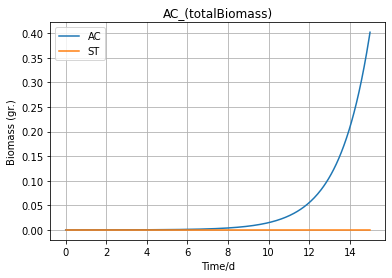

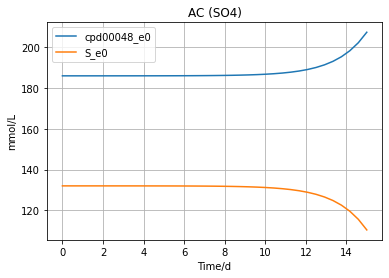

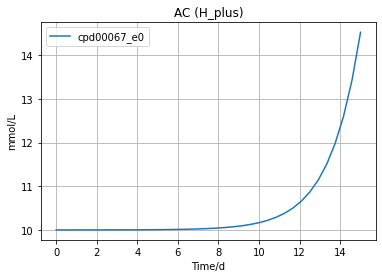

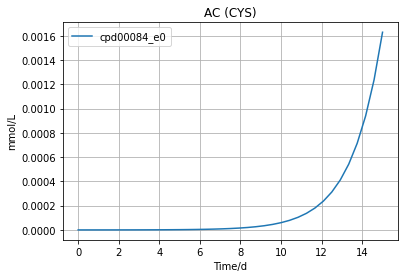

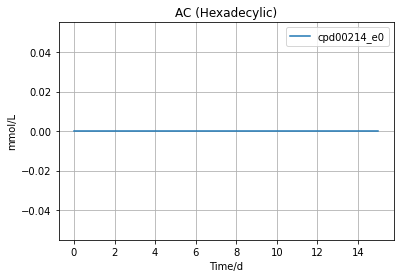

In [8]:
import cobra
import cometspy as c
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from cobra import Model, Reaction, Metabolite
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
# 加载模型和进行突变将TPI反应knock
# a = cobra.io.read_sbml_model('/jupyternotebook/ac_final_WP1376_03.xml')
# a = cobra.io.read_sbml_model('/jupyternotebook/AME_WP1377.xml')
a = cobra.io.read_sbml_model('/jupyternotebook/AME_Secr_Cys.xml')

a.reactions.EX_cpd00024_e0.bounds=(0,1000)#	2-Oxoglutarate
a.reactions.EX_cpd00094_e0.bounds=(0,1000)# 2-Ketobutyric acid
a.reactions.EX_cpd00082_e0.bounds=(0,1000)# D-Fructose
a.reactions.EX_cpd00029_e0.bounds=(0,1000) # Acetate
a.reactions.EX_cpd00138_e0.bounds=(0,1000) # D-Mannose
a.reactions.EX_cpd00072_e0.bounds=(0,1000) # D-fructose-6-phosphate
a.reactions.EX_cpd00794_e0.bounds=(0,1000)
a.reactions.EX_cpd00111_e0.bounds=(0,1000)
a.reactions.EX_cpd00276_e0.bounds=(0,1000)
a.reactions.EX_cpd00105_e0.bounds=(0,1000)
a.reactions.EX_cpd00129_e0.bounds=(0,1000)
a.reactions.EX_cpd00017_e0.bounds=(0,1000)
a.reactions.EX_cpd00100_e0.bounds=(0,1000)
a.reactions.EX_cpd00011_e0.bounds=(-1.575,-1.575)    
a.reactions.bio1.bounds=(0,0.0379)
a.reactions.bio1.bounds=(0,1000)
#     a.reactions.rxn00338_c0.bounds=(0,0)
a.reactions.rxn09296_c0.bounds=(0,0)
a.reactions.rxn00205_c0.bounds=(0,0)
add_reactions(a,'TR_25_84','cpd00025_c0 + 65.0 cpd00084_c0 --> 2.0 cpd00001_p0 + 1.31 cpd00084_p0 + cpd00007_p0')
add_metabolites_info(a)
a.reactions.EX_cpd00084_e0.bounds=(0,1000)
a.reactions.Tr_cpd00084_c0.bounds=(0,1000)

ac = c.model(a)
ac.id = 'AC'
# print(ac.reactions)
# ac.reactions.loc[ac.reactions.EXCH, "LB"] = -1000 
ac.open_exchanges()
ac.change_bounds('EX_S', -1.5, 1000) 
ac.change_bounds('EX_cpd00011_e0', -1.575,-1.575) 
ac.change_bounds('EX_cpd00084_e0', 0,1000) 
ac.change_bounds('EX_cpd00011_e0',-1.575,-1.575)
AC.change_bounds('Tr_cpd00084_c0',0,1000)
ac.initial_pop=[0, 0, 2e-5]
for i in ac.reactions.loc[ac.reactions.EXCH, "REACTION_NAMES"] :
    ac.change_vmax(i,3.3)
    ac.change_km(i,0.015)
# ac.change_vmax('EX_cpd00067_b', 1000)
# ac.change_km('EX_cpd00067_b', 0.000015)
test_tube = c.layout(ac)

media ={key[3:]: value for key, value in a.medium.items() if key != 'EX_S' and key != 'rxn13783_c0' and key != 'rxn13784_c0' and key != 'rxn13782_c0' }
for k, v in media.items():
    test_tube.set_specific_metabolite(k, v)

s = cobra.io.read_sbml_model('/jupyternotebook/ST_cys.xml')
add_reactions(s,'EX_cpd00214_e0','cpd00214_e0 <-> ')
add_reactions(s,'EX_cpd00214_c0',' cpd00214_c0 <-> cpd00214_e0')
s.reactions.EX_cpd00214_e0.bounds=(-0.004,1000)
s.reactions.EX_cpd00084_e0.bounds=(-0.003,1000)
add_metabolites_info(s)

st = c.model(s)
st.id = 'ST'
st.open_exchanges()
st.change_bounds('EX_cpd00067_e0', 0, 1)
st.change_bounds('EX_cpd00084_e0', -1000, 1000)
st.change_bounds('EX_cpd00214_e0', -1000, 1000)
# st.change_bounds('EX_cpd00214_e0', -1000, 1000)


st.initial_pop = [0, 0, 2e-5]
for i in st.reactions.loc[st.reactions.EXCH, "REACTION_NAMES"]:
    st.change_vmax(i, 6.5)
    st.change_km(i, 0.015)
st.change_vmax('EX_cpd00067_e0', 0.1)
st.change_km('EX_cpd00067_e0', 0.000015)
st.change_vmax('EX_cpd10515_e0', 10.5)
st.change_km('EX_cpd10515_e0', 0.01)

test_tube.add_model(st)
media ={key[3:]: value for key, value in s.medium.items() if key != 'EX_cpd00084_e0' and key != 'EX_S'}
for k, v in media.items():
    test_tube.set_specific_metabolite(k, v)
test_tube.set_specific_metabolite('S_e0', 132)
test_tube.set_specific_metabolite('cpd00048_e0', 186)
test_tube.set_specific_metabolite('cpd00067_e0', 10)
test_tube.set_specific_metabolite('cpd00011_e0', 1000)
test_tube.set_specific_metabolite('cpd00007_e0', 1000)
test_tube.set_specific_metabolite('cpd10515_e0', 32.0)
test_tube.set_specific_metabolite('cpd10516_e0', 0)
test_tube.set_specific_metabolite('cpd00084_e0', 0)
test_tube.set_specific_metabolite('cpd00214_e0', 0)



comp_params = c.params()
params.set_param("metaboliteDilutionRate", 0.01)
comp_params.set_param('spaceWidth', 10)
comp_params.set_param('timeStep', 1)  # 时间步长
comp_params.set_param('maxCycles', 24*15)  # 模拟运行迭代次数
# comp_params.set_param('defaultVmax', 7) 
# comp_params.set_param('defaultKm', 0.000015)
comp_params.set_param('exchangestyle', "Monod Style")
comp_params.set_param('biomassMotionStyle', "Diffusion 3D")
comp_params.set_param("deathRate", 0.01)
comp_params.set_param('maxSpaceBiomass', 1)
comp_params.set_param('cellSize', 4.3e-12)
comp_params.set_param('numExRxnSubsteps', 12)
comp_params.set_param('writeSpecificMediaLog', True)
comp_params.set_param('specificMediaLogRate', 10)
comp_params.set_param('specificMedia', 'cpd00067_e0,S_e0,cpd00048_e0,cpd00084_e0,cpd00214_e0,cpd10515_e0')
comp_params.set_param('numRunThreads', 24)  # 运行线程

comp_assay = c.comets(test_tube, comp_params)
comp_assay.run()

biomass = comp_assay.total_biomass
biomass['t'] = biomass['cycle'] * comp_assay.parameters.all_params['timeStep'] / 24
myplot = biomass.drop(columns=['cycle']).plot(x='t')
myplot.set_ylabel("Biomass (gr.)")
myplot.set_xlabel('Time/d')
plt.title("AC_(totalBiomass)")
plt.grid()
fig = comp_assay.specific_media
fig['t'] = fig['cycle'] * comp_assay.parameters.all_params['timeStep'] / 24
fig1=comp_assay.specific_media.plot(x='t', y=['cpd00048_e0','S_e0'])
fig1.set_ylabel("mmol/L")
fig1.set_xlabel("Time/d")
plt.title("AC (SO4)")
plt.grid()
fig2=comp_assay.specific_media.plot(x='t', y=['cpd00067_e0'])
fig2.set_ylabel("mmol/L")
fig2.set_xlabel("Time/d")
plt.title("AC (H_plus)")
plt.grid()
fig2=comp_assay.specific_media.plot(x='t', y=['cpd00084_e0'])
fig2.set_ylabel("mmol/L")
fig2.set_xlabel("Time/d")
plt.title("AC (CYS)")
plt.grid()
fig2=comp_assay.specific_media.plot(x='t', y=['cpd00214_e0'])
fig2.set_ylabel("mmol/L")
fig2.set_xlabel("Time/d")
plt.title("AC (Hexadecylic)")
plt.grid()

In [57]:
# media ={key[3:]: value for key, value in s.medium.items() if key != 'EX_cpd00084_e0'}
test_tube.media

,diff_c,g_refresh,g_static,g_static_val,init_amount,metabolite
0,0.000005,0,0,0,0,S4O6_e0
1,0.000005,0,0,0,132,S_e0
2,0.000005,0,0,0,0,cpd00001_c0
3,0.000005,0,0,0,1000.0,cpd00001_e0
4,0.000005,0,0,0,1000,cpd00007_e0
5,0.000005,0,0,0,1000.0,cpd00009_e0
6,0.000005,0,0,0,1000,cpd00011_e0
7,0.000005,0,0,0,1000.0,cpd00013_e0
8,0.000005,0,0,0,0,cpd00017_e0
9,0.000005,0,0,0,0.00053,cpd00024_e0


In [46]:
ac.obj_style

'MAXIMIZE_OBJECTIVE_FLUX'

#  ST

Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.


{'EX_cpd04097_e0': 1000.0, 'EX_cpd00001_e0': 1000.0, 'EX_cpd00058_e0': 1000.0, 'EX_cpd00013_e0': 1000.0, 'EX_cpd10515_e0': 2.47, 'EX_cpd00009_e0': 1000.0, 'EX_cpd00254_e0': 1000.0, 'EX_cpd00205_e0': 1000.0, 'EX_cpd00034_e0': 1000.0, 'EX_cpd10516_e0': 1000.0, 'EX_cpd00030_e0': 1000.0, 'EX_cpd00149_e0': 1000.0, 'EX_cpd00099_e0': 1000.0, 'EX_cpd00531_e0': 1000.0, 'EX_cpd00971_e0': 1000.0, 'EX_cpd00007_e0': 1000.0, 'EX_cpd00011_e0': 1000.0, 'EX_cpd00063_e0': 1000.0, 'EX_cpd00048_e0': 1000.0, 'EX_cpd00028_e0': 1000.0, 'EX_cpd11606_e0': 1000.0, 'EX_cpd00024_e0': 0.00053, 'EX_cpd00084_e0': 0.00056}


 ST uptakes in co-culture medium: 


Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_e0,EX_cpd00007_e0,2.47,0,0.00%
cpd00011_e0,EX_cpd00011_e0,0.3477,1,98.75%
cpd00013_e0,EX_cpd00013_e0,0.07834,0,0.00%
cpd00024_e0,EX_cpd00024_e0,0.00053,5,0.75%
cpd00048_e0,EX_cpd00048_e0,0.001112,0,0.00%
cpd00063_e0,EX_cpd00063_e0,2.926E-05,0,0.00%
cpd00084_e0,EX_cpd00084_e0,0.00056,3,0.48%
cpd00205_e0,EX_cpd00205_e0,0.00645,0,0.00%
cpd00254_e0,EX_cpd00254_e0,0.0009292,0,0.00%
cpd10515_e0,EX_cpd10515_e0,2.47,0,0.00%


building empty layout model
models will need to be added with layout.add_model()


Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.
Could not identify an external compartment by name and choosing one with the most boundary reactions. That might be complete nonsense or change suddenly. Consider renaming your compartments using `Model.compartments` to fix this.



Running COMETS simulation ...
Done!


Text(0, 0.5, 'Biomass (gr.)')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AC_(totalBiomass)')

Text(0, 0.5, 'mmol/L')

Text(0.5, 0, 'Time/d')

Text(0.5, 1.0, 'AC (SO4)')

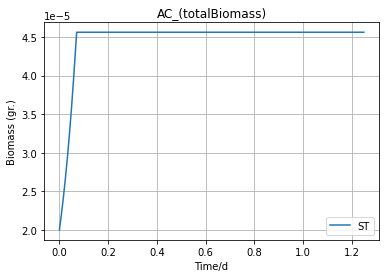

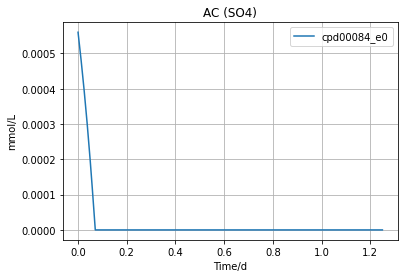

In [10]:
#chromsat
import cobra
# from cobra import test # for the ijo1366 model
import sys
import cometspy as c
import cobra
import cometspy as c
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from cobra import Model, Reaction, Metabolite

# a = cobra.io.read_sbml_model('/jupyternotebook/AME_Secr_Cys.xml')
s = cobra.io.read_sbml_model('/jupyternotebook/ST_cys_add.xml')
s.reactions.EX_cpd00084_e0.bounds=(-0.00056,1000)
s.reactions.EX_cpd00024_e0.bounds=(-0.00053,1000) 
medium_s = s.medium
print(medium_s)

print("\n\n ST uptakes in co-culture medium: ")
s.summary()
# chemostat parameters

dilution_rate = 0.1 # / hr
initial_pop = 1.e-3 # gDW

# make COMETS models from the cobrapy models
s.id = "ST"

st = c.model(s)
st.initial_pop = [0,0,2e-5] # x, y, gDW
st.open_exchanges()

# setup layout by providing models
layout = c.layout()
layout = c.layout([st])

# re-write media (while removing galactose) and add it to layout
comets_media = {key[3:]: value for key, value in s.medium.items() if key != 'EX_cpd00084_e0' }
comets_media = {key[3:]: value for key, value in s.medium.items()}
for key, value in comets_media.items():
    layout.set_specific_metabolite(key, value)

# for key, value in comets_media.items():
#     layout.set_specific_refresh(key, value * dilution_rate)
# layout.set_specific_metabolite('cpd00084_e0', 0.000012)

params = c.params()
# params.set_param("deathRate", 0.1)
params.set_param("metaboliteDilutionRate", 0.1)

params.set_param("timeStep", 0.1) # hours
params.set_param("maxSpaceBiomass", 1) # gDW
params.set_param("maxCycles", 300) # duration of simulation in time steps
# params.set_param('spaceWidth', 1)
params.set_param("writeSpecificMediaLog", True)
params.set_param("specificMediaLogRate", 1) # time steps
params.set_param('specificMedia', 'cpd00084_e0,cpd10516_e0') # metabolites to track
params.set_param('numRunThreads', 27)#运行线程

comp_assay = c.comets(layout, params)
comp_assay.run()

biomass = comp_assay.total_biomass
biomass['t'] = biomass['cycle'] * comp_assay.parameters.all_params['timeStep'] / 24
myplot = biomass.drop(columns=['cycle']).plot(x='t')
myplot.set_ylabel("Biomass (gr.)")
myplot.set_xlabel('Time/d')
plt.title("AC_(totalBiomass)")
plt.grid()
fig = comp_assay.specific_media
fig['t'] = fig['cycle'] * comp_assay.parameters.all_params['timeStep'] / 24
fig1=comp_assay.specific_media.plot(x='t', y=['cpd00084_e0'])
fig1.set_ylabel("mmol/L")
fig1.set_xlabel("Time/d")
plt.title("AC (SO4)")
plt.grid()

In [122]:
s.summary()

Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_e0,EX_cpd00007_e0,2.47,0,0.00%
cpd00011_e0,EX_cpd00011_e0,0.3477,1,98.75%
cpd00013_e0,EX_cpd00013_e0,0.07834,0,0.00%
cpd00024_e0,EX_cpd00024_e0,0.00053,5,0.75%
cpd00048_e0,EX_cpd00048_e0,0.001112,0,0.00%
cpd00063_e0,EX_cpd00063_e0,2.926E-05,0,0.00%
cpd00084_e0,EX_cpd00084_e0,0.00056,3,0.48%
cpd00205_e0,EX_cpd00205_e0,0.00645,0,0.00%
cpd00254_e0,EX_cpd00254_e0,0.0009292,0,0.00%
cpd10515_e0,EX_cpd10515_e0,2.47,0,0.00%


#  案例

In [127]:
E_no_galE = cobra.io.read_sbml_model('/jupyternotebook/models/iJO1366.xml') # this model will have galE KO'd
E_no_LCTStex = E_no_galE.copy() # this model will have lactose uptake KO'd
E_no_galE.genes.b0759.knock_out()
E_no_LCTStex.reactions.LCTStex.knock_out()

Read LP format model from file C:\Users\wupen\AppData\Local\Temp\tmpa3le5ocy.lp
Reading time = 0.01 seconds
: 1805 rows, 5166 columns, 20366 nonzeros


In [128]:
medium = E_no_galE.medium
medium["EX_glc__D_e"] = 0.
medium["EX_lcts_e"] = 1.
medium["EX_gal_e"] = 1.
print(medium)
E_no_galE.medium = medium
E_no_LCTStex.medium = medium
# examine growth and uptake in the galE knockout shows galactose is excreted
print("\n\nE_no_galE uptakes lactose and excrete galactose: ")
E_no_galE.summary()

print("\n\nE_no_LCTStex uptakes galactose but not lactose: ")
E_no_LCTStex.summary()

{'EX_co2_e': 1000.0, 'EX_cobalt2_e': 1000.0, 'EX_glc__D_e': 0.0, 'EX_h_e': 1000.0, 'EX_h2o_e': 1000.0, 'EX_k_e': 1000.0, 'EX_cu2_e': 1000.0, 'EX_mg2_e': 1000.0, 'EX_mn2_e': 1000.0, 'EX_mobd_e': 1000.0, 'EX_na1_e': 1000.0, 'EX_nh4_e': 1000.0, 'EX_ca2_e': 1000.0, 'EX_cbl1_e': 0.01, 'EX_ni2_e': 1000.0, 'EX_o2_e': 1000.0, 'EX_cl_e': 1000.0, 'EX_pi_e': 1000.0, 'EX_zn2_e': 1000.0, 'EX_sel_e': 1000.0, 'EX_slnt_e': 1000.0, 'EX_so4_e': 1000.0, 'EX_tungs_e': 1000.0, 'EX_fe2_e': 1000.0, 'EX_fe3_e': 1000.0, 'EX_lcts_e': 1.0, 'EX_gal_e': 1.0}


E_no_galE uptakes lactose and excrete galactose: 


Metabolite,Reaction,Flux,C-Number,C-Flux
ca2_e,EX_ca2_e,0.0004501,0,0.00%
cl_e,EX_cl_e,0.0004501,0,0.00%
cobalt2_e,EX_cobalt2_e,2.162E-06,0,0.00%
cu2_e,EX_cu2_e,6.131E-05,0,0.00%
fe2_e,EX_fe2_e,0.001389,0,0.00%
k_e,EX_k_e,0.01688,0,0.00%
lcts_e,EX_lcts_e,1,12,100.00%
mg2_e,EX_mg2_e,0.0007502,0,0.00%
mn2_e,EX_mn2_e,5.976E-05,0,0.00%
mobd_e,EX_mobd_e,1.116E-05,0,0.00%




E_no_LCTStex uptakes galactose but not lactose: 


Metabolite,Reaction,Flux,C-Number,C-Flux
ca2_e,EX_ca2_e,0.0004447,0,0.00%
cl_e,EX_cl_e,0.0004447,0,0.00%
cobalt2_e,EX_cobalt2_e,2.136E-06,0,0.00%
cu2_e,EX_cu2_e,6.058E-05,0,0.00%
fe2_e,EX_fe2_e,0.001372,0,0.00%
gal_e,EX_gal_e,1,6,100.00%
k_e,EX_k_e,0.01668,0,0.00%
mg2_e,EX_mg2_e,0.0007412,0,0.00%
mn2_e,EX_mn2_e,5.904E-05,0,0.00%
mobd_e,EX_mobd_e,1.102E-05,0,0.00%



Running COMETS simulation ...
Done!


<AxesSubplot:xlabel='cycle'>

<AxesSubplot:xlabel='cycle'>

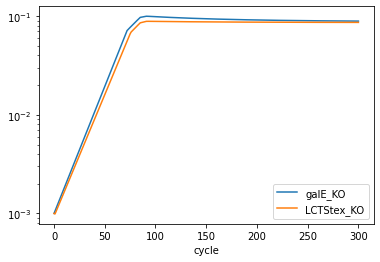

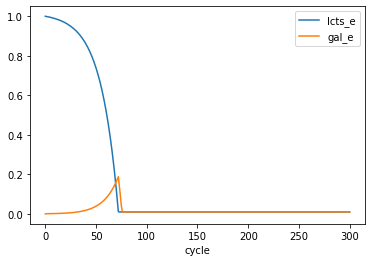

In [130]:
# chemostat parameters
dilution_rate = 0.1 # / hr
initial_pop = 1.e-3 # gDW

# make COMETS models from the cobrapy models
E_no_galE.id = "galE_KO"
E_no_LCTStex.id = "LCTStex_KO"

galE_comets = c.model(E_no_galE)
galE_comets.initial_pop = [0,0,initial_pop] # x, y, gDW
galE_comets.open_exchanges()

lcts_comets = c.model(E_no_LCTStex)
lcts_comets.initial_pop = [0,0,initial_pop] # x, y, gDW
lcts_comets.open_exchanges()

# setup layout by providing models
layout = c.layout([galE_comets, lcts_comets])
# layout = c.layout([galE_comets])

# re-write media (while removing galactose) and add it to layout
comets_media = {key[3:]: value for key, value in medium.items() if key != "EX_gal_e"}
for key, value in comets_media.items():
    layout.set_specific_metabolite(key, value)
    
for key, value in comets_media.items():
    layout.set_specific_refresh(key, value * dilution_rate)
    
params = c.params()
params.set_param("deathRate", dilution_rate)
params.set_param("metaboliteDilutionRate", dilution_rate)
params.set_param("timeStep", 0.1) # hours
params.set_param("maxSpaceBiomass", 10.) # gDW
params.set_param("maxCycles", 300) # duration of simulation in time steps
params.set_param("writeSpecificMediaLog", True)
params.set_param("specificMediaLogRate", 1) # time steps
params.set_param("specificMedia", "lcts_e,gal_e") # metabolites to track
sim = c.comets(layout, params)
sim.run()
sim.total_biomass.plot(x = "cycle", logy = True)
sim.specific_media.plot(x = "cycle",y = ["lcts_e","gal_e"])

In [51]:
layout.media

,diff_c,g_refresh,g_static,g_static_val,init_amount,metabolite
0,0.000005,0,0,0,0,12ppd__R_e
1,0.000005,0,0,0,0,12ppd__S_e
2,0.000005,0,0,0,0,14glucan_e
3,0.000005,0,0,0,0,15dap_e
4,0.000005,0,0,0,0,23camp_e
5,0.000005,0,0,0,0,23ccmp_e
6,0.000005,0,0,0,0,23cgmp_e
7,0.000005,0,0,0,0,23cump_e
8,0.000005,0,0,0,0,23dappa_e
9,0.000005,0,0,0,0,26dap__M_e
